# 머신러닝/딥러닝 과제 2
- MNIST, CIFAR10 데이터셋 학습 모델 만들기

# 2. CIFAR10 데이터셋 학습 모델 만들기

## 2-0. Library

In [1]:
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
import torch.backends.cudnn as cudnn

import torchvision
import torchvision.transforms as transforms

import numpy as np
import matplotlib.pyplot as plt

import os

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print("device : gpu") if torch.cuda.is_available() else print("device : cpu")

device : gpu


## 2-1. Hyper-Parameter Setting

In [2]:
learning_rate = 1e-1
batch_size = 128
dropout_rate = 0.2

best_acc = 0
start_epoch = 0 # start from epoch 0 or last checkpoint epoch

activation = nn.ReLU()
max_pool = nn.MaxPool2d(2,2)

## 2-2. Load Data & Data Pre-processing

Files already downloaded and verified
Files already downloaded and verified


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


data : tensor([[[-0.1998, -1.0416, -1.5776],
         [-0.1610, -0.9629, -1.5385],
         [-0.2192, -1.0022, -1.4995],
         ...,
         [-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214]],

        [[-0.0253, -0.9039, -1.5190],
         [-0.0835, -0.9039, -1.5190],
         [-0.1029, -0.8842, -1.4410],
         ...,
         [-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214]],

        [[ 0.2073, -0.6876, -1.3434],
         [ 0.1104, -0.7662, -1.4020],
         [ 0.0716, -0.7662, -1.3825],
         ...,
         [-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214]],

        ...,

        [[-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214],
         ...,
         [-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214],
         [-2.4291, -2.4183, -2.2214]],

   

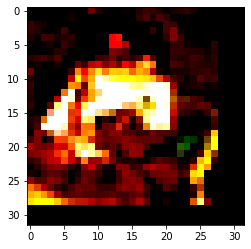

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


data shape: torch.Size([128, 3, 32, 32])
label: tensor([7, 0, 7, 1, 4, 6, 8, 7, 2, 2, 8, 2, 0, 8, 1, 3, 6, 7, 9, 4, 6, 3, 2, 3,
        4, 4, 8, 4, 6, 9, 4, 9, 4, 0, 4, 6, 7, 7, 4, 2, 6, 3, 7, 4, 9, 2, 5, 3,
        9, 6, 6, 9, 9, 6, 8, 5, 8, 6, 6, 2, 0, 0, 6, 5, 6, 9, 5, 0, 8, 3, 5, 4,
        1, 5, 3, 8, 5, 6, 8, 1, 1, 9, 0, 0, 8, 4, 1, 0, 0, 9, 0, 0, 1, 3, 2, 6,
        9, 6, 4, 0, 3, 3, 1, 2, 2, 5, 8, 9, 7, 4, 5, 2, 8, 3, 3, 1, 0, 7, 0, 2,
        3, 5, 1, 7, 2, 8, 5, 7])


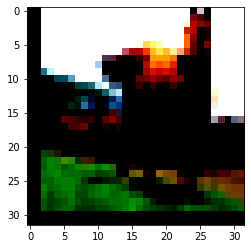

In [3]:
transform_train = transforms.Compose([
    transforms.RandomCrop(32, padding=4),
    transforms.RandomHorizontalFlip(),
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

transform_test = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.4914, 0.4822, 0.4465), (0.2023, 0.1994, 0.2010)),
])

train_data = torchvision.datasets.CIFAR10(
    root='./data', train=True, download=True, transform=transform_train)
train_loader = torch.utils.data.DataLoader(
    train_data, batch_size=batch_size, shuffle=True, num_workers=2, drop_last = True)

test_data = torchvision.datasets.CIFAR10(
    root='./data', train=False, download=True, transform=transform_test)
test_loader = torch.utils.data.DataLoader(
    test_data, batch_size=batch_size, shuffle=False, num_workers=2, drop_last = True)


# data 확인
x_train, y_train = train_data[0]
x_train = np.transpose(x_train, (1 , 2, 0))

print("data :", x_train)
print("data shape :", x_train.shape)
print("label :", y_train)

plt.figure()
plt.imshow(x_train)
plt.show()


examples = enumerate(train_loader)
batch_idx, (example_data, example_target) = next(examples)

print('data shape:', example_data.shape)
print('label:', example_target)

check_image = example_data[0]
check_image = np.transpose(check_image, (1, 2, 0))

plt.figure()
plt.imshow(check_image)
plt.show()

## 2-3. Model & Opimizatino and Loss function

In [4]:
class CNN(nn.Module):
    def __init__(self):
        super(CNN, self).__init__() # for initializing nn.Module (parent class)
        
        # 1. CNN : feature 추출
        self.feature_extraction = nn.Sequential(
            # 입력 : 3 * 32 * 32
            
            nn.Conv2d(3, 64, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(64),
            activation, 
            #nn.Dropout2d(dropout_rate),
            # 64 * 32 * 32
            nn.Conv2d(64, 64, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(64),
            activation, 
            #nn.Dropout2d(dropout_rate),
            # 64 * 32 * 32
            max_pool,
            # 64 * 16 * 16
            
            
            nn.Conv2d(64, 128, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(128),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 128 * 16 * 16
            nn.Conv2d(128, 128, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(128),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 128 * 16 * 16
            max_pool,
            # 128 * 8 * 8
            
            
            nn.Conv2d(128, 256, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(256),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 256 * 8 * 8
            nn.Conv2d(256, 256, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(256),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 256 * 8 * 8
            nn.Conv2d(256, 256, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(256),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 256 * 8 * 8
            max_pool,
            # 256 * 4 * 4
            
            
            nn.Conv2d(256, 512, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(512),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 512 * 4 * 4
            nn.Conv2d(512, 512, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(512),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 512 * 4 * 4
            nn.Conv2d(512, 512, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(512),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 512 * 4 * 4
            max_pool,
            # 512 * 2 * 2
            
            
            nn.Conv2d(512, 512, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(512),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 512 * 2 * 2
            nn.Conv2d(512, 512, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(512),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 512 * 2 * 2
            nn.Conv2d(512, 512, 3, padding = 1), # kernel_size = 3에 padding = 1을 두면 사이즈가 유지됨
            nn.BatchNorm2d(512),
            activation,
            #nn.Dropout2d(dropout_rate),
            # 512 * 2 * 2
            max_pool,
            # 512 * 1 * 1
            
            nn.AvgPool2d(1, 1)
            # 512 * 1 * 1
        )
        
        
        # 2. CNN : 분류
        self.classifier = nn.Sequential(
            nn.Linear(512 * 1 * 1, 10),
            #activation,
            #nn.Dropout(dropout_rate),
        )

        
    # 학습
    def forward(self, x):
        # 입력 : 3 * 32 * 32
        
        extracted_feature = self.feature_extraction(x)
        #print(extracted_feature.shape)
        flatten = extracted_feature.view(batch_size, -1)
        result = self.classifier(flatten)
        return result

    
model = CNN().to(device)
#model.train()
loss_function = nn.CrossEntropyLoss()
optimizer = optim.SGD(model.parameters(), lr=learning_rate, momentum=0.9, weight_decay=5e-4)

## 2-4. Train & Test

In [5]:
# Training

train_loss_array = []

def train(epoch):
    print("\nEpoch :", epoch)
    model.train()
    train_loss = 0
    correct = 0
    total = 0
    
    for batch_idx, [data, label] in enumerate(train_loader):
        data, label = data.to(device), label.to(device)
                
        optimizer.zero_grad()
        output = model.forward(data)
        loss = loss_function(output, label)
        loss.backward()
        optimizer.step()
        
        train_loss += loss.item()
        _, prediction_index = torch.max(output, 1)
        total += label.size(0)
        correct += (prediction_index == label).sum().float()
        
        print("\t%d / %d" %(batch_idx, len(train_loader)))
        print("\ttrain loss : %.3f | Acc : %3f%% (%d / %d)" %(train_loss/(batch_idx+1), correct/total*100, correct, total))
        
        train_loss_array.append(loss.cpu().detach().numpy())

In [6]:
#test the model

test_loss_array = []

def test(epoch):
    global best_acc
    
    model.eval()
    test_loss = 0
    correct = 0
    total = 0
    
    with torch.no_grad():
        for batch_idx, [data, label] in enumerate(test_loader):
            data, label = data.to(device), label.to(device)
            output = model.forward(data)
            loss = loss_function(output, label)
            
            test_loss += loss.item()
            _, prediction_index = torch.max(output, 1)
            total += label.size(0)
            correct += (prediction_index == label).sum().float()
        
            print("\t%d / %d" %(batch_idx, len(test_loader)))
            print("\ttest loss : %.3f | Acc : %3f%% (%d / %d)" %(test_loss/(batch_idx+1), correct/total*100, correct, total))
        
            test_loss_array.append(loss.cpu().detach().numpy())
            
    acc = correct/total * 100
    if acc > best_acc:
        print("\t...Saving model...")
        state = {
            "model" : model.state_dict(),
            "acc" : acc,
            "epoch" : epoch,
        }
        if not os.path.isdir("checkpoint"):
            os.mkdir("checkpoint")
        torch.save(state, "./checkpoint/best_model.pth")
        
        best_acc = acc

In [7]:
for epoch in range(start_epoch, start_epoch + 150):
    train(epoch)
    test(epoch)


Epoch : 0
	0 / 390
	train loss : 2.628 | Acc : 8.593750% (11 / 128)
	1 / 390
	train loss : 5.320 | Acc : 9.375000% (24 / 256)
	2 / 390
	train loss : 5.287 | Acc : 8.333334% (32 / 384)
	3 / 390
	train loss : 6.242 | Acc : 8.789062% (45 / 512)
	4 / 390
	train loss : 7.965 | Acc : 8.593750% (55 / 640)
	5 / 390
	train loss : 7.420 | Acc : 9.505209% (73 / 768)
	6 / 390
	train loss : 7.393 | Acc : 8.928572% (80 / 896)
	7 / 390
	train loss : 6.999 | Acc : 8.886719% (91 / 1024)
	8 / 390
	train loss : 7.074 | Acc : 9.461806% (109 / 1152)
	9 / 390
	train loss : 6.783 | Acc : 9.218750% (118 / 1280)
	10 / 390
	train loss : 6.447 | Acc : 9.161932% (129 / 1408)
	11 / 390
	train loss : 6.170 | Acc : 9.309896% (143 / 1536)
	12 / 390
	train loss : 5.882 | Acc : 9.314904% (155 / 1664)
	13 / 390
	train loss : 5.649 | Acc : 9.430804% (169 / 1792)
	14 / 390
	train loss : 5.461 | Acc : 9.531251% (183 / 1920)
	15 / 390
	train loss : 5.503 | Acc : 9.326172% (191 / 2048)
	16 / 390
	train loss : 5.328 | Acc : 

	135 / 390
	train loss : 2.985 | Acc : 9.978170% (1737 / 17408)
	136 / 390
	train loss : 2.980 | Acc : 9.968065% (1748 / 17536)
	137 / 390
	train loss : 2.975 | Acc : 9.941123% (1756 / 17664)
	138 / 390
	train loss : 2.970 | Acc : 9.948292% (1770 / 17792)
	139 / 390
	train loss : 2.965 | Acc : 9.960938% (1785 / 17920)
	140 / 390
	train loss : 2.960 | Acc : 9.962322% (1798 / 18048)
	141 / 390
	train loss : 2.956 | Acc : 9.963688% (1811 / 18176)
	142 / 390
	train loss : 2.951 | Acc : 9.970498% (1825 / 18304)
	143 / 390
	train loss : 2.947 | Acc : 9.998916% (1843 / 18432)
	144 / 390
	train loss : 2.943 | Acc : 9.994612% (1855 / 18560)
	145 / 390
	train loss : 2.938 | Acc : 9.995719% (1868 / 18688)
	146 / 390
	train loss : 2.934 | Acc : 10.023384% (1886 / 18816)
	147 / 390
	train loss : 2.929 | Acc : 10.029561% (1900 / 18944)
	148 / 390
	train loss : 2.925 | Acc : 10.019924% (1911 / 19072)
	149 / 390
	train loss : 2.921 | Acc : 10.015626% (1923 / 19200)
	150 / 390
	train loss : 2.917 | Acc

	265 / 390
	train loss : 2.649 | Acc : 10.294291% (3505 / 34048)
	266 / 390
	train loss : 2.648 | Acc : 10.287921% (3516 / 34176)
	267 / 390
	train loss : 2.647 | Acc : 10.290345% (3530 / 34304)
	268 / 390
	train loss : 2.645 | Acc : 10.318890% (3553 / 34432)
	269 / 390
	train loss : 2.644 | Acc : 10.332754% (3571 / 34560)
	270 / 390
	train loss : 2.643 | Acc : 10.334987% (3585 / 34688)
	271 / 390
	train loss : 2.641 | Acc : 10.319967% (3593 / 34816)
	272 / 390
	train loss : 2.640 | Acc : 10.316506% (3605 / 34944)
	273 / 390
	train loss : 2.639 | Acc : 10.318772% (3619 / 35072)
	274 / 390
	train loss : 2.637 | Acc : 10.323863% (3634 / 35200)
	275 / 390
	train loss : 2.636 | Acc : 10.328918% (3649 / 35328)
	276 / 390
	train loss : 2.635 | Acc : 10.342396% (3667 / 35456)
	277 / 390
	train loss : 2.634 | Acc : 10.347347% (3682 / 35584)
	278 / 390
	train loss : 2.632 | Acc : 10.357862% (3699 / 35712)
	279 / 390
	train loss : 2.631 | Acc : 10.371094% (3717 / 35840)
	280 / 390
	train loss : 

	15 / 78
	test loss : 2.278 | Acc : 11.328125% (232 / 2048)
	16 / 78
	test loss : 2.278 | Acc : 11.305147% (246 / 2176)
	17 / 78
	test loss : 2.276 | Acc : 11.371528% (262 / 2304)
	18 / 78
	test loss : 2.276 | Acc : 11.348684% (276 / 2432)
	19 / 78
	test loss : 2.277 | Acc : 11.328125% (290 / 2560)
	20 / 78
	test loss : 2.277 | Acc : 11.197917% (301 / 2688)
	21 / 78
	test loss : 2.275 | Acc : 11.328125% (319 / 2816)
	22 / 78
	test loss : 2.275 | Acc : 11.345109% (334 / 2944)
	23 / 78
	test loss : 2.275 | Acc : 11.360678% (349 / 3072)
	24 / 78
	test loss : 2.275 | Acc : 11.343750% (363 / 3200)
	25 / 78
	test loss : 2.275 | Acc : 11.177885% (372 / 3328)
	26 / 78
	test loss : 2.273 | Acc : 11.284722% (390 / 3456)
	27 / 78
	test loss : 2.273 | Acc : 11.495537% (412 / 3584)
	28 / 78
	test loss : 2.272 | Acc : 11.637931% (432 / 3712)
	29 / 78
	test loss : 2.271 | Acc : 11.718751% (450 / 3840)
	30 / 78
	test loss : 2.272 | Acc : 11.693547% (464 / 3968)
	31 / 78
	test loss : 2.272 | Acc : 11.6

	71 / 390
	train loss : 2.269 | Acc : 12.641059% (1165 / 9216)
	72 / 390
	train loss : 2.268 | Acc : 12.671232% (1184 / 9344)
	73 / 390
	train loss : 2.268 | Acc : 12.679477% (1201 / 9472)
	74 / 390
	train loss : 2.268 | Acc : 12.656251% (1215 / 9600)
	75 / 390
	train loss : 2.268 | Acc : 12.602796% (1226 / 9728)
	76 / 390
	train loss : 2.268 | Acc : 12.642045% (1246 / 9856)
	77 / 390
	train loss : 2.268 | Acc : 12.580128% (1256 / 9984)
	78 / 390
	train loss : 2.268 | Acc : 12.549446% (1269 / 10112)
	79 / 390
	train loss : 2.268 | Acc : 12.568359% (1287 / 10240)
	80 / 390
	train loss : 2.268 | Acc : 12.577161% (1304 / 10368)
	81 / 390
	train loss : 2.268 | Acc : 12.499999% (1312 / 10496)
	82 / 390
	train loss : 2.268 | Acc : 12.443523% (1322 / 10624)
	83 / 390
	train loss : 2.268 | Acc : 12.434896% (1337 / 10752)
	84 / 390
	train loss : 2.267 | Acc : 12.408088% (1350 / 10880)
	85 / 390
	train loss : 2.267 | Acc : 12.445494% (1370 / 11008)
	86 / 390
	train loss : 2.267 | Acc : 12.446120

	200 / 390
	train loss : 2.252 | Acc : 12.775964% (3287 / 25728)
	201 / 390
	train loss : 2.252 | Acc : 12.778465% (3304 / 25856)
	202 / 390
	train loss : 2.252 | Acc : 12.780942% (3321 / 25984)
	203 / 390
	train loss : 2.252 | Acc : 12.779565% (3337 / 26112)
	204 / 390
	train loss : 2.252 | Acc : 12.789634% (3356 / 26240)
	205 / 390
	train loss : 2.252 | Acc : 12.784436% (3371 / 26368)
	206 / 390
	train loss : 2.252 | Acc : 12.809481% (3394 / 26496)
	207 / 390
	train loss : 2.252 | Acc : 12.804237% (3409 / 26624)
	208 / 390
	train loss : 2.252 | Acc : 12.787827% (3421 / 26752)
	209 / 390
	train loss : 2.252 | Acc : 12.786458% (3437 / 26880)
	210 / 390
	train loss : 2.252 | Acc : 12.762886% (3447 / 27008)
	211 / 390
	train loss : 2.252 | Acc : 12.746904% (3459 / 27136)
	212 / 390
	train loss : 2.252 | Acc : 12.749413% (3476 / 27264)
	213 / 390
	train loss : 2.252 | Acc : 12.777452% (3500 / 27392)
	214 / 390
	train loss : 2.251 | Acc : 12.801600% (3523 / 27520)
	215 / 390
	train loss : 

	330 / 390
	train loss : 2.223 | Acc : 13.739143% (5821 / 42368)
	331 / 390
	train loss : 2.222 | Acc : 13.754235% (5845 / 42496)
	332 / 390
	train loss : 2.222 | Acc : 13.780970% (5874 / 42624)
	333 / 390
	train loss : 2.221 | Acc : 13.805203% (5902 / 42752)
	334 / 390
	train loss : 2.221 | Acc : 13.824627% (5928 / 42880)
	335 / 390
	train loss : 2.221 | Acc : 13.836961% (5951 / 43008)
	336 / 390
	train loss : 2.220 | Acc : 13.846903% (5973 / 43136)
	337 / 390
	train loss : 2.220 | Acc : 13.861409% (5997 / 43264)
	338 / 390
	train loss : 2.219 | Acc : 13.885048% (6025 / 43392)
	339 / 390
	train loss : 2.219 | Acc : 13.913144% (6055 / 43520)
	340 / 390
	train loss : 2.218 | Acc : 13.918163% (6075 / 43648)
	341 / 390
	train loss : 2.218 | Acc : 13.964273% (6113 / 43776)
	342 / 390
	train loss : 2.217 | Acc : 13.985059% (6140 / 43904)
	343 / 390
	train loss : 2.217 | Acc : 13.987555% (6159 / 44032)
	344 / 390
	train loss : 2.216 | Acc : 14.010418% (6187 / 44160)
	345 / 390
	train loss : 


Epoch : 2
	0 / 390
	train loss : 2.016 | Acc : 16.406250% (21 / 128)
	1 / 390
	train loss : 2.007 | Acc : 15.625000% (40 / 256)
	2 / 390
	train loss : 1.967 | Acc : 19.270834% (74 / 384)
	3 / 390
	train loss : 1.970 | Acc : 20.703125% (106 / 512)
	4 / 390
	train loss : 1.972 | Acc : 20.156250% (129 / 640)
	5 / 390
	train loss : 1.967 | Acc : 20.703125% (159 / 768)
	6 / 390
	train loss : 1.989 | Acc : 21.205359% (190 / 896)
	7 / 390
	train loss : 1.985 | Acc : 22.460938% (230 / 1024)
	8 / 390
	train loss : 1.980 | Acc : 22.309027% (257 / 1152)
	9 / 390
	train loss : 1.987 | Acc : 22.500000% (288 / 1280)
	10 / 390
	train loss : 1.989 | Acc : 22.230114% (313 / 1408)
	11 / 390
	train loss : 1.998 | Acc : 21.614584% (332 / 1536)
	12 / 390
	train loss : 1.993 | Acc : 22.055288% (367 / 1664)
	13 / 390
	train loss : 1.988 | Acc : 21.930805% (393 / 1792)
	14 / 390
	train loss : 1.981 | Acc : 22.343752% (429 / 1920)
	15 / 390
	train loss : 1.983 | Acc : 22.265625% (456 / 2048)
	16 / 390
	train 

	130 / 390
	train loss : 1.954 | Acc : 21.928675% (3677 / 16768)
	131 / 390
	train loss : 1.953 | Acc : 21.975616% (3713 / 16896)
	132 / 390
	train loss : 1.953 | Acc : 21.968987% (3740 / 17024)
	133 / 390
	train loss : 1.953 | Acc : 21.921640% (3760 / 17152)
	134 / 390
	train loss : 1.953 | Acc : 21.927082% (3789 / 17280)
	135 / 390
	train loss : 1.951 | Acc : 22.001379% (3830 / 17408)
	136 / 390
	train loss : 1.951 | Acc : 22.034672% (3864 / 17536)
	137 / 390
	train loss : 1.952 | Acc : 22.016531% (3889 / 17664)
	138 / 390
	train loss : 1.951 | Acc : 22.021133% (3918 / 17792)
	139 / 390
	train loss : 1.951 | Acc : 22.036831% (3949 / 17920)
	140 / 390
	train loss : 1.951 | Acc : 22.035683% (3977 / 18048)
	141 / 390
	train loss : 1.951 | Acc : 22.023546% (4003 / 18176)
	142 / 390
	train loss : 1.951 | Acc : 22.017046% (4030 / 18304)
	143 / 390
	train loss : 1.951 | Acc : 22.026911% (4060 / 18432)
	144 / 390
	train loss : 1.950 | Acc : 22.004311% (4084 / 18560)
	145 / 390
	train loss : 

	260 / 390
	train loss : 1.934 | Acc : 22.752035% (7601 / 33408)
	261 / 390
	train loss : 1.934 | Acc : 22.766581% (7635 / 33536)
	262 / 390
	train loss : 1.934 | Acc : 22.763189% (7663 / 33664)
	263 / 390
	train loss : 1.933 | Acc : 22.753906% (7689 / 33792)
	264 / 390
	train loss : 1.933 | Acc : 22.750589% (7717 / 33920)
	265 / 390
	train loss : 1.933 | Acc : 22.741425% (7743 / 34048)
	266 / 390
	train loss : 1.933 | Acc : 22.735252% (7770 / 34176)
	267 / 390
	train loss : 1.933 | Acc : 22.743704% (7802 / 34304)
	268 / 390
	train loss : 1.933 | Acc : 22.754995% (7835 / 34432)
	269 / 390
	train loss : 1.933 | Acc : 22.783564% (7874 / 34560)
	270 / 390
	train loss : 1.932 | Acc : 22.817690% (7915 / 34688)
	271 / 390
	train loss : 1.932 | Acc : 22.819967% (7945 / 34816)
	272 / 390
	train loss : 1.932 | Acc : 22.862295% (7989 / 34944)
	273 / 390
	train loss : 1.932 | Acc : 22.878651% (8024 / 35072)
	274 / 390
	train loss : 1.932 | Acc : 22.872158% (8051 / 35200)
	275 / 390
	train loss : 

	386 / 390
	train loss : 1.916 | Acc : 23.376938% (11580 / 49536)
	387 / 390
	train loss : 1.916 | Acc : 23.371052% (11607 / 49664)
	388 / 390
	train loss : 1.916 | Acc : 23.393316% (11648 / 49792)
	389 / 390
	train loss : 1.915 | Acc : 23.401443% (11682 / 49920)
	0 / 78
	test loss : 1.836 | Acc : 27.343750% (35 / 128)
	1 / 78
	test loss : 1.815 | Acc : 29.296875% (75 / 256)
	2 / 78
	test loss : 1.818 | Acc : 27.604168% (106 / 384)
	3 / 78
	test loss : 1.811 | Acc : 27.343750% (140 / 512)
	4 / 78
	test loss : 1.804 | Acc : 28.281250% (181 / 640)
	5 / 78
	test loss : 1.811 | Acc : 28.385418% (218 / 768)
	6 / 78
	test loss : 1.820 | Acc : 27.008930% (242 / 896)
	7 / 78
	test loss : 1.819 | Acc : 26.562500% (272 / 1024)
	8 / 78
	test loss : 1.822 | Acc : 26.215279% (302 / 1152)
	9 / 78
	test loss : 1.826 | Acc : 26.250002% (336 / 1280)
	10 / 78
	test loss : 1.828 | Acc : 26.562500% (374 / 1408)
	11 / 78
	test loss : 1.829 | Acc : 26.106771% (401 / 1536)
	12 / 78
	test loss : 1.829 | Acc :

	55 / 390
	train loss : 1.844 | Acc : 27.134487% (1945 / 7168)
	56 / 390
	train loss : 1.845 | Acc : 27.151865% (1981 / 7296)
	57 / 390
	train loss : 1.847 | Acc : 27.141703% (2015 / 7424)
	58 / 390
	train loss : 1.848 | Acc : 27.092161% (2046 / 7552)
	59 / 390
	train loss : 1.848 | Acc : 27.031252% (2076 / 7680)
	60 / 390
	train loss : 1.848 | Acc : 27.113216% (2117 / 7808)
	61 / 390
	train loss : 1.849 | Acc : 27.041330% (2146 / 7936)
	62 / 390
	train loss : 1.847 | Acc : 27.046131% (2181 / 8064)
	63 / 390
	train loss : 1.848 | Acc : 26.977539% (2210 / 8192)
	64 / 390
	train loss : 1.848 | Acc : 26.959137% (2243 / 8320)
	65 / 390
	train loss : 1.848 | Acc : 26.917616% (2274 / 8448)
	66 / 390
	train loss : 1.847 | Acc : 26.888994% (2306 / 8576)
	67 / 390
	train loss : 1.846 | Acc : 26.907169% (2342 / 8704)
	68 / 390
	train loss : 1.845 | Acc : 26.936140% (2379 / 8832)
	69 / 390
	train loss : 1.844 | Acc : 26.964287% (2416 / 8960)
	70 / 390
	train loss : 1.843 | Acc : 26.980633% (2452 

	185 / 390
	train loss : 1.832 | Acc : 27.440357% (6533 / 23808)
	186 / 390
	train loss : 1.831 | Acc : 27.448195% (6570 / 23936)
	187 / 390
	train loss : 1.831 | Acc : 27.443483% (6604 / 24064)
	188 / 390
	train loss : 1.831 | Acc : 27.459490% (6643 / 24192)
	189 / 390
	train loss : 1.831 | Acc : 27.462996% (6679 / 24320)
	190 / 390
	train loss : 1.830 | Acc : 27.515543% (6727 / 24448)
	191 / 390
	train loss : 1.830 | Acc : 27.530926% (6766 / 24576)
	192 / 390
	train loss : 1.830 | Acc : 27.550194% (6806 / 24704)
	193 / 390
	train loss : 1.830 | Acc : 27.520939% (6834 / 24832)
	194 / 390
	train loss : 1.830 | Acc : 27.520033% (6869 / 24960)
	195 / 390
	train loss : 1.830 | Acc : 27.511162% (6902 / 25088)
	196 / 390
	train loss : 1.829 | Acc : 27.506346% (6936 / 25216)
	197 / 390
	train loss : 1.829 | Acc : 27.509468% (6972 / 25344)
	198 / 390
	train loss : 1.829 | Acc : 27.477228% (6999 / 25472)
	199 / 390
	train loss : 1.830 | Acc : 27.453125% (7028 / 25600)
	200 / 390
	train loss : 

	311 / 390
	train loss : 1.811 | Acc : 28.200119% (11262 / 39936)
	312 / 390
	train loss : 1.810 | Acc : 28.222343% (11307 / 40064)
	313 / 390
	train loss : 1.811 | Acc : 28.222033% (11343 / 40192)
	314 / 390
	train loss : 1.811 | Acc : 28.204367% (11372 / 40320)
	315 / 390
	train loss : 1.811 | Acc : 28.209061% (11410 / 40448)
	316 / 390
	train loss : 1.810 | Acc : 28.221115% (11451 / 40576)
	317 / 390
	train loss : 1.810 | Acc : 28.238010% (11494 / 40704)
	318 / 390
	train loss : 1.810 | Acc : 28.245003% (11533 / 40832)
	319 / 390
	train loss : 1.810 | Acc : 28.247070% (11570 / 40960)
	320 / 390
	train loss : 1.810 | Acc : 28.268593% (11615 / 41088)
	321 / 390
	train loss : 1.809 | Acc : 28.270575% (11652 / 41216)
	322 / 390
	train loss : 1.809 | Acc : 28.294310% (11698 / 41344)
	323 / 390
	train loss : 1.809 | Acc : 28.298611% (11736 / 41472)
	324 / 390
	train loss : 1.809 | Acc : 28.305288% (11775 / 41600)
	325 / 390
	train loss : 1.808 | Acc : 28.323906% (11819 / 41728)
	326 / 390

	61 / 78
	test loss : 1.716 | Acc : 31.716228% (2517 / 7936)
	62 / 78
	test loss : 1.717 | Acc : 31.721231% (2558 / 8064)
	63 / 78
	test loss : 1.716 | Acc : 31.726074% (2599 / 8192)
	64 / 78
	test loss : 1.716 | Acc : 31.670671% (2635 / 8320)
	65 / 78
	test loss : 1.716 | Acc : 31.640625% (2673 / 8448)
	66 / 78
	test loss : 1.718 | Acc : 31.553169% (2706 / 8576)
	67 / 78
	test loss : 1.719 | Acc : 31.537226% (2745 / 8704)
	68 / 78
	test loss : 1.719 | Acc : 31.510418% (2783 / 8832)
	69 / 78
	test loss : 1.719 | Acc : 31.551340% (2827 / 8960)
	70 / 78
	test loss : 1.719 | Acc : 31.536091% (2866 / 9088)
	71 / 78
	test loss : 1.720 | Acc : 31.499567% (2903 / 9216)
	72 / 78
	test loss : 1.720 | Acc : 31.453339% (2939 / 9344)
	73 / 78
	test loss : 1.721 | Acc : 31.461149% (2980 / 9472)
	74 / 78
	test loss : 1.721 | Acc : 31.416666% (3016 / 9600)
	75 / 78
	test loss : 1.721 | Acc : 31.424755% (3057 / 9728)
	76 / 78
	test loss : 1.722 | Acc : 31.422483% (3097 / 9856)
	77 / 78
	test loss : 1.

	115 / 390
	train loss : 1.663 | Acc : 34.199894% (5078 / 14848)
	116 / 390
	train loss : 1.663 | Acc : 34.188034% (5120 / 14976)
	117 / 390
	train loss : 1.661 | Acc : 34.315414% (5183 / 15104)
	118 / 390
	train loss : 1.661 | Acc : 34.355309% (5233 / 15232)
	119 / 390
	train loss : 1.661 | Acc : 34.355469% (5277 / 15360)
	120 / 390
	train loss : 1.660 | Acc : 34.407280% (5329 / 15488)
	121 / 390
	train loss : 1.660 | Acc : 34.400612% (5372 / 15616)
	122 / 390
	train loss : 1.659 | Acc : 34.394054% (5415 / 15744)
	123 / 390
	train loss : 1.659 | Acc : 34.406502% (5461 / 15872)
	124 / 390
	train loss : 1.658 | Acc : 34.406250% (5505 / 16000)
	125 / 390
	train loss : 1.657 | Acc : 34.443207% (5555 / 16128)
	126 / 390
	train loss : 1.657 | Acc : 34.479576% (5605 / 16256)
	127 / 390
	train loss : 1.656 | Acc : 34.509277% (5654 / 16384)
	128 / 390
	train loss : 1.656 | Acc : 34.508236% (5698 / 16512)
	129 / 390
	train loss : 1.656 | Acc : 34.513222% (5743 / 16640)
	130 / 390
	train loss : 

	241 / 390
	train loss : 1.621 | Acc : 36.031116% (11161 / 30976)
	242 / 390
	train loss : 1.621 | Acc : 36.030735% (11207 / 31104)
	243 / 390
	train loss : 1.621 | Acc : 36.062370% (11263 / 31232)
	244 / 390
	train loss : 1.621 | Acc : 36.068237% (11311 / 31360)
	245 / 390
	train loss : 1.621 | Acc : 36.080410% (11361 / 31488)
	246 / 390
	train loss : 1.620 | Acc : 36.108299% (11416 / 31616)
	247 / 390
	train loss : 1.620 | Acc : 36.120213% (11466 / 31744)
	248 / 390
	train loss : 1.619 | Acc : 36.163403% (11526 / 31872)
	249 / 390
	train loss : 1.619 | Acc : 36.137501% (11564 / 32000)
	250 / 390
	train loss : 1.619 | Acc : 36.142929% (11612 / 32128)
	251 / 390
	train loss : 1.618 | Acc : 36.160717% (11664 / 32256)
	252 / 390
	train loss : 1.618 | Acc : 36.175270% (11715 / 32384)
	253 / 390
	train loss : 1.618 | Acc : 36.180489% (11763 / 32512)
	254 / 390
	train loss : 1.618 | Acc : 36.173409% (11807 / 32640)
	255 / 390
	train loss : 1.617 | Acc : 36.187744% (11858 / 32768)
	256 / 390

	366 / 390
	train loss : 1.585 | Acc : 38.004513% (17853 / 46976)
	367 / 390
	train loss : 1.585 | Acc : 38.030739% (17914 / 47104)
	368 / 390
	train loss : 1.585 | Acc : 38.039890% (17967 / 47232)
	369 / 390
	train loss : 1.584 | Acc : 38.070103% (18030 / 47360)
	370 / 390
	train loss : 1.584 | Acc : 38.089622% (18088 / 47488)
	371 / 390
	train loss : 1.584 | Acc : 38.121639% (18152 / 47616)
	372 / 390
	train loss : 1.584 | Acc : 38.119976% (18200 / 47744)
	373 / 390
	train loss : 1.584 | Acc : 38.132938% (18255 / 47872)
	374 / 390
	train loss : 1.583 | Acc : 38.147919% (18311 / 48000)
	375 / 390
	train loss : 1.583 | Acc : 38.183594% (18377 / 48128)
	376 / 390
	train loss : 1.583 | Acc : 38.190071% (18429 / 48256)
	377 / 390
	train loss : 1.582 | Acc : 38.204777% (18485 / 48384)
	378 / 390
	train loss : 1.582 | Acc : 38.237961% (18550 / 48512)
	379 / 390
	train loss : 1.581 | Acc : 38.246300% (18603 / 48640)
	380 / 390
	train loss : 1.581 | Acc : 38.250492% (18654 / 48768)
	381 / 390

	31 / 390
	train loss : 1.465 | Acc : 44.458008% (1821 / 4096)
	32 / 390
	train loss : 1.468 | Acc : 44.365532% (1874 / 4224)
	33 / 390
	train loss : 1.474 | Acc : 44.209557% (1924 / 4352)
	34 / 390
	train loss : 1.478 | Acc : 44.151787% (1978 / 4480)
	35 / 390
	train loss : 1.482 | Acc : 44.032116% (2029 / 4608)
	36 / 390
	train loss : 1.482 | Acc : 44.045609% (2086 / 4736)
	37 / 390
	train loss : 1.483 | Acc : 43.996708% (2140 / 4864)
	38 / 390
	train loss : 1.485 | Acc : 43.850159% (2189 / 4992)
	39 / 390
	train loss : 1.486 | Acc : 43.847656% (2245 / 5120)
	40 / 390
	train loss : 1.489 | Acc : 43.769054% (2297 / 5248)
	41 / 390
	train loss : 1.491 | Acc : 43.656998% (2347 / 5376)
	42 / 390
	train loss : 1.492 | Acc : 43.695496% (2405 / 5504)
	43 / 390
	train loss : 1.493 | Acc : 43.625713% (2457 / 5632)
	44 / 390
	train loss : 1.493 | Acc : 43.506943% (2506 / 5760)
	45 / 390
	train loss : 1.491 | Acc : 43.529213% (2563 / 5888)
	46 / 390
	train loss : 1.492 | Acc : 43.550529% (2620 

	160 / 390
	train loss : 1.434 | Acc : 46.249027% (9531 / 20608)
	161 / 390
	train loss : 1.434 | Acc : 46.243248% (9589 / 20736)
	162 / 390
	train loss : 1.433 | Acc : 46.280674% (9656 / 20864)
	163 / 390
	train loss : 1.432 | Acc : 46.327171% (9725 / 20992)
	164 / 390
	train loss : 1.432 | Acc : 46.330490% (9785 / 21120)
	165 / 390
	train loss : 1.432 | Acc : 46.352596% (9849 / 21248)
	166 / 390
	train loss : 1.432 | Acc : 46.365086% (9911 / 21376)
	167 / 390
	train loss : 1.431 | Acc : 46.372768% (9972 / 21504)
	168 / 390
	train loss : 1.428 | Acc : 46.486687% (10056 / 21632)
	169 / 390
	train loss : 1.428 | Acc : 46.461399% (10110 / 21760)
	170 / 390
	train loss : 1.427 | Acc : 46.491230% (10176 / 21888)
	171 / 390
	train loss : 1.427 | Acc : 46.529797% (10244 / 22016)
	172 / 390
	train loss : 1.426 | Acc : 46.549854% (10308 / 22144)
	173 / 390
	train loss : 1.425 | Acc : 46.574173% (10373 / 22272)
	174 / 390
	train loss : 1.424 | Acc : 46.638393% (10447 / 22400)
	175 / 390
	train 

	285 / 390
	train loss : 1.387 | Acc : 48.229893% (17656 / 36608)
	286 / 390
	train loss : 1.386 | Acc : 48.252396% (17726 / 36736)
	287 / 390
	train loss : 1.386 | Acc : 48.291016% (17802 / 36864)
	288 / 390
	train loss : 1.385 | Acc : 48.326668% (17877 / 36992)
	289 / 390
	train loss : 1.385 | Acc : 48.318966% (17936 / 37120)
	290 / 390
	train loss : 1.385 | Acc : 48.316689% (17997 / 37248)
	291 / 390
	train loss : 1.385 | Acc : 48.303722% (18054 / 37376)
	292 / 390
	train loss : 1.385 | Acc : 48.293514% (18112 / 37504)
	293 / 390
	train loss : 1.385 | Acc : 48.317921% (18183 / 37632)
	294 / 390
	train loss : 1.385 | Acc : 48.336864% (18252 / 37760)
	295 / 390
	train loss : 1.384 | Acc : 48.337208% (18314 / 37888)
	296 / 390
	train loss : 1.385 | Acc : 48.334911% (18375 / 38016)
	297 / 390
	train loss : 1.384 | Acc : 48.343121% (18440 / 38144)
	298 / 390
	train loss : 1.383 | Acc : 48.385242% (18518 / 38272)
	299 / 390
	train loss : 1.384 | Acc : 48.388023% (18581 / 38400)
	300 / 390

	27 / 78
	test loss : 1.495 | Acc : 49.135048% (1761 / 3584)
	28 / 78
	test loss : 1.497 | Acc : 49.218750% (1827 / 3712)
	29 / 78
	test loss : 1.495 | Acc : 49.296875% (1893 / 3840)
	30 / 78
	test loss : 1.494 | Acc : 49.495964% (1964 / 3968)
	31 / 78
	test loss : 1.492 | Acc : 49.707031% (2036 / 4096)
	32 / 78
	test loss : 1.489 | Acc : 49.668564% (2098 / 4224)
	33 / 78
	test loss : 1.485 | Acc : 49.747242% (2165 / 4352)
	34 / 78
	test loss : 1.485 | Acc : 49.843750% (2233 / 4480)
	35 / 78
	test loss : 1.485 | Acc : 49.804688% (2295 / 4608)
	36 / 78
	test loss : 1.481 | Acc : 49.936657% (2365 / 4736)
	37 / 78
	test loss : 1.483 | Acc : 49.856083% (2425 / 4864)
	38 / 78
	test loss : 1.483 | Acc : 49.839745% (2488 / 4992)
	39 / 78
	test loss : 1.487 | Acc : 49.609375% (2540 / 5120)
	40 / 78
	test loss : 1.489 | Acc : 49.561737% (2601 / 5248)
	41 / 78
	test loss : 1.489 | Acc : 49.572174% (2665 / 5376)
	42 / 78
	test loss : 1.490 | Acc : 49.563953% (2728 / 5504)
	43 / 78
	test loss : 1.

	85 / 390
	train loss : 1.172 | Acc : 58.393894% (6428 / 11008)
	86 / 390
	train loss : 1.171 | Acc : 58.468033% (6511 / 11136)
	87 / 390
	train loss : 1.170 | Acc : 58.567120% (6597 / 11264)
	88 / 390
	train loss : 1.168 | Acc : 58.611309% (6677 / 11392)
	89 / 390
	train loss : 1.168 | Acc : 58.637154% (6755 / 11520)
	90 / 390
	train loss : 1.166 | Acc : 58.713943% (6839 / 11648)
	91 / 390
	train loss : 1.165 | Acc : 58.729618% (6916 / 11776)
	92 / 390
	train loss : 1.168 | Acc : 58.660954% (6983 / 11904)
	93 / 390
	train loss : 1.165 | Acc : 58.701794% (7063 / 12032)
	94 / 390
	train loss : 1.166 | Acc : 58.684212% (7136 / 12160)
	95 / 390
	train loss : 1.167 | Acc : 58.650719% (7207 / 12288)
	96 / 390
	train loss : 1.166 | Acc : 58.650131% (7282 / 12416)
	97 / 390
	train loss : 1.167 | Acc : 58.617664% (7353 / 12544)
	98 / 390
	train loss : 1.168 | Acc : 58.538509% (7418 / 12672)
	99 / 390
	train loss : 1.169 | Acc : 58.476562% (7485 / 12800)
	100 / 390
	train loss : 1.171 | Acc : 5

	215 / 390
	train loss : 1.128 | Acc : 60.167103% (16635 / 27648)
	216 / 390
	train loss : 1.128 | Acc : 60.195850% (16720 / 27776)
	217 / 390
	train loss : 1.127 | Acc : 60.227924% (16806 / 27904)
	218 / 390
	train loss : 1.126 | Acc : 60.259701% (16892 / 28032)
	219 / 390
	train loss : 1.126 | Acc : 60.284088% (16976 / 28160)
	220 / 390
	train loss : 1.126 | Acc : 60.290588% (17055 / 28288)
	221 / 390
	train loss : 1.125 | Acc : 60.304058% (17136 / 28416)
	222 / 390
	train loss : 1.124 | Acc : 60.313904% (17216 / 28544)
	223 / 390
	train loss : 1.123 | Acc : 60.341103% (17301 / 28672)
	224 / 390
	train loss : 1.122 | Acc : 60.385418% (17391 / 28800)
	225 / 390
	train loss : 1.123 | Acc : 60.384403% (17468 / 28928)
	226 / 390
	train loss : 1.122 | Acc : 60.435020% (17560 / 29056)
	227 / 390
	train loss : 1.122 | Acc : 60.437225% (17638 / 29184)
	228 / 390
	train loss : 1.122 | Acc : 60.439415% (17716 / 29312)
	229 / 390
	train loss : 1.122 | Acc : 60.441570% (17794 / 29440)
	230 / 390

	340 / 390
	train loss : 1.097 | Acc : 61.459862% (26826 / 43648)
	341 / 390
	train loss : 1.097 | Acc : 61.460621% (26905 / 43776)
	342 / 390
	train loss : 1.096 | Acc : 61.465923% (26986 / 43904)
	343 / 390
	train loss : 1.096 | Acc : 61.478012% (27070 / 44032)
	344 / 390
	train loss : 1.096 | Acc : 61.485512% (27152 / 44160)
	345 / 390
	train loss : 1.095 | Acc : 61.499725% (27237 / 44288)
	346 / 390
	train loss : 1.095 | Acc : 61.491352% (27312 / 44416)
	347 / 390
	train loss : 1.095 | Acc : 61.494255% (27392 / 44544)
	348 / 390
	train loss : 1.095 | Acc : 61.510571% (27478 / 44672)
	349 / 390
	train loss : 1.094 | Acc : 61.533482% (27567 / 44800)
	350 / 390
	train loss : 1.094 | Acc : 61.538464% (27648 / 44928)
	351 / 390
	train loss : 1.093 | Acc : 61.558949% (27736 / 45056)
	352 / 390
	train loss : 1.093 | Acc : 61.557186% (27814 / 45184)
	353 / 390
	train loss : 1.094 | Acc : 61.562061% (27895 / 45312)
	354 / 390
	train loss : 1.093 | Acc : 61.571301% (27978 / 45440)
	355 / 390

	5 / 390
	train loss : 0.964 | Acc : 66.796875% (513 / 768)
	6 / 390
	train loss : 0.964 | Acc : 66.183037% (593 / 896)
	7 / 390
	train loss : 0.958 | Acc : 66.015625% (676 / 1024)
	8 / 390
	train loss : 0.966 | Acc : 66.319450% (764 / 1152)
	9 / 390
	train loss : 0.963 | Acc : 66.562500% (852 / 1280)
	10 / 390
	train loss : 0.947 | Acc : 66.832390% (941 / 1408)
	11 / 390
	train loss : 0.961 | Acc : 66.276047% (1018 / 1536)
	12 / 390
	train loss : 0.958 | Acc : 66.586540% (1108 / 1664)
	13 / 390
	train loss : 0.954 | Acc : 66.796883% (1197 / 1792)
	14 / 390
	train loss : 0.963 | Acc : 66.354164% (1274 / 1920)
	15 / 390
	train loss : 0.965 | Acc : 66.357422% (1359 / 2048)
	16 / 390
	train loss : 0.957 | Acc : 66.590080% (1449 / 2176)
	17 / 390
	train loss : 0.938 | Acc : 67.274307% (1550 / 2304)
	18 / 390
	train loss : 0.951 | Acc : 66.981903% (1629 / 2432)
	19 / 390
	train loss : 0.949 | Acc : 67.226562% (1721 / 2560)
	20 / 390
	train loss : 0.949 | Acc : 67.299110% (1809 / 2688)
	21 /

	135 / 390
	train loss : 0.947 | Acc : 66.785393% (11626 / 17408)
	136 / 390
	train loss : 0.948 | Acc : 66.742699% (11704 / 17536)
	137 / 390
	train loss : 0.949 | Acc : 66.723282% (11786 / 17664)
	138 / 390
	train loss : 0.947 | Acc : 66.760345% (11878 / 17792)
	139 / 390
	train loss : 0.948 | Acc : 66.741074% (11960 / 17920)
	140 / 390
	train loss : 0.948 | Acc : 66.766396% (12050 / 18048)
	141 / 390
	train loss : 0.949 | Acc : 66.747353% (12132 / 18176)
	142 / 390
	train loss : 0.949 | Acc : 66.788681% (12225 / 18304)
	143 / 390
	train loss : 0.947 | Acc : 66.813156% (12315 / 18432)
	144 / 390
	train loss : 0.948 | Acc : 66.788795% (12396 / 18560)
	145 / 390
	train loss : 0.947 | Acc : 66.845032% (12492 / 18688)
	146 / 390
	train loss : 0.948 | Acc : 66.836731% (12576 / 18816)
	147 / 390
	train loss : 0.949 | Acc : 66.812714% (12657 / 18944)
	148 / 390
	train loss : 0.949 | Acc : 66.825714% (12745 / 19072)
	149 / 390
	train loss : 0.949 | Acc : 66.812500% (12828 / 19200)
	150 / 390

	260 / 390
	train loss : 0.935 | Acc : 67.274300% (22475 / 33408)
	261 / 390
	train loss : 0.935 | Acc : 67.262047% (22557 / 33536)
	262 / 390
	train loss : 0.934 | Acc : 67.288498% (22652 / 33664)
	263 / 390
	train loss : 0.933 | Acc : 67.332504% (22753 / 33792)
	264 / 390
	train loss : 0.934 | Acc : 67.329010% (22838 / 33920)
	265 / 390
	train loss : 0.933 | Acc : 67.331413% (22925 / 34048)
	266 / 390
	train loss : 0.933 | Acc : 67.351357% (23018 / 34176)
	267 / 390
	train loss : 0.933 | Acc : 67.353661% (23105 / 34304)
	268 / 390
	train loss : 0.933 | Acc : 67.347237% (23189 / 34432)
	269 / 390
	train loss : 0.933 | Acc : 67.323494% (23267 / 34560)
	270 / 390
	train loss : 0.933 | Acc : 67.328766% (23355 / 34688)
	271 / 390
	train loss : 0.934 | Acc : 67.308136% (23434 / 34816)
	272 / 390
	train loss : 0.933 | Acc : 67.347755% (23534 / 34944)
	273 / 390
	train loss : 0.932 | Acc : 67.381386% (23632 / 35072)
	274 / 390
	train loss : 0.933 | Acc : 67.369316% (23714 / 35200)
	275 / 390

	385 / 390
	train loss : 0.918 | Acc : 68.181267% (33687 / 49408)
	386 / 390
	train loss : 0.917 | Acc : 68.196869% (33782 / 49536)
	387 / 390
	train loss : 0.917 | Acc : 68.214401% (33878 / 49664)
	388 / 390
	train loss : 0.917 | Acc : 68.225822% (33971 / 49792)
	389 / 390
	train loss : 0.917 | Acc : 68.199120% (34045 / 49920)
	0 / 78
	test loss : 0.945 | Acc : 63.281250% (81 / 128)
	1 / 78
	test loss : 0.971 | Acc : 64.062500% (164 / 256)
	2 / 78
	test loss : 0.935 | Acc : 66.927086% (257 / 384)
	3 / 78
	test loss : 0.974 | Acc : 66.406250% (340 / 512)
	4 / 78
	test loss : 0.932 | Acc : 68.281250% (437 / 640)
	5 / 78
	test loss : 0.937 | Acc : 67.578125% (519 / 768)
	6 / 78
	test loss : 0.974 | Acc : 66.294647% (594 / 896)
	7 / 78
	test loss : 0.959 | Acc : 66.699219% (683 / 1024)
	8 / 78
	test loss : 0.961 | Acc : 67.013893% (772 / 1152)
	9 / 78
	test loss : 0.943 | Acc : 67.343750% (862 / 1280)
	10 / 78
	test loss : 0.931 | Acc : 67.471596% (950 / 1408)
	11 / 78
	test loss : 0.927 

	50 / 390
	train loss : 0.846 | Acc : 71.109070% (4642 / 6528)
	51 / 390
	train loss : 0.846 | Acc : 71.093750% (4732 / 6656)
	52 / 390
	train loss : 0.848 | Acc : 70.990570% (4816 / 6784)
	53 / 390
	train loss : 0.852 | Acc : 70.847801% (4897 / 6912)
	54 / 390
	train loss : 0.851 | Acc : 70.909088% (4992 / 7040)
	55 / 390
	train loss : 0.853 | Acc : 70.800789% (5075 / 7168)
	56 / 390
	train loss : 0.855 | Acc : 70.709976% (5159 / 7296)
	57 / 390
	train loss : 0.856 | Acc : 70.635780% (5244 / 7424)
	58 / 390
	train loss : 0.854 | Acc : 70.630295% (5334 / 7552)
	59 / 390
	train loss : 0.855 | Acc : 70.546875% (5418 / 7680)
	60 / 390
	train loss : 0.855 | Acc : 70.581451% (5511 / 7808)
	61 / 390
	train loss : 0.855 | Acc : 70.564514% (5600 / 7936)
	62 / 390
	train loss : 0.854 | Acc : 70.560524% (5690 / 8064)
	63 / 390
	train loss : 0.853 | Acc : 70.568848% (5781 / 8192)
	64 / 390
	train loss : 0.851 | Acc : 70.576927% (5872 / 8320)
	65 / 390
	train loss : 0.851 | Acc : 70.561081% (5961 

	180 / 390
	train loss : 0.843 | Acc : 71.136917% (16481 / 23168)
	181 / 390
	train loss : 0.843 | Acc : 71.140968% (16573 / 23296)
	182 / 390
	train loss : 0.842 | Acc : 71.179131% (16673 / 23424)
	183 / 390
	train loss : 0.843 | Acc : 71.187164% (16766 / 23552)
	184 / 390
	train loss : 0.842 | Acc : 71.211990% (16863 / 23680)
	185 / 390
	train loss : 0.841 | Acc : 71.261765% (16966 / 23808)
	186 / 390
	train loss : 0.841 | Acc : 71.248329% (17054 / 23936)
	187 / 390
	train loss : 0.841 | Acc : 71.276596% (17152 / 24064)
	188 / 390
	train loss : 0.841 | Acc : 71.275627% (17243 / 24192)
	189 / 390
	train loss : 0.842 | Acc : 71.250000% (17328 / 24320)
	190 / 390
	train loss : 0.842 | Acc : 71.261452% (17422 / 24448)
	191 / 390
	train loss : 0.842 | Acc : 71.272789% (17516 / 24576)
	192 / 390
	train loss : 0.843 | Acc : 71.223282% (17595 / 24704)
	193 / 390
	train loss : 0.843 | Acc : 71.246780% (17692 / 24832)
	194 / 390
	train loss : 0.843 | Acc : 71.250000% (17784 / 24960)
	195 / 390

	305 / 390
	train loss : 0.833 | Acc : 71.466507% (27992 / 39168)
	306 / 390
	train loss : 0.833 | Acc : 71.462746% (28082 / 39296)
	307 / 390
	train loss : 0.833 | Acc : 71.474228% (28178 / 39424)
	308 / 390
	train loss : 0.833 | Acc : 71.473000% (28269 / 39552)
	309 / 390
	train loss : 0.833 | Acc : 71.481857% (28364 / 39680)
	310 / 390
	train loss : 0.834 | Acc : 71.465530% (28449 / 39808)
	311 / 390
	train loss : 0.834 | Acc : 71.454330% (28536 / 39936)
	312 / 390
	train loss : 0.834 | Acc : 71.458168% (28629 / 40064)
	313 / 390
	train loss : 0.835 | Acc : 71.439590% (28713 / 40192)
	314 / 390
	train loss : 0.834 | Acc : 71.445938% (28807 / 40320)
	315 / 390
	train loss : 0.834 | Acc : 71.459648% (28904 / 40448)
	316 / 390
	train loss : 0.834 | Acc : 71.463432% (28997 / 40576)
	317 / 390
	train loss : 0.833 | Acc : 71.472092% (29092 / 40704)
	318 / 390
	train loss : 0.833 | Acc : 71.478256% (29186 / 40832)
	319 / 390
	train loss : 0.833 | Acc : 71.494141% (29284 / 40960)
	320 / 390

	45 / 78
	test loss : 1.081 | Acc : 67.085602% (3950 / 5888)
	46 / 78
	test loss : 1.080 | Acc : 67.137627% (4039 / 6016)
	47 / 78
	test loss : 1.081 | Acc : 67.138672% (4125 / 6144)
	48 / 78
	test loss : 1.080 | Acc : 67.203445% (4215 / 6272)
	49 / 78
	test loss : 1.077 | Acc : 67.281250% (4306 / 6400)
	50 / 78
	test loss : 1.078 | Acc : 67.233459% (4389 / 6528)
	51 / 78
	test loss : 1.078 | Acc : 67.172478% (4471 / 6656)
	52 / 78
	test loss : 1.081 | Acc : 67.099060% (4552 / 6784)
	53 / 78
	test loss : 1.086 | Acc : 66.999420% (4631 / 6912)
	54 / 78
	test loss : 1.090 | Acc : 66.946014% (4713 / 7040)
	55 / 78
	test loss : 1.088 | Acc : 67.089851% (4809 / 7168)
	56 / 78
	test loss : 1.085 | Acc : 67.256035% (4907 / 7296)
	57 / 78
	test loss : 1.088 | Acc : 67.227913% (4991 / 7424)
	58 / 78
	test loss : 1.084 | Acc : 67.306671% (5083 / 7552)
	59 / 78
	test loss : 1.086 | Acc : 67.213547% (5162 / 7680)
	60 / 78
	test loss : 1.084 | Acc : 67.277145% (5253 / 7808)
	61 / 78
	test loss : 1.

	100 / 390
	train loss : 0.784 | Acc : 73.282799% (9474 / 12928)
	101 / 390
	train loss : 0.785 | Acc : 73.253677% (9564 / 13056)
	102 / 390
	train loss : 0.785 | Acc : 73.270630% (9660 / 13184)
	103 / 390
	train loss : 0.785 | Acc : 73.287262% (9756 / 13312)
	104 / 390
	train loss : 0.784 | Acc : 73.318459% (9854 / 13440)
	105 / 390
	train loss : 0.783 | Acc : 73.378540% (9956 / 13568)
	106 / 390
	train loss : 0.782 | Acc : 73.400993% (10053 / 13696)
	107 / 390
	train loss : 0.781 | Acc : 73.430267% (10151 / 13824)
	108 / 390
	train loss : 0.782 | Acc : 73.415993% (10243 / 13952)
	109 / 390
	train loss : 0.780 | Acc : 73.458801% (10343 / 14080)
	110 / 390
	train loss : 0.780 | Acc : 73.479729% (10440 / 14208)
	111 / 390
	train loss : 0.780 | Acc : 73.521210% (10540 / 14336)
	112 / 390
	train loss : 0.779 | Acc : 73.513550% (10633 / 14464)
	113 / 390
	train loss : 0.780 | Acc : 73.458061% (10719 / 14592)
	114 / 390
	train loss : 0.780 | Acc : 73.423912% (10808 / 14720)
	115 / 390
	trai

	225 / 390
	train loss : 0.772 | Acc : 73.879974% (21372 / 28928)
	226 / 390
	train loss : 0.772 | Acc : 73.874588% (21465 / 29056)
	227 / 390
	train loss : 0.772 | Acc : 73.889801% (21564 / 29184)
	228 / 390
	train loss : 0.772 | Acc : 73.894653% (21660 / 29312)
	229 / 390
	train loss : 0.771 | Acc : 73.919830% (21762 / 29440)
	230 / 390
	train loss : 0.771 | Acc : 73.921135% (21857 / 29568)
	231 / 390
	train loss : 0.771 | Acc : 73.935883% (21956 / 29696)
	232 / 390
	train loss : 0.771 | Acc : 73.920334% (22046 / 29824)
	233 / 390
	train loss : 0.771 | Acc : 73.914932% (22139 / 29952)
	234 / 390
	train loss : 0.771 | Acc : 73.922874% (22236 / 30080)
	235 / 390
	train loss : 0.771 | Acc : 73.917511% (22329 / 30208)
	236 / 390
	train loss : 0.771 | Acc : 73.928658% (22427 / 30336)
	237 / 390
	train loss : 0.770 | Acc : 73.965996% (22533 / 30464)
	238 / 390
	train loss : 0.770 | Acc : 73.967049% (22628 / 30592)
	239 / 390
	train loss : 0.770 | Acc : 73.977867% (22726 / 30720)
	240 / 390

	350 / 390
	train loss : 0.761 | Acc : 74.354523% (33406 / 44928)
	351 / 390
	train loss : 0.761 | Acc : 74.338600% (33494 / 45056)
	352 / 390
	train loss : 0.762 | Acc : 74.327194% (33584 / 45184)
	353 / 390
	train loss : 0.762 | Acc : 74.320267% (33676 / 45312)
	354 / 390
	train loss : 0.762 | Acc : 74.313377% (33768 / 45440)
	355 / 390
	train loss : 0.762 | Acc : 74.321899% (33867 / 45568)
	356 / 390
	train loss : 0.762 | Acc : 74.339111% (33970 / 45696)
	357 / 390
	train loss : 0.762 | Acc : 74.345322% (34068 / 45824)
	358 / 390
	train loss : 0.762 | Acc : 74.351494% (34166 / 45952)
	359 / 390
	train loss : 0.761 | Acc : 74.364151% (34267 / 46080)
	360 / 390
	train loss : 0.761 | Acc : 74.372398% (34366 / 46208)
	361 / 390
	train loss : 0.761 | Acc : 74.391403% (34470 / 46336)
	362 / 390
	train loss : 0.760 | Acc : 74.390930% (34565 / 46464)
	363 / 390
	train loss : 0.761 | Acc : 74.377579% (34654 / 46592)
	364 / 390
	train loss : 0.761 | Acc : 74.362160% (34742 / 46720)
	365 / 390

	15 / 390
	train loss : 0.708 | Acc : 75.878906% (1554 / 2048)
	16 / 390
	train loss : 0.722 | Acc : 75.413605% (1641 / 2176)
	17 / 390
	train loss : 0.720 | Acc : 75.651047% (1743 / 2304)
	18 / 390
	train loss : 0.723 | Acc : 75.740135% (1842 / 2432)
	19 / 390
	train loss : 0.729 | Acc : 75.468750% (1932 / 2560)
	20 / 390
	train loss : 0.719 | Acc : 75.706848% (2035 / 2688)
	21 / 390
	train loss : 0.719 | Acc : 75.781250% (2134 / 2816)
	22 / 390
	train loss : 0.723 | Acc : 75.781250% (2231 / 2944)
	23 / 390
	train loss : 0.720 | Acc : 75.911461% (2332 / 3072)
	24 / 390
	train loss : 0.723 | Acc : 75.656250% (2421 / 3200)
	25 / 390
	train loss : 0.730 | Acc : 75.360580% (2508 / 3328)
	26 / 390
	train loss : 0.724 | Acc : 75.694450% (2616 / 3456)
	27 / 390
	train loss : 0.719 | Acc : 75.837059% (2718 / 3584)
	28 / 390
	train loss : 0.715 | Acc : 75.915947% (2818 / 3712)
	29 / 390
	train loss : 0.720 | Acc : 75.885422% (2914 / 3840)
	30 / 390
	train loss : 0.719 | Acc : 75.856850% (3010 

	145 / 390
	train loss : 0.711 | Acc : 76.161171% (14233 / 18688)
	146 / 390
	train loss : 0.710 | Acc : 76.147957% (14328 / 18816)
	147 / 390
	train loss : 0.711 | Acc : 76.134926% (14423 / 18944)
	148 / 390
	train loss : 0.710 | Acc : 76.158768% (14525 / 19072)
	149 / 390
	train loss : 0.710 | Acc : 76.166664% (14624 / 19200)
	150 / 390
	train loss : 0.711 | Acc : 76.153770% (14719 / 19328)
	151 / 390
	train loss : 0.711 | Acc : 76.151314% (14816 / 19456)
	152 / 390
	train loss : 0.711 | Acc : 76.128471% (14909 / 19584)
	153 / 390
	train loss : 0.711 | Acc : 76.111000% (15003 / 19712)
	154 / 390
	train loss : 0.711 | Acc : 76.144150% (15107 / 19840)
	155 / 390
	train loss : 0.711 | Acc : 76.126801% (15201 / 19968)
	156 / 390
	train loss : 0.710 | Acc : 76.139534% (15301 / 20096)
	157 / 390
	train loss : 0.710 | Acc : 76.142212% (15399 / 20224)
	158 / 390
	train loss : 0.711 | Acc : 76.139931% (15496 / 20352)
	159 / 390
	train loss : 0.711 | Acc : 76.137695% (15593 / 20480)
	160 / 390

	270 / 390
	train loss : 0.709 | Acc : 76.343407% (26482 / 34688)
	271 / 390
	train loss : 0.710 | Acc : 76.306877% (26567 / 34816)
	272 / 390
	train loss : 0.710 | Acc : 76.310669% (26666 / 34944)
	273 / 390
	train loss : 0.710 | Acc : 76.314438% (26765 / 35072)
	274 / 390
	train loss : 0.709 | Acc : 76.318184% (26864 / 35200)
	275 / 390
	train loss : 0.709 | Acc : 76.316238% (26961 / 35328)
	276 / 390
	train loss : 0.709 | Acc : 76.325584% (27062 / 35456)
	277 / 390
	train loss : 0.709 | Acc : 76.329247% (27161 / 35584)
	278 / 390
	train loss : 0.709 | Acc : 76.316086% (27254 / 35712)
	279 / 390
	train loss : 0.710 | Acc : 76.316963% (27352 / 35840)
	280 / 390
	train loss : 0.710 | Acc : 76.287254% (27439 / 35968)
	281 / 390
	train loss : 0.710 | Acc : 76.293770% (27539 / 36096)
	282 / 390
	train loss : 0.710 | Acc : 76.297485% (27638 / 36224)
	283 / 390
	train loss : 0.710 | Acc : 76.292915% (27734 / 36352)
	284 / 390
	train loss : 0.710 | Acc : 76.296600% (27833 / 36480)
	285 / 390

	14 / 78
	test loss : 0.798 | Acc : 72.656258% (1395 / 1920)
	15 / 78
	test loss : 0.813 | Acc : 72.216797% (1479 / 2048)
	16 / 78
	test loss : 0.814 | Acc : 72.196693% (1571 / 2176)
	17 / 78
	test loss : 0.818 | Acc : 72.005203% (1659 / 2304)
	18 / 78
	test loss : 0.816 | Acc : 72.286186% (1758 / 2432)
	19 / 78
	test loss : 0.826 | Acc : 72.187500% (1848 / 2560)
	20 / 78
	test loss : 0.831 | Acc : 71.800598% (1930 / 2688)
	21 / 78
	test loss : 0.831 | Acc : 72.052559% (2029 / 2816)
	22 / 78
	test loss : 0.828 | Acc : 72.180710% (2125 / 2944)
	23 / 78
	test loss : 0.829 | Acc : 72.135422% (2216 / 3072)
	24 / 78
	test loss : 0.830 | Acc : 72.218742% (2311 / 3200)
	25 / 78
	test loss : 0.831 | Acc : 72.025246% (2397 / 3328)
	26 / 78
	test loss : 0.835 | Acc : 71.932869% (2486 / 3456)
	27 / 78
	test loss : 0.833 | Acc : 71.958710% (2579 / 3584)
	28 / 78
	test loss : 0.837 | Acc : 71.740303% (2663 / 3712)
	29 / 78
	test loss : 0.832 | Acc : 71.796875% (2757 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.702 | Acc : 76.573502% (6959 / 9088)
	71 / 390
	train loss : 0.702 | Acc : 76.540794% (7054 / 9216)
	72 / 390
	train loss : 0.702 | Acc : 76.519691% (7150 / 9344)
	73 / 390
	train loss : 0.701 | Acc : 76.488602% (7245 / 9472)
	74 / 390
	train loss : 0.701 | Acc : 76.541672% (7348 / 9600)
	75 / 390
	train loss : 0.699 | Acc : 76.624176% (7454 / 9728)
	76 / 390
	train loss : 0.698 | Acc : 76.684258% (7558 / 9856)
	77 / 390
	train loss : 0.697 | Acc : 76.712738% (7659 / 9984)
	78 / 390
	train loss : 0.695 | Acc : 76.770172% (7763 / 10112)
	79 / 390
	train loss : 0.695 | Acc : 76.806641% (7865 / 10240)
	80 / 390
	train loss : 0.694 | Acc : 76.871147% (7970 / 10368)
	81 / 390
	train loss : 0.693 | Acc : 76.953125% (8077 / 10496)
	82 / 390
	train loss : 0.691 | Acc : 77.004890% (8181 / 10624)
	83 / 390
	train loss : 0.692 | Acc : 76.934525% (8272 / 10752)
	84 / 390
	train loss : 0.693 | Acc : 76.893387% (8366 / 10880)
	85 / 390
	train loss : 0.693 | Acc : 76.898613%

	196 / 390
	train loss : 0.674 | Acc : 77.561859% (19558 / 25216)
	197 / 390
	train loss : 0.674 | Acc : 77.572601% (19660 / 25344)
	198 / 390
	train loss : 0.674 | Acc : 77.551819% (19754 / 25472)
	199 / 390
	train loss : 0.674 | Acc : 77.566406% (19857 / 25600)
	200 / 390
	train loss : 0.674 | Acc : 77.557526% (19954 / 25728)
	201 / 390
	train loss : 0.673 | Acc : 77.575806% (20058 / 25856)
	202 / 390
	train loss : 0.674 | Acc : 77.547722% (20150 / 25984)
	203 / 390
	train loss : 0.674 | Acc : 77.554382% (20251 / 26112)
	204 / 390
	train loss : 0.674 | Acc : 77.564789% (20353 / 26240)
	205 / 390
	train loss : 0.674 | Acc : 77.559921% (20451 / 26368)
	206 / 390
	train loss : 0.674 | Acc : 77.536232% (20544 / 26496)
	207 / 390
	train loss : 0.675 | Acc : 77.493996% (20632 / 26624)
	208 / 390
	train loss : 0.675 | Acc : 77.504478% (20734 / 26752)
	209 / 390
	train loss : 0.675 | Acc : 77.477684% (20826 / 26880)
	210 / 390
	train loss : 0.675 | Acc : 77.491852% (20929 / 27008)
	211 / 390

	321 / 390
	train loss : 0.681 | Acc : 77.355888% (31883 / 41216)
	322 / 390
	train loss : 0.680 | Acc : 77.372772% (31989 / 41344)
	323 / 390
	train loss : 0.681 | Acc : 77.360626% (32083 / 41472)
	324 / 390
	train loss : 0.681 | Acc : 77.353363% (32179 / 41600)
	325 / 390
	train loss : 0.681 | Acc : 77.353333% (32278 / 41728)
	326 / 390
	train loss : 0.681 | Acc : 77.355698% (32378 / 41856)
	327 / 390
	train loss : 0.681 | Acc : 77.365181% (32481 / 41984)
	328 / 390
	train loss : 0.681 | Acc : 77.355621% (32576 / 42112)
	329 / 390
	train loss : 0.682 | Acc : 77.331909% (32665 / 42240)
	330 / 390
	train loss : 0.681 | Acc : 77.334305% (32765 / 42368)
	331 / 390
	train loss : 0.681 | Acc : 77.341393% (32867 / 42496)
	332 / 390
	train loss : 0.681 | Acc : 77.341408% (32966 / 42624)
	333 / 390
	train loss : 0.681 | Acc : 77.346092% (33067 / 42752)
	334 / 390
	train loss : 0.681 | Acc : 77.357742% (33171 / 42880)
	335 / 390
	train loss : 0.682 | Acc : 77.346077% (33265 / 43008)
	336 / 390

	69 / 78
	test loss : 1.144 | Acc : 62.745537% (5622 / 8960)
	70 / 78
	test loss : 1.147 | Acc : 62.643044% (5693 / 9088)
	71 / 78
	test loss : 1.147 | Acc : 62.662762% (5775 / 9216)
	72 / 78
	test loss : 1.146 | Acc : 62.649830% (5854 / 9344)
	73 / 78
	test loss : 1.148 | Acc : 62.573902% (5927 / 9472)
	74 / 78
	test loss : 1.148 | Acc : 62.541668% (6004 / 9600)
	75 / 78
	test loss : 1.147 | Acc : 62.623360% (6092 / 9728)
	76 / 78
	test loss : 1.149 | Acc : 62.520290% (6162 / 9856)
	77 / 78
	test loss : 1.147 | Acc : 62.540066% (6244 / 9984)

Epoch : 12
	0 / 390
	train loss : 0.563 | Acc : 78.906250% (101 / 128)
	1 / 390
	train loss : 0.679 | Acc : 76.171875% (195 / 256)
	2 / 390
	train loss : 0.625 | Acc : 77.343750% (297 / 384)
	3 / 390
	train loss : 0.611 | Acc : 78.515625% (402 / 512)
	4 / 390
	train loss : 0.618 | Acc : 78.750000% (504 / 640)
	5 / 390
	train loss : 0.611 | Acc : 79.036461% (607 / 768)
	6 / 390
	train loss : 0.629 | Acc : 78.236610% (701 / 896)
	7 / 390
	train los

	125 / 390
	train loss : 0.643 | Acc : 78.466026% (12655 / 16128)
	126 / 390
	train loss : 0.645 | Acc : 78.420273% (12748 / 16256)
	127 / 390
	train loss : 0.644 | Acc : 78.436279% (12851 / 16384)
	128 / 390
	train loss : 0.645 | Acc : 78.415695% (12948 / 16512)
	129 / 390
	train loss : 0.646 | Acc : 78.383415% (13043 / 16640)
	130 / 390
	train loss : 0.646 | Acc : 78.369514% (13141 / 16768)
	131 / 390
	train loss : 0.645 | Acc : 78.415009% (13249 / 16896)
	132 / 390
	train loss : 0.646 | Acc : 78.377586% (13343 / 17024)
	133 / 390
	train loss : 0.646 | Acc : 78.381523% (13444 / 17152)
	134 / 390
	train loss : 0.645 | Acc : 78.391197% (13546 / 17280)
	135 / 390
	train loss : 0.648 | Acc : 78.326057% (13635 / 17408)
	136 / 390
	train loss : 0.646 | Acc : 78.375916% (13744 / 17536)
	137 / 390
	train loss : 0.647 | Acc : 78.334465% (13837 / 17664)
	138 / 390
	train loss : 0.647 | Acc : 78.321716% (13935 / 17792)
	139 / 390
	train loss : 0.646 | Acc : 78.337059% (14038 / 17920)
	140 / 390

	250 / 390
	train loss : 0.646 | Acc : 78.529633% (25230 / 32128)
	251 / 390
	train loss : 0.646 | Acc : 78.540436% (25334 / 32256)
	252 / 390
	train loss : 0.646 | Acc : 78.541878% (25435 / 32384)
	253 / 390
	train loss : 0.646 | Acc : 78.534081% (25533 / 32512)
	254 / 390
	train loss : 0.646 | Acc : 78.535545% (25634 / 32640)
	255 / 390
	train loss : 0.646 | Acc : 78.558350% (25742 / 32768)
	256 / 390
	train loss : 0.647 | Acc : 78.544502% (25838 / 32896)
	257 / 390
	train loss : 0.647 | Acc : 78.545906% (25939 / 33024)
	258 / 390
	train loss : 0.647 | Acc : 78.538246% (26037 / 33152)
	259 / 390
	train loss : 0.647 | Acc : 78.551682% (26142 / 33280)
	260 / 390
	train loss : 0.647 | Acc : 78.565010% (26247 / 33408)
	261 / 390
	train loss : 0.647 | Acc : 78.575264% (26351 / 33536)
	262 / 390
	train loss : 0.647 | Acc : 78.573547% (26451 / 33664)
	263 / 390
	train loss : 0.647 | Acc : 78.580734% (26554 / 33792)
	264 / 390
	train loss : 0.646 | Acc : 78.599648% (26661 / 33920)
	265 / 390

	375 / 390
	train loss : 0.646 | Acc : 78.592506% (37825 / 48128)
	376 / 390
	train loss : 0.646 | Acc : 78.597481% (37928 / 48256)
	377 / 390
	train loss : 0.646 | Acc : 78.590027% (38025 / 48384)
	378 / 390
	train loss : 0.646 | Acc : 78.590866% (38126 / 48512)
	379 / 390
	train loss : 0.646 | Acc : 78.583473% (38223 / 48640)
	380 / 390
	train loss : 0.646 | Acc : 78.596619% (38330 / 48768)
	381 / 390
	train loss : 0.646 | Acc : 78.603569% (38434 / 48896)
	382 / 390
	train loss : 0.646 | Acc : 78.592125% (38529 / 49024)
	383 / 390
	train loss : 0.646 | Acc : 78.605148% (38636 / 49152)
	384 / 390
	train loss : 0.645 | Acc : 78.599838% (38734 / 49280)
	385 / 390
	train loss : 0.645 | Acc : 78.598610% (38834 / 49408)
	386 / 390
	train loss : 0.646 | Acc : 78.589310% (38930 / 49536)
	387 / 390
	train loss : 0.646 | Acc : 78.584084% (39028 / 49664)
	388 / 390
	train loss : 0.645 | Acc : 78.592941% (39133 / 49792)
	389 / 390
	train loss : 0.645 | Acc : 78.605774% (39240 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.616 | Acc : 79.192070% (4156 / 5248)
	41 / 390
	train loss : 0.615 | Acc : 79.203865% (4258 / 5376)
	42 / 390
	train loss : 0.614 | Acc : 79.269623% (4363 / 5504)
	43 / 390
	train loss : 0.616 | Acc : 79.261368% (4464 / 5632)
	44 / 390
	train loss : 0.612 | Acc : 79.496536% (4579 / 5760)
	45 / 390
	train loss : 0.615 | Acc : 79.432747% (4677 / 5888)
	46 / 390
	train loss : 0.616 | Acc : 79.404922% (4777 / 6016)
	47 / 390
	train loss : 0.620 | Acc : 79.329430% (4874 / 6144)
	48 / 390
	train loss : 0.619 | Acc : 79.352676% (4977 / 6272)
	49 / 390
	train loss : 0.619 | Acc : 79.359367% (5079 / 6400)
	50 / 390
	train loss : 0.622 | Acc : 79.258575% (5174 / 6528)
	51 / 390
	train loss : 0.620 | Acc : 79.356972% (5282 / 6656)
	52 / 390
	train loss : 0.619 | Acc : 79.318985% (5381 / 6784)
	53 / 390
	train loss : 0.622 | Acc : 79.239006% (5477 / 6912)
	54 / 390
	train loss : 0.618 | Acc : 79.417610% (5591 / 7040)
	55 / 390
	train loss : 0.618 | Acc : 79.380585% (5690 

	170 / 390
	train loss : 0.622 | Acc : 79.194084% (17334 / 21888)
	171 / 390
	train loss : 0.623 | Acc : 79.192406% (17435 / 22016)
	172 / 390
	train loss : 0.622 | Acc : 79.186234% (17535 / 22144)
	173 / 390
	train loss : 0.623 | Acc : 79.144218% (17627 / 22272)
	174 / 390
	train loss : 0.623 | Acc : 79.147324% (17729 / 22400)
	175 / 390
	train loss : 0.622 | Acc : 79.194786% (17841 / 22528)
	176 / 390
	train loss : 0.621 | Acc : 79.224045% (17949 / 22656)
	177 / 390
	train loss : 0.621 | Acc : 79.231041% (18052 / 22784)
	178 / 390
	train loss : 0.621 | Acc : 79.224861% (18152 / 22912)
	179 / 390
	train loss : 0.621 | Acc : 79.227432% (18254 / 23040)
	180 / 390
	train loss : 0.622 | Acc : 79.191132% (18347 / 23168)
	181 / 390
	train loss : 0.622 | Acc : 79.198143% (18450 / 23296)
	182 / 390
	train loss : 0.621 | Acc : 79.226433% (18558 / 23424)
	183 / 390
	train loss : 0.621 | Acc : 79.262909% (18668 / 23552)
	184 / 390
	train loss : 0.621 | Acc : 79.265205% (18770 / 23680)
	185 / 390

	295 / 390
	train loss : 0.614 | Acc : 79.508026% (30124 / 37888)
	296 / 390
	train loss : 0.614 | Acc : 79.508629% (30226 / 38016)
	297 / 390
	train loss : 0.614 | Acc : 79.506607% (30327 / 38144)
	298 / 390
	train loss : 0.614 | Acc : 79.501984% (30427 / 38272)
	299 / 390
	train loss : 0.614 | Acc : 79.486984% (30523 / 38400)
	300 / 390
	train loss : 0.614 | Acc : 79.508408% (30633 / 38528)
	301 / 390
	train loss : 0.613 | Acc : 79.519348% (30739 / 38656)
	302 / 390
	train loss : 0.614 | Acc : 79.519913% (30841 / 38784)
	303 / 390
	train loss : 0.614 | Acc : 79.530731% (30947 / 38912)
	304 / 390
	train loss : 0.614 | Acc : 79.521004% (31045 / 39040)
	305 / 390
	train loss : 0.614 | Acc : 79.503677% (31140 / 39168)
	306 / 390
	train loss : 0.615 | Acc : 79.486458% (31235 / 39296)
	307 / 390
	train loss : 0.615 | Acc : 79.461746% (31327 / 39424)
	308 / 390
	train loss : 0.615 | Acc : 79.465012% (31430 / 39552)
	309 / 390
	train loss : 0.615 | Acc : 79.468246% (31533 / 39680)
	310 / 390

	42 / 78
	test loss : 1.146 | Acc : 65.061775% (3581 / 5504)
	43 / 78
	test loss : 1.150 | Acc : 64.968040% (3659 / 5632)
	44 / 78
	test loss : 1.143 | Acc : 65.104172% (3750 / 5760)
	45 / 78
	test loss : 1.144 | Acc : 65.030579% (3829 / 5888)
	46 / 78
	test loss : 1.149 | Acc : 64.960106% (3908 / 6016)
	47 / 78
	test loss : 1.149 | Acc : 64.973961% (3992 / 6144)
	48 / 78
	test loss : 1.149 | Acc : 65.066963% (4081 / 6272)
	49 / 78
	test loss : 1.146 | Acc : 65.125000% (4168 / 6400)
	50 / 78
	test loss : 1.150 | Acc : 65.180763% (4255 / 6528)
	51 / 78
	test loss : 1.150 | Acc : 65.114182% (4334 / 6656)
	52 / 78
	test loss : 1.147 | Acc : 65.197525% (4423 / 6784)
	53 / 78
	test loss : 1.146 | Acc : 65.147575% (4503 / 6912)
	54 / 78
	test loss : 1.149 | Acc : 65.085228% (4582 / 7040)
	55 / 78
	test loss : 1.145 | Acc : 65.150673% (4670 / 7168)
	56 / 78
	test loss : 1.146 | Acc : 65.104172% (4750 / 7296)
	57 / 78
	test loss : 1.144 | Acc : 65.167030% (4838 / 7424)
	58 / 78
	test loss : 1.

	96 / 390
	train loss : 0.600 | Acc : 80.106316% (9946 / 12416)
	97 / 390
	train loss : 0.600 | Acc : 80.110016% (10049 / 12544)
	98 / 390
	train loss : 0.602 | Acc : 80.042610% (10143 / 12672)
	99 / 390
	train loss : 0.603 | Acc : 80.007812% (10241 / 12800)
	100 / 390
	train loss : 0.603 | Acc : 79.989174% (10341 / 12928)
	101 / 390
	train loss : 0.604 | Acc : 79.978554% (10442 / 13056)
	102 / 390
	train loss : 0.604 | Acc : 79.975731% (10544 / 13184)
	103 / 390
	train loss : 0.605 | Acc : 79.957939% (10644 / 13312)
	104 / 390
	train loss : 0.604 | Acc : 80.000000% (10752 / 13440)
	105 / 390
	train loss : 0.604 | Acc : 79.974945% (10851 / 13568)
	106 / 390
	train loss : 0.606 | Acc : 79.935745% (10948 / 13696)
	107 / 390
	train loss : 0.605 | Acc : 79.984085% (11057 / 13824)
	108 / 390
	train loss : 0.605 | Acc : 79.967026% (11157 / 13952)
	109 / 390
	train loss : 0.605 | Acc : 79.978691% (11261 / 14080)
	110 / 390
	train loss : 0.606 | Acc : 79.933838% (11357 / 14208)
	111 / 390
	tra

	221 / 390
	train loss : 0.606 | Acc : 79.838821% (22687 / 28416)
	222 / 390
	train loss : 0.606 | Acc : 79.841652% (22790 / 28544)
	223 / 390
	train loss : 0.606 | Acc : 79.840965% (22892 / 28672)
	224 / 390
	train loss : 0.606 | Acc : 79.840279% (22994 / 28800)
	225 / 390
	train loss : 0.606 | Acc : 79.846512% (23098 / 28928)
	226 / 390
	train loss : 0.606 | Acc : 79.845810% (23200 / 29056)
	227 / 390
	train loss : 0.606 | Acc : 79.858826% (23306 / 29184)
	228 / 390
	train loss : 0.606 | Acc : 79.868317% (23411 / 29312)
	229 / 390
	train loss : 0.606 | Acc : 79.857330% (23510 / 29440)
	230 / 390
	train loss : 0.606 | Acc : 79.859985% (23613 / 29568)
	231 / 390
	train loss : 0.606 | Acc : 79.889549% (23724 / 29696)
	232 / 390
	train loss : 0.605 | Acc : 79.908798% (23832 / 29824)
	233 / 390
	train loss : 0.605 | Acc : 79.911194% (23935 / 29952)
	234 / 390
	train loss : 0.606 | Acc : 79.883644% (24029 / 30080)
	235 / 390
	train loss : 0.606 | Acc : 79.866257% (24126 / 30208)
	236 / 390

	346 / 390
	train loss : 0.605 | Acc : 79.973427% (35521 / 44416)
	347 / 390
	train loss : 0.605 | Acc : 79.956894% (35616 / 44544)
	348 / 390
	train loss : 0.605 | Acc : 79.971794% (35725 / 44672)
	349 / 390
	train loss : 0.605 | Acc : 79.979912% (35831 / 44800)
	350 / 390
	train loss : 0.604 | Acc : 79.972397% (35930 / 44928)
	351 / 390
	train loss : 0.605 | Acc : 79.971596% (36032 / 45056)
	352 / 390
	train loss : 0.605 | Acc : 79.961929% (36130 / 45184)
	353 / 390
	train loss : 0.605 | Acc : 79.972198% (36237 / 45312)
	354 / 390
	train loss : 0.605 | Acc : 79.969185% (36338 / 45440)
	355 / 390
	train loss : 0.605 | Acc : 79.964012% (36438 / 45568)
	356 / 390
	train loss : 0.605 | Acc : 79.952293% (36535 / 45696)
	357 / 390
	train loss : 0.605 | Acc : 79.962463% (36642 / 45824)
	358 / 390
	train loss : 0.604 | Acc : 79.976929% (36751 / 45952)
	359 / 390
	train loss : 0.604 | Acc : 79.976128% (36853 / 46080)
	360 / 390
	train loss : 0.604 | Acc : 79.979652% (36957 / 46208)
	361 / 390

	10 / 390
	train loss : 0.620 | Acc : 80.042618% (1127 / 1408)
	11 / 390
	train loss : 0.610 | Acc : 80.468750% (1236 / 1536)
	12 / 390
	train loss : 0.617 | Acc : 79.987984% (1331 / 1664)
	13 / 390
	train loss : 0.628 | Acc : 79.464287% (1424 / 1792)
	14 / 390
	train loss : 0.629 | Acc : 79.531250% (1527 / 1920)
	15 / 390
	train loss : 0.627 | Acc : 79.736328% (1633 / 2048)
	16 / 390
	train loss : 0.614 | Acc : 80.193016% (1745 / 2176)
	17 / 390
	train loss : 0.610 | Acc : 80.251732% (1849 / 2304)
	18 / 390
	train loss : 0.604 | Acc : 80.427635% (1956 / 2432)
	19 / 390
	train loss : 0.605 | Acc : 80.312500% (2056 / 2560)
	20 / 390
	train loss : 0.600 | Acc : 80.543152% (2165 / 2688)
	21 / 390
	train loss : 0.601 | Acc : 80.575287% (2269 / 2816)
	22 / 390
	train loss : 0.599 | Acc : 80.502716% (2370 / 2944)
	23 / 390
	train loss : 0.598 | Acc : 80.468750% (2472 / 3072)
	24 / 390
	train loss : 0.602 | Acc : 80.437500% (2574 / 3200)
	25 / 390
	train loss : 0.605 | Acc : 80.408653% (2676 

	140 / 390
	train loss : 0.601 | Acc : 80.468750% (14523 / 18048)
	141 / 390
	train loss : 0.599 | Acc : 80.507263% (14633 / 18176)
	142 / 390
	train loss : 0.598 | Acc : 80.539772% (14742 / 18304)
	143 / 390
	train loss : 0.599 | Acc : 80.523003% (14842 / 18432)
	144 / 390
	train loss : 0.600 | Acc : 80.495689% (14940 / 18560)
	145 / 390
	train loss : 0.599 | Acc : 80.532959% (15050 / 18688)
	146 / 390
	train loss : 0.598 | Acc : 80.564407% (15159 / 18816)
	147 / 390
	train loss : 0.598 | Acc : 80.537376% (15257 / 18944)
	148 / 390
	train loss : 0.598 | Acc : 80.552643% (15363 / 19072)
	149 / 390
	train loss : 0.597 | Acc : 80.552086% (15466 / 19200)
	150 / 390
	train loss : 0.597 | Acc : 80.567047% (15572 / 19328)
	151 / 390
	train loss : 0.597 | Acc : 80.592110% (15680 / 19456)
	152 / 390
	train loss : 0.597 | Acc : 80.586197% (15782 / 19584)
	153 / 390
	train loss : 0.597 | Acc : 80.585434% (15885 / 19712)
	154 / 390
	train loss : 0.597 | Acc : 80.579636% (15987 / 19840)
	155 / 390

	265 / 390
	train loss : 0.597 | Acc : 80.474625% (27400 / 34048)
	266 / 390
	train loss : 0.597 | Acc : 80.465820% (27500 / 34176)
	267 / 390
	train loss : 0.597 | Acc : 80.451256% (27598 / 34304)
	268 / 390
	train loss : 0.597 | Acc : 80.457130% (27703 / 34432)
	269 / 390
	train loss : 0.597 | Acc : 80.448494% (27803 / 34560)
	270 / 390
	train loss : 0.597 | Acc : 80.416855% (27895 / 34688)
	271 / 390
	train loss : 0.598 | Acc : 80.414177% (27997 / 34816)
	272 / 390
	train loss : 0.598 | Acc : 80.400070% (28095 / 34944)
	273 / 390
	train loss : 0.598 | Acc : 80.380363% (28191 / 35072)
	274 / 390
	train loss : 0.598 | Acc : 80.380684% (28294 / 35200)
	275 / 390
	train loss : 0.598 | Acc : 80.378166% (28396 / 35328)
	276 / 390
	train loss : 0.598 | Acc : 80.392601% (28504 / 35456)
	277 / 390
	train loss : 0.598 | Acc : 80.401306% (28610 / 35584)
	278 / 390
	train loss : 0.598 | Acc : 80.390343% (28709 / 35712)
	279 / 390
	train loss : 0.598 | Acc : 80.382256% (28809 / 35840)
	280 / 390

	0 / 78
	test loss : 0.832 | Acc : 71.093750% (91 / 128)
	1 / 78
	test loss : 0.889 | Acc : 71.093750% (182 / 256)
	2 / 78
	test loss : 0.820 | Acc : 73.697922% (283 / 384)
	3 / 78
	test loss : 0.848 | Acc : 72.070312% (369 / 512)
	4 / 78
	test loss : 0.835 | Acc : 73.125000% (468 / 640)
	5 / 78
	test loss : 0.860 | Acc : 72.786461% (559 / 768)
	6 / 78
	test loss : 0.874 | Acc : 72.209824% (647 / 896)
	7 / 78
	test loss : 0.863 | Acc : 72.656250% (744 / 1024)
	8 / 78
	test loss : 0.874 | Acc : 71.961807% (829 / 1152)
	9 / 78
	test loss : 0.854 | Acc : 72.265625% (925 / 1280)
	10 / 78
	test loss : 0.854 | Acc : 72.514206% (1021 / 1408)
	11 / 78
	test loss : 0.837 | Acc : 72.721359% (1117 / 1536)
	12 / 78
	test loss : 0.836 | Acc : 72.716347% (1210 / 1664)
	13 / 78
	test loss : 0.849 | Acc : 72.433037% (1298 / 1792)
	14 / 78
	test loss : 0.846 | Acc : 72.708336% (1396 / 1920)
	15 / 78
	test loss : 0.864 | Acc : 72.167969% (1478 / 2048)
	16 / 78
	test loss : 0.864 | Acc : 72.334557% (1574

	60 / 390
	train loss : 0.574 | Acc : 81.288414% (6347 / 7808)
	61 / 390
	train loss : 0.576 | Acc : 81.224792% (6446 / 7936)
	62 / 390
	train loss : 0.574 | Acc : 81.299606% (6556 / 8064)
	63 / 390
	train loss : 0.573 | Acc : 81.347656% (6664 / 8192)
	64 / 390
	train loss : 0.574 | Acc : 81.322113% (6766 / 8320)
	65 / 390
	train loss : 0.573 | Acc : 81.356537% (6873 / 8448)
	66 / 390
	train loss : 0.573 | Acc : 81.378265% (6979 / 8576)
	67 / 390
	train loss : 0.574 | Acc : 81.307449% (7077 / 8704)
	68 / 390
	train loss : 0.574 | Acc : 81.317940% (7182 / 8832)
	69 / 390
	train loss : 0.572 | Acc : 81.339287% (7288 / 8960)
	70 / 390
	train loss : 0.571 | Acc : 81.415054% (7399 / 9088)
	71 / 390
	train loss : 0.570 | Acc : 81.467018% (7508 / 9216)
	72 / 390
	train loss : 0.570 | Acc : 81.442635% (7610 / 9344)
	73 / 390
	train loss : 0.571 | Acc : 81.397804% (7710 / 9472)
	74 / 390
	train loss : 0.572 | Acc : 81.364586% (7811 / 9600)
	75 / 390
	train loss : 0.575 | Acc : 81.332237% (7912 

	190 / 390
	train loss : 0.570 | Acc : 81.098656% (19827 / 24448)
	191 / 390
	train loss : 0.571 | Acc : 81.095383% (19930 / 24576)
	192 / 390
	train loss : 0.571 | Acc : 81.100227% (20035 / 24704)
	193 / 390
	train loss : 0.571 | Acc : 81.117104% (20143 / 24832)
	194 / 390
	train loss : 0.571 | Acc : 81.121796% (20248 / 24960)
	195 / 390
	train loss : 0.572 | Acc : 81.090561% (20344 / 25088)
	196 / 390
	train loss : 0.574 | Acc : 81.047745% (20437 / 25216)
	197 / 390
	train loss : 0.574 | Acc : 81.052711% (20542 / 25344)
	198 / 390
	train loss : 0.574 | Acc : 81.061554% (20648 / 25472)
	199 / 390
	train loss : 0.574 | Acc : 81.039062% (20746 / 25600)
	200 / 390
	train loss : 0.574 | Acc : 81.043991% (20851 / 25728)
	201 / 390
	train loss : 0.574 | Acc : 81.037285% (20953 / 25856)
	202 / 390
	train loss : 0.574 | Acc : 80.995995% (21046 / 25984)
	203 / 390
	train loss : 0.575 | Acc : 80.989586% (21148 / 26112)
	204 / 390
	train loss : 0.575 | Acc : 80.990852% (21252 / 26240)
	205 / 390

	315 / 390
	train loss : 0.580 | Acc : 80.889046% (32718 / 40448)
	316 / 390
	train loss : 0.579 | Acc : 80.902504% (32827 / 40576)
	317 / 390
	train loss : 0.579 | Acc : 80.896225% (32928 / 40704)
	318 / 390
	train loss : 0.579 | Acc : 80.904678% (33035 / 40832)
	319 / 390
	train loss : 0.578 | Acc : 80.915527% (33143 / 40960)
	320 / 390
	train loss : 0.578 | Acc : 80.914131% (33246 / 41088)
	321 / 390
	train loss : 0.578 | Acc : 80.929741% (33356 / 41216)
	322 / 390
	train loss : 0.578 | Acc : 80.940399% (33464 / 41344)
	323 / 390
	train loss : 0.577 | Acc : 80.955826% (33574 / 41472)
	324 / 390
	train loss : 0.578 | Acc : 80.954323% (33677 / 41600)
	325 / 390
	train loss : 0.578 | Acc : 80.950439% (33779 / 41728)
	326 / 390
	train loss : 0.578 | Acc : 80.958527% (33886 / 41856)
	327 / 390
	train loss : 0.577 | Acc : 80.978462% (33998 / 41984)
	328 / 390
	train loss : 0.577 | Acc : 80.972168% (34099 / 42112)
	329 / 390
	train loss : 0.577 | Acc : 80.965904% (34200 / 42240)
	330 / 390

	59 / 78
	test loss : 1.047 | Acc : 68.997398% (5299 / 7680)
	60 / 78
	test loss : 1.046 | Acc : 69.070175% (5393 / 7808)
	61 / 78
	test loss : 1.048 | Acc : 69.027214% (5478 / 7936)
	62 / 78
	test loss : 1.050 | Acc : 68.985619% (5563 / 8064)
	63 / 78
	test loss : 1.050 | Acc : 68.981934% (5651 / 8192)
	64 / 78
	test loss : 1.049 | Acc : 68.918266% (5734 / 8320)
	65 / 78
	test loss : 1.053 | Acc : 68.832863% (5815 / 8448)
	66 / 78
	test loss : 1.055 | Acc : 68.738335% (5895 / 8576)
	67 / 78
	test loss : 1.055 | Acc : 68.750000% (5984 / 8704)
	68 / 78
	test loss : 1.055 | Acc : 68.738678% (6071 / 8832)
	69 / 78
	test loss : 1.058 | Acc : 68.683037% (6154 / 8960)
	70 / 78
	test loss : 1.058 | Acc : 68.716988% (6245 / 9088)
	71 / 78
	test loss : 1.056 | Acc : 68.836807% (6344 / 9216)
	72 / 78
	test loss : 1.058 | Acc : 68.771400% (6426 / 9344)
	73 / 78
	test loss : 1.059 | Acc : 68.718330% (6509 / 9472)
	74 / 78
	test loss : 1.058 | Acc : 68.770836% (6602 / 9600)
	75 / 78
	test loss : 1.

	115 / 390
	train loss : 0.543 | Acc : 82.246765% (12212 / 14848)
	116 / 390
	train loss : 0.543 | Acc : 82.224899% (12314 / 14976)
	117 / 390
	train loss : 0.543 | Acc : 82.223251% (12419 / 15104)
	118 / 390
	train loss : 0.543 | Acc : 82.221642% (12524 / 15232)
	119 / 390
	train loss : 0.543 | Acc : 82.207039% (12627 / 15360)
	120 / 390
	train loss : 0.544 | Acc : 82.179749% (12728 / 15488)
	121 / 390
	train loss : 0.545 | Acc : 82.152916% (12829 / 15616)
	122 / 390
	train loss : 0.544 | Acc : 82.145576% (12933 / 15744)
	123 / 390
	train loss : 0.545 | Acc : 82.119453% (13034 / 15872)
	124 / 390
	train loss : 0.544 | Acc : 82.150009% (13144 / 16000)
	125 / 390
	train loss : 0.544 | Acc : 82.167664% (13252 / 16128)
	126 / 390
	train loss : 0.543 | Acc : 82.154282% (13355 / 16256)
	127 / 390
	train loss : 0.544 | Acc : 82.128906% (13456 / 16384)
	128 / 390
	train loss : 0.544 | Acc : 82.116035% (13559 / 16512)
	129 / 390
	train loss : 0.544 | Acc : 82.103363% (13662 / 16640)
	130 / 390

	240 / 390
	train loss : 0.546 | Acc : 82.079880% (25320 / 30848)
	241 / 390
	train loss : 0.545 | Acc : 82.095810% (25430 / 30976)
	242 / 390
	train loss : 0.545 | Acc : 82.111618% (25540 / 31104)
	243 / 390
	train loss : 0.546 | Acc : 82.101685% (25642 / 31232)
	244 / 390
	train loss : 0.545 | Acc : 82.110962% (25750 / 31360)
	245 / 390
	train loss : 0.546 | Acc : 82.094765% (25850 / 31488)
	246 / 390
	train loss : 0.546 | Acc : 82.081863% (25951 / 31616)
	247 / 390
	train loss : 0.546 | Acc : 82.059601% (26049 / 31744)
	248 / 390
	train loss : 0.546 | Acc : 82.081451% (26161 / 31872)
	249 / 390
	train loss : 0.546 | Acc : 82.081253% (26266 / 32000)
	250 / 390
	train loss : 0.546 | Acc : 82.049927% (26361 / 32128)
	251 / 390
	train loss : 0.547 | Acc : 82.025055% (26458 / 32256)
	252 / 390
	train loss : 0.548 | Acc : 82.000374% (26555 / 32384)
	253 / 390
	train loss : 0.548 | Acc : 81.988190% (26656 / 32512)
	254 / 390
	train loss : 0.548 | Acc : 82.003685% (26766 / 32640)
	255 / 390

	365 / 390
	train loss : 0.555 | Acc : 81.809250% (38326 / 46848)
	366 / 390
	train loss : 0.555 | Acc : 81.807732% (38430 / 46976)
	367 / 390
	train loss : 0.555 | Acc : 81.806221% (38534 / 47104)
	368 / 390
	train loss : 0.555 | Acc : 81.808945% (38640 / 47232)
	369 / 390
	train loss : 0.555 | Acc : 81.779984% (38731 / 47360)
	370 / 390
	train loss : 0.555 | Acc : 81.774345% (38833 / 47488)
	371 / 390
	train loss : 0.555 | Acc : 81.772934% (38937 / 47616)
	372 / 390
	train loss : 0.555 | Acc : 81.775726% (39043 / 47744)
	373 / 390
	train loss : 0.555 | Acc : 81.772224% (39146 / 47872)
	374 / 390
	train loss : 0.555 | Acc : 81.772919% (39251 / 48000)
	375 / 390
	train loss : 0.555 | Acc : 81.777756% (39358 / 48128)
	376 / 390
	train loss : 0.555 | Acc : 81.795006% (39471 / 48256)
	377 / 390
	train loss : 0.555 | Acc : 81.789436% (39573 / 48384)
	378 / 390
	train loss : 0.555 | Acc : 81.783890% (39675 / 48512)
	379 / 390
	train loss : 0.556 | Acc : 81.774261% (39775 / 48640)
	380 / 390

	30 / 390
	train loss : 0.505 | Acc : 83.291328% (3305 / 3968)
	31 / 390
	train loss : 0.502 | Acc : 83.349609% (3414 / 4096)
	32 / 390
	train loss : 0.504 | Acc : 83.285988% (3518 / 4224)
	33 / 390
	train loss : 0.507 | Acc : 83.180145% (3620 / 4352)
	34 / 390
	train loss : 0.508 | Acc : 83.169647% (3726 / 4480)
	35 / 390
	train loss : 0.510 | Acc : 83.094620% (3829 / 4608)
	36 / 390
	train loss : 0.514 | Acc : 83.002541% (3931 / 4736)
	37 / 390
	train loss : 0.513 | Acc : 83.141449% (4044 / 4864)
	38 / 390
	train loss : 0.511 | Acc : 83.173080% (4152 / 4992)
	39 / 390
	train loss : 0.512 | Acc : 83.144531% (4257 / 5120)
	40 / 390
	train loss : 0.514 | Acc : 83.041153% (4358 / 5248)
	41 / 390
	train loss : 0.513 | Acc : 83.017120% (4463 / 5376)
	42 / 390
	train loss : 0.515 | Acc : 83.012352% (4569 / 5504)
	43 / 390
	train loss : 0.515 | Acc : 83.025566% (4676 / 5632)
	44 / 390
	train loss : 0.516 | Acc : 82.968750% (4779 / 5760)
	45 / 390
	train loss : 0.516 | Acc : 82.931389% (4883 

	160 / 390
	train loss : 0.532 | Acc : 82.361221% (16973 / 20608)
	161 / 390
	train loss : 0.532 | Acc : 82.368828% (17080 / 20736)
	162 / 390
	train loss : 0.533 | Acc : 82.333199% (17178 / 20864)
	163 / 390
	train loss : 0.534 | Acc : 82.307541% (17278 / 20992)
	164 / 390
	train loss : 0.533 | Acc : 82.310608% (17384 / 21120)
	165 / 390
	train loss : 0.534 | Acc : 82.299507% (17487 / 21248)
	166 / 390
	train loss : 0.533 | Acc : 82.340012% (17601 / 21376)
	167 / 390
	train loss : 0.533 | Acc : 82.347473% (17708 / 21504)
	168 / 390
	train loss : 0.533 | Acc : 82.340981% (17812 / 21632)
	169 / 390
	train loss : 0.534 | Acc : 82.297798% (17908 / 21760)
	170 / 390
	train loss : 0.535 | Acc : 82.287094% (18011 / 21888)
	171 / 390
	train loss : 0.535 | Acc : 82.285614% (18116 / 22016)
	172 / 390
	train loss : 0.536 | Acc : 82.270592% (18218 / 22144)
	173 / 390
	train loss : 0.535 | Acc : 82.251259% (18319 / 22272)
	174 / 390
	train loss : 0.536 | Acc : 82.227676% (18419 / 22400)
	175 / 390

	285 / 390
	train loss : 0.542 | Acc : 82.047638% (30036 / 36608)
	286 / 390
	train loss : 0.543 | Acc : 82.047585% (30141 / 36736)
	287 / 390
	train loss : 0.543 | Acc : 82.028542% (30239 / 36864)
	288 / 390
	train loss : 0.543 | Acc : 82.020439% (30341 / 36992)
	289 / 390
	train loss : 0.543 | Acc : 82.025864% (30448 / 37120)
	290 / 390
	train loss : 0.543 | Acc : 82.015144% (30549 / 37248)
	291 / 390
	train loss : 0.543 | Acc : 82.009850% (30652 / 37376)
	292 / 390
	train loss : 0.543 | Acc : 81.999245% (30753 / 37504)
	293 / 390
	train loss : 0.543 | Acc : 81.999359% (30858 / 37632)
	294 / 390
	train loss : 0.543 | Acc : 82.002113% (30964 / 37760)
	295 / 390
	train loss : 0.543 | Acc : 82.023331% (31077 / 37888)
	296 / 390
	train loss : 0.543 | Acc : 82.023361% (31182 / 38016)
	297 / 390
	train loss : 0.544 | Acc : 82.012901% (31283 / 38144)
	298 / 390
	train loss : 0.544 | Acc : 81.999893% (31383 / 38272)
	299 / 390
	train loss : 0.543 | Acc : 82.002602% (31489 / 38400)
	300 / 390

	29 / 78
	test loss : 0.697 | Acc : 77.916672% (2992 / 3840)
	30 / 78
	test loss : 0.696 | Acc : 77.898178% (3091 / 3968)
	31 / 78
	test loss : 0.697 | Acc : 78.002930% (3195 / 4096)
	32 / 78
	test loss : 0.699 | Acc : 78.006630% (3295 / 4224)
	33 / 78
	test loss : 0.697 | Acc : 78.102020% (3399 / 4352)
	34 / 78
	test loss : 0.694 | Acc : 78.169647% (3502 / 4480)
	35 / 78
	test loss : 0.696 | Acc : 78.103294% (3599 / 4608)
	36 / 78
	test loss : 0.693 | Acc : 78.082771% (3698 / 4736)
	37 / 78
	test loss : 0.689 | Acc : 78.227791% (3805 / 4864)
	38 / 78
	test loss : 0.692 | Acc : 78.225159% (3905 / 4992)
	39 / 78
	test loss : 0.693 | Acc : 78.242188% (4006 / 5120)
	40 / 78
	test loss : 0.696 | Acc : 78.105942% (4099 / 5248)
	41 / 78
	test loss : 0.693 | Acc : 78.218010% (4205 / 5376)
	42 / 78
	test loss : 0.692 | Acc : 78.197678% (4304 / 5504)
	43 / 78
	test loss : 0.693 | Acc : 78.196022% (4404 / 5632)
	44 / 78
	test loss : 0.692 | Acc : 78.229172% (4506 / 5760)
	45 / 78
	test loss : 0.

	85 / 390
	train loss : 0.541 | Acc : 81.994919% (9026 / 11008)
	86 / 390
	train loss : 0.539 | Acc : 82.013290% (9133 / 11136)
	87 / 390
	train loss : 0.542 | Acc : 81.960228% (9232 / 11264)
	88 / 390
	train loss : 0.542 | Acc : 81.978584% (9339 / 11392)
	89 / 390
	train loss : 0.541 | Acc : 81.987854% (9445 / 11520)
	90 / 390
	train loss : 0.539 | Acc : 82.048424% (9557 / 11648)
	91 / 390
	train loss : 0.539 | Acc : 82.048241% (9662 / 11776)
	92 / 390
	train loss : 0.537 | Acc : 82.090057% (9772 / 11904)
	93 / 390
	train loss : 0.538 | Acc : 82.130981% (9882 / 12032)
	94 / 390
	train loss : 0.539 | Acc : 82.113495% (9985 / 12160)
	95 / 390
	train loss : 0.541 | Acc : 82.071945% (10085 / 12288)
	96 / 390
	train loss : 0.539 | Acc : 82.103737% (10194 / 12416)
	97 / 390
	train loss : 0.540 | Acc : 82.087051% (10297 / 12544)
	98 / 390
	train loss : 0.540 | Acc : 82.118057% (10406 / 12672)
	99 / 390
	train loss : 0.540 | Acc : 82.070312% (10505 / 12800)
	100 / 390
	train loss : 0.539 | Ac

	210 / 390
	train loss : 0.533 | Acc : 82.345978% (22240 / 27008)
	211 / 390
	train loss : 0.534 | Acc : 82.322380% (22339 / 27136)
	212 / 390
	train loss : 0.533 | Acc : 82.324677% (22445 / 27264)
	213 / 390
	train loss : 0.533 | Acc : 82.352509% (22558 / 27392)
	214 / 390
	train loss : 0.533 | Acc : 82.354652% (22664 / 27520)
	215 / 390
	train loss : 0.533 | Acc : 82.371239% (22774 / 27648)
	216 / 390
	train loss : 0.533 | Acc : 82.362473% (22877 / 27776)
	217 / 390
	train loss : 0.533 | Acc : 82.368118% (22984 / 27904)
	218 / 390
	train loss : 0.533 | Acc : 82.370148% (23090 / 28032)
	219 / 390
	train loss : 0.532 | Acc : 82.379257% (23198 / 28160)
	220 / 390
	train loss : 0.532 | Acc : 82.377693% (23303 / 28288)
	221 / 390
	train loss : 0.532 | Acc : 82.386688% (23411 / 28416)
	222 / 390
	train loss : 0.532 | Acc : 82.395599% (23519 / 28544)
	223 / 390
	train loss : 0.532 | Acc : 82.383514% (23621 / 28672)
	224 / 390
	train loss : 0.532 | Acc : 82.381943% (23726 / 28800)
	225 / 390

	335 / 390
	train loss : 0.536 | Acc : 82.189362% (35348 / 43008)
	336 / 390
	train loss : 0.536 | Acc : 82.191208% (35454 / 43136)
	337 / 390
	train loss : 0.536 | Acc : 82.202293% (35564 / 43264)
	338 / 390
	train loss : 0.536 | Acc : 82.206398% (35671 / 43392)
	339 / 390
	train loss : 0.535 | Acc : 82.226562% (35785 / 43520)
	340 / 390
	train loss : 0.536 | Acc : 82.212242% (35884 / 43648)
	341 / 390
	train loss : 0.536 | Acc : 82.200294% (35984 / 43776)
	342 / 390
	train loss : 0.536 | Acc : 82.204361% (36091 / 43904)
	343 / 390
	train loss : 0.536 | Acc : 82.226562% (36206 / 44032)
	344 / 390
	train loss : 0.535 | Acc : 82.248650% (36321 / 44160)
	345 / 390
	train loss : 0.535 | Acc : 82.248009% (36426 / 44288)
	346 / 390
	train loss : 0.534 | Acc : 82.267647% (36540 / 44416)
	347 / 390
	train loss : 0.534 | Acc : 82.278198% (36650 / 44544)
	348 / 390
	train loss : 0.534 | Acc : 82.275253% (36754 / 44672)
	349 / 390
	train loss : 0.534 | Acc : 82.274551% (36859 / 44800)
	350 / 390

	0 / 390
	train loss : 0.589 | Acc : 79.687500% (102 / 128)
	1 / 390
	train loss : 0.574 | Acc : 80.859375% (207 / 256)
	2 / 390
	train loss : 0.615 | Acc : 78.906250% (303 / 384)
	3 / 390
	train loss : 0.640 | Acc : 78.515625% (402 / 512)
	4 / 390
	train loss : 0.610 | Acc : 80.000000% (512 / 640)
	5 / 390
	train loss : 0.602 | Acc : 79.947922% (614 / 768)
	6 / 390
	train loss : 0.569 | Acc : 81.361610% (729 / 896)
	7 / 390
	train loss : 0.555 | Acc : 82.324219% (843 / 1024)
	8 / 390
	train loss : 0.559 | Acc : 82.118057% (946 / 1152)
	9 / 390
	train loss : 0.562 | Acc : 81.875000% (1048 / 1280)
	10 / 390
	train loss : 0.555 | Acc : 82.031250% (1155 / 1408)
	11 / 390
	train loss : 0.558 | Acc : 81.901047% (1258 / 1536)
	12 / 390
	train loss : 0.559 | Acc : 81.670677% (1359 / 1664)
	13 / 390
	train loss : 0.556 | Acc : 81.696434% (1464 / 1792)
	14 / 390
	train loss : 0.550 | Acc : 81.875000% (1572 / 1920)
	15 / 390
	train loss : 0.544 | Acc : 82.031250% (1680 / 2048)
	16 / 390
	train l

	130 / 390
	train loss : 0.520 | Acc : 83.128578% (13939 / 16768)
	131 / 390
	train loss : 0.519 | Acc : 83.149864% (14049 / 16896)
	132 / 390
	train loss : 0.519 | Acc : 83.141449% (14154 / 17024)
	133 / 390
	train loss : 0.520 | Acc : 83.115669% (14256 / 17152)
	134 / 390
	train loss : 0.520 | Acc : 83.090279% (14358 / 17280)
	135 / 390
	train loss : 0.520 | Acc : 83.070999% (14461 / 17408)
	136 / 390
	train loss : 0.521 | Acc : 83.040604% (14562 / 17536)
	137 / 390
	train loss : 0.522 | Acc : 83.033287% (14667 / 17664)
	138 / 390
	train loss : 0.522 | Acc : 83.042946% (14775 / 17792)
	139 / 390
	train loss : 0.522 | Acc : 83.018974% (14877 / 17920)
	140 / 390
	train loss : 0.523 | Acc : 82.973183% (14975 / 18048)
	141 / 390
	train loss : 0.523 | Acc : 82.994057% (15085 / 18176)
	142 / 390
	train loss : 0.523 | Acc : 82.981857% (15189 / 18304)
	143 / 390
	train loss : 0.522 | Acc : 83.002388% (15299 / 18432)
	144 / 390
	train loss : 0.522 | Acc : 83.001076% (15405 / 18560)
	145 / 390

	255 / 390
	train loss : 0.524 | Acc : 82.800293% (27132 / 32768)
	256 / 390
	train loss : 0.525 | Acc : 82.791222% (27235 / 32896)
	257 / 390
	train loss : 0.525 | Acc : 82.782219% (27338 / 33024)
	258 / 390
	train loss : 0.525 | Acc : 82.779320% (27443 / 33152)
	259 / 390
	train loss : 0.525 | Acc : 82.773438% (27547 / 33280)
	260 / 390
	train loss : 0.526 | Acc : 82.761612% (27649 / 33408)
	261 / 390
	train loss : 0.526 | Acc : 82.773735% (27759 / 33536)
	262 / 390
	train loss : 0.526 | Acc : 82.776848% (27866 / 33664)
	263 / 390
	train loss : 0.526 | Acc : 82.768112% (27969 / 33792)
	264 / 390
	train loss : 0.526 | Acc : 82.780067% (28079 / 33920)
	265 / 390
	train loss : 0.525 | Acc : 82.786072% (28187 / 34048)
	266 / 390
	train loss : 0.525 | Acc : 82.789093% (28294 / 34176)
	267 / 390
	train loss : 0.525 | Acc : 82.783348% (28398 / 34304)
	268 / 390
	train loss : 0.526 | Acc : 82.777649% (28502 / 34432)
	269 / 390
	train loss : 0.525 | Acc : 82.795135% (28614 / 34560)
	270 / 390

	380 / 390
	train loss : 0.527 | Acc : 82.621803% (40293 / 48768)
	381 / 390
	train loss : 0.527 | Acc : 82.612076% (40394 / 48896)
	382 / 390
	train loss : 0.527 | Acc : 82.614639% (40501 / 49024)
	383 / 390
	train loss : 0.527 | Acc : 82.600914% (40600 / 49152)
	384 / 390
	train loss : 0.527 | Acc : 82.587257% (40699 / 49280)
	385 / 390
	train loss : 0.528 | Acc : 82.571640% (40797 / 49408)
	386 / 390
	train loss : 0.528 | Acc : 82.570251% (40902 / 49536)
	387 / 390
	train loss : 0.528 | Acc : 82.580940% (41013 / 49664)
	388 / 390
	train loss : 0.527 | Acc : 82.597610% (41127 / 49792)
	389 / 390
	train loss : 0.527 | Acc : 82.606171% (41237 / 49920)
	0 / 78
	test loss : 1.038 | Acc : 65.625000% (84 / 128)
	1 / 78
	test loss : 1.010 | Acc : 67.578125% (173 / 256)
	2 / 78
	test loss : 0.949 | Acc : 68.489586% (263 / 384)
	3 / 78
	test loss : 0.972 | Acc : 69.531250% (356 / 512)
	4 / 78
	test loss : 0.948 | Acc : 70.156250% (449 / 640)
	5 / 78
	test loss : 0.931 | Acc : 70.442711% (541 

	45 / 390
	train loss : 0.514 | Acc : 82.880440% (4880 / 5888)
	46 / 390
	train loss : 0.516 | Acc : 82.845741% (4984 / 6016)
	47 / 390
	train loss : 0.518 | Acc : 82.812500% (5088 / 6144)
	48 / 390
	train loss : 0.517 | Acc : 82.844391% (5196 / 6272)
	49 / 390
	train loss : 0.515 | Acc : 82.906250% (5306 / 6400)
	50 / 390
	train loss : 0.516 | Acc : 82.904419% (5412 / 6528)
	51 / 390
	train loss : 0.516 | Acc : 82.887627% (5517 / 6656)
	52 / 390
	train loss : 0.513 | Acc : 83.033607% (5633 / 6784)
	53 / 390
	train loss : 0.514 | Acc : 82.986107% (5736 / 6912)
	54 / 390
	train loss : 0.513 | Acc : 83.039772% (5846 / 7040)
	55 / 390
	train loss : 0.514 | Acc : 83.035721% (5952 / 7168)
	56 / 390
	train loss : 0.513 | Acc : 83.004387% (6056 / 7296)
	57 / 390
	train loss : 0.513 | Acc : 83.014549% (6163 / 7424)
	58 / 390
	train loss : 0.511 | Acc : 83.064095% (6273 / 7552)
	59 / 390
	train loss : 0.514 | Acc : 83.033859% (6377 / 7680)
	60 / 390
	train loss : 0.512 | Acc : 83.017418% (6482 

	175 / 390
	train loss : 0.517 | Acc : 82.834694% (18661 / 22528)
	176 / 390
	train loss : 0.517 | Acc : 82.803673% (18760 / 22656)
	177 / 390
	train loss : 0.517 | Acc : 82.799332% (18865 / 22784)
	178 / 390
	train loss : 0.519 | Acc : 82.764488% (18963 / 22912)
	179 / 390
	train loss : 0.520 | Acc : 82.751740% (19066 / 23040)
	180 / 390
	train loss : 0.519 | Acc : 82.773659% (19177 / 23168)
	181 / 390
	train loss : 0.519 | Acc : 82.769577% (19282 / 23296)
	182 / 390
	train loss : 0.520 | Acc : 82.756996% (19385 / 23424)
	183 / 390
	train loss : 0.519 | Acc : 82.791275% (19499 / 23552)
	184 / 390
	train loss : 0.520 | Acc : 82.753380% (19596 / 23680)
	185 / 390
	train loss : 0.520 | Acc : 82.745293% (19700 / 23808)
	186 / 390
	train loss : 0.520 | Acc : 82.749832% (19807 / 23936)
	187 / 390
	train loss : 0.519 | Acc : 82.725235% (19907 / 24064)
	188 / 390
	train loss : 0.520 | Acc : 82.709160% (20009 / 24192)
	189 / 390
	train loss : 0.520 | Acc : 82.709709% (20115 / 24320)
	190 / 390

	300 / 390
	train loss : 0.521 | Acc : 82.680122% (31855 / 38528)
	301 / 390
	train loss : 0.521 | Acc : 82.696083% (31967 / 38656)
	302 / 390
	train loss : 0.521 | Acc : 82.699051% (32074 / 38784)
	303 / 390
	train loss : 0.520 | Acc : 82.725128% (32190 / 38912)
	304 / 390
	train loss : 0.520 | Acc : 82.722847% (32295 / 39040)
	305 / 390
	train loss : 0.520 | Acc : 82.723145% (32401 / 39168)
	306 / 390
	train loss : 0.520 | Acc : 82.718346% (32505 / 39296)
	307 / 390
	train loss : 0.520 | Acc : 82.721184% (32612 / 39424)
	308 / 390
	train loss : 0.520 | Acc : 82.711372% (32714 / 39552)
	309 / 390
	train loss : 0.520 | Acc : 82.721779% (32824 / 39680)
	310 / 390
	train loss : 0.520 | Acc : 82.719551% (32929 / 39808)
	311 / 390
	train loss : 0.521 | Acc : 82.709839% (33031 / 39936)
	312 / 390
	train loss : 0.521 | Acc : 82.702675% (33134 / 40064)
	313 / 390
	train loss : 0.521 | Acc : 82.710495% (33243 / 40192)
	314 / 390
	train loss : 0.521 | Acc : 82.705856% (33347 / 40320)
	315 / 390

	45 / 78
	test loss : 0.645 | Acc : 78.532616% (4624 / 5888)
	46 / 78
	test loss : 0.645 | Acc : 78.523933% (4724 / 6016)
	47 / 78
	test loss : 0.645 | Acc : 78.531906% (4825 / 6144)
	48 / 78
	test loss : 0.644 | Acc : 78.523598% (4925 / 6272)
	49 / 78
	test loss : 0.643 | Acc : 78.562500% (5028 / 6400)
	50 / 78
	test loss : 0.642 | Acc : 78.584564% (5130 / 6528)
	51 / 78
	test loss : 0.642 | Acc : 78.575722% (5230 / 6656)
	52 / 78
	test loss : 0.644 | Acc : 78.567215% (5330 / 6784)
	53 / 78
	test loss : 0.644 | Acc : 78.587959% (5432 / 6912)
	54 / 78
	test loss : 0.644 | Acc : 78.593750% (5533 / 7040)
	55 / 78
	test loss : 0.642 | Acc : 78.669090% (5639 / 7168)
	56 / 78
	test loss : 0.642 | Acc : 78.686951% (5741 / 7296)
	57 / 78
	test loss : 0.641 | Acc : 78.704201% (5843 / 7424)
	58 / 78
	test loss : 0.641 | Acc : 78.654655% (5940 / 7552)
	59 / 78
	test loss : 0.643 | Acc : 78.606773% (6037 / 7680)
	60 / 78
	test loss : 0.646 | Acc : 78.534828% (6132 / 7808)
	61 / 78
	test loss : 0.

	100 / 390
	train loss : 0.492 | Acc : 83.446785% (10788 / 12928)
	101 / 390
	train loss : 0.493 | Acc : 83.425247% (10892 / 13056)
	102 / 390
	train loss : 0.493 | Acc : 83.396545% (10995 / 13184)
	103 / 390
	train loss : 0.493 | Acc : 83.390930% (11101 / 13312)
	104 / 390
	train loss : 0.494 | Acc : 83.355659% (11203 / 13440)
	105 / 390
	train loss : 0.493 | Acc : 83.372643% (11312 / 13568)
	106 / 390
	train loss : 0.492 | Acc : 83.418510% (11425 / 13696)
	107 / 390
	train loss : 0.492 | Acc : 83.463547% (11538 / 13824)
	108 / 390
	train loss : 0.492 | Acc : 83.479065% (11647 / 13952)
	109 / 390
	train loss : 0.493 | Acc : 83.458801% (11751 / 14080)
	110 / 390
	train loss : 0.494 | Acc : 83.431870% (11854 / 14208)
	111 / 390
	train loss : 0.494 | Acc : 83.419365% (11959 / 14336)
	112 / 390
	train loss : 0.494 | Acc : 83.393250% (12062 / 14464)
	113 / 390
	train loss : 0.495 | Acc : 83.388153% (12168 / 14592)
	114 / 390
	train loss : 0.494 | Acc : 83.410324% (12278 / 14720)
	115 / 390

	225 / 390
	train loss : 0.502 | Acc : 83.344856% (24110 / 28928)
	226 / 390
	train loss : 0.502 | Acc : 83.349388% (24218 / 29056)
	227 / 390
	train loss : 0.502 | Acc : 83.353897% (24326 / 29184)
	228 / 390
	train loss : 0.502 | Acc : 83.341293% (24429 / 29312)
	229 / 390
	train loss : 0.502 | Acc : 83.342384% (24536 / 29440)
	230 / 390
	train loss : 0.502 | Acc : 83.333328% (24640 / 29568)
	231 / 390
	train loss : 0.503 | Acc : 83.320984% (24743 / 29696)
	232 / 390
	train loss : 0.502 | Acc : 83.342270% (24856 / 29824)
	233 / 390
	train loss : 0.502 | Acc : 83.370064% (24971 / 29952)
	234 / 390
	train loss : 0.502 | Acc : 83.361038% (25075 / 30080)
	235 / 390
	train loss : 0.502 | Acc : 83.355400% (25180 / 30208)
	236 / 390
	train loss : 0.502 | Acc : 83.359703% (25288 / 30336)
	237 / 390
	train loss : 0.502 | Acc : 83.363976% (25396 / 30464)
	238 / 390
	train loss : 0.502 | Acc : 83.361664% (25502 / 30592)
	239 / 390
	train loss : 0.502 | Acc : 83.372406% (25612 / 30720)
	240 / 390

	350 / 390
	train loss : 0.505 | Acc : 83.326653% (37437 / 44928)
	351 / 390
	train loss : 0.505 | Acc : 83.320763% (37541 / 45056)
	352 / 390
	train loss : 0.504 | Acc : 83.345871% (37659 / 45184)
	353 / 390
	train loss : 0.504 | Acc : 83.344368% (37765 / 45312)
	354 / 390
	train loss : 0.504 | Acc : 83.349464% (37874 / 45440)
	355 / 390
	train loss : 0.504 | Acc : 83.345772% (37979 / 45568)
	356 / 390
	train loss : 0.504 | Acc : 83.342087% (38084 / 45696)
	357 / 390
	train loss : 0.504 | Acc : 83.334061% (38187 / 45824)
	358 / 390
	train loss : 0.504 | Acc : 83.334778% (38294 / 45952)
	359 / 390
	train loss : 0.505 | Acc : 83.331169% (38399 / 46080)
	360 / 390
	train loss : 0.505 | Acc : 83.327560% (38504 / 46208)
	361 / 390
	train loss : 0.504 | Acc : 83.330460% (38612 / 46336)
	362 / 390
	train loss : 0.505 | Acc : 83.318268% (38713 / 46464)
	363 / 390
	train loss : 0.504 | Acc : 83.331909% (38826 / 46592)
	364 / 390
	train loss : 0.505 | Acc : 83.332619% (38933 / 46720)
	365 / 390

	15 / 390
	train loss : 0.459 | Acc : 84.814453% (1737 / 2048)
	16 / 390
	train loss : 0.459 | Acc : 84.742645% (1844 / 2176)
	17 / 390
	train loss : 0.460 | Acc : 84.722221% (1952 / 2304)
	18 / 390
	train loss : 0.459 | Acc : 84.745064% (2061 / 2432)
	19 / 390
	train loss : 0.463 | Acc : 84.570312% (2165 / 2560)
	20 / 390
	train loss : 0.468 | Acc : 84.561012% (2273 / 2688)
	21 / 390
	train loss : 0.469 | Acc : 84.552559% (2381 / 2816)
	22 / 390
	train loss : 0.468 | Acc : 84.510872% (2488 / 2944)
	23 / 390
	train loss : 0.463 | Acc : 84.667969% (2601 / 3072)
	24 / 390
	train loss : 0.463 | Acc : 84.687492% (2710 / 3200)
	25 / 390
	train loss : 0.459 | Acc : 84.795677% (2822 / 3328)
	26 / 390
	train loss : 0.462 | Acc : 84.606483% (2924 / 3456)
	27 / 390
	train loss : 0.461 | Acc : 84.570320% (3031 / 3584)
	28 / 390
	train loss : 0.461 | Acc : 84.590515% (3140 / 3712)
	29 / 390
	train loss : 0.461 | Acc : 84.609375% (3249 / 3840)
	30 / 390
	train loss : 0.462 | Acc : 84.576614% (3356 

	145 / 390
	train loss : 0.495 | Acc : 83.636559% (15630 / 18688)
	146 / 390
	train loss : 0.494 | Acc : 83.668152% (15743 / 18816)
	147 / 390
	train loss : 0.494 | Acc : 83.672935% (15851 / 18944)
	148 / 390
	train loss : 0.495 | Acc : 83.630455% (15950 / 19072)
	149 / 390
	train loss : 0.495 | Acc : 83.635422% (16058 / 19200)
	150 / 390
	train loss : 0.495 | Acc : 83.640312% (16166 / 19328)
	151 / 390
	train loss : 0.495 | Acc : 83.634872% (16272 / 19456)
	152 / 390
	train loss : 0.495 | Acc : 83.634605% (16379 / 19584)
	153 / 390
	train loss : 0.495 | Acc : 83.639404% (16487 / 19712)
	154 / 390
	train loss : 0.496 | Acc : 83.618950% (16590 / 19840)
	155 / 390
	train loss : 0.495 | Acc : 83.633820% (16700 / 19968)
	156 / 390
	train loss : 0.495 | Acc : 83.658440% (16812 / 20096)
	157 / 390
	train loss : 0.495 | Acc : 83.672867% (16922 / 20224)
	158 / 390
	train loss : 0.495 | Acc : 83.652710% (17025 / 20352)
	159 / 390
	train loss : 0.495 | Acc : 83.686523% (17139 / 20480)
	160 / 390

	270 / 390
	train loss : 0.505 | Acc : 83.452492% (28948 / 34688)
	271 / 390
	train loss : 0.504 | Acc : 83.473114% (29062 / 34816)
	272 / 390
	train loss : 0.504 | Acc : 83.462112% (29165 / 34944)
	273 / 390
	train loss : 0.505 | Acc : 83.459740% (29271 / 35072)
	274 / 390
	train loss : 0.504 | Acc : 83.468750% (29381 / 35200)
	275 / 390
	train loss : 0.505 | Acc : 83.466377% (29487 / 35328)
	276 / 390
	train loss : 0.505 | Acc : 83.461189% (29592 / 35456)
	277 / 390
	train loss : 0.505 | Acc : 83.447617% (29694 / 35584)
	278 / 390
	train loss : 0.506 | Acc : 83.417336% (29790 / 35712)
	279 / 390
	train loss : 0.506 | Acc : 83.406807% (29893 / 35840)
	280 / 390
	train loss : 0.506 | Acc : 83.404694% (29999 / 35968)
	281 / 390
	train loss : 0.506 | Acc : 83.385971% (30099 / 36096)
	282 / 390
	train loss : 0.507 | Acc : 83.381180% (30204 / 36224)
	283 / 390
	train loss : 0.507 | Acc : 83.368179% (30306 / 36352)
	284 / 390
	train loss : 0.507 | Acc : 83.352524% (30407 / 36480)
	285 / 390

	14 / 78
	test loss : 0.782 | Acc : 73.593750% (1413 / 1920)
	15 / 78
	test loss : 0.792 | Acc : 73.339844% (1502 / 2048)
	16 / 78
	test loss : 0.784 | Acc : 73.437500% (1598 / 2176)
	17 / 78
	test loss : 0.780 | Acc : 73.524307% (1694 / 2304)
	18 / 78
	test loss : 0.774 | Acc : 73.807564% (1795 / 2432)
	19 / 78
	test loss : 0.779 | Acc : 74.062500% (1896 / 2560)
	20 / 78
	test loss : 0.781 | Acc : 73.958336% (1988 / 2688)
	21 / 78
	test loss : 0.777 | Acc : 73.934662% (2082 / 2816)
	22 / 78
	test loss : 0.773 | Acc : 73.947014% (2177 / 2944)
	23 / 78
	test loss : 0.773 | Acc : 73.958336% (2272 / 3072)
	24 / 78
	test loss : 0.771 | Acc : 73.937500% (2366 / 3200)
	25 / 78
	test loss : 0.771 | Acc : 73.858177% (2458 / 3328)
	26 / 78
	test loss : 0.774 | Acc : 73.958328% (2556 / 3456)
	27 / 78
	test loss : 0.774 | Acc : 74.107147% (2656 / 3584)
	28 / 78
	test loss : 0.777 | Acc : 74.218750% (2755 / 3712)
	29 / 78
	test loss : 0.778 | Acc : 74.166672% (2848 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.468 | Acc : 84.551056% (7684 / 9088)
	71 / 390
	train loss : 0.468 | Acc : 84.483513% (7786 / 9216)
	72 / 390
	train loss : 0.467 | Acc : 84.535530% (7899 / 9344)
	73 / 390
	train loss : 0.468 | Acc : 84.501686% (8004 / 9472)
	74 / 390
	train loss : 0.470 | Acc : 84.489586% (8111 / 9600)
	75 / 390
	train loss : 0.473 | Acc : 84.364716% (8207 / 9728)
	76 / 390
	train loss : 0.473 | Acc : 84.334412% (8312 / 9856)
	77 / 390
	train loss : 0.474 | Acc : 84.294876% (8416 / 9984)
	78 / 390
	train loss : 0.475 | Acc : 84.276108% (8522 / 10112)
	79 / 390
	train loss : 0.477 | Acc : 84.228516% (8625 / 10240)
	80 / 390
	train loss : 0.477 | Acc : 84.201393% (8730 / 10368)
	81 / 390
	train loss : 0.476 | Acc : 84.222557% (8840 / 10496)
	82 / 390
	train loss : 0.477 | Acc : 84.167915% (8942 / 10624)
	83 / 390
	train loss : 0.478 | Acc : 84.179688% (9051 / 10752)
	84 / 390
	train loss : 0.480 | Acc : 84.080887% (9148 / 10880)
	85 / 390
	train loss : 0.478 | Acc : 84.147896%

	200 / 390
	train loss : 0.482 | Acc : 84.001862% (21612 / 25728)
	201 / 390
	train loss : 0.481 | Acc : 84.015312% (21723 / 25856)
	202 / 390
	train loss : 0.480 | Acc : 84.032478% (21835 / 25984)
	203 / 390
	train loss : 0.480 | Acc : 84.041824% (21945 / 26112)
	204 / 390
	train loss : 0.481 | Acc : 84.016769% (22046 / 26240)
	205 / 390
	train loss : 0.480 | Acc : 84.026093% (22156 / 26368)
	206 / 390
	train loss : 0.480 | Acc : 84.035324% (22266 / 26496)
	207 / 390
	train loss : 0.480 | Acc : 84.051987% (22378 / 26624)
	208 / 390
	train loss : 0.480 | Acc : 84.049782% (22485 / 26752)
	209 / 390
	train loss : 0.480 | Acc : 84.032745% (22588 / 26880)
	210 / 390
	train loss : 0.480 | Acc : 84.038071% (22697 / 27008)
	211 / 390
	train loss : 0.481 | Acc : 84.021225% (22800 / 27136)
	212 / 390
	train loss : 0.481 | Acc : 83.982544% (22897 / 27264)
	213 / 390
	train loss : 0.482 | Acc : 83.947868% (22995 / 27392)
	214 / 390
	train loss : 0.482 | Acc : 83.949852% (23103 / 27520)
	215 / 390

	325 / 390
	train loss : 0.492 | Acc : 83.576973% (34875 / 41728)
	326 / 390
	train loss : 0.492 | Acc : 83.588974% (34987 / 41856)
	327 / 390
	train loss : 0.491 | Acc : 83.610420% (35103 / 41984)
	328 / 390
	train loss : 0.491 | Acc : 83.612747% (35211 / 42112)
	329 / 390
	train loss : 0.491 | Acc : 83.612686% (35318 / 42240)
	330 / 390
	train loss : 0.491 | Acc : 83.612633% (35425 / 42368)
	331 / 390
	train loss : 0.491 | Acc : 83.624336% (35537 / 42496)
	332 / 390
	train loss : 0.491 | Acc : 83.626595% (35645 / 42624)
	333 / 390
	train loss : 0.491 | Acc : 83.624161% (35751 / 42752)
	334 / 390
	train loss : 0.491 | Acc : 83.624062% (35858 / 42880)
	335 / 390
	train loss : 0.491 | Acc : 83.628632% (35967 / 43008)
	336 / 390
	train loss : 0.491 | Acc : 83.635483% (36077 / 43136)
	337 / 390
	train loss : 0.491 | Acc : 83.628426% (36181 / 43264)
	338 / 390
	train loss : 0.492 | Acc : 83.616791% (36283 / 43392)
	339 / 390
	train loss : 0.492 | Acc : 83.609840% (36387 / 43520)
	340 / 390

	74 / 78
	test loss : 0.715 | Acc : 76.791672% (7372 / 9600)
	75 / 78
	test loss : 0.712 | Acc : 76.891449% (7480 / 9728)
	76 / 78
	test loss : 0.713 | Acc : 76.877029% (7577 / 9856)
	77 / 78
	test loss : 0.714 | Acc : 76.822922% (7670 / 9984)

Epoch : 25
	0 / 390
	train loss : 0.585 | Acc : 82.031250% (105 / 128)
	1 / 390
	train loss : 0.553 | Acc : 81.250000% (208 / 256)
	2 / 390
	train loss : 0.480 | Acc : 83.593750% (321 / 384)
	3 / 390
	train loss : 0.504 | Acc : 83.593750% (428 / 512)
	4 / 390
	train loss : 0.500 | Acc : 83.750000% (536 / 640)
	5 / 390
	train loss : 0.473 | Acc : 84.895836% (652 / 768)
	6 / 390
	train loss : 0.481 | Acc : 84.598221% (758 / 896)
	7 / 390
	train loss : 0.476 | Acc : 84.277344% (863 / 1024)
	8 / 390
	train loss : 0.476 | Acc : 84.114578% (969 / 1152)
	9 / 390
	train loss : 0.466 | Acc : 84.453125% (1081 / 1280)
	10 / 390
	train loss : 0.460 | Acc : 84.588066% (1191 / 1408)
	11 / 390
	train loss : 0.457 | Acc : 84.635422% (1300 / 1536)
	12 / 390
	tra

	125 / 390
	train loss : 0.471 | Acc : 84.300598% (13596 / 16128)
	126 / 390
	train loss : 0.471 | Acc : 84.319633% (13707 / 16256)
	127 / 390
	train loss : 0.472 | Acc : 84.289551% (13810 / 16384)
	128 / 390
	train loss : 0.473 | Acc : 84.247818% (13911 / 16512)
	129 / 390
	train loss : 0.473 | Acc : 84.230766% (14016 / 16640)
	130 / 390
	train loss : 0.473 | Acc : 84.225906% (14123 / 16768)
	131 / 390
	train loss : 0.475 | Acc : 84.173767% (14222 / 16896)
	132 / 390
	train loss : 0.474 | Acc : 84.187027% (14332 / 17024)
	133 / 390
	train loss : 0.476 | Acc : 84.153450% (14434 / 17152)
	134 / 390
	train loss : 0.476 | Acc : 84.126160% (14537 / 17280)
	135 / 390
	train loss : 0.477 | Acc : 84.122238% (14644 / 17408)
	136 / 390
	train loss : 0.478 | Acc : 84.078468% (14744 / 17536)
	137 / 390
	train loss : 0.477 | Acc : 84.069290% (14850 / 17664)
	138 / 390
	train loss : 0.478 | Acc : 84.032150% (14951 / 17792)
	139 / 390
	train loss : 0.478 | Acc : 84.045761% (15061 / 17920)
	140 / 390

	250 / 390
	train loss : 0.481 | Acc : 83.923683% (26963 / 32128)
	251 / 390
	train loss : 0.482 | Acc : 83.903778% (27064 / 32256)
	252 / 390
	train loss : 0.481 | Acc : 83.924164% (27178 / 32384)
	253 / 390
	train loss : 0.481 | Acc : 83.922859% (27285 / 32512)
	254 / 390
	train loss : 0.481 | Acc : 83.912384% (27389 / 32640)
	255 / 390
	train loss : 0.481 | Acc : 83.923340% (27500 / 32768)
	256 / 390
	train loss : 0.482 | Acc : 83.900780% (27600 / 32896)
	257 / 390
	train loss : 0.482 | Acc : 83.884445% (27702 / 33024)
	258 / 390
	train loss : 0.481 | Acc : 83.901421% (27815 / 33152)
	259 / 390
	train loss : 0.481 | Acc : 83.891228% (27919 / 33280)
	260 / 390
	train loss : 0.481 | Acc : 83.899063% (28029 / 33408)
	261 / 390
	train loss : 0.482 | Acc : 83.874046% (28128 / 33536)
	262 / 390
	train loss : 0.482 | Acc : 83.872978% (28235 / 33664)
	263 / 390
	train loss : 0.482 | Acc : 83.874878% (28343 / 33792)
	264 / 390
	train loss : 0.482 | Acc : 83.885612% (28454 / 33920)
	265 / 390

	375 / 390
	train loss : 0.485 | Acc : 83.786980% (40325 / 48128)
	376 / 390
	train loss : 0.485 | Acc : 83.774033% (40426 / 48256)
	377 / 390
	train loss : 0.486 | Acc : 83.773560% (40533 / 48384)
	378 / 390
	train loss : 0.485 | Acc : 83.771034% (40639 / 48512)
	379 / 390
	train loss : 0.486 | Acc : 83.760284% (40741 / 48640)
	380 / 390
	train loss : 0.486 | Acc : 83.761894% (40849 / 48768)
	381 / 390
	train loss : 0.486 | Acc : 83.763496% (40957 / 48896)
	382 / 390
	train loss : 0.486 | Acc : 83.756935% (41061 / 49024)
	383 / 390
	train loss : 0.486 | Acc : 83.748375% (41164 / 49152)
	384 / 390
	train loss : 0.486 | Acc : 83.756081% (41275 / 49280)
	385 / 390
	train loss : 0.486 | Acc : 83.757690% (41383 / 49408)
	386 / 390
	train loss : 0.487 | Acc : 83.747177% (41485 / 49536)
	387 / 390
	train loss : 0.487 | Acc : 83.734695% (41586 / 49664)
	388 / 390
	train loss : 0.487 | Acc : 83.744377% (41698 / 49792)
	389 / 390
	train loss : 0.487 | Acc : 83.752007% (41809 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.468 | Acc : 84.470276% (4433 / 5248)
	41 / 390
	train loss : 0.466 | Acc : 84.505211% (4543 / 5376)
	42 / 390
	train loss : 0.465 | Acc : 84.484009% (4650 / 5504)
	43 / 390
	train loss : 0.464 | Acc : 84.517052% (4760 / 5632)
	44 / 390
	train loss : 0.462 | Acc : 84.583336% (4872 / 5760)
	45 / 390
	train loss : 0.464 | Acc : 84.544838% (4978 / 5888)
	46 / 390
	train loss : 0.462 | Acc : 84.607712% (5090 / 6016)
	47 / 390
	train loss : 0.462 | Acc : 84.586594% (5197 / 6144)
	48 / 390
	train loss : 0.462 | Acc : 84.550385% (5303 / 6272)
	49 / 390
	train loss : 0.462 | Acc : 84.546875% (5411 / 6400)
	50 / 390
	train loss : 0.469 | Acc : 84.359680% (5507 / 6528)
	51 / 390
	train loss : 0.468 | Acc : 84.405052% (5618 / 6656)
	52 / 390
	train loss : 0.470 | Acc : 84.345520% (5722 / 6784)
	53 / 390
	train loss : 0.468 | Acc : 84.403938% (5834 / 6912)
	54 / 390
	train loss : 0.466 | Acc : 84.431816% (5944 / 7040)
	55 / 390
	train loss : 0.469 | Acc : 84.388954% (6049 

	170 / 390
	train loss : 0.482 | Acc : 84.004936% (18387 / 21888)
	171 / 390
	train loss : 0.481 | Acc : 84.034332% (18501 / 22016)
	172 / 390
	train loss : 0.481 | Acc : 84.063400% (18615 / 22144)
	173 / 390
	train loss : 0.480 | Acc : 84.083153% (18727 / 22272)
	174 / 390
	train loss : 0.480 | Acc : 84.080353% (18834 / 22400)
	175 / 390
	train loss : 0.480 | Acc : 84.082031% (18942 / 22528)
	176 / 390
	train loss : 0.481 | Acc : 84.057205% (19044 / 22656)
	177 / 390
	train loss : 0.480 | Acc : 84.076546% (19156 / 22784)
	178 / 390
	train loss : 0.480 | Acc : 84.052017% (19258 / 22912)
	179 / 390
	train loss : 0.480 | Acc : 84.053818% (19366 / 23040)
	180 / 390
	train loss : 0.480 | Acc : 84.077179% (19479 / 23168)
	181 / 390
	train loss : 0.480 | Acc : 84.078812% (19587 / 23296)
	182 / 390
	train loss : 0.479 | Acc : 84.101776% (19700 / 23424)
	183 / 390
	train loss : 0.479 | Acc : 84.090523% (19805 / 23552)
	184 / 390
	train loss : 0.479 | Acc : 84.070953% (19908 / 23680)
	185 / 390

	295 / 390
	train loss : 0.480 | Acc : 84.166489% (31889 / 37888)
	296 / 390
	train loss : 0.481 | Acc : 84.156670% (31993 / 38016)
	297 / 390
	train loss : 0.480 | Acc : 84.170517% (32106 / 38144)
	298 / 390
	train loss : 0.481 | Acc : 84.158127% (32209 / 38272)
	299 / 390
	train loss : 0.480 | Acc : 84.156250% (32316 / 38400)
	300 / 390
	train loss : 0.481 | Acc : 84.154381% (32423 / 38528)
	301 / 390
	train loss : 0.481 | Acc : 84.142181% (32526 / 38656)
	302 / 390
	train loss : 0.481 | Acc : 84.142944% (32634 / 38784)
	303 / 390
	train loss : 0.481 | Acc : 84.138573% (32740 / 38912)
	304 / 390
	train loss : 0.481 | Acc : 84.129105% (32844 / 39040)
	305 / 390
	train loss : 0.481 | Acc : 84.142670% (32957 / 39168)
	306 / 390
	train loss : 0.481 | Acc : 84.125610% (33058 / 39296)
	307 / 390
	train loss : 0.481 | Acc : 84.134033% (33169 / 39424)
	308 / 390
	train loss : 0.481 | Acc : 84.149979% (33283 / 39552)
	309 / 390
	train loss : 0.481 | Acc : 84.140625% (33387 / 39680)
	310 / 390

	38 / 78
	test loss : 0.652 | Acc : 78.846153% (3936 / 4992)
	39 / 78
	test loss : 0.654 | Acc : 78.847656% (4037 / 5120)
	40 / 78
	test loss : 0.654 | Acc : 78.810974% (4136 / 5248)
	41 / 78
	test loss : 0.648 | Acc : 79.017860% (4248 / 5376)
	42 / 78
	test loss : 0.649 | Acc : 78.906250% (4343 / 5504)
	43 / 78
	test loss : 0.651 | Acc : 78.835228% (4440 / 5632)
	44 / 78
	test loss : 0.648 | Acc : 78.923615% (4546 / 5760)
	45 / 78
	test loss : 0.651 | Acc : 78.855301% (4643 / 5888)
	46 / 78
	test loss : 0.652 | Acc : 78.873001% (4745 / 6016)
	47 / 78
	test loss : 0.652 | Acc : 78.938805% (4850 / 6144)
	48 / 78
	test loss : 0.651 | Acc : 79.017853% (4956 / 6272)
	49 / 78
	test loss : 0.647 | Acc : 79.093750% (5062 / 6400)
	50 / 78
	test loss : 0.649 | Acc : 79.074760% (5162 / 6528)
	51 / 78
	test loss : 0.649 | Acc : 79.071518% (5263 / 6656)
	52 / 78
	test loss : 0.652 | Acc : 78.979950% (5358 / 6784)
	53 / 78
	test loss : 0.651 | Acc : 78.964119% (5458 / 6912)
	54 / 78
	test loss : 0.

	95 / 390
	train loss : 0.458 | Acc : 84.529625% (10387 / 12288)
	96 / 390
	train loss : 0.457 | Acc : 84.592461% (10503 / 12416)
	97 / 390
	train loss : 0.457 | Acc : 84.614159% (10614 / 12544)
	98 / 390
	train loss : 0.457 | Acc : 84.603851% (10721 / 12672)
	99 / 390
	train loss : 0.457 | Acc : 84.593750% (10828 / 12800)
	100 / 390
	train loss : 0.456 | Acc : 84.630257% (10941 / 12928)
	101 / 390
	train loss : 0.458 | Acc : 84.581802% (11043 / 13056)
	102 / 390
	train loss : 0.459 | Acc : 84.541870% (11146 / 13184)
	103 / 390
	train loss : 0.459 | Acc : 84.532753% (11253 / 13312)
	104 / 390
	train loss : 0.460 | Acc : 84.456848% (11351 / 13440)
	105 / 390
	train loss : 0.461 | Acc : 84.433960% (11456 / 13568)
	106 / 390
	train loss : 0.461 | Acc : 84.433403% (11564 / 13696)
	107 / 390
	train loss : 0.461 | Acc : 84.418404% (11670 / 13824)
	108 / 390
	train loss : 0.460 | Acc : 84.468170% (11785 / 13952)
	109 / 390
	train loss : 0.462 | Acc : 84.431816% (11888 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.483 | Acc : 84.025032% (23769 / 28288)
	221 / 390
	train loss : 0.483 | Acc : 84.001968% (23870 / 28416)
	222 / 390
	train loss : 0.484 | Acc : 83.996643% (23976 / 28544)
	223 / 390
	train loss : 0.483 | Acc : 83.998329% (24084 / 28672)
	224 / 390
	train loss : 0.483 | Acc : 84.003471% (24193 / 28800)
	225 / 390
	train loss : 0.483 | Acc : 84.001663% (24300 / 28928)
	226 / 390
	train loss : 0.483 | Acc : 83.986092% (24403 / 29056)
	227 / 390
	train loss : 0.483 | Acc : 83.998085% (24514 / 29184)
	228 / 390
	train loss : 0.483 | Acc : 84.009964% (24625 / 29312)
	229 / 390
	train loss : 0.482 | Acc : 84.014938% (24734 / 29440)
	230 / 390
	train loss : 0.482 | Acc : 84.033409% (24847 / 29568)
	231 / 390
	train loss : 0.482 | Acc : 84.044991% (24958 / 29696)
	232 / 390
	train loss : 0.482 | Acc : 84.056465% (25069 / 29824)
	233 / 390
	train loss : 0.482 | Acc : 84.041138% (25172 / 29952)
	234 / 390
	train loss : 0.482 | Acc : 84.035904% (25278 / 30080)
	235 / 390

	345 / 390
	train loss : 0.488 | Acc : 83.903084% (37159 / 44288)
	346 / 390
	train loss : 0.488 | Acc : 83.902191% (37266 / 44416)
	347 / 390
	train loss : 0.488 | Acc : 83.905800% (37375 / 44544)
	348 / 390
	train loss : 0.488 | Acc : 83.909386% (37484 / 44672)
	349 / 390
	train loss : 0.488 | Acc : 83.910713% (37592 / 44800)
	350 / 390
	train loss : 0.488 | Acc : 83.912041% (37700 / 44928)
	351 / 390
	train loss : 0.487 | Acc : 83.931114% (37816 / 45056)
	352 / 390
	train loss : 0.488 | Acc : 83.916870% (37917 / 45184)
	353 / 390
	train loss : 0.487 | Acc : 83.924789% (38028 / 45312)
	354 / 390
	train loss : 0.487 | Acc : 83.921654% (38134 / 45440)
	355 / 390
	train loss : 0.487 | Acc : 83.933899% (38247 / 45568)
	356 / 390
	train loss : 0.487 | Acc : 83.926384% (38351 / 45696)
	357 / 390
	train loss : 0.488 | Acc : 83.923271% (38457 / 45824)
	358 / 390
	train loss : 0.487 | Acc : 83.924522% (38565 / 45952)
	359 / 390
	train loss : 0.487 | Acc : 83.936630% (38678 / 46080)
	360 / 390

	10 / 390
	train loss : 0.520 | Acc : 82.244316% (1158 / 1408)
	11 / 390
	train loss : 0.513 | Acc : 82.356773% (1265 / 1536)
	12 / 390
	train loss : 0.510 | Acc : 82.752403% (1377 / 1664)
	13 / 390
	train loss : 0.507 | Acc : 82.924110% (1486 / 1792)
	14 / 390
	train loss : 0.509 | Acc : 82.916672% (1592 / 1920)
	15 / 390
	train loss : 0.508 | Acc : 82.958984% (1699 / 2048)
	16 / 390
	train loss : 0.500 | Acc : 83.318016% (1813 / 2176)
	17 / 390
	train loss : 0.498 | Acc : 83.637154% (1927 / 2304)
	18 / 390
	train loss : 0.492 | Acc : 83.840462% (2039 / 2432)
	19 / 390
	train loss : 0.498 | Acc : 83.632812% (2141 / 2560)
	20 / 390
	train loss : 0.488 | Acc : 84.040184% (2259 / 2688)
	21 / 390
	train loss : 0.496 | Acc : 83.664772% (2356 / 2816)
	22 / 390
	train loss : 0.501 | Acc : 83.457878% (2457 / 2944)
	23 / 390
	train loss : 0.496 | Acc : 83.691406% (2571 / 3072)
	24 / 390
	train loss : 0.498 | Acc : 83.500000% (2672 / 3200)
	25 / 390
	train loss : 0.494 | Acc : 83.593758% (2782 

	140 / 390
	train loss : 0.464 | Acc : 84.812721% (15307 / 18048)
	141 / 390
	train loss : 0.465 | Acc : 84.771126% (15408 / 18176)
	142 / 390
	train loss : 0.465 | Acc : 84.768356% (15516 / 18304)
	143 / 390
	train loss : 0.465 | Acc : 84.760201% (15623 / 18432)
	144 / 390
	train loss : 0.466 | Acc : 84.752151% (15730 / 18560)
	145 / 390
	train loss : 0.465 | Acc : 84.754921% (15839 / 18688)
	146 / 390
	train loss : 0.465 | Acc : 84.741707% (15945 / 18816)
	147 / 390
	train loss : 0.465 | Acc : 84.733955% (16052 / 18944)
	148 / 390
	train loss : 0.465 | Acc : 84.694839% (16153 / 19072)
	149 / 390
	train loss : 0.465 | Acc : 84.729172% (16268 / 19200)
	150 / 390
	train loss : 0.465 | Acc : 84.716476% (16374 / 19328)
	151 / 390
	train loss : 0.464 | Acc : 84.750206% (16489 / 19456)
	152 / 390
	train loss : 0.463 | Acc : 84.763077% (16600 / 19584)
	153 / 390
	train loss : 0.464 | Acc : 84.740257% (16704 / 19712)
	154 / 390
	train loss : 0.464 | Acc : 84.707657% (16806 / 19840)
	155 / 390

	265 / 390
	train loss : 0.471 | Acc : 84.548286% (28787 / 34048)
	266 / 390
	train loss : 0.472 | Acc : 84.541786% (28893 / 34176)
	267 / 390
	train loss : 0.472 | Acc : 84.532417% (28998 / 34304)
	268 / 390
	train loss : 0.472 | Acc : 84.540543% (29109 / 34432)
	269 / 390
	train loss : 0.471 | Acc : 84.557289% (29223 / 34560)
	270 / 390
	train loss : 0.471 | Acc : 84.559502% (29332 / 34688)
	271 / 390
	train loss : 0.471 | Acc : 84.576057% (29446 / 34816)
	272 / 390
	train loss : 0.470 | Acc : 84.586769% (29558 / 34944)
	273 / 390
	train loss : 0.470 | Acc : 84.588844% (29667 / 35072)
	274 / 390
	train loss : 0.470 | Acc : 84.602272% (29780 / 35200)
	275 / 390
	train loss : 0.470 | Acc : 84.598618% (29887 / 35328)
	276 / 390
	train loss : 0.470 | Acc : 84.592171% (29993 / 35456)
	277 / 390
	train loss : 0.470 | Acc : 84.597008% (30103 / 35584)
	278 / 390
	train loss : 0.470 | Acc : 84.599014% (30212 / 35712)
	279 / 390
	train loss : 0.470 | Acc : 84.609375% (30324 / 35840)
	280 / 390

	0 / 78
	test loss : 0.681 | Acc : 78.125000% (100 / 128)
	1 / 78
	test loss : 0.769 | Acc : 76.562500% (196 / 256)
	2 / 78
	test loss : 0.782 | Acc : 76.302086% (293 / 384)
	3 / 78
	test loss : 0.751 | Acc : 76.953125% (394 / 512)
	4 / 78
	test loss : 0.715 | Acc : 77.656250% (497 / 640)
	5 / 78
	test loss : 0.716 | Acc : 77.604172% (596 / 768)
	6 / 78
	test loss : 0.722 | Acc : 77.008934% (690 / 896)
	7 / 78
	test loss : 0.706 | Acc : 77.343750% (792 / 1024)
	8 / 78
	test loss : 0.727 | Acc : 76.475700% (881 / 1152)
	9 / 78
	test loss : 0.727 | Acc : 76.406250% (978 / 1280)
	10 / 78
	test loss : 0.707 | Acc : 76.988640% (1084 / 1408)
	11 / 78
	test loss : 0.707 | Acc : 76.822922% (1180 / 1536)
	12 / 78
	test loss : 0.701 | Acc : 76.923080% (1280 / 1664)
	13 / 78
	test loss : 0.700 | Acc : 77.176346% (1383 / 1792)
	14 / 78
	test loss : 0.702 | Acc : 77.187500% (1482 / 1920)
	15 / 78
	test loss : 0.710 | Acc : 77.050781% (1578 / 2048)
	16 / 78
	test loss : 0.714 | Acc : 77.068016% (167

	60 / 390
	train loss : 0.442 | Acc : 85.156242% (6649 / 7808)
	61 / 390
	train loss : 0.443 | Acc : 85.080643% (6752 / 7936)
	62 / 390
	train loss : 0.444 | Acc : 85.069450% (6860 / 8064)
	63 / 390
	train loss : 0.445 | Acc : 85.034180% (6966 / 8192)
	64 / 390
	train loss : 0.446 | Acc : 85.036057% (7075 / 8320)
	65 / 390
	train loss : 0.444 | Acc : 85.085228% (7188 / 8448)
	66 / 390
	train loss : 0.446 | Acc : 85.027985% (7292 / 8576)
	67 / 390
	train loss : 0.447 | Acc : 85.006889% (7399 / 8704)
	68 / 390
	train loss : 0.448 | Acc : 84.975090% (7505 / 8832)
	69 / 390
	train loss : 0.449 | Acc : 84.966515% (7613 / 8960)
	70 / 390
	train loss : 0.449 | Acc : 84.936180% (7719 / 9088)
	71 / 390
	train loss : 0.451 | Acc : 84.884987% (7823 / 9216)
	72 / 390
	train loss : 0.452 | Acc : 84.899399% (7933 / 9344)
	73 / 390
	train loss : 0.453 | Acc : 84.850082% (8037 / 9472)
	74 / 390
	train loss : 0.453 | Acc : 84.885422% (8149 / 9600)
	75 / 390
	train loss : 0.453 | Acc : 84.878700% (8257 

	190 / 390
	train loss : 0.465 | Acc : 84.534523% (20667 / 24448)
	191 / 390
	train loss : 0.464 | Acc : 84.549973% (20779 / 24576)
	192 / 390
	train loss : 0.464 | Acc : 84.565254% (20891 / 24704)
	193 / 390
	train loss : 0.465 | Acc : 84.544136% (20994 / 24832)
	194 / 390
	train loss : 0.465 | Acc : 84.539261% (21101 / 24960)
	195 / 390
	train loss : 0.465 | Acc : 84.542412% (21210 / 25088)
	196 / 390
	train loss : 0.465 | Acc : 84.549492% (21320 / 25216)
	197 / 390
	train loss : 0.465 | Acc : 84.540718% (21426 / 25344)
	198 / 390
	train loss : 0.465 | Acc : 84.539886% (21534 / 25472)
	199 / 390
	train loss : 0.465 | Acc : 84.523430% (21638 / 25600)
	200 / 390
	train loss : 0.466 | Acc : 84.522697% (21746 / 25728)
	201 / 390
	train loss : 0.466 | Acc : 84.541306% (21859 / 25856)
	202 / 390
	train loss : 0.466 | Acc : 84.540489% (21967 / 25984)
	203 / 390
	train loss : 0.466 | Acc : 84.535851% (22074 / 26112)
	204 / 390
	train loss : 0.466 | Acc : 84.538872% (22183 / 26240)
	205 / 390

	315 / 390
	train loss : 0.475 | Acc : 84.377472% (34129 / 40448)
	316 / 390
	train loss : 0.474 | Acc : 84.392258% (34243 / 40576)
	317 / 390
	train loss : 0.475 | Acc : 84.379913% (34346 / 40704)
	318 / 390
	train loss : 0.475 | Acc : 84.362755% (34447 / 40832)
	319 / 390
	train loss : 0.475 | Acc : 84.382324% (34563 / 40960)
	320 / 390
	train loss : 0.475 | Acc : 84.396896% (34677 / 41088)
	321 / 390
	train loss : 0.475 | Acc : 84.401688% (34787 / 41216)
	322 / 390
	train loss : 0.475 | Acc : 84.389511% (34890 / 41344)
	323 / 390
	train loss : 0.475 | Acc : 84.394287% (35000 / 41472)
	324 / 390
	train loss : 0.475 | Acc : 84.389427% (35106 / 41600)
	325 / 390
	train loss : 0.475 | Acc : 84.386978% (35213 / 41728)
	326 / 390
	train loss : 0.476 | Acc : 84.382172% (35319 / 41856)
	327 / 390
	train loss : 0.476 | Acc : 84.384521% (35428 / 41984)
	328 / 390
	train loss : 0.476 | Acc : 84.375000% (35532 / 42112)
	329 / 390
	train loss : 0.476 | Acc : 84.379730% (35642 / 42240)
	330 / 390

	66 / 78
	test loss : 0.674 | Acc : 78.556435% (6737 / 8576)
	67 / 78
	test loss : 0.673 | Acc : 78.584557% (6840 / 8704)
	68 / 78
	test loss : 0.675 | Acc : 78.543930% (6937 / 8832)
	69 / 78
	test loss : 0.676 | Acc : 78.560272% (7039 / 8960)
	70 / 78
	test loss : 0.676 | Acc : 78.532127% (7137 / 9088)
	71 / 78
	test loss : 0.673 | Acc : 78.613281% (7245 / 9216)
	72 / 78
	test loss : 0.674 | Acc : 78.585190% (7343 / 9344)
	73 / 78
	test loss : 0.674 | Acc : 78.568420% (7442 / 9472)
	74 / 78
	test loss : 0.675 | Acc : 78.520836% (7538 / 9600)
	75 / 78
	test loss : 0.675 | Acc : 78.495064% (7636 / 9728)
	76 / 78
	test loss : 0.677 | Acc : 78.469971% (7734 / 9856)
	77 / 78
	test loss : 0.676 | Acc : 78.465546% (7834 / 9984)

Epoch : 30
	0 / 390
	train loss : 0.334 | Acc : 91.406250% (117 / 128)
	1 / 390
	train loss : 0.325 | Acc : 89.843750% (230 / 256)
	2 / 390
	train loss : 0.340 | Acc : 88.802086% (341 / 384)
	3 / 390
	train loss : 0.343 | Acc : 89.257812% (457 / 512)
	4 / 390
	train 

	120 / 390
	train loss : 0.449 | Acc : 85.052940% (13173 / 15488)
	121 / 390
	train loss : 0.450 | Acc : 85.028168% (13278 / 15616)
	122 / 390
	train loss : 0.450 | Acc : 85.029213% (13387 / 15744)
	123 / 390
	train loss : 0.451 | Acc : 85.030243% (13496 / 15872)
	124 / 390
	train loss : 0.451 | Acc : 85.012505% (13602 / 16000)
	125 / 390
	train loss : 0.451 | Acc : 85.026047% (13713 / 16128)
	126 / 390
	train loss : 0.452 | Acc : 84.984001% (13815 / 16256)
	127 / 390
	train loss : 0.452 | Acc : 84.985352% (13924 / 16384)
	128 / 390
	train loss : 0.452 | Acc : 84.980621% (14032 / 16512)
	129 / 390
	train loss : 0.452 | Acc : 84.975967% (14140 / 16640)
	130 / 390
	train loss : 0.452 | Acc : 84.983299% (14250 / 16768)
	131 / 390
	train loss : 0.451 | Acc : 84.996452% (14361 / 16896)
	132 / 390
	train loss : 0.451 | Acc : 85.015274% (14473 / 17024)
	133 / 390
	train loss : 0.452 | Acc : 84.987167% (14577 / 17152)
	134 / 390
	train loss : 0.453 | Acc : 84.982643% (14685 / 17280)
	135 / 390

	245 / 390
	train loss : 0.469 | Acc : 84.540138% (26620 / 31488)
	246 / 390
	train loss : 0.469 | Acc : 84.536316% (26727 / 31616)
	247 / 390
	train loss : 0.469 | Acc : 84.545105% (26838 / 31744)
	248 / 390
	train loss : 0.469 | Acc : 84.528740% (26941 / 31872)
	249 / 390
	train loss : 0.470 | Acc : 84.506256% (27042 / 32000)
	250 / 390
	train loss : 0.470 | Acc : 84.505730% (27150 / 32128)
	251 / 390
	train loss : 0.470 | Acc : 84.505211% (27258 / 32256)
	252 / 390
	train loss : 0.469 | Acc : 84.526314% (27373 / 32384)
	253 / 390
	train loss : 0.469 | Acc : 84.516487% (27478 / 32512)
	254 / 390
	train loss : 0.470 | Acc : 84.509811% (27584 / 32640)
	255 / 390
	train loss : 0.469 | Acc : 84.509277% (27692 / 32768)
	256 / 390
	train loss : 0.469 | Acc : 84.517876% (27803 / 32896)
	257 / 390
	train loss : 0.470 | Acc : 84.502182% (27906 / 33024)
	258 / 390
	train loss : 0.470 | Acc : 84.498672% (28013 / 33152)
	259 / 390
	train loss : 0.471 | Acc : 84.474159% (28113 / 33280)
	260 / 390

	370 / 390
	train loss : 0.469 | Acc : 84.516083% (40135 / 47488)
	371 / 390
	train loss : 0.469 | Acc : 84.526215% (40248 / 47616)
	372 / 390
	train loss : 0.469 | Acc : 84.532089% (40359 / 47744)
	373 / 390
	train loss : 0.469 | Acc : 84.529579% (40466 / 47872)
	374 / 390
	train loss : 0.469 | Acc : 84.527084% (40573 / 48000)
	375 / 390
	train loss : 0.469 | Acc : 84.530830% (40683 / 48128)
	376 / 390
	train loss : 0.470 | Acc : 84.524200% (40788 / 48256)
	377 / 390
	train loss : 0.470 | Acc : 84.517601% (40893 / 48384)
	378 / 390
	train loss : 0.470 | Acc : 84.511055% (40998 / 48512)
	379 / 390
	train loss : 0.470 | Acc : 84.512749% (41107 / 48640)
	380 / 390
	train loss : 0.470 | Acc : 84.510330% (41214 / 48768)
	381 / 390
	train loss : 0.470 | Acc : 84.499756% (41317 / 48896)
	382 / 390
	train loss : 0.470 | Acc : 84.505554% (41428 / 49024)
	383 / 390
	train loss : 0.470 | Acc : 84.493004% (41530 / 49152)
	384 / 390
	train loss : 0.471 | Acc : 84.478493% (41631 / 49280)
	385 / 390

	35 / 390
	train loss : 0.440 | Acc : 85.546875% (3942 / 4608)
	36 / 390
	train loss : 0.436 | Acc : 85.663010% (4057 / 4736)
	37 / 390
	train loss : 0.437 | Acc : 85.629112% (4165 / 4864)
	38 / 390
	train loss : 0.436 | Acc : 85.737183% (4280 / 4992)
	39 / 390
	train loss : 0.438 | Acc : 85.625000% (4384 / 5120)
	40 / 390
	train loss : 0.437 | Acc : 85.670731% (4496 / 5248)
	41 / 390
	train loss : 0.439 | Acc : 85.565475% (4600 / 5376)
	42 / 390
	train loss : 0.439 | Acc : 85.574127% (4710 / 5504)
	43 / 390
	train loss : 0.439 | Acc : 85.546875% (4818 / 5632)
	44 / 390
	train loss : 0.437 | Acc : 85.607643% (4931 / 5760)
	45 / 390
	train loss : 0.436 | Acc : 85.614815% (5041 / 5888)
	46 / 390
	train loss : 0.436 | Acc : 85.654922% (5153 / 6016)
	47 / 390
	train loss : 0.436 | Acc : 85.579430% (5258 / 6144)
	48 / 390
	train loss : 0.438 | Acc : 85.522957% (5364 / 6272)
	49 / 390
	train loss : 0.438 | Acc : 85.499992% (5472 / 6400)
	50 / 390
	train loss : 0.437 | Acc : 85.523895% (5583 

	165 / 390
	train loss : 0.461 | Acc : 84.718559% (18001 / 21248)
	166 / 390
	train loss : 0.461 | Acc : 84.716507% (18109 / 21376)
	167 / 390
	train loss : 0.461 | Acc : 84.719124% (18218 / 21504)
	168 / 390
	train loss : 0.462 | Acc : 84.703217% (18323 / 21632)
	169 / 390
	train loss : 0.462 | Acc : 84.710480% (18433 / 21760)
	170 / 390
	train loss : 0.462 | Acc : 84.713081% (18542 / 21888)
	171 / 390
	train loss : 0.462 | Acc : 84.697495% (18647 / 22016)
	172 / 390
	train loss : 0.462 | Acc : 84.691116% (18754 / 22144)
	173 / 390
	train loss : 0.462 | Acc : 84.707253% (18866 / 22272)
	174 / 390
	train loss : 0.462 | Acc : 84.732140% (18980 / 22400)
	175 / 390
	train loss : 0.461 | Acc : 84.734550% (19089 / 22528)
	176 / 390
	train loss : 0.462 | Acc : 84.736938% (19198 / 22656)
	177 / 390
	train loss : 0.461 | Acc : 84.756844% (19311 / 22784)
	178 / 390
	train loss : 0.462 | Acc : 84.737251% (19415 / 22912)
	179 / 390
	train loss : 0.462 | Acc : 84.756943% (19528 / 23040)
	180 / 390

	290 / 390
	train loss : 0.466 | Acc : 84.619308% (31519 / 37248)
	291 / 390
	train loss : 0.466 | Acc : 84.637199% (31634 / 37376)
	292 / 390
	train loss : 0.465 | Acc : 84.638969% (31743 / 37504)
	293 / 390
	train loss : 0.465 | Acc : 84.630104% (31848 / 37632)
	294 / 390
	train loss : 0.466 | Acc : 84.602753% (31946 / 37760)
	295 / 390
	train loss : 0.466 | Acc : 84.588791% (32049 / 37888)
	296 / 390
	train loss : 0.466 | Acc : 84.603844% (32163 / 38016)
	297 / 390
	train loss : 0.466 | Acc : 84.595222% (32268 / 38144)
	298 / 390
	train loss : 0.466 | Acc : 84.604935% (32380 / 38272)
	299 / 390
	train loss : 0.466 | Acc : 84.593758% (32484 / 38400)
	300 / 390
	train loss : 0.466 | Acc : 84.587830% (32590 / 38528)
	301 / 390
	train loss : 0.466 | Acc : 84.584541% (32697 / 38656)
	302 / 390
	train loss : 0.467 | Acc : 84.586426% (32806 / 38784)
	303 / 390
	train loss : 0.467 | Acc : 84.578026% (32911 / 38912)
	304 / 390
	train loss : 0.467 | Acc : 84.569672% (33016 / 39040)
	305 / 390

	29 / 78
	test loss : 0.568 | Acc : 80.833344% (3104 / 3840)
	30 / 78
	test loss : 0.565 | Acc : 80.897179% (3210 / 3968)
	31 / 78
	test loss : 0.567 | Acc : 80.957031% (3316 / 4096)
	32 / 78
	test loss : 0.570 | Acc : 80.965912% (3420 / 4224)
	33 / 78
	test loss : 0.567 | Acc : 80.974266% (3524 / 4352)
	34 / 78
	test loss : 0.564 | Acc : 81.116074% (3634 / 4480)
	35 / 78
	test loss : 0.563 | Acc : 81.250000% (3744 / 4608)
	36 / 78
	test loss : 0.560 | Acc : 81.292229% (3850 / 4736)
	37 / 78
	test loss : 0.558 | Acc : 81.311676% (3955 / 4864)
	38 / 78
	test loss : 0.561 | Acc : 81.250000% (4056 / 4992)
	39 / 78
	test loss : 0.563 | Acc : 81.152344% (4155 / 5120)
	40 / 78
	test loss : 0.566 | Acc : 81.002281% (4251 / 5248)
	41 / 78
	test loss : 0.565 | Acc : 81.063995% (4358 / 5376)
	42 / 78
	test loss : 0.568 | Acc : 80.922966% (4454 / 5504)
	43 / 78
	test loss : 0.569 | Acc : 80.912643% (4557 / 5632)
	44 / 78
	test loss : 0.570 | Acc : 80.937508% (4662 / 5760)
	45 / 78
	test loss : 0.

	85 / 390
	train loss : 0.437 | Acc : 85.946587% (9461 / 11008)
	86 / 390
	train loss : 0.438 | Acc : 85.946480% (9571 / 11136)
	87 / 390
	train loss : 0.438 | Acc : 85.946381% (9681 / 11264)
	88 / 390
	train loss : 0.438 | Acc : 85.972610% (9794 / 11392)
	89 / 390
	train loss : 0.441 | Acc : 85.902779% (9896 / 11520)
	90 / 390
	train loss : 0.440 | Acc : 85.911743% (10007 / 11648)
	91 / 390
	train loss : 0.442 | Acc : 85.835602% (10108 / 11776)
	92 / 390
	train loss : 0.441 | Acc : 85.828293% (10217 / 11904)
	93 / 390
	train loss : 0.442 | Acc : 85.812828% (10325 / 12032)
	94 / 390
	train loss : 0.442 | Acc : 85.764809% (10429 / 12160)
	95 / 390
	train loss : 0.443 | Acc : 85.734055% (10535 / 12288)
	96 / 390
	train loss : 0.443 | Acc : 85.703926% (10641 / 12416)
	97 / 390
	train loss : 0.445 | Acc : 85.666451% (10746 / 12544)
	98 / 390
	train loss : 0.446 | Acc : 85.661301% (10855 / 12672)
	99 / 390
	train loss : 0.446 | Acc : 85.625000% (10960 / 12800)
	100 / 390
	train loss : 0.448

	210 / 390
	train loss : 0.459 | Acc : 84.948906% (22943 / 27008)
	211 / 390
	train loss : 0.459 | Acc : 84.927773% (23046 / 27136)
	212 / 390
	train loss : 0.460 | Acc : 84.899506% (23147 / 27264)
	213 / 390
	train loss : 0.460 | Acc : 84.893402% (23254 / 27392)
	214 / 390
	train loss : 0.460 | Acc : 84.890984% (23362 / 27520)
	215 / 390
	train loss : 0.460 | Acc : 84.884987% (23469 / 27648)
	216 / 390
	train loss : 0.461 | Acc : 84.886238% (23578 / 27776)
	217 / 390
	train loss : 0.460 | Acc : 84.883888% (23686 / 27904)
	218 / 390
	train loss : 0.460 | Acc : 84.892258% (23797 / 28032)
	219 / 390
	train loss : 0.460 | Acc : 84.865051% (23898 / 28160)
	220 / 390
	train loss : 0.460 | Acc : 84.866379% (24007 / 28288)
	221 / 390
	train loss : 0.461 | Acc : 84.864166% (24115 / 28416)
	222 / 390
	train loss : 0.462 | Acc : 84.826942% (24213 / 28544)
	223 / 390
	train loss : 0.461 | Acc : 84.828407% (24322 / 28672)
	224 / 390
	train loss : 0.461 | Acc : 84.829865% (24431 / 28800)
	225 / 390

	335 / 390
	train loss : 0.465 | Acc : 84.670296% (36415 / 43008)
	336 / 390
	train loss : 0.465 | Acc : 84.676376% (36526 / 43136)
	337 / 390
	train loss : 0.465 | Acc : 84.680107% (36636 / 43264)
	338 / 390
	train loss : 0.464 | Acc : 84.681503% (36745 / 43392)
	339 / 390
	train loss : 0.464 | Acc : 84.685204% (36855 / 43520)
	340 / 390
	train loss : 0.464 | Acc : 84.691170% (36966 / 43648)
	341 / 390
	train loss : 0.464 | Acc : 84.697098% (37077 / 43776)
	342 / 390
	train loss : 0.464 | Acc : 84.700714% (37187 / 43904)
	343 / 390
	train loss : 0.464 | Acc : 84.695221% (37293 / 44032)
	344 / 390
	train loss : 0.464 | Acc : 84.694298% (37401 / 44160)
	345 / 390
	train loss : 0.464 | Acc : 84.702400% (37513 / 44288)
	346 / 390
	train loss : 0.464 | Acc : 84.705963% (37623 / 44416)
	347 / 390
	train loss : 0.463 | Acc : 84.713989% (37735 / 44544)
	348 / 390
	train loss : 0.463 | Acc : 84.719734% (37846 / 44672)
	349 / 390
	train loss : 0.463 | Acc : 84.723213% (37956 / 44800)
	350 / 390

	0 / 390
	train loss : 0.439 | Acc : 85.937500% (110 / 128)
	1 / 390
	train loss : 0.441 | Acc : 85.937500% (220 / 256)
	2 / 390
	train loss : 0.466 | Acc : 84.635422% (325 / 384)
	3 / 390
	train loss : 0.463 | Acc : 84.960938% (435 / 512)
	4 / 390
	train loss : 0.467 | Acc : 84.531250% (541 / 640)
	5 / 390
	train loss : 0.473 | Acc : 84.505211% (649 / 768)
	6 / 390
	train loss : 0.452 | Acc : 84.933037% (761 / 896)
	7 / 390
	train loss : 0.448 | Acc : 84.765625% (868 / 1024)
	8 / 390
	train loss : 0.445 | Acc : 84.895828% (978 / 1152)
	9 / 390
	train loss : 0.443 | Acc : 85.156250% (1090 / 1280)
	10 / 390
	train loss : 0.436 | Acc : 85.085228% (1198 / 1408)
	11 / 390
	train loss : 0.437 | Acc : 85.026047% (1306 / 1536)
	12 / 390
	train loss : 0.451 | Acc : 84.555290% (1407 / 1664)
	13 / 390
	train loss : 0.445 | Acc : 84.654022% (1517 / 1792)
	14 / 390
	train loss : 0.445 | Acc : 84.531250% (1623 / 1920)
	15 / 390
	train loss : 0.448 | Acc : 84.423828% (1729 / 2048)
	16 / 390
	train l

	130 / 390
	train loss : 0.457 | Acc : 84.601624% (14186 / 16768)
	131 / 390
	train loss : 0.457 | Acc : 84.623581% (14298 / 16896)
	132 / 390
	train loss : 0.456 | Acc : 84.645210% (14410 / 17024)
	133 / 390
	train loss : 0.456 | Acc : 84.660683% (14521 / 17152)
	134 / 390
	train loss : 0.456 | Acc : 84.670135% (14631 / 17280)
	135 / 390
	train loss : 0.456 | Acc : 84.656487% (14737 / 17408)
	136 / 390
	train loss : 0.456 | Acc : 84.654427% (14845 / 17536)
	137 / 390
	train loss : 0.456 | Acc : 84.658066% (14954 / 17664)
	138 / 390
	train loss : 0.456 | Acc : 84.695366% (15069 / 17792)
	139 / 390
	train loss : 0.455 | Acc : 84.693077% (15177 / 17920)
	140 / 390
	train loss : 0.455 | Acc : 84.707443% (15288 / 18048)
	141 / 390
	train loss : 0.455 | Acc : 84.705101% (15396 / 18176)
	142 / 390
	train loss : 0.455 | Acc : 84.697327% (15503 / 18304)
	143 / 390
	train loss : 0.455 | Acc : 84.667969% (15606 / 18432)
	144 / 390
	train loss : 0.455 | Acc : 84.682114% (15717 / 18560)
	145 / 390

	255 / 390
	train loss : 0.459 | Acc : 84.722900% (27762 / 32768)
	256 / 390
	train loss : 0.459 | Acc : 84.736748% (27875 / 32896)
	257 / 390
	train loss : 0.460 | Acc : 84.714142% (27976 / 33024)
	258 / 390
	train loss : 0.460 | Acc : 84.718872% (28086 / 33152)
	259 / 390
	train loss : 0.460 | Acc : 84.708534% (28191 / 33280)
	260 / 390
	train loss : 0.460 | Acc : 84.704262% (28298 / 33408)
	261 / 390
	train loss : 0.459 | Acc : 84.711952% (28409 / 33536)
	262 / 390
	train loss : 0.459 | Acc : 84.701759% (28514 / 33664)
	263 / 390
	train loss : 0.459 | Acc : 84.703484% (28623 / 33792)
	264 / 390
	train loss : 0.460 | Acc : 84.690453% (28727 / 33920)
	265 / 390
	train loss : 0.460 | Acc : 84.677521% (28831 / 34048)
	266 / 390
	train loss : 0.460 | Acc : 84.699791% (28947 / 34176)
	267 / 390
	train loss : 0.460 | Acc : 84.704407% (29057 / 34304)
	268 / 390
	train loss : 0.460 | Acc : 84.682854% (29158 / 34432)
	269 / 390
	train loss : 0.460 | Acc : 84.678818% (29265 / 34560)
	270 / 390

	380 / 390
	train loss : 0.458 | Acc : 84.899933% (41404 / 48768)
	381 / 390
	train loss : 0.458 | Acc : 84.898560% (41512 / 48896)
	382 / 390
	train loss : 0.458 | Acc : 84.884956% (41614 / 49024)
	383 / 390
	train loss : 0.458 | Acc : 84.883629% (41722 / 49152)
	384 / 390
	train loss : 0.458 | Acc : 84.892448% (41835 / 49280)
	385 / 390
	train loss : 0.458 | Acc : 84.883011% (41939 / 49408)
	386 / 390
	train loss : 0.458 | Acc : 84.873627% (42043 / 49536)
	387 / 390
	train loss : 0.458 | Acc : 84.882408% (42156 / 49664)
	388 / 390
	train loss : 0.458 | Acc : 84.879097% (42263 / 49792)
	389 / 390
	train loss : 0.458 | Acc : 84.885818% (42375 / 49920)
	0 / 78
	test loss : 0.595 | Acc : 81.250000% (104 / 128)
	1 / 78
	test loss : 0.687 | Acc : 78.906250% (202 / 256)
	2 / 78
	test loss : 0.684 | Acc : 78.645836% (302 / 384)
	3 / 78
	test loss : 0.675 | Acc : 77.929688% (399 / 512)
	4 / 78
	test loss : 0.623 | Acc : 79.218750% (507 / 640)
	5 / 78
	test loss : 0.643 | Acc : 78.645836% (604

	45 / 390
	train loss : 0.431 | Acc : 85.665764% (5044 / 5888)
	46 / 390
	train loss : 0.430 | Acc : 85.754654% (5159 / 6016)
	47 / 390
	train loss : 0.431 | Acc : 85.660812% (5263 / 6144)
	48 / 390
	train loss : 0.431 | Acc : 85.650513% (5372 / 6272)
	49 / 390
	train loss : 0.431 | Acc : 85.640625% (5481 / 6400)
	50 / 390
	train loss : 0.431 | Acc : 85.646454% (5591 / 6528)
	51 / 390
	train loss : 0.432 | Acc : 85.652046% (5701 / 6656)
	52 / 390
	train loss : 0.432 | Acc : 85.672173% (5812 / 6784)
	53 / 390
	train loss : 0.432 | Acc : 85.648148% (5920 / 6912)
	54 / 390
	train loss : 0.434 | Acc : 85.610794% (6027 / 7040)
	55 / 390
	train loss : 0.435 | Acc : 85.532928% (6131 / 7168)
	56 / 390
	train loss : 0.434 | Acc : 85.581139% (6244 / 7296)
	57 / 390
	train loss : 0.432 | Acc : 85.587288% (6354 / 7424)
	58 / 390
	train loss : 0.430 | Acc : 85.606461% (6465 / 7552)
	59 / 390
	train loss : 0.429 | Acc : 85.638023% (6577 / 7680)
	60 / 390
	train loss : 0.429 | Acc : 85.681351% (6690 

	175 / 390
	train loss : 0.450 | Acc : 84.965378% (19141 / 22528)
	176 / 390
	train loss : 0.450 | Acc : 84.970871% (19251 / 22656)
	177 / 390
	train loss : 0.451 | Acc : 84.963135% (19358 / 22784)
	178 / 390
	train loss : 0.451 | Acc : 84.959846% (19466 / 22912)
	179 / 390
	train loss : 0.450 | Acc : 84.986977% (19581 / 23040)
	180 / 390
	train loss : 0.451 | Acc : 84.974968% (19687 / 23168)
	181 / 390
	train loss : 0.450 | Acc : 84.997429% (19801 / 23296)
	182 / 390
	train loss : 0.451 | Acc : 84.981216% (19906 / 23424)
	183 / 390
	train loss : 0.450 | Acc : 85.003403% (20020 / 23552)
	184 / 390
	train loss : 0.450 | Acc : 85.016891% (20132 / 23680)
	185 / 390
	train loss : 0.450 | Acc : 84.992439% (20235 / 23808)
	186 / 390
	train loss : 0.450 | Acc : 85.014206% (20349 / 23936)
	187 / 390
	train loss : 0.450 | Acc : 85.006645% (20456 / 24064)
	188 / 390
	train loss : 0.450 | Acc : 85.011574% (20566 / 24192)
	189 / 390
	train loss : 0.450 | Acc : 84.995888% (20671 / 24320)
	190 / 390

	300 / 390
	train loss : 0.454 | Acc : 84.849976% (32691 / 38528)
	301 / 390
	train loss : 0.454 | Acc : 84.840645% (32796 / 38656)
	302 / 390
	train loss : 0.454 | Acc : 84.844269% (32906 / 38784)
	303 / 390
	train loss : 0.454 | Acc : 84.858147% (33020 / 38912)
	304 / 390
	train loss : 0.453 | Acc : 84.869370% (33133 / 39040)
	305 / 390
	train loss : 0.453 | Acc : 84.862640% (33239 / 39168)
	306 / 390
	train loss : 0.453 | Acc : 84.871231% (33351 / 39296)
	307 / 390
	train loss : 0.453 | Acc : 84.874695% (33461 / 39424)
	308 / 390
	train loss : 0.453 | Acc : 84.883194% (33573 / 39552)
	309 / 390
	train loss : 0.453 | Acc : 84.899193% (33688 / 39680)
	310 / 390
	train loss : 0.453 | Acc : 84.874901% (33787 / 39808)
	311 / 390
	train loss : 0.453 | Acc : 84.865784% (33892 / 39936)
	312 / 390
	train loss : 0.453 | Acc : 84.854233% (33996 / 40064)
	313 / 390
	train loss : 0.454 | Acc : 84.857681% (34106 / 40192)
	314 / 390
	train loss : 0.454 | Acc : 84.851196% (34212 / 40320)
	315 / 390

	44 / 78
	test loss : 0.694 | Acc : 78.159729% (4502 / 5760)
	45 / 78
	test loss : 0.692 | Acc : 78.260872% (4608 / 5888)
	46 / 78
	test loss : 0.690 | Acc : 78.307846% (4711 / 6016)
	47 / 78
	test loss : 0.689 | Acc : 78.369141% (4815 / 6144)
	48 / 78
	test loss : 0.687 | Acc : 78.364159% (4915 / 6272)
	49 / 78
	test loss : 0.685 | Acc : 78.421875% (5019 / 6400)
	50 / 78
	test loss : 0.688 | Acc : 78.400734% (5118 / 6528)
	51 / 78
	test loss : 0.687 | Acc : 78.425484% (5220 / 6656)
	52 / 78
	test loss : 0.687 | Acc : 78.449287% (5322 / 6784)
	53 / 78
	test loss : 0.688 | Acc : 78.370956% (5417 / 6912)
	54 / 78
	test loss : 0.690 | Acc : 78.267044% (5510 / 7040)
	55 / 78
	test loss : 0.688 | Acc : 78.320320% (5614 / 7168)
	56 / 78
	test loss : 0.686 | Acc : 78.453949% (5724 / 7296)
	57 / 78
	test loss : 0.687 | Acc : 78.407867% (5821 / 7424)
	58 / 78
	test loss : 0.685 | Acc : 78.469284% (5926 / 7552)
	59 / 78
	test loss : 0.684 | Acc : 78.489594% (6028 / 7680)
	60 / 78
	test loss : 0.

	100 / 390
	train loss : 0.436 | Acc : 85.543007% (11059 / 12928)
	101 / 390
	train loss : 0.435 | Acc : 85.577515% (11173 / 13056)
	102 / 390
	train loss : 0.434 | Acc : 85.588593% (11284 / 13184)
	103 / 390
	train loss : 0.434 | Acc : 85.637024% (11400 / 13312)
	104 / 390
	train loss : 0.435 | Acc : 85.617561% (11507 / 13440)
	105 / 390
	train loss : 0.436 | Acc : 85.620575% (11617 / 13568)
	106 / 390
	train loss : 0.438 | Acc : 85.579727% (11721 / 13696)
	107 / 390
	train loss : 0.438 | Acc : 85.546875% (11826 / 13824)
	108 / 390
	train loss : 0.437 | Acc : 85.557625% (11937 / 13952)
	109 / 390
	train loss : 0.438 | Acc : 85.568176% (12048 / 14080)
	110 / 390
	train loss : 0.436 | Acc : 85.613739% (12164 / 14208)
	111 / 390
	train loss : 0.437 | Acc : 85.595711% (12271 / 14336)
	112 / 390
	train loss : 0.436 | Acc : 85.612556% (12383 / 14464)
	113 / 390
	train loss : 0.436 | Acc : 85.601700% (12491 / 14592)
	114 / 390
	train loss : 0.436 | Acc : 85.584236% (12598 / 14720)
	115 / 390

	225 / 390
	train loss : 0.440 | Acc : 85.391319% (24702 / 28928)
	226 / 390
	train loss : 0.441 | Acc : 85.369629% (24805 / 29056)
	227 / 390
	train loss : 0.441 | Acc : 85.358414% (24911 / 29184)
	228 / 390
	train loss : 0.441 | Acc : 85.350708% (25018 / 29312)
	229 / 390
	train loss : 0.441 | Acc : 85.346466% (25126 / 29440)
	230 / 390
	train loss : 0.441 | Acc : 85.355789% (25238 / 29568)
	231 / 390
	train loss : 0.441 | Acc : 85.361664% (25349 / 29696)
	232 / 390
	train loss : 0.440 | Acc : 85.367493% (25460 / 29824)
	233 / 390
	train loss : 0.440 | Acc : 85.366592% (25569 / 29952)
	234 / 390
	train loss : 0.441 | Acc : 85.355721% (25675 / 30080)
	235 / 390
	train loss : 0.441 | Acc : 85.361496% (25786 / 30208)
	236 / 390
	train loss : 0.441 | Acc : 85.373810% (25899 / 30336)
	237 / 390
	train loss : 0.441 | Acc : 85.369621% (26007 / 30464)
	238 / 390
	train loss : 0.441 | Acc : 85.365448% (26115 / 30592)
	239 / 390
	train loss : 0.441 | Acc : 85.364586% (26224 / 30720)
	240 / 390

	350 / 390
	train loss : 0.451 | Acc : 85.151794% (38257 / 44928)
	351 / 390
	train loss : 0.451 | Acc : 85.145157% (38363 / 45056)
	352 / 390
	train loss : 0.451 | Acc : 85.138542% (38469 / 45184)
	353 / 390
	train loss : 0.451 | Acc : 85.138596% (38578 / 45312)
	354 / 390
	train loss : 0.451 | Acc : 85.145241% (38690 / 45440)
	355 / 390
	train loss : 0.451 | Acc : 85.154053% (38803 / 45568)
	356 / 390
	train loss : 0.451 | Acc : 85.156250% (38913 / 45696)
	357 / 390
	train loss : 0.451 | Acc : 85.154060% (39021 / 45824)
	358 / 390
	train loss : 0.451 | Acc : 85.156250% (39131 / 45952)
	359 / 390
	train loss : 0.451 | Acc : 85.164932% (39244 / 46080)
	360 / 390
	train loss : 0.451 | Acc : 85.173561% (39357 / 46208)
	361 / 390
	train loss : 0.451 | Acc : 85.160568% (39460 / 46336)
	362 / 390
	train loss : 0.451 | Acc : 85.156250% (39567 / 46464)
	363 / 390
	train loss : 0.451 | Acc : 85.149811% (39673 / 46592)
	364 / 390
	train loss : 0.451 | Acc : 85.154114% (39784 / 46720)
	365 / 390

	15 / 390
	train loss : 0.428 | Acc : 85.986328% (1761 / 2048)
	16 / 390
	train loss : 0.422 | Acc : 86.213234% (1876 / 2176)
	17 / 390
	train loss : 0.420 | Acc : 86.241325% (1987 / 2304)
	18 / 390
	train loss : 0.420 | Acc : 86.307564% (2099 / 2432)
	19 / 390
	train loss : 0.418 | Acc : 86.406250% (2212 / 2560)
	20 / 390
	train loss : 0.422 | Acc : 86.346725% (2321 / 2688)
	21 / 390
	train loss : 0.420 | Acc : 86.434662% (2434 / 2816)
	22 / 390
	train loss : 0.426 | Acc : 86.311142% (2541 / 2944)
	23 / 390
	train loss : 0.427 | Acc : 86.067711% (2644 / 3072)
	24 / 390
	train loss : 0.421 | Acc : 86.281242% (2761 / 3200)
	25 / 390
	train loss : 0.421 | Acc : 86.268028% (2871 / 3328)
	26 / 390
	train loss : 0.421 | Acc : 86.168983% (2978 / 3456)
	27 / 390
	train loss : 0.424 | Acc : 86.132820% (3087 / 3584)
	28 / 390
	train loss : 0.422 | Acc : 86.287712% (3203 / 3712)
	29 / 390
	train loss : 0.426 | Acc : 86.119797% (3307 / 3840)
	30 / 390
	train loss : 0.431 | Acc : 85.937500% (3410 

	145 / 390
	train loss : 0.442 | Acc : 85.627136% (16002 / 18688)
	146 / 390
	train loss : 0.443 | Acc : 85.581413% (16103 / 18816)
	147 / 390
	train loss : 0.442 | Acc : 85.610222% (16218 / 18944)
	148 / 390
	train loss : 0.442 | Acc : 85.633392% (16332 / 19072)
	149 / 390
	train loss : 0.442 | Acc : 85.645836% (16444 / 19200)
	150 / 390
	train loss : 0.441 | Acc : 85.632240% (16551 / 19328)
	151 / 390
	train loss : 0.441 | Acc : 85.654816% (16665 / 19456)
	152 / 390
	train loss : 0.440 | Acc : 85.682190% (16780 / 19584)
	153 / 390
	train loss : 0.441 | Acc : 85.673698% (16888 / 19712)
	154 / 390
	train loss : 0.441 | Acc : 85.675400% (16998 / 19840)
	155 / 390
	train loss : 0.440 | Acc : 85.692108% (17111 / 19968)
	156 / 390
	train loss : 0.440 | Acc : 85.663811% (17215 / 20096)
	157 / 390
	train loss : 0.440 | Acc : 85.660599% (17324 / 20224)
	158 / 390
	train loss : 0.440 | Acc : 85.652512% (17432 / 20352)
	159 / 390
	train loss : 0.440 | Acc : 85.659180% (17543 / 20480)
	160 / 390

	270 / 390
	train loss : 0.448 | Acc : 85.398415% (29623 / 34688)
	271 / 390
	train loss : 0.448 | Acc : 85.394646% (29731 / 34816)
	272 / 390
	train loss : 0.448 | Acc : 85.396637% (29841 / 34944)
	273 / 390
	train loss : 0.447 | Acc : 85.412865% (29956 / 35072)
	274 / 390
	train loss : 0.448 | Acc : 85.394890% (30059 / 35200)
	275 / 390
	train loss : 0.449 | Acc : 85.385529% (30165 / 35328)
	276 / 390
	train loss : 0.448 | Acc : 85.398804% (30279 / 35456)
	277 / 390
	train loss : 0.448 | Acc : 85.395119% (30387 / 35584)
	278 / 390
	train loss : 0.448 | Acc : 85.411064% (30502 / 35712)
	279 / 390
	train loss : 0.448 | Acc : 85.415741% (30613 / 35840)
	280 / 390
	train loss : 0.448 | Acc : 85.409256% (30720 / 35968)
	281 / 390
	train loss : 0.447 | Acc : 85.413895% (30831 / 36096)
	282 / 390
	train loss : 0.447 | Acc : 85.404709% (30937 / 36224)
	283 / 390
	train loss : 0.448 | Acc : 85.370811% (31034 / 36352)
	284 / 390
	train loss : 0.448 | Acc : 85.381027% (31147 / 36480)
	285 / 390

	15 / 78
	test loss : 0.680 | Acc : 77.539062% (1588 / 2048)
	16 / 78
	test loss : 0.677 | Acc : 77.711395% (1691 / 2176)
	17 / 78
	test loss : 0.682 | Acc : 77.690971% (1790 / 2304)
	18 / 78
	test loss : 0.681 | Acc : 77.631584% (1888 / 2432)
	19 / 78
	test loss : 0.688 | Acc : 77.421875% (1982 / 2560)
	20 / 78
	test loss : 0.689 | Acc : 77.492561% (2083 / 2688)
	21 / 78
	test loss : 0.687 | Acc : 77.592331% (2185 / 2816)
	22 / 78
	test loss : 0.675 | Acc : 77.887230% (2293 / 2944)
	23 / 78
	test loss : 0.682 | Acc : 77.701828% (2387 / 3072)
	24 / 78
	test loss : 0.679 | Acc : 77.875000% (2492 / 3200)
	25 / 78
	test loss : 0.676 | Acc : 77.914665% (2593 / 3328)
	26 / 78
	test loss : 0.679 | Acc : 77.777779% (2688 / 3456)
	27 / 78
	test loss : 0.677 | Acc : 77.762283% (2787 / 3584)
	28 / 78
	test loss : 0.677 | Acc : 77.801720% (2888 / 3712)
	29 / 78
	test loss : 0.678 | Acc : 77.942711% (2993 / 3840)
	30 / 78
	test loss : 0.674 | Acc : 78.049393% (3097 / 3968)
	31 / 78
	test loss : 0.

	70 / 390
	train loss : 0.419 | Acc : 85.992516% (7815 / 9088)
	71 / 390
	train loss : 0.418 | Acc : 86.056862% (7931 / 9216)
	72 / 390
	train loss : 0.419 | Acc : 86.033813% (8039 / 9344)
	73 / 390
	train loss : 0.417 | Acc : 86.064186% (8152 / 9472)
	74 / 390
	train loss : 0.416 | Acc : 86.083336% (8264 / 9600)
	75 / 390
	train loss : 0.416 | Acc : 86.101974% (8376 / 9728)
	76 / 390
	train loss : 0.417 | Acc : 86.059258% (8482 / 9856)
	77 / 390
	train loss : 0.418 | Acc : 86.027649% (8589 / 9984)
	78 / 390
	train loss : 0.420 | Acc : 86.016617% (8698 / 10112)
	79 / 390
	train loss : 0.420 | Acc : 85.976562% (8804 / 10240)
	80 / 390
	train loss : 0.420 | Acc : 85.995369% (8916 / 10368)
	81 / 390
	train loss : 0.420 | Acc : 86.004189% (9027 / 10496)
	82 / 390
	train loss : 0.420 | Acc : 85.993973% (9136 / 10624)
	83 / 390
	train loss : 0.419 | Acc : 86.039803% (9251 / 10752)
	84 / 390
	train loss : 0.419 | Acc : 86.038605% (9361 / 10880)
	85 / 390
	train loss : 0.420 | Acc : 86.028343%

	200 / 390
	train loss : 0.431 | Acc : 85.719833% (22054 / 25728)
	201 / 390
	train loss : 0.431 | Acc : 85.717049% (22163 / 25856)
	202 / 390
	train loss : 0.431 | Acc : 85.729675% (22276 / 25984)
	203 / 390
	train loss : 0.431 | Acc : 85.703888% (22379 / 26112)
	204 / 390
	train loss : 0.432 | Acc : 85.685974% (22484 / 26240)
	205 / 390
	train loss : 0.431 | Acc : 85.702362% (22598 / 26368)
	206 / 390
	train loss : 0.431 | Acc : 85.703506% (22708 / 26496)
	207 / 390
	train loss : 0.431 | Acc : 85.708389% (22819 / 26624)
	208 / 390
	train loss : 0.430 | Acc : 85.731903% (22935 / 26752)
	209 / 390
	train loss : 0.430 | Acc : 85.766373% (23054 / 26880)
	210 / 390
	train loss : 0.430 | Acc : 85.756073% (23161 / 27008)
	211 / 390
	train loss : 0.430 | Acc : 85.727448% (23263 / 27136)
	212 / 390
	train loss : 0.430 | Acc : 85.706421% (23367 / 27264)
	213 / 390
	train loss : 0.430 | Acc : 85.718452% (23480 / 27392)
	214 / 390
	train loss : 0.431 | Acc : 85.697678% (23584 / 27520)
	215 / 390

	325 / 390
	train loss : 0.437 | Acc : 85.539680% (35694 / 41728)
	326 / 390
	train loss : 0.437 | Acc : 85.545685% (35806 / 41856)
	327 / 390
	train loss : 0.437 | Acc : 85.539726% (35913 / 41984)
	328 / 390
	train loss : 0.437 | Acc : 85.531441% (36019 / 42112)
	329 / 390
	train loss : 0.437 | Acc : 85.530296% (36128 / 42240)
	330 / 390
	train loss : 0.438 | Acc : 85.512650% (36230 / 42368)
	331 / 390
	train loss : 0.437 | Acc : 85.520988% (36343 / 42496)
	332 / 390
	train loss : 0.437 | Acc : 85.519897% (36452 / 42624)
	333 / 390
	train loss : 0.437 | Acc : 85.528168% (36565 / 42752)
	334 / 390
	train loss : 0.438 | Acc : 85.517723% (36670 / 42880)
	335 / 390
	train loss : 0.438 | Acc : 85.523621% (36782 / 43008)
	336 / 390
	train loss : 0.438 | Acc : 85.522530% (36891 / 43136)
	337 / 390
	train loss : 0.438 | Acc : 85.502960% (36992 / 43264)
	338 / 390
	train loss : 0.438 | Acc : 85.495018% (37098 / 43392)
	339 / 390
	train loss : 0.438 | Acc : 85.500923% (37210 / 43520)
	340 / 390

	70 / 78
	test loss : 0.787 | Acc : 73.899643% (6716 / 9088)
	71 / 78
	test loss : 0.785 | Acc : 73.980034% (6818 / 9216)
	72 / 78
	test loss : 0.785 | Acc : 73.994003% (6914 / 9344)
	73 / 78
	test loss : 0.787 | Acc : 73.933701% (7003 / 9472)
	74 / 78
	test loss : 0.785 | Acc : 73.968750% (7101 / 9600)
	75 / 78
	test loss : 0.784 | Acc : 74.023438% (7201 / 9728)
	76 / 78
	test loss : 0.786 | Acc : 73.995537% (7293 / 9856)
	77 / 78
	test loss : 0.786 | Acc : 73.998398% (7388 / 9984)

Epoch : 38
	0 / 390
	train loss : 0.438 | Acc : 84.375000% (108 / 128)
	1 / 390
	train loss : 0.422 | Acc : 85.546875% (219 / 256)
	2 / 390
	train loss : 0.408 | Acc : 85.937500% (330 / 384)
	3 / 390
	train loss : 0.420 | Acc : 85.156250% (436 / 512)
	4 / 390
	train loss : 0.410 | Acc : 85.156250% (545 / 640)
	5 / 390
	train loss : 0.408 | Acc : 85.677086% (658 / 768)
	6 / 390
	train loss : 0.400 | Acc : 86.272324% (773 / 896)
	7 / 390
	train loss : 0.396 | Acc : 86.328125% (884 / 1024)
	8 / 390
	train los

	125 / 390
	train loss : 0.432 | Acc : 85.720490% (13825 / 16128)
	126 / 390
	train loss : 0.432 | Acc : 85.728348% (13936 / 16256)
	127 / 390
	train loss : 0.432 | Acc : 85.699463% (14041 / 16384)
	128 / 390
	train loss : 0.432 | Acc : 85.689194% (14149 / 16512)
	129 / 390
	train loss : 0.432 | Acc : 85.691109% (14259 / 16640)
	130 / 390
	train loss : 0.431 | Acc : 85.740700% (14377 / 16768)
	131 / 390
	train loss : 0.432 | Acc : 85.706680% (14481 / 16896)
	132 / 390
	train loss : 0.433 | Acc : 85.702538% (14590 / 17024)
	133 / 390
	train loss : 0.433 | Acc : 85.698463% (14699 / 17152)
	134 / 390
	train loss : 0.432 | Acc : 85.746529% (14817 / 17280)
	135 / 390
	train loss : 0.432 | Acc : 85.747932% (14927 / 17408)
	136 / 390
	train loss : 0.433 | Acc : 85.737907% (15035 / 17536)
	137 / 390
	train loss : 0.432 | Acc : 85.773323% (15151 / 17664)
	138 / 390
	train loss : 0.433 | Acc : 85.746407% (15256 / 17792)
	139 / 390
	train loss : 0.433 | Acc : 85.764511% (15369 / 17920)
	140 / 390

	250 / 390
	train loss : 0.440 | Acc : 85.423935% (27445 / 32128)
	251 / 390
	train loss : 0.439 | Acc : 85.435272% (27558 / 32256)
	252 / 390
	train loss : 0.439 | Acc : 85.431084% (27666 / 32384)
	253 / 390
	train loss : 0.440 | Acc : 85.408470% (27768 / 32512)
	254 / 390
	train loss : 0.440 | Acc : 85.407478% (27877 / 32640)
	255 / 390
	train loss : 0.440 | Acc : 85.406494% (27986 / 32768)
	256 / 390
	train loss : 0.441 | Acc : 85.393364% (28091 / 32896)
	257 / 390
	train loss : 0.441 | Acc : 85.389412% (28199 / 33024)
	258 / 390
	train loss : 0.441 | Acc : 85.379463% (28305 / 33152)
	259 / 390
	train loss : 0.441 | Acc : 85.381607% (28415 / 33280)
	260 / 390
	train loss : 0.441 | Acc : 85.365776% (28519 / 33408)
	261 / 390
	train loss : 0.442 | Acc : 85.347092% (28622 / 33536)
	262 / 390
	train loss : 0.442 | Acc : 85.340424% (28729 / 33664)
	263 / 390
	train loss : 0.442 | Acc : 85.339722% (28838 / 33792)
	264 / 390
	train loss : 0.442 | Acc : 85.341988% (28948 / 33920)
	265 / 390

	375 / 390
	train loss : 0.440 | Acc : 85.428444% (41115 / 48128)
	376 / 390
	train loss : 0.439 | Acc : 85.433937% (41227 / 48256)
	377 / 390
	train loss : 0.439 | Acc : 85.433197% (41336 / 48384)
	378 / 390
	train loss : 0.439 | Acc : 85.432472% (41445 / 48512)
	379 / 390
	train loss : 0.439 | Acc : 85.437920% (41557 / 48640)
	380 / 390
	train loss : 0.439 | Acc : 85.437172% (41666 / 48768)
	381 / 390
	train loss : 0.439 | Acc : 85.436440% (41775 / 48896)
	382 / 390
	train loss : 0.439 | Acc : 85.441826% (41887 / 49024)
	383 / 390
	train loss : 0.439 | Acc : 85.443115% (41997 / 49152)
	384 / 390
	train loss : 0.439 | Acc : 85.440338% (42105 / 49280)
	385 / 390
	train loss : 0.439 | Acc : 85.445671% (42217 / 49408)
	386 / 390
	train loss : 0.439 | Acc : 85.465118% (42336 / 49536)
	387 / 390
	train loss : 0.439 | Acc : 85.470360% (42448 / 49664)
	388 / 390
	train loss : 0.438 | Acc : 85.483612% (42564 / 49792)
	389 / 390
	train loss : 0.438 | Acc : 85.486778% (42675 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.417 | Acc : 86.299538% (4529 / 5248)
	41 / 390
	train loss : 0.419 | Acc : 86.253723% (4637 / 5376)
	42 / 390
	train loss : 0.419 | Acc : 86.228195% (4746 / 5504)
	43 / 390
	train loss : 0.420 | Acc : 86.274864% (4859 / 5632)
	44 / 390
	train loss : 0.422 | Acc : 86.197922% (4965 / 5760)
	45 / 390
	train loss : 0.422 | Acc : 86.175278% (5074 / 5888)
	46 / 390
	train loss : 0.425 | Acc : 86.153587% (5183 / 6016)
	47 / 390
	train loss : 0.424 | Acc : 86.165367% (5294 / 6144)
	48 / 390
	train loss : 0.424 | Acc : 86.096939% (5400 / 6272)
	49 / 390
	train loss : 0.422 | Acc : 86.187500% (5516 / 6400)
	50 / 390
	train loss : 0.421 | Acc : 86.289825% (5633 / 6528)
	51 / 390
	train loss : 0.423 | Acc : 86.207939% (5738 / 6656)
	52 / 390
	train loss : 0.424 | Acc : 86.158607% (5845 / 6784)
	53 / 390
	train loss : 0.422 | Acc : 86.241325% (5961 / 6912)
	54 / 390
	train loss : 0.421 | Acc : 86.235794% (6071 / 7040)
	55 / 390
	train loss : 0.420 | Acc : 86.258377% (6183 

	170 / 390
	train loss : 0.438 | Acc : 85.480629% (18710 / 21888)
	171 / 390
	train loss : 0.438 | Acc : 85.469658% (18817 / 22016)
	172 / 390
	train loss : 0.438 | Acc : 85.454300% (18923 / 22144)
	173 / 390
	train loss : 0.439 | Acc : 85.448097% (19031 / 22272)
	174 / 390
	train loss : 0.439 | Acc : 85.450897% (19141 / 22400)
	175 / 390
	train loss : 0.438 | Acc : 85.475853% (19256 / 22528)
	176 / 390
	train loss : 0.438 | Acc : 85.482872% (19367 / 22656)
	177 / 390
	train loss : 0.438 | Acc : 85.498596% (19480 / 22784)
	178 / 390
	train loss : 0.437 | Acc : 85.518501% (19594 / 22912)
	179 / 390
	train loss : 0.439 | Acc : 85.486115% (19696 / 23040)
	180 / 390
	train loss : 0.439 | Acc : 85.484291% (19805 / 23168)
	181 / 390
	train loss : 0.439 | Acc : 85.495361% (19917 / 23296)
	182 / 390
	train loss : 0.440 | Acc : 85.446548% (20015 / 23424)
	183 / 390
	train loss : 0.439 | Acc : 85.474693% (20131 / 23552)
	184 / 390
	train loss : 0.439 | Acc : 85.477196% (20241 / 23680)
	185 / 390

	295 / 390
	train loss : 0.441 | Acc : 85.467697% (32382 / 37888)
	296 / 390
	train loss : 0.441 | Acc : 85.469276% (32492 / 38016)
	297 / 390
	train loss : 0.441 | Acc : 85.465607% (32600 / 38144)
	298 / 390
	train loss : 0.441 | Acc : 85.475021% (32713 / 38272)
	299 / 390
	train loss : 0.440 | Acc : 85.481773% (32825 / 38400)
	300 / 390
	train loss : 0.441 | Acc : 85.480690% (32934 / 38528)
	301 / 390
	train loss : 0.441 | Acc : 85.458923% (33035 / 38656)
	302 / 390
	train loss : 0.441 | Acc : 85.470810% (33149 / 38784)
	303 / 390
	train loss : 0.441 | Acc : 85.472351% (33259 / 38912)
	304 / 390
	train loss : 0.441 | Acc : 85.481560% (33372 / 39040)
	305 / 390
	train loss : 0.441 | Acc : 85.480492% (33481 / 39168)
	306 / 390
	train loss : 0.441 | Acc : 85.479431% (33590 / 39296)
	307 / 390
	train loss : 0.441 | Acc : 85.470779% (33696 / 39424)
	308 / 390
	train loss : 0.441 | Acc : 85.462173% (33802 / 39552)
	309 / 390
	train loss : 0.442 | Acc : 85.453629% (33908 / 39680)
	310 / 390

	40 / 78
	test loss : 0.817 | Acc : 75.895576% (3983 / 5248)
	41 / 78
	test loss : 0.816 | Acc : 76.023064% (4087 / 5376)
	42 / 78
	test loss : 0.817 | Acc : 76.017441% (4184 / 5504)
	43 / 78
	test loss : 0.823 | Acc : 75.870033% (4273 / 5632)
	44 / 78
	test loss : 0.826 | Acc : 75.746529% (4363 / 5760)
	45 / 78
	test loss : 0.830 | Acc : 75.611412% (4452 / 5888)
	46 / 78
	test loss : 0.831 | Acc : 75.498672% (4542 / 6016)
	47 / 78
	test loss : 0.833 | Acc : 75.423180% (4634 / 6144)
	48 / 78
	test loss : 0.832 | Acc : 75.494263% (4735 / 6272)
	49 / 78
	test loss : 0.829 | Acc : 75.578125% (4837 / 6400)
	50 / 78
	test loss : 0.828 | Acc : 75.582108% (4934 / 6528)
	51 / 78
	test loss : 0.826 | Acc : 75.631012% (5034 / 6656)
	52 / 78
	test loss : 0.826 | Acc : 75.648590% (5132 / 6784)
	53 / 78
	test loss : 0.823 | Acc : 75.679977% (5231 / 6912)
	54 / 78
	test loss : 0.824 | Acc : 75.625000% (5324 / 7040)
	55 / 78
	test loss : 0.827 | Acc : 75.613846% (5420 / 7168)
	56 / 78
	test loss : 0.

	95 / 390
	train loss : 0.446 | Acc : 85.359703% (10489 / 12288)
	96 / 390
	train loss : 0.447 | Acc : 85.357597% (10598 / 12416)
	97 / 390
	train loss : 0.448 | Acc : 85.339607% (10705 / 12544)
	98 / 390
	train loss : 0.449 | Acc : 85.306183% (10810 / 12672)
	99 / 390
	train loss : 0.449 | Acc : 85.351562% (10925 / 12800)
	100 / 390
	train loss : 0.448 | Acc : 85.372833% (11037 / 12928)
	101 / 390
	train loss : 0.447 | Acc : 85.424332% (11153 / 13056)
	102 / 390
	train loss : 0.446 | Acc : 85.467232% (11268 / 13184)
	103 / 390
	train loss : 0.447 | Acc : 85.426689% (11372 / 13312)
	104 / 390
	train loss : 0.447 | Acc : 85.438988% (11483 / 13440)
	105 / 390
	train loss : 0.448 | Acc : 85.436317% (11592 / 13568)
	106 / 390
	train loss : 0.449 | Acc : 85.411797% (11698 / 13696)
	107 / 390
	train loss : 0.449 | Acc : 85.445602% (11812 / 13824)
	108 / 390
	train loss : 0.449 | Acc : 85.457275% (11923 / 13952)
	109 / 390
	train loss : 0.448 | Acc : 85.497162% (12038 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.441 | Acc : 85.633484% (24224 / 28288)
	221 / 390
	train loss : 0.441 | Acc : 85.638374% (24335 / 28416)
	222 / 390
	train loss : 0.441 | Acc : 85.636215% (24444 / 28544)
	223 / 390
	train loss : 0.441 | Acc : 85.627098% (24551 / 28672)
	224 / 390
	train loss : 0.441 | Acc : 85.621529% (24659 / 28800)
	225 / 390
	train loss : 0.441 | Acc : 85.640213% (24774 / 28928)
	226 / 390
	train loss : 0.441 | Acc : 85.662170% (24890 / 29056)
	227 / 390
	train loss : 0.440 | Acc : 85.670235% (25002 / 29184)
	228 / 390
	train loss : 0.441 | Acc : 85.667984% (25111 / 29312)
	229 / 390
	train loss : 0.440 | Acc : 85.669151% (25221 / 29440)
	230 / 390
	train loss : 0.440 | Acc : 85.680466% (25334 / 29568)
	231 / 390
	train loss : 0.440 | Acc : 85.671471% (25441 / 29696)
	232 / 390
	train loss : 0.440 | Acc : 85.645790% (25543 / 29824)
	233 / 390
	train loss : 0.441 | Acc : 85.627007% (25647 / 29952)
	234 / 390
	train loss : 0.442 | Acc : 85.598404% (25748 / 30080)
	235 / 390

	345 / 390
	train loss : 0.446 | Acc : 85.373009% (37810 / 44288)
	346 / 390
	train loss : 0.446 | Acc : 85.370132% (37918 / 44416)
	347 / 390
	train loss : 0.446 | Acc : 85.362785% (38024 / 44544)
	348 / 390
	train loss : 0.446 | Acc : 85.373390% (38138 / 44672)
	349 / 390
	train loss : 0.446 | Acc : 85.359375% (38241 / 44800)
	350 / 390
	train loss : 0.446 | Acc : 85.358795% (38350 / 44928)
	351 / 390
	train loss : 0.446 | Acc : 85.364883% (38462 / 45056)
	352 / 390
	train loss : 0.446 | Acc : 85.351006% (38565 / 45184)
	353 / 390
	train loss : 0.446 | Acc : 85.350456% (38674 / 45312)
	354 / 390
	train loss : 0.446 | Acc : 85.343307% (38780 / 45440)
	355 / 390
	train loss : 0.446 | Acc : 85.344986% (38890 / 45568)
	356 / 390
	train loss : 0.446 | Acc : 85.344452% (38999 / 45696)
	357 / 390
	train loss : 0.446 | Acc : 85.333015% (39103 / 45824)
	358 / 390
	train loss : 0.446 | Acc : 85.332520% (39212 / 45952)
	359 / 390
	train loss : 0.447 | Acc : 85.308167% (39310 / 46080)
	360 / 390

	10 / 390
	train loss : 0.453 | Acc : 85.369316% (1202 / 1408)
	11 / 390
	train loss : 0.461 | Acc : 84.895836% (1304 / 1536)
	12 / 390
	train loss : 0.461 | Acc : 84.915871% (1413 / 1664)
	13 / 390
	train loss : 0.456 | Acc : 84.933037% (1522 / 1792)
	14 / 390
	train loss : 0.449 | Acc : 85.312500% (1638 / 1920)
	15 / 390
	train loss : 0.446 | Acc : 85.253906% (1746 / 2048)
	16 / 390
	train loss : 0.446 | Acc : 85.156250% (1853 / 2176)
	17 / 390
	train loss : 0.438 | Acc : 85.416672% (1968 / 2304)
	18 / 390
	train loss : 0.442 | Acc : 85.197372% (2072 / 2432)
	19 / 390
	train loss : 0.439 | Acc : 85.390625% (2186 / 2560)
	20 / 390
	train loss : 0.451 | Acc : 85.156250% (2289 / 2688)
	21 / 390
	train loss : 0.457 | Acc : 84.978691% (2393 / 2816)
	22 / 390
	train loss : 0.463 | Acc : 84.782616% (2496 / 2944)
	23 / 390
	train loss : 0.463 | Acc : 84.830734% (2606 / 3072)
	24 / 390
	train loss : 0.460 | Acc : 84.906250% (2717 / 3200)
	25 / 390
	train loss : 0.457 | Acc : 84.975967% (2828 

	140 / 390
	train loss : 0.445 | Acc : 85.616127% (15452 / 18048)
	141 / 390
	train loss : 0.445 | Acc : 85.629395% (15564 / 18176)
	142 / 390
	train loss : 0.445 | Acc : 85.615166% (15671 / 18304)
	143 / 390
	train loss : 0.445 | Acc : 85.617409% (15781 / 18432)
	144 / 390
	train loss : 0.445 | Acc : 85.603447% (15888 / 18560)
	145 / 390
	train loss : 0.444 | Acc : 85.616440% (16000 / 18688)
	146 / 390
	train loss : 0.445 | Acc : 85.586731% (16104 / 18816)
	147 / 390
	train loss : 0.445 | Acc : 85.567993% (16210 / 18944)
	148 / 390
	train loss : 0.444 | Acc : 85.596687% (16325 / 19072)
	149 / 390
	train loss : 0.444 | Acc : 85.598961% (16435 / 19200)
	150 / 390
	train loss : 0.444 | Acc : 85.590851% (16543 / 19328)
	151 / 390
	train loss : 0.444 | Acc : 85.587997% (16652 / 19456)
	152 / 390
	train loss : 0.444 | Acc : 85.585175% (16761 / 19584)
	153 / 390
	train loss : 0.444 | Acc : 85.567162% (16867 / 19712)
	154 / 390
	train loss : 0.444 | Acc : 85.559479% (16975 / 19840)
	155 / 390

	265 / 390
	train loss : 0.445 | Acc : 85.379471% (29070 / 34048)
	266 / 390
	train loss : 0.445 | Acc : 85.375702% (29178 / 34176)
	267 / 390
	train loss : 0.445 | Acc : 85.366135% (29284 / 34304)
	268 / 390
	train loss : 0.446 | Acc : 85.342117% (29385 / 34432)
	269 / 390
	train loss : 0.446 | Acc : 85.341438% (29494 / 34560)
	270 / 390
	train loss : 0.446 | Acc : 85.334984% (29601 / 34688)
	271 / 390
	train loss : 0.446 | Acc : 85.328583% (29708 / 34816)
	272 / 390
	train loss : 0.446 | Acc : 85.330811% (29818 / 34944)
	273 / 390
	train loss : 0.446 | Acc : 85.313072% (29921 / 35072)
	274 / 390
	train loss : 0.446 | Acc : 85.332390% (30037 / 35200)
	275 / 390
	train loss : 0.446 | Acc : 85.320427% (30142 / 35328)
	276 / 390
	train loss : 0.446 | Acc : 85.314194% (30249 / 35456)
	277 / 390
	train loss : 0.446 | Acc : 85.327682% (30363 / 35584)
	278 / 390
	train loss : 0.446 | Acc : 85.341057% (30477 / 35712)
	279 / 390
	train loss : 0.446 | Acc : 85.337616% (30585 / 35840)
	280 / 390

	0 / 78
	test loss : 0.619 | Acc : 79.687500% (102 / 128)
	1 / 78
	test loss : 0.676 | Acc : 78.515625% (201 / 256)
	2 / 78
	test loss : 0.684 | Acc : 79.687500% (306 / 384)
	3 / 78
	test loss : 0.630 | Acc : 81.445312% (417 / 512)
	4 / 78
	test loss : 0.592 | Acc : 81.718750% (523 / 640)
	5 / 78
	test loss : 0.626 | Acc : 80.598961% (619 / 768)
	6 / 78
	test loss : 0.646 | Acc : 79.910721% (716 / 896)
	7 / 78
	test loss : 0.619 | Acc : 80.371094% (823 / 1024)
	8 / 78
	test loss : 0.621 | Acc : 80.121529% (923 / 1152)
	9 / 78
	test loss : 0.606 | Acc : 80.390625% (1029 / 1280)
	10 / 78
	test loss : 0.605 | Acc : 80.468750% (1133 / 1408)
	11 / 78
	test loss : 0.595 | Acc : 80.468750% (1236 / 1536)
	12 / 78
	test loss : 0.596 | Acc : 80.348564% (1337 / 1664)
	13 / 78
	test loss : 0.606 | Acc : 80.133934% (1436 / 1792)
	14 / 78
	test loss : 0.604 | Acc : 80.104172% (1538 / 1920)
	15 / 78
	test loss : 0.623 | Acc : 79.736328% (1633 / 2048)
	16 / 78
	test loss : 0.625 | Acc : 79.779411% (17

	60 / 390
	train loss : 0.413 | Acc : 86.116798% (6724 / 7808)
	61 / 390
	train loss : 0.417 | Acc : 86.025703% (6827 / 7936)
	62 / 390
	train loss : 0.416 | Acc : 86.073914% (6941 / 8064)
	63 / 390
	train loss : 0.416 | Acc : 86.071777% (7051 / 8192)
	64 / 390
	train loss : 0.415 | Acc : 86.105766% (7164 / 8320)
	65 / 390
	train loss : 0.413 | Acc : 86.126892% (7276 / 8448)
	66 / 390
	train loss : 0.413 | Acc : 86.112404% (7385 / 8576)
	67 / 390
	train loss : 0.413 | Acc : 86.098343% (7494 / 8704)
	68 / 390
	train loss : 0.416 | Acc : 86.050728% (7600 / 8832)
	69 / 390
	train loss : 0.414 | Acc : 86.104912% (7715 / 8960)
	70 / 390
	train loss : 0.413 | Acc : 86.135559% (7828 / 9088)
	71 / 390
	train loss : 0.414 | Acc : 86.176216% (7942 / 9216)
	72 / 390
	train loss : 0.415 | Acc : 86.162247% (8051 / 9344)
	73 / 390
	train loss : 0.415 | Acc : 86.148651% (8160 / 9472)
	74 / 390
	train loss : 0.413 | Acc : 86.187500% (8274 / 9600)
	75 / 390
	train loss : 0.413 | Acc : 86.184212% (8384 

	190 / 390
	train loss : 0.445 | Acc : 85.160339% (20820 / 24448)
	191 / 390
	train loss : 0.445 | Acc : 85.160324% (20929 / 24576)
	192 / 390
	train loss : 0.445 | Acc : 85.160294% (21038 / 24704)
	193 / 390
	train loss : 0.446 | Acc : 85.144165% (21143 / 24832)
	194 / 390
	train loss : 0.445 | Acc : 85.152245% (21254 / 24960)
	195 / 390
	train loss : 0.445 | Acc : 85.164223% (21366 / 25088)
	196 / 390
	train loss : 0.445 | Acc : 85.168144% (21476 / 25216)
	197 / 390
	train loss : 0.445 | Acc : 85.168091% (21585 / 25344)
	198 / 390
	train loss : 0.445 | Acc : 85.160179% (21692 / 25472)
	199 / 390
	train loss : 0.445 | Acc : 85.160156% (21801 / 25600)
	200 / 390
	train loss : 0.445 | Acc : 85.179565% (21915 / 25728)
	201 / 390
	train loss : 0.445 | Acc : 85.160118% (22019 / 25856)
	202 / 390
	train loss : 0.445 | Acc : 85.160095% (22128 / 25984)
	203 / 390
	train loss : 0.445 | Acc : 85.171577% (22240 / 26112)
	204 / 390
	train loss : 0.445 | Acc : 85.179115% (22351 / 26240)
	205 / 390

	315 / 390
	train loss : 0.444 | Acc : 85.250198% (34482 / 40448)
	316 / 390
	train loss : 0.444 | Acc : 85.259758% (34595 / 40576)
	317 / 390
	train loss : 0.444 | Acc : 85.274170% (34710 / 40704)
	318 / 390
	train loss : 0.444 | Acc : 85.271355% (34818 / 40832)
	319 / 390
	train loss : 0.444 | Acc : 85.285645% (34933 / 40960)
	320 / 390
	train loss : 0.444 | Acc : 85.270638% (35036 / 41088)
	321 / 390
	train loss : 0.444 | Acc : 85.265434% (35143 / 41216)
	322 / 390
	train loss : 0.444 | Acc : 85.267509% (35253 / 41344)
	323 / 390
	train loss : 0.444 | Acc : 85.267166% (35362 / 41472)
	324 / 390
	train loss : 0.445 | Acc : 85.237976% (35459 / 41600)
	325 / 390
	train loss : 0.445 | Acc : 85.242523% (35570 / 41728)
	326 / 390
	train loss : 0.445 | Acc : 85.239876% (35678 / 41856)
	327 / 390
	train loss : 0.445 | Acc : 85.253899% (35793 / 41984)
	328 / 390
	train loss : 0.445 | Acc : 85.239365% (35896 / 42112)
	329 / 390
	train loss : 0.445 | Acc : 85.234375% (36003 / 42240)
	330 / 390

	55 / 78
	test loss : 0.613 | Acc : 80.273445% (5754 / 7168)
	56 / 78
	test loss : 0.613 | Acc : 80.331688% (5861 / 7296)
	57 / 78
	test loss : 0.610 | Acc : 80.414871% (5970 / 7424)
	58 / 78
	test loss : 0.610 | Acc : 80.362823% (6069 / 7552)
	59 / 78
	test loss : 0.612 | Acc : 80.234375% (6162 / 7680)
	60 / 78
	test loss : 0.611 | Acc : 80.289444% (6269 / 7808)
	61 / 78
	test loss : 0.611 | Acc : 80.317535% (6374 / 7936)
	62 / 78
	test loss : 0.610 | Acc : 80.332344% (6478 / 8064)
	63 / 78
	test loss : 0.607 | Acc : 80.432129% (6589 / 8192)
	64 / 78
	test loss : 0.605 | Acc : 80.456734% (6694 / 8320)
	65 / 78
	test loss : 0.605 | Acc : 80.445084% (6796 / 8448)
	66 / 78
	test loss : 0.606 | Acc : 80.398788% (6895 / 8576)
	67 / 78
	test loss : 0.608 | Acc : 80.319389% (6991 / 8704)
	68 / 78
	test loss : 0.608 | Acc : 80.332878% (7095 / 8832)
	69 / 78
	test loss : 0.608 | Acc : 80.345985% (7199 / 8960)
	70 / 78
	test loss : 0.609 | Acc : 80.325706% (7300 / 9088)
	71 / 78
	test loss : 0.

	110 / 390
	train loss : 0.410 | Acc : 86.732826% (12323 / 14208)
	111 / 390
	train loss : 0.410 | Acc : 86.760605% (12438 / 14336)
	112 / 390
	train loss : 0.410 | Acc : 86.753319% (12548 / 14464)
	113 / 390
	train loss : 0.410 | Acc : 86.766724% (12661 / 14592)
	114 / 390
	train loss : 0.410 | Acc : 86.766304% (12772 / 14720)
	115 / 390
	train loss : 0.410 | Acc : 86.792831% (12887 / 14848)
	116 / 390
	train loss : 0.410 | Acc : 86.758820% (12993 / 14976)
	117 / 390
	train loss : 0.409 | Acc : 86.758476% (13104 / 15104)
	118 / 390
	train loss : 0.410 | Acc : 86.758141% (13215 / 15232)
	119 / 390
	train loss : 0.410 | Acc : 86.770836% (13328 / 15360)
	120 / 390
	train loss : 0.411 | Acc : 86.731659% (13433 / 15488)
	121 / 390
	train loss : 0.411 | Acc : 86.712341% (13541 / 15616)
	122 / 390
	train loss : 0.413 | Acc : 86.648880% (13642 / 15744)
	123 / 390
	train loss : 0.412 | Acc : 86.693542% (13760 / 15872)
	124 / 390
	train loss : 0.412 | Acc : 86.681252% (13869 / 16000)
	125 / 390

	235 / 390
	train loss : 0.416 | Acc : 86.496956% (26129 / 30208)
	236 / 390
	train loss : 0.416 | Acc : 86.497887% (26240 / 30336)
	237 / 390
	train loss : 0.416 | Acc : 86.508667% (26354 / 30464)
	238 / 390
	train loss : 0.415 | Acc : 86.516083% (26467 / 30592)
	239 / 390
	train loss : 0.415 | Acc : 86.520187% (26579 / 30720)
	240 / 390
	train loss : 0.415 | Acc : 86.511284% (26687 / 30848)
	241 / 390
	train loss : 0.415 | Acc : 86.515358% (26799 / 30976)
	242 / 390
	train loss : 0.416 | Acc : 86.474403% (26897 / 31104)
	243 / 390
	train loss : 0.416 | Acc : 86.485008% (27011 / 31232)
	244 / 390
	train loss : 0.416 | Acc : 86.473206% (27118 / 31360)
	245 / 390
	train loss : 0.416 | Acc : 86.464676% (27226 / 31488)
	246 / 390
	train loss : 0.417 | Acc : 86.430923% (27326 / 31616)
	247 / 390
	train loss : 0.418 | Acc : 86.413177% (27431 / 31744)
	248 / 390
	train loss : 0.418 | Acc : 86.392441% (27535 / 31872)
	249 / 390
	train loss : 0.419 | Acc : 86.362503% (27636 / 32000)
	250 / 390

	360 / 390
	train loss : 0.427 | Acc : 85.998093% (39738 / 46208)
	361 / 390
	train loss : 0.427 | Acc : 85.997932% (39848 / 46336)
	362 / 390
	train loss : 0.427 | Acc : 85.993454% (39956 / 46464)
	363 / 390
	train loss : 0.427 | Acc : 85.986862% (40063 / 46592)
	364 / 390
	train loss : 0.427 | Acc : 85.993156% (40176 / 46720)
	365 / 390
	train loss : 0.428 | Acc : 85.982323% (40281 / 46848)
	366 / 390
	train loss : 0.428 | Acc : 85.984329% (40392 / 46976)
	367 / 390
	train loss : 0.427 | Acc : 85.996941% (40508 / 47104)
	368 / 390
	train loss : 0.427 | Acc : 85.996780% (40618 / 47232)
	369 / 390
	train loss : 0.427 | Acc : 86.007187% (40733 / 47360)
	370 / 390
	train loss : 0.427 | Acc : 86.004883% (40842 / 47488)
	371 / 390
	train loss : 0.427 | Acc : 86.008904% (40954 / 47616)
	372 / 390
	train loss : 0.427 | Acc : 86.000336% (41060 / 47744)
	373 / 390
	train loss : 0.427 | Acc : 85.985550% (41163 / 47872)
	374 / 390
	train loss : 0.428 | Acc : 85.974998% (41268 / 48000)
	375 / 390

	25 / 390
	train loss : 0.398 | Acc : 86.868996% (2891 / 3328)
	26 / 390
	train loss : 0.395 | Acc : 86.979172% (3006 / 3456)
	27 / 390
	train loss : 0.400 | Acc : 86.830360% (3112 / 3584)
	28 / 390
	train loss : 0.396 | Acc : 86.961205% (3228 / 3712)
	29 / 390
	train loss : 0.393 | Acc : 87.083344% (3344 / 3840)
	30 / 390
	train loss : 0.392 | Acc : 87.096771% (3456 / 3968)
	31 / 390
	train loss : 0.389 | Acc : 87.133789% (3569 / 4096)
	32 / 390
	train loss : 0.387 | Acc : 87.239586% (3685 / 4224)
	33 / 390
	train loss : 0.387 | Acc : 87.109375% (3791 / 4352)
	34 / 390
	train loss : 0.386 | Acc : 87.187500% (3906 / 4480)
	35 / 390
	train loss : 0.390 | Acc : 87.065971% (4012 / 4608)
	36 / 390
	train loss : 0.390 | Acc : 86.993248% (4120 / 4736)
	37 / 390
	train loss : 0.391 | Acc : 87.006584% (4232 / 4864)
	38 / 390
	train loss : 0.389 | Acc : 87.099365% (4348 / 4992)
	39 / 390
	train loss : 0.394 | Acc : 87.070312% (4458 / 5120)
	40 / 390
	train loss : 0.395 | Acc : 87.023628% (4567 

	155 / 390
	train loss : 0.419 | Acc : 86.398239% (17252 / 19968)
	156 / 390
	train loss : 0.419 | Acc : 86.425163% (17368 / 20096)
	157 / 390
	train loss : 0.419 | Acc : 86.392410% (17472 / 20224)
	158 / 390
	train loss : 0.418 | Acc : 86.428848% (17590 / 20352)
	159 / 390
	train loss : 0.418 | Acc : 86.425781% (17700 / 20480)
	160 / 390
	train loss : 0.418 | Acc : 86.413040% (17808 / 20608)
	161 / 390
	train loss : 0.419 | Acc : 86.400459% (17916 / 20736)
	162 / 390
	train loss : 0.419 | Acc : 86.412003% (18029 / 20864)
	163 / 390
	train loss : 0.420 | Acc : 86.375763% (18132 / 20992)
	164 / 390
	train loss : 0.421 | Acc : 86.339958% (18235 / 21120)
	165 / 390
	train loss : 0.422 | Acc : 86.328117% (18343 / 21248)
	166 / 390
	train loss : 0.421 | Acc : 86.321106% (18452 / 21376)
	167 / 390
	train loss : 0.422 | Acc : 86.314178% (18561 / 21504)
	168 / 390
	train loss : 0.421 | Acc : 86.325813% (18674 / 21632)
	169 / 390
	train loss : 0.421 | Acc : 86.318932% (18783 / 21760)
	170 / 390

	280 / 390
	train loss : 0.430 | Acc : 85.923599% (30905 / 35968)
	281 / 390
	train loss : 0.429 | Acc : 85.926414% (31016 / 36096)
	282 / 390
	train loss : 0.429 | Acc : 85.929222% (31127 / 36224)
	283 / 390
	train loss : 0.429 | Acc : 85.937500% (31240 / 36352)
	284 / 390
	train loss : 0.429 | Acc : 85.921059% (31344 / 36480)
	285 / 390
	train loss : 0.429 | Acc : 85.932037% (31458 / 36608)
	286 / 390
	train loss : 0.429 | Acc : 85.942947% (31572 / 36736)
	287 / 390
	train loss : 0.429 | Acc : 85.926651% (31676 / 36864)
	288 / 390
	train loss : 0.429 | Acc : 85.932091% (31788 / 36992)
	289 / 390
	train loss : 0.429 | Acc : 85.924026% (31895 / 37120)
	290 / 390
	train loss : 0.429 | Acc : 85.910652% (32000 / 37248)
	291 / 390
	train loss : 0.429 | Acc : 85.924126% (32115 / 37376)
	292 / 390
	train loss : 0.429 | Acc : 85.945496% (32233 / 37504)
	293 / 390
	train loss : 0.430 | Acc : 85.937500% (32340 / 37632)
	294 / 390
	train loss : 0.429 | Acc : 85.937500% (32450 / 37760)
	295 / 390

	24 / 78
	test loss : 0.789 | Acc : 74.812492% (2394 / 3200)
	25 / 78
	test loss : 0.783 | Acc : 74.969955% (2495 / 3328)
	26 / 78
	test loss : 0.789 | Acc : 74.797455% (2585 / 3456)
	27 / 78
	test loss : 0.789 | Acc : 74.860497% (2683 / 3584)
	28 / 78
	test loss : 0.788 | Acc : 74.946121% (2782 / 3712)
	29 / 78
	test loss : 0.785 | Acc : 75.052086% (2882 / 3840)
	30 / 78
	test loss : 0.785 | Acc : 74.974792% (2975 / 3968)
	31 / 78
	test loss : 0.784 | Acc : 75.073242% (3075 / 4096)
	32 / 78
	test loss : 0.780 | Acc : 75.260422% (3179 / 4224)
	33 / 78
	test loss : 0.778 | Acc : 75.229782% (3274 / 4352)
	34 / 78
	test loss : 0.776 | Acc : 75.290176% (3373 / 4480)
	35 / 78
	test loss : 0.780 | Acc : 75.217018% (3466 / 4608)
	36 / 78
	test loss : 0.779 | Acc : 75.274498% (3565 / 4736)
	37 / 78
	test loss : 0.781 | Acc : 75.287834% (3662 / 4864)
	38 / 78
	test loss : 0.780 | Acc : 75.320511% (3760 / 4992)
	39 / 78
	test loss : 0.783 | Acc : 75.195312% (3850 / 5120)
	40 / 78
	test loss : 0.

	80 / 390
	train loss : 0.431 | Acc : 85.985725% (8915 / 10368)
	81 / 390
	train loss : 0.431 | Acc : 85.985138% (9025 / 10496)
	82 / 390
	train loss : 0.433 | Acc : 85.909256% (9127 / 10624)
	83 / 390
	train loss : 0.432 | Acc : 85.918900% (9238 / 10752)
	84 / 390
	train loss : 0.432 | Acc : 85.909927% (9347 / 10880)
	85 / 390
	train loss : 0.430 | Acc : 85.955666% (9462 / 11008)
	86 / 390
	train loss : 0.430 | Acc : 85.964439% (9573 / 11136)
	87 / 390
	train loss : 0.429 | Acc : 85.955254% (9682 / 11264)
	88 / 390
	train loss : 0.429 | Acc : 85.928719% (9789 / 11392)
	89 / 390
	train loss : 0.428 | Acc : 85.980904% (9905 / 11520)
	90 / 390
	train loss : 0.429 | Acc : 85.911743% (10007 / 11648)
	91 / 390
	train loss : 0.429 | Acc : 85.920517% (10118 / 11776)
	92 / 390
	train loss : 0.429 | Acc : 85.945900% (10231 / 11904)
	93 / 390
	train loss : 0.432 | Acc : 85.862694% (10331 / 12032)
	94 / 390
	train loss : 0.433 | Acc : 85.847046% (10439 / 12160)
	95 / 390
	train loss : 0.433 | Acc

	205 / 390
	train loss : 0.432 | Acc : 85.755463% (22612 / 26368)
	206 / 390
	train loss : 0.431 | Acc : 85.775208% (22727 / 26496)
	207 / 390
	train loss : 0.432 | Acc : 85.764725% (22834 / 26624)
	208 / 390
	train loss : 0.432 | Acc : 85.765549% (22944 / 26752)
	209 / 390
	train loss : 0.432 | Acc : 85.773811% (23056 / 26880)
	210 / 390
	train loss : 0.431 | Acc : 85.793098% (23171 / 27008)
	211 / 390
	train loss : 0.430 | Acc : 85.808525% (23285 / 27136)
	212 / 390
	train loss : 0.431 | Acc : 85.776115% (23386 / 27264)
	213 / 390
	train loss : 0.431 | Acc : 85.773216% (23495 / 27392)
	214 / 390
	train loss : 0.431 | Acc : 85.759445% (23601 / 27520)
	215 / 390
	train loss : 0.431 | Acc : 85.781975% (23717 / 27648)
	216 / 390
	train loss : 0.431 | Acc : 85.764687% (23822 / 27776)
	217 / 390
	train loss : 0.431 | Acc : 85.776230% (23935 / 27904)
	218 / 390
	train loss : 0.430 | Acc : 85.780533% (24046 / 28032)
	219 / 390
	train loss : 0.430 | Acc : 85.799004% (24161 / 28160)
	220 / 390

	330 / 390
	train loss : 0.433 | Acc : 85.680229% (36301 / 42368)
	331 / 390
	train loss : 0.433 | Acc : 85.685707% (36413 / 42496)
	332 / 390
	train loss : 0.433 | Acc : 85.693512% (36526 / 42624)
	333 / 390
	train loss : 0.433 | Acc : 85.701256% (36639 / 42752)
	334 / 390
	train loss : 0.433 | Acc : 85.692635% (36745 / 42880)
	335 / 390
	train loss : 0.433 | Acc : 85.698006% (36857 / 43008)
	336 / 390
	train loss : 0.433 | Acc : 85.703354% (36969 / 43136)
	337 / 390
	train loss : 0.433 | Acc : 85.713295% (37083 / 43264)
	338 / 390
	train loss : 0.432 | Acc : 85.711655% (37192 / 43392)
	339 / 390
	train loss : 0.433 | Acc : 85.705421% (37299 / 43520)
	340 / 390
	train loss : 0.432 | Acc : 85.722145% (37416 / 43648)
	341 / 390
	train loss : 0.432 | Acc : 85.736481% (37532 / 43776)
	342 / 390
	train loss : 0.432 | Acc : 85.739342% (37643 / 43904)
	343 / 390
	train loss : 0.432 | Acc : 85.730835% (37749 / 44032)
	344 / 390
	train loss : 0.433 | Acc : 85.722374% (37855 / 44160)
	345 / 390


Epoch : 46
	0 / 390
	train loss : 0.544 | Acc : 84.375000% (108 / 128)
	1 / 390
	train loss : 0.538 | Acc : 83.593750% (214 / 256)
	2 / 390
	train loss : 0.482 | Acc : 84.895836% (326 / 384)
	3 / 390
	train loss : 0.447 | Acc : 85.546875% (438 / 512)
	4 / 390
	train loss : 0.451 | Acc : 84.843750% (543 / 640)
	5 / 390
	train loss : 0.452 | Acc : 85.286461% (655 / 768)
	6 / 390
	train loss : 0.436 | Acc : 85.937508% (770 / 896)
	7 / 390
	train loss : 0.420 | Acc : 86.523438% (886 / 1024)
	8 / 390
	train loss : 0.429 | Acc : 86.197922% (993 / 1152)
	9 / 390
	train loss : 0.442 | Acc : 85.468750% (1094 / 1280)
	10 / 390
	train loss : 0.433 | Acc : 85.937500% (1210 / 1408)
	11 / 390
	train loss : 0.418 | Acc : 86.263023% (1325 / 1536)
	12 / 390
	train loss : 0.418 | Acc : 86.117790% (1433 / 1664)
	13 / 390
	train loss : 0.407 | Acc : 86.383934% (1548 / 1792)
	14 / 390
	train loss : 0.409 | Acc : 86.406258% (1659 / 1920)
	15 / 390
	train loss : 0.417 | Acc : 86.132812% (1764 / 2048)
	16 / 

	130 / 390
	train loss : 0.402 | Acc : 86.820129% (14558 / 16768)
	131 / 390
	train loss : 0.403 | Acc : 86.807533% (14667 / 16896)
	132 / 390
	train loss : 0.403 | Acc : 86.783371% (14774 / 17024)
	133 / 390
	train loss : 0.404 | Acc : 86.765388% (14882 / 17152)
	134 / 390
	train loss : 0.404 | Acc : 86.759254% (14992 / 17280)
	135 / 390
	train loss : 0.405 | Acc : 86.724495% (15097 / 17408)
	136 / 390
	train loss : 0.404 | Acc : 86.713043% (15206 / 17536)
	137 / 390
	train loss : 0.404 | Acc : 86.690445% (15313 / 17664)
	138 / 390
	train loss : 0.405 | Acc : 86.685028% (15423 / 17792)
	139 / 390
	train loss : 0.404 | Acc : 86.690849% (15535 / 17920)
	140 / 390
	train loss : 0.404 | Acc : 86.679962% (15644 / 18048)
	141 / 390
	train loss : 0.406 | Acc : 86.625221% (15745 / 18176)
	142 / 390
	train loss : 0.405 | Acc : 86.647728% (15860 / 18304)
	143 / 390
	train loss : 0.406 | Acc : 86.631950% (15968 / 18432)
	144 / 390
	train loss : 0.406 | Acc : 86.643318% (16081 / 18560)
	145 / 390

	255 / 390
	train loss : 0.418 | Acc : 86.257935% (28265 / 32768)
	256 / 390
	train loss : 0.418 | Acc : 86.253647% (28374 / 32896)
	257 / 390
	train loss : 0.418 | Acc : 86.252419% (28484 / 33024)
	258 / 390
	train loss : 0.419 | Acc : 86.233109% (28588 / 33152)
	259 / 390
	train loss : 0.419 | Acc : 86.225960% (28696 / 33280)
	260 / 390
	train loss : 0.419 | Acc : 86.230835% (28808 / 33408)
	261 / 390
	train loss : 0.419 | Acc : 86.220779% (28915 / 33536)
	262 / 390
	train loss : 0.420 | Acc : 86.210785% (29022 / 33664)
	263 / 390
	train loss : 0.420 | Acc : 86.197922% (29128 / 33792)
	264 / 390
	train loss : 0.420 | Acc : 86.188087% (29235 / 33920)
	265 / 390
	train loss : 0.420 | Acc : 86.204773% (29351 / 34048)
	266 / 390
	train loss : 0.420 | Acc : 86.215469% (29465 / 34176)
	267 / 390
	train loss : 0.420 | Acc : 86.211517% (29574 / 34304)
	268 / 390
	train loss : 0.420 | Acc : 86.216309% (29686 / 34432)
	269 / 390
	train loss : 0.419 | Acc : 86.235527% (29803 / 34560)
	270 / 390

	380 / 390
	train loss : 0.423 | Acc : 86.019524% (41950 / 48768)
	381 / 390
	train loss : 0.423 | Acc : 86.025444% (42063 / 48896)
	382 / 390
	train loss : 0.423 | Acc : 86.015015% (42168 / 49024)
	383 / 390
	train loss : 0.424 | Acc : 86.012779% (42277 / 49152)
	384 / 390
	train loss : 0.423 | Acc : 86.008522% (42385 / 49280)
	385 / 390
	train loss : 0.423 | Acc : 86.018456% (42500 / 49408)
	386 / 390
	train loss : 0.423 | Acc : 86.020271% (42611 / 49536)
	387 / 390
	train loss : 0.423 | Acc : 86.018036% (42720 / 49664)
	388 / 390
	train loss : 0.424 | Acc : 86.015823% (42829 / 49792)
	389 / 390
	train loss : 0.424 | Acc : 86.015633% (42939 / 49920)
	0 / 78
	test loss : 0.747 | Acc : 78.125000% (100 / 128)
	1 / 78
	test loss : 0.715 | Acc : 78.125000% (200 / 256)
	2 / 78
	test loss : 0.731 | Acc : 77.343750% (297 / 384)
	3 / 78
	test loss : 0.735 | Acc : 76.757812% (393 / 512)
	4 / 78
	test loss : 0.650 | Acc : 79.218750% (507 / 640)
	5 / 78
	test loss : 0.648 | Acc : 78.776047% (605

	45 / 390
	train loss : 0.393 | Acc : 87.398102% (5146 / 5888)
	46 / 390
	train loss : 0.392 | Acc : 87.367020% (5256 / 6016)
	47 / 390
	train loss : 0.391 | Acc : 87.386070% (5369 / 6144)
	48 / 390
	train loss : 0.391 | Acc : 87.372444% (5480 / 6272)
	49 / 390
	train loss : 0.389 | Acc : 87.484375% (5599 / 6400)
	50 / 390
	train loss : 0.392 | Acc : 87.408089% (5706 / 6528)
	51 / 390
	train loss : 0.393 | Acc : 87.364784% (5815 / 6656)
	52 / 390
	train loss : 0.394 | Acc : 87.396820% (5929 / 6784)
	53 / 390
	train loss : 0.393 | Acc : 87.442131% (6044 / 6912)
	54 / 390
	train loss : 0.400 | Acc : 87.244316% (6142 / 7040)
	55 / 390
	train loss : 0.398 | Acc : 87.290741% (6257 / 7168)
	56 / 390
	train loss : 0.398 | Acc : 87.239578% (6365 / 7296)
	57 / 390
	train loss : 0.398 | Acc : 87.271011% (6479 / 7424)
	58 / 390
	train loss : 0.398 | Acc : 87.288132% (6592 / 7552)
	59 / 390
	train loss : 0.398 | Acc : 87.278656% (6703 / 7680)
	60 / 390
	train loss : 0.397 | Acc : 87.295082% (6816 

	175 / 390
	train loss : 0.419 | Acc : 86.470177% (19480 / 22528)
	176 / 390
	train loss : 0.419 | Acc : 86.471573% (19591 / 22656)
	177 / 390
	train loss : 0.419 | Acc : 86.494911% (19707 / 22784)
	178 / 390
	train loss : 0.419 | Acc : 86.500519% (19819 / 22912)
	179 / 390
	train loss : 0.419 | Acc : 86.506081% (19931 / 23040)
	180 / 390
	train loss : 0.419 | Acc : 86.498627% (20040 / 23168)
	181 / 390
	train loss : 0.419 | Acc : 86.512711% (20154 / 23296)
	182 / 390
	train loss : 0.418 | Acc : 86.530907% (20269 / 23424)
	183 / 390
	train loss : 0.420 | Acc : 86.485222% (20369 / 23552)
	184 / 390
	train loss : 0.419 | Acc : 86.482269% (20479 / 23680)
	185 / 390
	train loss : 0.420 | Acc : 86.458328% (20584 / 23808)
	186 / 390
	train loss : 0.420 | Acc : 86.459724% (20695 / 23936)
	187 / 390
	train loss : 0.421 | Acc : 86.423698% (20797 / 24064)
	188 / 390
	train loss : 0.422 | Acc : 86.400459% (20902 / 24192)
	189 / 390
	train loss : 0.422 | Acc : 86.381584% (21008 / 24320)
	190 / 390

	300 / 390
	train loss : 0.426 | Acc : 86.056892% (33156 / 38528)
	301 / 390
	train loss : 0.426 | Acc : 86.066849% (33270 / 38656)
	302 / 390
	train loss : 0.426 | Acc : 86.056107% (33376 / 38784)
	303 / 390
	train loss : 0.426 | Acc : 86.065994% (33490 / 38912)
	304 / 390
	train loss : 0.426 | Acc : 86.065575% (33600 / 39040)
	305 / 390
	train loss : 0.426 | Acc : 86.062607% (33709 / 39168)
	306 / 390
	train loss : 0.425 | Acc : 86.082550% (33827 / 39296)
	307 / 390
	train loss : 0.425 | Acc : 86.089691% (33940 / 39424)
	308 / 390
	train loss : 0.425 | Acc : 86.091736% (34051 / 39552)
	309 / 390
	train loss : 0.424 | Acc : 86.103828% (34166 / 39680)
	310 / 390
	train loss : 0.424 | Acc : 86.113342% (34280 / 39808)
	311 / 390
	train loss : 0.424 | Acc : 86.107773% (34388 / 39936)
	312 / 390
	train loss : 0.425 | Acc : 86.099739% (34495 / 40064)
	313 / 390
	train loss : 0.425 | Acc : 86.094246% (34603 / 40192)
	314 / 390
	train loss : 0.424 | Acc : 86.091270% (34712 / 40320)
	315 / 390

	42 / 78
	test loss : 0.575 | Acc : 82.249275% (4527 / 5504)
	43 / 78
	test loss : 0.580 | Acc : 82.084518% (4623 / 5632)
	44 / 78
	test loss : 0.580 | Acc : 82.065979% (4727 / 5760)
	45 / 78
	test loss : 0.581 | Acc : 82.014267% (4829 / 5888)
	46 / 78
	test loss : 0.583 | Acc : 81.981377% (4932 / 6016)
	47 / 78
	test loss : 0.583 | Acc : 81.917320% (5033 / 6144)
	48 / 78
	test loss : 0.582 | Acc : 81.887749% (5136 / 6272)
	49 / 78
	test loss : 0.579 | Acc : 81.984367% (5247 / 6400)
	50 / 78
	test loss : 0.578 | Acc : 81.985298% (5352 / 6528)
	51 / 78
	test loss : 0.580 | Acc : 81.956131% (5455 / 6656)
	52 / 78
	test loss : 0.583 | Acc : 81.913330% (5557 / 6784)
	53 / 78
	test loss : 0.582 | Acc : 81.944450% (5664 / 6912)
	54 / 78
	test loss : 0.583 | Acc : 81.917610% (5767 / 7040)
	55 / 78
	test loss : 0.583 | Acc : 81.975449% (5876 / 7168)
	56 / 78
	test loss : 0.584 | Acc : 81.949013% (5979 / 7296)
	57 / 78
	test loss : 0.584 | Acc : 81.963905% (6085 / 7424)
	58 / 78
	test loss : 0.

	95 / 390
	train loss : 0.421 | Acc : 86.336266% (10609 / 12288)
	96 / 390
	train loss : 0.421 | Acc : 86.348259% (10721 / 12416)
	97 / 390
	train loss : 0.420 | Acc : 86.360016% (10833 / 12544)
	98 / 390
	train loss : 0.422 | Acc : 86.316284% (10938 / 12672)
	99 / 390
	train loss : 0.423 | Acc : 86.273438% (11043 / 12800)
	100 / 390
	train loss : 0.423 | Acc : 86.277840% (11154 / 12928)
	101 / 390
	train loss : 0.423 | Acc : 86.289825% (11266 / 13056)
	102 / 390
	train loss : 0.423 | Acc : 86.278824% (11375 / 13184)
	103 / 390
	train loss : 0.421 | Acc : 86.305595% (11489 / 13312)
	104 / 390
	train loss : 0.422 | Acc : 86.316971% (11601 / 13440)
	105 / 390
	train loss : 0.423 | Acc : 86.283905% (11707 / 13568)
	106 / 390
	train loss : 0.422 | Acc : 86.324471% (11823 / 13696)
	107 / 390
	train loss : 0.422 | Acc : 86.313660% (11932 / 13824)
	108 / 390
	train loss : 0.423 | Acc : 86.303040% (12041 / 13952)
	109 / 390
	train loss : 0.423 | Acc : 86.271301% (12147 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.428 | Acc : 85.951645% (24314 / 28288)
	221 / 390
	train loss : 0.428 | Acc : 85.948059% (24423 / 28416)
	222 / 390
	train loss : 0.428 | Acc : 85.944511% (24532 / 28544)
	223 / 390
	train loss : 0.428 | Acc : 85.958435% (24646 / 28672)
	224 / 390
	train loss : 0.428 | Acc : 85.951393% (24754 / 28800)
	225 / 390
	train loss : 0.428 | Acc : 85.944412% (24862 / 28928)
	226 / 390
	train loss : 0.428 | Acc : 85.947823% (24973 / 29056)
	227 / 390
	train loss : 0.428 | Acc : 85.951210% (25084 / 29184)
	228 / 390
	train loss : 0.427 | Acc : 85.985260% (25204 / 29312)
	229 / 390
	train loss : 0.427 | Acc : 85.995239% (25317 / 29440)
	230 / 390
	train loss : 0.427 | Acc : 86.005142% (25430 / 29568)
	231 / 390
	train loss : 0.427 | Acc : 86.001480% (25539 / 29696)
	232 / 390
	train loss : 0.426 | Acc : 86.004562% (25650 / 29824)
	233 / 390
	train loss : 0.427 | Acc : 85.994263% (25757 / 29952)
	234 / 390
	train loss : 0.427 | Acc : 85.994011% (25867 / 30080)
	235 / 390

	345 / 390
	train loss : 0.425 | Acc : 86.091034% (38128 / 44288)
	346 / 390
	train loss : 0.425 | Acc : 86.083839% (38235 / 44416)
	347 / 390
	train loss : 0.425 | Acc : 86.072197% (38340 / 44544)
	348 / 390
	train loss : 0.425 | Acc : 86.078529% (38453 / 44672)
	349 / 390
	train loss : 0.425 | Acc : 86.087051% (38567 / 44800)
	350 / 390
	train loss : 0.425 | Acc : 86.088852% (38678 / 44928)
	351 / 390
	train loss : 0.425 | Acc : 86.097305% (38792 / 45056)
	352 / 390
	train loss : 0.425 | Acc : 86.105698% (38906 / 45184)
	353 / 390
	train loss : 0.425 | Acc : 86.096397% (39012 / 45312)
	354 / 390
	train loss : 0.425 | Acc : 86.089340% (39119 / 45440)
	355 / 390
	train loss : 0.425 | Acc : 86.091118% (39230 / 45568)
	356 / 390
	train loss : 0.425 | Acc : 86.090691% (39340 / 45696)
	357 / 390
	train loss : 0.425 | Acc : 86.101166% (39455 / 45824)
	358 / 390
	train loss : 0.425 | Acc : 86.094185% (39562 / 45952)
	359 / 390
	train loss : 0.425 | Acc : 86.104599% (39677 / 46080)
	360 / 390

	10 / 390
	train loss : 0.453 | Acc : 85.866478% (1209 / 1408)
	11 / 390
	train loss : 0.450 | Acc : 86.067711% (1322 / 1536)
	12 / 390
	train loss : 0.449 | Acc : 85.877403% (1429 / 1664)
	13 / 390
	train loss : 0.449 | Acc : 85.825897% (1538 / 1792)
	14 / 390
	train loss : 0.455 | Acc : 85.677086% (1645 / 1920)
	15 / 390
	train loss : 0.451 | Acc : 85.693359% (1755 / 2048)
	16 / 390
	train loss : 0.441 | Acc : 86.075363% (1873 / 2176)
	17 / 390
	train loss : 0.435 | Acc : 86.284721% (1988 / 2304)
	18 / 390
	train loss : 0.433 | Acc : 86.389801% (2101 / 2432)
	19 / 390
	train loss : 0.431 | Acc : 86.484375% (2214 / 2560)
	20 / 390
	train loss : 0.432 | Acc : 86.421135% (2323 / 2688)
	21 / 390
	train loss : 0.430 | Acc : 86.434662% (2434 / 2816)
	22 / 390
	train loss : 0.438 | Acc : 86.345116% (2542 / 2944)
	23 / 390
	train loss : 0.435 | Acc : 86.393234% (2654 / 3072)
	24 / 390
	train loss : 0.437 | Acc : 86.312500% (2762 / 3200)
	25 / 390
	train loss : 0.435 | Acc : 86.298080% (2872 

	140 / 390
	train loss : 0.434 | Acc : 85.848846% (15494 / 18048)
	141 / 390
	train loss : 0.435 | Acc : 85.799957% (15595 / 18176)
	142 / 390
	train loss : 0.435 | Acc : 85.806381% (15706 / 18304)
	143 / 390
	train loss : 0.435 | Acc : 85.812721% (15817 / 18432)
	144 / 390
	train loss : 0.435 | Acc : 85.797409% (15924 / 18560)
	145 / 390
	train loss : 0.435 | Acc : 85.766266% (16028 / 18688)
	146 / 390
	train loss : 0.434 | Acc : 85.820572% (16148 / 18816)
	147 / 390
	train loss : 0.435 | Acc : 85.789696% (16252 / 18944)
	148 / 390
	train loss : 0.435 | Acc : 85.785446% (16361 / 19072)
	149 / 390
	train loss : 0.435 | Acc : 85.781250% (16470 / 19200)
	150 / 390
	train loss : 0.435 | Acc : 85.761589% (16576 / 19328)
	151 / 390
	train loss : 0.435 | Acc : 85.757607% (16685 / 19456)
	152 / 390
	train loss : 0.434 | Acc : 85.784317% (16800 / 19584)
	153 / 390
	train loss : 0.434 | Acc : 85.795456% (16912 / 19712)
	154 / 390
	train loss : 0.434 | Acc : 85.786285% (17020 / 19840)
	155 / 390

	265 / 390
	train loss : 0.431 | Acc : 85.975685% (29273 / 34048)
	266 / 390
	train loss : 0.431 | Acc : 85.975540% (29383 / 34176)
	267 / 390
	train loss : 0.432 | Acc : 85.952072% (29485 / 34304)
	268 / 390
	train loss : 0.431 | Acc : 85.952019% (29595 / 34432)
	269 / 390
	train loss : 0.431 | Acc : 85.960648% (29708 / 34560)
	270 / 390
	train loss : 0.431 | Acc : 85.969208% (29821 / 34688)
	271 / 390
	train loss : 0.430 | Acc : 85.983452% (29936 / 34816)
	272 / 390
	train loss : 0.430 | Acc : 85.991875% (30049 / 34944)
	273 / 390
	train loss : 0.430 | Acc : 85.985970% (30157 / 35072)
	274 / 390
	train loss : 0.430 | Acc : 85.982956% (30266 / 35200)
	275 / 390
	train loss : 0.430 | Acc : 85.985626% (30377 / 35328)
	276 / 390
	train loss : 0.430 | Acc : 85.976982% (30484 / 35456)
	277 / 390
	train loss : 0.430 | Acc : 85.993706% (30600 / 35584)
	278 / 390
	train loss : 0.430 | Acc : 85.987900% (30708 / 35712)
	279 / 390
	train loss : 0.429 | Acc : 85.987724% (30818 / 35840)
	280 / 390

	0 / 78
	test loss : 0.405 | Acc : 83.593750% (107 / 128)
	1 / 78
	test loss : 0.501 | Acc : 82.031250% (210 / 256)
	2 / 78
	test loss : 0.533 | Acc : 82.031250% (315 / 384)
	3 / 78
	test loss : 0.538 | Acc : 82.031250% (420 / 512)
	4 / 78
	test loss : 0.501 | Acc : 82.812500% (530 / 640)
	5 / 78
	test loss : 0.529 | Acc : 81.510422% (626 / 768)
	6 / 78
	test loss : 0.545 | Acc : 82.031258% (735 / 896)
	7 / 78
	test loss : 0.527 | Acc : 82.324219% (843 / 1024)
	8 / 78
	test loss : 0.525 | Acc : 82.204857% (947 / 1152)
	9 / 78
	test loss : 0.516 | Acc : 82.421875% (1055 / 1280)
	10 / 78
	test loss : 0.515 | Acc : 82.457390% (1161 / 1408)
	11 / 78
	test loss : 0.514 | Acc : 82.617188% (1269 / 1536)
	12 / 78
	test loss : 0.504 | Acc : 82.872597% (1379 / 1664)
	13 / 78
	test loss : 0.514 | Acc : 82.589287% (1480 / 1792)
	14 / 78
	test loss : 0.514 | Acc : 82.656250% (1587 / 1920)
	15 / 78
	test loss : 0.526 | Acc : 82.421875% (1688 / 2048)
	16 / 78
	test loss : 0.527 | Acc : 82.444855% (17

	55 / 390
	train loss : 0.386 | Acc : 87.234940% (6253 / 7168)
	56 / 390
	train loss : 0.387 | Acc : 87.239578% (6365 / 7296)
	57 / 390
	train loss : 0.385 | Acc : 87.257538% (6478 / 7424)
	58 / 390
	train loss : 0.385 | Acc : 87.248405% (6589 / 7552)
	59 / 390
	train loss : 0.385 | Acc : 87.226570% (6699 / 7680)
	60 / 390
	train loss : 0.385 | Acc : 87.256653% (6813 / 7808)
	61 / 390
	train loss : 0.386 | Acc : 87.235382% (6923 / 7936)
	62 / 390
	train loss : 0.387 | Acc : 87.189987% (7031 / 8064)
	63 / 390
	train loss : 0.387 | Acc : 87.158203% (7140 / 8192)
	64 / 390
	train loss : 0.388 | Acc : 87.139420% (7250 / 8320)
	65 / 390
	train loss : 0.391 | Acc : 87.050194% (7354 / 8448)
	66 / 390
	train loss : 0.391 | Acc : 87.068565% (7467 / 8576)
	67 / 390
	train loss : 0.392 | Acc : 87.040443% (7576 / 8704)
	68 / 390
	train loss : 0.392 | Acc : 86.990494% (7683 / 8832)
	69 / 390
	train loss : 0.393 | Acc : 86.919640% (7788 / 8960)
	70 / 390
	train loss : 0.393 | Acc : 86.916809% (7899 

	181 / 390
	train loss : 0.431 | Acc : 85.950378% (20023 / 23296)
	182 / 390
	train loss : 0.430 | Acc : 85.975922% (20139 / 23424)
	183 / 390
	train loss : 0.431 | Acc : 85.962975% (20246 / 23552)
	184 / 390
	train loss : 0.432 | Acc : 85.924835% (20347 / 23680)
	185 / 390
	train loss : 0.432 | Acc : 85.929100% (20458 / 23808)
	186 / 390
	train loss : 0.433 | Acc : 85.920792% (20566 / 23936)
	187 / 390
	train loss : 0.433 | Acc : 85.895943% (20670 / 24064)
	188 / 390
	train loss : 0.433 | Acc : 85.892029% (20779 / 24192)
	189 / 390
	train loss : 0.433 | Acc : 85.912834% (20894 / 24320)
	190 / 390
	train loss : 0.432 | Acc : 85.929321% (21008 / 24448)
	191 / 390
	train loss : 0.432 | Acc : 85.929367% (21118 / 24576)
	192 / 390
	train loss : 0.432 | Acc : 85.925354% (21227 / 24704)
	193 / 390
	train loss : 0.432 | Acc : 85.937500% (21340 / 24832)
	194 / 390
	train loss : 0.431 | Acc : 85.953529% (21454 / 24960)
	195 / 390
	train loss : 0.431 | Acc : 85.957428% (21565 / 25088)
	196 / 390

	306 / 390
	train loss : 0.431 | Acc : 85.889145% (33751 / 39296)
	307 / 390
	train loss : 0.431 | Acc : 85.896912% (33864 / 39424)
	308 / 390
	train loss : 0.430 | Acc : 85.907158% (33978 / 39552)
	309 / 390
	train loss : 0.431 | Acc : 85.889610% (34081 / 39680)
	310 / 390
	train loss : 0.431 | Acc : 85.879723% (34187 / 39808)
	311 / 390
	train loss : 0.430 | Acc : 85.889923% (34301 / 39936)
	312 / 390
	train loss : 0.430 | Acc : 85.890076% (34411 / 40064)
	313 / 390
	train loss : 0.431 | Acc : 85.875305% (34515 / 40192)
	314 / 390
	train loss : 0.430 | Acc : 85.887894% (34630 / 40320)
	315 / 390
	train loss : 0.431 | Acc : 85.888062% (34740 / 40448)
	316 / 390
	train loss : 0.431 | Acc : 85.878357% (34846 / 40576)
	317 / 390
	train loss : 0.432 | Acc : 85.861336% (34949 / 40704)
	318 / 390
	train loss : 0.432 | Acc : 85.856674% (35057 / 40832)
	319 / 390
	train loss : 0.432 | Acc : 85.839844% (35160 / 40960)
	320 / 390
	train loss : 0.433 | Acc : 85.837708% (35269 / 41088)
	321 / 390

	54 / 78
	test loss : 0.605 | Acc : 80.795448% (5688 / 7040)
	55 / 78
	test loss : 0.604 | Acc : 80.845428% (5795 / 7168)
	56 / 78
	test loss : 0.602 | Acc : 80.934753% (5905 / 7296)
	57 / 78
	test loss : 0.602 | Acc : 80.940193% (6009 / 7424)
	58 / 78
	test loss : 0.601 | Acc : 80.892479% (6109 / 7552)
	59 / 78
	test loss : 0.604 | Acc : 80.807297% (6206 / 7680)
	60 / 78
	test loss : 0.602 | Acc : 80.852966% (6313 / 7808)
	61 / 78
	test loss : 0.600 | Acc : 80.897179% (6420 / 7936)
	62 / 78
	test loss : 0.597 | Acc : 81.001991% (6532 / 8064)
	63 / 78
	test loss : 0.596 | Acc : 81.005859% (6636 / 8192)
	64 / 78
	test loss : 0.595 | Acc : 80.937500% (6734 / 8320)
	65 / 78
	test loss : 0.597 | Acc : 80.906723% (6835 / 8448)
	66 / 78
	test loss : 0.598 | Acc : 80.923500% (6940 / 8576)
	67 / 78
	test loss : 0.598 | Acc : 80.939796% (7045 / 8704)
	68 / 78
	test loss : 0.597 | Acc : 80.955620% (7150 / 8832)
	69 / 78
	test loss : 0.595 | Acc : 80.993309% (7257 / 8960)
	70 / 78
	test loss : 0.

	110 / 390
	train loss : 0.415 | Acc : 86.282379% (12259 / 14208)
	111 / 390
	train loss : 0.417 | Acc : 86.265350% (12367 / 14336)
	112 / 390
	train loss : 0.417 | Acc : 86.255531% (12476 / 14464)
	113 / 390
	train loss : 0.417 | Acc : 86.266449% (12588 / 14592)
	114 / 390
	train loss : 0.417 | Acc : 86.270370% (12699 / 14720)
	115 / 390
	train loss : 0.417 | Acc : 86.294449% (12813 / 14848)
	116 / 390
	train loss : 0.415 | Acc : 86.344818% (12931 / 14976)
	117 / 390
	train loss : 0.415 | Acc : 86.367851% (13045 / 15104)
	118 / 390
	train loss : 0.415 | Acc : 86.364243% (13155 / 15232)
	119 / 390
	train loss : 0.416 | Acc : 86.360680% (13265 / 15360)
	120 / 390
	train loss : 0.415 | Acc : 86.383003% (13379 / 15488)
	121 / 390
	train loss : 0.415 | Acc : 86.411369% (13494 / 15616)
	122 / 390
	train loss : 0.414 | Acc : 86.413864% (13605 / 15744)
	123 / 390
	train loss : 0.414 | Acc : 86.410027% (13715 / 15872)
	124 / 390
	train loss : 0.413 | Acc : 86.437508% (13830 / 16000)
	125 / 390

	235 / 390
	train loss : 0.416 | Acc : 86.278465% (26063 / 30208)
	236 / 390
	train loss : 0.417 | Acc : 86.260544% (26168 / 30336)
	237 / 390
	train loss : 0.417 | Acc : 86.265762% (26280 / 30464)
	238 / 390
	train loss : 0.417 | Acc : 86.264381% (26390 / 30592)
	239 / 390
	train loss : 0.417 | Acc : 86.259773% (26499 / 30720)
	240 / 390
	train loss : 0.416 | Acc : 86.290848% (26619 / 30848)
	241 / 390
	train loss : 0.416 | Acc : 86.266785% (26722 / 30976)
	242 / 390
	train loss : 0.416 | Acc : 86.252571% (26828 / 31104)
	243 / 390
	train loss : 0.417 | Acc : 86.235268% (26933 / 31232)
	244 / 390
	train loss : 0.417 | Acc : 86.234055% (27043 / 31360)
	245 / 390
	train loss : 0.416 | Acc : 86.239204% (27155 / 31488)
	246 / 390
	train loss : 0.416 | Acc : 86.237984% (27265 / 31616)
	247 / 390
	train loss : 0.416 | Acc : 86.236771% (27375 / 31744)
	248 / 390
	train loss : 0.416 | Acc : 86.219879% (27480 / 31872)
	249 / 390
	train loss : 0.416 | Acc : 86.221878% (27591 / 32000)
	250 / 390

	360 / 390
	train loss : 0.423 | Acc : 86.002419% (39740 / 46208)
	361 / 390
	train loss : 0.423 | Acc : 85.989296% (39844 / 46336)
	362 / 390
	train loss : 0.423 | Acc : 85.997757% (39958 / 46464)
	363 / 390
	train loss : 0.423 | Acc : 85.997597% (40068 / 46592)
	364 / 390
	train loss : 0.423 | Acc : 86.008141% (40183 / 46720)
	365 / 390
	train loss : 0.423 | Acc : 85.997269% (40288 / 46848)
	366 / 390
	train loss : 0.423 | Acc : 85.992851% (40396 / 46976)
	367 / 390
	train loss : 0.423 | Acc : 85.990578% (40505 / 47104)
	368 / 390
	train loss : 0.423 | Acc : 85.986198% (40613 / 47232)
	369 / 390
	train loss : 0.423 | Acc : 85.979729% (40720 / 47360)
	370 / 390
	train loss : 0.423 | Acc : 85.973297% (40827 / 47488)
	371 / 390
	train loss : 0.423 | Acc : 85.971100% (40936 / 47616)
	372 / 390
	train loss : 0.423 | Acc : 85.966827% (41044 / 47744)
	373 / 390
	train loss : 0.423 | Acc : 85.973015% (41157 / 47872)
	374 / 390
	train loss : 0.423 | Acc : 85.964584% (41263 / 48000)
	375 / 390

	25 / 390
	train loss : 0.394 | Acc : 87.199524% (2902 / 3328)
	26 / 390
	train loss : 0.393 | Acc : 87.268517% (3016 / 3456)
	27 / 390
	train loss : 0.392 | Acc : 87.220985% (3126 / 3584)
	28 / 390
	train loss : 0.389 | Acc : 87.338364% (3242 / 3712)
	29 / 390
	train loss : 0.388 | Acc : 87.317711% (3353 / 3840)
	30 / 390
	train loss : 0.388 | Acc : 87.348785% (3466 / 3968)
	31 / 390
	train loss : 0.389 | Acc : 87.231445% (3573 / 4096)
	32 / 390
	train loss : 0.385 | Acc : 87.381630% (3691 / 4224)
	33 / 390
	train loss : 0.386 | Acc : 87.316177% (3800 / 4352)
	34 / 390
	train loss : 0.387 | Acc : 87.276787% (3910 / 4480)
	35 / 390
	train loss : 0.382 | Acc : 87.413200% (4028 / 4608)
	36 / 390
	train loss : 0.384 | Acc : 87.373314% (4138 / 4736)
	37 / 390
	train loss : 0.383 | Acc : 87.376648% (4250 / 4864)
	38 / 390
	train loss : 0.379 | Acc : 87.500000% (4368 / 4992)
	39 / 390
	train loss : 0.378 | Acc : 87.539062% (4482 / 5120)
	40 / 390
	train loss : 0.381 | Acc : 87.423775% (4588 

	155 / 390
	train loss : 0.405 | Acc : 86.753807% (17323 / 19968)
	156 / 390
	train loss : 0.405 | Acc : 86.728706% (17429 / 20096)
	157 / 390
	train loss : 0.406 | Acc : 86.733589% (17541 / 20224)
	158 / 390
	train loss : 0.406 | Acc : 86.733490% (17652 / 20352)
	159 / 390
	train loss : 0.405 | Acc : 86.752930% (17767 / 20480)
	160 / 390
	train loss : 0.406 | Acc : 86.723602% (17872 / 20608)
	161 / 390
	train loss : 0.406 | Acc : 86.709106% (17980 / 20736)
	162 / 390
	train loss : 0.407 | Acc : 86.733124% (18096 / 20864)
	163 / 390
	train loss : 0.406 | Acc : 86.733040% (18207 / 20992)
	164 / 390
	train loss : 0.407 | Acc : 86.718750% (18315 / 21120)
	165 / 390
	train loss : 0.407 | Acc : 86.695221% (18421 / 21248)
	166 / 390
	train loss : 0.407 | Acc : 86.704720% (18534 / 21376)
	167 / 390
	train loss : 0.407 | Acc : 86.700150% (18644 / 21504)
	168 / 390
	train loss : 0.408 | Acc : 86.686394% (18752 / 21632)
	169 / 390
	train loss : 0.408 | Acc : 86.663605% (18858 / 21760)
	170 / 390

	280 / 390
	train loss : 0.413 | Acc : 86.407364% (31079 / 35968)
	281 / 390
	train loss : 0.412 | Acc : 86.419548% (31194 / 36096)
	282 / 390
	train loss : 0.411 | Acc : 86.437172% (31311 / 36224)
	283 / 390
	train loss : 0.412 | Acc : 86.440910% (31423 / 36352)
	284 / 390
	train loss : 0.411 | Acc : 86.447372% (31536 / 36480)
	285 / 390
	train loss : 0.412 | Acc : 86.429199% (31640 / 36608)
	286 / 390
	train loss : 0.412 | Acc : 86.416595% (31746 / 36736)
	287 / 390
	train loss : 0.412 | Acc : 86.423073% (31859 / 36864)
	288 / 390
	train loss : 0.411 | Acc : 86.434906% (31974 / 36992)
	289 / 390
	train loss : 0.411 | Acc : 86.441269% (32087 / 37120)
	290 / 390
	train loss : 0.411 | Acc : 86.447594% (32200 / 37248)
	291 / 390
	train loss : 0.411 | Acc : 86.440498% (32308 / 37376)
	292 / 390
	train loss : 0.411 | Acc : 86.422775% (32412 / 37504)
	293 / 390
	train loss : 0.411 | Acc : 86.421135% (32522 / 37632)
	294 / 390
	train loss : 0.412 | Acc : 86.408897% (32628 / 37760)
	295 / 390

	30 / 78
	test loss : 0.545 | Acc : 82.560478% (3276 / 3968)
	31 / 78
	test loss : 0.546 | Acc : 82.641602% (3385 / 4096)
	32 / 78
	test loss : 0.548 | Acc : 82.599434% (3489 / 4224)
	33 / 78
	test loss : 0.544 | Acc : 82.743568% (3601 / 4352)
	34 / 78
	test loss : 0.541 | Acc : 82.857147% (3712 / 4480)
	35 / 78
	test loss : 0.540 | Acc : 82.812500% (3816 / 4608)
	36 / 78
	test loss : 0.538 | Acc : 82.918076% (3927 / 4736)
	37 / 78
	test loss : 0.537 | Acc : 82.874176% (4031 / 4864)
	38 / 78
	test loss : 0.539 | Acc : 82.752403% (4131 / 4992)
	39 / 78
	test loss : 0.535 | Acc : 82.910156% (4245 / 5120)
	40 / 78
	test loss : 0.537 | Acc : 82.774391% (4344 / 5248)
	41 / 78
	test loss : 0.535 | Acc : 82.849709% (4454 / 5376)
	42 / 78
	test loss : 0.534 | Acc : 82.794334% (4557 / 5504)
	43 / 78
	test loss : 0.533 | Acc : 82.812500% (4664 / 5632)
	44 / 78
	test loss : 0.531 | Acc : 82.812500% (4770 / 5760)
	45 / 78
	test loss : 0.530 | Acc : 82.863449% (4879 / 5888)
	46 / 78
	test loss : 0.

	85 / 390
	train loss : 0.410 | Acc : 86.609741% (9534 / 11008)
	86 / 390
	train loss : 0.410 | Acc : 86.619972% (9646 / 11136)
	87 / 390
	train loss : 0.411 | Acc : 86.621094% (9757 / 11264)
	88 / 390
	train loss : 0.412 | Acc : 86.613419% (9867 / 11392)
	89 / 390
	train loss : 0.411 | Acc : 86.640625% (9981 / 11520)
	90 / 390
	train loss : 0.413 | Acc : 86.589973% (10086 / 11648)
	91 / 390
	train loss : 0.413 | Acc : 86.582878% (10196 / 11776)
	92 / 390
	train loss : 0.412 | Acc : 86.651543% (10315 / 11904)
	93 / 390
	train loss : 0.413 | Acc : 86.635635% (10424 / 12032)
	94 / 390
	train loss : 0.412 | Acc : 86.652962% (10537 / 12160)
	95 / 390
	train loss : 0.411 | Acc : 86.653648% (10648 / 12288)
	96 / 390
	train loss : 0.411 | Acc : 86.670425% (10761 / 12416)
	97 / 390
	train loss : 0.411 | Acc : 86.654976% (10870 / 12544)
	98 / 390
	train loss : 0.411 | Acc : 86.616165% (10976 / 12672)
	99 / 390
	train loss : 0.411 | Acc : 86.593750% (11084 / 12800)
	100 / 390
	train loss : 0.412

	210 / 390
	train loss : 0.418 | Acc : 86.333679% (23317 / 27008)
	211 / 390
	train loss : 0.418 | Acc : 86.317070% (23423 / 27136)
	212 / 390
	train loss : 0.418 | Acc : 86.285950% (23525 / 27264)
	213 / 390
	train loss : 0.418 | Acc : 86.298920% (23639 / 27392)
	214 / 390
	train loss : 0.418 | Acc : 86.304504% (23751 / 27520)
	215 / 390
	train loss : 0.417 | Acc : 86.317276% (23865 / 27648)
	216 / 390
	train loss : 0.419 | Acc : 86.286720% (23967 / 27776)
	217 / 390
	train loss : 0.419 | Acc : 86.270782% (24073 / 27904)
	218 / 390
	train loss : 0.419 | Acc : 86.272827% (24184 / 28032)
	219 / 390
	train loss : 0.419 | Acc : 86.257103% (24290 / 28160)
	220 / 390
	train loss : 0.420 | Acc : 86.252121% (24399 / 28288)
	221 / 390
	train loss : 0.420 | Acc : 86.264786% (24513 / 28416)
	222 / 390
	train loss : 0.419 | Acc : 86.259811% (24622 / 28544)
	223 / 390
	train loss : 0.420 | Acc : 86.244423% (24728 / 28672)
	224 / 390
	train loss : 0.420 | Acc : 86.239586% (24837 / 28800)
	225 / 390

	335 / 390
	train loss : 0.420 | Acc : 86.335106% (37131 / 43008)
	336 / 390
	train loss : 0.420 | Acc : 86.340874% (37244 / 43136)
	337 / 390
	train loss : 0.420 | Acc : 86.325813% (37348 / 43264)
	338 / 390
	train loss : 0.420 | Acc : 86.320061% (37456 / 43392)
	339 / 390
	train loss : 0.420 | Acc : 86.328125% (37570 / 43520)
	340 / 390
	train loss : 0.420 | Acc : 86.336143% (37684 / 43648)
	341 / 390
	train loss : 0.419 | Acc : 86.339546% (37796 / 43776)
	342 / 390
	train loss : 0.420 | Acc : 86.333824% (37904 / 43904)
	343 / 390
	train loss : 0.420 | Acc : 86.344025% (38019 / 44032)
	344 / 390
	train loss : 0.420 | Acc : 86.354172% (38134 / 44160)
	345 / 390
	train loss : 0.420 | Acc : 86.357475% (38246 / 44288)
	346 / 390
	train loss : 0.420 | Acc : 86.358521% (38357 / 44416)
	347 / 390
	train loss : 0.420 | Acc : 86.357307% (38467 / 44544)
	348 / 390
	train loss : 0.420 | Acc : 86.360588% (38579 / 44672)
	349 / 390
	train loss : 0.419 | Acc : 86.368301% (38693 / 44800)
	350 / 390

	0 / 390
	train loss : 0.402 | Acc : 86.718750% (111 / 128)
	1 / 390
	train loss : 0.363 | Acc : 87.500000% (224 / 256)
	2 / 390
	train loss : 0.376 | Acc : 87.760422% (337 / 384)
	3 / 390
	train loss : 0.367 | Acc : 87.890625% (450 / 512)
	4 / 390
	train loss : 0.366 | Acc : 87.656250% (561 / 640)
	5 / 390
	train loss : 0.409 | Acc : 86.718750% (666 / 768)
	6 / 390
	train loss : 0.426 | Acc : 86.049110% (771 / 896)
	7 / 390
	train loss : 0.411 | Acc : 86.328125% (884 / 1024)
	8 / 390
	train loss : 0.402 | Acc : 86.718750% (999 / 1152)
	9 / 390
	train loss : 0.388 | Acc : 87.343750% (1118 / 1280)
	10 / 390
	train loss : 0.394 | Acc : 87.215912% (1228 / 1408)
	11 / 390
	train loss : 0.395 | Acc : 87.109375% (1338 / 1536)
	12 / 390
	train loss : 0.400 | Acc : 87.199524% (1451 / 1664)
	13 / 390
	train loss : 0.395 | Acc : 87.220985% (1563 / 1792)
	14 / 390
	train loss : 0.389 | Acc : 87.291672% (1676 / 1920)
	15 / 390
	train loss : 0.387 | Acc : 87.402344% (1790 / 2048)
	16 / 390
	train l

	130 / 390
	train loss : 0.391 | Acc : 87.255493% (14631 / 16768)
	131 / 390
	train loss : 0.391 | Acc : 87.239586% (14740 / 16896)
	132 / 390
	train loss : 0.391 | Acc : 87.247421% (14853 / 17024)
	133 / 390
	train loss : 0.391 | Acc : 87.249298% (14965 / 17152)
	134 / 390
	train loss : 0.390 | Acc : 87.239578% (15075 / 17280)
	135 / 390
	train loss : 0.391 | Acc : 87.241501% (15187 / 17408)
	136 / 390
	train loss : 0.391 | Acc : 87.243385% (15299 / 17536)
	137 / 390
	train loss : 0.391 | Acc : 87.228264% (15408 / 17664)
	138 / 390
	train loss : 0.391 | Acc : 87.190872% (15513 / 17792)
	139 / 390
	train loss : 0.391 | Acc : 87.176338% (15622 / 17920)
	140 / 390
	train loss : 0.391 | Acc : 87.200798% (15738 / 18048)
	141 / 390
	train loss : 0.391 | Acc : 87.191895% (15848 / 18176)
	142 / 390
	train loss : 0.392 | Acc : 87.139420% (15950 / 18304)
	143 / 390
	train loss : 0.393 | Acc : 87.136497% (16061 / 18432)
	144 / 390
	train loss : 0.394 | Acc : 87.095901% (16165 / 18560)
	145 / 390

	255 / 390
	train loss : 0.414 | Acc : 86.419678% (28318 / 32768)
	256 / 390
	train loss : 0.414 | Acc : 86.399559% (28422 / 32896)
	257 / 390
	train loss : 0.414 | Acc : 86.406860% (28535 / 33024)
	258 / 390
	train loss : 0.414 | Acc : 86.414093% (28648 / 33152)
	259 / 390
	train loss : 0.414 | Acc : 86.421272% (28761 / 33280)
	260 / 390
	train loss : 0.414 | Acc : 86.419418% (28871 / 33408)
	261 / 390
	train loss : 0.414 | Acc : 86.426529% (28984 / 33536)
	262 / 390
	train loss : 0.414 | Acc : 86.418724% (29092 / 33664)
	263 / 390
	train loss : 0.414 | Acc : 86.431702% (29207 / 33792)
	264 / 390
	train loss : 0.413 | Acc : 86.444572% (29322 / 33920)
	265 / 390
	train loss : 0.413 | Acc : 86.442673% (29432 / 34048)
	266 / 390
	train loss : 0.413 | Acc : 86.446632% (29544 / 34176)
	267 / 390
	train loss : 0.413 | Acc : 86.433067% (29650 / 34304)
	268 / 390
	train loss : 0.413 | Acc : 86.431221% (29760 / 34432)
	269 / 390
	train loss : 0.414 | Acc : 86.414925% (29865 / 34560)
	270 / 390

	380 / 390
	train loss : 0.415 | Acc : 86.407074% (42139 / 48768)
	381 / 390
	train loss : 0.415 | Acc : 86.391525% (42242 / 48896)
	382 / 390
	train loss : 0.415 | Acc : 86.386261% (42350 / 49024)
	383 / 390
	train loss : 0.416 | Acc : 86.383057% (42459 / 49152)
	384 / 390
	train loss : 0.416 | Acc : 86.369720% (42563 / 49280)
	385 / 390
	train loss : 0.416 | Acc : 86.362526% (42670 / 49408)
	386 / 390
	train loss : 0.416 | Acc : 86.365471% (42782 / 49536)
	387 / 390
	train loss : 0.416 | Acc : 86.362350% (42891 / 49664)
	388 / 390
	train loss : 0.416 | Acc : 86.357246% (42999 / 49792)
	389 / 390
	train loss : 0.416 | Acc : 86.356178% (43109 / 49920)
	0 / 78
	test loss : 0.588 | Acc : 82.812500% (106 / 128)
	1 / 78
	test loss : 0.617 | Acc : 80.859375% (207 / 256)
	2 / 78
	test loss : 0.556 | Acc : 82.291672% (316 / 384)
	3 / 78
	test loss : 0.555 | Acc : 82.617188% (423 / 512)
	4 / 78
	test loss : 0.547 | Acc : 82.656250% (529 / 640)
	5 / 78
	test loss : 0.571 | Acc : 81.640625% (627

	45 / 390
	train loss : 0.375 | Acc : 87.635872% (5160 / 5888)
	46 / 390
	train loss : 0.376 | Acc : 87.599731% (5270 / 6016)
	47 / 390
	train loss : 0.375 | Acc : 87.613937% (5383 / 6144)
	48 / 390
	train loss : 0.376 | Acc : 87.547836% (5491 / 6272)
	49 / 390
	train loss : 0.379 | Acc : 87.406250% (5594 / 6400)
	50 / 390
	train loss : 0.379 | Acc : 87.362137% (5703 / 6528)
	51 / 390
	train loss : 0.380 | Acc : 87.304695% (5811 / 6656)
	52 / 390
	train loss : 0.383 | Acc : 87.278893% (5921 / 6784)
	53 / 390
	train loss : 0.383 | Acc : 87.239578% (6030 / 6912)
	54 / 390
	train loss : 0.384 | Acc : 87.215904% (6140 / 7040)
	55 / 390
	train loss : 0.383 | Acc : 87.304695% (6258 / 7168)
	56 / 390
	train loss : 0.384 | Acc : 87.280701% (6368 / 7296)
	57 / 390
	train loss : 0.383 | Acc : 87.311424% (6482 / 7424)
	58 / 390
	train loss : 0.383 | Acc : 87.354347% (6597 / 7552)
	59 / 390
	train loss : 0.383 | Acc : 87.382820% (6711 / 7680)
	60 / 390
	train loss : 0.385 | Acc : 87.307884% (6817 

	175 / 390
	train loss : 0.407 | Acc : 86.714317% (19535 / 22528)
	176 / 390
	train loss : 0.406 | Acc : 86.758476% (19656 / 22656)
	177 / 390
	train loss : 0.406 | Acc : 86.753860% (19766 / 22784)
	178 / 390
	train loss : 0.406 | Acc : 86.753670% (19877 / 22912)
	179 / 390
	train loss : 0.406 | Acc : 86.744789% (19986 / 23040)
	180 / 390
	train loss : 0.406 | Acc : 86.736015% (20095 / 23168)
	181 / 390
	train loss : 0.406 | Acc : 86.731628% (20205 / 23296)
	182 / 390
	train loss : 0.406 | Acc : 86.714478% (20312 / 23424)
	183 / 390
	train loss : 0.407 | Acc : 86.706009% (20421 / 23552)
	184 / 390
	train loss : 0.406 | Acc : 86.718750% (20535 / 23680)
	185 / 390
	train loss : 0.406 | Acc : 86.727150% (20648 / 23808)
	186 / 390
	train loss : 0.406 | Acc : 86.693687% (20751 / 23936)
	187 / 390
	train loss : 0.406 | Acc : 86.702126% (20864 / 24064)
	188 / 390
	train loss : 0.406 | Acc : 86.689812% (20972 / 24192)
	189 / 390
	train loss : 0.406 | Acc : 86.706421% (21087 / 24320)
	190 / 390

	300 / 390
	train loss : 0.412 | Acc : 86.344994% (33267 / 38528)
	301 / 390
	train loss : 0.412 | Acc : 86.351410% (33380 / 38656)
	302 / 390
	train loss : 0.412 | Acc : 86.362930% (33495 / 38784)
	303 / 390
	train loss : 0.412 | Acc : 86.356392% (33603 / 38912)
	304 / 390
	train loss : 0.412 | Acc : 86.365265% (33717 / 39040)
	305 / 390
	train loss : 0.412 | Acc : 86.374077% (33831 / 39168)
	306 / 390
	train loss : 0.412 | Acc : 86.380295% (33944 / 39296)
	307 / 390
	train loss : 0.411 | Acc : 86.381393% (34055 / 39424)
	308 / 390
	train loss : 0.412 | Acc : 86.362259% (34158 / 39552)
	309 / 390
	train loss : 0.411 | Acc : 86.381050% (34276 / 39680)
	310 / 390
	train loss : 0.412 | Acc : 86.367058% (34381 / 39808)
	311 / 390
	train loss : 0.412 | Acc : 86.365685% (34491 / 39936)
	312 / 390
	train loss : 0.412 | Acc : 86.354332% (34597 / 40064)
	313 / 390
	train loss : 0.412 | Acc : 86.348030% (34705 / 40192)
	314 / 390
	train loss : 0.413 | Acc : 86.349205% (34816 / 40320)
	315 / 390

	44 / 78
	test loss : 0.522 | Acc : 82.829865% (4771 / 5760)
	45 / 78
	test loss : 0.523 | Acc : 82.778534% (4874 / 5888)
	46 / 78
	test loss : 0.526 | Acc : 82.662895% (4973 / 6016)
	47 / 78
	test loss : 0.529 | Acc : 82.503258% (5069 / 6144)
	48 / 78
	test loss : 0.527 | Acc : 82.637115% (5183 / 6272)
	49 / 78
	test loss : 0.525 | Acc : 82.750000% (5296 / 6400)
	50 / 78
	test loss : 0.525 | Acc : 82.735909% (5401 / 6528)
	51 / 78
	test loss : 0.525 | Acc : 82.737381% (5507 / 6656)
	52 / 78
	test loss : 0.526 | Acc : 82.783020% (5616 / 6784)
	53 / 78
	test loss : 0.526 | Acc : 82.826965% (5725 / 6912)
	54 / 78
	test loss : 0.527 | Acc : 82.769882% (5827 / 7040)
	55 / 78
	test loss : 0.526 | Acc : 82.798553% (5935 / 7168)
	56 / 78
	test loss : 0.526 | Acc : 82.826210% (6043 / 7296)
	57 / 78
	test loss : 0.526 | Acc : 82.852913% (6151 / 7424)
	58 / 78
	test loss : 0.525 | Acc : 82.891945% (6260 / 7552)
	59 / 78
	test loss : 0.525 | Acc : 82.890633% (6366 / 7680)
	60 / 78
	test loss : 0.

	100 / 390
	train loss : 0.397 | Acc : 86.981743% (11245 / 12928)
	101 / 390
	train loss : 0.398 | Acc : 86.925552% (11349 / 13056)
	102 / 390
	train loss : 0.399 | Acc : 86.855278% (11451 / 13184)
	103 / 390
	train loss : 0.400 | Acc : 86.786362% (11553 / 13312)
	104 / 390
	train loss : 0.401 | Acc : 86.718758% (11655 / 13440)
	105 / 390
	train loss : 0.401 | Acc : 86.740860% (11769 / 13568)
	106 / 390
	train loss : 0.400 | Acc : 86.769852% (11884 / 13696)
	107 / 390
	train loss : 0.401 | Acc : 86.754921% (11993 / 13824)
	108 / 390
	train loss : 0.401 | Acc : 86.783257% (12108 / 13952)
	109 / 390
	train loss : 0.401 | Acc : 86.782669% (12219 / 14080)
	110 / 390
	train loss : 0.401 | Acc : 86.775055% (12329 / 14208)
	111 / 390
	train loss : 0.401 | Acc : 86.774559% (12440 / 14336)
	112 / 390
	train loss : 0.401 | Acc : 86.725662% (12544 / 14464)
	113 / 390
	train loss : 0.401 | Acc : 86.746162% (12658 / 14592)
	114 / 390
	train loss : 0.400 | Acc : 86.766304% (12772 / 14720)
	115 / 390

	225 / 390
	train loss : 0.411 | Acc : 86.469856% (25014 / 28928)
	226 / 390
	train loss : 0.411 | Acc : 86.470947% (25125 / 29056)
	227 / 390
	train loss : 0.412 | Acc : 86.448059% (25229 / 29184)
	228 / 390
	train loss : 0.412 | Acc : 86.432175% (25335 / 29312)
	229 / 390
	train loss : 0.412 | Acc : 86.436813% (25447 / 29440)
	230 / 390
	train loss : 0.413 | Acc : 86.407600% (25549 / 29568)
	231 / 390
	train loss : 0.413 | Acc : 86.378632% (25651 / 29696)
	232 / 390
	train loss : 0.413 | Acc : 86.386803% (25764 / 29824)
	233 / 390
	train loss : 0.413 | Acc : 86.401581% (25879 / 29952)
	234 / 390
	train loss : 0.412 | Acc : 86.422874% (25996 / 30080)
	235 / 390
	train loss : 0.412 | Acc : 86.427437% (26108 / 30208)
	236 / 390
	train loss : 0.412 | Acc : 86.428658% (26219 / 30336)
	237 / 390
	train loss : 0.412 | Acc : 86.452866% (26337 / 30464)
	238 / 390
	train loss : 0.411 | Acc : 86.457237% (26449 / 30592)
	239 / 390
	train loss : 0.412 | Acc : 86.438805% (26554 / 30720)
	240 / 390

	350 / 390
	train loss : 0.419 | Acc : 86.240211% (38746 / 44928)
	351 / 390
	train loss : 0.419 | Acc : 86.234909% (38854 / 45056)
	352 / 390
	train loss : 0.419 | Acc : 86.227425% (38961 / 45184)
	353 / 390
	train loss : 0.419 | Acc : 86.233231% (39074 / 45312)
	354 / 390
	train loss : 0.419 | Acc : 86.230186% (39183 / 45440)
	355 / 390
	train loss : 0.419 | Acc : 86.224983% (39291 / 45568)
	356 / 390
	train loss : 0.419 | Acc : 86.221992% (39400 / 45696)
	357 / 390
	train loss : 0.419 | Acc : 86.229919% (39514 / 45824)
	358 / 390
	train loss : 0.419 | Acc : 86.229111% (39624 / 45952)
	359 / 390
	train loss : 0.419 | Acc : 86.221786% (39731 / 46080)
	360 / 390
	train loss : 0.418 | Acc : 86.236153% (39848 / 46208)
	361 / 390
	train loss : 0.418 | Acc : 86.239639% (39960 / 46336)
	362 / 390
	train loss : 0.419 | Acc : 86.238808% (40070 / 46464)
	363 / 390
	train loss : 0.419 | Acc : 86.227249% (40175 / 46592)
	364 / 390
	train loss : 0.419 | Acc : 86.217896% (40281 / 46720)
	365 / 390

	15 / 390
	train loss : 0.372 | Acc : 87.646484% (1795 / 2048)
	16 / 390
	train loss : 0.376 | Acc : 87.270218% (1899 / 2176)
	17 / 390
	train loss : 0.381 | Acc : 87.109375% (2007 / 2304)
	18 / 390
	train loss : 0.377 | Acc : 87.212166% (2121 / 2432)
	19 / 390
	train loss : 0.387 | Acc : 86.914062% (2225 / 2560)
	20 / 390
	train loss : 0.381 | Acc : 87.090775% (2341 / 2688)
	21 / 390
	train loss : 0.380 | Acc : 87.286934% (2458 / 2816)
	22 / 390
	train loss : 0.383 | Acc : 87.330162% (2571 / 2944)
	23 / 390
	train loss : 0.381 | Acc : 87.369797% (2684 / 3072)
	24 / 390
	train loss : 0.379 | Acc : 87.468750% (2799 / 3200)
	25 / 390
	train loss : 0.384 | Acc : 87.289665% (2905 / 3328)
	26 / 390
	train loss : 0.382 | Acc : 87.297455% (3017 / 3456)
	27 / 390
	train loss : 0.379 | Acc : 87.360497% (3131 / 3584)
	28 / 390
	train loss : 0.375 | Acc : 87.526939% (3249 / 3712)
	29 / 390
	train loss : 0.372 | Acc : 87.682297% (3367 / 3840)
	30 / 390
	train loss : 0.374 | Acc : 87.626007% (3477 

	145 / 390
	train loss : 0.392 | Acc : 87.157532% (16288 / 18688)
	146 / 390
	train loss : 0.392 | Acc : 87.191750% (16406 / 18816)
	147 / 390
	train loss : 0.391 | Acc : 87.199112% (16519 / 18944)
	148 / 390
	train loss : 0.391 | Acc : 87.222107% (16635 / 19072)
	149 / 390
	train loss : 0.390 | Acc : 87.223961% (16747 / 19200)
	150 / 390
	train loss : 0.390 | Acc : 87.215439% (16857 / 19328)
	151 / 390
	train loss : 0.391 | Acc : 87.196747% (16965 / 19456)
	152 / 390
	train loss : 0.390 | Acc : 87.203842% (17078 / 19584)
	153 / 390
	train loss : 0.390 | Acc : 87.215904% (17192 / 19712)
	154 / 390
	train loss : 0.391 | Acc : 87.167336% (17294 / 19840)
	155 / 390
	train loss : 0.391 | Acc : 87.174484% (17407 / 19968)
	156 / 390
	train loss : 0.391 | Acc : 87.146698% (17513 / 20096)
	157 / 390
	train loss : 0.392 | Acc : 87.143990% (17624 / 20224)
	158 / 390
	train loss : 0.391 | Acc : 87.151131% (17737 / 20352)
	159 / 390
	train loss : 0.391 | Acc : 87.177734% (17854 / 20480)
	160 / 390

	270 / 390
	train loss : 0.401 | Acc : 86.813889% (30114 / 34688)
	271 / 390
	train loss : 0.401 | Acc : 86.819283% (30227 / 34816)
	272 / 390
	train loss : 0.401 | Acc : 86.813187% (30336 / 34944)
	273 / 390
	train loss : 0.402 | Acc : 86.801437% (30443 / 35072)
	274 / 390
	train loss : 0.402 | Acc : 86.789772% (30550 / 35200)
	275 / 390
	train loss : 0.402 | Acc : 86.758385% (30650 / 35328)
	276 / 390
	train loss : 0.402 | Acc : 86.755409% (30760 / 35456)
	277 / 390
	train loss : 0.403 | Acc : 86.744049% (30867 / 35584)
	278 / 390
	train loss : 0.404 | Acc : 86.718750% (30969 / 35712)
	279 / 390
	train loss : 0.404 | Acc : 86.696426% (31072 / 35840)
	280 / 390
	train loss : 0.404 | Acc : 86.693726% (31182 / 35968)
	281 / 390
	train loss : 0.404 | Acc : 86.702126% (31296 / 36096)
	282 / 390
	train loss : 0.405 | Acc : 86.688385% (31402 / 36224)
	283 / 390
	train loss : 0.405 | Acc : 86.680237% (31510 / 36352)
	284 / 390
	train loss : 0.405 | Acc : 86.691338% (31625 / 36480)
	285 / 390

	14 / 78
	test loss : 0.506 | Acc : 82.656250% (1587 / 1920)
	15 / 78
	test loss : 0.508 | Acc : 82.519531% (1690 / 2048)
	16 / 78
	test loss : 0.513 | Acc : 82.628677% (1798 / 2176)
	17 / 78
	test loss : 0.521 | Acc : 82.552078% (1902 / 2304)
	18 / 78
	test loss : 0.523 | Acc : 82.812500% (2014 / 2432)
	19 / 78
	test loss : 0.531 | Acc : 82.460938% (2111 / 2560)
	20 / 78
	test loss : 0.524 | Acc : 82.626495% (2221 / 2688)
	21 / 78
	test loss : 0.524 | Acc : 82.776993% (2331 / 2816)
	22 / 78
	test loss : 0.521 | Acc : 83.050278% (2445 / 2944)
	23 / 78
	test loss : 0.520 | Acc : 83.040367% (2551 / 3072)
	24 / 78
	test loss : 0.516 | Acc : 83.156242% (2661 / 3200)
	25 / 78
	test loss : 0.515 | Acc : 83.052887% (2764 / 3328)
	26 / 78
	test loss : 0.518 | Acc : 82.841438% (2863 / 3456)
	27 / 78
	test loss : 0.518 | Acc : 82.896210% (2971 / 3584)
	28 / 78
	test loss : 0.520 | Acc : 82.947197% (3079 / 3712)
	29 / 78
	test loss : 0.522 | Acc : 82.864586% (3182 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.390 | Acc : 87.378960% (7941 / 9088)
	71 / 390
	train loss : 0.391 | Acc : 87.304688% (8046 / 9216)
	72 / 390
	train loss : 0.392 | Acc : 87.285957% (8156 / 9344)
	73 / 390
	train loss : 0.394 | Acc : 87.236061% (8263 / 9472)
	74 / 390
	train loss : 0.394 | Acc : 87.260422% (8377 / 9600)
	75 / 390
	train loss : 0.393 | Acc : 87.284126% (8491 / 9728)
	76 / 390
	train loss : 0.392 | Acc : 87.286934% (8603 / 9856)
	77 / 390
	train loss : 0.394 | Acc : 87.239586% (8710 / 9984)
	78 / 390
	train loss : 0.394 | Acc : 87.213211% (8819 / 10112)
	79 / 390
	train loss : 0.394 | Acc : 87.177734% (8927 / 10240)
	80 / 390
	train loss : 0.394 | Acc : 87.191360% (9040 / 10368)
	81 / 390
	train loss : 0.395 | Acc : 87.099846% (9142 / 10496)
	82 / 390
	train loss : 0.396 | Acc : 87.076424% (9251 / 10624)
	83 / 390
	train loss : 0.396 | Acc : 87.081474% (9363 / 10752)
	84 / 390
	train loss : 0.396 | Acc : 87.058823% (9472 / 10880)
	85 / 390
	train loss : 0.396 | Acc : 87.036697%

	195 / 390
	train loss : 0.397 | Acc : 86.906090% (21803 / 25088)
	196 / 390
	train loss : 0.397 | Acc : 86.913071% (21916 / 25216)
	197 / 390
	train loss : 0.397 | Acc : 86.904198% (22025 / 25344)
	198 / 390
	train loss : 0.396 | Acc : 86.938599% (22145 / 25472)
	199 / 390
	train loss : 0.397 | Acc : 86.933586% (22255 / 25600)
	200 / 390
	train loss : 0.396 | Acc : 86.936409% (22367 / 25728)
	201 / 390
	train loss : 0.396 | Acc : 86.954674% (22483 / 25856)
	202 / 390
	train loss : 0.396 | Acc : 86.941963% (22591 / 25984)
	203 / 390
	train loss : 0.396 | Acc : 86.921730% (22697 / 26112)
	204 / 390
	train loss : 0.396 | Acc : 86.939789% (22813 / 26240)
	205 / 390
	train loss : 0.396 | Acc : 86.931129% (22922 / 26368)
	206 / 390
	train loss : 0.396 | Acc : 86.933876% (23034 / 26496)
	207 / 390
	train loss : 0.396 | Acc : 86.917824% (23141 / 26624)
	208 / 390
	train loss : 0.396 | Acc : 86.905647% (23249 / 26752)
	209 / 390
	train loss : 0.396 | Acc : 86.912201% (23362 / 26880)
	210 / 390

	320 / 390
	train loss : 0.403 | Acc : 86.706581% (35626 / 41088)
	321 / 390
	train loss : 0.402 | Acc : 86.713898% (35740 / 41216)
	322 / 390
	train loss : 0.402 | Acc : 86.718750% (35853 / 41344)
	323 / 390
	train loss : 0.402 | Acc : 86.713928% (35962 / 41472)
	324 / 390
	train loss : 0.402 | Acc : 86.709137% (36071 / 41600)
	325 / 390
	train loss : 0.403 | Acc : 86.692390% (36175 / 41728)
	326 / 390
	train loss : 0.402 | Acc : 86.697250% (36288 / 41856)
	327 / 390
	train loss : 0.402 | Acc : 86.697311% (36399 / 41984)
	328 / 390
	train loss : 0.402 | Acc : 86.702126% (36512 / 42112)
	329 / 390
	train loss : 0.402 | Acc : 86.706909% (36625 / 42240)
	330 / 390
	train loss : 0.402 | Acc : 86.702225% (36734 / 42368)
	331 / 390
	train loss : 0.402 | Acc : 86.699921% (36844 / 42496)
	332 / 390
	train loss : 0.403 | Acc : 86.690598% (36951 / 42624)
	333 / 390
	train loss : 0.403 | Acc : 86.693024% (37063 / 42752)
	334 / 390
	train loss : 0.402 | Acc : 86.704758% (37179 / 42880)
	335 / 390

	59 / 78
	test loss : 0.493 | Acc : 83.541672% (6416 / 7680)
	60 / 78
	test loss : 0.494 | Acc : 83.529709% (6522 / 7808)
	61 / 78
	test loss : 0.493 | Acc : 83.593750% (6634 / 7936)
	62 / 78
	test loss : 0.493 | Acc : 83.544151% (6737 / 8064)
	63 / 78
	test loss : 0.492 | Acc : 83.569336% (6846 / 8192)
	64 / 78
	test loss : 0.494 | Acc : 83.485580% (6946 / 8320)
	65 / 78
	test loss : 0.494 | Acc : 83.451706% (7050 / 8448)
	66 / 78
	test loss : 0.496 | Acc : 83.360542% (7149 / 8576)
	67 / 78
	test loss : 0.497 | Acc : 83.363968% (7256 / 8704)
	68 / 78
	test loss : 0.497 | Acc : 83.389954% (7365 / 8832)
	69 / 78
	test loss : 0.495 | Acc : 83.426338% (7475 / 8960)
	70 / 78
	test loss : 0.497 | Acc : 83.329666% (7573 / 9088)
	71 / 78
	test loss : 0.496 | Acc : 83.365891% (7683 / 9216)
	72 / 78
	test loss : 0.496 | Acc : 83.347603% (7788 / 9344)
	73 / 78
	test loss : 0.496 | Acc : 83.329811% (7893 / 9472)
	74 / 78
	test loss : 0.496 | Acc : 83.302086% (7997 / 9600)
	75 / 78
	test loss : 0.

	115 / 390
	train loss : 0.398 | Acc : 87.001617% (12918 / 14848)
	116 / 390
	train loss : 0.397 | Acc : 86.985847% (13027 / 14976)
	117 / 390
	train loss : 0.398 | Acc : 86.937241% (13131 / 15104)
	118 / 390
	train loss : 0.399 | Acc : 86.922279% (13240 / 15232)
	119 / 390
	train loss : 0.400 | Acc : 86.888031% (13346 / 15360)
	120 / 390
	train loss : 0.400 | Acc : 86.905983% (13460 / 15488)
	121 / 390
	train loss : 0.400 | Acc : 86.898048% (13570 / 15616)
	122 / 390
	train loss : 0.401 | Acc : 86.864838% (13676 / 15744)
	123 / 390
	train loss : 0.402 | Acc : 86.838455% (13783 / 15872)
	124 / 390
	train loss : 0.402 | Acc : 86.818756% (13891 / 16000)
	125 / 390
	train loss : 0.402 | Acc : 86.824158% (14003 / 16128)
	126 / 390
	train loss : 0.402 | Acc : 86.823326% (14114 / 16256)
	127 / 390
	train loss : 0.403 | Acc : 86.798096% (14221 / 16384)
	128 / 390
	train loss : 0.403 | Acc : 86.785370% (14330 / 16512)
	129 / 390
	train loss : 0.402 | Acc : 86.826920% (14448 / 16640)
	130 / 390

	240 / 390
	train loss : 0.411 | Acc : 86.449692% (26668 / 30848)
	241 / 390
	train loss : 0.411 | Acc : 86.447563% (26778 / 30976)
	242 / 390
	train loss : 0.411 | Acc : 86.432610% (26884 / 31104)
	243 / 390
	train loss : 0.411 | Acc : 86.440186% (26997 / 31232)
	244 / 390
	train loss : 0.411 | Acc : 86.447701% (27110 / 31360)
	245 / 390
	train loss : 0.411 | Acc : 86.442451% (27219 / 31488)
	246 / 390
	train loss : 0.411 | Acc : 86.443573% (27330 / 31616)
	247 / 390
	train loss : 0.411 | Acc : 86.457283% (27445 / 31744)
	248 / 390
	train loss : 0.411 | Acc : 86.455193% (27555 / 31872)
	249 / 390
	train loss : 0.411 | Acc : 86.446884% (27663 / 32000)
	250 / 390
	train loss : 0.412 | Acc : 86.435509% (27770 / 32128)
	251 / 390
	train loss : 0.411 | Acc : 86.455238% (27887 / 32256)
	252 / 390
	train loss : 0.411 | Acc : 86.465546% (28001 / 32384)
	253 / 390
	train loss : 0.411 | Acc : 86.463455% (28111 / 32512)
	254 / 390
	train loss : 0.411 | Acc : 86.458336% (28220 / 32640)
	255 / 390

	365 / 390
	train loss : 0.407 | Acc : 86.586403% (40564 / 46848)
	366 / 390
	train loss : 0.408 | Acc : 86.584641% (40674 / 46976)
	367 / 390
	train loss : 0.408 | Acc : 86.582878% (40784 / 47104)
	368 / 390
	train loss : 0.408 | Acc : 86.574783% (40891 / 47232)
	369 / 390
	train loss : 0.408 | Acc : 86.577286% (41003 / 47360)
	370 / 390
	train loss : 0.408 | Acc : 86.579765% (41115 / 47488)
	371 / 390
	train loss : 0.408 | Acc : 86.588547% (41230 / 47616)
	372 / 390
	train loss : 0.408 | Acc : 86.601463% (41347 / 47744)
	373 / 390
	train loss : 0.408 | Acc : 86.599686% (41457 / 47872)
	374 / 390
	train loss : 0.408 | Acc : 86.604164% (41570 / 48000)
	375 / 390
	train loss : 0.408 | Acc : 86.600319% (41679 / 48128)
	376 / 390
	train loss : 0.408 | Acc : 86.594406% (41787 / 48256)
	377 / 390
	train loss : 0.408 | Acc : 86.590607% (41896 / 48384)
	378 / 390
	train loss : 0.408 | Acc : 86.588890% (42006 / 48512)
	379 / 390
	train loss : 0.408 | Acc : 86.570724% (42108 / 48640)
	380 / 390

	30 / 390
	train loss : 0.392 | Acc : 86.466728% (3431 / 3968)
	31 / 390
	train loss : 0.389 | Acc : 86.596680% (3547 / 4096)
	32 / 390
	train loss : 0.385 | Acc : 86.766098% (3665 / 4224)
	33 / 390
	train loss : 0.387 | Acc : 86.695770% (3773 / 4352)
	34 / 390
	train loss : 0.392 | Acc : 86.517860% (3876 / 4480)
	35 / 390
	train loss : 0.390 | Acc : 86.588547% (3990 / 4608)
	36 / 390
	train loss : 0.388 | Acc : 86.634293% (4103 / 4736)
	37 / 390
	train loss : 0.389 | Acc : 86.595398% (4212 / 4864)
	38 / 390
	train loss : 0.391 | Acc : 86.578522% (4322 / 4992)
	39 / 390
	train loss : 0.389 | Acc : 86.660156% (4437 / 5120)
	40 / 390
	train loss : 0.388 | Acc : 86.737801% (4552 / 5248)
	41 / 390
	train loss : 0.388 | Acc : 86.737350% (4663 / 5376)
	42 / 390
	train loss : 0.389 | Acc : 86.718750% (4773 / 5504)
	43 / 390
	train loss : 0.395 | Acc : 86.541191% (4874 / 5632)
	44 / 390
	train loss : 0.394 | Acc : 86.579865% (4987 / 5760)
	45 / 390
	train loss : 0.394 | Acc : 86.599869% (5099 

	160 / 390
	train loss : 0.407 | Acc : 86.524651% (17831 / 20608)
	161 / 390
	train loss : 0.408 | Acc : 86.516205% (17940 / 20736)
	162 / 390
	train loss : 0.407 | Acc : 86.541405% (18056 / 20864)
	163 / 390
	train loss : 0.408 | Acc : 86.518669% (18162 / 20992)
	164 / 390
	train loss : 0.409 | Acc : 86.486740% (18266 / 21120)
	165 / 390
	train loss : 0.410 | Acc : 86.464607% (18372 / 21248)
	166 / 390
	train loss : 0.409 | Acc : 86.494202% (18489 / 21376)
	167 / 390
	train loss : 0.410 | Acc : 86.472282% (18595 / 21504)
	168 / 390
	train loss : 0.411 | Acc : 86.436760% (18698 / 21632)
	169 / 390
	train loss : 0.411 | Acc : 86.420044% (18805 / 21760)
	170 / 390
	train loss : 0.410 | Acc : 86.426353% (18917 / 21888)
	171 / 390
	train loss : 0.411 | Acc : 86.423508% (19027 / 22016)
	172 / 390
	train loss : 0.410 | Acc : 86.443283% (19142 / 22144)
	173 / 390
	train loss : 0.409 | Acc : 86.498741% (19265 / 22272)
	174 / 390
	train loss : 0.409 | Acc : 86.486610% (19373 / 22400)
	175 / 390

	285 / 390
	train loss : 0.405 | Acc : 86.554848% (31686 / 36608)
	286 / 390
	train loss : 0.405 | Acc : 86.539093% (31791 / 36736)
	287 / 390
	train loss : 0.405 | Acc : 86.537003% (31901 / 36864)
	288 / 390
	train loss : 0.404 | Acc : 86.561958% (32021 / 36992)
	289 / 390
	train loss : 0.404 | Acc : 86.559807% (32131 / 37120)
	290 / 390
	train loss : 0.404 | Acc : 86.573776% (32247 / 37248)
	291 / 390
	train loss : 0.404 | Acc : 86.576942% (32359 / 37376)
	292 / 390
	train loss : 0.404 | Acc : 86.593422% (32476 / 37504)
	293 / 390
	train loss : 0.403 | Acc : 86.604485% (32591 / 37632)
	294 / 390
	train loss : 0.404 | Acc : 86.594276% (32698 / 37760)
	295 / 390
	train loss : 0.403 | Acc : 86.602623% (32812 / 37888)
	296 / 390
	train loss : 0.403 | Acc : 86.610901% (32926 / 38016)
	297 / 390
	train loss : 0.403 | Acc : 86.600777% (33033 / 38144)
	298 / 390
	train loss : 0.403 | Acc : 86.598557% (33143 / 38272)
	299 / 390
	train loss : 0.403 | Acc : 86.593750% (33252 / 38400)
	300 / 390

	29 / 78
	test loss : 0.651 | Acc : 79.609375% (3057 / 3840)
	30 / 78
	test loss : 0.650 | Acc : 79.662292% (3161 / 3968)
	31 / 78
	test loss : 0.649 | Acc : 79.736328% (3266 / 4096)
	32 / 78
	test loss : 0.648 | Acc : 79.758522% (3369 / 4224)
	33 / 78
	test loss : 0.649 | Acc : 79.733452% (3470 / 4352)
	34 / 78
	test loss : 0.646 | Acc : 79.821434% (3576 / 4480)
	35 / 78
	test loss : 0.647 | Acc : 79.752609% (3675 / 4608)
	36 / 78
	test loss : 0.645 | Acc : 79.750847% (3777 / 4736)
	37 / 78
	test loss : 0.648 | Acc : 79.646385% (3874 / 4864)
	38 / 78
	test loss : 0.651 | Acc : 79.547272% (3971 / 4992)
	39 / 78
	test loss : 0.651 | Acc : 79.511719% (4071 / 5120)
	40 / 78
	test loss : 0.654 | Acc : 79.420731% (4168 / 5248)
	41 / 78
	test loss : 0.653 | Acc : 79.501495% (4274 / 5376)
	42 / 78
	test loss : 0.654 | Acc : 79.451309% (4373 / 5504)
	43 / 78
	test loss : 0.655 | Acc : 79.403412% (4472 / 5632)
	44 / 78
	test loss : 0.653 | Acc : 79.496536% (4579 / 5760)
	45 / 78
	test loss : 0.

	85 / 390
	train loss : 0.388 | Acc : 87.463669% (9628 / 11008)
	86 / 390
	train loss : 0.388 | Acc : 87.455101% (9739 / 11136)
	87 / 390
	train loss : 0.388 | Acc : 87.437859% (9849 / 11264)
	88 / 390
	train loss : 0.388 | Acc : 87.412224% (9958 / 11392)
	89 / 390
	train loss : 0.391 | Acc : 87.326393% (10060 / 11520)
	90 / 390
	train loss : 0.391 | Acc : 87.311134% (10170 / 11648)
	91 / 390
	train loss : 0.392 | Acc : 87.313179% (10282 / 11776)
	92 / 390
	train loss : 0.393 | Acc : 87.256386% (10387 / 11904)
	93 / 390
	train loss : 0.392 | Acc : 87.292221% (10503 / 12032)
	94 / 390
	train loss : 0.394 | Acc : 87.245071% (10609 / 12160)
	95 / 390
	train loss : 0.394 | Acc : 87.215172% (10717 / 12288)
	96 / 390
	train loss : 0.393 | Acc : 87.226158% (10830 / 12416)
	97 / 390
	train loss : 0.394 | Acc : 87.220978% (10941 / 12544)
	98 / 390
	train loss : 0.393 | Acc : 87.208015% (11051 / 12672)
	99 / 390
	train loss : 0.394 | Acc : 87.179688% (11159 / 12800)
	100 / 390
	train loss : 0.39

	210 / 390
	train loss : 0.408 | Acc : 86.607674% (23391 / 27008)
	211 / 390
	train loss : 0.408 | Acc : 86.608192% (23502 / 27136)
	212 / 390
	train loss : 0.409 | Acc : 86.594048% (23609 / 27264)
	213 / 390
	train loss : 0.409 | Acc : 86.594620% (23720 / 27392)
	214 / 390
	train loss : 0.409 | Acc : 86.591568% (23830 / 27520)
	215 / 390
	train loss : 0.409 | Acc : 86.574081% (23936 / 27648)
	216 / 390
	train loss : 0.409 | Acc : 86.563942% (24044 / 27776)
	217 / 390
	train loss : 0.409 | Acc : 86.532387% (24146 / 27904)
	218 / 390
	train loss : 0.409 | Acc : 86.540375% (24259 / 28032)
	219 / 390
	train loss : 0.409 | Acc : 86.537643% (24369 / 28160)
	220 / 390
	train loss : 0.410 | Acc : 86.531395% (24478 / 28288)
	221 / 390
	train loss : 0.409 | Acc : 86.542801% (24592 / 28416)
	222 / 390
	train loss : 0.409 | Acc : 86.543587% (24703 / 28544)
	223 / 390
	train loss : 0.409 | Acc : 86.544373% (24814 / 28672)
	224 / 390
	train loss : 0.410 | Acc : 86.527786% (24920 / 28800)
	225 / 390

	335 / 390
	train loss : 0.410 | Acc : 86.595520% (37243 / 43008)
	336 / 390
	train loss : 0.410 | Acc : 86.584297% (37349 / 43136)
	337 / 390
	train loss : 0.409 | Acc : 86.596245% (37465 / 43264)
	338 / 390
	train loss : 0.409 | Acc : 86.605820% (37580 / 43392)
	339 / 390
	train loss : 0.409 | Acc : 86.610756% (37693 / 43520)
	340 / 390
	train loss : 0.409 | Acc : 86.615654% (37806 / 43648)
	341 / 390
	train loss : 0.409 | Acc : 86.604538% (37912 / 43776)
	342 / 390
	train loss : 0.409 | Acc : 86.602592% (38022 / 43904)
	343 / 390
	train loss : 0.409 | Acc : 86.623367% (38142 / 44032)
	344 / 390
	train loss : 0.409 | Acc : 86.605530% (38245 / 44160)
	345 / 390
	train loss : 0.409 | Acc : 86.592308% (38350 / 44288)
	346 / 390
	train loss : 0.409 | Acc : 86.594917% (38462 / 44416)
	347 / 390
	train loss : 0.409 | Acc : 86.599770% (38575 / 44544)
	348 / 390
	train loss : 0.409 | Acc : 86.591156% (38682 / 44672)
	349 / 390
	train loss : 0.409 | Acc : 86.578125% (38787 / 44800)
	350 / 390

	0 / 390
	train loss : 0.265 | Acc : 92.187500% (118 / 128)
	1 / 390
	train loss : 0.266 | Acc : 91.406250% (234 / 256)
	2 / 390
	train loss : 0.288 | Acc : 90.885422% (349 / 384)
	3 / 390
	train loss : 0.299 | Acc : 90.039062% (461 / 512)
	4 / 390
	train loss : 0.311 | Acc : 89.687500% (574 / 640)
	5 / 390
	train loss : 0.308 | Acc : 89.973961% (691 / 768)
	6 / 390
	train loss : 0.321 | Acc : 89.620544% (803 / 896)
	7 / 390
	train loss : 0.333 | Acc : 89.257812% (914 / 1024)
	8 / 390
	train loss : 0.336 | Acc : 89.236107% (1028 / 1152)
	9 / 390
	train loss : 0.337 | Acc : 88.906250% (1138 / 1280)
	10 / 390
	train loss : 0.334 | Acc : 88.991478% (1253 / 1408)
	11 / 390
	train loss : 0.333 | Acc : 89.257812% (1371 / 1536)
	12 / 390
	train loss : 0.335 | Acc : 88.942314% (1480 / 1664)
	13 / 390
	train loss : 0.341 | Acc : 88.671883% (1589 / 1792)
	14 / 390
	train loss : 0.349 | Acc : 88.489586% (1699 / 1920)
	15 / 390
	train loss : 0.356 | Acc : 88.183594% (1806 / 2048)
	16 / 390
	train 

	130 / 390
	train loss : 0.392 | Acc : 87.255493% (14631 / 16768)
	131 / 390
	train loss : 0.392 | Acc : 87.251427% (14742 / 16896)
	132 / 390
	train loss : 0.391 | Acc : 87.241539% (14852 / 17024)
	133 / 390
	train loss : 0.391 | Acc : 87.237640% (14963 / 17152)
	134 / 390
	train loss : 0.392 | Acc : 87.239578% (15075 / 17280)
	135 / 390
	train loss : 0.391 | Acc : 87.230011% (15185 / 17408)
	136 / 390
	train loss : 0.391 | Acc : 87.249084% (15300 / 17536)
	137 / 390
	train loss : 0.390 | Acc : 87.262230% (15414 / 17664)
	138 / 390
	train loss : 0.390 | Acc : 87.258324% (15525 / 17792)
	139 / 390
	train loss : 0.390 | Acc : 87.248886% (15635 / 17920)
	140 / 390
	train loss : 0.390 | Acc : 87.228500% (15743 / 18048)
	141 / 390
	train loss : 0.390 | Acc : 87.219414% (15853 / 18176)
	142 / 390
	train loss : 0.391 | Acc : 87.183128% (15958 / 18304)
	143 / 390
	train loss : 0.391 | Acc : 87.212456% (16075 / 18432)
	144 / 390
	train loss : 0.390 | Acc : 87.214439% (16187 / 18560)
	145 / 390

	255 / 390
	train loss : 0.399 | Acc : 87.033081% (28519 / 32768)
	256 / 390
	train loss : 0.399 | Acc : 87.004501% (28621 / 32896)
	257 / 390
	train loss : 0.399 | Acc : 87.006416% (28733 / 33024)
	258 / 390
	train loss : 0.399 | Acc : 86.996254% (28841 / 33152)
	259 / 390
	train loss : 0.399 | Acc : 87.004211% (28955 / 33280)
	260 / 390
	train loss : 0.399 | Acc : 86.997124% (29064 / 33408)
	261 / 390
	train loss : 0.399 | Acc : 86.999046% (29176 / 33536)
	262 / 390
	train loss : 0.398 | Acc : 87.015800% (29293 / 33664)
	263 / 390
	train loss : 0.399 | Acc : 86.991005% (29396 / 33792)
	264 / 390
	train loss : 0.399 | Acc : 86.984077% (29505 / 33920)
	265 / 390
	train loss : 0.399 | Acc : 86.994835% (29620 / 34048)
	266 / 390
	train loss : 0.399 | Acc : 86.979172% (29726 / 34176)
	267 / 390
	train loss : 0.399 | Acc : 86.984024% (29839 / 34304)
	268 / 390
	train loss : 0.399 | Acc : 86.985939% (29951 / 34432)
	269 / 390
	train loss : 0.398 | Acc : 86.990738% (30064 / 34560)
	270 / 390

	380 / 390
	train loss : 0.403 | Acc : 86.737206% (42300 / 48768)
	381 / 390
	train loss : 0.403 | Acc : 86.728981% (42407 / 48896)
	382 / 390
	train loss : 0.403 | Acc : 86.724869% (42516 / 49024)
	383 / 390
	train loss : 0.404 | Acc : 86.718750% (42624 / 49152)
	384 / 390
	train loss : 0.404 | Acc : 86.706573% (42729 / 49280)
	385 / 390
	train loss : 0.404 | Acc : 86.708626% (42841 / 49408)
	386 / 390
	train loss : 0.404 | Acc : 86.696548% (42946 / 49536)
	387 / 390
	train loss : 0.405 | Acc : 86.688545% (43053 / 49664)
	388 / 390
	train loss : 0.405 | Acc : 86.682602% (43161 / 49792)
	389 / 390
	train loss : 0.405 | Acc : 86.680695% (43271 / 49920)
	0 / 78
	test loss : 0.822 | Acc : 75.000000% (96 / 128)
	1 / 78
	test loss : 0.783 | Acc : 74.218750% (190 / 256)
	2 / 78
	test loss : 0.755 | Acc : 74.739586% (287 / 384)
	3 / 78
	test loss : 0.734 | Acc : 75.585938% (387 / 512)
	4 / 78
	test loss : 0.684 | Acc : 77.187500% (494 / 640)
	5 / 78
	test loss : 0.706 | Acc : 76.953125% (591 

	45 / 390
	train loss : 0.382 | Acc : 87.771744% (5168 / 5888)
	46 / 390
	train loss : 0.383 | Acc : 87.782578% (5281 / 6016)
	47 / 390
	train loss : 0.382 | Acc : 87.809250% (5395 / 6144)
	48 / 390
	train loss : 0.382 | Acc : 87.818871% (5508 / 6272)
	49 / 390
	train loss : 0.380 | Acc : 87.875000% (5624 / 6400)
	50 / 390
	train loss : 0.383 | Acc : 87.775734% (5730 / 6528)
	51 / 390
	train loss : 0.386 | Acc : 87.635216% (5833 / 6656)
	52 / 390
	train loss : 0.386 | Acc : 87.588448% (5942 / 6784)
	53 / 390
	train loss : 0.389 | Acc : 87.514465% (6049 / 6912)
	54 / 390
	train loss : 0.390 | Acc : 87.485794% (6159 / 7040)
	55 / 390
	train loss : 0.390 | Acc : 87.486053% (6271 / 7168)
	56 / 390
	train loss : 0.390 | Acc : 87.472588% (6382 / 7296)
	57 / 390
	train loss : 0.388 | Acc : 87.567345% (6501 / 7424)
	58 / 390
	train loss : 0.388 | Acc : 87.566208% (6613 / 7552)
	59 / 390
	train loss : 0.389 | Acc : 87.500008% (6720 / 7680)
	60 / 390
	train loss : 0.390 | Acc : 87.487183% (6831 

	175 / 390
	train loss : 0.405 | Acc : 86.709877% (19534 / 22528)
	176 / 390
	train loss : 0.405 | Acc : 86.701096% (19643 / 22656)
	177 / 390
	train loss : 0.406 | Acc : 86.692413% (19752 / 22784)
	178 / 390
	train loss : 0.405 | Acc : 86.718750% (19869 / 22912)
	179 / 390
	train loss : 0.406 | Acc : 86.710068% (19978 / 23040)
	180 / 390
	train loss : 0.405 | Acc : 86.744652% (20097 / 23168)
	181 / 390
	train loss : 0.404 | Acc : 86.783142% (20217 / 23296)
	182 / 390
	train loss : 0.403 | Acc : 86.804131% (20333 / 23424)
	183 / 390
	train loss : 0.404 | Acc : 86.782440% (20439 / 23552)
	184 / 390
	train loss : 0.404 | Acc : 86.786316% (20551 / 23680)
	185 / 390
	train loss : 0.403 | Acc : 86.802757% (20666 / 23808)
	186 / 390
	train loss : 0.403 | Acc : 86.810669% (20779 / 23936)
	187 / 390
	train loss : 0.403 | Acc : 86.818481% (20892 / 24064)
	188 / 390
	train loss : 0.402 | Acc : 86.822090% (21004 / 24192)
	189 / 390
	train loss : 0.403 | Acc : 86.805107% (21111 / 24320)
	190 / 390

	300 / 390
	train loss : 0.400 | Acc : 86.796608% (33441 / 38528)
	301 / 390
	train loss : 0.399 | Acc : 86.806702% (33556 / 38656)
	302 / 390
	train loss : 0.400 | Acc : 86.788368% (33660 / 38784)
	303 / 390
	train loss : 0.400 | Acc : 86.785568% (33770 / 38912)
	304 / 390
	train loss : 0.400 | Acc : 86.793037% (33884 / 39040)
	305 / 390
	train loss : 0.400 | Acc : 86.800453% (33998 / 39168)
	306 / 390
	train loss : 0.401 | Acc : 86.790001% (34105 / 39296)
	307 / 390
	train loss : 0.401 | Acc : 86.779625% (34212 / 39424)
	308 / 390
	train loss : 0.401 | Acc : 86.779434% (34323 / 39552)
	309 / 390
	train loss : 0.400 | Acc : 86.779228% (34434 / 39680)
	310 / 390
	train loss : 0.400 | Acc : 86.784065% (34547 / 39808)
	311 / 390
	train loss : 0.400 | Acc : 86.796371% (34663 / 39936)
	312 / 390
	train loss : 0.400 | Acc : 86.791138% (34772 / 40064)
	313 / 390
	train loss : 0.400 | Acc : 86.775978% (34877 / 40192)
	314 / 390
	train loss : 0.400 | Acc : 86.770836% (34986 / 40320)
	315 / 390

	40 / 78
	test loss : 0.496 | Acc : 84.355942% (4427 / 5248)
	41 / 78
	test loss : 0.492 | Acc : 84.430809% (4539 / 5376)
	42 / 78
	test loss : 0.490 | Acc : 84.484009% (4650 / 5504)
	43 / 78
	test loss : 0.492 | Acc : 84.428268% (4755 / 5632)
	44 / 78
	test loss : 0.492 | Acc : 84.409729% (4862 / 5760)
	45 / 78
	test loss : 0.494 | Acc : 84.358017% (4967 / 5888)
	46 / 78
	test loss : 0.493 | Acc : 84.341751% (5074 / 6016)
	47 / 78
	test loss : 0.493 | Acc : 84.342453% (5182 / 6144)
	48 / 78
	test loss : 0.493 | Acc : 84.327164% (5289 / 6272)
	49 / 78
	test loss : 0.489 | Acc : 84.453125% (5405 / 6400)
	50 / 78
	test loss : 0.490 | Acc : 84.497551% (5516 / 6528)
	51 / 78
	test loss : 0.490 | Acc : 84.540268% (5627 / 6656)
	52 / 78
	test loss : 0.491 | Acc : 84.566628% (5737 / 6784)
	53 / 78
	test loss : 0.491 | Acc : 84.563080% (5845 / 6912)
	54 / 78
	test loss : 0.493 | Acc : 84.474426% (5947 / 7040)
	55 / 78
	test loss : 0.491 | Acc : 84.542412% (6060 / 7168)
	56 / 78
	test loss : 0.

	95 / 390
	train loss : 0.394 | Acc : 87.117516% (10705 / 12288)
	96 / 390
	train loss : 0.395 | Acc : 87.057022% (10809 / 12416)
	97 / 390
	train loss : 0.397 | Acc : 87.005737% (10914 / 12544)
	98 / 390
	train loss : 0.398 | Acc : 86.963387% (11020 / 12672)
	99 / 390
	train loss : 0.397 | Acc : 86.984375% (11134 / 12800)
	100 / 390
	train loss : 0.397 | Acc : 87.012688% (11249 / 12928)
	101 / 390
	train loss : 0.396 | Acc : 87.002144% (11359 / 13056)
	102 / 390
	train loss : 0.396 | Acc : 87.006981% (11471 / 13184)
	103 / 390
	train loss : 0.396 | Acc : 86.989189% (11580 / 13312)
	104 / 390
	train loss : 0.396 | Acc : 86.979172% (11690 / 13440)
	105 / 390
	train loss : 0.396 | Acc : 87.013557% (11806 / 13568)
	106 / 390
	train loss : 0.395 | Acc : 87.040009% (11921 / 13696)
	107 / 390
	train loss : 0.395 | Acc : 87.058739% (12035 / 13824)
	108 / 390
	train loss : 0.394 | Acc : 87.091454% (12151 / 13952)
	109 / 390
	train loss : 0.394 | Acc : 87.080963% (12261 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.401 | Acc : 86.863693% (24572 / 28288)
	221 / 390
	train loss : 0.402 | Acc : 86.834885% (24675 / 28416)
	222 / 390
	train loss : 0.402 | Acc : 86.830864% (24785 / 28544)
	223 / 390
	train loss : 0.402 | Acc : 86.833847% (24897 / 28672)
	224 / 390
	train loss : 0.402 | Acc : 86.850700% (25013 / 28800)
	225 / 390
	train loss : 0.403 | Acc : 86.843201% (25122 / 28928)
	226 / 390
	train loss : 0.402 | Acc : 86.863297% (25239 / 29056)
	227 / 390
	train loss : 0.402 | Acc : 86.855812% (25348 / 29184)
	228 / 390
	train loss : 0.402 | Acc : 86.848389% (25457 / 29312)
	229 / 390
	train loss : 0.402 | Acc : 86.847824% (25568 / 29440)
	230 / 390
	train loss : 0.403 | Acc : 86.837120% (25676 / 29568)
	231 / 390
	train loss : 0.403 | Acc : 86.846718% (25790 / 29696)
	232 / 390
	train loss : 0.403 | Acc : 86.842812% (25900 / 29824)
	233 / 390
	train loss : 0.403 | Acc : 86.845627% (26012 / 29952)
	234 / 390
	train loss : 0.403 | Acc : 86.841751% (26122 / 30080)
	235 / 390

	345 / 390
	train loss : 0.405 | Acc : 86.660042% (38380 / 44288)
	346 / 390
	train loss : 0.405 | Acc : 86.660210% (38491 / 44416)
	347 / 390
	train loss : 0.405 | Acc : 86.676094% (38609 / 44544)
	348 / 390
	train loss : 0.404 | Acc : 86.685173% (38724 / 44672)
	349 / 390
	train loss : 0.405 | Acc : 86.674103% (38830 / 44800)
	350 / 390
	train loss : 0.404 | Acc : 86.678680% (38943 / 44928)
	351 / 390
	train loss : 0.404 | Acc : 86.678802% (39054 / 45056)
	352 / 390
	train loss : 0.404 | Acc : 86.698830% (39174 / 45184)
	353 / 390
	train loss : 0.403 | Acc : 86.712128% (39291 / 45312)
	354 / 390
	train loss : 0.404 | Acc : 86.709946% (39401 / 45440)
	355 / 390
	train loss : 0.403 | Acc : 86.725334% (39519 / 45568)
	356 / 390
	train loss : 0.403 | Acc : 86.727509% (39631 / 45696)
	357 / 390
	train loss : 0.404 | Acc : 86.716560% (39737 / 45824)
	358 / 390
	train loss : 0.403 | Acc : 86.727455% (39853 / 45952)
	359 / 390
	train loss : 0.403 | Acc : 86.733940% (39967 / 46080)
	360 / 390

	10 / 390
	train loss : 0.373 | Acc : 88.636368% (1248 / 1408)
	11 / 390
	train loss : 0.361 | Acc : 88.932297% (1366 / 1536)
	12 / 390
	train loss : 0.355 | Acc : 89.182693% (1484 / 1664)
	13 / 390
	train loss : 0.355 | Acc : 89.006699% (1595 / 1792)
	14 / 390
	train loss : 0.357 | Acc : 88.906250% (1707 / 1920)
	15 / 390
	train loss : 0.366 | Acc : 88.476562% (1812 / 2048)
	16 / 390
	train loss : 0.369 | Acc : 88.373161% (1923 / 2176)
	17 / 390
	train loss : 0.375 | Acc : 88.064232% (2029 / 2304)
	18 / 390
	train loss : 0.385 | Acc : 87.541122% (2129 / 2432)
	19 / 390
	train loss : 0.382 | Acc : 87.656250% (2244 / 2560)
	20 / 390
	train loss : 0.379 | Acc : 87.723213% (2358 / 2688)
	21 / 390
	train loss : 0.382 | Acc : 87.677559% (2469 / 2816)
	22 / 390
	train loss : 0.381 | Acc : 87.703804% (2582 / 2944)
	23 / 390
	train loss : 0.380 | Acc : 87.760422% (2696 / 3072)
	24 / 390
	train loss : 0.380 | Acc : 87.843742% (2811 / 3200)
	25 / 390
	train loss : 0.386 | Acc : 87.770439% (2921 

	140 / 390
	train loss : 0.399 | Acc : 86.824020% (15670 / 18048)
	141 / 390
	train loss : 0.401 | Acc : 86.773766% (15772 / 18176)
	142 / 390
	train loss : 0.400 | Acc : 86.767921% (15882 / 18304)
	143 / 390
	train loss : 0.400 | Acc : 86.773003% (15994 / 18432)
	144 / 390
	train loss : 0.401 | Acc : 86.767235% (16104 / 18560)
	145 / 390
	train loss : 0.400 | Acc : 86.782959% (16218 / 18688)
	146 / 390
	train loss : 0.400 | Acc : 86.787834% (16330 / 18816)
	147 / 390
	train loss : 0.399 | Acc : 86.782097% (16440 / 18944)
	148 / 390
	train loss : 0.399 | Acc : 86.792160% (16553 / 19072)
	149 / 390
	train loss : 0.400 | Acc : 86.781250% (16662 / 19200)
	150 / 390
	train loss : 0.400 | Acc : 86.801529% (16777 / 19328)
	151 / 390
	train loss : 0.399 | Acc : 86.806122% (16889 / 19456)
	152 / 390
	train loss : 0.399 | Acc : 86.815765% (17002 / 19584)
	153 / 390
	train loss : 0.399 | Acc : 86.835434% (17117 / 19712)
	154 / 390
	train loss : 0.398 | Acc : 86.854843% (17232 / 19840)
	155 / 390

	265 / 390
	train loss : 0.399 | Acc : 86.768684% (29543 / 34048)
	266 / 390
	train loss : 0.399 | Acc : 86.765572% (29653 / 34176)
	267 / 390
	train loss : 0.400 | Acc : 86.759560% (29762 / 34304)
	268 / 390
	train loss : 0.399 | Acc : 86.756500% (29872 / 34432)
	269 / 390
	train loss : 0.400 | Acc : 86.747681% (29980 / 34560)
	270 / 390
	train loss : 0.400 | Acc : 86.747581% (30091 / 34688)
	271 / 390
	train loss : 0.399 | Acc : 86.767578% (30209 / 34816)
	272 / 390
	train loss : 0.400 | Acc : 86.753090% (30315 / 34944)
	273 / 390
	train loss : 0.400 | Acc : 86.738708% (30421 / 35072)
	274 / 390
	train loss : 0.400 | Acc : 86.715904% (30524 / 35200)
	275 / 390
	train loss : 0.400 | Acc : 86.724411% (30638 / 35328)
	276 / 390
	train loss : 0.400 | Acc : 86.724388% (30749 / 35456)
	277 / 390
	train loss : 0.400 | Acc : 86.732803% (30863 / 35584)
	278 / 390
	train loss : 0.401 | Acc : 86.707550% (30965 / 35712)
	279 / 390
	train loss : 0.401 | Acc : 86.704803% (31075 / 35840)
	280 / 390

	0 / 78
	test loss : 0.785 | Acc : 75.781250% (97 / 128)
	1 / 78
	test loss : 0.712 | Acc : 77.734375% (199 / 256)
	2 / 78
	test loss : 0.640 | Acc : 79.427086% (305 / 384)
	3 / 78
	test loss : 0.626 | Acc : 79.101562% (405 / 512)
	4 / 78
	test loss : 0.623 | Acc : 79.531250% (509 / 640)
	5 / 78
	test loss : 0.628 | Acc : 79.296875% (609 / 768)
	6 / 78
	test loss : 0.662 | Acc : 78.571434% (704 / 896)
	7 / 78
	test loss : 0.646 | Acc : 79.003906% (809 / 1024)
	8 / 78
	test loss : 0.676 | Acc : 78.819450% (908 / 1152)
	9 / 78
	test loss : 0.663 | Acc : 79.296875% (1015 / 1280)
	10 / 78
	test loss : 0.658 | Acc : 79.190346% (1115 / 1408)
	11 / 78
	test loss : 0.653 | Acc : 79.361984% (1219 / 1536)
	12 / 78
	test loss : 0.647 | Acc : 79.447121% (1322 / 1664)
	13 / 78
	test loss : 0.649 | Acc : 79.185272% (1419 / 1792)
	14 / 78
	test loss : 0.649 | Acc : 79.010422% (1517 / 1920)
	15 / 78
	test loss : 0.664 | Acc : 78.906250% (1616 / 2048)
	16 / 78
	test loss : 0.658 | Acc : 79.044113% (172

	60 / 390
	train loss : 0.383 | Acc : 87.231041% (6811 / 7808)
	61 / 390
	train loss : 0.383 | Acc : 87.298386% (6928 / 7936)
	62 / 390
	train loss : 0.382 | Acc : 87.326393% (7042 / 8064)
	63 / 390
	train loss : 0.383 | Acc : 87.280273% (7150 / 8192)
	64 / 390
	train loss : 0.383 | Acc : 87.319717% (7265 / 8320)
	65 / 390
	train loss : 0.381 | Acc : 87.369797% (7381 / 8448)
	66 / 390
	train loss : 0.381 | Acc : 87.395058% (7495 / 8576)
	67 / 390
	train loss : 0.380 | Acc : 87.408089% (7608 / 8704)
	68 / 390
	train loss : 0.379 | Acc : 87.488678% (7727 / 8832)
	69 / 390
	train loss : 0.380 | Acc : 87.421875% (7833 / 8960)
	70 / 390
	train loss : 0.378 | Acc : 87.511002% (7953 / 9088)
	71 / 390
	train loss : 0.380 | Acc : 87.510857% (8065 / 9216)
	72 / 390
	train loss : 0.379 | Acc : 87.564209% (8182 / 9344)
	73 / 390
	train loss : 0.377 | Acc : 87.605576% (8298 / 9472)
	74 / 390
	train loss : 0.377 | Acc : 87.635422% (8413 / 9600)
	75 / 390
	train loss : 0.376 | Acc : 87.654198% (8527 

	190 / 390
	train loss : 0.395 | Acc : 86.996895% (21269 / 24448)
	191 / 390
	train loss : 0.396 | Acc : 86.975098% (21375 / 24576)
	192 / 390
	train loss : 0.396 | Acc : 86.969719% (21485 / 24704)
	193 / 390
	train loss : 0.396 | Acc : 86.976479% (21598 / 24832)
	194 / 390
	train loss : 0.396 | Acc : 86.959137% (21705 / 24960)
	195 / 390
	train loss : 0.396 | Acc : 86.961899% (21817 / 25088)
	196 / 390
	train loss : 0.396 | Acc : 86.944794% (21924 / 25216)
	197 / 390
	train loss : 0.396 | Acc : 86.947601% (22036 / 25344)
	198 / 390
	train loss : 0.398 | Acc : 86.915047% (22139 / 25472)
	199 / 390
	train loss : 0.398 | Acc : 86.914062% (22250 / 25600)
	200 / 390
	train loss : 0.397 | Acc : 86.932526% (22366 / 25728)
	201 / 390
	train loss : 0.397 | Acc : 86.935333% (22478 / 25856)
	202 / 390
	train loss : 0.396 | Acc : 86.961205% (22596 / 25984)
	203 / 390
	train loss : 0.396 | Acc : 86.940872% (22702 / 26112)
	204 / 390
	train loss : 0.397 | Acc : 86.928352% (22810 / 26240)
	205 / 390

	315 / 390
	train loss : 0.407 | Acc : 86.605026% (35030 / 40448)
	316 / 390
	train loss : 0.407 | Acc : 86.590599% (35135 / 40576)
	317 / 390
	train loss : 0.407 | Acc : 86.593452% (35247 / 40704)
	318 / 390
	train loss : 0.408 | Acc : 86.584053% (35354 / 40832)
	319 / 390
	train loss : 0.408 | Acc : 86.584473% (35465 / 40960)
	320 / 390
	train loss : 0.407 | Acc : 86.592194% (35579 / 41088)
	321 / 390
	train loss : 0.407 | Acc : 86.612000% (35698 / 41216)
	322 / 390
	train loss : 0.407 | Acc : 86.624420% (35814 / 41344)
	323 / 390
	train loss : 0.406 | Acc : 86.641594% (35932 / 41472)
	324 / 390
	train loss : 0.406 | Acc : 86.637024% (36041 / 41600)
	325 / 390
	train loss : 0.407 | Acc : 86.622887% (36146 / 41728)
	326 / 390
	train loss : 0.406 | Acc : 86.635132% (36262 / 41856)
	327 / 390
	train loss : 0.406 | Acc : 86.640144% (36375 / 41984)
	328 / 390
	train loss : 0.406 | Acc : 86.626144% (36480 / 42112)
	329 / 390
	train loss : 0.407 | Acc : 86.619316% (36588 / 42240)
	330 / 390

	59 / 78
	test loss : 0.475 | Acc : 83.658859% (6425 / 7680)
	60 / 78
	test loss : 0.476 | Acc : 83.632164% (6530 / 7808)
	61 / 78
	test loss : 0.474 | Acc : 83.694550% (6642 / 7936)
	62 / 78
	test loss : 0.473 | Acc : 83.742561% (6753 / 8064)
	63 / 78
	test loss : 0.473 | Acc : 83.691406% (6856 / 8192)
	64 / 78
	test loss : 0.474 | Acc : 83.617790% (6957 / 8320)
	65 / 78
	test loss : 0.474 | Acc : 83.581909% (7061 / 8448)
	66 / 78
	test loss : 0.475 | Acc : 83.558769% (7166 / 8576)
	67 / 78
	test loss : 0.476 | Acc : 83.616730% (7278 / 8704)
	68 / 78
	test loss : 0.477 | Acc : 83.559784% (7380 / 8832)
	69 / 78
	test loss : 0.477 | Acc : 83.560272% (7487 / 8960)
	70 / 78
	test loss : 0.476 | Acc : 83.571747% (7595 / 9088)
	71 / 78
	test loss : 0.474 | Acc : 83.669701% (7711 / 9216)
	72 / 78
	test loss : 0.475 | Acc : 83.690063% (7820 / 9344)
	73 / 78
	test loss : 0.476 | Acc : 83.667656% (7925 / 9472)
	74 / 78
	test loss : 0.475 | Acc : 83.697922% (8035 / 9600)
	75 / 78
	test loss : 0.

	115 / 390
	train loss : 0.388 | Acc : 86.988144% (12916 / 14848)
	116 / 390
	train loss : 0.388 | Acc : 86.999199% (13029 / 14976)
	117 / 390
	train loss : 0.388 | Acc : 86.990204% (13139 / 15104)
	118 / 390
	train loss : 0.388 | Acc : 87.014183% (13254 / 15232)
	119 / 390
	train loss : 0.388 | Acc : 87.005211% (13364 / 15360)
	120 / 390
	train loss : 0.389 | Acc : 86.964096% (13469 / 15488)
	121 / 390
	train loss : 0.389 | Acc : 86.981293% (13583 / 15616)
	122 / 390
	train loss : 0.388 | Acc : 87.023628% (13701 / 15744)
	123 / 390
	train loss : 0.388 | Acc : 87.014862% (13811 / 15872)
	124 / 390
	train loss : 0.388 | Acc : 87.018753% (13923 / 16000)
	125 / 390
	train loss : 0.390 | Acc : 86.966774% (14026 / 16128)
	126 / 390
	train loss : 0.390 | Acc : 86.977119% (14139 / 16256)
	127 / 390
	train loss : 0.390 | Acc : 86.975098% (14250 / 16384)
	128 / 390
	train loss : 0.390 | Acc : 86.948883% (14357 / 16512)
	129 / 390
	train loss : 0.391 | Acc : 86.947113% (14468 / 16640)
	130 / 390

	240 / 390
	train loss : 0.396 | Acc : 86.880836% (26801 / 30848)
	241 / 390
	train loss : 0.397 | Acc : 86.860794% (26906 / 30976)
	242 / 390
	train loss : 0.397 | Acc : 86.840912% (27011 / 31104)
	243 / 390
	train loss : 0.398 | Acc : 86.824402% (27117 / 31232)
	244 / 390
	train loss : 0.398 | Acc : 86.827164% (27229 / 31360)
	245 / 390
	train loss : 0.398 | Acc : 86.829903% (27341 / 31488)
	246 / 390
	train loss : 0.398 | Acc : 86.832619% (27453 / 31616)
	247 / 390
	train loss : 0.398 | Acc : 86.841606% (27567 / 31744)
	248 / 390
	train loss : 0.398 | Acc : 86.831703% (27675 / 31872)
	249 / 390
	train loss : 0.399 | Acc : 86.837509% (27788 / 32000)
	250 / 390
	train loss : 0.399 | Acc : 86.827690% (27896 / 32128)
	251 / 390
	train loss : 0.399 | Acc : 86.821060% (28005 / 32256)
	252 / 390
	train loss : 0.400 | Acc : 86.814484% (28114 / 32384)
	253 / 390
	train loss : 0.400 | Acc : 86.804871% (28222 / 32512)
	254 / 390
	train loss : 0.401 | Acc : 86.792282% (28329 / 32640)
	255 / 390

	365 / 390
	train loss : 0.402 | Acc : 86.772118% (40651 / 46848)
	366 / 390
	train loss : 0.402 | Acc : 86.763451% (40758 / 46976)
	367 / 390
	train loss : 0.402 | Acc : 86.763336% (40869 / 47104)
	368 / 390
	train loss : 0.402 | Acc : 86.758980% (40978 / 47232)
	369 / 390
	train loss : 0.402 | Acc : 86.748314% (41084 / 47360)
	370 / 390
	train loss : 0.402 | Acc : 86.750336% (41196 / 47488)
	371 / 390
	train loss : 0.402 | Acc : 86.764954% (41314 / 47616)
	372 / 390
	train loss : 0.402 | Acc : 86.766930% (41426 / 47744)
	373 / 390
	train loss : 0.402 | Acc : 86.768883% (41538 / 47872)
	374 / 390
	train loss : 0.402 | Acc : 86.781250% (41655 / 48000)
	375 / 390
	train loss : 0.402 | Acc : 86.783157% (41767 / 48128)
	376 / 390
	train loss : 0.402 | Acc : 86.787132% (41880 / 48256)
	377 / 390
	train loss : 0.402 | Acc : 86.784889% (41990 / 48384)
	378 / 390
	train loss : 0.401 | Acc : 86.795029% (42106 / 48512)
	379 / 390
	train loss : 0.402 | Acc : 86.782486% (42211 / 48640)
	380 / 390

	30 / 390
	train loss : 0.406 | Acc : 86.517136% (3433 / 3968)
	31 / 390
	train loss : 0.405 | Acc : 86.523438% (3544 / 4096)
	32 / 390
	train loss : 0.405 | Acc : 86.553032% (3656 / 4224)
	33 / 390
	train loss : 0.407 | Acc : 86.534927% (3766 / 4352)
	34 / 390
	train loss : 0.407 | Acc : 86.495537% (3875 / 4480)
	35 / 390
	train loss : 0.409 | Acc : 86.436638% (3983 / 4608)
	36 / 390
	train loss : 0.408 | Acc : 86.402031% (4092 / 4736)
	37 / 390
	train loss : 0.410 | Acc : 86.389801% (4202 / 4864)
	38 / 390
	train loss : 0.413 | Acc : 86.378204% (4312 / 4992)
	39 / 390
	train loss : 0.411 | Acc : 86.523438% (4430 / 5120)
	40 / 390
	train loss : 0.411 | Acc : 86.509148% (4540 / 5248)
	41 / 390
	train loss : 0.410 | Acc : 86.588547% (4655 / 5376)
	42 / 390
	train loss : 0.407 | Acc : 86.627907% (4768 / 5504)
	43 / 390
	train loss : 0.406 | Acc : 86.718750% (4884 / 5632)
	44 / 390
	train loss : 0.409 | Acc : 86.562500% (4986 / 5760)
	45 / 390
	train loss : 0.413 | Acc : 86.430031% (5089 

	160 / 390
	train loss : 0.396 | Acc : 87.063278% (17942 / 20608)
	161 / 390
	train loss : 0.397 | Acc : 87.046684% (18050 / 20736)
	162 / 390
	train loss : 0.396 | Acc : 87.063835% (18165 / 20864)
	163 / 390
	train loss : 0.396 | Acc : 87.047447% (18273 / 20992)
	164 / 390
	train loss : 0.395 | Acc : 87.078598% (18391 / 21120)
	165 / 390
	train loss : 0.395 | Acc : 87.071724% (18501 / 21248)
	166 / 390
	train loss : 0.396 | Acc : 87.060257% (18610 / 21376)
	167 / 390
	train loss : 0.396 | Acc : 87.030319% (18715 / 21504)
	168 / 390
	train loss : 0.396 | Acc : 87.033096% (18827 / 21632)
	169 / 390
	train loss : 0.396 | Acc : 87.017464% (18935 / 21760)
	170 / 390
	train loss : 0.396 | Acc : 87.029419% (19049 / 21888)
	171 / 390
	train loss : 0.395 | Acc : 87.050323% (19165 / 22016)
	172 / 390
	train loss : 0.396 | Acc : 87.003250% (19266 / 22144)
	173 / 390
	train loss : 0.396 | Acc : 86.997131% (19376 / 22272)
	174 / 390
	train loss : 0.396 | Acc : 86.964287% (19480 / 22400)
	175 / 390

	285 / 390
	train loss : 0.400 | Acc : 86.726944% (31749 / 36608)
	286 / 390
	train loss : 0.400 | Acc : 86.740532% (31865 / 36736)
	287 / 390
	train loss : 0.399 | Acc : 86.754021% (31981 / 36864)
	288 / 390
	train loss : 0.399 | Acc : 86.762009% (32095 / 36992)
	289 / 390
	train loss : 0.399 | Acc : 86.775322% (32211 / 37120)
	290 / 390
	train loss : 0.399 | Acc : 86.772446% (32321 / 37248)
	291 / 390
	train loss : 0.399 | Acc : 86.772255% (32432 / 37376)
	292 / 390
	train loss : 0.400 | Acc : 86.750748% (32535 / 37504)
	293 / 390
	train loss : 0.400 | Acc : 86.734695% (32640 / 37632)
	294 / 390
	train loss : 0.400 | Acc : 86.742584% (32754 / 37760)
	295 / 390
	train loss : 0.399 | Acc : 86.760979% (32872 / 37888)
	296 / 390
	train loss : 0.399 | Acc : 86.779251% (32990 / 38016)
	297 / 390
	train loss : 0.399 | Acc : 86.779045% (33101 / 38144)
	298 / 390
	train loss : 0.399 | Acc : 86.776230% (33211 / 38272)
	299 / 390
	train loss : 0.399 | Acc : 86.773438% (33321 / 38400)
	300 / 390

	29 / 78
	test loss : 0.947 | Acc : 73.020844% (2804 / 3840)
	30 / 78
	test loss : 0.946 | Acc : 73.084679% (2900 / 3968)
	31 / 78
	test loss : 0.944 | Acc : 73.120117% (2995 / 4096)
	32 / 78
	test loss : 0.946 | Acc : 73.058716% (3086 / 4224)
	33 / 78
	test loss : 0.935 | Acc : 73.322609% (3191 / 4352)
	34 / 78
	test loss : 0.935 | Acc : 73.258934% (3282 / 4480)
	35 / 78
	test loss : 0.940 | Acc : 73.111984% (3369 / 4608)
	36 / 78
	test loss : 0.945 | Acc : 73.015205% (3458 / 4736)
	37 / 78
	test loss : 0.947 | Acc : 73.046875% (3553 / 4864)
	38 / 78
	test loss : 0.957 | Acc : 72.916672% (3640 / 4992)
	39 / 78
	test loss : 0.959 | Acc : 72.890625% (3732 / 5120)
	40 / 78
	test loss : 0.963 | Acc : 72.770576% (3819 / 5248)
	41 / 78
	test loss : 0.961 | Acc : 72.712059% (3909 / 5376)
	42 / 78
	test loss : 0.963 | Acc : 72.674416% (4000 / 5504)
	43 / 78
	test loss : 0.965 | Acc : 72.620743% (4090 / 5632)
	44 / 78
	test loss : 0.964 | Acc : 72.621529% (4183 / 5760)
	45 / 78
	test loss : 0.

	85 / 390
	train loss : 0.376 | Acc : 87.563591% (9639 / 11008)
	86 / 390
	train loss : 0.378 | Acc : 87.500000% (9744 / 11136)
	87 / 390
	train loss : 0.378 | Acc : 87.482246% (9854 / 11264)
	88 / 390
	train loss : 0.379 | Acc : 87.456116% (9963 / 11392)
	89 / 390
	train loss : 0.379 | Acc : 87.447914% (10074 / 11520)
	90 / 390
	train loss : 0.378 | Acc : 87.457077% (10187 / 11648)
	91 / 390
	train loss : 0.378 | Acc : 87.466034% (10300 / 11776)
	92 / 390
	train loss : 0.377 | Acc : 87.550400% (10422 / 11904)
	93 / 390
	train loss : 0.377 | Acc : 87.558174% (10535 / 12032)
	94 / 390
	train loss : 0.377 | Acc : 87.598686% (10652 / 12160)
	95 / 390
	train loss : 0.376 | Acc : 87.605797% (10765 / 12288)
	96 / 390
	train loss : 0.378 | Acc : 87.556374% (10871 / 12416)
	97 / 390
	train loss : 0.378 | Acc : 87.555801% (10983 / 12544)
	98 / 390
	train loss : 0.378 | Acc : 87.555244% (11095 / 12672)
	99 / 390
	train loss : 0.379 | Acc : 87.492188% (11199 / 12800)
	100 / 390
	train loss : 0.37

	210 / 390
	train loss : 0.390 | Acc : 87.203796% (23552 / 27008)
	211 / 390
	train loss : 0.390 | Acc : 87.205193% (23664 / 27136)
	212 / 390
	train loss : 0.390 | Acc : 87.210243% (23777 / 27264)
	213 / 390
	train loss : 0.390 | Acc : 87.211594% (23889 / 27392)
	214 / 390
	train loss : 0.390 | Acc : 87.220207% (24003 / 27520)
	215 / 390
	train loss : 0.390 | Acc : 87.210648% (24112 / 27648)
	216 / 390
	train loss : 0.390 | Acc : 87.211983% (24224 / 27776)
	217 / 390
	train loss : 0.391 | Acc : 87.206131% (24334 / 27904)
	218 / 390
	train loss : 0.391 | Acc : 87.196770% (24443 / 28032)
	219 / 390
	train loss : 0.390 | Acc : 87.208801% (24558 / 28160)
	220 / 390
	train loss : 0.390 | Acc : 87.206589% (24669 / 28288)
	221 / 390
	train loss : 0.391 | Acc : 87.183281% (24774 / 28416)
	222 / 390
	train loss : 0.392 | Acc : 87.174187% (24883 / 28544)
	223 / 390
	train loss : 0.391 | Acc : 87.175644% (24995 / 28672)
	224 / 390
	train loss : 0.392 | Acc : 87.163200% (25103 / 28800)
	225 / 390

	335 / 390
	train loss : 0.401 | Acc : 86.821053% (37340 / 43008)
	336 / 390
	train loss : 0.401 | Acc : 86.809158% (37446 / 43136)
	337 / 390
	train loss : 0.401 | Acc : 86.804268% (37555 / 43264)
	338 / 390
	train loss : 0.401 | Acc : 86.799408% (37664 / 43392)
	339 / 390
	train loss : 0.402 | Acc : 86.778488% (37766 / 43520)
	340 / 390
	train loss : 0.402 | Acc : 86.778320% (37877 / 43648)
	341 / 390
	train loss : 0.401 | Acc : 86.780426% (37989 / 43776)
	342 / 390
	train loss : 0.402 | Acc : 86.768860% (38095 / 43904)
	343 / 390
	train loss : 0.402 | Acc : 86.757355% (38201 / 44032)
	344 / 390
	train loss : 0.402 | Acc : 86.766312% (38316 / 44160)
	345 / 390
	train loss : 0.402 | Acc : 86.750359% (38420 / 44288)
	346 / 390
	train loss : 0.402 | Acc : 86.743515% (38528 / 44416)
	347 / 390
	train loss : 0.402 | Acc : 86.736710% (38636 / 44544)
	348 / 390
	train loss : 0.403 | Acc : 86.729942% (38744 / 44672)
	349 / 390
	train loss : 0.402 | Acc : 86.732140% (38856 / 44800)
	350 / 390

	0 / 390
	train loss : 0.457 | Acc : 82.812500% (106 / 128)
	1 / 390
	train loss : 0.434 | Acc : 84.375000% (216 / 256)
	2 / 390
	train loss : 0.523 | Acc : 84.114586% (323 / 384)
	3 / 390
	train loss : 0.521 | Acc : 85.156250% (436 / 512)
	4 / 390
	train loss : 0.510 | Acc : 84.375000% (540 / 640)
	5 / 390
	train loss : 0.496 | Acc : 83.984375% (645 / 768)
	6 / 390
	train loss : 0.467 | Acc : 84.821434% (760 / 896)
	7 / 390
	train loss : 0.464 | Acc : 84.667969% (867 / 1024)
	8 / 390
	train loss : 0.446 | Acc : 85.156250% (981 / 1152)
	9 / 390
	train loss : 0.437 | Acc : 85.234375% (1091 / 1280)
	10 / 390
	train loss : 0.446 | Acc : 85.298302% (1201 / 1408)
	11 / 390
	train loss : 0.446 | Acc : 85.286461% (1310 / 1536)
	12 / 390
	train loss : 0.442 | Acc : 85.396637% (1421 / 1664)
	13 / 390
	train loss : 0.434 | Acc : 85.770096% (1537 / 1792)
	14 / 390
	train loss : 0.425 | Acc : 86.093750% (1653 / 1920)
	15 / 390
	train loss : 0.419 | Acc : 86.425781% (1770 / 2048)
	16 / 390
	train l

	130 / 390
	train loss : 0.407 | Acc : 86.498093% (14504 / 16768)
	131 / 390
	train loss : 0.408 | Acc : 86.487930% (14613 / 16896)
	132 / 390
	train loss : 0.409 | Acc : 86.466171% (14720 / 17024)
	133 / 390
	train loss : 0.408 | Acc : 86.485542% (14834 / 17152)
	134 / 390
	train loss : 0.407 | Acc : 86.493050% (14946 / 17280)
	135 / 390
	train loss : 0.407 | Acc : 86.506203% (15059 / 17408)
	136 / 390
	train loss : 0.408 | Acc : 86.496346% (15168 / 17536)
	137 / 390
	train loss : 0.408 | Acc : 86.520607% (15283 / 17664)
	138 / 390
	train loss : 0.408 | Acc : 86.510796% (15392 / 17792)
	139 / 390
	train loss : 0.408 | Acc : 86.501114% (15501 / 17920)
	140 / 390
	train loss : 0.409 | Acc : 86.502663% (15612 / 18048)
	141 / 390
	train loss : 0.409 | Acc : 86.482170% (15719 / 18176)
	142 / 390
	train loss : 0.408 | Acc : 86.511147% (15835 / 18304)
	143 / 390
	train loss : 0.408 | Acc : 86.507156% (15945 / 18432)
	144 / 390
	train loss : 0.407 | Acc : 86.546341% (16063 / 18560)
	145 / 390

	255 / 390
	train loss : 0.408 | Acc : 86.395264% (28310 / 32768)
	256 / 390
	train loss : 0.408 | Acc : 86.387405% (28418 / 32896)
	257 / 390
	train loss : 0.408 | Acc : 86.394745% (28531 / 33024)
	258 / 390
	train loss : 0.409 | Acc : 86.386940% (28639 / 33152)
	259 / 390
	train loss : 0.409 | Acc : 86.379204% (28747 / 33280)
	260 / 390
	train loss : 0.408 | Acc : 86.389488% (28861 / 33408)
	261 / 390
	train loss : 0.408 | Acc : 86.393723% (28973 / 33536)
	262 / 390
	train loss : 0.408 | Acc : 86.412788% (29090 / 33664)
	263 / 390
	train loss : 0.408 | Acc : 86.405067% (29198 / 33792)
	264 / 390
	train loss : 0.409 | Acc : 86.409203% (29310 / 33920)
	265 / 390
	train loss : 0.409 | Acc : 86.413300% (29422 / 34048)
	266 / 390
	train loss : 0.409 | Acc : 86.408592% (29531 / 34176)
	267 / 390
	train loss : 0.408 | Acc : 86.412659% (29643 / 34304)
	268 / 390
	train loss : 0.409 | Acc : 86.416702% (29755 / 34432)
	269 / 390
	train loss : 0.409 | Acc : 86.420715% (29867 / 34560)
	270 / 390

	380 / 390
	train loss : 0.414 | Acc : 86.247131% (42061 / 48768)
	381 / 390
	train loss : 0.414 | Acc : 86.252457% (42174 / 48896)
	382 / 390
	train loss : 0.414 | Acc : 86.261833% (42289 / 49024)
	383 / 390
	train loss : 0.414 | Acc : 86.267090% (42402 / 49152)
	384 / 390
	train loss : 0.414 | Acc : 86.256088% (42507 / 49280)
	385 / 390
	train loss : 0.414 | Acc : 86.253235% (42616 / 49408)
	386 / 390
	train loss : 0.414 | Acc : 86.254440% (42727 / 49536)
	387 / 390
	train loss : 0.414 | Acc : 86.241547% (42831 / 49664)
	388 / 390
	train loss : 0.414 | Acc : 86.252808% (42947 / 49792)
	389 / 390
	train loss : 0.414 | Acc : 86.264023% (43063 / 49920)
	0 / 78
	test loss : 0.668 | Acc : 78.125000% (100 / 128)
	1 / 78
	test loss : 0.659 | Acc : 78.906250% (202 / 256)
	2 / 78
	test loss : 0.594 | Acc : 79.947922% (307 / 384)
	3 / 78
	test loss : 0.594 | Acc : 79.882812% (409 / 512)
	4 / 78
	test loss : 0.579 | Acc : 81.093750% (519 / 640)
	5 / 78
	test loss : 0.601 | Acc : 80.338547% (617

	45 / 390
	train loss : 0.379 | Acc : 87.330162% (5142 / 5888)
	46 / 390
	train loss : 0.378 | Acc : 87.383636% (5257 / 6016)
	47 / 390
	train loss : 0.379 | Acc : 87.418625% (5371 / 6144)
	48 / 390
	train loss : 0.381 | Acc : 87.388390% (5481 / 6272)
	49 / 390
	train loss : 0.380 | Acc : 87.453117% (5597 / 6400)
	50 / 390
	train loss : 0.381 | Acc : 87.454048% (5709 / 6528)
	51 / 390
	train loss : 0.379 | Acc : 87.469955% (5822 / 6656)
	52 / 390
	train loss : 0.376 | Acc : 87.632668% (5945 / 6784)
	53 / 390
	train loss : 0.375 | Acc : 87.688080% (6061 / 6912)
	54 / 390
	train loss : 0.374 | Acc : 87.684654% (6173 / 7040)
	55 / 390
	train loss : 0.375 | Acc : 87.695320% (6286 / 7168)
	56 / 390
	train loss : 0.372 | Acc : 87.774124% (6404 / 7296)
	57 / 390
	train loss : 0.374 | Acc : 87.728989% (6513 / 7424)
	58 / 390
	train loss : 0.374 | Acc : 87.738350% (6626 / 7552)
	59 / 390
	train loss : 0.372 | Acc : 87.760422% (6740 / 7680)
	60 / 390
	train loss : 0.373 | Acc : 87.717720% (6849 

	175 / 390
	train loss : 0.389 | Acc : 87.349083% (19678 / 22528)
	176 / 390
	train loss : 0.389 | Acc : 87.358757% (19792 / 22656)
	177 / 390
	train loss : 0.388 | Acc : 87.381493% (19909 / 22784)
	178 / 390
	train loss : 0.389 | Acc : 87.351601% (20014 / 22912)
	179 / 390
	train loss : 0.388 | Acc : 87.378471% (20132 / 23040)
	180 / 390
	train loss : 0.387 | Acc : 87.400726% (20249 / 23168)
	181 / 390
	train loss : 0.387 | Acc : 87.401268% (20361 / 23296)
	182 / 390
	train loss : 0.388 | Acc : 87.389000% (20470 / 23424)
	183 / 390
	train loss : 0.388 | Acc : 87.389603% (20582 / 23552)
	184 / 390
	train loss : 0.388 | Acc : 87.373314% (20690 / 23680)
	185 / 390
	train loss : 0.389 | Acc : 87.344589% (20795 / 23808)
	186 / 390
	train loss : 0.388 | Acc : 87.366310% (20912 / 23936)
	187 / 390
	train loss : 0.389 | Acc : 87.333771% (21016 / 24064)
	188 / 390
	train loss : 0.388 | Acc : 87.326385% (21126 / 24192)
	189 / 390
	train loss : 0.389 | Acc : 87.294411% (21230 / 24320)
	190 / 390

	300 / 390
	train loss : 0.402 | Acc : 86.822571% (33451 / 38528)
	301 / 390
	train loss : 0.402 | Acc : 86.817047% (33560 / 38656)
	302 / 390
	train loss : 0.402 | Acc : 86.816734% (33671 / 38784)
	303 / 390
	train loss : 0.402 | Acc : 86.829254% (33787 / 38912)
	304 / 390
	train loss : 0.402 | Acc : 86.810966% (33891 / 39040)
	305 / 390
	train loss : 0.402 | Acc : 86.818321% (34005 / 39168)
	306 / 390
	train loss : 0.402 | Acc : 86.833260% (34122 / 39296)
	307 / 390
	train loss : 0.402 | Acc : 86.837967% (34235 / 39424)
	308 / 390
	train loss : 0.402 | Acc : 86.832527% (34344 / 39552)
	309 / 390
	train loss : 0.401 | Acc : 86.834679% (34456 / 39680)
	310 / 390
	train loss : 0.401 | Acc : 86.839333% (34569 / 39808)
	311 / 390
	train loss : 0.401 | Acc : 86.831436% (34677 / 39936)
	312 / 390
	train loss : 0.402 | Acc : 86.823586% (34785 / 40064)
	313 / 390
	train loss : 0.401 | Acc : 86.830711% (34899 / 40192)
	314 / 390
	train loss : 0.401 | Acc : 86.850204% (35018 / 40320)
	315 / 390

	42 / 78
	test loss : 0.516 | Acc : 82.303780% (4530 / 5504)
	43 / 78
	test loss : 0.519 | Acc : 82.191055% (4629 / 5632)
	44 / 78
	test loss : 0.517 | Acc : 82.222221% (4736 / 5760)
	45 / 78
	test loss : 0.519 | Acc : 82.201088% (4840 / 5888)
	46 / 78
	test loss : 0.520 | Acc : 82.130981% (4941 / 6016)
	47 / 78
	test loss : 0.519 | Acc : 82.226562% (5052 / 6144)
	48 / 78
	test loss : 0.518 | Acc : 82.286354% (5161 / 6272)
	49 / 78
	test loss : 0.516 | Acc : 82.359375% (5271 / 6400)
	50 / 78
	test loss : 0.518 | Acc : 82.291672% (5372 / 6528)
	51 / 78
	test loss : 0.517 | Acc : 82.301689% (5478 / 6656)
	52 / 78
	test loss : 0.518 | Acc : 82.370285% (5588 / 6784)
	53 / 78
	test loss : 0.520 | Acc : 82.262733% (5686 / 6912)
	54 / 78
	test loss : 0.521 | Acc : 82.244316% (5790 / 7040)
	55 / 78
	test loss : 0.521 | Acc : 82.338173% (5902 / 7168)
	56 / 78
	test loss : 0.518 | Acc : 82.456139% (6016 / 7296)
	57 / 78
	test loss : 0.519 | Acc : 82.408401% (6118 / 7424)
	58 / 78
	test loss : 0.

	100 / 390
	train loss : 0.377 | Acc : 87.585083% (11323 / 12928)
	101 / 390
	train loss : 0.378 | Acc : 87.545959% (11430 / 13056)
	102 / 390
	train loss : 0.378 | Acc : 87.530342% (11540 / 13184)
	103 / 390
	train loss : 0.378 | Acc : 87.530052% (11652 / 13312)
	104 / 390
	train loss : 0.377 | Acc : 87.529770% (11764 / 13440)
	105 / 390
	train loss : 0.377 | Acc : 87.544220% (11878 / 13568)
	106 / 390
	train loss : 0.378 | Acc : 87.521896% (11987 / 13696)
	107 / 390
	train loss : 0.379 | Acc : 87.500000% (12096 / 13824)
	108 / 390
	train loss : 0.378 | Acc : 87.521500% (12211 / 13952)
	109 / 390
	train loss : 0.378 | Acc : 87.507095% (12321 / 14080)
	110 / 390
	train loss : 0.378 | Acc : 87.535187% (12437 / 14208)
	111 / 390
	train loss : 0.379 | Acc : 87.534882% (12549 / 14336)
	112 / 390
	train loss : 0.378 | Acc : 87.569138% (12666 / 14464)
	113 / 390
	train loss : 0.376 | Acc : 87.637062% (12788 / 14592)
	114 / 390
	train loss : 0.376 | Acc : 87.649452% (12902 / 14720)
	115 / 390

	225 / 390
	train loss : 0.390 | Acc : 87.126663% (25204 / 28928)
	226 / 390
	train loss : 0.390 | Acc : 87.135185% (25318 / 29056)
	227 / 390
	train loss : 0.390 | Acc : 87.136787% (25430 / 29184)
	228 / 390
	train loss : 0.390 | Acc : 87.128136% (25539 / 29312)
	229 / 390
	train loss : 0.390 | Acc : 87.126358% (25650 / 29440)
	230 / 390
	train loss : 0.390 | Acc : 87.111069% (25757 / 29568)
	231 / 390
	train loss : 0.390 | Acc : 87.119476% (25871 / 29696)
	232 / 390
	train loss : 0.391 | Acc : 87.117752% (25982 / 29824)
	233 / 390
	train loss : 0.391 | Acc : 87.116058% (26093 / 29952)
	234 / 390
	train loss : 0.391 | Acc : 87.121010% (26206 / 30080)
	235 / 390
	train loss : 0.391 | Acc : 87.109375% (26314 / 30208)
	236 / 390
	train loss : 0.391 | Acc : 87.101135% (26423 / 30336)
	237 / 390
	train loss : 0.391 | Acc : 87.109383% (26537 / 30464)
	238 / 390
	train loss : 0.391 | Acc : 87.104469% (26647 / 30592)
	239 / 390
	train loss : 0.391 | Acc : 87.122398% (26764 / 30720)
	240 / 390

	350 / 390
	train loss : 0.388 | Acc : 87.181709% (39169 / 44928)
	351 / 390
	train loss : 0.388 | Acc : 87.173744% (39277 / 45056)
	352 / 390
	train loss : 0.388 | Acc : 87.183517% (39393 / 45184)
	353 / 390
	train loss : 0.388 | Acc : 87.184410% (39505 / 45312)
	354 / 390
	train loss : 0.388 | Acc : 87.178696% (39614 / 45440)
	355 / 390
	train loss : 0.387 | Acc : 87.177406% (39725 / 45568)
	356 / 390
	train loss : 0.387 | Acc : 87.182686% (39839 / 45696)
	357 / 390
	train loss : 0.387 | Acc : 87.181389% (39950 / 45824)
	358 / 390
	train loss : 0.388 | Acc : 87.164864% (40054 / 45952)
	359 / 390
	train loss : 0.388 | Acc : 87.165802% (40166 / 46080)
	360 / 390
	train loss : 0.389 | Acc : 87.162392% (40276 / 46208)
	361 / 390
	train loss : 0.389 | Acc : 87.154701% (40384 / 46336)
	362 / 390
	train loss : 0.389 | Acc : 87.149193% (40493 / 46464)
	363 / 390
	train loss : 0.389 | Acc : 87.143723% (40602 / 46592)
	364 / 390
	train loss : 0.389 | Acc : 87.146835% (40715 / 46720)
	365 / 390

	15 / 390
	train loss : 0.357 | Acc : 88.574219% (1814 / 2048)
	16 / 390
	train loss : 0.362 | Acc : 88.281250% (1921 / 2176)
	17 / 390
	train loss : 0.362 | Acc : 88.324654% (2035 / 2304)
	18 / 390
	train loss : 0.363 | Acc : 88.322372% (2148 / 2432)
	19 / 390
	train loss : 0.357 | Acc : 88.437500% (2264 / 2560)
	20 / 390
	train loss : 0.360 | Acc : 88.392860% (2376 / 2688)
	21 / 390
	train loss : 0.357 | Acc : 88.423302% (2490 / 2816)
	22 / 390
	train loss : 0.356 | Acc : 88.383156% (2602 / 2944)
	23 / 390
	train loss : 0.359 | Acc : 88.378906% (2715 / 3072)
	24 / 390
	train loss : 0.357 | Acc : 88.468750% (2831 / 3200)
	25 / 390
	train loss : 0.355 | Acc : 88.611778% (2949 / 3328)
	26 / 390
	train loss : 0.355 | Acc : 88.686340% (3065 / 3456)
	27 / 390
	train loss : 0.355 | Acc : 88.643982% (3177 / 3584)
	28 / 390
	train loss : 0.351 | Acc : 88.793106% (3296 / 3712)
	29 / 390
	train loss : 0.350 | Acc : 88.828125% (3411 / 3840)
	30 / 390
	train loss : 0.349 | Acc : 88.886086% (3527 

	145 / 390
	train loss : 0.397 | Acc : 86.889984% (16238 / 18688)
	146 / 390
	train loss : 0.396 | Acc : 86.915390% (16354 / 18816)
	147 / 390
	train loss : 0.396 | Acc : 86.914062% (16465 / 18944)
	148 / 390
	train loss : 0.395 | Acc : 86.917999% (16577 / 19072)
	149 / 390
	train loss : 0.395 | Acc : 86.911461% (16687 / 19200)
	150 / 390
	train loss : 0.396 | Acc : 86.905006% (16797 / 19328)
	151 / 390
	train loss : 0.396 | Acc : 86.903778% (16908 / 19456)
	152 / 390
	train loss : 0.396 | Acc : 86.887260% (17016 / 19584)
	153 / 390
	train loss : 0.396 | Acc : 86.891235% (17128 / 19712)
	154 / 390
	train loss : 0.396 | Acc : 86.900200% (17241 / 19840)
	155 / 390
	train loss : 0.396 | Acc : 86.889023% (17350 / 19968)
	156 / 390
	train loss : 0.395 | Acc : 86.917793% (17467 / 20096)
	157 / 390
	train loss : 0.397 | Acc : 86.886871% (17572 / 20224)
	158 / 390
	train loss : 0.397 | Acc : 86.885803% (17683 / 20352)
	159 / 390
	train loss : 0.397 | Acc : 86.855469% (17788 / 20480)
	160 / 390

	270 / 390
	train loss : 0.399 | Acc : 86.785057% (30104 / 34688)
	271 / 390
	train loss : 0.399 | Acc : 86.799171% (30220 / 34816)
	272 / 390
	train loss : 0.399 | Acc : 86.810326% (30335 / 34944)
	273 / 390
	train loss : 0.399 | Acc : 86.798584% (30442 / 35072)
	274 / 390
	train loss : 0.399 | Acc : 86.795456% (30552 / 35200)
	275 / 390
	train loss : 0.400 | Acc : 86.781021% (30658 / 35328)
	276 / 390
	train loss : 0.400 | Acc : 86.792084% (30773 / 35456)
	277 / 390
	train loss : 0.400 | Acc : 86.791817% (30884 / 35584)
	278 / 390
	train loss : 0.400 | Acc : 86.788757% (30994 / 35712)
	279 / 390
	train loss : 0.400 | Acc : 86.794083% (31107 / 35840)
	280 / 390
	train loss : 0.400 | Acc : 86.782692% (31214 / 35968)
	281 / 390
	train loss : 0.401 | Acc : 86.754761% (31315 / 36096)
	282 / 390
	train loss : 0.402 | Acc : 86.746361% (31423 / 36224)
	283 / 390
	train loss : 0.402 | Acc : 86.740753% (31532 / 36352)
	284 / 390
	train loss : 0.402 | Acc : 86.724236% (31637 / 36480)
	285 / 390

	14 / 78
	test loss : 0.411 | Acc : 85.833336% (1648 / 1920)
	15 / 78
	test loss : 0.423 | Acc : 85.449219% (1750 / 2048)
	16 / 78
	test loss : 0.423 | Acc : 85.615807% (1863 / 2176)
	17 / 78
	test loss : 0.425 | Acc : 85.720482% (1975 / 2304)
	18 / 78
	test loss : 0.425 | Acc : 85.690788% (2084 / 2432)
	19 / 78
	test loss : 0.434 | Acc : 85.429688% (2187 / 2560)
	20 / 78
	test loss : 0.432 | Acc : 85.565475% (2300 / 2688)
	21 / 78
	test loss : 0.434 | Acc : 85.440346% (2406 / 2816)
	22 / 78
	test loss : 0.433 | Acc : 85.495926% (2517 / 2944)
	23 / 78
	test loss : 0.435 | Acc : 85.319016% (2621 / 3072)
	24 / 78
	test loss : 0.440 | Acc : 85.187500% (2726 / 3200)
	25 / 78
	test loss : 0.441 | Acc : 85.216347% (2836 / 3328)
	26 / 78
	test loss : 0.444 | Acc : 85.098381% (2941 / 3456)
	27 / 78
	test loss : 0.444 | Acc : 85.212059% (3054 / 3584)
	28 / 78
	test loss : 0.447 | Acc : 85.264008% (3165 / 3712)
	29 / 78
	test loss : 0.447 | Acc : 85.182297% (3271 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.396 | Acc : 86.696747% (7879 / 9088)
	71 / 390
	train loss : 0.394 | Acc : 86.751297% (7995 / 9216)
	72 / 390
	train loss : 0.396 | Acc : 86.729446% (8104 / 9344)
	73 / 390
	train loss : 0.394 | Acc : 86.782097% (8220 / 9472)
	74 / 390
	train loss : 0.396 | Acc : 86.739586% (8327 / 9600)
	75 / 390
	train loss : 0.394 | Acc : 86.842110% (8448 / 9728)
	76 / 390
	train loss : 0.395 | Acc : 86.749191% (8550 / 9856)
	77 / 390
	train loss : 0.393 | Acc : 86.818909% (8668 / 9984)
	78 / 390
	train loss : 0.393 | Acc : 86.837425% (8781 / 10112)
	79 / 390
	train loss : 0.395 | Acc : 86.777344% (8886 / 10240)
	80 / 390
	train loss : 0.394 | Acc : 86.786263% (8998 / 10368)
	81 / 390
	train loss : 0.394 | Acc : 86.814026% (9112 / 10496)
	82 / 390
	train loss : 0.393 | Acc : 86.869347% (9229 / 10624)
	83 / 390
	train loss : 0.392 | Acc : 86.886162% (9342 / 10752)
	84 / 390
	train loss : 0.393 | Acc : 86.865814% (9451 / 10880)
	85 / 390
	train loss : 0.392 | Acc : 86.918602%

	195 / 390
	train loss : 0.389 | Acc : 86.973854% (21820 / 25088)
	196 / 390
	train loss : 0.389 | Acc : 86.984451% (21934 / 25216)
	197 / 390
	train loss : 0.389 | Acc : 86.983116% (22045 / 25344)
	198 / 390
	train loss : 0.389 | Acc : 86.970009% (22153 / 25472)
	199 / 390
	train loss : 0.391 | Acc : 86.941406% (22257 / 25600)
	200 / 390
	train loss : 0.391 | Acc : 86.932526% (22366 / 25728)
	201 / 390
	train loss : 0.391 | Acc : 86.943069% (22480 / 25856)
	202 / 390
	train loss : 0.391 | Acc : 86.941963% (22591 / 25984)
	203 / 390
	train loss : 0.392 | Acc : 86.917892% (22696 / 26112)
	204 / 390
	train loss : 0.391 | Acc : 86.932167% (22811 / 26240)
	205 / 390
	train loss : 0.392 | Acc : 86.912170% (22917 / 26368)
	206 / 390
	train loss : 0.392 | Acc : 86.899910% (23025 / 26496)
	207 / 390
	train loss : 0.392 | Acc : 86.884018% (23132 / 26624)
	208 / 390
	train loss : 0.392 | Acc : 86.886963% (23244 / 26752)
	209 / 390
	train loss : 0.393 | Acc : 86.875000% (23352 / 26880)
	210 / 390

	320 / 390
	train loss : 0.402 | Acc : 86.545952% (35560 / 41088)
	321 / 390
	train loss : 0.401 | Acc : 86.553764% (35674 / 41216)
	322 / 390
	train loss : 0.402 | Acc : 86.554268% (35785 / 41344)
	323 / 390
	train loss : 0.401 | Acc : 86.566841% (35901 / 41472)
	324 / 390
	train loss : 0.401 | Acc : 86.576920% (36016 / 41600)
	325 / 390
	train loss : 0.401 | Acc : 86.567772% (36123 / 41728)
	326 / 390
	train loss : 0.401 | Acc : 86.587349% (36242 / 41856)
	327 / 390
	train loss : 0.401 | Acc : 86.609177% (36362 / 41984)
	328 / 390
	train loss : 0.400 | Acc : 86.616638% (36476 / 42112)
	329 / 390
	train loss : 0.400 | Acc : 86.626419% (36591 / 42240)
	330 / 390
	train loss : 0.399 | Acc : 86.643219% (36709 / 42368)
	331 / 390
	train loss : 0.399 | Acc : 86.638733% (36818 / 42496)
	332 / 390
	train loss : 0.399 | Acc : 86.629601% (36925 / 42624)
	333 / 390
	train loss : 0.399 | Acc : 86.636887% (37039 / 42752)
	334 / 390
	train loss : 0.399 | Acc : 86.627800% (37146 / 42880)
	335 / 390

	74 / 78
	test loss : 0.880 | Acc : 74.197922% (7123 / 9600)
	75 / 78
	test loss : 0.878 | Acc : 74.239311% (7222 / 9728)
	76 / 78
	test loss : 0.882 | Acc : 74.137581% (7307 / 9856)
	77 / 78
	test loss : 0.880 | Acc : 74.208740% (7409 / 9984)

Epoch : 75
	0 / 390
	train loss : 0.351 | Acc : 89.843750% (115 / 128)
	1 / 390
	train loss : 0.335 | Acc : 89.843750% (230 / 256)
	2 / 390
	train loss : 0.353 | Acc : 89.583336% (344 / 384)
	3 / 390
	train loss : 0.329 | Acc : 90.234375% (462 / 512)
	4 / 390
	train loss : 0.344 | Acc : 89.375000% (572 / 640)
	5 / 390
	train loss : 0.349 | Acc : 89.453125% (687 / 768)
	6 / 390
	train loss : 0.373 | Acc : 88.392860% (792 / 896)
	7 / 390
	train loss : 0.376 | Acc : 88.183594% (903 / 1024)
	8 / 390
	train loss : 0.381 | Acc : 88.020828% (1014 / 1152)
	9 / 390
	train loss : 0.382 | Acc : 87.812500% (1124 / 1280)
	10 / 390
	train loss : 0.381 | Acc : 87.713066% (1235 / 1408)
	11 / 390
	train loss : 0.379 | Acc : 87.760422% (1348 / 1536)
	12 / 390
	tr

	125 / 390
	train loss : 0.391 | Acc : 87.338791% (14086 / 16128)
	126 / 390
	train loss : 0.390 | Acc : 87.346207% (14199 / 16256)
	127 / 390
	train loss : 0.390 | Acc : 87.347412% (14311 / 16384)
	128 / 390
	train loss : 0.390 | Acc : 87.348595% (14423 / 16512)
	129 / 390
	train loss : 0.390 | Acc : 87.349762% (14535 / 16640)
	130 / 390
	train loss : 0.390 | Acc : 87.356873% (14648 / 16768)
	131 / 390
	train loss : 0.389 | Acc : 87.363876% (14761 / 16896)
	132 / 390
	train loss : 0.389 | Acc : 87.353149% (14871 / 17024)
	133 / 390
	train loss : 0.389 | Acc : 87.348412% (14982 / 17152)
	134 / 390
	train loss : 0.389 | Acc : 87.355324% (15095 / 17280)
	135 / 390
	train loss : 0.389 | Acc : 87.362137% (15208 / 17408)
	136 / 390
	train loss : 0.389 | Acc : 87.363136% (15320 / 17536)
	137 / 390
	train loss : 0.388 | Acc : 87.392441% (15437 / 17664)
	138 / 390
	train loss : 0.388 | Acc : 87.381973% (15547 / 17792)
	139 / 390
	train loss : 0.388 | Acc : 87.393974% (15661 / 17920)
	140 / 390

	250 / 390
	train loss : 0.390 | Acc : 87.279007% (28041 / 32128)
	251 / 390
	train loss : 0.389 | Acc : 87.286087% (28155 / 32256)
	252 / 390
	train loss : 0.389 | Acc : 87.293114% (28269 / 32384)
	253 / 390
	train loss : 0.389 | Acc : 87.315453% (28388 / 32512)
	254 / 390
	train loss : 0.389 | Acc : 87.310051% (28498 / 32640)
	255 / 390
	train loss : 0.389 | Acc : 87.304688% (28608 / 32768)
	256 / 390
	train loss : 0.389 | Acc : 87.317612% (28724 / 32896)
	257 / 390
	train loss : 0.389 | Acc : 87.318314% (28836 / 33024)
	258 / 390
	train loss : 0.389 | Acc : 87.322029% (28949 / 33152)
	259 / 390
	train loss : 0.389 | Acc : 87.328728% (29063 / 33280)
	260 / 390
	train loss : 0.389 | Acc : 87.335365% (29177 / 33408)
	261 / 390
	train loss : 0.388 | Acc : 87.344948% (29292 / 33536)
	262 / 390
	train loss : 0.388 | Acc : 87.357414% (29408 / 33664)
	263 / 390
	train loss : 0.388 | Acc : 87.357956% (29520 / 33792)
	264 / 390
	train loss : 0.388 | Acc : 87.355545% (29631 / 33920)
	265 / 390

	375 / 390
	train loss : 0.390 | Acc : 87.213257% (41974 / 48128)
	376 / 390
	train loss : 0.390 | Acc : 87.211952% (42085 / 48256)
	377 / 390
	train loss : 0.390 | Acc : 87.220978% (42201 / 48384)
	378 / 390
	train loss : 0.390 | Acc : 87.221725% (42313 / 48512)
	379 / 390
	train loss : 0.390 | Acc : 87.232735% (42430 / 48640)
	380 / 390
	train loss : 0.390 | Acc : 87.231377% (42541 / 48768)
	381 / 390
	train loss : 0.390 | Acc : 87.225952% (42650 / 48896)
	382 / 390
	train loss : 0.390 | Acc : 87.222588% (42760 / 49024)
	383 / 390
	train loss : 0.389 | Acc : 87.233482% (42877 / 49152)
	384 / 390
	train loss : 0.390 | Acc : 87.232140% (42988 / 49280)
	385 / 390
	train loss : 0.390 | Acc : 87.214622% (43091 / 49408)
	386 / 390
	train loss : 0.390 | Acc : 87.211319% (43201 / 49536)
	387 / 390
	train loss : 0.391 | Acc : 87.195953% (43305 / 49664)
	388 / 390
	train loss : 0.391 | Acc : 87.184685% (43411 / 49792)
	389 / 390
	train loss : 0.391 | Acc : 87.171478% (43516 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.392 | Acc : 86.680641% (4549 / 5248)
	41 / 390
	train loss : 0.392 | Acc : 86.700150% (4661 / 5376)
	42 / 390
	train loss : 0.390 | Acc : 86.718750% (4773 / 5504)
	43 / 390
	train loss : 0.388 | Acc : 86.789772% (4888 / 5632)
	44 / 390
	train loss : 0.387 | Acc : 86.840279% (5002 / 5760)
	45 / 390
	train loss : 0.387 | Acc : 86.837639% (5113 / 5888)
	46 / 390
	train loss : 0.385 | Acc : 86.884972% (5227 / 6016)
	47 / 390
	train loss : 0.387 | Acc : 86.865234% (5337 / 6144)
	48 / 390
	train loss : 0.385 | Acc : 86.878189% (5449 / 6272)
	49 / 390
	train loss : 0.383 | Acc : 86.968750% (5566 / 6400)
	50 / 390
	train loss : 0.382 | Acc : 87.055763% (5683 / 6528)
	51 / 390
	train loss : 0.382 | Acc : 87.064308% (5795 / 6656)
	52 / 390
	train loss : 0.382 | Acc : 87.116745% (5910 / 6784)
	53 / 390
	train loss : 0.382 | Acc : 87.138313% (6023 / 6912)
	54 / 390
	train loss : 0.381 | Acc : 87.230110% (6141 / 7040)
	55 / 390
	train loss : 0.379 | Acc : 87.332596% (6260 

	170 / 390
	train loss : 0.390 | Acc : 86.983734% (19039 / 21888)
	171 / 390
	train loss : 0.389 | Acc : 87.013992% (19157 / 22016)
	172 / 390
	train loss : 0.390 | Acc : 86.989700% (19263 / 22144)
	173 / 390
	train loss : 0.391 | Acc : 86.956718% (19367 / 22272)
	174 / 390
	train loss : 0.391 | Acc : 86.937500% (19474 / 22400)
	175 / 390
	train loss : 0.390 | Acc : 86.967331% (19592 / 22528)
	176 / 390
	train loss : 0.390 | Acc : 86.965927% (19703 / 22656)
	177 / 390
	train loss : 0.390 | Acc : 86.977699% (19817 / 22784)
	178 / 390
	train loss : 0.389 | Acc : 86.976257% (19928 / 22912)
	179 / 390
	train loss : 0.389 | Acc : 86.961807% (20036 / 23040)
	180 / 390
	train loss : 0.389 | Acc : 86.990677% (20154 / 23168)
	181 / 390
	train loss : 0.389 | Acc : 86.989182% (20265 / 23296)
	182 / 390
	train loss : 0.389 | Acc : 86.996239% (20378 / 23424)
	183 / 390
	train loss : 0.388 | Acc : 87.003235% (20491 / 23552)
	184 / 390
	train loss : 0.389 | Acc : 86.976357% (20596 / 23680)
	185 / 390

	295 / 390
	train loss : 0.399 | Acc : 86.795296% (32885 / 37888)
	296 / 390
	train loss : 0.399 | Acc : 86.800293% (32998 / 38016)
	297 / 390
	train loss : 0.399 | Acc : 86.815750% (33115 / 38144)
	298 / 390
	train loss : 0.399 | Acc : 86.810204% (33224 / 38272)
	299 / 390
	train loss : 0.399 | Acc : 86.820312% (33339 / 38400)
	300 / 390
	train loss : 0.399 | Acc : 86.825165% (33452 / 38528)
	301 / 390
	train loss : 0.399 | Acc : 86.819641% (33561 / 38656)
	302 / 390
	train loss : 0.399 | Acc : 86.806419% (33667 / 38784)
	303 / 390
	train loss : 0.399 | Acc : 86.811272% (33780 / 38912)
	304 / 390
	train loss : 0.399 | Acc : 86.810966% (33891 / 39040)
	305 / 390
	train loss : 0.400 | Acc : 86.795341% (33996 / 39168)
	306 / 390
	train loss : 0.399 | Acc : 86.805275% (34111 / 39296)
	307 / 390
	train loss : 0.399 | Acc : 86.807533% (34223 / 39424)
	308 / 390
	train loss : 0.399 | Acc : 86.802185% (34332 / 39552)
	309 / 390
	train loss : 0.399 | Acc : 86.806953% (34445 / 39680)
	310 / 390

	44 / 78
	test loss : 0.499 | Acc : 83.263893% (4796 / 5760)
	45 / 78
	test loss : 0.497 | Acc : 83.305031% (4905 / 5888)
	46 / 78
	test loss : 0.499 | Acc : 83.294548% (5011 / 6016)
	47 / 78
	test loss : 0.498 | Acc : 83.382164% (5123 / 6144)
	48 / 78
	test loss : 0.500 | Acc : 83.322701% (5226 / 6272)
	49 / 78
	test loss : 0.497 | Acc : 83.437500% (5340 / 6400)
	50 / 78
	test loss : 0.502 | Acc : 83.287384% (5437 / 6528)
	51 / 78
	test loss : 0.501 | Acc : 83.353371% (5548 / 6656)
	52 / 78
	test loss : 0.499 | Acc : 83.387383% (5657 / 6784)
	53 / 78
	test loss : 0.498 | Acc : 83.434608% (5767 / 6912)
	54 / 78
	test loss : 0.498 | Acc : 83.366478% (5869 / 7040)
	55 / 78
	test loss : 0.498 | Acc : 83.356590% (5975 / 7168)
	56 / 78
	test loss : 0.497 | Acc : 83.347038% (6081 / 7296)
	57 / 78
	test loss : 0.497 | Acc : 83.364761% (6189 / 7424)
	58 / 78
	test loss : 0.498 | Acc : 83.315674% (6292 / 7552)
	59 / 78
	test loss : 0.498 | Acc : 83.333336% (6400 / 7680)
	60 / 78
	test loss : 0.

	100 / 390
	train loss : 0.367 | Acc : 87.747528% (11344 / 12928)
	101 / 390
	train loss : 0.366 | Acc : 87.760422% (11458 / 13056)
	102 / 390
	train loss : 0.367 | Acc : 87.750305% (11569 / 13184)
	103 / 390
	train loss : 0.367 | Acc : 87.710342% (11676 / 13312)
	104 / 390
	train loss : 0.368 | Acc : 87.663689% (11782 / 13440)
	105 / 390
	train loss : 0.368 | Acc : 87.647408% (11892 / 13568)
	106 / 390
	train loss : 0.369 | Acc : 87.646027% (12004 / 13696)
	107 / 390
	train loss : 0.370 | Acc : 87.601273% (12110 / 13824)
	108 / 390
	train loss : 0.370 | Acc : 87.586006% (12220 / 13952)
	109 / 390
	train loss : 0.370 | Acc : 87.542610% (12326 / 14080)
	110 / 390
	train loss : 0.370 | Acc : 87.563347% (12441 / 14208)
	111 / 390
	train loss : 0.370 | Acc : 87.576736% (12555 / 14336)
	112 / 390
	train loss : 0.369 | Acc : 87.589874% (12669 / 14464)
	113 / 390
	train loss : 0.369 | Acc : 87.616501% (12785 / 14592)
	114 / 390
	train loss : 0.368 | Acc : 87.663040% (12904 / 14720)
	115 / 390

	225 / 390
	train loss : 0.379 | Acc : 87.527657% (25320 / 28928)
	226 / 390
	train loss : 0.378 | Acc : 87.544739% (25437 / 29056)
	227 / 390
	train loss : 0.378 | Acc : 87.554825% (25552 / 29184)
	228 / 390
	train loss : 0.378 | Acc : 87.544350% (25661 / 29312)
	229 / 390
	train loss : 0.378 | Acc : 87.544159% (25773 / 29440)
	230 / 390
	train loss : 0.378 | Acc : 87.533821% (25882 / 29568)
	231 / 390
	train loss : 0.379 | Acc : 87.516838% (25989 / 29696)
	232 / 390
	train loss : 0.379 | Acc : 87.510063% (26099 / 29824)
	233 / 390
	train loss : 0.379 | Acc : 87.510017% (26211 / 29952)
	234 / 390
	train loss : 0.379 | Acc : 87.519943% (26326 / 30080)
	235 / 390
	train loss : 0.379 | Acc : 87.500000% (26432 / 30208)
	236 / 390
	train loss : 0.379 | Acc : 87.506584% (26546 / 30336)
	237 / 390
	train loss : 0.380 | Acc : 87.470459% (26647 / 30464)
	238 / 390
	train loss : 0.380 | Acc : 87.470581% (26759 / 30592)
	239 / 390
	train loss : 0.380 | Acc : 87.483727% (26875 / 30720)
	240 / 390

	350 / 390
	train loss : 0.392 | Acc : 87.054840% (39112 / 44928)
	351 / 390
	train loss : 0.392 | Acc : 87.049454% (39221 / 45056)
	352 / 390
	train loss : 0.392 | Acc : 87.046303% (39331 / 45184)
	353 / 390
	train loss : 0.392 | Acc : 87.054207% (39446 / 45312)
	354 / 390
	train loss : 0.392 | Acc : 87.057655% (39559 / 45440)
	355 / 390
	train loss : 0.392 | Acc : 87.047928% (39666 / 45568)
	356 / 390
	train loss : 0.392 | Acc : 87.040443% (39774 / 45696)
	357 / 390
	train loss : 0.392 | Acc : 87.028625% (39880 / 45824)
	358 / 390
	train loss : 0.392 | Acc : 87.034294% (39994 / 45952)
	359 / 390
	train loss : 0.393 | Acc : 87.016068% (40097 / 46080)
	360 / 390
	train loss : 0.393 | Acc : 87.015236% (40208 / 46208)
	361 / 390
	train loss : 0.392 | Acc : 87.012260% (40318 / 46336)
	362 / 390
	train loss : 0.393 | Acc : 87.011452% (40429 / 46464)
	363 / 390
	train loss : 0.393 | Acc : 87.008499% (40539 / 46592)
	364 / 390
	train loss : 0.393 | Acc : 86.992722% (40643 / 46720)
	365 / 390

	15 / 390
	train loss : 0.351 | Acc : 88.623047% (1815 / 2048)
	16 / 390
	train loss : 0.346 | Acc : 88.786766% (1932 / 2176)
	17 / 390
	train loss : 0.343 | Acc : 88.845482% (2047 / 2304)
	18 / 390
	train loss : 0.348 | Acc : 88.527962% (2153 / 2432)
	19 / 390
	train loss : 0.349 | Acc : 88.476562% (2265 / 2560)
	20 / 390
	train loss : 0.350 | Acc : 88.504463% (2379 / 2688)
	21 / 390
	train loss : 0.350 | Acc : 88.565346% (2494 / 2816)
	22 / 390
	train loss : 0.355 | Acc : 88.349190% (2601 / 2944)
	23 / 390
	train loss : 0.356 | Acc : 88.346359% (2714 / 3072)
	24 / 390
	train loss : 0.353 | Acc : 88.468750% (2831 / 3200)
	25 / 390
	train loss : 0.353 | Acc : 88.401443% (2942 / 3328)
	26 / 390
	train loss : 0.349 | Acc : 88.628471% (3063 / 3456)
	27 / 390
	train loss : 0.345 | Acc : 88.811386% (3183 / 3584)
	28 / 390
	train loss : 0.348 | Acc : 88.739220% (3294 / 3712)
	29 / 390
	train loss : 0.346 | Acc : 88.932297% (3415 / 3840)
	30 / 390
	train loss : 0.342 | Acc : 89.062500% (3534 

	145 / 390
	train loss : 0.383 | Acc : 87.473244% (16347 / 18688)
	146 / 390
	train loss : 0.383 | Acc : 87.494682% (16463 / 18816)
	147 / 390
	train loss : 0.382 | Acc : 87.505280% (16577 / 18944)
	148 / 390
	train loss : 0.383 | Acc : 87.473785% (16683 / 19072)
	149 / 390
	train loss : 0.384 | Acc : 87.468750% (16794 / 19200)
	150 / 390
	train loss : 0.383 | Acc : 87.515518% (16915 / 19328)
	151 / 390
	train loss : 0.383 | Acc : 87.505135% (17025 / 19456)
	152 / 390
	train loss : 0.382 | Acc : 87.525536% (17141 / 19584)
	153 / 390
	train loss : 0.383 | Acc : 87.510147% (17250 / 19712)
	154 / 390
	train loss : 0.384 | Acc : 87.489922% (17358 / 19840)
	155 / 390
	train loss : 0.384 | Acc : 87.464943% (17465 / 19968)
	156 / 390
	train loss : 0.384 | Acc : 87.460190% (17576 / 20096)
	157 / 390
	train loss : 0.385 | Acc : 87.440666% (17684 / 20224)
	158 / 390
	train loss : 0.385 | Acc : 87.426292% (17793 / 20352)
	159 / 390
	train loss : 0.384 | Acc : 87.441406% (17908 / 20480)
	160 / 390

	270 / 390
	train loss : 0.393 | Acc : 87.142525% (30228 / 34688)
	271 / 390
	train loss : 0.393 | Acc : 87.132355% (30336 / 34816)
	272 / 390
	train loss : 0.393 | Acc : 87.142281% (30451 / 34944)
	273 / 390
	train loss : 0.392 | Acc : 87.143585% (30563 / 35072)
	274 / 390
	train loss : 0.392 | Acc : 87.164772% (30682 / 35200)
	275 / 390
	train loss : 0.391 | Acc : 87.191460% (30803 / 35328)
	276 / 390
	train loss : 0.391 | Acc : 87.181297% (30911 / 35456)
	277 / 390
	train loss : 0.391 | Acc : 87.174011% (31020 / 35584)
	278 / 390
	train loss : 0.392 | Acc : 87.158379% (31126 / 35712)
	279 / 390
	train loss : 0.392 | Acc : 87.151230% (31235 / 35840)
	280 / 390
	train loss : 0.392 | Acc : 87.152466% (31347 / 35968)
	281 / 390
	train loss : 0.392 | Acc : 87.156471% (31460 / 36096)
	282 / 390
	train loss : 0.392 | Acc : 87.152168% (31570 / 36224)
	283 / 390
	train loss : 0.392 | Acc : 87.156143% (31683 / 36352)
	284 / 390
	train loss : 0.391 | Acc : 87.151871% (31793 / 36480)
	285 / 390

	15 / 78
	test loss : 0.597 | Acc : 80.273438% (1644 / 2048)
	16 / 78
	test loss : 0.592 | Acc : 80.376839% (1749 / 2176)
	17 / 78
	test loss : 0.589 | Acc : 80.425346% (1853 / 2304)
	18 / 78
	test loss : 0.590 | Acc : 80.386513% (1955 / 2432)
	19 / 78
	test loss : 0.596 | Acc : 80.429688% (2059 / 2560)
	20 / 78
	test loss : 0.598 | Acc : 80.357147% (2160 / 2688)
	21 / 78
	test loss : 0.593 | Acc : 80.468750% (2266 / 2816)
	22 / 78
	test loss : 0.590 | Acc : 80.604622% (2373 / 2944)
	23 / 78
	test loss : 0.591 | Acc : 80.598961% (2476 / 3072)
	24 / 78
	test loss : 0.587 | Acc : 80.687500% (2582 / 3200)
	25 / 78
	test loss : 0.584 | Acc : 80.889427% (2692 / 3328)
	26 / 78
	test loss : 0.584 | Acc : 80.873840% (2795 / 3456)
	27 / 78
	test loss : 0.582 | Acc : 81.026787% (2904 / 3584)
	28 / 78
	test loss : 0.584 | Acc : 81.034485% (3008 / 3712)
	29 / 78
	test loss : 0.586 | Acc : 81.067711% (3113 / 3840)
	30 / 78
	test loss : 0.586 | Acc : 81.123993% (3219 / 3968)
	31 / 78
	test loss : 0.

	70 / 390
	train loss : 0.377 | Acc : 87.345955% (7938 / 9088)
	71 / 390
	train loss : 0.375 | Acc : 87.380638% (8053 / 9216)
	72 / 390
	train loss : 0.376 | Acc : 87.350174% (8162 / 9344)
	73 / 390
	train loss : 0.376 | Acc : 87.373314% (8276 / 9472)
	74 / 390
	train loss : 0.376 | Acc : 87.364586% (8387 / 9600)
	75 / 390
	train loss : 0.374 | Acc : 87.417763% (8504 / 9728)
	76 / 390
	train loss : 0.375 | Acc : 87.428978% (8617 / 9856)
	77 / 390
	train loss : 0.376 | Acc : 87.419876% (8728 / 9984)
	78 / 390
	train loss : 0.376 | Acc : 87.401108% (8838 / 10112)
	79 / 390
	train loss : 0.375 | Acc : 87.441406% (8954 / 10240)
	80 / 390
	train loss : 0.377 | Acc : 87.422844% (9064 / 10368)
	81 / 390
	train loss : 0.379 | Acc : 87.347557% (9168 / 10496)
	82 / 390
	train loss : 0.379 | Acc : 87.349396% (9280 / 10624)
	83 / 390
	train loss : 0.379 | Acc : 87.313995% (9388 / 10752)
	84 / 390
	train loss : 0.380 | Acc : 87.316177% (9500 / 10880)
	85 / 390
	train loss : 0.378 | Acc : 87.336479%

	195 / 390
	train loss : 0.385 | Acc : 87.101402% (21852 / 25088)
	196 / 390
	train loss : 0.386 | Acc : 87.087563% (21960 / 25216)
	197 / 390
	train loss : 0.385 | Acc : 87.105431% (22076 / 25344)
	198 / 390
	train loss : 0.386 | Acc : 87.083855% (22182 / 25472)
	199 / 390
	train loss : 0.386 | Acc : 87.082031% (22293 / 25600)
	200 / 390
	train loss : 0.385 | Acc : 87.095764% (22408 / 25728)
	201 / 390
	train loss : 0.386 | Acc : 87.109375% (22523 / 25856)
	202 / 390
	train loss : 0.386 | Acc : 87.111298% (22635 / 25984)
	203 / 390
	train loss : 0.386 | Acc : 87.094055% (22742 / 26112)
	204 / 390
	train loss : 0.386 | Acc : 87.084602% (22851 / 26240)
	205 / 390
	train loss : 0.387 | Acc : 87.056282% (22955 / 26368)
	206 / 390
	train loss : 0.387 | Acc : 87.062195% (23068 / 26496)
	207 / 390
	train loss : 0.387 | Acc : 87.071815% (23182 / 26624)
	208 / 390
	train loss : 0.387 | Acc : 87.066383% (23292 / 26752)
	209 / 390
	train loss : 0.387 | Acc : 87.057289% (23401 / 26880)
	210 / 390

	320 / 390
	train loss : 0.395 | Acc : 86.932922% (35719 / 41088)
	321 / 390
	train loss : 0.394 | Acc : 86.939537% (35833 / 41216)
	322 / 390
	train loss : 0.394 | Acc : 86.955788% (35951 / 41344)
	323 / 390
	train loss : 0.394 | Acc : 86.955055% (36062 / 41472)
	324 / 390
	train loss : 0.394 | Acc : 86.949524% (36171 / 41600)
	325 / 390
	train loss : 0.394 | Acc : 86.951210% (36283 / 41728)
	326 / 390
	train loss : 0.394 | Acc : 86.960052% (36398 / 41856)
	327 / 390
	train loss : 0.393 | Acc : 86.975983% (36516 / 41984)
	328 / 390
	train loss : 0.393 | Acc : 86.972832% (36626 / 42112)
	329 / 390
	train loss : 0.394 | Acc : 86.960228% (36732 / 42240)
	330 / 390
	train loss : 0.394 | Acc : 86.947701% (36838 / 42368)
	331 / 390
	train loss : 0.395 | Acc : 86.930534% (36942 / 42496)
	332 / 390
	train loss : 0.394 | Acc : 86.936935% (37056 / 42624)
	333 / 390
	train loss : 0.395 | Acc : 86.919914% (37160 / 42752)
	334 / 390
	train loss : 0.395 | Acc : 86.916977% (37270 / 42880)
	335 / 390

	72 / 78
	test loss : 0.915 | Acc : 72.517120% (6776 / 9344)
	73 / 78
	test loss : 0.914 | Acc : 72.561234% (6873 / 9472)
	74 / 78
	test loss : 0.913 | Acc : 72.572914% (6967 / 9600)
	75 / 78
	test loss : 0.910 | Acc : 72.604851% (7063 / 9728)
	76 / 78
	test loss : 0.914 | Acc : 72.524353% (7148 / 9856)
	77 / 78
	test loss : 0.915 | Acc : 72.516022% (7240 / 9984)

Epoch : 80
	0 / 390
	train loss : 0.410 | Acc : 86.718750% (111 / 128)
	1 / 390
	train loss : 0.477 | Acc : 84.765625% (217 / 256)
	2 / 390
	train loss : 0.474 | Acc : 85.156250% (327 / 384)
	3 / 390
	train loss : 0.459 | Acc : 85.546875% (438 / 512)
	4 / 390
	train loss : 0.427 | Acc : 86.406250% (553 / 640)
	5 / 390
	train loss : 0.406 | Acc : 86.979172% (668 / 768)
	6 / 390
	train loss : 0.409 | Acc : 86.495544% (775 / 896)
	7 / 390
	train loss : 0.432 | Acc : 86.230469% (883 / 1024)
	8 / 390
	train loss : 0.425 | Acc : 86.284721% (994 / 1152)
	9 / 390
	train loss : 0.419 | Acc : 86.328125% (1105 / 1280)
	10 / 390
	train l

	125 / 390
	train loss : 0.399 | Acc : 86.836563% (14005 / 16128)
	126 / 390
	train loss : 0.400 | Acc : 86.786423% (14108 / 16256)
	127 / 390
	train loss : 0.399 | Acc : 86.810303% (14223 / 16384)
	128 / 390
	train loss : 0.399 | Acc : 86.785370% (14330 / 16512)
	129 / 390
	train loss : 0.399 | Acc : 86.802879% (14444 / 16640)
	130 / 390
	train loss : 0.399 | Acc : 86.796280% (14554 / 16768)
	131 / 390
	train loss : 0.399 | Acc : 86.783859% (14663 / 16896)
	132 / 390
	train loss : 0.399 | Acc : 86.800987% (14777 / 17024)
	133 / 390
	train loss : 0.399 | Acc : 86.817863% (14891 / 17152)
	134 / 390
	train loss : 0.399 | Acc : 86.822914% (15003 / 17280)
	135 / 390
	train loss : 0.398 | Acc : 86.862358% (15121 / 17408)
	136 / 390
	train loss : 0.398 | Acc : 86.832794% (15227 / 17536)
	137 / 390
	train loss : 0.399 | Acc : 86.831978% (15338 / 17664)
	138 / 390
	train loss : 0.399 | Acc : 86.836784% (15450 / 17792)
	139 / 390
	train loss : 0.398 | Acc : 86.841515% (15562 / 17920)
	140 / 390

	250 / 390
	train loss : 0.398 | Acc : 86.889938% (27916 / 32128)
	251 / 390
	train loss : 0.398 | Acc : 86.898567% (28030 / 32256)
	252 / 390
	train loss : 0.399 | Acc : 86.900940% (28142 / 32384)
	253 / 390
	train loss : 0.399 | Acc : 86.890999% (28250 / 32512)
	254 / 390
	train loss : 0.399 | Acc : 86.890320% (28361 / 32640)
	255 / 390
	train loss : 0.398 | Acc : 86.895752% (28474 / 32768)
	256 / 390
	train loss : 0.399 | Acc : 86.879860% (28580 / 32896)
	257 / 390
	train loss : 0.398 | Acc : 86.903465% (28699 / 33024)
	258 / 390
	train loss : 0.398 | Acc : 86.908783% (28812 / 33152)
	259 / 390
	train loss : 0.399 | Acc : 86.868988% (28910 / 33280)
	260 / 390
	train loss : 0.400 | Acc : 86.841476% (29012 / 33408)
	261 / 390
	train loss : 0.400 | Acc : 86.846970% (29125 / 33536)
	262 / 390
	train loss : 0.400 | Acc : 86.831627% (29231 / 33664)
	263 / 390
	train loss : 0.401 | Acc : 86.810486% (29335 / 33792)
	264 / 390
	train loss : 0.402 | Acc : 86.795403% (29441 / 33920)
	265 / 390

	375 / 390
	train loss : 0.400 | Acc : 86.826797% (41788 / 48128)
	376 / 390
	train loss : 0.399 | Acc : 86.830650% (41901 / 48256)
	377 / 390
	train loss : 0.399 | Acc : 86.832420% (42013 / 48384)
	378 / 390
	train loss : 0.399 | Acc : 86.834183% (42125 / 48512)
	379 / 390
	train loss : 0.399 | Acc : 86.846222% (42242 / 48640)
	380 / 390
	train loss : 0.399 | Acc : 86.858185% (42359 / 48768)
	381 / 390
	train loss : 0.399 | Acc : 86.857819% (42470 / 48896)
	382 / 390
	train loss : 0.399 | Acc : 86.847260% (42576 / 49024)
	383 / 390
	train loss : 0.399 | Acc : 86.850998% (42689 / 49152)
	384 / 390
	train loss : 0.398 | Acc : 86.870941% (42810 / 49280)
	385 / 390
	train loss : 0.399 | Acc : 86.862450% (42917 / 49408)
	386 / 390
	train loss : 0.398 | Acc : 86.864105% (43029 / 49536)
	387 / 390
	train loss : 0.399 | Acc : 86.863724% (43140 / 49664)
	388 / 390
	train loss : 0.399 | Acc : 86.849289% (43244 / 49792)
	389 / 390
	train loss : 0.399 | Acc : 86.846962% (43354 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.360 | Acc : 88.052589% (4621 / 5248)
	41 / 390
	train loss : 0.363 | Acc : 87.983635% (4730 / 5376)
	42 / 390
	train loss : 0.364 | Acc : 87.972382% (4842 / 5504)
	43 / 390
	train loss : 0.366 | Acc : 87.961647% (4954 / 5632)
	44 / 390
	train loss : 0.367 | Acc : 87.951393% (5066 / 5760)
	45 / 390
	train loss : 0.368 | Acc : 87.958565% (5179 / 5888)
	46 / 390
	train loss : 0.369 | Acc : 87.832443% (5284 / 6016)
	47 / 390
	train loss : 0.370 | Acc : 87.792969% (5394 / 6144)
	48 / 390
	train loss : 0.369 | Acc : 87.834816% (5509 / 6272)
	49 / 390
	train loss : 0.370 | Acc : 87.843742% (5622 / 6400)
	50 / 390
	train loss : 0.372 | Acc : 87.775734% (5730 / 6528)
	51 / 390
	train loss : 0.373 | Acc : 87.785461% (5843 / 6656)
	52 / 390
	train loss : 0.372 | Acc : 87.809547% (5957 / 6784)
	53 / 390
	train loss : 0.373 | Acc : 87.818291% (6070 / 6912)
	54 / 390
	train loss : 0.376 | Acc : 87.727272% (6176 / 7040)
	55 / 390
	train loss : 0.375 | Acc : 87.779022% (6292 

	170 / 390
	train loss : 0.390 | Acc : 87.280701% (19104 / 21888)
	171 / 390
	train loss : 0.390 | Acc : 87.286522% (19217 / 22016)
	172 / 390
	train loss : 0.390 | Acc : 87.274208% (19326 / 22144)
	173 / 390
	train loss : 0.389 | Acc : 87.288971% (19441 / 22272)
	174 / 390
	train loss : 0.389 | Acc : 87.299110% (19555 / 22400)
	175 / 390
	train loss : 0.390 | Acc : 87.251427% (19656 / 22528)
	176 / 390
	train loss : 0.391 | Acc : 87.221924% (19761 / 22656)
	177 / 390
	train loss : 0.390 | Acc : 87.245438% (19878 / 22784)
	178 / 390
	train loss : 0.390 | Acc : 87.242493% (19989 / 22912)
	179 / 390
	train loss : 0.389 | Acc : 87.252602% (20103 / 23040)
	180 / 390
	train loss : 0.389 | Acc : 87.266922% (20218 / 23168)
	181 / 390
	train loss : 0.389 | Acc : 87.259621% (20328 / 23296)
	182 / 390
	train loss : 0.390 | Acc : 87.265190% (20441 / 23424)
	183 / 390
	train loss : 0.390 | Acc : 87.245247% (20548 / 23552)
	184 / 390
	train loss : 0.391 | Acc : 87.225510% (20655 / 23680)
	185 / 390

	295 / 390
	train loss : 0.397 | Acc : 86.987968% (32958 / 37888)
	296 / 390
	train loss : 0.396 | Acc : 86.994949% (33072 / 38016)
	297 / 390
	train loss : 0.397 | Acc : 86.986160% (33180 / 38144)
	298 / 390
	train loss : 0.397 | Acc : 86.990486% (33293 / 38272)
	299 / 390
	train loss : 0.397 | Acc : 86.986984% (33403 / 38400)
	300 / 390
	train loss : 0.397 | Acc : 86.999062% (33519 / 38528)
	301 / 390
	train loss : 0.397 | Acc : 86.992958% (33628 / 38656)
	302 / 390
	train loss : 0.397 | Acc : 86.986908% (33737 / 38784)
	303 / 390
	train loss : 0.397 | Acc : 86.998871% (33853 / 38912)
	304 / 390
	train loss : 0.397 | Acc : 86.997948% (33964 / 39040)
	305 / 390
	train loss : 0.397 | Acc : 87.004700% (34078 / 39168)
	306 / 390
	train loss : 0.398 | Acc : 86.993584% (34185 / 39296)
	307 / 390
	train loss : 0.398 | Acc : 86.987617% (34294 / 39424)
	308 / 390
	train loss : 0.398 | Acc : 86.994339% (34408 / 39552)
	309 / 390
	train loss : 0.398 | Acc : 86.998489% (34521 / 39680)
	310 / 390

	43 / 78
	test loss : 0.560 | Acc : 81.800430% (4607 / 5632)
	44 / 78
	test loss : 0.558 | Acc : 81.788193% (4711 / 5760)
	45 / 78
	test loss : 0.559 | Acc : 81.708565% (4811 / 5888)
	46 / 78
	test loss : 0.565 | Acc : 81.615685% (4910 / 6016)
	47 / 78
	test loss : 0.566 | Acc : 81.559250% (5011 / 6144)
	48 / 78
	test loss : 0.568 | Acc : 81.505104% (5112 / 6272)
	49 / 78
	test loss : 0.563 | Acc : 81.656250% (5226 / 6400)
	50 / 78
	test loss : 0.560 | Acc : 81.678925% (5332 / 6528)
	51 / 78
	test loss : 0.560 | Acc : 81.670677% (5436 / 6656)
	52 / 78
	test loss : 0.560 | Acc : 81.603775% (5536 / 6784)
	53 / 78
	test loss : 0.561 | Acc : 81.597221% (5640 / 6912)
	54 / 78
	test loss : 0.562 | Acc : 81.548294% (5741 / 7040)
	55 / 78
	test loss : 0.562 | Acc : 81.542976% (5845 / 7168)
	56 / 78
	test loss : 0.563 | Acc : 81.510422% (5947 / 7296)
	57 / 78
	test loss : 0.561 | Acc : 81.559807% (6055 / 7424)
	58 / 78
	test loss : 0.559 | Acc : 81.686966% (6169 / 7552)
	59 / 78
	test loss : 0.

	100 / 390
	train loss : 0.369 | Acc : 88.002785% (11377 / 12928)
	101 / 390
	train loss : 0.369 | Acc : 88.005516% (11490 / 13056)
	102 / 390
	train loss : 0.371 | Acc : 87.932343% (11593 / 13184)
	103 / 390
	train loss : 0.371 | Acc : 87.920677% (11704 / 13312)
	104 / 390
	train loss : 0.371 | Acc : 87.879471% (11811 / 13440)
	105 / 390
	train loss : 0.371 | Acc : 87.868515% (11922 / 13568)
	106 / 390
	train loss : 0.371 | Acc : 87.879669% (12036 / 13696)
	107 / 390
	train loss : 0.370 | Acc : 87.926796% (12155 / 13824)
	108 / 390
	train loss : 0.370 | Acc : 87.937210% (12269 / 13952)
	109 / 390
	train loss : 0.370 | Acc : 87.933235% (12381 / 14080)
	110 / 390
	train loss : 0.370 | Acc : 87.915260% (12491 / 14208)
	111 / 390
	train loss : 0.370 | Acc : 87.904579% (12602 / 14336)
	112 / 390
	train loss : 0.370 | Acc : 87.894081% (12713 / 14464)
	113 / 390
	train loss : 0.370 | Acc : 87.863213% (12821 / 14592)
	114 / 390
	train loss : 0.369 | Acc : 87.927986% (12943 / 14720)
	115 / 390

	225 / 390
	train loss : 0.383 | Acc : 87.513824% (25316 / 28928)
	226 / 390
	train loss : 0.383 | Acc : 87.520645% (25430 / 29056)
	227 / 390
	train loss : 0.384 | Acc : 87.493149% (25534 / 29184)
	228 / 390
	train loss : 0.384 | Acc : 87.486359% (25644 / 29312)
	229 / 390
	train loss : 0.383 | Acc : 87.486412% (25756 / 29440)
	230 / 390
	train loss : 0.384 | Acc : 87.479713% (25866 / 29568)
	231 / 390
	train loss : 0.384 | Acc : 87.476425% (25977 / 29696)
	232 / 390
	train loss : 0.383 | Acc : 87.503357% (26097 / 29824)
	233 / 390
	train loss : 0.383 | Acc : 87.513359% (26212 / 29952)
	234 / 390
	train loss : 0.383 | Acc : 87.513298% (26324 / 30080)
	235 / 390
	train loss : 0.383 | Acc : 87.503311% (26433 / 30208)
	236 / 390
	train loss : 0.383 | Acc : 87.493401% (26542 / 30336)
	237 / 390
	train loss : 0.383 | Acc : 87.503281% (26657 / 30464)
	238 / 390
	train loss : 0.384 | Acc : 87.483658% (26763 / 30592)
	239 / 390
	train loss : 0.384 | Acc : 87.477219% (26873 / 30720)
	240 / 390

	350 / 390
	train loss : 0.387 | Acc : 87.324158% (39233 / 44928)
	351 / 390
	train loss : 0.387 | Acc : 87.324669% (39345 / 45056)
	352 / 390
	train loss : 0.387 | Acc : 87.322945% (39456 / 45184)
	353 / 390
	train loss : 0.387 | Acc : 87.327866% (39570 / 45312)
	354 / 390
	train loss : 0.387 | Acc : 87.317337% (39677 / 45440)
	355 / 390
	train loss : 0.387 | Acc : 87.302490% (39782 / 45568)
	356 / 390
	train loss : 0.388 | Acc : 87.285545% (39886 / 45696)
	357 / 390
	train loss : 0.388 | Acc : 87.281769% (39996 / 45824)
	358 / 390
	train loss : 0.388 | Acc : 87.269325% (40102 / 45952)
	359 / 390
	train loss : 0.388 | Acc : 87.265625% (40212 / 46080)
	360 / 390
	train loss : 0.389 | Acc : 87.266273% (40324 / 46208)
	361 / 390
	train loss : 0.389 | Acc : 87.258293% (40432 / 46336)
	362 / 390
	train loss : 0.389 | Acc : 87.258949% (40544 / 46464)
	363 / 390
	train loss : 0.389 | Acc : 87.253174% (40653 / 46592)
	364 / 390
	train loss : 0.389 | Acc : 87.253860% (40765 / 46720)
	365 / 390

	15 / 390
	train loss : 0.371 | Acc : 87.988281% (1802 / 2048)
	16 / 390
	train loss : 0.372 | Acc : 87.867645% (1912 / 2176)
	17 / 390
	train loss : 0.369 | Acc : 87.934029% (2026 / 2304)
	18 / 390
	train loss : 0.367 | Acc : 88.034538% (2141 / 2432)
	19 / 390
	train loss : 0.365 | Acc : 88.046875% (2254 / 2560)
	20 / 390
	train loss : 0.368 | Acc : 87.723213% (2358 / 2688)
	21 / 390
	train loss : 0.368 | Acc : 87.606537% (2467 / 2816)
	22 / 390
	train loss : 0.370 | Acc : 87.669838% (2581 / 2944)
	23 / 390
	train loss : 0.365 | Acc : 87.825523% (2698 / 3072)
	24 / 390
	train loss : 0.361 | Acc : 88.062500% (2818 / 3200)
	25 / 390
	train loss : 0.362 | Acc : 88.010818% (2929 / 3328)
	26 / 390
	train loss : 0.358 | Acc : 88.136581% (3046 / 3456)
	27 / 390
	train loss : 0.360 | Acc : 88.113846% (3158 / 3584)
	28 / 390
	train loss : 0.366 | Acc : 87.957970% (3265 / 3712)
	29 / 390
	train loss : 0.363 | Acc : 88.151047% (3385 / 3840)
	30 / 390
	train loss : 0.364 | Acc : 88.104836% (3496 

	145 / 390
	train loss : 0.383 | Acc : 87.285957% (16312 / 18688)
	146 / 390
	train loss : 0.383 | Acc : 87.292725% (16425 / 18816)
	147 / 390
	train loss : 0.385 | Acc : 87.236061% (16526 / 18944)
	148 / 390
	train loss : 0.384 | Acc : 87.232590% (16637 / 19072)
	149 / 390
	train loss : 0.385 | Acc : 87.229172% (16748 / 19200)
	150 / 390
	train loss : 0.384 | Acc : 87.251656% (16864 / 19328)
	151 / 390
	train loss : 0.384 | Acc : 87.278992% (16981 / 19456)
	152 / 390
	train loss : 0.384 | Acc : 87.275330% (17092 / 19584)
	153 / 390
	train loss : 0.384 | Acc : 87.271713% (17203 / 19712)
	154 / 390
	train loss : 0.384 | Acc : 87.278221% (17316 / 19840)
	155 / 390
	train loss : 0.385 | Acc : 87.249603% (17422 / 19968)
	156 / 390
	train loss : 0.384 | Acc : 87.261147% (17536 / 20096)
	157 / 390
	train loss : 0.384 | Acc : 87.267609% (17649 / 20224)
	158 / 390
	train loss : 0.384 | Acc : 87.264153% (17760 / 20352)
	159 / 390
	train loss : 0.384 | Acc : 87.275391% (17874 / 20480)
	160 / 390

	270 / 390
	train loss : 0.382 | Acc : 87.306854% (30285 / 34688)
	271 / 390
	train loss : 0.381 | Acc : 87.310432% (30398 / 34816)
	272 / 390
	train loss : 0.381 | Acc : 87.311127% (30510 / 34944)
	273 / 390
	train loss : 0.381 | Acc : 87.328926% (30628 / 35072)
	274 / 390
	train loss : 0.381 | Acc : 87.315338% (30735 / 35200)
	275 / 390
	train loss : 0.381 | Acc : 87.296204% (30840 / 35328)
	276 / 390
	train loss : 0.381 | Acc : 87.313858% (30958 / 35456)
	277 / 390
	train loss : 0.380 | Acc : 87.331383% (31076 / 35584)
	278 / 390
	train loss : 0.380 | Acc : 87.317986% (31183 / 35712)
	279 / 390
	train loss : 0.380 | Acc : 87.321434% (31296 / 35840)
	280 / 390
	train loss : 0.380 | Acc : 87.330406% (31411 / 35968)
	281 / 390
	train loss : 0.380 | Acc : 87.328232% (31522 / 36096)
	282 / 390
	train loss : 0.380 | Acc : 87.328842% (31634 / 36224)
	283 / 390
	train loss : 0.380 | Acc : 87.348701% (31753 / 36352)
	284 / 390
	train loss : 0.380 | Acc : 87.360199% (31869 / 36480)
	285 / 390

	14 / 78
	test loss : 0.521 | Acc : 82.552086% (1585 / 1920)
	15 / 78
	test loss : 0.527 | Acc : 82.666016% (1693 / 2048)
	16 / 78
	test loss : 0.527 | Acc : 82.628677% (1798 / 2176)
	17 / 78
	test loss : 0.530 | Acc : 82.508682% (1901 / 2304)
	18 / 78
	test loss : 0.531 | Acc : 82.648026% (2010 / 2432)
	19 / 78
	test loss : 0.539 | Acc : 82.460938% (2111 / 2560)
	20 / 78
	test loss : 0.536 | Acc : 82.552086% (2219 / 2688)
	21 / 78
	test loss : 0.536 | Acc : 82.421875% (2321 / 2816)
	22 / 78
	test loss : 0.534 | Acc : 82.438866% (2427 / 2944)
	23 / 78
	test loss : 0.536 | Acc : 82.519531% (2535 / 3072)
	24 / 78
	test loss : 0.532 | Acc : 82.656250% (2645 / 3200)
	25 / 78
	test loss : 0.529 | Acc : 82.782455% (2755 / 3328)
	26 / 78
	test loss : 0.528 | Acc : 82.870369% (2864 / 3456)
	27 / 78
	test loss : 0.528 | Acc : 82.868309% (2970 / 3584)
	28 / 78
	test loss : 0.525 | Acc : 83.028015% (3082 / 3712)
	29 / 78
	test loss : 0.528 | Acc : 82.916672% (3184 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.388 | Acc : 87.125877% (7918 / 9088)
	71 / 390
	train loss : 0.390 | Acc : 87.076828% (8025 / 9216)
	72 / 390
	train loss : 0.392 | Acc : 87.061218% (8135 / 9344)
	73 / 390
	train loss : 0.390 | Acc : 87.088264% (8249 / 9472)
	74 / 390
	train loss : 0.391 | Acc : 87.083336% (8360 / 9600)
	75 / 390
	train loss : 0.392 | Acc : 87.068260% (8470 / 9728)
	76 / 390
	train loss : 0.389 | Acc : 87.155029% (8590 / 9856)
	77 / 390
	train loss : 0.388 | Acc : 87.199524% (8706 / 9984)
	78 / 390
	train loss : 0.391 | Acc : 87.114319% (8809 / 10112)
	79 / 390
	train loss : 0.389 | Acc : 87.158203% (8925 / 10240)
	80 / 390
	train loss : 0.390 | Acc : 87.133492% (9034 / 10368)
	81 / 390
	train loss : 0.390 | Acc : 87.137955% (9146 / 10496)
	82 / 390
	train loss : 0.389 | Acc : 87.198792% (9264 / 10624)
	83 / 390
	train loss : 0.389 | Acc : 87.211678% (9377 / 10752)
	84 / 390
	train loss : 0.388 | Acc : 87.261032% (9494 / 10880)
	85 / 390
	train loss : 0.388 | Acc : 87.254723%

	195 / 390
	train loss : 0.380 | Acc : 87.503983% (21953 / 25088)
	196 / 390
	train loss : 0.380 | Acc : 87.484131% (22060 / 25216)
	197 / 390
	train loss : 0.380 | Acc : 87.488159% (22173 / 25344)
	198 / 390
	train loss : 0.379 | Acc : 87.511780% (22291 / 25472)
	199 / 390
	train loss : 0.379 | Acc : 87.519524% (22405 / 25600)
	200 / 390
	train loss : 0.378 | Acc : 87.515549% (22516 / 25728)
	201 / 390
	train loss : 0.379 | Acc : 87.503868% (22625 / 25856)
	202 / 390
	train loss : 0.379 | Acc : 87.519241% (22741 / 25984)
	203 / 390
	train loss : 0.379 | Acc : 87.503830% (22849 / 26112)
	204 / 390
	train loss : 0.379 | Acc : 87.496193% (22959 / 26240)
	205 / 390
	train loss : 0.379 | Acc : 87.507591% (23074 / 26368)
	206 / 390
	train loss : 0.379 | Acc : 87.503777% (23185 / 26496)
	207 / 390
	train loss : 0.380 | Acc : 87.484978% (23292 / 26624)
	208 / 390
	train loss : 0.380 | Acc : 87.473831% (23401 / 26752)
	209 / 390
	train loss : 0.380 | Acc : 87.470238% (23512 / 26880)
	210 / 390

	320 / 390
	train loss : 0.393 | Acc : 87.203072% (35830 / 41088)
	321 / 390
	train loss : 0.393 | Acc : 87.199142% (35940 / 41216)
	322 / 390
	train loss : 0.393 | Acc : 87.200073% (36052 / 41344)
	323 / 390
	train loss : 0.393 | Acc : 87.196182% (36162 / 41472)
	324 / 390
	train loss : 0.393 | Acc : 87.197113% (36274 / 41600)
	325 / 390
	train loss : 0.393 | Acc : 87.193253% (36384 / 41728)
	326 / 390
	train loss : 0.393 | Acc : 87.194191% (36496 / 41856)
	327 / 390
	train loss : 0.393 | Acc : 87.192741% (36607 / 41984)
	328 / 390
	train loss : 0.393 | Acc : 87.193672% (36719 / 42112)
	329 / 390
	train loss : 0.393 | Acc : 87.187500% (36828 / 42240)
	330 / 390
	train loss : 0.392 | Acc : 87.193169% (36942 / 42368)
	331 / 390
	train loss : 0.393 | Acc : 87.191734% (37053 / 42496)
	332 / 390
	train loss : 0.392 | Acc : 87.206741% (37171 / 42624)
	333 / 390
	train loss : 0.392 | Acc : 87.205276% (37282 / 42752)
	334 / 390
	train loss : 0.392 | Acc : 87.208488% (37395 / 42880)
	335 / 390

	73 / 78
	test loss : 0.490 | Acc : 83.963264% (7953 / 9472)
	74 / 78
	test loss : 0.489 | Acc : 83.979172% (8062 / 9600)
	75 / 78
	test loss : 0.487 | Acc : 84.066612% (8178 / 9728)
	76 / 78
	test loss : 0.490 | Acc : 83.948860% (8274 / 9856)
	77 / 78
	test loss : 0.489 | Acc : 83.954330% (8382 / 9984)

Epoch : 85
	0 / 390
	train loss : 0.385 | Acc : 85.937500% (110 / 128)
	1 / 390
	train loss : 0.417 | Acc : 85.546875% (219 / 256)
	2 / 390
	train loss : 0.409 | Acc : 86.197922% (331 / 384)
	3 / 390
	train loss : 0.373 | Acc : 87.304688% (447 / 512)
	4 / 390
	train loss : 0.352 | Acc : 88.281250% (565 / 640)
	5 / 390
	train loss : 0.355 | Acc : 87.760422% (674 / 768)
	6 / 390
	train loss : 0.367 | Acc : 87.276794% (782 / 896)
	7 / 390
	train loss : 0.370 | Acc : 87.304688% (894 / 1024)
	8 / 390
	train loss : 0.369 | Acc : 87.326393% (1006 / 1152)
	9 / 390
	train loss : 0.374 | Acc : 87.109375% (1115 / 1280)
	10 / 390
	train loss : 0.371 | Acc : 87.002846% (1225 / 1408)
	11 / 390
	trai

	125 / 390
	train loss : 0.394 | Acc : 87.016373% (14034 / 16128)
	126 / 390
	train loss : 0.393 | Acc : 87.063232% (14153 / 16256)
	127 / 390
	train loss : 0.393 | Acc : 87.103271% (14271 / 16384)
	128 / 390
	train loss : 0.392 | Acc : 87.106346% (14383 / 16512)
	129 / 390
	train loss : 0.392 | Acc : 87.127403% (14498 / 16640)
	130 / 390
	train loss : 0.391 | Acc : 87.148140% (14613 / 16768)
	131 / 390
	train loss : 0.392 | Acc : 87.150803% (14725 / 16896)
	132 / 390
	train loss : 0.392 | Acc : 87.171051% (14840 / 17024)
	133 / 390
	train loss : 0.392 | Acc : 87.185165% (14954 / 17152)
	134 / 390
	train loss : 0.392 | Acc : 87.187500% (15066 / 17280)
	135 / 390
	train loss : 0.392 | Acc : 87.172562% (15175 / 17408)
	136 / 390
	train loss : 0.392 | Acc : 87.180656% (15288 / 17536)
	137 / 390
	train loss : 0.394 | Acc : 87.160324% (15396 / 17664)
	138 / 390
	train loss : 0.395 | Acc : 87.112190% (15499 / 17792)
	139 / 390
	train loss : 0.395 | Acc : 87.081474% (15605 / 17920)
	140 / 390

	250 / 390
	train loss : 0.392 | Acc : 87.129608% (27993 / 32128)
	251 / 390
	train loss : 0.392 | Acc : 87.127983% (28104 / 32256)
	252 / 390
	train loss : 0.392 | Acc : 87.135628% (28218 / 32384)
	253 / 390
	train loss : 0.392 | Acc : 87.137054% (28330 / 32512)
	254 / 390
	train loss : 0.392 | Acc : 87.138489% (28442 / 32640)
	255 / 390
	train loss : 0.391 | Acc : 87.158203% (28560 / 32768)
	256 / 390
	train loss : 0.392 | Acc : 87.147369% (28668 / 32896)
	257 / 390
	train loss : 0.392 | Acc : 87.145706% (28779 / 33024)
	258 / 390
	train loss : 0.391 | Acc : 87.165176% (28897 / 33152)
	259 / 390
	train loss : 0.391 | Acc : 87.175484% (29012 / 33280)
	260 / 390
	train loss : 0.391 | Acc : 87.179718% (29125 / 33408)
	261 / 390
	train loss : 0.391 | Acc : 87.169014% (29233 / 33536)
	262 / 390
	train loss : 0.391 | Acc : 87.164330% (29343 / 33664)
	263 / 390
	train loss : 0.393 | Acc : 87.124176% (29441 / 33792)
	264 / 390
	train loss : 0.393 | Acc : 87.113800% (29549 / 33920)
	265 / 390

	375 / 390
	train loss : 0.395 | Acc : 86.999252% (41871 / 48128)
	376 / 390
	train loss : 0.395 | Acc : 87.002655% (41984 / 48256)
	377 / 390
	train loss : 0.395 | Acc : 87.010162% (42099 / 48384)
	378 / 390
	train loss : 0.395 | Acc : 87.003220% (42207 / 48512)
	379 / 390
	train loss : 0.395 | Acc : 87.014809% (42324 / 48640)
	380 / 390
	train loss : 0.395 | Acc : 87.014023% (42435 / 48768)
	381 / 390
	train loss : 0.395 | Acc : 87.009163% (42544 / 48896)
	382 / 390
	train loss : 0.395 | Acc : 87.012489% (42657 / 49024)
	383 / 390
	train loss : 0.395 | Acc : 87.017822% (42771 / 49152)
	384 / 390
	train loss : 0.395 | Acc : 87.015015% (42881 / 49280)
	385 / 390
	train loss : 0.395 | Acc : 86.996033% (42983 / 49408)
	386 / 390
	train loss : 0.395 | Acc : 87.005409% (43099 / 49536)
	387 / 390
	train loss : 0.396 | Acc : 86.998627% (43207 / 49664)
	388 / 390
	train loss : 0.396 | Acc : 86.999916% (43319 / 49792)
	389 / 390
	train loss : 0.396 | Acc : 87.003204% (43432 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.341 | Acc : 88.509903% (4645 / 5248)
	41 / 390
	train loss : 0.344 | Acc : 88.430061% (4754 / 5376)
	42 / 390
	train loss : 0.345 | Acc : 88.444771% (4868 / 5504)
	43 / 390
	train loss : 0.348 | Acc : 88.370033% (4977 / 5632)
	44 / 390
	train loss : 0.349 | Acc : 88.281250% (5085 / 5760)
	45 / 390
	train loss : 0.349 | Acc : 88.298241% (5199 / 5888)
	46 / 390
	train loss : 0.350 | Acc : 88.264626% (5310 / 6016)
	47 / 390
	train loss : 0.353 | Acc : 88.183594% (5418 / 6144)
	48 / 390
	train loss : 0.354 | Acc : 88.153694% (5529 / 6272)
	49 / 390
	train loss : 0.357 | Acc : 88.015625% (5633 / 6400)
	50 / 390
	train loss : 0.358 | Acc : 87.913605% (5739 / 6528)
	51 / 390
	train loss : 0.361 | Acc : 87.845558% (5847 / 6656)
	52 / 390
	train loss : 0.362 | Acc : 87.765327% (5954 / 6784)
	53 / 390
	train loss : 0.362 | Acc : 87.832756% (6071 / 6912)
	54 / 390
	train loss : 0.362 | Acc : 87.840912% (6184 / 7040)
	55 / 390
	train loss : 0.362 | Acc : 87.806923% (6294 

	170 / 390
	train loss : 0.376 | Acc : 87.445175% (19140 / 21888)
	171 / 390
	train loss : 0.376 | Acc : 87.436409% (19250 / 22016)
	172 / 390
	train loss : 0.376 | Acc : 87.432259% (19361 / 22144)
	173 / 390
	train loss : 0.377 | Acc : 87.428162% (19472 / 22272)
	174 / 390
	train loss : 0.377 | Acc : 87.428574% (19584 / 22400)
	175 / 390
	train loss : 0.377 | Acc : 87.433418% (19697 / 22528)
	176 / 390
	train loss : 0.376 | Acc : 87.451447% (19813 / 22656)
	177 / 390
	train loss : 0.376 | Acc : 87.447334% (19924 / 22784)
	178 / 390
	train loss : 0.377 | Acc : 87.430168% (20032 / 22912)
	179 / 390
	train loss : 0.377 | Acc : 87.443581% (20147 / 23040)
	180 / 390
	train loss : 0.376 | Acc : 87.439575% (20258 / 23168)
	181 / 390
	train loss : 0.377 | Acc : 87.405571% (20362 / 23296)
	182 / 390
	train loss : 0.377 | Acc : 87.431694% (20480 / 23424)
	183 / 390
	train loss : 0.377 | Acc : 87.432068% (20592 / 23552)
	184 / 390
	train loss : 0.377 | Acc : 87.432434% (20704 / 23680)
	185 / 390

	295 / 390
	train loss : 0.387 | Acc : 87.069786% (32989 / 37888)
	296 / 390
	train loss : 0.387 | Acc : 87.055450% (33095 / 38016)
	297 / 390
	train loss : 0.387 | Acc : 87.062187% (33209 / 38144)
	298 / 390
	train loss : 0.387 | Acc : 87.066261% (33322 / 38272)
	299 / 390
	train loss : 0.387 | Acc : 87.054688% (33429 / 38400)
	300 / 390
	train loss : 0.387 | Acc : 87.066551% (33545 / 38528)
	301 / 390
	train loss : 0.387 | Acc : 87.075745% (33660 / 38656)
	302 / 390
	train loss : 0.387 | Acc : 87.074570% (33771 / 38784)
	303 / 390
	train loss : 0.387 | Acc : 87.073395% (33882 / 38912)
	304 / 390
	train loss : 0.387 | Acc : 87.064545% (33990 / 39040)
	305 / 390
	train loss : 0.387 | Acc : 87.055763% (34098 / 39168)
	306 / 390
	train loss : 0.386 | Acc : 87.069931% (34215 / 39296)
	307 / 390
	train loss : 0.387 | Acc : 87.066254% (34325 / 39424)
	308 / 390
	train loss : 0.387 | Acc : 87.070190% (34438 / 39552)
	309 / 390
	train loss : 0.386 | Acc : 87.079132% (34553 / 39680)
	310 / 390

	42 / 78
	test loss : 0.569 | Acc : 82.539970% (4543 / 5504)
	43 / 78
	test loss : 0.569 | Acc : 82.510658% (4647 / 5632)
	44 / 78
	test loss : 0.571 | Acc : 82.395836% (4746 / 5760)
	45 / 78
	test loss : 0.572 | Acc : 82.421875% (4853 / 5888)
	46 / 78
	test loss : 0.570 | Acc : 82.529922% (4965 / 6016)
	47 / 78
	test loss : 0.568 | Acc : 82.503258% (5069 / 6144)
	48 / 78
	test loss : 0.566 | Acc : 82.493622% (5174 / 6272)
	49 / 78
	test loss : 0.563 | Acc : 82.609375% (5287 / 6400)
	50 / 78
	test loss : 0.567 | Acc : 82.521454% (5387 / 6528)
	51 / 78
	test loss : 0.564 | Acc : 82.632217% (5500 / 6656)
	52 / 78
	test loss : 0.563 | Acc : 82.620872% (5605 / 6784)
	53 / 78
	test loss : 0.560 | Acc : 82.740166% (5719 / 6912)
	54 / 78
	test loss : 0.560 | Acc : 82.741478% (5825 / 7040)
	55 / 78
	test loss : 0.563 | Acc : 82.645096% (5924 / 7168)
	56 / 78
	test loss : 0.559 | Acc : 82.716560% (6035 / 7296)
	57 / 78
	test loss : 0.559 | Acc : 82.664330% (6137 / 7424)
	58 / 78
	test loss : 0.

	100 / 390
	train loss : 0.390 | Acc : 87.035889% (11252 / 12928)
	101 / 390
	train loss : 0.390 | Acc : 87.032784% (11363 / 13056)
	102 / 390
	train loss : 0.389 | Acc : 87.052490% (11477 / 13184)
	103 / 390
	train loss : 0.389 | Acc : 87.056793% (11589 / 13312)
	104 / 390
	train loss : 0.390 | Acc : 87.038696% (11698 / 13440)
	105 / 390
	train loss : 0.391 | Acc : 87.028297% (11808 / 13568)
	106 / 390
	train loss : 0.392 | Acc : 87.018105% (11918 / 13696)
	107 / 390
	train loss : 0.392 | Acc : 87.022575% (12030 / 13824)
	108 / 390
	train loss : 0.394 | Acc : 86.983940% (12136 / 13952)
	109 / 390
	train loss : 0.393 | Acc : 86.995735% (12249 / 14080)
	110 / 390
	train loss : 0.393 | Acc : 86.993248% (12360 / 14208)
	111 / 390
	train loss : 0.394 | Acc : 86.948944% (12465 / 14336)
	112 / 390
	train loss : 0.395 | Acc : 86.905418% (12570 / 14464)
	113 / 390
	train loss : 0.396 | Acc : 86.903778% (12681 / 14592)
	114 / 390
	train loss : 0.395 | Acc : 86.922546% (12795 / 14720)
	115 / 390

	225 / 390
	train loss : 0.392 | Acc : 86.908875% (25141 / 28928)
	226 / 390
	train loss : 0.392 | Acc : 86.925247% (25257 / 29056)
	227 / 390
	train loss : 0.391 | Acc : 86.934624% (25371 / 29184)
	228 / 390
	train loss : 0.391 | Acc : 86.947327% (25486 / 29312)
	229 / 390
	train loss : 0.391 | Acc : 86.953125% (25599 / 29440)
	230 / 390
	train loss : 0.391 | Acc : 86.931816% (25704 / 29568)
	231 / 390
	train loss : 0.391 | Acc : 86.927536% (25814 / 29696)
	232 / 390
	train loss : 0.391 | Acc : 86.919930% (25923 / 29824)
	233 / 390
	train loss : 0.392 | Acc : 86.909065% (26031 / 29952)
	234 / 390
	train loss : 0.391 | Acc : 86.924866% (26147 / 30080)
	235 / 390
	train loss : 0.391 | Acc : 86.920685% (26257 / 30208)
	236 / 390
	train loss : 0.391 | Acc : 86.909935% (26365 / 30336)
	237 / 390
	train loss : 0.391 | Acc : 86.935402% (26484 / 30464)
	238 / 390
	train loss : 0.390 | Acc : 86.950836% (26600 / 30592)
	239 / 390
	train loss : 0.390 | Acc : 86.953125% (26712 / 30720)
	240 / 390

	350 / 390
	train loss : 0.393 | Acc : 86.954681% (39067 / 44928)
	351 / 390
	train loss : 0.393 | Acc : 86.920723% (39163 / 45056)
	352 / 390
	train loss : 0.393 | Acc : 86.929001% (39278 / 45184)
	353 / 390
	train loss : 0.393 | Acc : 86.941650% (39395 / 45312)
	354 / 390
	train loss : 0.393 | Acc : 86.936615% (39504 / 45440)
	355 / 390
	train loss : 0.393 | Acc : 86.933815% (39614 / 45568)
	356 / 390
	train loss : 0.393 | Acc : 86.928841% (39723 / 45696)
	357 / 390
	train loss : 0.393 | Acc : 86.926064% (39833 / 45824)
	358 / 390
	train loss : 0.393 | Acc : 86.927666% (39945 / 45952)
	359 / 390
	train loss : 0.393 | Acc : 86.931427% (40058 / 46080)
	360 / 390
	train loss : 0.393 | Acc : 86.932999% (40170 / 46208)
	361 / 390
	train loss : 0.392 | Acc : 86.938881% (40284 / 46336)
	362 / 390
	train loss : 0.392 | Acc : 86.933968% (40393 / 46464)
	363 / 390
	train loss : 0.392 | Acc : 86.935524% (40505 / 46592)
	364 / 390
	train loss : 0.392 | Acc : 86.939217% (40618 / 46720)
	365 / 390

	15 / 390
	train loss : 0.342 | Acc : 88.720703% (1817 / 2048)
	16 / 390
	train loss : 0.338 | Acc : 88.832718% (1933 / 2176)
	17 / 390
	train loss : 0.336 | Acc : 88.758682% (2045 / 2304)
	18 / 390
	train loss : 0.346 | Acc : 88.527962% (2153 / 2432)
	19 / 390
	train loss : 0.352 | Acc : 88.164062% (2257 / 2560)
	20 / 390
	train loss : 0.352 | Acc : 88.169647% (2370 / 2688)
	21 / 390
	train loss : 0.351 | Acc : 88.174721% (2483 / 2816)
	22 / 390
	train loss : 0.351 | Acc : 88.213318% (2597 / 2944)
	23 / 390
	train loss : 0.346 | Acc : 88.346359% (2714 / 3072)
	24 / 390
	train loss : 0.348 | Acc : 88.281250% (2825 / 3200)
	25 / 390
	train loss : 0.346 | Acc : 88.341347% (2940 / 3328)
	26 / 390
	train loss : 0.342 | Acc : 88.396988% (3055 / 3456)
	27 / 390
	train loss : 0.343 | Acc : 88.309158% (3165 / 3584)
	28 / 390
	train loss : 0.343 | Acc : 88.281250% (3277 / 3712)
	29 / 390
	train loss : 0.349 | Acc : 88.098961% (3383 / 3840)
	30 / 390
	train loss : 0.352 | Acc : 88.054428% (3494 

	145 / 390
	train loss : 0.372 | Acc : 87.853172% (16418 / 18688)
	146 / 390
	train loss : 0.372 | Acc : 87.861397% (16532 / 18816)
	147 / 390
	train loss : 0.372 | Acc : 87.853676% (16643 / 18944)
	148 / 390
	train loss : 0.372 | Acc : 87.856544% (16756 / 19072)
	149 / 390
	train loss : 0.372 | Acc : 87.869797% (16871 / 19200)
	150 / 390
	train loss : 0.371 | Acc : 87.903557% (16990 / 19328)
	151 / 390
	train loss : 0.371 | Acc : 87.900909% (17102 / 19456)
	152 / 390
	train loss : 0.372 | Acc : 87.867645% (17208 / 19584)
	153 / 390
	train loss : 0.372 | Acc : 87.850037% (17317 / 19712)
	154 / 390
	train loss : 0.371 | Acc : 87.888107% (17437 / 19840)
	155 / 390
	train loss : 0.371 | Acc : 87.900642% (17552 / 19968)
	156 / 390
	train loss : 0.371 | Acc : 87.898087% (17664 / 20096)
	157 / 390
	train loss : 0.371 | Acc : 87.895569% (17776 / 20224)
	158 / 390
	train loss : 0.371 | Acc : 87.878342% (17885 / 20352)
	159 / 390
	train loss : 0.372 | Acc : 87.871094% (17996 / 20480)
	160 / 390

	270 / 390
	train loss : 0.381 | Acc : 87.595139% (30385 / 34688)
	271 / 390
	train loss : 0.381 | Acc : 87.594780% (30497 / 34816)
	272 / 390
	train loss : 0.381 | Acc : 87.582985% (30605 / 34944)
	273 / 390
	train loss : 0.381 | Acc : 87.594093% (30721 / 35072)
	274 / 390
	train loss : 0.381 | Acc : 87.596588% (30834 / 35200)
	275 / 390
	train loss : 0.381 | Acc : 87.582085% (30941 / 35328)
	276 / 390
	train loss : 0.381 | Acc : 87.587433% (31055 / 35456)
	277 / 390
	train loss : 0.382 | Acc : 87.561829% (31158 / 35584)
	278 / 390
	train loss : 0.382 | Acc : 87.561600% (31270 / 35712)
	279 / 390
	train loss : 0.382 | Acc : 87.558594% (31381 / 35840)
	280 / 390
	train loss : 0.382 | Acc : 87.561165% (31494 / 35968)
	281 / 390
	train loss : 0.382 | Acc : 87.574799% (31611 / 36096)
	282 / 390
	train loss : 0.382 | Acc : 87.546936% (31713 / 36224)
	283 / 390
	train loss : 0.383 | Acc : 87.538513% (31822 / 36352)
	284 / 390
	train loss : 0.383 | Acc : 87.527412% (31930 / 36480)
	285 / 390

	14 / 78
	test loss : 1.047 | Acc : 72.291672% (1388 / 1920)
	15 / 78
	test loss : 1.046 | Acc : 72.216797% (1479 / 2048)
	16 / 78
	test loss : 1.057 | Acc : 71.829048% (1563 / 2176)
	17 / 78
	test loss : 1.070 | Acc : 71.614578% (1650 / 2304)
	18 / 78
	test loss : 1.068 | Acc : 71.792763% (1746 / 2432)
	19 / 78
	test loss : 1.084 | Acc : 71.367188% (1827 / 2560)
	20 / 78
	test loss : 1.092 | Acc : 71.056549% (1910 / 2688)
	21 / 78
	test loss : 1.097 | Acc : 70.880684% (1996 / 2816)
	22 / 78
	test loss : 1.096 | Acc : 71.229622% (2097 / 2944)
	23 / 78
	test loss : 1.119 | Acc : 70.605469% (2169 / 3072)
	24 / 78
	test loss : 1.114 | Acc : 70.718750% (2263 / 3200)
	25 / 78
	test loss : 1.116 | Acc : 70.673080% (2352 / 3328)
	26 / 78
	test loss : 1.120 | Acc : 70.630791% (2441 / 3456)
	27 / 78
	test loss : 1.123 | Acc : 70.535721% (2528 / 3584)
	28 / 78
	test loss : 1.122 | Acc : 70.635780% (2622 / 3712)
	29 / 78
	test loss : 1.123 | Acc : 70.703133% (2715 / 3840)
	30 / 78
	test loss : 1.

	70 / 390
	train loss : 0.380 | Acc : 87.158890% (7921 / 9088)
	71 / 390
	train loss : 0.379 | Acc : 87.196182% (8036 / 9216)
	72 / 390
	train loss : 0.378 | Acc : 87.232445% (8151 / 9344)
	73 / 390
	train loss : 0.378 | Acc : 87.193832% (8259 / 9472)
	74 / 390
	train loss : 0.379 | Acc : 87.177086% (8369 / 9600)
	75 / 390
	train loss : 0.379 | Acc : 87.160774% (8479 / 9728)
	76 / 390
	train loss : 0.378 | Acc : 87.175331% (8592 / 9856)
	77 / 390
	train loss : 0.380 | Acc : 87.109375% (8697 / 9984)
	78 / 390
	train loss : 0.382 | Acc : 87.054985% (8803 / 10112)
	79 / 390
	train loss : 0.384 | Acc : 86.992188% (8908 / 10240)
	80 / 390
	train loss : 0.383 | Acc : 87.017746% (9022 / 10368)
	81 / 390
	train loss : 0.385 | Acc : 86.956932% (9127 / 10496)
	82 / 390
	train loss : 0.386 | Acc : 86.925819% (9235 / 10624)
	83 / 390
	train loss : 0.386 | Acc : 86.914062% (9345 / 10752)
	84 / 390
	train loss : 0.385 | Acc : 86.939339% (9459 / 10880)
	85 / 390
	train loss : 0.385 | Acc : 86.964020%

	195 / 390
	train loss : 0.391 | Acc : 87.101402% (21852 / 25088)
	196 / 390
	train loss : 0.391 | Acc : 87.091530% (21961 / 25216)
	197 / 390
	train loss : 0.391 | Acc : 87.077805% (22069 / 25344)
	198 / 390
	train loss : 0.391 | Acc : 87.099556% (22186 / 25472)
	199 / 390
	train loss : 0.390 | Acc : 87.140625% (22308 / 25600)
	200 / 390
	train loss : 0.391 | Acc : 87.126862% (22416 / 25728)
	201 / 390
	train loss : 0.390 | Acc : 87.144180% (22532 / 25856)
	202 / 390
	train loss : 0.390 | Acc : 87.138237% (22642 / 25984)
	203 / 390
	train loss : 0.391 | Acc : 87.132355% (22752 / 26112)
	204 / 390
	train loss : 0.391 | Acc : 87.130341% (22863 / 26240)
	205 / 390
	train loss : 0.390 | Acc : 87.132133% (22975 / 26368)
	206 / 390
	train loss : 0.390 | Acc : 87.133911% (23087 / 26496)
	207 / 390
	train loss : 0.391 | Acc : 87.116890% (23194 / 26624)
	208 / 390
	train loss : 0.390 | Acc : 87.133667% (23310 / 26752)
	209 / 390
	train loss : 0.390 | Acc : 87.142860% (23424 / 26880)
	210 / 390

	320 / 390
	train loss : 0.390 | Acc : 87.168999% (35816 / 41088)
	321 / 390
	train loss : 0.389 | Acc : 87.179741% (35932 / 41216)
	322 / 390
	train loss : 0.389 | Acc : 87.173470% (36041 / 41344)
	323 / 390
	train loss : 0.389 | Acc : 87.174484% (36153 / 41472)
	324 / 390
	train loss : 0.389 | Acc : 87.199524% (36275 / 41600)
	325 / 390
	train loss : 0.389 | Acc : 87.190857% (36383 / 41728)
	326 / 390
	train loss : 0.389 | Acc : 87.194191% (36496 / 41856)
	327 / 390
	train loss : 0.388 | Acc : 87.190353% (36606 / 41984)
	328 / 390
	train loss : 0.389 | Acc : 87.184181% (36715 / 42112)
	329 / 390
	train loss : 0.389 | Acc : 87.175659% (36823 / 42240)
	330 / 390
	train loss : 0.389 | Acc : 87.167206% (36931 / 42368)
	331 / 390
	train loss : 0.388 | Acc : 87.177620% (37047 / 42496)
	332 / 390
	train loss : 0.389 | Acc : 87.164513% (37153 / 42624)
	333 / 390
	train loss : 0.389 | Acc : 87.160835% (37263 / 42752)
	334 / 390
	train loss : 0.388 | Acc : 87.166512% (37377 / 42880)
	335 / 390

	71 / 78
	test loss : 0.553 | Acc : 82.194016% (7575 / 9216)
	72 / 78
	test loss : 0.554 | Acc : 82.116867% (7673 / 9344)
	73 / 78
	test loss : 0.554 | Acc : 82.084045% (7775 / 9472)
	74 / 78
	test loss : 0.554 | Acc : 82.093750% (7881 / 9600)
	75 / 78
	test loss : 0.552 | Acc : 82.164886% (7993 / 9728)
	76 / 78
	test loss : 0.555 | Acc : 82.071838% (8089 / 9856)
	77 / 78
	test loss : 0.553 | Acc : 82.081329% (8195 / 9984)

Epoch : 90
	0 / 390
	train loss : 0.246 | Acc : 91.406250% (117 / 128)
	1 / 390
	train loss : 0.315 | Acc : 86.328125% (221 / 256)
	2 / 390
	train loss : 0.333 | Acc : 86.458336% (332 / 384)
	3 / 390
	train loss : 0.334 | Acc : 87.304688% (447 / 512)
	4 / 390
	train loss : 0.339 | Acc : 87.968750% (563 / 640)
	5 / 390
	train loss : 0.344 | Acc : 87.890625% (675 / 768)
	6 / 390
	train loss : 0.362 | Acc : 87.388397% (783 / 896)
	7 / 390
	train loss : 0.346 | Acc : 88.378906% (905 / 1024)
	8 / 390
	train loss : 0.346 | Acc : 88.194450% (1016 / 1152)
	9 / 390
	train lo

	125 / 390
	train loss : 0.369 | Acc : 87.921631% (14180 / 16128)
	126 / 390
	train loss : 0.369 | Acc : 87.936760% (14295 / 16256)
	127 / 390
	train loss : 0.369 | Acc : 87.945557% (14409 / 16384)
	128 / 390
	train loss : 0.368 | Acc : 87.978439% (14527 / 16512)
	129 / 390
	train loss : 0.368 | Acc : 87.986778% (14641 / 16640)
	130 / 390
	train loss : 0.367 | Acc : 88.000954% (14756 / 16768)
	131 / 390
	train loss : 0.368 | Acc : 87.991241% (14867 / 16896)
	132 / 390
	train loss : 0.369 | Acc : 87.934685% (14970 / 17024)
	133 / 390
	train loss : 0.370 | Acc : 87.896454% (15076 / 17152)
	134 / 390
	train loss : 0.370 | Acc : 87.893517% (15188 / 17280)
	135 / 390
	train loss : 0.370 | Acc : 87.913605% (15304 / 17408)
	136 / 390
	train loss : 0.370 | Acc : 87.893471% (15413 / 17536)
	137 / 390
	train loss : 0.370 | Acc : 87.884964% (15524 / 17664)
	138 / 390
	train loss : 0.370 | Acc : 87.876579% (15635 / 17792)
	139 / 390
	train loss : 0.370 | Acc : 87.845978% (15742 / 17920)
	140 / 390

	250 / 390
	train loss : 0.388 | Acc : 87.247887% (28031 / 32128)
	251 / 390
	train loss : 0.388 | Acc : 87.245789% (28142 / 32256)
	252 / 390
	train loss : 0.387 | Acc : 87.259140% (28258 / 32384)
	253 / 390
	train loss : 0.388 | Acc : 87.229332% (28360 / 32512)
	254 / 390
	train loss : 0.389 | Acc : 87.212013% (28466 / 32640)
	255 / 390
	train loss : 0.388 | Acc : 87.213135% (28578 / 32768)
	256 / 390
	train loss : 0.388 | Acc : 87.214249% (28690 / 32896)
	257 / 390
	train loss : 0.388 | Acc : 87.197189% (28796 / 33024)
	258 / 390
	train loss : 0.388 | Acc : 87.195343% (28907 / 33152)
	259 / 390
	train loss : 0.388 | Acc : 87.202522% (29021 / 33280)
	260 / 390
	train loss : 0.388 | Acc : 87.203667% (29133 / 33408)
	261 / 390
	train loss : 0.388 | Acc : 87.201813% (29244 / 33536)
	262 / 390
	train loss : 0.388 | Acc : 87.202950% (29356 / 33664)
	263 / 390
	train loss : 0.388 | Acc : 87.198158% (29466 / 33792)
	264 / 390
	train loss : 0.387 | Acc : 87.208138% (29581 / 33920)
	265 / 390

	375 / 390
	train loss : 0.389 | Acc : 87.153008% (41945 / 48128)
	376 / 390
	train loss : 0.389 | Acc : 87.155998% (42058 / 48256)
	377 / 390
	train loss : 0.389 | Acc : 87.163109% (42173 / 48384)
	378 / 390
	train loss : 0.389 | Acc : 87.168129% (42287 / 48512)
	379 / 390
	train loss : 0.389 | Acc : 87.162834% (42396 / 48640)
	380 / 390
	train loss : 0.389 | Acc : 87.163719% (42508 / 48768)
	381 / 390
	train loss : 0.389 | Acc : 87.164597% (42620 / 48896)
	382 / 390
	train loss : 0.389 | Acc : 87.163429% (42731 / 49024)
	383 / 390
	train loss : 0.389 | Acc : 87.145996% (42834 / 49152)
	384 / 390
	train loss : 0.389 | Acc : 87.144890% (42945 / 49280)
	385 / 390
	train loss : 0.389 | Acc : 87.145805% (43057 / 49408)
	386 / 390
	train loss : 0.389 | Acc : 87.148743% (43170 / 49536)
	387 / 390
	train loss : 0.390 | Acc : 87.143600% (43279 / 49664)
	388 / 390
	train loss : 0.390 | Acc : 87.142517% (43390 / 49792)
	389 / 390
	train loss : 0.390 | Acc : 87.145439% (43503 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.354 | Acc : 88.338409% (4636 / 5248)
	41 / 390
	train loss : 0.357 | Acc : 88.206848% (4742 / 5376)
	42 / 390
	train loss : 0.359 | Acc : 88.135895% (4851 / 5504)
	43 / 390
	train loss : 0.361 | Acc : 88.121452% (4963 / 5632)
	44 / 390
	train loss : 0.362 | Acc : 88.177086% (5079 / 5760)
	45 / 390
	train loss : 0.364 | Acc : 88.145378% (5190 / 5888)
	46 / 390
	train loss : 0.365 | Acc : 88.115021% (5301 / 6016)
	47 / 390
	train loss : 0.365 | Acc : 88.151047% (5416 / 6144)
	48 / 390
	train loss : 0.365 | Acc : 88.105865% (5526 / 6272)
	49 / 390
	train loss : 0.366 | Acc : 88.078125% (5637 / 6400)
	50 / 390
	train loss : 0.366 | Acc : 88.051476% (5748 / 6528)
	51 / 390
	train loss : 0.364 | Acc : 88.085945% (5863 / 6656)
	52 / 390
	train loss : 0.362 | Acc : 88.119110% (5978 / 6784)
	53 / 390
	train loss : 0.360 | Acc : 88.194450% (6096 / 6912)
	54 / 390
	train loss : 0.359 | Acc : 88.252838% (6213 / 7040)
	55 / 390
	train loss : 0.364 | Acc : 88.155701% (6319 

	170 / 390
	train loss : 0.382 | Acc : 87.554825% (19164 / 21888)
	171 / 390
	train loss : 0.382 | Acc : 87.568130% (19279 / 22016)
	172 / 390
	train loss : 0.382 | Acc : 87.549675% (19387 / 22144)
	173 / 390
	train loss : 0.383 | Acc : 87.522446% (19493 / 22272)
	174 / 390
	train loss : 0.384 | Acc : 87.486610% (19597 / 22400)
	175 / 390
	train loss : 0.384 | Acc : 87.464493% (19704 / 22528)
	176 / 390
	train loss : 0.384 | Acc : 87.491173% (19822 / 22656)
	177 / 390
	train loss : 0.386 | Acc : 87.451721% (19925 / 22784)
	178 / 390
	train loss : 0.386 | Acc : 87.447624% (20036 / 22912)
	179 / 390
	train loss : 0.386 | Acc : 87.443581% (20147 / 23040)
	180 / 390
	train loss : 0.386 | Acc : 87.448212% (20260 / 23168)
	181 / 390
	train loss : 0.385 | Acc : 87.474243% (20378 / 23296)
	182 / 390
	train loss : 0.385 | Acc : 87.461571% (20487 / 23424)
	183 / 390
	train loss : 0.386 | Acc : 87.440559% (20594 / 23552)
	184 / 390
	train loss : 0.385 | Acc : 87.457771% (20710 / 23680)
	185 / 390

	295 / 390
	train loss : 0.388 | Acc : 87.262459% (33062 / 37888)
	296 / 390
	train loss : 0.387 | Acc : 87.273773% (33178 / 38016)
	297 / 390
	train loss : 0.387 | Acc : 87.261429% (33285 / 38144)
	298 / 390
	train loss : 0.387 | Acc : 87.272682% (33401 / 38272)
	299 / 390
	train loss : 0.387 | Acc : 87.263023% (33509 / 38400)
	300 / 390
	train loss : 0.387 | Acc : 87.274185% (33625 / 38528)
	301 / 390
	train loss : 0.387 | Acc : 87.277527% (33738 / 38656)
	302 / 390
	train loss : 0.387 | Acc : 87.275681% (33849 / 38784)
	303 / 390
	train loss : 0.387 | Acc : 87.281563% (33963 / 38912)
	304 / 390
	train loss : 0.387 | Acc : 87.272034% (34071 / 39040)
	305 / 390
	train loss : 0.387 | Acc : 87.262566% (34179 / 39168)
	306 / 390
	train loss : 0.387 | Acc : 87.255699% (34288 / 39296)
	307 / 390
	train loss : 0.387 | Acc : 87.241272% (34394 / 39424)
	308 / 390
	train loss : 0.388 | Acc : 87.224419% (34499 / 39552)
	309 / 390
	train loss : 0.388 | Acc : 87.200096% (34601 / 39680)
	310 / 390

	41 / 78
	test loss : 0.758 | Acc : 77.269348% (4154 / 5376)
	42 / 78
	test loss : 0.757 | Acc : 77.271072% (4253 / 5504)
	43 / 78
	test loss : 0.757 | Acc : 77.272728% (4352 / 5632)
	44 / 78
	test loss : 0.756 | Acc : 77.222221% (4448 / 5760)
	45 / 78
	test loss : 0.761 | Acc : 77.088997% (4539 / 5888)
	46 / 78
	test loss : 0.765 | Acc : 76.978058% (4631 / 6016)
	47 / 78
	test loss : 0.762 | Acc : 77.034508% (4733 / 6144)
	48 / 78
	test loss : 0.762 | Acc : 76.992981% (4829 / 6272)
	49 / 78
	test loss : 0.760 | Acc : 77.000000% (4928 / 6400)
	50 / 78
	test loss : 0.762 | Acc : 76.899513% (5020 / 6528)
	51 / 78
	test loss : 0.760 | Acc : 76.938103% (5121 / 6656)
	52 / 78
	test loss : 0.762 | Acc : 76.945755% (5220 / 6784)
	53 / 78
	test loss : 0.763 | Acc : 76.982063% (5321 / 6912)
	54 / 78
	test loss : 0.764 | Acc : 76.946022% (5417 / 7040)
	55 / 78
	test loss : 0.765 | Acc : 76.981033% (5518 / 7168)
	56 / 78
	test loss : 0.764 | Acc : 77.042213% (5621 / 7296)
	57 / 78
	test loss : 0.

	95 / 390
	train loss : 0.367 | Acc : 87.817383% (10791 / 12288)
	96 / 390
	train loss : 0.368 | Acc : 87.797997% (10901 / 12416)
	97 / 390
	train loss : 0.367 | Acc : 87.802933% (11014 / 12544)
	98 / 390
	train loss : 0.368 | Acc : 87.807762% (11127 / 12672)
	99 / 390
	train loss : 0.367 | Acc : 87.828125% (11242 / 12800)
	100 / 390
	train loss : 0.368 | Acc : 87.817139% (11353 / 12928)
	101 / 390
	train loss : 0.368 | Acc : 87.798714% (11463 / 13056)
	102 / 390
	train loss : 0.368 | Acc : 87.780640% (11573 / 13184)
	103 / 390
	train loss : 0.368 | Acc : 87.800484% (11688 / 13312)
	104 / 390
	train loss : 0.368 | Acc : 87.790176% (11799 / 13440)
	105 / 390
	train loss : 0.369 | Acc : 87.780067% (11910 / 13568)
	106 / 390
	train loss : 0.369 | Acc : 87.792053% (12024 / 13696)
	107 / 390
	train loss : 0.370 | Acc : 87.745956% (12130 / 13824)
	108 / 390
	train loss : 0.370 | Acc : 87.715019% (12238 / 13952)
	109 / 390
	train loss : 0.371 | Acc : 87.691757% (12347 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.368 | Acc : 87.690895% (24806 / 28288)
	221 / 390
	train loss : 0.368 | Acc : 87.686516% (24917 / 28416)
	222 / 390
	train loss : 0.368 | Acc : 87.689186% (25030 / 28544)
	223 / 390
	train loss : 0.369 | Acc : 87.653465% (25132 / 28672)
	224 / 390
	train loss : 0.369 | Acc : 87.659721% (25246 / 28800)
	225 / 390
	train loss : 0.370 | Acc : 87.648643% (25355 / 28928)
	226 / 390
	train loss : 0.370 | Acc : 87.637665% (25464 / 29056)
	227 / 390
	train loss : 0.370 | Acc : 87.647339% (25579 / 29184)
	228 / 390
	train loss : 0.370 | Acc : 87.639877% (25689 / 29312)
	229 / 390
	train loss : 0.370 | Acc : 87.649452% (25804 / 29440)
	230 / 390
	train loss : 0.370 | Acc : 87.642044% (25914 / 29568)
	231 / 390
	train loss : 0.370 | Acc : 87.631332% (26023 / 29696)
	232 / 390
	train loss : 0.370 | Acc : 87.634125% (26136 / 29824)
	233 / 390
	train loss : 0.370 | Acc : 87.630211% (26247 / 29952)
	234 / 390
	train loss : 0.371 | Acc : 87.626328% (26358 / 30080)
	235 / 390

	345 / 390
	train loss : 0.384 | Acc : 87.215492% (38626 / 44288)
	346 / 390
	train loss : 0.384 | Acc : 87.216316% (38738 / 44416)
	347 / 390
	train loss : 0.384 | Acc : 87.210396% (38847 / 44544)
	348 / 390
	train loss : 0.384 | Acc : 87.206757% (38957 / 44672)
	349 / 390
	train loss : 0.384 | Acc : 87.209824% (39070 / 44800)
	350 / 390
	train loss : 0.384 | Acc : 87.215103% (39184 / 44928)
	351 / 390
	train loss : 0.384 | Acc : 87.209251% (39293 / 45056)
	352 / 390
	train loss : 0.384 | Acc : 87.212288% (39406 / 45184)
	353 / 390
	train loss : 0.384 | Acc : 87.208687% (39516 / 45312)
	354 / 390
	train loss : 0.385 | Acc : 87.196304% (39622 / 45440)
	355 / 390
	train loss : 0.384 | Acc : 87.201546% (39736 / 45568)
	356 / 390
	train loss : 0.384 | Acc : 87.208954% (39851 / 45696)
	357 / 390
	train loss : 0.384 | Acc : 87.205391% (39961 / 45824)
	358 / 390
	train loss : 0.384 | Acc : 87.201866% (40071 / 45952)
	359 / 390
	train loss : 0.384 | Acc : 87.209198% (40186 / 46080)
	360 / 390

	10 / 390
	train loss : 0.377 | Acc : 88.352272% (1244 / 1408)
	11 / 390
	train loss : 0.380 | Acc : 88.020836% (1352 / 1536)
	12 / 390
	train loss : 0.378 | Acc : 87.980774% (1464 / 1664)
	13 / 390
	train loss : 0.376 | Acc : 87.890633% (1575 / 1792)
	14 / 390
	train loss : 0.374 | Acc : 87.916672% (1688 / 1920)
	15 / 390
	train loss : 0.377 | Acc : 87.695312% (1796 / 2048)
	16 / 390
	train loss : 0.376 | Acc : 87.821693% (1911 / 2176)
	17 / 390
	train loss : 0.379 | Acc : 87.673607% (2020 / 2304)
	18 / 390
	train loss : 0.385 | Acc : 87.417763% (2126 / 2432)
	19 / 390
	train loss : 0.385 | Acc : 87.460938% (2239 / 2560)
	20 / 390
	train loss : 0.384 | Acc : 87.537209% (2353 / 2688)
	21 / 390
	train loss : 0.379 | Acc : 87.677559% (2469 / 2816)
	22 / 390
	train loss : 0.378 | Acc : 87.737778% (2583 / 2944)
	23 / 390
	train loss : 0.381 | Acc : 87.630211% (2692 / 3072)
	24 / 390
	train loss : 0.377 | Acc : 87.687500% (2806 / 3200)
	25 / 390
	train loss : 0.377 | Acc : 87.710342% (2919 

	140 / 390
	train loss : 0.396 | Acc : 86.990242% (15700 / 18048)
	141 / 390
	train loss : 0.396 | Acc : 86.988335% (15811 / 18176)
	142 / 390
	train loss : 0.395 | Acc : 86.997375% (15924 / 18304)
	143 / 390
	train loss : 0.396 | Acc : 86.990013% (16034 / 18432)
	144 / 390
	train loss : 0.396 | Acc : 86.977371% (16143 / 18560)
	145 / 390
	train loss : 0.396 | Acc : 86.986305% (16256 / 18688)
	146 / 390
	train loss : 0.396 | Acc : 86.979164% (16366 / 18816)
	147 / 390
	train loss : 0.395 | Acc : 87.014359% (16484 / 18944)
	148 / 390
	train loss : 0.395 | Acc : 87.007126% (16594 / 19072)
	149 / 390
	train loss : 0.396 | Acc : 86.973961% (16699 / 19200)
	150 / 390
	train loss : 0.396 | Acc : 86.941223% (16804 / 19328)
	151 / 390
	train loss : 0.397 | Acc : 86.934624% (16914 / 19456)
	152 / 390
	train loss : 0.397 | Acc : 86.902580% (17019 / 19584)
	153 / 390
	train loss : 0.397 | Acc : 86.906448% (17131 / 19712)
	154 / 390
	train loss : 0.396 | Acc : 86.915321% (17244 / 19840)
	155 / 390

	265 / 390
	train loss : 0.388 | Acc : 87.118187% (29662 / 34048)
	266 / 390
	train loss : 0.388 | Acc : 87.110840% (29771 / 34176)
	267 / 390
	train loss : 0.388 | Acc : 87.106461% (29881 / 34304)
	268 / 390
	train loss : 0.387 | Acc : 87.136963% (30003 / 34432)
	269 / 390
	train loss : 0.388 | Acc : 87.141205% (30116 / 34560)
	270 / 390
	train loss : 0.388 | Acc : 87.130997% (30224 / 34688)
	271 / 390
	train loss : 0.387 | Acc : 87.140968% (30339 / 34816)
	272 / 390
	train loss : 0.388 | Acc : 87.125114% (30445 / 34944)
	273 / 390
	train loss : 0.388 | Acc : 87.109375% (30551 / 35072)
	274 / 390
	train loss : 0.388 | Acc : 87.107956% (30662 / 35200)
	275 / 390
	train loss : 0.388 | Acc : 87.112206% (30775 / 35328)
	276 / 390
	train loss : 0.388 | Acc : 87.116425% (30888 / 35456)
	277 / 390
	train loss : 0.388 | Acc : 87.106567% (30996 / 35584)
	278 / 390
	train loss : 0.388 | Acc : 87.105171% (31107 / 35712)
	279 / 390
	train loss : 0.388 | Acc : 87.101006% (31217 / 35840)
	280 / 390

	0 / 78
	test loss : 0.558 | Acc : 82.031250% (105 / 128)
	1 / 78
	test loss : 0.535 | Acc : 82.812500% (212 / 256)
	2 / 78
	test loss : 0.517 | Acc : 82.291672% (316 / 384)
	3 / 78
	test loss : 0.499 | Acc : 83.203125% (426 / 512)
	4 / 78
	test loss : 0.487 | Acc : 83.437500% (534 / 640)
	5 / 78
	test loss : 0.519 | Acc : 82.682297% (635 / 768)
	6 / 78
	test loss : 0.550 | Acc : 81.584824% (731 / 896)
	7 / 78
	test loss : 0.544 | Acc : 81.738281% (837 / 1024)
	8 / 78
	test loss : 0.557 | Acc : 81.336807% (937 / 1152)
	9 / 78
	test loss : 0.550 | Acc : 81.718750% (1046 / 1280)
	10 / 78
	test loss : 0.546 | Acc : 81.676140% (1150 / 1408)
	11 / 78
	test loss : 0.547 | Acc : 81.705734% (1255 / 1536)
	12 / 78
	test loss : 0.538 | Acc : 81.971153% (1364 / 1664)
	13 / 78
	test loss : 0.551 | Acc : 81.919647% (1468 / 1792)
	14 / 78
	test loss : 0.545 | Acc : 82.083336% (1576 / 1920)
	15 / 78
	test loss : 0.551 | Acc : 81.933594% (1678 / 2048)
	16 / 78
	test loss : 0.545 | Acc : 82.077202% (17

	60 / 390
	train loss : 0.372 | Acc : 87.820175% (6857 / 7808)
	61 / 390
	train loss : 0.371 | Acc : 87.903229% (6976 / 7936)
	62 / 390
	train loss : 0.371 | Acc : 87.896828% (7088 / 8064)
	63 / 390
	train loss : 0.370 | Acc : 87.915039% (7202 / 8192)
	64 / 390
	train loss : 0.369 | Acc : 87.956734% (7318 / 8320)
	65 / 390
	train loss : 0.368 | Acc : 87.997162% (7434 / 8448)
	66 / 390
	train loss : 0.369 | Acc : 87.943092% (7542 / 8576)
	67 / 390
	train loss : 0.368 | Acc : 88.005516% (7660 / 8704)
	68 / 390
	train loss : 0.369 | Acc : 87.952896% (7768 / 8832)
	69 / 390
	train loss : 0.370 | Acc : 87.935272% (7879 / 8960)
	70 / 390
	train loss : 0.371 | Acc : 87.885124% (7987 / 9088)
	71 / 390
	train loss : 0.369 | Acc : 87.923172% (8103 / 9216)
	72 / 390
	train loss : 0.369 | Acc : 87.949486% (8218 / 9344)
	73 / 390
	train loss : 0.367 | Acc : 87.964531% (8332 / 9472)
	74 / 390
	train loss : 0.367 | Acc : 87.958336% (8444 / 9600)
	75 / 390
	train loss : 0.369 | Acc : 87.900909% (8551 

	190 / 390
	train loss : 0.371 | Acc : 87.765869% (21457 / 24448)
	191 / 390
	train loss : 0.372 | Acc : 87.772629% (21571 / 24576)
	192 / 390
	train loss : 0.372 | Acc : 87.755020% (21679 / 24704)
	193 / 390
	train loss : 0.372 | Acc : 87.749680% (21790 / 24832)
	194 / 390
	train loss : 0.373 | Acc : 87.736382% (21899 / 24960)
	195 / 390
	train loss : 0.374 | Acc : 87.699295% (22002 / 25088)
	196 / 390
	train loss : 0.374 | Acc : 87.698288% (22114 / 25216)
	197 / 390
	train loss : 0.374 | Acc : 87.705177% (22228 / 25344)
	198 / 390
	train loss : 0.373 | Acc : 87.723770% (22345 / 25472)
	199 / 390
	train loss : 0.373 | Acc : 87.722656% (22457 / 25600)
	200 / 390
	train loss : 0.374 | Acc : 87.694344% (22562 / 25728)
	201 / 390
	train loss : 0.374 | Acc : 87.681778% (22671 / 25856)
	202 / 390
	train loss : 0.374 | Acc : 87.684723% (22784 / 25984)
	203 / 390
	train loss : 0.374 | Acc : 87.676170% (22894 / 26112)
	204 / 390
	train loss : 0.374 | Acc : 87.679115% (23007 / 26240)
	205 / 390

	315 / 390
	train loss : 0.388 | Acc : 87.252769% (35292 / 40448)
	316 / 390
	train loss : 0.388 | Acc : 87.246155% (35401 / 40576)
	317 / 390
	train loss : 0.388 | Acc : 87.234665% (35508 / 40704)
	318 / 390
	train loss : 0.388 | Acc : 87.233047% (35619 / 40832)
	319 / 390
	train loss : 0.388 | Acc : 87.231445% (35730 / 40960)
	320 / 390
	train loss : 0.388 | Acc : 87.234711% (35843 / 41088)
	321 / 390
	train loss : 0.389 | Acc : 87.230690% (35953 / 41216)
	322 / 390
	train loss : 0.389 | Acc : 87.231514% (36065 / 41344)
	323 / 390
	train loss : 0.389 | Acc : 87.217888% (36171 / 41472)
	324 / 390
	train loss : 0.389 | Acc : 87.192307% (36272 / 41600)
	325 / 390
	train loss : 0.390 | Acc : 87.178871% (36378 / 41728)
	326 / 390
	train loss : 0.390 | Acc : 87.177467% (36489 / 41856)
	327 / 390
	train loss : 0.390 | Acc : 87.152245% (36590 / 41984)
	328 / 390
	train loss : 0.391 | Acc : 87.150932% (36701 / 42112)
	329 / 390
	train loss : 0.391 | Acc : 87.149620% (36812 / 42240)
	330 / 390

	58 / 78
	test loss : 0.714 | Acc : 78.217690% (5907 / 7552)
	59 / 78
	test loss : 0.713 | Acc : 78.190109% (6005 / 7680)
	60 / 78
	test loss : 0.714 | Acc : 78.163414% (6103 / 7808)
	61 / 78
	test loss : 0.713 | Acc : 78.162804% (6203 / 7936)
	62 / 78
	test loss : 0.711 | Acc : 78.224213% (6308 / 8064)
	63 / 78
	test loss : 0.709 | Acc : 78.259277% (6411 / 8192)
	64 / 78
	test loss : 0.710 | Acc : 78.185097% (6505 / 8320)
	65 / 78
	test loss : 0.712 | Acc : 78.125000% (6600 / 8448)
	66 / 78
	test loss : 0.714 | Acc : 78.055038% (6694 / 8576)
	67 / 78
	test loss : 0.714 | Acc : 78.010109% (6790 / 8704)
	68 / 78
	test loss : 0.716 | Acc : 78.011772% (6890 / 8832)
	69 / 78
	test loss : 0.717 | Acc : 78.035713% (6992 / 8960)
	70 / 78
	test loss : 0.717 | Acc : 78.058975% (7094 / 9088)
	71 / 78
	test loss : 0.714 | Acc : 78.146706% (7202 / 9216)
	72 / 78
	test loss : 0.715 | Acc : 78.103600% (7298 / 9344)
	73 / 78
	test loss : 0.715 | Acc : 78.103889% (7398 / 9472)
	74 / 78
	test loss : 0.

	110 / 390
	train loss : 0.384 | Acc : 87.225510% (12393 / 14208)
	111 / 390
	train loss : 0.385 | Acc : 87.207039% (12502 / 14336)
	112 / 390
	train loss : 0.384 | Acc : 87.237282% (12618 / 14464)
	113 / 390
	train loss : 0.384 | Acc : 87.225876% (12728 / 14592)
	114 / 390
	train loss : 0.383 | Acc : 87.269020% (12846 / 14720)
	115 / 390
	train loss : 0.383 | Acc : 87.250809% (12955 / 14848)
	116 / 390
	train loss : 0.383 | Acc : 87.293007% (13073 / 14976)
	117 / 390
	train loss : 0.383 | Acc : 87.301376% (13186 / 15104)
	118 / 390
	train loss : 0.383 | Acc : 87.303047% (13298 / 15232)
	119 / 390
	train loss : 0.381 | Acc : 87.343750% (13416 / 15360)
	120 / 390
	train loss : 0.381 | Acc : 87.364403% (13531 / 15488)
	121 / 390
	train loss : 0.380 | Acc : 87.371918% (13644 / 15616)
	122 / 390
	train loss : 0.379 | Acc : 87.404724% (13761 / 15744)
	123 / 390
	train loss : 0.379 | Acc : 87.405487% (13873 / 15872)
	124 / 390
	train loss : 0.379 | Acc : 87.381256% (13981 / 16000)
	125 / 390

	235 / 390
	train loss : 0.389 | Acc : 86.877647% (26244 / 30208)
	236 / 390
	train loss : 0.390 | Acc : 86.867081% (26352 / 30336)
	237 / 390
	train loss : 0.390 | Acc : 86.833641% (26453 / 30464)
	238 / 390
	train loss : 0.391 | Acc : 86.833153% (26564 / 30592)
	239 / 390
	train loss : 0.391 | Acc : 86.826172% (26673 / 30720)
	240 / 390
	train loss : 0.391 | Acc : 86.822495% (26783 / 30848)
	241 / 390
	train loss : 0.392 | Acc : 86.802689% (26888 / 30976)
	242 / 390
	train loss : 0.392 | Acc : 86.795906% (26997 / 31104)
	243 / 390
	train loss : 0.392 | Acc : 86.782784% (27104 / 31232)
	244 / 390
	train loss : 0.393 | Acc : 86.769768% (27211 / 31360)
	245 / 390
	train loss : 0.393 | Acc : 86.772736% (27323 / 31488)
	246 / 390
	train loss : 0.393 | Acc : 86.769363% (27433 / 31616)
	247 / 390
	train loss : 0.393 | Acc : 86.772301% (27545 / 31744)
	248 / 390
	train loss : 0.394 | Acc : 86.759537% (27652 / 31872)
	249 / 390
	train loss : 0.394 | Acc : 86.753128% (27761 / 32000)
	250 / 390

	360 / 390
	train loss : 0.391 | Acc : 86.907028% (40158 / 46208)
	361 / 390
	train loss : 0.391 | Acc : 86.910828% (40271 / 46336)
	362 / 390
	train loss : 0.391 | Acc : 86.908142% (40381 / 46464)
	363 / 390
	train loss : 0.391 | Acc : 86.911919% (40494 / 46592)
	364 / 390
	train loss : 0.391 | Acc : 86.915672% (40607 / 46720)
	365 / 390
	train loss : 0.390 | Acc : 86.919395% (40720 / 46848)
	366 / 390
	train loss : 0.390 | Acc : 86.927368% (40835 / 46976)
	367 / 390
	train loss : 0.390 | Acc : 86.937416% (40951 / 47104)
	368 / 390
	train loss : 0.390 | Acc : 86.943176% (41065 / 47232)
	369 / 390
	train loss : 0.389 | Acc : 86.955238% (41182 / 47360)
	370 / 390
	train loss : 0.389 | Acc : 86.960915% (41296 / 47488)
	371 / 390
	train loss : 0.389 | Acc : 86.974968% (41414 / 47616)
	372 / 390
	train loss : 0.389 | Acc : 86.988945% (41532 / 47744)
	373 / 390
	train loss : 0.388 | Acc : 86.994484% (41646 / 47872)
	374 / 390
	train loss : 0.388 | Acc : 86.993752% (41757 / 48000)
	375 / 390

	25 / 390
	train loss : 0.335 | Acc : 89.362984% (2974 / 3328)
	26 / 390
	train loss : 0.332 | Acc : 89.467590% (3092 / 3456)
	27 / 390
	train loss : 0.329 | Acc : 89.648445% (3213 / 3584)
	28 / 390
	train loss : 0.337 | Acc : 89.358833% (3317 / 3712)
	29 / 390
	train loss : 0.340 | Acc : 89.218750% (3426 / 3840)
	30 / 390
	train loss : 0.347 | Acc : 88.936493% (3529 / 3968)
	31 / 390
	train loss : 0.348 | Acc : 88.891602% (3641 / 4096)
	32 / 390
	train loss : 0.347 | Acc : 88.873108% (3754 / 4224)
	33 / 390
	train loss : 0.347 | Acc : 88.832718% (3866 / 4352)
	34 / 390
	train loss : 0.344 | Acc : 89.017853% (3988 / 4480)
	35 / 390
	train loss : 0.345 | Acc : 88.997391% (4101 / 4608)
	36 / 390
	train loss : 0.345 | Acc : 89.062500% (4218 / 4736)
	37 / 390
	train loss : 0.349 | Acc : 88.939148% (4326 / 4864)
	38 / 390
	train loss : 0.346 | Acc : 88.982376% (4442 / 4992)
	39 / 390
	train loss : 0.345 | Acc : 89.042969% (4559 / 5120)
	40 / 390
	train loss : 0.344 | Acc : 89.100609% (4676 

	155 / 390
	train loss : 0.384 | Acc : 87.675278% (17507 / 19968)
	156 / 390
	train loss : 0.383 | Acc : 87.679138% (17620 / 20096)
	157 / 390
	train loss : 0.383 | Acc : 87.697784% (17736 / 20224)
	158 / 390
	train loss : 0.383 | Acc : 87.721100% (17853 / 20352)
	159 / 390
	train loss : 0.382 | Acc : 87.753906% (17972 / 20480)
	160 / 390
	train loss : 0.382 | Acc : 87.752327% (18084 / 20608)
	161 / 390
	train loss : 0.381 | Acc : 87.760422% (18198 / 20736)
	162 / 390
	train loss : 0.382 | Acc : 87.763611% (18311 / 20864)
	163 / 390
	train loss : 0.381 | Acc : 87.781052% (18427 / 20992)
	164 / 390
	train loss : 0.381 | Acc : 87.788818% (18541 / 21120)
	165 / 390
	train loss : 0.381 | Acc : 87.754135% (18646 / 21248)
	166 / 390
	train loss : 0.380 | Acc : 87.799408% (18768 / 21376)
	167 / 390
	train loss : 0.380 | Acc : 87.783669% (18877 / 21504)
	168 / 390
	train loss : 0.381 | Acc : 87.754257% (18983 / 21632)
	169 / 390
	train loss : 0.381 | Acc : 87.734375% (19091 / 21760)
	170 / 390

	280 / 390
	train loss : 0.385 | Acc : 87.505562% (31474 / 35968)
	281 / 390
	train loss : 0.385 | Acc : 87.516617% (31590 / 36096)
	282 / 390
	train loss : 0.386 | Acc : 87.502762% (31697 / 36224)
	283 / 390
	train loss : 0.385 | Acc : 87.513748% (31813 / 36352)
	284 / 390
	train loss : 0.385 | Acc : 87.508224% (31923 / 36480)
	285 / 390
	train loss : 0.386 | Acc : 87.491806% (32029 / 36608)
	286 / 390
	train loss : 0.386 | Acc : 87.486389% (32139 / 36736)
	287 / 390
	train loss : 0.386 | Acc : 87.489151% (32252 / 36864)
	288 / 390
	train loss : 0.386 | Acc : 87.481079% (32361 / 36992)
	289 / 390
	train loss : 0.386 | Acc : 87.497307% (32479 / 37120)
	290 / 390
	train loss : 0.386 | Acc : 87.500000% (32592 / 37248)
	291 / 390
	train loss : 0.386 | Acc : 87.489296% (32700 / 37376)
	292 / 390
	train loss : 0.386 | Acc : 87.489334% (32812 / 37504)
	293 / 390
	train loss : 0.386 | Acc : 87.473419% (32918 / 37632)
	294 / 390
	train loss : 0.386 | Acc : 87.476166% (33031 / 37760)
	295 / 390

	30 / 78
	test loss : 0.555 | Acc : 82.434479% (3271 / 3968)
	31 / 78
	test loss : 0.554 | Acc : 82.470703% (3378 / 4096)
	32 / 78
	test loss : 0.554 | Acc : 82.552086% (3487 / 4224)
	33 / 78
	test loss : 0.552 | Acc : 82.628677% (3596 / 4352)
	34 / 78
	test loss : 0.552 | Acc : 82.723213% (3706 / 4480)
	35 / 78
	test loss : 0.557 | Acc : 82.573784% (3805 / 4608)
	36 / 78
	test loss : 0.556 | Acc : 82.559120% (3910 / 4736)
	37 / 78
	test loss : 0.558 | Acc : 82.462997% (4011 / 4864)
	38 / 78
	test loss : 0.560 | Acc : 82.411865% (4114 / 4992)
	39 / 78
	test loss : 0.557 | Acc : 82.480469% (4223 / 5120)
	40 / 78
	test loss : 0.560 | Acc : 82.298019% (4319 / 5248)
	41 / 78
	test loss : 0.558 | Acc : 82.403275% (4430 / 5376)
	42 / 78
	test loss : 0.555 | Acc : 82.412788% (4536 / 5504)
	43 / 78
	test loss : 0.557 | Acc : 82.333099% (4637 / 5632)
	44 / 78
	test loss : 0.555 | Acc : 82.326385% (4742 / 5760)
	45 / 78
	test loss : 0.557 | Acc : 82.269028% (4844 / 5888)
	46 / 78
	test loss : 0.

	85 / 390
	train loss : 0.388 | Acc : 87.363739% (9617 / 11008)
	86 / 390
	train loss : 0.387 | Acc : 87.374283% (9730 / 11136)
	87 / 390
	train loss : 0.388 | Acc : 87.313568% (9835 / 11264)
	88 / 390
	train loss : 0.388 | Acc : 87.324440% (9948 / 11392)
	89 / 390
	train loss : 0.389 | Acc : 87.300346% (10057 / 11520)
	90 / 390
	train loss : 0.389 | Acc : 87.268204% (10165 / 11648)
	91 / 390
	train loss : 0.389 | Acc : 87.245247% (10274 / 11776)
	92 / 390
	train loss : 0.388 | Acc : 87.289986% (10391 / 11904)
	93 / 390
	train loss : 0.387 | Acc : 87.333771% (10508 / 12032)
	94 / 390
	train loss : 0.386 | Acc : 87.335533% (10620 / 12160)
	95 / 390
	train loss : 0.385 | Acc : 87.353516% (10734 / 12288)
	96 / 390
	train loss : 0.385 | Acc : 87.387238% (10850 / 12416)
	97 / 390
	train loss : 0.385 | Acc : 87.404335% (10964 / 12544)
	98 / 390
	train loss : 0.384 | Acc : 87.436867% (11080 / 12672)
	99 / 390
	train loss : 0.382 | Acc : 87.500000% (11200 / 12800)
	100 / 390
	train loss : 0.38

	210 / 390
	train loss : 0.382 | Acc : 87.400032% (23605 / 27008)
	211 / 390
	train loss : 0.383 | Acc : 87.367340% (23708 / 27136)
	212 / 390
	train loss : 0.382 | Acc : 87.375298% (23822 / 27264)
	213 / 390
	train loss : 0.382 | Acc : 87.361267% (23930 / 27392)
	214 / 390
	train loss : 0.383 | Acc : 87.325577% (24032 / 27520)
	215 / 390
	train loss : 0.383 | Acc : 87.319153% (24142 / 27648)
	216 / 390
	train loss : 0.383 | Acc : 87.316391% (24253 / 27776)
	217 / 390
	train loss : 0.383 | Acc : 87.313637% (24364 / 27904)
	218 / 390
	train loss : 0.383 | Acc : 87.310928% (24475 / 28032)
	219 / 390
	train loss : 0.383 | Acc : 87.290482% (24581 / 28160)
	220 / 390
	train loss : 0.383 | Acc : 87.302040% (24696 / 28288)
	221 / 390
	train loss : 0.384 | Acc : 87.295891% (24806 / 28416)
	222 / 390
	train loss : 0.384 | Acc : 87.289803% (24916 / 28544)
	223 / 390
	train loss : 0.385 | Acc : 87.259354% (25019 / 28672)
	224 / 390
	train loss : 0.385 | Acc : 87.246529% (25127 / 28800)
	225 / 390

	335 / 390
	train loss : 0.385 | Acc : 87.207031% (37506 / 43008)
	336 / 390
	train loss : 0.385 | Acc : 87.200943% (37615 / 43136)
	337 / 390
	train loss : 0.385 | Acc : 87.194893% (37724 / 43264)
	338 / 390
	train loss : 0.385 | Acc : 87.195793% (37836 / 43392)
	339 / 390
	train loss : 0.384 | Acc : 87.210480% (37954 / 43520)
	340 / 390
	train loss : 0.384 | Acc : 87.215904% (38068 / 43648)
	341 / 390
	train loss : 0.385 | Acc : 87.198463% (38172 / 43776)
	342 / 390
	train loss : 0.385 | Acc : 87.181129% (38276 / 43904)
	343 / 390
	train loss : 0.385 | Acc : 87.168427% (38382 / 44032)
	344 / 390
	train loss : 0.385 | Acc : 87.171646% (38495 / 44160)
	345 / 390
	train loss : 0.386 | Acc : 87.174850% (38608 / 44288)
	346 / 390
	train loss : 0.386 | Acc : 87.173538% (38719 / 44416)
	347 / 390
	train loss : 0.386 | Acc : 87.169991% (38829 / 44544)
	348 / 390
	train loss : 0.386 | Acc : 87.168701% (38940 / 44672)
	349 / 390
	train loss : 0.386 | Acc : 87.174103% (39054 / 44800)
	350 / 390

	0 / 390
	train loss : 0.440 | Acc : 85.156250% (109 / 128)
	1 / 390
	train loss : 0.523 | Acc : 80.859375% (207 / 256)
	2 / 390
	train loss : 0.502 | Acc : 82.291672% (316 / 384)
	3 / 390
	train loss : 0.475 | Acc : 83.984375% (430 / 512)
	4 / 390
	train loss : 0.440 | Acc : 85.468750% (547 / 640)
	5 / 390
	train loss : 0.430 | Acc : 85.937500% (660 / 768)
	6 / 390
	train loss : 0.414 | Acc : 86.718758% (777 / 896)
	7 / 390
	train loss : 0.412 | Acc : 86.914062% (890 / 1024)
	8 / 390
	train loss : 0.398 | Acc : 87.065971% (1003 / 1152)
	9 / 390
	train loss : 0.398 | Acc : 87.109375% (1115 / 1280)
	10 / 390
	train loss : 0.395 | Acc : 87.073868% (1226 / 1408)
	11 / 390
	train loss : 0.386 | Acc : 87.239586% (1340 / 1536)
	12 / 390
	train loss : 0.390 | Acc : 87.139427% (1450 / 1664)
	13 / 390
	train loss : 0.377 | Acc : 87.611610% (1570 / 1792)
	14 / 390
	train loss : 0.382 | Acc : 87.447922% (1679 / 1920)
	15 / 390
	train loss : 0.376 | Acc : 87.500000% (1792 / 2048)
	16 / 390
	train 

	130 / 390
	train loss : 0.388 | Acc : 87.225670% (14626 / 16768)
	131 / 390
	train loss : 0.387 | Acc : 87.269180% (14745 / 16896)
	132 / 390
	train loss : 0.387 | Acc : 87.300285% (14862 / 17024)
	133 / 390
	train loss : 0.386 | Acc : 87.319260% (14977 / 17152)
	134 / 390
	train loss : 0.386 | Acc : 87.326393% (15090 / 17280)
	135 / 390
	train loss : 0.386 | Acc : 87.321922% (15201 / 17408)
	136 / 390
	train loss : 0.387 | Acc : 87.294708% (15308 / 17536)
	137 / 390
	train loss : 0.387 | Acc : 87.318840% (15424 / 17664)
	138 / 390
	train loss : 0.387 | Acc : 87.320145% (15536 / 17792)
	139 / 390
	train loss : 0.386 | Acc : 87.332588% (15650 / 17920)
	140 / 390
	train loss : 0.386 | Acc : 87.333771% (15762 / 18048)
	141 / 390
	train loss : 0.386 | Acc : 87.329445% (15873 / 18176)
	142 / 390
	train loss : 0.385 | Acc : 87.357956% (15990 / 18304)
	143 / 390
	train loss : 0.385 | Acc : 87.358940% (16102 / 18432)
	144 / 390
	train loss : 0.386 | Acc : 87.322197% (16207 / 18560)
	145 / 390

	255 / 390
	train loss : 0.387 | Acc : 87.155151% (28559 / 32768)
	256 / 390
	train loss : 0.387 | Acc : 87.162575% (28673 / 32896)
	257 / 390
	train loss : 0.387 | Acc : 87.154793% (28782 / 33024)
	258 / 390
	train loss : 0.387 | Acc : 87.147079% (28891 / 33152)
	259 / 390
	train loss : 0.387 | Acc : 87.145432% (29002 / 33280)
	260 / 390
	train loss : 0.388 | Acc : 87.149780% (29115 / 33408)
	261 / 390
	train loss : 0.388 | Acc : 87.151123% (29227 / 33536)
	262 / 390
	train loss : 0.388 | Acc : 87.155418% (29340 / 33664)
	263 / 390
	train loss : 0.388 | Acc : 87.144890% (29448 / 33792)
	264 / 390
	train loss : 0.388 | Acc : 87.152122% (29562 / 33920)
	265 / 390
	train loss : 0.387 | Acc : 87.165184% (29678 / 34048)
	266 / 390
	train loss : 0.387 | Acc : 87.166435% (29790 / 34176)
	267 / 390
	train loss : 0.388 | Acc : 87.156013% (29898 / 34304)
	268 / 390
	train loss : 0.388 | Acc : 87.151489% (30008 / 34432)
	269 / 390
	train loss : 0.388 | Acc : 87.146988% (30118 / 34560)
	270 / 390

	380 / 390
	train loss : 0.385 | Acc : 87.233429% (42542 / 48768)
	381 / 390
	train loss : 0.385 | Acc : 87.221863% (42648 / 48896)
	382 / 390
	train loss : 0.386 | Acc : 87.224625% (42761 / 49024)
	383 / 390
	train loss : 0.386 | Acc : 87.223312% (42872 / 49152)
	384 / 390
	train loss : 0.385 | Acc : 87.238228% (42991 / 49280)
	385 / 390
	train loss : 0.385 | Acc : 87.232834% (43100 / 49408)
	386 / 390
	train loss : 0.386 | Acc : 87.227478% (43209 / 49536)
	387 / 390
	train loss : 0.385 | Acc : 87.236229% (43325 / 49664)
	388 / 390
	train loss : 0.385 | Acc : 87.230881% (43434 / 49792)
	389 / 390
	train loss : 0.385 | Acc : 87.241592% (43551 / 49920)
	0 / 78
	test loss : 0.580 | Acc : 78.906250% (101 / 128)
	1 / 78
	test loss : 0.662 | Acc : 78.125000% (200 / 256)
	2 / 78
	test loss : 0.602 | Acc : 80.208336% (308 / 384)
	3 / 78
	test loss : 0.604 | Acc : 80.468750% (412 / 512)
	4 / 78
	test loss : 0.585 | Acc : 81.406250% (521 / 640)
	5 / 78
	test loss : 0.580 | Acc : 81.380211% (625

	45 / 390
	train loss : 0.369 | Acc : 87.992531% (5181 / 5888)
	46 / 390
	train loss : 0.368 | Acc : 88.048538% (5297 / 6016)
	47 / 390
	train loss : 0.366 | Acc : 88.069664% (5411 / 6144)
	48 / 390
	train loss : 0.364 | Acc : 88.153694% (5529 / 6272)
	49 / 390
	train loss : 0.364 | Acc : 88.156250% (5642 / 6400)
	50 / 390
	train loss : 0.364 | Acc : 88.158707% (5755 / 6528)
	51 / 390
	train loss : 0.363 | Acc : 88.206131% (5871 / 6656)
	52 / 390
	train loss : 0.362 | Acc : 88.222290% (5985 / 6784)
	53 / 390
	train loss : 0.363 | Acc : 88.237846% (6099 / 6912)
	54 / 390
	train loss : 0.362 | Acc : 88.238632% (6212 / 7040)
	55 / 390
	train loss : 0.363 | Acc : 88.197548% (6322 / 7168)
	56 / 390
	train loss : 0.362 | Acc : 88.226425% (6437 / 7296)
	57 / 390
	train loss : 0.362 | Acc : 88.254311% (6552 / 7424)
	58 / 390
	train loss : 0.363 | Acc : 88.215042% (6662 / 7552)
	59 / 390
	train loss : 0.363 | Acc : 88.242188% (6777 / 7680)
	60 / 390
	train loss : 0.362 | Acc : 88.268433% (6892 

	175 / 390
	train loss : 0.377 | Acc : 87.646484% (19745 / 22528)
	176 / 390
	train loss : 0.377 | Acc : 87.654480% (19859 / 22656)
	177 / 390
	train loss : 0.377 | Acc : 87.653618% (19971 / 22784)
	178 / 390
	train loss : 0.378 | Acc : 87.626572% (20077 / 22912)
	179 / 390
	train loss : 0.377 | Acc : 87.621529% (20188 / 23040)
	180 / 390
	train loss : 0.377 | Acc : 87.633804% (20303 / 23168)
	181 / 390
	train loss : 0.377 | Acc : 87.624481% (20413 / 23296)
	182 / 390
	train loss : 0.377 | Acc : 87.619530% (20524 / 23424)
	183 / 390
	train loss : 0.377 | Acc : 87.627380% (20638 / 23552)
	184 / 390
	train loss : 0.377 | Acc : 87.622467% (20749 / 23680)
	185 / 390
	train loss : 0.377 | Acc : 87.634407% (20864 / 23808)
	186 / 390
	train loss : 0.377 | Acc : 87.629517% (20975 / 23936)
	187 / 390
	train loss : 0.377 | Acc : 87.628815% (21087 / 24064)
	188 / 390
	train loss : 0.378 | Acc : 87.615738% (21196 / 24192)
	189 / 390
	train loss : 0.378 | Acc : 87.615135% (21308 / 24320)
	190 / 390

	300 / 390
	train loss : 0.384 | Acc : 87.385796% (33668 / 38528)
	301 / 390
	train loss : 0.385 | Acc : 87.370651% (33774 / 38656)
	302 / 390
	train loss : 0.384 | Acc : 87.381401% (33890 / 38784)
	303 / 390
	train loss : 0.385 | Acc : 87.386925% (34004 / 38912)
	304 / 390
	train loss : 0.384 | Acc : 87.400101% (34121 / 39040)
	305 / 390
	train loss : 0.385 | Acc : 87.382561% (34226 / 39168)
	306 / 390
	train loss : 0.385 | Acc : 87.370209% (34333 / 39296)
	307 / 390
	train loss : 0.385 | Acc : 87.368103% (34444 / 39424)
	308 / 390
	train loss : 0.385 | Acc : 87.366005% (34555 / 39552)
	309 / 390
	train loss : 0.385 | Acc : 87.371468% (34669 / 39680)
	310 / 390
	train loss : 0.386 | Acc : 87.359322% (34776 / 39808)
	311 / 390
	train loss : 0.385 | Acc : 87.372299% (34893 / 39936)
	312 / 390
	train loss : 0.385 | Acc : 87.370209% (35004 / 40064)
	313 / 390
	train loss : 0.385 | Acc : 87.368134% (35115 / 40192)
	314 / 390
	train loss : 0.386 | Acc : 87.371033% (35228 / 40320)
	315 / 390

	45 / 78
	test loss : 0.554 | Acc : 82.269028% (4844 / 5888)
	46 / 78
	test loss : 0.555 | Acc : 82.313828% (4952 / 6016)
	47 / 78
	test loss : 0.552 | Acc : 82.307945% (5057 / 6144)
	48 / 78
	test loss : 0.553 | Acc : 82.254463% (5159 / 6272)
	49 / 78
	test loss : 0.548 | Acc : 82.406250% (5274 / 6400)
	50 / 78
	test loss : 0.548 | Acc : 82.398895% (5379 / 6528)
	51 / 78
	test loss : 0.548 | Acc : 82.391830% (5484 / 6656)
	52 / 78
	test loss : 0.548 | Acc : 82.355537% (5587 / 6784)
	53 / 78
	test loss : 0.546 | Acc : 82.364006% (5693 / 6912)
	54 / 78
	test loss : 0.545 | Acc : 82.329544% (5796 / 7040)
	55 / 78
	test loss : 0.547 | Acc : 82.296318% (5899 / 7168)
	56 / 78
	test loss : 0.546 | Acc : 82.332787% (6007 / 7296)
	57 / 78
	test loss : 0.546 | Acc : 82.300644% (6110 / 7424)
	58 / 78
	test loss : 0.547 | Acc : 82.229874% (6210 / 7552)
	59 / 78
	test loss : 0.551 | Acc : 82.122398% (6307 / 7680)
	60 / 78
	test loss : 0.549 | Acc : 82.120895% (6412 / 7808)
	61 / 78
	test loss : 0.

	100 / 390
	train loss : 0.371 | Acc : 87.894493% (11363 / 12928)
	101 / 390
	train loss : 0.372 | Acc : 87.837013% (11468 / 13056)
	102 / 390
	train loss : 0.372 | Acc : 87.864075% (11584 / 13184)
	103 / 390
	train loss : 0.371 | Acc : 87.860580% (11696 / 13312)
	104 / 390
	train loss : 0.371 | Acc : 87.864586% (11809 / 13440)
	105 / 390
	train loss : 0.369 | Acc : 87.920105% (11929 / 13568)
	106 / 390
	train loss : 0.370 | Acc : 87.894272% (12038 / 13696)
	107 / 390
	train loss : 0.370 | Acc : 87.912331% (12153 / 13824)
	108 / 390
	train loss : 0.371 | Acc : 87.879875% (12261 / 13952)
	109 / 390
	train loss : 0.372 | Acc : 87.862213% (12371 / 14080)
	110 / 390
	train loss : 0.373 | Acc : 87.844879% (12481 / 14208)
	111 / 390
	train loss : 0.372 | Acc : 87.848778% (12594 / 14336)
	112 / 390
	train loss : 0.372 | Acc : 87.859512% (12708 / 14464)
	113 / 390
	train loss : 0.372 | Acc : 87.883774% (12824 / 14592)
	114 / 390
	train loss : 0.373 | Acc : 87.860046% (12933 / 14720)
	115 / 390

	225 / 390
	train loss : 0.382 | Acc : 87.579506% (25335 / 28928)
	226 / 390
	train loss : 0.382 | Acc : 87.582596% (25448 / 29056)
	227 / 390
	train loss : 0.382 | Acc : 87.551399% (25551 / 29184)
	228 / 390
	train loss : 0.382 | Acc : 87.557999% (25665 / 29312)
	229 / 390
	train loss : 0.382 | Acc : 87.544159% (25773 / 29440)
	230 / 390
	train loss : 0.383 | Acc : 87.523674% (25879 / 29568)
	231 / 390
	train loss : 0.383 | Acc : 87.523575% (25991 / 29696)
	232 / 390
	train loss : 0.382 | Acc : 87.540230% (26108 / 29824)
	233 / 390
	train loss : 0.382 | Acc : 87.543411% (26221 / 29952)
	234 / 390
	train loss : 0.382 | Acc : 87.546539% (26334 / 30080)
	235 / 390
	train loss : 0.382 | Acc : 87.543037% (26445 / 30208)
	236 / 390
	train loss : 0.382 | Acc : 87.542847% (26557 / 30336)
	237 / 390
	train loss : 0.382 | Acc : 87.529549% (26665 / 30464)
	238 / 390
	train loss : 0.382 | Acc : 87.532684% (26778 / 30592)
	239 / 390
	train loss : 0.382 | Acc : 87.539062% (26892 / 30720)
	240 / 390

	350 / 390
	train loss : 0.384 | Acc : 87.419876% (39276 / 44928)
	351 / 390
	train loss : 0.384 | Acc : 87.409004% (39383 / 45056)
	352 / 390
	train loss : 0.384 | Acc : 87.409256% (39495 / 45184)
	353 / 390
	train loss : 0.384 | Acc : 87.411728% (39608 / 45312)
	354 / 390
	train loss : 0.384 | Acc : 87.414169% (39721 / 45440)
	355 / 390
	train loss : 0.384 | Acc : 87.416611% (39834 / 45568)
	356 / 390
	train loss : 0.384 | Acc : 87.405899% (39941 / 45696)
	357 / 390
	train loss : 0.384 | Acc : 87.408340% (40054 / 45824)
	358 / 390
	train loss : 0.384 | Acc : 87.397720% (40161 / 45952)
	359 / 390
	train loss : 0.384 | Acc : 87.393661% (40271 / 46080)
	360 / 390
	train loss : 0.384 | Acc : 87.387459% (40380 / 46208)
	361 / 390
	train loss : 0.384 | Acc : 87.392097% (40494 / 46336)
	362 / 390
	train loss : 0.384 | Acc : 87.388084% (40604 / 46464)
	363 / 390
	train loss : 0.385 | Acc : 87.371223% (40708 / 46592)
	364 / 390
	train loss : 0.384 | Acc : 87.377998% (40823 / 46720)
	365 / 390

	15 / 390
	train loss : 0.336 | Acc : 89.404297% (1831 / 2048)
	16 / 390
	train loss : 0.341 | Acc : 89.476105% (1947 / 2176)
	17 / 390
	train loss : 0.343 | Acc : 89.409721% (2060 / 2304)
	18 / 390
	train loss : 0.344 | Acc : 89.268097% (2171 / 2432)
	19 / 390
	train loss : 0.347 | Acc : 89.101562% (2281 / 2560)
	20 / 390
	train loss : 0.345 | Acc : 89.136902% (2396 / 2688)
	21 / 390
	train loss : 0.352 | Acc : 89.026993% (2507 / 2816)
	22 / 390
	train loss : 0.352 | Acc : 89.028534% (2621 / 2944)
	23 / 390
	train loss : 0.350 | Acc : 89.029953% (2735 / 3072)
	24 / 390
	train loss : 0.357 | Acc : 88.781250% (2841 / 3200)
	25 / 390
	train loss : 0.352 | Acc : 89.002403% (2962 / 3328)
	26 / 390
	train loss : 0.349 | Acc : 89.062500% (3078 / 3456)
	27 / 390
	train loss : 0.347 | Acc : 89.202011% (3197 / 3584)
	28 / 390
	train loss : 0.348 | Acc : 89.089439% (3307 / 3712)
	29 / 390
	train loss : 0.344 | Acc : 89.270836% (3428 / 3840)
	30 / 390
	train loss : 0.344 | Acc : 89.314514% (3544 

	145 / 390
	train loss : 0.366 | Acc : 87.970886% (16440 / 18688)
	146 / 390
	train loss : 0.366 | Acc : 87.978317% (16554 / 18816)
	147 / 390
	train loss : 0.366 | Acc : 87.948692% (16661 / 18944)
	148 / 390
	train loss : 0.365 | Acc : 87.971893% (16778 / 19072)
	149 / 390
	train loss : 0.365 | Acc : 88.015625% (16899 / 19200)
	150 / 390
	train loss : 0.365 | Acc : 88.017387% (17012 / 19328)
	151 / 390
	train loss : 0.364 | Acc : 88.044823% (17130 / 19456)
	152 / 390
	train loss : 0.364 | Acc : 88.025940% (17239 / 19584)
	153 / 390
	train loss : 0.363 | Acc : 88.047890% (17356 / 19712)
	154 / 390
	train loss : 0.363 | Acc : 88.044350% (17468 / 19840)
	155 / 390
	train loss : 0.363 | Acc : 88.040863% (17580 / 19968)
	156 / 390
	train loss : 0.364 | Acc : 88.017517% (17688 / 20096)
	157 / 390
	train loss : 0.364 | Acc : 88.009300% (17799 / 20224)
	158 / 390
	train loss : 0.364 | Acc : 88.006088% (17911 / 20352)
	159 / 390
	train loss : 0.365 | Acc : 87.988281% (18020 / 20480)
	160 / 390

	270 / 390
	train loss : 0.375 | Acc : 87.572075% (30377 / 34688)
	271 / 390
	train loss : 0.375 | Acc : 87.566063% (30487 / 34816)
	272 / 390
	train loss : 0.375 | Acc : 87.574402% (30602 / 34944)
	273 / 390
	train loss : 0.375 | Acc : 87.571281% (30713 / 35072)
	274 / 390
	train loss : 0.375 | Acc : 87.576706% (30827 / 35200)
	275 / 390
	train loss : 0.374 | Acc : 87.601906% (30948 / 35328)
	276 / 390
	train loss : 0.374 | Acc : 87.604355% (31061 / 35456)
	277 / 390
	train loss : 0.373 | Acc : 87.618034% (31178 / 35584)
	278 / 390
	train loss : 0.373 | Acc : 87.628807% (31294 / 35712)
	279 / 390
	train loss : 0.373 | Acc : 87.628349% (31406 / 35840)
	280 / 390
	train loss : 0.373 | Acc : 87.616768% (31514 / 35968)
	281 / 390
	train loss : 0.373 | Acc : 87.613586% (31625 / 36096)
	282 / 390
	train loss : 0.374 | Acc : 87.613182% (31737 / 36224)
	283 / 390
	train loss : 0.374 | Acc : 87.601784% (31845 / 36352)
	284 / 390
	train loss : 0.374 | Acc : 87.598686% (31956 / 36480)
	285 / 390

	14 / 78
	test loss : 0.500 | Acc : 84.947922% (1631 / 1920)
	15 / 78
	test loss : 0.509 | Acc : 84.472656% (1730 / 2048)
	16 / 78
	test loss : 0.509 | Acc : 84.512863% (1839 / 2176)
	17 / 78
	test loss : 0.511 | Acc : 84.288200% (1942 / 2304)
	18 / 78
	test loss : 0.509 | Acc : 84.333885% (2051 / 2432)
	19 / 78
	test loss : 0.516 | Acc : 84.101562% (2153 / 2560)
	20 / 78
	test loss : 0.510 | Acc : 84.114586% (2261 / 2688)
	21 / 78
	test loss : 0.515 | Acc : 84.055397% (2367 / 2816)
	22 / 78
	test loss : 0.516 | Acc : 83.967392% (2472 / 2944)
	23 / 78
	test loss : 0.518 | Acc : 83.821617% (2575 / 3072)
	24 / 78
	test loss : 0.517 | Acc : 83.843750% (2683 / 3200)
	25 / 78
	test loss : 0.510 | Acc : 84.044472% (2797 / 3328)
	26 / 78
	test loss : 0.509 | Acc : 84.056709% (2905 / 3456)
	27 / 78
	test loss : 0.506 | Acc : 84.207596% (3018 / 3584)
	28 / 78
	test loss : 0.514 | Acc : 83.970901% (3117 / 3712)
	29 / 78
	test loss : 0.513 | Acc : 84.010422% (3226 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.357 | Acc : 88.314262% (8026 / 9088)
	71 / 390
	train loss : 0.356 | Acc : 88.335503% (8141 / 9216)
	72 / 390
	train loss : 0.356 | Acc : 88.334755% (8254 / 9344)
	73 / 390
	train loss : 0.356 | Acc : 88.281250% (8362 / 9472)
	74 / 390
	train loss : 0.356 | Acc : 88.291672% (8476 / 9600)
	75 / 390
	train loss : 0.355 | Acc : 88.342926% (8594 / 9728)
	76 / 390
	train loss : 0.354 | Acc : 88.352272% (8708 / 9856)
	77 / 390
	train loss : 0.353 | Acc : 88.411461% (8827 / 9984)
	78 / 390
	train loss : 0.354 | Acc : 88.350471% (8934 / 10112)
	79 / 390
	train loss : 0.353 | Acc : 88.369141% (9049 / 10240)
	80 / 390
	train loss : 0.352 | Acc : 88.406631% (9166 / 10368)
	81 / 390
	train loss : 0.352 | Acc : 88.414635% (9280 / 10496)
	82 / 390
	train loss : 0.351 | Acc : 88.403610% (9392 / 10624)
	83 / 390
	train loss : 0.352 | Acc : 88.392860% (9504 / 10752)
	84 / 390
	train loss : 0.352 | Acc : 88.428314% (9621 / 10880)
	85 / 390
	train loss : 0.352 | Acc : 88.435684%

	195 / 390
	train loss : 0.368 | Acc : 87.783005% (22023 / 25088)
	196 / 390
	train loss : 0.367 | Acc : 87.793465% (22138 / 25216)
	197 / 390
	train loss : 0.368 | Acc : 87.760422% (22242 / 25344)
	198 / 390
	train loss : 0.368 | Acc : 87.763039% (22355 / 25472)
	199 / 390
	train loss : 0.369 | Acc : 87.765625% (22468 / 25600)
	200 / 390
	train loss : 0.369 | Acc : 87.764297% (22580 / 25728)
	201 / 390
	train loss : 0.369 | Acc : 87.751389% (22689 / 25856)
	202 / 390
	train loss : 0.370 | Acc : 87.742455% (22799 / 25984)
	203 / 390
	train loss : 0.370 | Acc : 87.702980% (22901 / 26112)
	204 / 390
	train loss : 0.370 | Acc : 87.717224% (23017 / 26240)
	205 / 390
	train loss : 0.370 | Acc : 87.708588% (23127 / 26368)
	206 / 390
	train loss : 0.371 | Acc : 87.707581% (23239 / 26496)
	207 / 390
	train loss : 0.371 | Acc : 87.687805% (23346 / 26624)
	208 / 390
	train loss : 0.371 | Acc : 87.668213% (23453 / 26752)
	209 / 390
	train loss : 0.372 | Acc : 87.671135% (23566 / 26880)
	210 / 390

	320 / 390
	train loss : 0.380 | Acc : 87.444016% (35929 / 41088)
	321 / 390
	train loss : 0.380 | Acc : 87.427216% (36034 / 41216)
	322 / 390
	train loss : 0.380 | Acc : 87.429855% (36147 / 41344)
	323 / 390
	train loss : 0.381 | Acc : 87.415604% (36253 / 41472)
	324 / 390
	train loss : 0.381 | Acc : 87.415871% (36365 / 41600)
	325 / 390
	train loss : 0.381 | Acc : 87.420914% (36479 / 41728)
	326 / 390
	train loss : 0.381 | Acc : 87.421158% (36591 / 41856)
	327 / 390
	train loss : 0.381 | Acc : 87.423775% (36704 / 41984)
	328 / 390
	train loss : 0.381 | Acc : 87.409767% (36810 / 42112)
	329 / 390
	train loss : 0.381 | Acc : 87.426605% (36929 / 42240)
	330 / 390
	train loss : 0.381 | Acc : 87.424469% (37040 / 42368)
	331 / 390
	train loss : 0.381 | Acc : 87.410576% (37146 / 42496)
	332 / 390
	train loss : 0.381 | Acc : 87.403809% (37255 / 42624)
	333 / 390
	train loss : 0.381 | Acc : 87.406441% (37368 / 42752)
	334 / 390
	train loss : 0.381 | Acc : 87.409050% (37481 / 42880)
	335 / 390

	72 / 78
	test loss : 0.614 | Acc : 80.554367% (7527 / 9344)
	73 / 78
	test loss : 0.617 | Acc : 80.468750% (7622 / 9472)
	74 / 78
	test loss : 0.614 | Acc : 80.510422% (7729 / 9600)
	75 / 78
	test loss : 0.612 | Acc : 80.550987% (7836 / 9728)
	76 / 78
	test loss : 0.613 | Acc : 80.549919% (7939 / 9856)
	77 / 78
	test loss : 0.613 | Acc : 80.538864% (8041 / 9984)

Epoch : 103
	0 / 390
	train loss : 0.268 | Acc : 91.406250% (117 / 128)
	1 / 390
	train loss : 0.307 | Acc : 90.625000% (232 / 256)
	2 / 390
	train loss : 0.373 | Acc : 87.760422% (337 / 384)
	3 / 390
	train loss : 0.365 | Acc : 87.890625% (450 / 512)
	4 / 390
	train loss : 0.366 | Acc : 87.656250% (561 / 640)
	5 / 390
	train loss : 0.373 | Acc : 87.239586% (670 / 768)
	6 / 390
	train loss : 0.375 | Acc : 87.276794% (782 / 896)
	7 / 390
	train loss : 0.368 | Acc : 87.402344% (895 / 1024)
	8 / 390
	train loss : 0.361 | Acc : 87.586807% (1009 / 1152)
	9 / 390
	train loss : 0.379 | Acc : 87.031250% (1114 / 1280)
	10 / 390
	train

	125 / 390
	train loss : 0.373 | Acc : 87.481400% (14109 / 16128)
	126 / 390
	train loss : 0.373 | Acc : 87.456940% (14217 / 16256)
	127 / 390
	train loss : 0.374 | Acc : 87.457275% (14329 / 16384)
	128 / 390
	train loss : 0.375 | Acc : 87.415215% (14434 / 16512)
	129 / 390
	train loss : 0.375 | Acc : 87.421875% (14547 / 16640)
	130 / 390
	train loss : 0.375 | Acc : 87.458252% (14665 / 16768)
	131 / 390
	train loss : 0.375 | Acc : 87.482246% (14781 / 16896)
	132 / 390
	train loss : 0.374 | Acc : 87.494125% (14895 / 17024)
	133 / 390
	train loss : 0.374 | Acc : 87.482506% (15005 / 17152)
	134 / 390
	train loss : 0.375 | Acc : 87.459488% (15113 / 17280)
	135 / 390
	train loss : 0.375 | Acc : 87.477020% (15228 / 17408)
	136 / 390
	train loss : 0.376 | Acc : 87.448677% (15335 / 17536)
	137 / 390
	train loss : 0.376 | Acc : 87.437729% (15445 / 17664)
	138 / 390
	train loss : 0.376 | Acc : 87.432556% (15556 / 17792)
	139 / 390
	train loss : 0.376 | Acc : 87.427452% (15667 / 17920)
	140 / 390

	250 / 390
	train loss : 0.382 | Acc : 87.194977% (28014 / 32128)
	251 / 390
	train loss : 0.383 | Acc : 87.186882% (28123 / 32256)
	252 / 390
	train loss : 0.382 | Acc : 87.191208% (28236 / 32384)
	253 / 390
	train loss : 0.383 | Acc : 87.189346% (28347 / 32512)
	254 / 390
	train loss : 0.383 | Acc : 87.196693% (28461 / 32640)
	255 / 390
	train loss : 0.382 | Acc : 87.207031% (28576 / 32768)
	256 / 390
	train loss : 0.383 | Acc : 87.192970% (28683 / 32896)
	257 / 390
	train loss : 0.383 | Acc : 87.206276% (28799 / 33024)
	258 / 390
	train loss : 0.382 | Acc : 87.213440% (28913 / 33152)
	259 / 390
	train loss : 0.383 | Acc : 87.205528% (29022 / 33280)
	260 / 390
	train loss : 0.383 | Acc : 87.191689% (29129 / 33408)
	261 / 390
	train loss : 0.383 | Acc : 87.192871% (29241 / 33536)
	262 / 390
	train loss : 0.383 | Acc : 87.182152% (29349 / 33664)
	263 / 390
	train loss : 0.383 | Acc : 87.183365% (29461 / 33792)
	264 / 390
	train loss : 0.383 | Acc : 87.175713% (29570 / 33920)
	265 / 390

	375 / 390
	train loss : 0.387 | Acc : 87.140533% (41939 / 48128)
	376 / 390
	train loss : 0.388 | Acc : 87.135277% (42048 / 48256)
	377 / 390
	train loss : 0.388 | Acc : 87.136238% (42160 / 48384)
	378 / 390
	train loss : 0.388 | Acc : 87.139267% (42273 / 48512)
	379 / 390
	train loss : 0.388 | Acc : 87.123772% (42377 / 48640)
	380 / 390
	train loss : 0.388 | Acc : 87.120651% (42487 / 48768)
	381 / 390
	train loss : 0.388 | Acc : 87.113464% (42595 / 48896)
	382 / 390
	train loss : 0.388 | Acc : 87.110397% (42705 / 49024)
	383 / 390
	train loss : 0.388 | Acc : 87.105309% (42814 / 49152)
	384 / 390
	train loss : 0.388 | Acc : 87.102272% (42924 / 49280)
	385 / 390
	train loss : 0.388 | Acc : 87.105331% (43037 / 49408)
	386 / 390
	train loss : 0.388 | Acc : 87.110390% (43151 / 49536)
	387 / 390
	train loss : 0.388 | Acc : 87.107361% (43261 / 49664)
	388 / 390
	train loss : 0.388 | Acc : 87.104355% (43371 / 49792)
	389 / 390
	train loss : 0.388 | Acc : 87.099365% (43480 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.365 | Acc : 88.014481% (4619 / 5248)
	41 / 390
	train loss : 0.363 | Acc : 88.076637% (4735 / 5376)
	42 / 390
	train loss : 0.361 | Acc : 88.172241% (4853 / 5504)
	43 / 390
	train loss : 0.364 | Acc : 88.068184% (4960 / 5632)
	44 / 390
	train loss : 0.363 | Acc : 88.125000% (5076 / 5760)
	45 / 390
	train loss : 0.368 | Acc : 88.009514% (5182 / 5888)
	46 / 390
	train loss : 0.365 | Acc : 88.065163% (5298 / 6016)
	47 / 390
	train loss : 0.366 | Acc : 88.020836% (5408 / 6144)
	48 / 390
	train loss : 0.368 | Acc : 87.962372% (5517 / 6272)
	49 / 390
	train loss : 0.369 | Acc : 87.953117% (5629 / 6400)
	50 / 390
	train loss : 0.368 | Acc : 87.944244% (5741 / 6528)
	51 / 390
	train loss : 0.371 | Acc : 87.815506% (5845 / 6656)
	52 / 390
	train loss : 0.370 | Acc : 87.883255% (5962 / 6784)
	53 / 390
	train loss : 0.369 | Acc : 87.948494% (6079 / 6912)
	54 / 390
	train loss : 0.370 | Acc : 87.883522% (6187 / 7040)
	55 / 390
	train loss : 0.369 | Acc : 87.946434% (6304 

	170 / 390
	train loss : 0.379 | Acc : 87.381210% (19126 / 21888)
	171 / 390
	train loss : 0.380 | Acc : 87.336479% (19228 / 22016)
	172 / 390
	train loss : 0.379 | Acc : 87.346458% (19342 / 22144)
	173 / 390
	train loss : 0.380 | Acc : 87.333870% (19451 / 22272)
	174 / 390
	train loss : 0.380 | Acc : 87.325897% (19561 / 22400)
	175 / 390
	train loss : 0.380 | Acc : 87.349083% (19678 / 22528)
	176 / 390
	train loss : 0.380 | Acc : 87.363174% (19793 / 22656)
	177 / 390
	train loss : 0.380 | Acc : 87.350777% (19902 / 22784)
	178 / 390
	train loss : 0.380 | Acc : 87.360336% (20016 / 22912)
	179 / 390
	train loss : 0.380 | Acc : 87.343750% (20124 / 23040)
	180 / 390
	train loss : 0.381 | Acc : 87.340302% (20235 / 23168)
	181 / 390
	train loss : 0.381 | Acc : 87.328300% (20344 / 23296)
	182 / 390
	train loss : 0.381 | Acc : 87.354843% (20462 / 23424)
	183 / 390
	train loss : 0.381 | Acc : 87.347153% (20572 / 23552)
	184 / 390
	train loss : 0.381 | Acc : 87.326859% (20679 / 23680)
	185 / 390

	295 / 390
	train loss : 0.386 | Acc : 87.085625% (32995 / 37888)
	296 / 390
	train loss : 0.386 | Acc : 87.100166% (33112 / 38016)
	297 / 390
	train loss : 0.386 | Acc : 87.109375% (33227 / 38144)
	298 / 390
	train loss : 0.386 | Acc : 87.095001% (33333 / 38272)
	299 / 390
	train loss : 0.386 | Acc : 87.091148% (33443 / 38400)
	300 / 390
	train loss : 0.387 | Acc : 87.079529% (33550 / 38528)
	301 / 390
	train loss : 0.387 | Acc : 87.080917% (33662 / 38656)
	302 / 390
	train loss : 0.387 | Acc : 87.071991% (33770 / 38784)
	303 / 390
	train loss : 0.387 | Acc : 87.063118% (33878 / 38912)
	304 / 390
	train loss : 0.387 | Acc : 87.064545% (33990 / 39040)
	305 / 390
	train loss : 0.387 | Acc : 87.065971% (34102 / 39168)
	306 / 390
	train loss : 0.387 | Acc : 87.072472% (34216 / 39296)
	307 / 390
	train loss : 0.386 | Acc : 87.086548% (34333 / 39424)
	308 / 390
	train loss : 0.387 | Acc : 87.060074% (34434 / 39552)
	309 / 390
	train loss : 0.387 | Acc : 87.069054% (34549 / 39680)
	310 / 390

	44 / 78
	test loss : 0.618 | Acc : 80.225693% (4621 / 5760)
	45 / 78
	test loss : 0.618 | Acc : 80.197014% (4722 / 5888)
	46 / 78
	test loss : 0.618 | Acc : 80.186172% (4824 / 6016)
	47 / 78
	test loss : 0.616 | Acc : 80.208336% (4928 / 6144)
	48 / 78
	test loss : 0.621 | Acc : 80.022316% (5019 / 6272)
	49 / 78
	test loss : 0.617 | Acc : 80.078125% (5125 / 6400)
	50 / 78
	test loss : 0.616 | Acc : 80.070465% (5227 / 6528)
	51 / 78
	test loss : 0.616 | Acc : 79.987984% (5324 / 6656)
	52 / 78
	test loss : 0.616 | Acc : 79.923347% (5422 / 6784)
	53 / 78
	test loss : 0.614 | Acc : 79.962387% (5527 / 6912)
	54 / 78
	test loss : 0.615 | Acc : 79.886360% (5624 / 7040)
	55 / 78
	test loss : 0.619 | Acc : 79.799110% (5720 / 7168)
	56 / 78
	test loss : 0.615 | Acc : 79.906799% (5830 / 7296)
	57 / 78
	test loss : 0.612 | Acc : 80.010780% (5940 / 7424)
	58 / 78
	test loss : 0.611 | Acc : 79.965576% (6039 / 7552)
	59 / 78
	test loss : 0.614 | Acc : 79.908859% (6137 / 7680)
	60 / 78
	test loss : 0.

	100 / 390
	train loss : 0.375 | Acc : 87.925430% (11367 / 12928)
	101 / 390
	train loss : 0.374 | Acc : 87.951904% (11483 / 13056)
	102 / 390
	train loss : 0.373 | Acc : 88.015778% (11604 / 13184)
	103 / 390
	train loss : 0.373 | Acc : 88.018333% (11717 / 13312)
	104 / 390
	train loss : 0.374 | Acc : 87.976196% (11824 / 13440)
	105 / 390
	train loss : 0.373 | Acc : 88.008553% (11941 / 13568)
	106 / 390
	train loss : 0.372 | Acc : 88.062202% (12061 / 13696)
	107 / 390
	train loss : 0.371 | Acc : 88.078705% (12176 / 13824)
	108 / 390
	train loss : 0.371 | Acc : 88.116394% (12294 / 13952)
	109 / 390
	train loss : 0.372 | Acc : 88.061073% (12399 / 14080)
	110 / 390
	train loss : 0.372 | Acc : 88.063065% (12512 / 14208)
	111 / 390
	train loss : 0.372 | Acc : 88.065018% (12625 / 14336)
	112 / 390
	train loss : 0.372 | Acc : 88.053093% (12736 / 14464)
	113 / 390
	train loss : 0.373 | Acc : 88.027687% (12845 / 14592)
	114 / 390
	train loss : 0.373 | Acc : 87.995926% (12953 / 14720)
	115 / 390

	225 / 390
	train loss : 0.371 | Acc : 87.970131% (25448 / 28928)
	226 / 390
	train loss : 0.371 | Acc : 87.930206% (25549 / 29056)
	227 / 390
	train loss : 0.371 | Acc : 87.935173% (25663 / 29184)
	228 / 390
	train loss : 0.370 | Acc : 87.953743% (25781 / 29312)
	229 / 390
	train loss : 0.371 | Acc : 87.955162% (25894 / 29440)
	230 / 390
	train loss : 0.370 | Acc : 87.970100% (26011 / 29568)
	231 / 390
	train loss : 0.370 | Acc : 87.957970% (26120 / 29696)
	232 / 390
	train loss : 0.370 | Acc : 87.939247% (26227 / 29824)
	233 / 390
	train loss : 0.371 | Acc : 87.924019% (26335 / 29952)
	234 / 390
	train loss : 0.371 | Acc : 87.922203% (26447 / 30080)
	235 / 390
	train loss : 0.370 | Acc : 87.927040% (26561 / 30208)
	236 / 390
	train loss : 0.371 | Acc : 87.898865% (26665 / 30336)
	237 / 390
	train loss : 0.371 | Acc : 87.897194% (26777 / 30464)
	238 / 390
	train loss : 0.371 | Acc : 87.898796% (26890 / 30592)
	239 / 390
	train loss : 0.371 | Acc : 87.893883% (27001 / 30720)
	240 / 390

	350 / 390
	train loss : 0.381 | Acc : 87.479965% (39303 / 44928)
	351 / 390
	train loss : 0.381 | Acc : 87.473366% (39412 / 45056)
	352 / 390
	train loss : 0.381 | Acc : 87.482292% (39528 / 45184)
	353 / 390
	train loss : 0.381 | Acc : 87.473518% (39636 / 45312)
	354 / 390
	train loss : 0.381 | Acc : 87.462585% (39743 / 45440)
	355 / 390
	train loss : 0.381 | Acc : 87.460503% (39854 / 45568)
	356 / 390
	train loss : 0.381 | Acc : 87.447479% (39960 / 45696)
	357 / 390
	train loss : 0.382 | Acc : 87.443253% (40070 / 45824)
	358 / 390
	train loss : 0.382 | Acc : 87.441238% (40181 / 45952)
	359 / 390
	train loss : 0.382 | Acc : 87.432732% (40289 / 46080)
	360 / 390
	train loss : 0.382 | Acc : 87.428581% (40399 / 46208)
	361 / 390
	train loss : 0.382 | Acc : 87.424469% (40509 / 46336)
	362 / 390
	train loss : 0.382 | Acc : 87.418213% (40618 / 46464)
	363 / 390
	train loss : 0.381 | Acc : 87.420586% (40731 / 46592)
	364 / 390
	train loss : 0.381 | Acc : 87.427231% (40846 / 46720)
	365 / 390

	15 / 390
	train loss : 0.355 | Acc : 88.232422% (1807 / 2048)
	16 / 390
	train loss : 0.360 | Acc : 87.959557% (1914 / 2176)
	17 / 390
	train loss : 0.356 | Acc : 88.151047% (2031 / 2304)
	18 / 390
	train loss : 0.357 | Acc : 88.034538% (2141 / 2432)
	19 / 390
	train loss : 0.355 | Acc : 88.046875% (2254 / 2560)
	20 / 390
	train loss : 0.357 | Acc : 87.872025% (2362 / 2688)
	21 / 390
	train loss : 0.351 | Acc : 88.103691% (2481 / 2816)
	22 / 390
	train loss : 0.353 | Acc : 88.077454% (2593 / 2944)
	23 / 390
	train loss : 0.352 | Acc : 88.183594% (2709 / 3072)
	24 / 390
	train loss : 0.348 | Acc : 88.312500% (2826 / 3200)
	25 / 390
	train loss : 0.349 | Acc : 88.311302% (2939 / 3328)
	26 / 390
	train loss : 0.354 | Acc : 88.107643% (3045 / 3456)
	27 / 390
	train loss : 0.352 | Acc : 88.197548% (3161 / 3584)
	28 / 390
	train loss : 0.353 | Acc : 88.119614% (3271 / 3712)
	29 / 390
	train loss : 0.352 | Acc : 88.151047% (3385 / 3840)
	30 / 390
	train loss : 0.350 | Acc : 88.256042% (3502 

	145 / 390
	train loss : 0.366 | Acc : 87.740799% (16397 / 18688)
	146 / 390
	train loss : 0.365 | Acc : 87.765732% (16514 / 18816)
	147 / 390
	train loss : 0.365 | Acc : 87.753380% (16624 / 18944)
	148 / 390
	train loss : 0.365 | Acc : 87.788376% (16743 / 19072)
	149 / 390
	train loss : 0.364 | Acc : 87.812500% (16860 / 19200)
	150 / 390
	train loss : 0.365 | Acc : 87.789734% (16968 / 19328)
	151 / 390
	train loss : 0.366 | Acc : 87.751854% (17073 / 19456)
	152 / 390
	train loss : 0.367 | Acc : 87.719566% (17179 / 19584)
	153 / 390
	train loss : 0.368 | Acc : 87.692772% (17286 / 19712)
	154 / 390
	train loss : 0.367 | Acc : 87.701614% (17400 / 19840)
	155 / 390
	train loss : 0.367 | Acc : 87.700317% (17512 / 19968)
	156 / 390
	train loss : 0.367 | Acc : 87.694077% (17623 / 20096)
	157 / 390
	train loss : 0.368 | Acc : 87.638451% (17724 / 20224)
	158 / 390
	train loss : 0.369 | Acc : 87.617920% (17832 / 20352)
	159 / 390
	train loss : 0.369 | Acc : 87.612305% (17943 / 20480)
	160 / 390

	270 / 390
	train loss : 0.370 | Acc : 87.713333% (30426 / 34688)
	271 / 390
	train loss : 0.370 | Acc : 87.715416% (30539 / 34816)
	272 / 390
	train loss : 0.370 | Acc : 87.717491% (30652 / 34944)
	273 / 390
	train loss : 0.370 | Acc : 87.713844% (30763 / 35072)
	274 / 390
	train loss : 0.370 | Acc : 87.715912% (30876 / 35200)
	275 / 390
	train loss : 0.369 | Acc : 87.720787% (30990 / 35328)
	276 / 390
	train loss : 0.370 | Acc : 87.708710% (31098 / 35456)
	277 / 390
	train loss : 0.370 | Acc : 87.707962% (31210 / 35584)
	278 / 390
	train loss : 0.370 | Acc : 87.698814% (31319 / 35712)
	279 / 390
	train loss : 0.370 | Acc : 87.712059% (31436 / 35840)
	280 / 390
	train loss : 0.370 | Acc : 87.700180% (31544 / 35968)
	281 / 390
	train loss : 0.370 | Acc : 87.696693% (31655 / 36096)
	282 / 390
	train loss : 0.370 | Acc : 87.684959% (31763 / 36224)
	283 / 390
	train loss : 0.370 | Acc : 87.684311% (31875 / 36352)
	284 / 390
	train loss : 0.371 | Acc : 87.683662% (31987 / 36480)
	285 / 390

	14 / 78
	test loss : 0.625 | Acc : 79.947922% (1535 / 1920)
	15 / 78
	test loss : 0.630 | Acc : 79.687500% (1632 / 2048)
	16 / 78
	test loss : 0.630 | Acc : 79.687500% (1734 / 2176)
	17 / 78
	test loss : 0.631 | Acc : 79.557297% (1833 / 2304)
	18 / 78
	test loss : 0.625 | Acc : 79.646385% (1937 / 2432)
	19 / 78
	test loss : 0.632 | Acc : 79.492188% (2035 / 2560)
	20 / 78
	test loss : 0.636 | Acc : 79.501495% (2137 / 2688)
	21 / 78
	test loss : 0.629 | Acc : 79.651993% (2243 / 2816)
	22 / 78
	test loss : 0.621 | Acc : 79.925278% (2353 / 2944)
	23 / 78
	test loss : 0.622 | Acc : 79.980469% (2457 / 3072)
	24 / 78
	test loss : 0.629 | Acc : 79.812500% (2554 / 3200)
	25 / 78
	test loss : 0.631 | Acc : 79.717552% (2653 / 3328)
	26 / 78
	test loss : 0.641 | Acc : 79.340279% (2742 / 3456)
	27 / 78
	test loss : 0.639 | Acc : 79.464287% (2848 / 3584)
	28 / 78
	test loss : 0.642 | Acc : 79.337288% (2945 / 3712)
	29 / 78
	test loss : 0.641 | Acc : 79.375008% (3048 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.359 | Acc : 88.380280% (8032 / 9088)
	71 / 390
	train loss : 0.359 | Acc : 88.389763% (8146 / 9216)
	72 / 390
	train loss : 0.359 | Acc : 88.420372% (8262 / 9344)
	73 / 390
	train loss : 0.360 | Acc : 88.407936% (8374 / 9472)
	74 / 390
	train loss : 0.361 | Acc : 88.333336% (8480 / 9600)
	75 / 390
	train loss : 0.360 | Acc : 88.301811% (8590 / 9728)
	76 / 390
	train loss : 0.360 | Acc : 88.311691% (8704 / 9856)
	77 / 390
	train loss : 0.360 | Acc : 88.311295% (8817 / 9984)
	78 / 390
	train loss : 0.358 | Acc : 88.380142% (8937 / 10112)
	79 / 390
	train loss : 0.358 | Acc : 88.378906% (9050 / 10240)
	80 / 390
	train loss : 0.358 | Acc : 88.377701% (9163 / 10368)
	81 / 390
	train loss : 0.360 | Acc : 88.347939% (9273 / 10496)
	82 / 390
	train loss : 0.360 | Acc : 88.356552% (9387 / 10624)
	83 / 390
	train loss : 0.361 | Acc : 88.299850% (9494 / 10752)
	84 / 390
	train loss : 0.361 | Acc : 88.299629% (9607 / 10880)
	85 / 390
	train loss : 0.360 | Acc : 88.299416%

	195 / 390
	train loss : 0.379 | Acc : 87.599648% (21977 / 25088)
	196 / 390
	train loss : 0.379 | Acc : 87.603111% (22090 / 25216)
	197 / 390
	train loss : 0.379 | Acc : 87.606529% (22203 / 25344)
	198 / 390
	train loss : 0.379 | Acc : 87.574593% (22307 / 25472)
	199 / 390
	train loss : 0.379 | Acc : 87.585938% (22422 / 25600)
	200 / 390
	train loss : 0.380 | Acc : 87.573853% (22531 / 25728)
	201 / 390
	train loss : 0.380 | Acc : 87.577347% (22644 / 25856)
	202 / 390
	train loss : 0.379 | Acc : 87.584671% (22758 / 25984)
	203 / 390
	train loss : 0.379 | Acc : 87.595741% (22873 / 26112)
	204 / 390
	train loss : 0.379 | Acc : 87.595276% (22985 / 26240)
	205 / 390
	train loss : 0.379 | Acc : 87.621361% (23104 / 26368)
	206 / 390
	train loss : 0.379 | Acc : 87.586800% (23207 / 26496)
	207 / 390
	train loss : 0.379 | Acc : 87.605171% (23324 / 26624)
	208 / 390
	train loss : 0.379 | Acc : 87.582237% (23430 / 26752)
	209 / 390
	train loss : 0.379 | Acc : 87.589287% (23544 / 26880)
	210 / 390

	320 / 390
	train loss : 0.388 | Acc : 87.324760% (35880 / 41088)
	321 / 390
	train loss : 0.388 | Acc : 87.330162% (35994 / 41216)
	322 / 390
	train loss : 0.388 | Acc : 87.335518% (36108 / 41344)
	323 / 390
	train loss : 0.388 | Acc : 87.336037% (36220 / 41472)
	324 / 390
	train loss : 0.388 | Acc : 87.336540% (36332 / 41600)
	325 / 390
	train loss : 0.388 | Acc : 87.337036% (36444 / 41728)
	326 / 390
	train loss : 0.388 | Acc : 87.342323% (36558 / 41856)
	327 / 390
	train loss : 0.388 | Acc : 87.335648% (36667 / 41984)
	328 / 390
	train loss : 0.388 | Acc : 87.336151% (36779 / 42112)
	329 / 390
	train loss : 0.388 | Acc : 87.343750% (36894 / 42240)
	330 / 390
	train loss : 0.389 | Acc : 87.334785% (37002 / 42368)
	331 / 390
	train loss : 0.390 | Acc : 87.309387% (37103 / 42496)
	332 / 390
	train loss : 0.389 | Acc : 87.309967% (37215 / 42624)
	333 / 390
	train loss : 0.389 | Acc : 87.312874% (37328 / 42752)
	334 / 390
	train loss : 0.389 | Acc : 87.311104% (37439 / 42880)
	335 / 390

	71 / 78
	test loss : 0.626 | Acc : 80.338547% (7404 / 9216)
	72 / 78
	test loss : 0.626 | Acc : 80.351028% (7508 / 9344)
	73 / 78
	test loss : 0.628 | Acc : 80.289276% (7605 / 9472)
	74 / 78
	test loss : 0.627 | Acc : 80.343750% (7713 / 9600)
	75 / 78
	test loss : 0.626 | Acc : 80.345398% (7816 / 9728)
	76 / 78
	test loss : 0.628 | Acc : 80.286118% (7913 / 9856)
	77 / 78
	test loss : 0.628 | Acc : 80.288467% (8016 / 9984)

Epoch : 108
	0 / 390
	train loss : 0.354 | Acc : 88.281250% (113 / 128)
	1 / 390
	train loss : 0.399 | Acc : 87.500000% (224 / 256)
	2 / 390
	train loss : 0.381 | Acc : 87.760422% (337 / 384)
	3 / 390
	train loss : 0.409 | Acc : 87.109375% (446 / 512)
	4 / 390
	train loss : 0.389 | Acc : 88.125000% (564 / 640)
	5 / 390
	train loss : 0.378 | Acc : 88.020836% (676 / 768)
	6 / 390
	train loss : 0.410 | Acc : 87.165184% (781 / 896)
	7 / 390
	train loss : 0.407 | Acc : 87.207031% (893 / 1024)
	8 / 390
	train loss : 0.406 | Acc : 87.065971% (1003 / 1152)
	9 / 390
	train l

	125 / 390
	train loss : 0.369 | Acc : 87.903030% (14177 / 16128)
	126 / 390
	train loss : 0.369 | Acc : 87.918304% (14292 / 16256)
	127 / 390
	train loss : 0.369 | Acc : 87.957764% (14411 / 16384)
	128 / 390
	train loss : 0.369 | Acc : 87.984497% (14528 / 16512)
	129 / 390
	train loss : 0.368 | Acc : 88.004807% (14644 / 16640)
	130 / 390
	train loss : 0.369 | Acc : 87.965172% (14750 / 16768)
	131 / 390
	train loss : 0.370 | Acc : 87.943893% (14859 / 16896)
	132 / 390
	train loss : 0.369 | Acc : 87.946434% (14972 / 17024)
	133 / 390
	train loss : 0.369 | Acc : 87.925606% (15081 / 17152)
	134 / 390
	train loss : 0.370 | Acc : 87.916664% (15192 / 17280)
	135 / 390
	train loss : 0.370 | Acc : 87.896370% (15301 / 17408)
	136 / 390
	train loss : 0.370 | Acc : 87.933388% (15420 / 17536)
	137 / 390
	train loss : 0.370 | Acc : 87.924591% (15531 / 17664)
	138 / 390
	train loss : 0.370 | Acc : 87.904678% (15640 / 17792)
	139 / 390
	train loss : 0.370 | Acc : 87.896202% (15751 / 17920)
	140 / 390

	250 / 390
	train loss : 0.381 | Acc : 87.378616% (28073 / 32128)
	251 / 390
	train loss : 0.381 | Acc : 87.391495% (28189 / 32256)
	252 / 390
	train loss : 0.380 | Acc : 87.422806% (28311 / 32384)
	253 / 390
	train loss : 0.380 | Acc : 87.435410% (28427 / 32512)
	254 / 390
	train loss : 0.380 | Acc : 87.426476% (28536 / 32640)
	255 / 390
	train loss : 0.379 | Acc : 87.442017% (28653 / 32768)
	256 / 390
	train loss : 0.380 | Acc : 87.439201% (28764 / 32896)
	257 / 390
	train loss : 0.380 | Acc : 87.436409% (28875 / 33024)
	258 / 390
	train loss : 0.380 | Acc : 87.436653% (28987 / 33152)
	259 / 390
	train loss : 0.380 | Acc : 87.445915% (29102 / 33280)
	260 / 390
	train loss : 0.379 | Acc : 87.458092% (29218 / 33408)
	261 / 390
	train loss : 0.379 | Acc : 87.473167% (29335 / 33536)
	262 / 390
	train loss : 0.379 | Acc : 87.476234% (29448 / 33664)
	263 / 390
	train loss : 0.379 | Acc : 87.470413% (29558 / 33792)
	264 / 390
	train loss : 0.378 | Acc : 87.488213% (29676 / 33920)
	265 / 390

	375 / 390
	train loss : 0.385 | Acc : 87.192482% (41964 / 48128)
	376 / 390
	train loss : 0.385 | Acc : 87.193298% (42076 / 48256)
	377 / 390
	train loss : 0.385 | Acc : 87.183777% (42183 / 48384)
	378 / 390
	train loss : 0.385 | Acc : 87.178436% (42292 / 48512)
	379 / 390
	train loss : 0.386 | Acc : 87.164894% (42397 / 48640)
	380 / 390
	train loss : 0.386 | Acc : 87.165764% (42509 / 48768)
	381 / 390
	train loss : 0.386 | Acc : 87.162552% (42619 / 48896)
	382 / 390
	train loss : 0.386 | Acc : 87.169556% (42734 / 49024)
	383 / 390
	train loss : 0.386 | Acc : 87.160240% (42841 / 49152)
	384 / 390
	train loss : 0.386 | Acc : 87.150970% (42948 / 49280)
	385 / 390
	train loss : 0.386 | Acc : 87.168068% (43068 / 49408)
	386 / 390
	train loss : 0.386 | Acc : 87.172966% (43182 / 49536)
	387 / 390
	train loss : 0.386 | Acc : 87.181862% (43298 / 49664)
	388 / 390
	train loss : 0.386 | Acc : 87.180672% (43409 / 49792)
	389 / 390
	train loss : 0.386 | Acc : 87.175484% (43518 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.373 | Acc : 87.709602% (4603 / 5248)
	41 / 390
	train loss : 0.376 | Acc : 87.648811% (4712 / 5376)
	42 / 390
	train loss : 0.374 | Acc : 87.699852% (4827 / 5504)
	43 / 390
	train loss : 0.372 | Acc : 87.695312% (4939 / 5632)
	44 / 390
	train loss : 0.372 | Acc : 87.690971% (5051 / 5760)
	45 / 390
	train loss : 0.372 | Acc : 87.635872% (5160 / 5888)
	46 / 390
	train loss : 0.371 | Acc : 87.682846% (5275 / 6016)
	47 / 390
	train loss : 0.372 | Acc : 87.662766% (5386 / 6144)
	48 / 390
	train loss : 0.371 | Acc : 87.707268% (5501 / 6272)
	49 / 390
	train loss : 0.370 | Acc : 87.765625% (5617 / 6400)
	50 / 390
	train loss : 0.371 | Acc : 87.653191% (5722 / 6528)
	51 / 390
	train loss : 0.372 | Acc : 87.650246% (5834 / 6656)
	52 / 390
	train loss : 0.372 | Acc : 87.706367% (5950 / 6784)
	53 / 390
	train loss : 0.372 | Acc : 87.644676% (6058 / 6912)
	54 / 390
	train loss : 0.370 | Acc : 87.741478% (6177 / 7040)
	55 / 390
	train loss : 0.369 | Acc : 87.765076% (6291 

	170 / 390
	train loss : 0.374 | Acc : 87.728432% (19202 / 21888)
	171 / 390
	train loss : 0.374 | Acc : 87.713478% (19311 / 22016)
	172 / 390
	train loss : 0.374 | Acc : 87.712250% (19423 / 22144)
	173 / 390
	train loss : 0.374 | Acc : 87.720009% (19537 / 22272)
	174 / 390
	train loss : 0.375 | Acc : 87.696426% (19644 / 22400)
	175 / 390
	train loss : 0.375 | Acc : 87.690880% (19755 / 22528)
	176 / 390
	train loss : 0.375 | Acc : 87.694206% (19868 / 22656)
	177 / 390
	train loss : 0.375 | Acc : 87.675568% (19976 / 22784)
	178 / 390
	train loss : 0.375 | Acc : 87.674576% (20088 / 22912)
	179 / 390
	train loss : 0.375 | Acc : 87.669273% (20199 / 23040)
	180 / 390
	train loss : 0.375 | Acc : 87.668343% (20311 / 23168)
	181 / 390
	train loss : 0.375 | Acc : 87.658829% (20421 / 23296)
	182 / 390
	train loss : 0.374 | Acc : 87.683571% (20539 / 23424)
	183 / 390
	train loss : 0.374 | Acc : 87.686829% (20652 / 23552)
	184 / 390
	train loss : 0.375 | Acc : 87.652031% (20756 / 23680)
	185 / 390

	295 / 390
	train loss : 0.377 | Acc : 87.616135% (33196 / 37888)
	296 / 390
	train loss : 0.377 | Acc : 87.620995% (33310 / 38016)
	297 / 390
	train loss : 0.377 | Acc : 87.623215% (33423 / 38144)
	298 / 390
	train loss : 0.377 | Acc : 87.617577% (33533 / 38272)
	299 / 390
	train loss : 0.377 | Acc : 87.630211% (33650 / 38400)
	300 / 390
	train loss : 0.377 | Acc : 87.629768% (33762 / 38528)
	301 / 390
	train loss : 0.377 | Acc : 87.611237% (33867 / 38656)
	302 / 390
	train loss : 0.377 | Acc : 87.613449% (33980 / 38784)
	303 / 390
	train loss : 0.377 | Acc : 87.605370% (34089 / 38912)
	304 / 390
	train loss : 0.378 | Acc : 87.584534% (34193 / 39040)
	305 / 390
	train loss : 0.378 | Acc : 87.586807% (34306 / 39168)
	306 / 390
	train loss : 0.378 | Acc : 87.589066% (34419 / 39296)
	307 / 390
	train loss : 0.378 | Acc : 87.593857% (34533 / 39424)
	308 / 390
	train loss : 0.377 | Acc : 87.603668% (34649 / 39552)
	309 / 390
	train loss : 0.377 | Acc : 87.608368% (34763 / 39680)
	310 / 390

	45 / 78
	test loss : 0.812 | Acc : 74.762230% (4402 / 5888)
	46 / 78
	test loss : 0.811 | Acc : 74.783913% (4499 / 6016)
	47 / 78
	test loss : 0.811 | Acc : 74.772141% (4594 / 6144)
	48 / 78
	test loss : 0.812 | Acc : 74.681122% (4684 / 6272)
	49 / 78
	test loss : 0.809 | Acc : 74.796875% (4787 / 6400)
	50 / 78
	test loss : 0.813 | Acc : 74.724266% (4878 / 6528)
	51 / 78
	test loss : 0.810 | Acc : 74.804688% (4979 / 6656)
	52 / 78
	test loss : 0.812 | Acc : 74.793633% (5074 / 6784)
	53 / 78
	test loss : 0.817 | Acc : 74.609375% (5157 / 6912)
	54 / 78
	test loss : 0.817 | Acc : 74.616470% (5253 / 7040)
	55 / 78
	test loss : 0.816 | Acc : 74.637283% (5350 / 7168)
	56 / 78
	test loss : 0.812 | Acc : 74.739578% (5453 / 7296)
	57 / 78
	test loss : 0.812 | Acc : 74.730606% (5548 / 7424)
	58 / 78
	test loss : 0.811 | Acc : 74.761650% (5646 / 7552)
	59 / 78
	test loss : 0.812 | Acc : 74.752609% (5741 / 7680)
	60 / 78
	test loss : 0.812 | Acc : 74.756660% (5837 / 7808)
	61 / 78
	test loss : 0.

	100 / 390
	train loss : 0.374 | Acc : 87.530937% (11316 / 12928)
	101 / 390
	train loss : 0.374 | Acc : 87.522980% (11427 / 13056)
	102 / 390
	train loss : 0.373 | Acc : 87.545509% (11542 / 13184)
	103 / 390
	train loss : 0.374 | Acc : 87.492493% (11647 / 13312)
	104 / 390
	train loss : 0.374 | Acc : 87.477684% (11757 / 13440)
	105 / 390
	train loss : 0.374 | Acc : 87.470520% (11868 / 13568)
	106 / 390
	train loss : 0.374 | Acc : 87.448891% (11977 / 13696)
	107 / 390
	train loss : 0.374 | Acc : 87.456596% (12090 / 13824)
	108 / 390
	train loss : 0.375 | Acc : 87.428322% (12198 / 13952)
	109 / 390
	train loss : 0.376 | Acc : 87.379257% (12303 / 14080)
	110 / 390
	train loss : 0.376 | Acc : 87.373314% (12414 / 14208)
	111 / 390
	train loss : 0.376 | Acc : 87.374451% (12526 / 14336)
	112 / 390
	train loss : 0.376 | Acc : 87.375549% (12638 / 14464)
	113 / 390
	train loss : 0.375 | Acc : 87.397209% (12753 / 14592)
	114 / 390
	train loss : 0.377 | Acc : 87.309776% (12852 / 14720)
	115 / 390

	225 / 390
	train loss : 0.386 | Acc : 87.133575% (25206 / 28928)
	226 / 390
	train loss : 0.387 | Acc : 87.114540% (25312 / 29056)
	227 / 390
	train loss : 0.386 | Acc : 87.133362% (25429 / 29184)
	228 / 390
	train loss : 0.387 | Acc : 87.128136% (25539 / 29312)
	229 / 390
	train loss : 0.387 | Acc : 87.116165% (25647 / 29440)
	230 / 390
	train loss : 0.387 | Acc : 87.124596% (25761 / 29568)
	231 / 390
	train loss : 0.387 | Acc : 87.146416% (25879 / 29696)
	232 / 390
	train loss : 0.387 | Acc : 87.144585% (25990 / 29824)
	233 / 390
	train loss : 0.386 | Acc : 87.142769% (26101 / 29952)
	234 / 390
	train loss : 0.386 | Acc : 87.160904% (26218 / 30080)
	235 / 390
	train loss : 0.386 | Acc : 87.175583% (26334 / 30208)
	236 / 390
	train loss : 0.386 | Acc : 87.176949% (26446 / 30336)
	237 / 390
	train loss : 0.387 | Acc : 87.155334% (26551 / 30464)
	238 / 390
	train loss : 0.387 | Acc : 87.150230% (26661 / 30592)
	239 / 390
	train loss : 0.387 | Acc : 87.148438% (26772 / 30720)
	240 / 390

	350 / 390
	train loss : 0.388 | Acc : 87.114937% (39139 / 44928)
	351 / 390
	train loss : 0.388 | Acc : 87.116035% (39251 / 45056)
	352 / 390
	train loss : 0.388 | Acc : 87.110481% (39360 / 45184)
	353 / 390
	train loss : 0.388 | Acc : 87.107170% (39470 / 45312)
	354 / 390
	train loss : 0.388 | Acc : 87.117073% (39586 / 45440)
	355 / 390
	train loss : 0.388 | Acc : 87.126938% (39702 / 45568)
	356 / 390
	train loss : 0.388 | Acc : 87.106094% (39804 / 45696)
	357 / 390
	train loss : 0.388 | Acc : 87.105003% (39915 / 45824)
	358 / 390
	train loss : 0.389 | Acc : 87.103935% (40026 / 45952)
	359 / 390
	train loss : 0.389 | Acc : 87.089851% (40131 / 46080)
	360 / 390
	train loss : 0.388 | Acc : 87.097473% (40246 / 46208)
	361 / 390
	train loss : 0.388 | Acc : 87.083481% (40351 / 46336)
	362 / 390
	train loss : 0.388 | Acc : 87.101837% (40471 / 46464)
	363 / 390
	train loss : 0.388 | Acc : 87.100792% (40582 / 46592)
	364 / 390
	train loss : 0.388 | Acc : 87.104027% (40695 / 46720)
	365 / 390

	15 / 390
	train loss : 0.334 | Acc : 88.525391% (1813 / 2048)
	16 / 390
	train loss : 0.337 | Acc : 88.281250% (1921 / 2176)
	17 / 390
	train loss : 0.336 | Acc : 88.368057% (2036 / 2304)
	18 / 390
	train loss : 0.337 | Acc : 88.157898% (2144 / 2432)
	19 / 390
	train loss : 0.334 | Acc : 88.125000% (2256 / 2560)
	20 / 390
	train loss : 0.334 | Acc : 88.095245% (2368 / 2688)
	21 / 390
	train loss : 0.333 | Acc : 88.174721% (2483 / 2816)
	22 / 390
	train loss : 0.331 | Acc : 88.281250% (2599 / 2944)
	23 / 390
	train loss : 0.328 | Acc : 88.444016% (2717 / 3072)
	24 / 390
	train loss : 0.333 | Acc : 88.281250% (2825 / 3200)
	25 / 390
	train loss : 0.332 | Acc : 88.401443% (2942 / 3328)
	26 / 390
	train loss : 0.335 | Acc : 88.396988% (3055 / 3456)
	27 / 390
	train loss : 0.333 | Acc : 88.476570% (3171 / 3584)
	28 / 390
	train loss : 0.334 | Acc : 88.389008% (3281 / 3712)
	29 / 390
	train loss : 0.340 | Acc : 88.385422% (3394 / 3840)
	30 / 390
	train loss : 0.341 | Acc : 88.331650% (3505 

	145 / 390
	train loss : 0.364 | Acc : 87.853172% (16418 / 18688)
	146 / 390
	train loss : 0.364 | Acc : 87.834816% (16527 / 18816)
	147 / 390
	train loss : 0.365 | Acc : 87.837837% (16640 / 18944)
	148 / 390
	train loss : 0.365 | Acc : 87.825081% (16750 / 19072)
	149 / 390
	train loss : 0.364 | Acc : 87.838539% (16865 / 19200)
	150 / 390
	train loss : 0.364 | Acc : 87.831131% (16976 / 19328)
	151 / 390
	train loss : 0.364 | Acc : 87.859787% (17094 / 19456)
	152 / 390
	train loss : 0.363 | Acc : 87.877861% (17210 / 19584)
	153 / 390
	train loss : 0.363 | Acc : 87.905846% (17328 / 19712)
	154 / 390
	train loss : 0.363 | Acc : 87.883064% (17436 / 19840)
	155 / 390
	train loss : 0.363 | Acc : 87.885620% (17549 / 19968)
	156 / 390
	train loss : 0.363 | Acc : 87.898087% (17664 / 20096)
	157 / 390
	train loss : 0.363 | Acc : 87.905464% (17778 / 20224)
	158 / 390
	train loss : 0.362 | Acc : 87.912735% (17892 / 20352)
	159 / 390
	train loss : 0.362 | Acc : 87.919922% (18006 / 20480)
	160 / 390

	270 / 390
	train loss : 0.376 | Acc : 87.618195% (30393 / 34688)
	271 / 390
	train loss : 0.376 | Acc : 87.620636% (30506 / 34816)
	272 / 390
	train loss : 0.376 | Acc : 87.628777% (30621 / 34944)
	273 / 390
	train loss : 0.376 | Acc : 87.628304% (30733 / 35072)
	274 / 390
	train loss : 0.376 | Acc : 87.639206% (30849 / 35200)
	275 / 390
	train loss : 0.376 | Acc : 87.630211% (30958 / 35328)
	276 / 390
	train loss : 0.376 | Acc : 87.621277% (31067 / 35456)
	277 / 390
	train loss : 0.376 | Acc : 87.620842% (31179 / 35584)
	278 / 390
	train loss : 0.376 | Acc : 87.617607% (31290 / 35712)
	279 / 390
	train loss : 0.377 | Acc : 87.603233% (31397 / 35840)
	280 / 390
	train loss : 0.377 | Acc : 87.602867% (31509 / 35968)
	281 / 390
	train loss : 0.377 | Acc : 87.591423% (31617 / 36096)
	282 / 390
	train loss : 0.377 | Acc : 87.571777% (31722 / 36224)
	283 / 390
	train loss : 0.378 | Acc : 87.571518% (31834 / 36352)
	284 / 390
	train loss : 0.378 | Acc : 87.560310% (31942 / 36480)
	285 / 390

	14 / 78
	test loss : 0.515 | Acc : 83.229172% (1598 / 1920)
	15 / 78
	test loss : 0.527 | Acc : 83.007812% (1700 / 2048)
	16 / 78
	test loss : 0.525 | Acc : 82.996330% (1806 / 2176)
	17 / 78
	test loss : 0.527 | Acc : 82.899307% (1910 / 2304)
	18 / 78
	test loss : 0.524 | Acc : 82.976974% (2018 / 2432)
	19 / 78
	test loss : 0.529 | Acc : 82.890625% (2122 / 2560)
	20 / 78
	test loss : 0.527 | Acc : 82.961311% (2230 / 2688)
	21 / 78
	test loss : 0.526 | Acc : 83.025566% (2338 / 2816)
	22 / 78
	test loss : 0.522 | Acc : 83.118210% (2447 / 2944)
	23 / 78
	test loss : 0.520 | Acc : 83.203125% (2556 / 3072)
	24 / 78
	test loss : 0.522 | Acc : 83.156242% (2661 / 3200)
	25 / 78
	test loss : 0.523 | Acc : 83.082939% (2765 / 3328)
	26 / 78
	test loss : 0.525 | Acc : 82.986107% (2868 / 3456)
	27 / 78
	test loss : 0.522 | Acc : 83.258934% (2984 / 3584)
	28 / 78
	test loss : 0.523 | Acc : 83.135780% (3086 / 3712)
	29 / 78
	test loss : 0.519 | Acc : 83.281258% (3198 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.360 | Acc : 88.292252% (8024 / 9088)
	71 / 390
	train loss : 0.361 | Acc : 88.237846% (8132 / 9216)
	72 / 390
	train loss : 0.360 | Acc : 88.270546% (8248 / 9344)
	73 / 390
	train loss : 0.360 | Acc : 88.270691% (8361 / 9472)
	74 / 390
	train loss : 0.362 | Acc : 88.250000% (8472 / 9600)
	75 / 390
	train loss : 0.361 | Acc : 88.281250% (8588 / 9728)
	76 / 390
	train loss : 0.363 | Acc : 88.240662% (8697 / 9856)
	77 / 390
	train loss : 0.363 | Acc : 88.231171% (8809 / 9984)
	78 / 390
	train loss : 0.362 | Acc : 88.241699% (8923 / 10112)
	79 / 390
	train loss : 0.362 | Acc : 88.232422% (9035 / 10240)
	80 / 390
	train loss : 0.364 | Acc : 88.194450% (9144 / 10368)
	81 / 390
	train loss : 0.363 | Acc : 88.185974% (9256 / 10496)
	82 / 390
	train loss : 0.363 | Acc : 88.177704% (9368 / 10624)
	83 / 390
	train loss : 0.364 | Acc : 88.169647% (9480 / 10752)
	84 / 390
	train loss : 0.363 | Acc : 88.170959% (9593 / 10880)
	85 / 390
	train loss : 0.361 | Acc : 88.253998%

	195 / 390
	train loss : 0.369 | Acc : 87.930481% (22060 / 25088)
	196 / 390
	train loss : 0.369 | Acc : 87.948128% (22177 / 25216)
	197 / 390
	train loss : 0.368 | Acc : 87.965599% (22294 / 25344)
	198 / 390
	train loss : 0.369 | Acc : 87.963257% (22406 / 25472)
	199 / 390
	train loss : 0.369 | Acc : 87.945312% (22514 / 25600)
	200 / 390
	train loss : 0.369 | Acc : 87.935326% (22624 / 25728)
	201 / 390
	train loss : 0.370 | Acc : 87.921562% (22733 / 25856)
	202 / 390
	train loss : 0.370 | Acc : 87.919487% (22845 / 25984)
	203 / 390
	train loss : 0.370 | Acc : 87.905952% (22954 / 26112)
	204 / 390
	train loss : 0.370 | Acc : 87.903961% (23066 / 26240)
	205 / 390
	train loss : 0.370 | Acc : 87.905792% (23179 / 26368)
	206 / 390
	train loss : 0.370 | Acc : 87.896286% (23289 / 26496)
	207 / 390
	train loss : 0.370 | Acc : 87.898140% (23402 / 26624)
	208 / 390
	train loss : 0.370 | Acc : 87.907448% (23517 / 26752)
	209 / 390
	train loss : 0.370 | Acc : 87.924110% (23634 / 26880)
	210 / 390

	320 / 390
	train loss : 0.377 | Acc : 87.663063% (36019 / 41088)
	321 / 390
	train loss : 0.376 | Acc : 87.660133% (36130 / 41216)
	322 / 390
	train loss : 0.376 | Acc : 87.659630% (36242 / 41344)
	323 / 390
	train loss : 0.377 | Acc : 87.647087% (36349 / 41472)
	324 / 390
	train loss : 0.377 | Acc : 87.632210% (36455 / 41600)
	325 / 390
	train loss : 0.377 | Acc : 87.646179% (36573 / 41728)
	326 / 390
	train loss : 0.377 | Acc : 87.652908% (36688 / 41856)
	327 / 390
	train loss : 0.377 | Acc : 87.650055% (36799 / 41984)
	328 / 390
	train loss : 0.377 | Acc : 87.637726% (36906 / 42112)
	329 / 390
	train loss : 0.377 | Acc : 87.651512% (37024 / 42240)
	330 / 390
	train loss : 0.377 | Acc : 87.655777% (37138 / 42368)
	331 / 390
	train loss : 0.377 | Acc : 87.655304% (37250 / 42496)
	332 / 390
	train loss : 0.377 | Acc : 87.659538% (37364 / 42624)
	333 / 390
	train loss : 0.377 | Acc : 87.661400% (37477 / 42752)
	334 / 390
	train loss : 0.377 | Acc : 87.651588% (37585 / 42880)
	335 / 390

	65 / 78
	test loss : 0.555 | Acc : 81.664299% (6899 / 8448)
	66 / 78
	test loss : 0.558 | Acc : 81.599815% (6998 / 8576)
	67 / 78
	test loss : 0.557 | Acc : 81.571693% (7100 / 8704)
	68 / 78
	test loss : 0.557 | Acc : 81.646286% (7211 / 8832)
	69 / 78
	test loss : 0.557 | Acc : 81.640625% (7315 / 8960)
	70 / 78
	test loss : 0.557 | Acc : 81.613121% (7417 / 9088)
	71 / 78
	test loss : 0.555 | Acc : 81.662331% (7526 / 9216)
	72 / 78
	test loss : 0.556 | Acc : 81.624573% (7627 / 9344)
	73 / 78
	test loss : 0.558 | Acc : 81.524498% (7722 / 9472)
	74 / 78
	test loss : 0.557 | Acc : 81.572922% (7831 / 9600)
	75 / 78
	test loss : 0.555 | Acc : 81.630341% (7941 / 9728)
	76 / 78
	test loss : 0.557 | Acc : 81.605110% (8043 / 9856)
	77 / 78
	test loss : 0.558 | Acc : 81.610580% (8148 / 9984)

Epoch : 113
	0 / 390
	train loss : 0.396 | Acc : 82.812500% (106 / 128)
	1 / 390
	train loss : 0.404 | Acc : 83.984375% (215 / 256)
	2 / 390
	train loss : 0.399 | Acc : 85.416672% (328 / 384)
	3 / 390
	trai

	120 / 390
	train loss : 0.370 | Acc : 87.777634% (13595 / 15488)
	121 / 390
	train loss : 0.370 | Acc : 87.768951% (13706 / 15616)
	122 / 390
	train loss : 0.371 | Acc : 87.728653% (13812 / 15744)
	123 / 390
	train loss : 0.370 | Acc : 87.770912% (13931 / 15872)
	124 / 390
	train loss : 0.370 | Acc : 87.737503% (14038 / 16000)
	125 / 390
	train loss : 0.371 | Acc : 87.710815% (14146 / 16128)
	126 / 390
	train loss : 0.372 | Acc : 87.672249% (14252 / 16256)
	127 / 390
	train loss : 0.372 | Acc : 87.677002% (14365 / 16384)
	128 / 390
	train loss : 0.372 | Acc : 87.687744% (14479 / 16512)
	129 / 390
	train loss : 0.372 | Acc : 87.698318% (14593 / 16640)
	130 / 390
	train loss : 0.372 | Acc : 87.696800% (14705 / 16768)
	131 / 390
	train loss : 0.371 | Acc : 87.754501% (14827 / 16896)
	132 / 390
	train loss : 0.371 | Acc : 87.758461% (14940 / 17024)
	133 / 390
	train loss : 0.370 | Acc : 87.785683% (15057 / 17152)
	134 / 390
	train loss : 0.371 | Acc : 87.754631% (15164 / 17280)
	135 / 390

	245 / 390
	train loss : 0.385 | Acc : 87.360260% (27508 / 31488)
	246 / 390
	train loss : 0.385 | Acc : 87.376648% (27625 / 31616)
	247 / 390
	train loss : 0.384 | Acc : 87.396042% (27743 / 31744)
	248 / 390
	train loss : 0.384 | Acc : 87.415283% (27861 / 31872)
	249 / 390
	train loss : 0.384 | Acc : 87.415627% (27973 / 32000)
	250 / 390
	train loss : 0.384 | Acc : 87.406624% (28082 / 32128)
	251 / 390
	train loss : 0.385 | Acc : 87.372902% (28183 / 32256)
	252 / 390
	train loss : 0.384 | Acc : 87.373398% (28295 / 32384)
	253 / 390
	train loss : 0.385 | Acc : 87.367744% (28405 / 32512)
	254 / 390
	train loss : 0.385 | Acc : 87.365204% (28516 / 32640)
	255 / 390
	train loss : 0.385 | Acc : 87.347412% (28622 / 32768)
	256 / 390
	train loss : 0.384 | Acc : 87.357124% (28737 / 32896)
	257 / 390
	train loss : 0.384 | Acc : 87.354645% (28848 / 33024)
	258 / 390
	train loss : 0.385 | Acc : 87.337112% (28954 / 33152)
	259 / 390
	train loss : 0.384 | Acc : 87.340744% (29067 / 33280)
	260 / 390

	370 / 390
	train loss : 0.388 | Acc : 87.177811% (41399 / 47488)
	371 / 390
	train loss : 0.388 | Acc : 87.184975% (41514 / 47616)
	372 / 390
	train loss : 0.388 | Acc : 87.177452% (41622 / 47744)
	373 / 390
	train loss : 0.388 | Acc : 87.188759% (41739 / 47872)
	374 / 390
	train loss : 0.388 | Acc : 87.181244% (41847 / 48000)
	375 / 390
	train loss : 0.388 | Acc : 87.175865% (41956 / 48128)
	376 / 390
	train loss : 0.388 | Acc : 87.174644% (42067 / 48256)
	377 / 390
	train loss : 0.388 | Acc : 87.181709% (42182 / 48384)
	378 / 390
	train loss : 0.388 | Acc : 87.176369% (42291 / 48512)
	379 / 390
	train loss : 0.388 | Acc : 87.179276% (42404 / 48640)
	380 / 390
	train loss : 0.388 | Acc : 87.161659% (42507 / 48768)
	381 / 390
	train loss : 0.388 | Acc : 87.164597% (42620 / 48896)
	382 / 390
	train loss : 0.388 | Acc : 87.169556% (42734 / 49024)
	383 / 390
	train loss : 0.389 | Acc : 87.145996% (42834 / 49152)
	384 / 390
	train loss : 0.389 | Acc : 87.150970% (42948 / 49280)
	385 / 390

	35 / 390
	train loss : 0.381 | Acc : 87.391495% (4027 / 4608)
	36 / 390
	train loss : 0.381 | Acc : 87.309967% (4135 / 4736)
	37 / 390
	train loss : 0.380 | Acc : 87.356087% (4249 / 4864)
	38 / 390
	train loss : 0.380 | Acc : 87.299683% (4358 / 4992)
	39 / 390
	train loss : 0.378 | Acc : 87.382812% (4474 / 5120)
	40 / 390
	train loss : 0.378 | Acc : 87.347557% (4584 / 5248)
	41 / 390
	train loss : 0.382 | Acc : 87.332588% (4695 / 5376)
	42 / 390
	train loss : 0.382 | Acc : 87.336479% (4807 / 5504)
	43 / 390
	train loss : 0.384 | Acc : 87.304688% (4917 / 5632)
	44 / 390
	train loss : 0.381 | Acc : 87.378471% (5033 / 5760)
	45 / 390
	train loss : 0.382 | Acc : 87.381119% (5145 / 5888)
	46 / 390
	train loss : 0.384 | Acc : 87.300529% (5252 / 6016)
	47 / 390
	train loss : 0.387 | Acc : 87.239586% (5360 / 6144)
	48 / 390
	train loss : 0.384 | Acc : 87.324615% (5477 / 6272)
	49 / 390
	train loss : 0.382 | Acc : 87.390625% (5593 / 6400)
	50 / 390
	train loss : 0.383 | Acc : 87.346817% (5702 

	165 / 390
	train loss : 0.381 | Acc : 87.405869% (18572 / 21248)
	166 / 390
	train loss : 0.381 | Acc : 87.415794% (18686 / 21376)
	167 / 390
	train loss : 0.381 | Acc : 87.420944% (18799 / 21504)
	168 / 390
	train loss : 0.382 | Acc : 87.389053% (18904 / 21632)
	169 / 390
	train loss : 0.381 | Acc : 87.417282% (19022 / 21760)
	170 / 390
	train loss : 0.381 | Acc : 87.440613% (19139 / 21888)
	171 / 390
	train loss : 0.381 | Acc : 87.413696% (19245 / 22016)
	172 / 390
	train loss : 0.382 | Acc : 87.382584% (19350 / 22144)
	173 / 390
	train loss : 0.381 | Acc : 87.396729% (19465 / 22272)
	174 / 390
	train loss : 0.381 | Acc : 87.406250% (19579 / 22400)
	175 / 390
	train loss : 0.381 | Acc : 87.411224% (19692 / 22528)
	176 / 390
	train loss : 0.381 | Acc : 87.398483% (19801 / 22656)
	177 / 390
	train loss : 0.380 | Acc : 87.425385% (19919 / 22784)
	178 / 390
	train loss : 0.380 | Acc : 87.434532% (20033 / 22912)
	179 / 390
	train loss : 0.380 | Acc : 87.452255% (20149 / 23040)
	180 / 390

	290 / 390
	train loss : 0.384 | Acc : 87.328178% (32528 / 37248)
	291 / 390
	train loss : 0.384 | Acc : 87.331444% (32641 / 37376)
	292 / 390
	train loss : 0.384 | Acc : 87.334679% (32754 / 37504)
	293 / 390
	train loss : 0.383 | Acc : 87.337898% (32867 / 37632)
	294 / 390
	train loss : 0.384 | Acc : 87.333153% (32977 / 37760)
	295 / 390
	train loss : 0.384 | Acc : 87.331078% (33088 / 37888)
	296 / 390
	train loss : 0.384 | Acc : 87.334274% (33201 / 38016)
	297 / 390
	train loss : 0.384 | Acc : 87.347946% (33318 / 38144)
	298 / 390
	train loss : 0.384 | Acc : 87.348457% (33430 / 38272)
	299 / 390
	train loss : 0.384 | Acc : 87.356773% (33545 / 38400)
	300 / 390
	train loss : 0.384 | Acc : 87.359840% (33658 / 38528)
	301 / 390
	train loss : 0.383 | Acc : 87.362892% (33771 / 38656)
	302 / 390
	train loss : 0.383 | Acc : 87.363350% (33883 / 38784)
	303 / 390
	train loss : 0.383 | Acc : 87.368935% (33997 / 38912)
	304 / 390
	train loss : 0.383 | Acc : 87.377045% (34112 / 39040)
	305 / 390

	test loss : 0.639 | Acc : 80.546883% (3093 / 3840)
	30 / 78
	test loss : 0.630 | Acc : 80.897179% (3210 / 3968)
	31 / 78
	test loss : 0.630 | Acc : 80.981445% (3317 / 4096)
	32 / 78
	test loss : 0.632 | Acc : 81.013260% (3422 / 4224)
	33 / 78
	test loss : 0.626 | Acc : 81.181068% (3533 / 4352)
	34 / 78
	test loss : 0.624 | Acc : 81.227676% (3639 / 4480)
	35 / 78
	test loss : 0.629 | Acc : 81.119797% (3738 / 4608)
	36 / 78
	test loss : 0.630 | Acc : 81.102196% (3841 / 4736)
	37 / 78
	test loss : 0.629 | Acc : 81.064972% (3943 / 4864)
	38 / 78
	test loss : 0.631 | Acc : 81.029648% (4045 / 4992)
	39 / 78
	test loss : 0.630 | Acc : 80.996094% (4147 / 5120)
	40 / 78
	test loss : 0.631 | Acc : 80.849846% (4243 / 5248)
	41 / 78
	test loss : 0.626 | Acc : 81.063995% (4358 / 5376)
	42 / 78
	test loss : 0.628 | Acc : 80.886627% (4452 / 5504)
	43 / 78
	test loss : 0.632 | Acc : 80.823868% (4552 / 5632)
	44 / 78
	test loss : 0.630 | Acc : 80.833336% (4656 / 5760)
	45 / 78
	test loss : 0.634 | Acc

	85 / 390
	train loss : 0.378 | Acc : 87.490913% (9631 / 11008)
	86 / 390
	train loss : 0.380 | Acc : 87.437141% (9737 / 11136)
	87 / 390
	train loss : 0.380 | Acc : 87.384590% (9843 / 11264)
	88 / 390
	train loss : 0.380 | Acc : 87.368324% (9953 / 11392)
	89 / 390
	train loss : 0.379 | Acc : 87.404510% (10069 / 11520)
	90 / 390
	train loss : 0.378 | Acc : 87.439903% (10185 / 11648)
	91 / 390
	train loss : 0.378 | Acc : 87.466034% (10300 / 11776)
	92 / 390
	train loss : 0.378 | Acc : 87.458000% (10411 / 11904)
	93 / 390
	train loss : 0.379 | Acc : 87.458443% (10523 / 12032)
	94 / 390
	train loss : 0.379 | Acc : 87.450661% (10634 / 12160)
	95 / 390
	train loss : 0.380 | Acc : 87.451172% (10746 / 12288)
	96 / 390
	train loss : 0.381 | Acc : 87.443619% (10857 / 12416)
	97 / 390
	train loss : 0.379 | Acc : 87.468109% (10972 / 12544)
	98 / 390
	train loss : 0.379 | Acc : 87.484215% (11086 / 12672)
	99 / 390
	train loss : 0.381 | Acc : 87.421867% (11190 / 12800)
	100 / 390
	train loss : 0.38

	210 / 390
	train loss : 0.385 | Acc : 87.359306% (23594 / 27008)
	211 / 390
	train loss : 0.385 | Acc : 87.363647% (23707 / 27136)
	212 / 390
	train loss : 0.385 | Acc : 87.360619% (23818 / 27264)
	213 / 390
	train loss : 0.385 | Acc : 87.353966% (23928 / 27392)
	214 / 390
	train loss : 0.385 | Acc : 87.354645% (24040 / 27520)
	215 / 390
	train loss : 0.384 | Acc : 87.358940% (24153 / 27648)
	216 / 390
	train loss : 0.384 | Acc : 87.359589% (24265 / 27776)
	217 / 390
	train loss : 0.385 | Acc : 87.349480% (24374 / 27904)
	218 / 390
	train loss : 0.384 | Acc : 87.360870% (24489 / 28032)
	219 / 390
	train loss : 0.384 | Acc : 87.375710% (24605 / 28160)
	220 / 390
	train loss : 0.384 | Acc : 87.369202% (24715 / 28288)
	221 / 390
	train loss : 0.384 | Acc : 87.366280% (24826 / 28416)
	222 / 390
	train loss : 0.384 | Acc : 87.338844% (24930 / 28544)
	223 / 390
	train loss : 0.384 | Acc : 87.332596% (25040 / 28672)
	224 / 390
	train loss : 0.384 | Acc : 87.326393% (25150 / 28800)
	225 / 390

	335 / 390
	train loss : 0.386 | Acc : 87.132629% (37474 / 43008)
	336 / 390
	train loss : 0.386 | Acc : 87.138351% (37588 / 43136)
	337 / 390
	train loss : 0.386 | Acc : 87.146362% (37703 / 43264)
	338 / 390
	train loss : 0.386 | Acc : 87.142792% (37813 / 43392)
	339 / 390
	train loss : 0.386 | Acc : 87.146141% (37926 / 43520)
	340 / 390
	train loss : 0.386 | Acc : 87.138016% (38034 / 43648)
	341 / 390
	train loss : 0.386 | Acc : 87.132225% (38143 / 43776)
	342 / 390
	train loss : 0.386 | Acc : 87.133293% (38255 / 43904)
	343 / 390
	train loss : 0.387 | Acc : 87.118462% (38360 / 44032)
	344 / 390
	train loss : 0.387 | Acc : 87.121834% (38473 / 44160)
	345 / 390
	train loss : 0.386 | Acc : 87.131950% (38589 / 44288)
	346 / 390
	train loss : 0.387 | Acc : 87.139771% (38704 / 44416)
	347 / 390
	train loss : 0.386 | Acc : 87.143051% (38817 / 44544)
	348 / 390
	train loss : 0.386 | Acc : 87.150787% (38932 / 44672)
	349 / 390
	train loss : 0.386 | Acc : 87.138390% (39038 / 44800)
	350 / 390

	0 / 390
	train loss : 0.424 | Acc : 81.250000% (104 / 128)
	1 / 390
	train loss : 0.352 | Acc : 85.937500% (220 / 256)
	2 / 390
	train loss : 0.364 | Acc : 86.197922% (331 / 384)
	3 / 390
	train loss : 0.359 | Acc : 86.718750% (444 / 512)
	4 / 390
	train loss : 0.383 | Acc : 85.468750% (547 / 640)
	5 / 390
	train loss : 0.370 | Acc : 86.328125% (663 / 768)
	6 / 390
	train loss : 0.373 | Acc : 86.495544% (775 / 896)
	7 / 390
	train loss : 0.374 | Acc : 86.621094% (887 / 1024)
	8 / 390
	train loss : 0.367 | Acc : 86.805557% (1000 / 1152)
	9 / 390
	train loss : 0.371 | Acc : 87.265625% (1117 / 1280)
	10 / 390
	train loss : 0.385 | Acc : 86.789772% (1222 / 1408)
	11 / 390
	train loss : 0.374 | Acc : 87.369797% (1342 / 1536)
	12 / 390
	train loss : 0.369 | Acc : 87.379814% (1454 / 1664)
	13 / 390
	train loss : 0.382 | Acc : 87.053574% (1560 / 1792)
	14 / 390
	train loss : 0.373 | Acc : 87.552086% (1681 / 1920)
	15 / 390
	train loss : 0.373 | Acc : 87.500000% (1792 / 2048)
	16 / 390
	train 

	130 / 390
	train loss : 0.371 | Acc : 87.655052% (14698 / 16768)
	131 / 390
	train loss : 0.371 | Acc : 87.653885% (14810 / 16896)
	132 / 390
	train loss : 0.371 | Acc : 87.640976% (14920 / 17024)
	133 / 390
	train loss : 0.372 | Acc : 87.610771% (15027 / 17152)
	134 / 390
	train loss : 0.372 | Acc : 87.598381% (15137 / 17280)
	135 / 390
	train loss : 0.373 | Acc : 87.580421% (15246 / 17408)
	136 / 390
	train loss : 0.373 | Acc : 87.602646% (15362 / 17536)
	137 / 390
	train loss : 0.372 | Acc : 87.635872% (15480 / 17664)
	138 / 390
	train loss : 0.372 | Acc : 87.640511% (15593 / 17792)
	139 / 390
	train loss : 0.372 | Acc : 87.628349% (15703 / 17920)
	140 / 390
	train loss : 0.372 | Acc : 87.632980% (15816 / 18048)
	141 / 390
	train loss : 0.372 | Acc : 87.621040% (15926 / 18176)
	142 / 390
	train loss : 0.373 | Acc : 87.587410% (16032 / 18304)
	143 / 390
	train loss : 0.373 | Acc : 87.586807% (16144 / 18432)
	144 / 390
	train loss : 0.373 | Acc : 87.564651% (16252 / 18560)
	145 / 390

	255 / 390
	train loss : 0.374 | Acc : 87.438965% (28652 / 32768)
	256 / 390
	train loss : 0.374 | Acc : 87.436165% (28763 / 32896)
	257 / 390
	train loss : 0.374 | Acc : 87.454575% (28881 / 33024)
	258 / 390
	train loss : 0.374 | Acc : 87.469833% (28998 / 33152)
	259 / 390
	train loss : 0.374 | Acc : 87.451920% (29104 / 33280)
	260 / 390
	train loss : 0.374 | Acc : 87.458092% (29218 / 33408)
	261 / 390
	train loss : 0.374 | Acc : 87.455276% (29329 / 33536)
	262 / 390
	train loss : 0.374 | Acc : 87.458412% (29442 / 33664)
	263 / 390
	train loss : 0.374 | Acc : 87.467453% (29557 / 33792)
	264 / 390
	train loss : 0.374 | Acc : 87.464622% (29668 / 33920)
	265 / 390
	train loss : 0.374 | Acc : 87.458885% (29778 / 34048)
	266 / 390
	train loss : 0.374 | Acc : 87.464890% (29892 / 34176)
	267 / 390
	train loss : 0.374 | Acc : 87.465019% (30004 / 34304)
	268 / 390
	train loss : 0.374 | Acc : 87.473862% (30119 / 34432)
	269 / 390
	train loss : 0.374 | Acc : 87.482635% (30234 / 34560)
	270 / 390

	380 / 390
	train loss : 0.375 | Acc : 87.547157% (42695 / 48768)
	381 / 390
	train loss : 0.375 | Acc : 87.538857% (42803 / 48896)
	382 / 390
	train loss : 0.375 | Acc : 87.550995% (42921 / 49024)
	383 / 390
	train loss : 0.375 | Acc : 87.544762% (43030 / 49152)
	384 / 390
	train loss : 0.375 | Acc : 87.532463% (43136 / 49280)
	385 / 390
	train loss : 0.375 | Acc : 87.530357% (43247 / 49408)
	386 / 390
	train loss : 0.375 | Acc : 87.530289% (43359 / 49536)
	387 / 390
	train loss : 0.375 | Acc : 87.530205% (43471 / 49664)
	388 / 390
	train loss : 0.375 | Acc : 87.524101% (43580 / 49792)
	389 / 390
	train loss : 0.375 | Acc : 87.514023% (43687 / 49920)
	0 / 78
	test loss : 0.805 | Acc : 78.906250% (101 / 128)
	1 / 78
	test loss : 1.070 | Acc : 74.218750% (190 / 256)
	2 / 78
	test loss : 1.064 | Acc : 72.656250% (279 / 384)
	3 / 78
	test loss : 1.092 | Acc : 72.265625% (370 / 512)
	4 / 78
	test loss : 1.043 | Acc : 72.500000% (464 / 640)
	5 / 78
	test loss : 1.001 | Acc : 72.395836% (556

	45 / 390
	train loss : 0.369 | Acc : 88.196335% (5193 / 5888)
	46 / 390
	train loss : 0.369 | Acc : 88.181511% (5305 / 6016)
	47 / 390
	train loss : 0.369 | Acc : 88.151047% (5416 / 6144)
	48 / 390
	train loss : 0.369 | Acc : 88.137749% (5528 / 6272)
	49 / 390
	train loss : 0.371 | Acc : 88.093742% (5638 / 6400)
	50 / 390
	train loss : 0.371 | Acc : 88.066795% (5749 / 6528)
	51 / 390
	train loss : 0.373 | Acc : 88.070915% (5862 / 6656)
	52 / 390
	train loss : 0.372 | Acc : 88.133850% (5979 / 6784)
	53 / 390
	train loss : 0.371 | Acc : 88.151047% (6093 / 6912)
	54 / 390
	train loss : 0.371 | Acc : 88.053970% (6199 / 7040)
	55 / 390
	train loss : 0.372 | Acc : 87.988289% (6307 / 7168)
	56 / 390
	train loss : 0.372 | Acc : 87.993416% (6420 / 7296)
	57 / 390
	train loss : 0.371 | Acc : 88.052261% (6537 / 7424)
	58 / 390
	train loss : 0.373 | Acc : 87.989937% (6645 / 7552)
	59 / 390
	train loss : 0.373 | Acc : 87.955734% (6755 / 7680)
	60 / 390
	train loss : 0.372 | Acc : 87.986679% (6870 

	175 / 390
	train loss : 0.372 | Acc : 87.730827% (19764 / 22528)
	176 / 390
	train loss : 0.372 | Acc : 87.738350% (19878 / 22656)
	177 / 390
	train loss : 0.372 | Acc : 87.732620% (19989 / 22784)
	178 / 390
	train loss : 0.372 | Acc : 87.731323% (20101 / 22912)
	179 / 390
	train loss : 0.372 | Acc : 87.764755% (20221 / 23040)
	180 / 390
	train loss : 0.372 | Acc : 87.758980% (20332 / 23168)
	181 / 390
	train loss : 0.372 | Acc : 87.770432% (20447 / 23296)
	182 / 390
	train loss : 0.372 | Acc : 87.773224% (20560 / 23424)
	183 / 390
	train loss : 0.372 | Acc : 87.788727% (20676 / 23552)
	184 / 390
	train loss : 0.372 | Acc : 87.787163% (20788 / 23680)
	185 / 390
	train loss : 0.372 | Acc : 87.781418% (20899 / 23808)
	186 / 390
	train loss : 0.372 | Acc : 87.788269% (21013 / 23936)
	187 / 390
	train loss : 0.372 | Acc : 87.765953% (21120 / 24064)
	188 / 390
	train loss : 0.372 | Acc : 87.752144% (21229 / 24192)
	189 / 390
	train loss : 0.372 | Acc : 87.759048% (21343 / 24320)
	190 / 390

	300 / 390
	train loss : 0.377 | Acc : 87.583054% (33744 / 38528)
	301 / 390
	train loss : 0.377 | Acc : 87.590538% (33859 / 38656)
	302 / 390
	train loss : 0.377 | Acc : 87.582512% (33968 / 38784)
	303 / 390
	train loss : 0.377 | Acc : 87.582237% (34080 / 38912)
	304 / 390
	train loss : 0.377 | Acc : 87.592216% (34196 / 39040)
	305 / 390
	train loss : 0.377 | Acc : 87.574043% (34301 / 39168)
	306 / 390
	train loss : 0.377 | Acc : 87.571251% (34412 / 39296)
	307 / 390
	train loss : 0.378 | Acc : 87.555801% (34518 / 39424)
	308 / 390
	train loss : 0.378 | Acc : 87.530342% (34620 / 39552)
	309 / 390
	train loss : 0.379 | Acc : 87.522682% (34729 / 39680)
	310 / 390
	train loss : 0.379 | Acc : 87.505028% (34834 / 39808)
	311 / 390
	train loss : 0.379 | Acc : 87.489990% (34940 / 39936)
	312 / 390
	train loss : 0.379 | Acc : 87.495003% (35054 / 40064)
	313 / 390
	train loss : 0.379 | Acc : 87.490051% (35164 / 40192)
	314 / 390
	train loss : 0.379 | Acc : 87.490082% (35276 / 40320)
	315 / 390

	44 / 78
	test loss : 0.866 | Acc : 73.194443% (4216 / 5760)
	45 / 78
	test loss : 0.866 | Acc : 73.148781% (4307 / 5888)
	46 / 78
	test loss : 0.874 | Acc : 72.988693% (4391 / 6016)
	47 / 78
	test loss : 0.871 | Acc : 73.014328% (4486 / 6144)
	48 / 78
	test loss : 0.873 | Acc : 73.022957% (4580 / 6272)
	49 / 78
	test loss : 0.871 | Acc : 73.093750% (4678 / 6400)
	50 / 78
	test loss : 0.872 | Acc : 73.023895% (4767 / 6528)
	51 / 78
	test loss : 0.869 | Acc : 73.061905% (4863 / 6656)
	52 / 78
	test loss : 0.868 | Acc : 73.024765% (4954 / 6784)
	53 / 78
	test loss : 0.867 | Acc : 73.119209% (5054 / 6912)
	54 / 78
	test loss : 0.869 | Acc : 73.082382% (5145 / 7040)
	55 / 78
	test loss : 0.871 | Acc : 73.005028% (5233 / 7168)
	56 / 78
	test loss : 0.868 | Acc : 73.053726% (5330 / 7296)
	57 / 78
	test loss : 0.869 | Acc : 73.046875% (5423 / 7424)
	58 / 78
	test loss : 0.867 | Acc : 73.093216% (5520 / 7552)
	59 / 78
	test loss : 0.867 | Acc : 73.085938% (5613 / 7680)
	60 / 78
	test loss : 0.

	100 / 390
	train loss : 0.368 | Acc : 88.064667% (11385 / 12928)
	101 / 390
	train loss : 0.368 | Acc : 88.066795% (11498 / 13056)
	102 / 390
	train loss : 0.368 | Acc : 88.084045% (11613 / 13184)
	103 / 390
	train loss : 0.368 | Acc : 88.063408% (11723 / 13312)
	104 / 390
	train loss : 0.368 | Acc : 88.072922% (11837 / 13440)
	105 / 390
	train loss : 0.369 | Acc : 88.052773% (11947 / 13568)
	106 / 390
	train loss : 0.369 | Acc : 88.025703% (12056 / 13696)
	107 / 390
	train loss : 0.369 | Acc : 88.006363% (12166 / 13824)
	108 / 390
	train loss : 0.369 | Acc : 88.066223% (12287 / 13952)
	109 / 390
	train loss : 0.371 | Acc : 88.018463% (12393 / 14080)
	110 / 390
	train loss : 0.370 | Acc : 88.048988% (12510 / 14208)
	111 / 390
	train loss : 0.369 | Acc : 88.065018% (12625 / 14336)
	112 / 390
	train loss : 0.370 | Acc : 88.039268% (12734 / 14464)
	113 / 390
	train loss : 0.371 | Acc : 88.007126% (12842 / 14592)
	114 / 390
	train loss : 0.372 | Acc : 87.982330% (12951 / 14720)
	115 / 390

	225 / 390
	train loss : 0.383 | Acc : 87.382469% (25278 / 28928)
	226 / 390
	train loss : 0.383 | Acc : 87.379539% (25389 / 29056)
	227 / 390
	train loss : 0.384 | Acc : 87.369797% (25498 / 29184)
	228 / 390
	train loss : 0.384 | Acc : 87.356720% (25606 / 29312)
	229 / 390
	train loss : 0.384 | Acc : 87.357330% (25718 / 29440)
	230 / 390
	train loss : 0.383 | Acc : 87.361336% (25831 / 29568)
	231 / 390
	train loss : 0.383 | Acc : 87.345100% (25938 / 29696)
	232 / 390
	train loss : 0.384 | Acc : 87.349113% (26051 / 29824)
	233 / 390
	train loss : 0.384 | Acc : 87.353104% (26164 / 29952)
	234 / 390
	train loss : 0.384 | Acc : 87.357040% (26277 / 30080)
	235 / 390
	train loss : 0.384 | Acc : 87.347725% (26386 / 30208)
	236 / 390
	train loss : 0.384 | Acc : 87.341766% (26496 / 30336)
	237 / 390
	train loss : 0.385 | Acc : 87.326027% (26603 / 30464)
	238 / 390
	train loss : 0.384 | Acc : 87.336555% (26718 / 30592)
	239 / 390
	train loss : 0.384 | Acc : 87.340500% (26831 / 30720)
	240 / 390

	350 / 390
	train loss : 0.386 | Acc : 87.186165% (39171 / 44928)
	351 / 390
	train loss : 0.386 | Acc : 87.182617% (39281 / 45056)
	352 / 390
	train loss : 0.387 | Acc : 87.170235% (39387 / 45184)
	353 / 390
	train loss : 0.386 | Acc : 87.184410% (39505 / 45312)
	354 / 390
	train loss : 0.386 | Acc : 87.189697% (39619 / 45440)
	355 / 390
	train loss : 0.386 | Acc : 87.197151% (39734 / 45568)
	356 / 390
	train loss : 0.387 | Acc : 87.187065% (39841 / 45696)
	357 / 390
	train loss : 0.387 | Acc : 87.190117% (39954 / 45824)
	358 / 390
	train loss : 0.387 | Acc : 87.177917% (40060 / 45952)
	359 / 390
	train loss : 0.387 | Acc : 87.157120% (40162 / 46080)
	360 / 390
	train loss : 0.387 | Acc : 87.160233% (40275 / 46208)
	361 / 390
	train loss : 0.387 | Acc : 87.167648% (40390 / 46336)
	362 / 390
	train loss : 0.387 | Acc : 87.164261% (40500 / 46464)
	363 / 390
	train loss : 0.387 | Acc : 87.167328% (40613 / 46592)
	364 / 390
	train loss : 0.387 | Acc : 87.157532% (40720 / 46720)
	365 / 390

	15 / 390
	train loss : 0.365 | Acc : 88.281250% (1808 / 2048)
	16 / 390
	train loss : 0.363 | Acc : 88.281250% (1921 / 2176)
	17 / 390
	train loss : 0.363 | Acc : 88.237846% (2033 / 2304)
	18 / 390
	train loss : 0.362 | Acc : 88.281250% (2147 / 2432)
	19 / 390
	train loss : 0.363 | Acc : 88.281250% (2260 / 2560)
	20 / 390
	train loss : 0.363 | Acc : 88.355652% (2375 / 2688)
	21 / 390
	train loss : 0.363 | Acc : 88.245743% (2485 / 2816)
	22 / 390
	train loss : 0.362 | Acc : 88.145378% (2595 / 2944)
	23 / 390
	train loss : 0.367 | Acc : 87.988281% (2703 / 3072)
	24 / 390
	train loss : 0.368 | Acc : 88.062500% (2818 / 3200)
	25 / 390
	train loss : 0.374 | Acc : 87.890633% (2925 / 3328)
	26 / 390
	train loss : 0.371 | Acc : 87.991898% (3041 / 3456)
	27 / 390
	train loss : 0.371 | Acc : 88.002235% (3154 / 3584)
	28 / 390
	train loss : 0.375 | Acc : 87.742455% (3257 / 3712)
	29 / 390
	train loss : 0.378 | Acc : 87.604172% (3364 / 3840)
	30 / 390
	train loss : 0.382 | Acc : 87.449593% (3470 

	145 / 390
	train loss : 0.373 | Acc : 87.826416% (16413 / 18688)
	146 / 390
	train loss : 0.372 | Acc : 87.840134% (16528 / 18816)
	147 / 390
	train loss : 0.371 | Acc : 87.858955% (16644 / 18944)
	148 / 390
	train loss : 0.371 | Acc : 87.872276% (16759 / 19072)
	149 / 390
	train loss : 0.371 | Acc : 87.885422% (16874 / 19200)
	150 / 390
	train loss : 0.371 | Acc : 87.888039% (16987 / 19328)
	151 / 390
	train loss : 0.371 | Acc : 87.890625% (17100 / 19456)
	152 / 390
	train loss : 0.371 | Acc : 87.882965% (17211 / 19584)
	153 / 390
	train loss : 0.372 | Acc : 87.875404% (17322 / 19712)
	154 / 390
	train loss : 0.371 | Acc : 87.878021% (17435 / 19840)
	155 / 390
	train loss : 0.371 | Acc : 87.895630% (17551 / 19968)
	156 / 390
	train loss : 0.370 | Acc : 87.913017% (17667 / 20096)
	157 / 390
	train loss : 0.370 | Acc : 87.900520% (17777 / 20224)
	158 / 390
	train loss : 0.370 | Acc : 87.907822% (17891 / 20352)
	159 / 390
	train loss : 0.369 | Acc : 87.939453% (18010 / 20480)
	160 / 390

	270 / 390
	train loss : 0.380 | Acc : 87.445229% (30333 / 34688)
	271 / 390
	train loss : 0.380 | Acc : 87.425323% (30438 / 34816)
	272 / 390
	train loss : 0.380 | Acc : 87.419876% (30548 / 34944)
	273 / 390
	train loss : 0.380 | Acc : 87.420166% (30660 / 35072)
	274 / 390
	train loss : 0.380 | Acc : 87.417618% (30771 / 35200)
	275 / 390
	train loss : 0.379 | Acc : 87.423576% (30885 / 35328)
	276 / 390
	train loss : 0.380 | Acc : 87.409744% (30992 / 35456)
	277 / 390
	train loss : 0.380 | Acc : 87.396027% (31099 / 35584)
	278 / 390
	train loss : 0.380 | Acc : 87.399193% (31212 / 35712)
	279 / 390
	train loss : 0.380 | Acc : 87.399551% (31324 / 35840)
	280 / 390
	train loss : 0.380 | Acc : 87.402687% (31437 / 35968)
	281 / 390
	train loss : 0.380 | Acc : 87.394722% (31546 / 36096)
	282 / 390
	train loss : 0.381 | Acc : 87.370255% (31649 / 36224)
	283 / 390
	train loss : 0.381 | Acc : 87.373459% (31762 / 36352)
	284 / 390
	train loss : 0.381 | Acc : 87.373909% (31874 / 36480)
	285 / 390

	test loss : 0.642 | Acc : 79.520096% (1425 / 1792)
	14 / 78
	test loss : 0.643 | Acc : 79.479172% (1526 / 1920)
	15 / 78
	test loss : 0.654 | Acc : 79.052734% (1619 / 2048)
	16 / 78
	test loss : 0.645 | Acc : 79.365807% (1727 / 2176)
	17 / 78
	test loss : 0.654 | Acc : 79.123268% (1823 / 2304)
	18 / 78
	test loss : 0.656 | Acc : 79.152962% (1925 / 2432)
	19 / 78
	test loss : 0.662 | Acc : 78.984375% (2022 / 2560)
	20 / 78
	test loss : 0.661 | Acc : 78.943459% (2122 / 2688)
	21 / 78
	test loss : 0.661 | Acc : 78.941765% (2223 / 2816)
	22 / 78
	test loss : 0.659 | Acc : 79.110054% (2329 / 2944)
	23 / 78
	test loss : 0.660 | Acc : 79.199219% (2433 / 3072)
	24 / 78
	test loss : 0.654 | Acc : 79.468750% (2543 / 3200)
	25 / 78
	test loss : 0.652 | Acc : 79.417068% (2643 / 3328)
	26 / 78
	test loss : 0.651 | Acc : 79.513893% (2748 / 3456)
	27 / 78
	test loss : 0.649 | Acc : 79.715408% (2857 / 3584)
	28 / 78
	test loss : 0.650 | Acc : 79.714439% (2959 / 3712)
	29 / 78
	test loss : 0.654 | Acc

	70 / 390
	train loss : 0.372 | Acc : 87.830101% (7982 / 9088)
	71 / 390
	train loss : 0.373 | Acc : 87.792969% (8091 / 9216)
	72 / 390
	train loss : 0.373 | Acc : 87.799660% (8204 / 9344)
	73 / 390
	train loss : 0.373 | Acc : 87.806168% (8317 / 9472)
	74 / 390
	train loss : 0.372 | Acc : 87.822922% (8431 / 9600)
	75 / 390
	train loss : 0.372 | Acc : 87.880341% (8549 / 9728)
	76 / 390
	train loss : 0.372 | Acc : 87.834824% (8657 / 9856)
	77 / 390
	train loss : 0.372 | Acc : 87.870590% (8773 / 9984)
	78 / 390
	train loss : 0.372 | Acc : 87.885681% (8887 / 10112)
	79 / 390
	train loss : 0.373 | Acc : 87.880859% (8999 / 10240)
	80 / 390
	train loss : 0.375 | Acc : 87.837578% (9107 / 10368)
	81 / 390
	train loss : 0.375 | Acc : 87.852516% (9221 / 10496)
	82 / 390
	train loss : 0.375 | Acc : 87.867088% (9335 / 10624)
	83 / 390
	train loss : 0.375 | Acc : 87.825523% (9443 / 10752)
	84 / 390
	train loss : 0.376 | Acc : 87.784927% (9551 / 10880)
	85 / 390
	train loss : 0.378 | Acc : 87.745270%

	195 / 390
	train loss : 0.378 | Acc : 87.611603% (21980 / 25088)
	196 / 390
	train loss : 0.378 | Acc : 87.587242% (22086 / 25216)
	197 / 390
	train loss : 0.379 | Acc : 87.574974% (22195 / 25344)
	198 / 390
	train loss : 0.379 | Acc : 87.570663% (22306 / 25472)
	199 / 390
	train loss : 0.380 | Acc : 87.558594% (22415 / 25600)
	200 / 390
	train loss : 0.380 | Acc : 87.550529% (22525 / 25728)
	201 / 390
	train loss : 0.379 | Acc : 87.542542% (22635 / 25856)
	202 / 390
	train loss : 0.380 | Acc : 87.538483% (22746 / 25984)
	203 / 390
	train loss : 0.380 | Acc : 87.534470% (22857 / 26112)
	204 / 390
	train loss : 0.380 | Acc : 87.534294% (22969 / 26240)
	205 / 390
	train loss : 0.380 | Acc : 87.549301% (23085 / 26368)
	206 / 390
	train loss : 0.379 | Acc : 87.560387% (23200 / 26496)
	207 / 390
	train loss : 0.379 | Acc : 87.563858% (23313 / 26624)
	208 / 390
	train loss : 0.380 | Acc : 87.541115% (23419 / 26752)
	209 / 390
	train loss : 0.381 | Acc : 87.526047% (23527 / 26880)
	210 / 390

	320 / 390
	train loss : 0.380 | Acc : 87.524338% (35962 / 41088)
	321 / 390
	train loss : 0.380 | Acc : 87.512138% (36069 / 41216)
	322 / 390
	train loss : 0.380 | Acc : 87.509674% (36180 / 41344)
	323 / 390
	train loss : 0.380 | Acc : 87.507233% (36291 / 41472)
	324 / 390
	train loss : 0.380 | Acc : 87.514427% (36406 / 41600)
	325 / 390
	train loss : 0.380 | Acc : 87.511978% (36517 / 41728)
	326 / 390
	train loss : 0.380 | Acc : 87.514336% (36630 / 41856)
	327 / 390
	train loss : 0.380 | Acc : 87.521431% (36745 / 41984)
	328 / 390
	train loss : 0.380 | Acc : 87.500000% (36848 / 42112)
	329 / 390
	train loss : 0.381 | Acc : 87.478691% (36951 / 42240)
	330 / 390
	train loss : 0.381 | Acc : 87.474037% (37061 / 42368)
	331 / 390
	train loss : 0.381 | Acc : 87.462349% (37168 / 42496)
	332 / 390
	train loss : 0.381 | Acc : 87.460121% (37279 / 42624)
	333 / 390
	train loss : 0.382 | Acc : 87.450882% (37387 / 42752)
	334 / 390
	train loss : 0.382 | Acc : 87.458023% (37502 / 42880)
	335 / 390

	73 / 78
	test loss : 0.523 | Acc : 82.918076% (7854 / 9472)
	74 / 78
	test loss : 0.521 | Acc : 82.947914% (7963 / 9600)
	75 / 78
	test loss : 0.520 | Acc : 82.966698% (8071 / 9728)
	76 / 78
	test loss : 0.520 | Acc : 82.934258% (8174 / 9856)
	77 / 78
	test loss : 0.520 | Acc : 82.962738% (8283 / 9984)

Epoch : 121
	0 / 390
	train loss : 0.343 | Acc : 88.281250% (113 / 128)
	1 / 390
	train loss : 0.326 | Acc : 88.281250% (226 / 256)
	2 / 390
	train loss : 0.296 | Acc : 90.364586% (347 / 384)
	3 / 390
	train loss : 0.303 | Acc : 90.234375% (462 / 512)
	4 / 390
	train loss : 0.307 | Acc : 90.156250% (577 / 640)
	5 / 390
	train loss : 0.291 | Acc : 90.364586% (694 / 768)
	6 / 390
	train loss : 0.302 | Acc : 90.178574% (808 / 896)
	7 / 390
	train loss : 0.321 | Acc : 89.453125% (916 / 1024)
	8 / 390
	train loss : 0.333 | Acc : 89.322922% (1029 / 1152)
	9 / 390
	train loss : 0.328 | Acc : 89.453125% (1145 / 1280)
	10 / 390
	train loss : 0.328 | Acc : 89.346596% (1258 / 1408)
	11 / 390
	tra

	125 / 390
	train loss : 0.371 | Acc : 87.686012% (14142 / 16128)
	126 / 390
	train loss : 0.371 | Acc : 87.703003% (14257 / 16256)
	127 / 390
	train loss : 0.371 | Acc : 87.677002% (14365 / 16384)
	128 / 390
	train loss : 0.371 | Acc : 87.651405% (14473 / 16512)
	129 / 390
	train loss : 0.372 | Acc : 87.638222% (14583 / 16640)
	130 / 390
	train loss : 0.371 | Acc : 87.661018% (14699 / 16768)
	131 / 390
	train loss : 0.370 | Acc : 87.718987% (14821 / 16896)
	132 / 390
	train loss : 0.370 | Acc : 87.711472% (14932 / 17024)
	133 / 390
	train loss : 0.370 | Acc : 87.698227% (15042 / 17152)
	134 / 390
	train loss : 0.370 | Acc : 87.743057% (15162 / 17280)
	135 / 390
	train loss : 0.370 | Acc : 87.741264% (15274 / 17408)
	136 / 390
	train loss : 0.369 | Acc : 87.750916% (15388 / 17536)
	137 / 390
	train loss : 0.369 | Acc : 87.766083% (15503 / 17664)
	138 / 390
	train loss : 0.370 | Acc : 87.752930% (15613 / 17792)
	139 / 390
	train loss : 0.369 | Acc : 87.767860% (15728 / 17920)
	140 / 390

	250 / 390
	train loss : 0.370 | Acc : 87.717880% (28182 / 32128)
	251 / 390
	train loss : 0.370 | Acc : 87.723221% (28296 / 32256)
	252 / 390
	train loss : 0.370 | Acc : 87.716164% (28406 / 32384)
	253 / 390
	train loss : 0.370 | Acc : 87.712227% (28517 / 32512)
	254 / 390
	train loss : 0.370 | Acc : 87.714462% (28630 / 32640)
	255 / 390
	train loss : 0.369 | Acc : 87.725830% (28746 / 32768)
	256 / 390
	train loss : 0.369 | Acc : 87.727997% (28859 / 32896)
	257 / 390
	train loss : 0.369 | Acc : 87.739220% (28975 / 33024)
	258 / 390
	train loss : 0.369 | Acc : 87.717178% (29080 / 33152)
	259 / 390
	train loss : 0.369 | Acc : 87.716347% (29192 / 33280)
	260 / 390
	train loss : 0.369 | Acc : 87.706535% (29301 / 33408)
	261 / 390
	train loss : 0.370 | Acc : 87.696800% (29410 / 33536)
	262 / 390
	train loss : 0.369 | Acc : 87.701996% (29524 / 33664)
	263 / 390
	train loss : 0.369 | Acc : 87.718987% (29642 / 33792)
	264 / 390
	train loss : 0.369 | Acc : 87.724060% (29756 / 33920)
	265 / 390

	375 / 390
	train loss : 0.376 | Acc : 87.470909% (42098 / 48128)
	376 / 390
	train loss : 0.377 | Acc : 87.466843% (42208 / 48256)
	377 / 390
	train loss : 0.377 | Acc : 87.464867% (42319 / 48384)
	378 / 390
	train loss : 0.377 | Acc : 87.454651% (42426 / 48512)
	379 / 390
	train loss : 0.377 | Acc : 87.446556% (42534 / 48640)
	380 / 390
	train loss : 0.377 | Acc : 87.444633% (42645 / 48768)
	381 / 390
	train loss : 0.378 | Acc : 87.438652% (42754 / 48896)
	382 / 390
	train loss : 0.378 | Acc : 87.440849% (42867 / 49024)
	383 / 390
	train loss : 0.378 | Acc : 87.432861% (42975 / 49152)
	384 / 390
	train loss : 0.378 | Acc : 87.441154% (43091 / 49280)
	385 / 390
	train loss : 0.378 | Acc : 87.441299% (43203 / 49408)
	386 / 390
	train loss : 0.378 | Acc : 87.431366% (43310 / 49536)
	387 / 390
	train loss : 0.378 | Acc : 87.429520% (43421 / 49664)
	388 / 390
	train loss : 0.378 | Acc : 87.423683% (43530 / 49792)
	389 / 390
	train loss : 0.378 | Acc : 87.427887% (43644 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.372 | Acc : 88.128807% (4625 / 5248)
	41 / 390
	train loss : 0.375 | Acc : 88.076637% (4735 / 5376)
	42 / 390
	train loss : 0.380 | Acc : 87.954216% (4841 / 5504)
	43 / 390
	train loss : 0.379 | Acc : 87.997162% (4956 / 5632)
	44 / 390
	train loss : 0.378 | Acc : 88.038193% (5071 / 5760)
	45 / 390
	train loss : 0.375 | Acc : 88.145378% (5190 / 5888)
	46 / 390
	train loss : 0.374 | Acc : 88.164886% (5304 / 6016)
	47 / 390
	train loss : 0.376 | Acc : 88.134766% (5415 / 6144)
	48 / 390
	train loss : 0.377 | Acc : 88.105865% (5526 / 6272)
	49 / 390
	train loss : 0.376 | Acc : 88.109375% (5639 / 6400)
	50 / 390
	train loss : 0.377 | Acc : 88.051476% (5748 / 6528)
	51 / 390
	train loss : 0.375 | Acc : 88.115990% (5865 / 6656)
	52 / 390
	train loss : 0.375 | Acc : 88.045403% (5973 / 6784)
	53 / 390
	train loss : 0.375 | Acc : 88.020828% (6084 / 6912)
	54 / 390
	train loss : 0.376 | Acc : 87.968750% (6193 / 7040)
	55 / 390
	train loss : 0.377 | Acc : 87.932480% (6303 

	170 / 390
	train loss : 0.374 | Acc : 87.737572% (19204 / 21888)
	171 / 390
	train loss : 0.374 | Acc : 87.740730% (19317 / 22016)
	172 / 390
	train loss : 0.375 | Acc : 87.743851% (19430 / 22144)
	173 / 390
	train loss : 0.374 | Acc : 87.751434% (19544 / 22272)
	174 / 390
	train loss : 0.375 | Acc : 87.741074% (19654 / 22400)
	175 / 390
	train loss : 0.375 | Acc : 87.739708% (19766 / 22528)
	176 / 390
	train loss : 0.375 | Acc : 87.729523% (19876 / 22656)
	177 / 390
	train loss : 0.375 | Acc : 87.715065% (19985 / 22784)
	178 / 390
	train loss : 0.375 | Acc : 87.722588% (20099 / 22912)
	179 / 390
	train loss : 0.375 | Acc : 87.699661% (20206 / 23040)
	180 / 390
	train loss : 0.376 | Acc : 87.672653% (20312 / 23168)
	181 / 390
	train loss : 0.376 | Acc : 87.671700% (20424 / 23296)
	182 / 390
	train loss : 0.376 | Acc : 87.653687% (20532 / 23424)
	183 / 390
	train loss : 0.377 | Acc : 87.614647% (20635 / 23552)
	184 / 390
	train loss : 0.377 | Acc : 87.605576% (20745 / 23680)
	185 / 390

	295 / 390
	train loss : 0.382 | Acc : 87.518478% (33159 / 37888)
	296 / 390
	train loss : 0.382 | Acc : 87.510521% (33268 / 38016)
	297 / 390
	train loss : 0.382 | Acc : 87.510483% (33380 / 38144)
	298 / 390
	train loss : 0.382 | Acc : 87.523514% (33497 / 38272)
	299 / 390
	train loss : 0.382 | Acc : 87.528648% (33611 / 38400)
	300 / 390
	train loss : 0.381 | Acc : 87.538925% (33727 / 38528)
	301 / 390
	train loss : 0.382 | Acc : 87.525871% (33834 / 38656)
	302 / 390
	train loss : 0.382 | Acc : 87.512894% (33941 / 38784)
	303 / 390
	train loss : 0.382 | Acc : 87.515419% (34054 / 38912)
	304 / 390
	train loss : 0.382 | Acc : 87.517929% (34167 / 39040)
	305 / 390
	train loss : 0.382 | Acc : 87.497452% (34271 / 39168)
	306 / 390
	train loss : 0.382 | Acc : 87.489822% (34380 / 39296)
	307 / 390
	train loss : 0.382 | Acc : 87.484779% (34490 / 39424)
	308 / 390
	train loss : 0.382 | Acc : 87.494949% (34606 / 39552)
	309 / 390
	train loss : 0.382 | Acc : 87.497482% (34719 / 39680)
	310 / 390

	45 / 78
	test loss : 0.855 | Acc : 74.490486% (4386 / 5888)
	46 / 78
	test loss : 0.860 | Acc : 74.351730% (4473 / 6016)
	47 / 78
	test loss : 0.853 | Acc : 74.528000% (4579 / 6144)
	48 / 78
	test loss : 0.854 | Acc : 74.521683% (4674 / 6272)
	49 / 78
	test loss : 0.851 | Acc : 74.578125% (4773 / 6400)
	50 / 78
	test loss : 0.855 | Acc : 74.571075% (4868 / 6528)
	51 / 78
	test loss : 0.853 | Acc : 74.684502% (4971 / 6656)
	52 / 78
	test loss : 0.851 | Acc : 74.764153% (5072 / 6784)
	53 / 78
	test loss : 0.853 | Acc : 74.710648% (5164 / 6912)
	54 / 78
	test loss : 0.854 | Acc : 74.715904% (5260 / 7040)
	55 / 78
	test loss : 0.854 | Acc : 74.707039% (5355 / 7168)
	56 / 78
	test loss : 0.851 | Acc : 74.739578% (5453 / 7296)
	57 / 78
	test loss : 0.852 | Acc : 74.703667% (5546 / 7424)
	58 / 78
	test loss : 0.852 | Acc : 74.642479% (5637 / 7552)
	59 / 78
	test loss : 0.850 | Acc : 74.700523% (5737 / 7680)
	60 / 78
	test loss : 0.852 | Acc : 74.641388% (5828 / 7808)
	61 / 78
	test loss : 0.

	100 / 390
	train loss : 0.358 | Acc : 87.940903% (11369 / 12928)
	101 / 390
	train loss : 0.358 | Acc : 87.928925% (11480 / 13056)
	102 / 390
	train loss : 0.358 | Acc : 87.939926% (11594 / 13184)
	103 / 390
	train loss : 0.358 | Acc : 87.958237% (11709 / 13312)
	104 / 390
	train loss : 0.359 | Acc : 87.901787% (11814 / 13440)
	105 / 390
	train loss : 0.360 | Acc : 87.853775% (11920 / 13568)
	106 / 390
	train loss : 0.360 | Acc : 87.872368% (12035 / 13696)
	107 / 390
	train loss : 0.360 | Acc : 87.883392% (12149 / 13824)
	108 / 390
	train loss : 0.359 | Acc : 87.901375% (12264 / 13952)
	109 / 390
	train loss : 0.359 | Acc : 87.919029% (12379 / 14080)
	110 / 390
	train loss : 0.359 | Acc : 87.887108% (12487 / 14208)
	111 / 390
	train loss : 0.360 | Acc : 87.876678% (12598 / 14336)
	112 / 390
	train loss : 0.360 | Acc : 87.866425% (12709 / 14464)
	113 / 390
	train loss : 0.360 | Acc : 87.842651% (12818 / 14592)
	114 / 390
	train loss : 0.361 | Acc : 87.819290% (12927 / 14720)
	115 / 390

	225 / 390
	train loss : 0.375 | Acc : 87.690125% (25367 / 28928)
	226 / 390
	train loss : 0.375 | Acc : 87.668633% (25473 / 29056)
	227 / 390
	train loss : 0.376 | Acc : 87.650772% (25580 / 29184)
	228 / 390
	train loss : 0.376 | Acc : 87.633057% (25687 / 29312)
	229 / 390
	train loss : 0.376 | Acc : 87.632469% (25799 / 29440)
	230 / 390
	train loss : 0.376 | Acc : 87.669106% (25922 / 29568)
	231 / 390
	train loss : 0.376 | Acc : 87.671738% (26035 / 29696)
	232 / 390
	train loss : 0.376 | Acc : 87.667648% (26146 / 29824)
	233 / 390
	train loss : 0.376 | Acc : 87.656921% (26255 / 29952)
	234 / 390
	train loss : 0.376 | Acc : 87.666222% (26370 / 30080)
	235 / 390
	train loss : 0.376 | Acc : 87.662209% (26481 / 30208)
	236 / 390
	train loss : 0.375 | Acc : 87.678001% (26598 / 30336)
	237 / 390
	train loss : 0.376 | Acc : 87.670692% (26708 / 30464)
	238 / 390
	train loss : 0.375 | Acc : 87.692856% (26827 / 30592)
	239 / 390
	train loss : 0.375 | Acc : 87.688812% (26938 / 30720)
	240 / 390

	350 / 390
	train loss : 0.377 | Acc : 87.678062% (39392 / 44928)
	351 / 390
	train loss : 0.377 | Acc : 87.693092% (39511 / 45056)
	352 / 390
	train loss : 0.376 | Acc : 87.699188% (39626 / 45184)
	353 / 390
	train loss : 0.377 | Acc : 87.685379% (39732 / 45312)
	354 / 390
	train loss : 0.377 | Acc : 87.684860% (39844 / 45440)
	355 / 390
	train loss : 0.377 | Acc : 87.682144% (39955 / 45568)
	356 / 390
	train loss : 0.377 | Acc : 87.675072% (40064 / 45696)
	357 / 390
	train loss : 0.377 | Acc : 87.687668% (40182 / 45824)
	358 / 390
	train loss : 0.377 | Acc : 87.689331% (40295 / 45952)
	359 / 390
	train loss : 0.377 | Acc : 87.686630% (40406 / 46080)
	360 / 390
	train loss : 0.377 | Acc : 87.686111% (40518 / 46208)
	361 / 390
	train loss : 0.377 | Acc : 87.681290% (40628 / 46336)
	362 / 390
	train loss : 0.377 | Acc : 87.667870% (40734 / 46464)
	363 / 390
	train loss : 0.377 | Acc : 87.678146% (40851 / 46592)
	364 / 390
	train loss : 0.377 | Acc : 87.692642% (40970 / 46720)
	365 / 390

	15 / 390
	train loss : 0.331 | Acc : 88.916016% (1821 / 2048)
	16 / 390
	train loss : 0.335 | Acc : 88.786766% (1932 / 2176)
	17 / 390
	train loss : 0.331 | Acc : 88.845482% (2047 / 2304)
	18 / 390
	train loss : 0.334 | Acc : 88.774666% (2159 / 2432)
	19 / 390
	train loss : 0.339 | Acc : 88.710938% (2271 / 2560)
	20 / 390
	train loss : 0.340 | Acc : 88.653275% (2383 / 2688)
	21 / 390
	train loss : 0.347 | Acc : 88.423302% (2490 / 2816)
	22 / 390
	train loss : 0.347 | Acc : 88.383156% (2602 / 2944)
	23 / 390
	train loss : 0.345 | Acc : 88.411461% (2716 / 3072)
	24 / 390
	train loss : 0.346 | Acc : 88.375000% (2828 / 3200)
	25 / 390
	train loss : 0.342 | Acc : 88.491592% (2945 / 3328)
	26 / 390
	train loss : 0.344 | Acc : 88.425926% (3056 / 3456)
	27 / 390
	train loss : 0.347 | Acc : 88.392860% (3168 / 3584)
	28 / 390
	train loss : 0.350 | Acc : 88.200432% (3274 / 3712)
	29 / 390
	train loss : 0.357 | Acc : 88.020836% (3380 / 3840)
	30 / 390
	train loss : 0.359 | Acc : 87.953629% (3490 

	145 / 390
	train loss : 0.375 | Acc : 87.360870% (16326 / 18688)
	146 / 390
	train loss : 0.374 | Acc : 87.383072% (16442 / 18816)
	147 / 390
	train loss : 0.374 | Acc : 87.404984% (16558 / 18944)
	148 / 390
	train loss : 0.373 | Acc : 87.437080% (16676 / 19072)
	149 / 390
	train loss : 0.372 | Acc : 87.458336% (16792 / 19200)
	150 / 390
	train loss : 0.372 | Acc : 87.463783% (16905 / 19328)
	151 / 390
	train loss : 0.372 | Acc : 87.453743% (17015 / 19456)
	152 / 390
	train loss : 0.372 | Acc : 87.454048% (17127 / 19584)
	153 / 390
	train loss : 0.372 | Acc : 87.474632% (17243 / 19712)
	154 / 390
	train loss : 0.372 | Acc : 87.489922% (17358 / 19840)
	155 / 390
	train loss : 0.372 | Acc : 87.464943% (17465 / 19968)
	156 / 390
	train loss : 0.372 | Acc : 87.445267% (17573 / 20096)
	157 / 390
	train loss : 0.373 | Acc : 87.440666% (17684 / 20224)
	158 / 390
	train loss : 0.373 | Acc : 87.436119% (17795 / 20352)
	159 / 390
	train loss : 0.373 | Acc : 87.431641% (17906 / 20480)
	160 / 390

	270 / 390
	train loss : 0.377 | Acc : 87.488472% (30348 / 34688)
	271 / 390
	train loss : 0.377 | Acc : 87.485641% (30459 / 34816)
	272 / 390
	train loss : 0.377 | Acc : 87.494278% (30574 / 34944)
	273 / 390
	train loss : 0.377 | Acc : 87.497154% (30687 / 35072)
	274 / 390
	train loss : 0.377 | Acc : 87.500000% (30800 / 35200)
	275 / 390
	train loss : 0.377 | Acc : 87.502831% (30913 / 35328)
	276 / 390
	train loss : 0.377 | Acc : 87.508461% (31027 / 35456)
	277 / 390
	train loss : 0.377 | Acc : 87.505623% (31138 / 35584)
	278 / 390
	train loss : 0.377 | Acc : 87.500000% (31248 / 35712)
	279 / 390
	train loss : 0.377 | Acc : 87.488846% (31356 / 35840)
	280 / 390
	train loss : 0.377 | Acc : 87.500000% (31472 / 35968)
	281 / 390
	train loss : 0.378 | Acc : 87.477837% (31576 / 36096)
	282 / 390
	train loss : 0.378 | Acc : 87.464111% (31683 / 36224)
	283 / 390
	train loss : 0.378 | Acc : 87.461487% (31794 / 36352)
	284 / 390
	train loss : 0.378 | Acc : 87.480812% (31913 / 36480)
	285 / 390

	15 / 78
	test loss : 0.598 | Acc : 80.957031% (1658 / 2048)
	16 / 78
	test loss : 0.587 | Acc : 81.250000% (1768 / 2176)
	17 / 78
	test loss : 0.595 | Acc : 81.163200% (1870 / 2304)
	18 / 78
	test loss : 0.590 | Acc : 81.455597% (1981 / 2432)
	19 / 78
	test loss : 0.594 | Acc : 81.367188% (2083 / 2560)
	20 / 78
	test loss : 0.593 | Acc : 81.287209% (2185 / 2688)
	21 / 78
	test loss : 0.595 | Acc : 81.178978% (2286 / 2816)
	22 / 78
	test loss : 0.596 | Acc : 81.182068% (2390 / 2944)
	23 / 78
	test loss : 0.594 | Acc : 81.152344% (2493 / 3072)
	24 / 78
	test loss : 0.595 | Acc : 81.062492% (2594 / 3200)
	25 / 78
	test loss : 0.598 | Acc : 80.859383% (2691 / 3328)
	26 / 78
	test loss : 0.597 | Acc : 80.758102% (2791 / 3456)
	27 / 78
	test loss : 0.594 | Acc : 80.859383% (2898 / 3584)
	28 / 78
	test loss : 0.597 | Acc : 80.711205% (2996 / 3712)
	29 / 78
	test loss : 0.604 | Acc : 80.520836% (3092 / 3840)
	30 / 78
	test loss : 0.601 | Acc : 80.645157% (3200 / 3968)
	31 / 78
	test loss : 0.

	70 / 390
	train loss : 0.353 | Acc : 88.292252% (8024 / 9088)
	71 / 390
	train loss : 0.352 | Acc : 88.324654% (8140 / 9216)
	72 / 390
	train loss : 0.351 | Acc : 88.356163% (8256 / 9344)
	73 / 390
	train loss : 0.353 | Acc : 88.302368% (8364 / 9472)
	74 / 390
	train loss : 0.354 | Acc : 88.333336% (8480 / 9600)
	75 / 390
	train loss : 0.353 | Acc : 88.322372% (8592 / 9728)
	76 / 390
	train loss : 0.353 | Acc : 88.311691% (8704 / 9856)
	77 / 390
	train loss : 0.353 | Acc : 88.341347% (8820 / 9984)
	78 / 390
	train loss : 0.353 | Acc : 88.310921% (8930 / 10112)
	79 / 390
	train loss : 0.352 | Acc : 88.339844% (9046 / 10240)
	80 / 390
	train loss : 0.352 | Acc : 88.290894% (9154 / 10368)
	81 / 390
	train loss : 0.352 | Acc : 88.271721% (9265 / 10496)
	82 / 390
	train loss : 0.351 | Acc : 88.290665% (9380 / 10624)
	83 / 390
	train loss : 0.352 | Acc : 88.290558% (9493 / 10752)
	84 / 390
	train loss : 0.352 | Acc : 88.281250% (9605 / 10880)
	85 / 390
	train loss : 0.351 | Acc : 88.326668%

	195 / 390
	train loss : 0.365 | Acc : 87.954399% (22066 / 25088)
	196 / 390
	train loss : 0.365 | Acc : 87.963989% (22181 / 25216)
	197 / 390
	train loss : 0.364 | Acc : 87.993210% (22301 / 25344)
	198 / 390
	train loss : 0.364 | Acc : 88.010368% (22418 / 25472)
	199 / 390
	train loss : 0.365 | Acc : 87.996086% (22527 / 25600)
	200 / 390
	train loss : 0.364 | Acc : 88.001396% (22641 / 25728)
	201 / 390
	train loss : 0.365 | Acc : 87.995049% (22752 / 25856)
	202 / 390
	train loss : 0.365 | Acc : 88.004150% (22867 / 25984)
	203 / 390
	train loss : 0.364 | Acc : 88.028496% (22986 / 26112)
	204 / 390
	train loss : 0.365 | Acc : 88.018295% (23096 / 26240)
	205 / 390
	train loss : 0.365 | Acc : 88.000610% (23204 / 26368)
	206 / 390
	train loss : 0.366 | Acc : 87.990639% (23314 / 26496)
	207 / 390
	train loss : 0.366 | Acc : 88.003311% (23430 / 26624)
	208 / 390
	train loss : 0.366 | Acc : 87.982201% (23537 / 26752)
	209 / 390
	train loss : 0.366 | Acc : 87.987358% (23651 / 26880)
	210 / 390

	320 / 390
	train loss : 0.370 | Acc : 87.840729% (36092 / 41088)
	321 / 390
	train loss : 0.370 | Acc : 87.837250% (36203 / 41216)
	322 / 390
	train loss : 0.369 | Acc : 87.841042% (36317 / 41344)
	323 / 390
	train loss : 0.370 | Acc : 87.825516% (36423 / 41472)
	324 / 390
	train loss : 0.370 | Acc : 87.819710% (36533 / 41600)
	325 / 390
	train loss : 0.370 | Acc : 87.813934% (36643 / 41728)
	326 / 390
	train loss : 0.370 | Acc : 87.817757% (36757 / 41856)
	327 / 390
	train loss : 0.370 | Acc : 87.807259% (36865 / 41984)
	328 / 390
	train loss : 0.370 | Acc : 87.818199% (36982 / 42112)
	329 / 390
	train loss : 0.370 | Acc : 87.817230% (37094 / 42240)
	330 / 390
	train loss : 0.370 | Acc : 87.809196% (37203 / 42368)
	331 / 390
	train loss : 0.370 | Acc : 87.808266% (37315 / 42496)
	332 / 390
	train loss : 0.371 | Acc : 87.797958% (37423 / 42624)
	333 / 390
	train loss : 0.371 | Acc : 87.776009% (37526 / 42752)
	334 / 390
	train loss : 0.371 | Acc : 87.775192% (37638 / 42880)
	335 / 390

	71 / 78
	test loss : 0.558 | Acc : 81.759987% (7535 / 9216)
	72 / 78
	test loss : 0.560 | Acc : 81.752998% (7639 / 9344)
	73 / 78
	test loss : 0.560 | Acc : 81.693420% (7738 / 9472)
	74 / 78
	test loss : 0.559 | Acc : 81.750000% (7848 / 9600)
	75 / 78
	test loss : 0.558 | Acc : 81.794823% (7957 / 9728)
	76 / 78
	test loss : 0.559 | Acc : 81.787743% (8061 / 9856)
	77 / 78
	test loss : 0.559 | Acc : 81.800880% (8167 / 9984)

Epoch : 126
	0 / 390
	train loss : 0.310 | Acc : 92.187500% (118 / 128)
	1 / 390
	train loss : 0.390 | Acc : 88.281250% (226 / 256)
	2 / 390
	train loss : 0.388 | Acc : 89.062500% (342 / 384)
	3 / 390
	train loss : 0.398 | Acc : 89.062500% (456 / 512)
	4 / 390
	train loss : 0.418 | Acc : 87.812500% (562 / 640)
	5 / 390
	train loss : 0.414 | Acc : 87.630211% (673 / 768)
	6 / 390
	train loss : 0.418 | Acc : 87.388397% (783 / 896)
	7 / 390
	train loss : 0.394 | Acc : 88.085938% (902 / 1024)
	8 / 390
	train loss : 0.390 | Acc : 88.281250% (1017 / 1152)
	9 / 390
	train l

	125 / 390
	train loss : 0.368 | Acc : 87.859634% (14170 / 16128)
	126 / 390
	train loss : 0.369 | Acc : 87.844482% (14280 / 16256)
	127 / 390
	train loss : 0.370 | Acc : 87.817383% (14388 / 16384)
	128 / 390
	train loss : 0.370 | Acc : 87.772530% (14493 / 16512)
	129 / 390
	train loss : 0.370 | Acc : 87.776443% (14606 / 16640)
	130 / 390
	train loss : 0.370 | Acc : 87.750473% (14714 / 16768)
	131 / 390
	train loss : 0.370 | Acc : 87.760422% (14828 / 16896)
	132 / 390
	train loss : 0.371 | Acc : 87.723221% (14934 / 17024)
	133 / 390
	train loss : 0.371 | Acc : 87.756523% (15052 / 17152)
	134 / 390
	train loss : 0.371 | Acc : 87.754631% (15164 / 17280)
	135 / 390
	train loss : 0.372 | Acc : 87.729782% (15272 / 17408)
	136 / 390
	train loss : 0.372 | Acc : 87.716698% (15382 / 17536)
	137 / 390
	train loss : 0.372 | Acc : 87.720787% (15495 / 17664)
	138 / 390
	train loss : 0.372 | Acc : 87.724823% (15608 / 17792)
	139 / 390
	train loss : 0.373 | Acc : 87.728790% (15721 / 17920)
	140 / 390

	250 / 390
	train loss : 0.372 | Acc : 87.764565% (28197 / 32128)
	251 / 390
	train loss : 0.372 | Acc : 87.766624% (28310 / 32256)
	252 / 390
	train loss : 0.372 | Acc : 87.787178% (28429 / 32384)
	253 / 390
	train loss : 0.371 | Acc : 87.798347% (28545 / 32512)
	254 / 390
	train loss : 0.371 | Acc : 87.794128% (28656 / 32640)
	255 / 390
	train loss : 0.372 | Acc : 87.789917% (28767 / 32768)
	256 / 390
	train loss : 0.372 | Acc : 87.782707% (28877 / 32896)
	257 / 390
	train loss : 0.372 | Acc : 87.781616% (28989 / 33024)
	258 / 390
	train loss : 0.372 | Acc : 87.777504% (29100 / 33152)
	259 / 390
	train loss : 0.372 | Acc : 87.770432% (29210 / 33280)
	260 / 390
	train loss : 0.372 | Acc : 87.766403% (29321 / 33408)
	261 / 390
	train loss : 0.373 | Acc : 87.762405% (29432 / 33536)
	262 / 390
	train loss : 0.373 | Acc : 87.764374% (29545 / 33664)
	263 / 390
	train loss : 0.372 | Acc : 87.778175% (29662 / 33792)
	264 / 390
	train loss : 0.373 | Acc : 87.768280% (29771 / 33920)
	265 / 390

	375 / 390
	train loss : 0.379 | Acc : 87.497917% (42111 / 48128)
	376 / 390
	train loss : 0.379 | Acc : 87.502068% (42225 / 48256)
	377 / 390
	train loss : 0.379 | Acc : 87.497932% (42335 / 48384)
	378 / 390
	train loss : 0.379 | Acc : 87.491760% (42444 / 48512)
	379 / 390
	train loss : 0.380 | Acc : 87.473282% (42547 / 48640)
	380 / 390
	train loss : 0.380 | Acc : 87.471298% (42658 / 48768)
	381 / 390
	train loss : 0.380 | Acc : 87.469322% (42769 / 48896)
	382 / 390
	train loss : 0.380 | Acc : 87.459206% (42876 / 49024)
	383 / 390
	train loss : 0.379 | Acc : 87.469482% (42993 / 49152)
	384 / 390
	train loss : 0.379 | Acc : 87.481735% (43111 / 49280)
	385 / 390
	train loss : 0.379 | Acc : 87.487854% (43226 / 49408)
	386 / 390
	train loss : 0.379 | Acc : 87.483856% (43336 / 49536)
	387 / 390
	train loss : 0.379 | Acc : 87.475838% (43444 / 49664)
	388 / 390
	train loss : 0.379 | Acc : 87.475899% (43556 / 49792)
	389 / 390
	train loss : 0.379 | Acc : 87.465950% (43663 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.378 | Acc : 87.900146% (4613 / 5248)
	41 / 390
	train loss : 0.378 | Acc : 87.890625% (4725 / 5376)
	42 / 390
	train loss : 0.381 | Acc : 87.754364% (4830 / 5504)
	43 / 390
	train loss : 0.381 | Acc : 87.766335% (4943 / 5632)
	44 / 390
	train loss : 0.383 | Acc : 87.638893% (5048 / 5760)
	45 / 390
	train loss : 0.384 | Acc : 87.584915% (5157 / 5888)
	46 / 390
	train loss : 0.384 | Acc : 87.583107% (5269 / 6016)
	47 / 390
	train loss : 0.383 | Acc : 87.581383% (5381 / 6144)
	48 / 390
	train loss : 0.384 | Acc : 87.547836% (5491 / 6272)
	49 / 390
	train loss : 0.384 | Acc : 87.546875% (5603 / 6400)
	50 / 390
	train loss : 0.382 | Acc : 87.576599% (5717 / 6528)
	51 / 390
	train loss : 0.379 | Acc : 87.695320% (5837 / 6656)
	52 / 390
	train loss : 0.379 | Acc : 87.706367% (5950 / 6784)
	53 / 390
	train loss : 0.379 | Acc : 87.688080% (6061 / 6912)
	54 / 390
	train loss : 0.381 | Acc : 87.542610% (6163 / 7040)
	55 / 390
	train loss : 0.379 | Acc : 87.597664% (6279 

	170 / 390
	train loss : 0.382 | Acc : 87.376648% (19125 / 21888)
	171 / 390
	train loss : 0.383 | Acc : 87.354645% (19232 / 22016)
	172 / 390
	train loss : 0.383 | Acc : 87.364517% (19346 / 22144)
	173 / 390
	train loss : 0.383 | Acc : 87.360809% (19457 / 22272)
	174 / 390
	train loss : 0.383 | Acc : 87.352676% (19567 / 22400)
	175 / 390
	train loss : 0.383 | Acc : 87.353516% (19679 / 22528)
	176 / 390
	train loss : 0.382 | Acc : 87.394073% (19800 / 22656)
	177 / 390
	train loss : 0.382 | Acc : 87.368324% (19906 / 22784)
	178 / 390
	train loss : 0.382 | Acc : 87.395248% (20024 / 22912)
	179 / 390
	train loss : 0.381 | Acc : 87.430557% (20144 / 23040)
	180 / 390
	train loss : 0.381 | Acc : 87.417999% (20253 / 23168)
	181 / 390
	train loss : 0.381 | Acc : 87.409859% (20363 / 23296)
	182 / 390
	train loss : 0.383 | Acc : 87.359116% (20463 / 23424)
	183 / 390
	train loss : 0.383 | Acc : 87.351395% (20573 / 23552)
	184 / 390
	train loss : 0.383 | Acc : 87.347969% (20684 / 23680)
	185 / 390

	295 / 390
	train loss : 0.384 | Acc : 87.455139% (33135 / 37888)
	296 / 390
	train loss : 0.384 | Acc : 87.457916% (33248 / 38016)
	297 / 390
	train loss : 0.385 | Acc : 87.421349% (33346 / 38144)
	298 / 390
	train loss : 0.385 | Acc : 87.411156% (33454 / 38272)
	299 / 390
	train loss : 0.385 | Acc : 87.411461% (33566 / 38400)
	300 / 390
	train loss : 0.385 | Acc : 87.393585% (33671 / 38528)
	301 / 390
	train loss : 0.385 | Acc : 87.386169% (33780 / 38656)
	302 / 390
	train loss : 0.385 | Acc : 87.389130% (33893 / 38784)
	303 / 390
	train loss : 0.385 | Acc : 87.402344% (34010 / 38912)
	304 / 390
	train loss : 0.384 | Acc : 87.410347% (34125 / 39040)
	305 / 390
	train loss : 0.384 | Acc : 87.413200% (34238 / 39168)
	306 / 390
	train loss : 0.384 | Acc : 87.423653% (34354 / 39296)
	307 / 390
	train loss : 0.384 | Acc : 87.436584% (34471 / 39424)
	308 / 390
	train loss : 0.383 | Acc : 87.457016% (34591 / 39552)
	309 / 390
	train loss : 0.383 | Acc : 87.482361% (34713 / 39680)
	310 / 390

	45 / 78
	test loss : 0.555 | Acc : 81.708565% (4811 / 5888)
	46 / 78
	test loss : 0.557 | Acc : 81.615685% (4910 / 6016)
	47 / 78
	test loss : 0.555 | Acc : 81.624352% (5015 / 6144)
	48 / 78
	test loss : 0.554 | Acc : 81.632652% (5120 / 6272)
	49 / 78
	test loss : 0.552 | Acc : 81.640625% (5225 / 6400)
	50 / 78
	test loss : 0.555 | Acc : 81.587013% (5326 / 6528)
	51 / 78
	test loss : 0.554 | Acc : 81.565506% (5429 / 6656)
	52 / 78
	test loss : 0.554 | Acc : 81.633255% (5538 / 6784)
	53 / 78
	test loss : 0.552 | Acc : 81.712959% (5648 / 6912)
	54 / 78
	test loss : 0.555 | Acc : 81.619316% (5746 / 7040)
	55 / 78
	test loss : 0.554 | Acc : 81.654579% (5853 / 7168)
	56 / 78
	test loss : 0.553 | Acc : 81.647476% (5957 / 7296)
	57 / 78
	test loss : 0.554 | Acc : 81.627151% (6060 / 7424)
	58 / 78
	test loss : 0.551 | Acc : 81.686966% (6169 / 7552)
	59 / 78
	test loss : 0.551 | Acc : 81.601562% (6267 / 7680)
	60 / 78
	test loss : 0.550 | Acc : 81.621407% (6373 / 7808)
	61 / 78
	test loss : 0.

	100 / 390
	train loss : 0.366 | Acc : 87.824875% (11354 / 12928)
	101 / 390
	train loss : 0.366 | Acc : 87.775734% (11460 / 13056)
	102 / 390
	train loss : 0.366 | Acc : 87.780640% (11573 / 13184)
	103 / 390
	train loss : 0.366 | Acc : 87.815506% (11690 / 13312)
	104 / 390
	train loss : 0.366 | Acc : 87.834824% (11805 / 13440)
	105 / 390
	train loss : 0.367 | Acc : 87.846405% (11919 / 13568)
	106 / 390
	train loss : 0.367 | Acc : 87.821259% (12028 / 13696)
	107 / 390
	train loss : 0.366 | Acc : 87.876160% (12148 / 13824)
	108 / 390
	train loss : 0.366 | Acc : 87.894211% (12263 / 13952)
	109 / 390
	train loss : 0.365 | Acc : 87.904831% (12377 / 14080)
	110 / 390
	train loss : 0.366 | Acc : 87.894150% (12488 / 14208)
	111 / 390
	train loss : 0.366 | Acc : 87.890633% (12600 / 14336)
	112 / 390
	train loss : 0.366 | Acc : 87.907913% (12715 / 14464)
	113 / 390
	train loss : 0.367 | Acc : 87.883774% (12824 / 14592)
	114 / 390
	train loss : 0.367 | Acc : 87.860046% (12933 / 14720)
	115 / 390

	225 / 390
	train loss : 0.373 | Acc : 87.614075% (25345 / 28928)
	226 / 390
	train loss : 0.374 | Acc : 87.603249% (25454 / 29056)
	227 / 390
	train loss : 0.374 | Acc : 87.578812% (25559 / 29184)
	228 / 390
	train loss : 0.374 | Acc : 87.585289% (25673 / 29312)
	229 / 390
	train loss : 0.375 | Acc : 87.567932% (25780 / 29440)
	230 / 390
	train loss : 0.375 | Acc : 87.574402% (25894 / 29568)
	231 / 390
	train loss : 0.375 | Acc : 87.563980% (26003 / 29696)
	232 / 390
	train loss : 0.376 | Acc : 87.563705% (26115 / 29824)
	233 / 390
	train loss : 0.376 | Acc : 87.560097% (26226 / 29952)
	234 / 390
	train loss : 0.376 | Acc : 87.559837% (26338 / 30080)
	235 / 390
	train loss : 0.376 | Acc : 87.552963% (26448 / 30208)
	236 / 390
	train loss : 0.376 | Acc : 87.549438% (26559 / 30336)
	237 / 390
	train loss : 0.376 | Acc : 87.545959% (26670 / 30464)
	238 / 390
	train loss : 0.376 | Acc : 87.539223% (26780 / 30592)
	239 / 390
	train loss : 0.377 | Acc : 87.513023% (26884 / 30720)
	240 / 390

	350 / 390
	train loss : 0.378 | Acc : 87.437675% (39284 / 44928)
	351 / 390
	train loss : 0.378 | Acc : 87.435638% (39395 / 45056)
	352 / 390
	train loss : 0.378 | Acc : 87.426964% (39503 / 45184)
	353 / 390
	train loss : 0.379 | Acc : 87.420555% (39612 / 45312)
	354 / 390
	train loss : 0.378 | Acc : 87.418571% (39723 / 45440)
	355 / 390
	train loss : 0.378 | Acc : 87.425385% (39838 / 45568)
	356 / 390
	train loss : 0.378 | Acc : 87.425598% (39950 / 45696)
	357 / 390
	train loss : 0.378 | Acc : 87.425797% (40062 / 45824)
	358 / 390
	train loss : 0.378 | Acc : 87.428185% (40175 / 45952)
	359 / 390
	train loss : 0.378 | Acc : 87.426216% (40286 / 46080)
	360 / 390
	train loss : 0.378 | Acc : 87.422089% (40396 / 46208)
	361 / 390
	train loss : 0.378 | Acc : 87.424469% (40509 / 46336)
	362 / 390
	train loss : 0.377 | Acc : 87.431129% (40624 / 46464)
	363 / 390
	train loss : 0.377 | Acc : 87.444199% (40742 / 46592)
	364 / 390
	train loss : 0.377 | Acc : 87.429367% (40847 / 46720)
	365 / 390

	15 / 390
	train loss : 0.360 | Acc : 88.525391% (1813 / 2048)
	16 / 390
	train loss : 0.359 | Acc : 88.602943% (1928 / 2176)
	17 / 390
	train loss : 0.366 | Acc : 88.281250% (2034 / 2304)
	18 / 390
	train loss : 0.365 | Acc : 88.075653% (2142 / 2432)
	19 / 390
	train loss : 0.361 | Acc : 88.125000% (2256 / 2560)
	20 / 390
	train loss : 0.367 | Acc : 87.909225% (2363 / 2688)
	21 / 390
	train loss : 0.361 | Acc : 88.032677% (2479 / 2816)
	22 / 390
	train loss : 0.359 | Acc : 88.247284% (2598 / 2944)
	23 / 390
	train loss : 0.357 | Acc : 88.216148% (2710 / 3072)
	24 / 390
	train loss : 0.361 | Acc : 88.187500% (2822 / 3200)
	25 / 390
	train loss : 0.361 | Acc : 88.161064% (2934 / 3328)
	26 / 390
	train loss : 0.361 | Acc : 88.107643% (3045 / 3456)
	27 / 390
	train loss : 0.359 | Acc : 88.169647% (3160 / 3584)
	28 / 390
	train loss : 0.356 | Acc : 88.200432% (3274 / 3712)
	29 / 390
	train loss : 0.357 | Acc : 88.098961% (3383 / 3840)
	30 / 390
	train loss : 0.358 | Acc : 88.130035% (3497 

	145 / 390
	train loss : 0.367 | Acc : 88.072563% (16459 / 18688)
	146 / 390
	train loss : 0.367 | Acc : 88.042091% (16566 / 18816)
	147 / 390
	train loss : 0.367 | Acc : 88.022598% (16675 / 18944)
	148 / 390
	train loss : 0.367 | Acc : 88.013840% (16786 / 19072)
	149 / 390
	train loss : 0.367 | Acc : 88.010422% (16898 / 19200)
	150 / 390
	train loss : 0.367 | Acc : 88.001862% (17009 / 19328)
	151 / 390
	train loss : 0.368 | Acc : 87.988281% (17119 / 19456)
	152 / 390
	train loss : 0.368 | Acc : 87.964668% (17227 / 19584)
	153 / 390
	train loss : 0.369 | Acc : 87.895699% (17326 / 19712)
	154 / 390
	train loss : 0.370 | Acc : 87.857857% (17431 / 19840)
	155 / 390
	train loss : 0.370 | Acc : 87.875603% (17547 / 19968)
	156 / 390
	train loss : 0.369 | Acc : 87.893120% (17663 / 20096)
	157 / 390
	train loss : 0.369 | Acc : 87.895569% (17776 / 20224)
	158 / 390
	train loss : 0.369 | Acc : 87.897995% (17889 / 20352)
	159 / 390
	train loss : 0.369 | Acc : 87.871094% (17996 / 20480)
	160 / 390

	270 / 390
	train loss : 0.374 | Acc : 87.563423% (30374 / 34688)
	271 / 390
	train loss : 0.374 | Acc : 87.568932% (30488 / 34816)
	272 / 390
	train loss : 0.374 | Acc : 87.574402% (30602 / 34944)
	273 / 390
	train loss : 0.374 | Acc : 87.559875% (30709 / 35072)
	274 / 390
	train loss : 0.374 | Acc : 87.562500% (30822 / 35200)
	275 / 390
	train loss : 0.375 | Acc : 87.550949% (30930 / 35328)
	276 / 390
	train loss : 0.375 | Acc : 87.559227% (31045 / 35456)
	277 / 390
	train loss : 0.375 | Acc : 87.544968% (31152 / 35584)
	278 / 390
	train loss : 0.375 | Acc : 87.550400% (31266 / 35712)
	279 / 390
	train loss : 0.375 | Acc : 87.530693% (31371 / 35840)
	280 / 390
	train loss : 0.375 | Acc : 87.536148% (31485 / 35968)
	281 / 390
	train loss : 0.375 | Acc : 87.530472% (31595 / 36096)
	282 / 390
	train loss : 0.375 | Acc : 87.524841% (31705 / 36224)
	283 / 390
	train loss : 0.376 | Acc : 87.522003% (31816 / 36352)
	284 / 390
	train loss : 0.376 | Acc : 87.516449% (31926 / 36480)
	285 / 390

	15 / 78
	test loss : 0.552 | Acc : 81.542969% (1670 / 2048)
	16 / 78
	test loss : 0.553 | Acc : 81.617645% (1776 / 2176)
	17 / 78
	test loss : 0.557 | Acc : 81.727432% (1883 / 2304)
	18 / 78
	test loss : 0.555 | Acc : 81.907898% (1992 / 2432)
	19 / 78
	test loss : 0.568 | Acc : 81.679688% (2091 / 2560)
	20 / 78
	test loss : 0.563 | Acc : 81.845245% (2200 / 2688)
	21 / 78
	test loss : 0.562 | Acc : 81.924721% (2307 / 2816)
	22 / 78
	test loss : 0.558 | Acc : 82.099190% (2417 / 2944)
	23 / 78
	test loss : 0.555 | Acc : 82.291672% (2528 / 3072)
	24 / 78
	test loss : 0.552 | Acc : 82.500000% (2640 / 3200)
	25 / 78
	test loss : 0.550 | Acc : 82.542068% (2747 / 3328)
	26 / 78
	test loss : 0.555 | Acc : 82.609955% (2855 / 3456)
	27 / 78
	test loss : 0.558 | Acc : 82.672997% (2963 / 3584)
	28 / 78
	test loss : 0.559 | Acc : 82.650864% (3068 / 3712)
	29 / 78
	test loss : 0.563 | Acc : 82.552086% (3170 / 3840)
	30 / 78
	test loss : 0.561 | Acc : 82.636086% (3279 / 3968)
	31 / 78
	test loss : 0.

	70 / 390
	train loss : 0.360 | Acc : 87.775085% (7977 / 9088)
	71 / 390
	train loss : 0.362 | Acc : 87.727859% (8085 / 9216)
	72 / 390
	train loss : 0.363 | Acc : 87.724747% (8197 / 9344)
	73 / 390
	train loss : 0.364 | Acc : 87.668922% (8304 / 9472)
	74 / 390
	train loss : 0.364 | Acc : 87.635422% (8413 / 9600)
	75 / 390
	train loss : 0.365 | Acc : 87.664474% (8528 / 9728)
	76 / 390
	train loss : 0.367 | Acc : 87.601456% (8634 / 9856)
	77 / 390
	train loss : 0.366 | Acc : 87.630211% (8749 / 9984)
	78 / 390
	train loss : 0.364 | Acc : 87.687897% (8867 / 10112)
	79 / 390
	train loss : 0.363 | Acc : 87.675781% (8978 / 10240)
	80 / 390
	train loss : 0.363 | Acc : 87.683258% (9091 / 10368)
	81 / 390
	train loss : 0.362 | Acc : 87.700073% (9205 / 10496)
	82 / 390
	train loss : 0.361 | Acc : 87.697662% (9317 / 10624)
	83 / 390
	train loss : 0.362 | Acc : 87.667412% (9426 / 10752)
	84 / 390
	train loss : 0.362 | Acc : 87.702209% (9542 / 10880)
	85 / 390
	train loss : 0.361 | Acc : 87.727104%

	195 / 390
	train loss : 0.367 | Acc : 87.583702% (21973 / 25088)
	196 / 390
	train loss : 0.367 | Acc : 87.603111% (22090 / 25216)
	197 / 390
	train loss : 0.367 | Acc : 87.610474% (22204 / 25344)
	198 / 390
	train loss : 0.367 | Acc : 87.609924% (22316 / 25472)
	199 / 390
	train loss : 0.366 | Acc : 87.621094% (22431 / 25600)
	200 / 390
	train loss : 0.366 | Acc : 87.628265% (22545 / 25728)
	201 / 390
	train loss : 0.367 | Acc : 87.623764% (22656 / 25856)
	202 / 390
	train loss : 0.366 | Acc : 87.626999% (22769 / 25984)
	203 / 390
	train loss : 0.367 | Acc : 87.611061% (22877 / 26112)
	204 / 390
	train loss : 0.367 | Acc : 87.602898% (22987 / 26240)
	205 / 390
	train loss : 0.367 | Acc : 87.598602% (23098 / 26368)
	206 / 390
	train loss : 0.367 | Acc : 87.579254% (23205 / 26496)
	207 / 390
	train loss : 0.368 | Acc : 87.563858% (23313 / 26624)
	208 / 390
	train loss : 0.369 | Acc : 87.537376% (23418 / 26752)
	209 / 390
	train loss : 0.369 | Acc : 87.529770% (23528 / 26880)
	210 / 390

	320 / 390
	train loss : 0.376 | Acc : 87.402649% (35912 / 41088)
	321 / 390
	train loss : 0.376 | Acc : 87.400528% (36023 / 41216)
	322 / 390
	train loss : 0.376 | Acc : 87.405670% (36137 / 41344)
	323 / 390
	train loss : 0.376 | Acc : 87.405960% (36249 / 41472)
	324 / 390
	train loss : 0.376 | Acc : 87.394234% (36356 / 41600)
	325 / 390
	train loss : 0.377 | Acc : 87.375381% (36460 / 41728)
	326 / 390
	train loss : 0.376 | Acc : 87.390099% (36578 / 41856)
	327 / 390
	train loss : 0.377 | Acc : 87.383286% (36687 / 41984)
	328 / 390
	train loss : 0.377 | Acc : 87.390770% (36802 / 42112)
	329 / 390
	train loss : 0.377 | Acc : 87.372154% (36906 / 42240)
	330 / 390
	train loss : 0.377 | Acc : 87.372551% (37018 / 42368)
	331 / 390
	train loss : 0.377 | Acc : 87.370575% (37129 / 42496)
	332 / 390
	train loss : 0.377 | Acc : 87.380348% (37245 / 42624)
	333 / 390
	train loss : 0.377 | Acc : 87.371353% (37353 / 42752)
	334 / 390
	train loss : 0.377 | Acc : 87.371735% (37465 / 42880)
	335 / 390

	59 / 78
	test loss : 0.533 | Acc : 82.643234% (6347 / 7680)
	60 / 78
	test loss : 0.533 | Acc : 82.646004% (6453 / 7808)
	61 / 78
	test loss : 0.531 | Acc : 82.736893% (6566 / 7936)
	62 / 78
	test loss : 0.531 | Acc : 82.775299% (6675 / 8064)
	63 / 78
	test loss : 0.531 | Acc : 82.775879% (6781 / 8192)
	64 / 78
	test loss : 0.530 | Acc : 82.824524% (6891 / 8320)
	65 / 78
	test loss : 0.530 | Acc : 82.848015% (6999 / 8448)
	66 / 78
	test loss : 0.531 | Acc : 82.754196% (7097 / 8576)
	67 / 78
	test loss : 0.530 | Acc : 82.766548% (7204 / 8704)
	68 / 78
	test loss : 0.532 | Acc : 82.744568% (7308 / 8832)
	69 / 78
	test loss : 0.536 | Acc : 82.656250% (7406 / 8960)
	70 / 78
	test loss : 0.535 | Acc : 82.658455% (7512 / 9088)
	71 / 78
	test loss : 0.532 | Acc : 82.758247% (7627 / 9216)
	72 / 78
	test loss : 0.533 | Acc : 82.780388% (7735 / 9344)
	73 / 78
	test loss : 0.534 | Acc : 82.749161% (7838 / 9472)
	74 / 78
	test loss : 0.534 | Acc : 82.760414% (7945 / 9600)
	75 / 78
	test loss : 0.

	115 / 390
	train loss : 0.372 | Acc : 87.392242% (12976 / 14848)
	116 / 390
	train loss : 0.372 | Acc : 87.386490% (13087 / 14976)
	117 / 390
	train loss : 0.372 | Acc : 87.420555% (13204 / 15104)
	118 / 390
	train loss : 0.371 | Acc : 87.414658% (13315 / 15232)
	119 / 390
	train loss : 0.371 | Acc : 87.402351% (13425 / 15360)
	120 / 390
	train loss : 0.371 | Acc : 87.435432% (13542 / 15488)
	121 / 390
	train loss : 0.371 | Acc : 87.435959% (13654 / 15616)
	122 / 390
	train loss : 0.371 | Acc : 87.436478% (13766 / 15744)
	123 / 390
	train loss : 0.372 | Acc : 87.449593% (13880 / 15872)
	124 / 390
	train loss : 0.373 | Acc : 87.418755% (13987 / 16000)
	125 / 390
	train loss : 0.373 | Acc : 87.425598% (14100 / 16128)
	126 / 390
	train loss : 0.373 | Acc : 87.413879% (14210 / 16256)
	127 / 390
	train loss : 0.373 | Acc : 87.426758% (14324 / 16384)
	128 / 390
	train loss : 0.373 | Acc : 87.409157% (14433 / 16512)
	129 / 390
	train loss : 0.374 | Acc : 87.409851% (14545 / 16640)
	130 / 390

	240 / 390
	train loss : 0.373 | Acc : 87.606979% (27025 / 30848)
	241 / 390
	train loss : 0.373 | Acc : 87.590393% (27132 / 30976)
	242 / 390
	train loss : 0.373 | Acc : 87.606087% (27249 / 31104)
	243 / 390
	train loss : 0.372 | Acc : 87.624863% (27367 / 31232)
	244 / 390
	train loss : 0.372 | Acc : 87.608414% (27474 / 31360)
	245 / 390
	train loss : 0.372 | Acc : 87.601624% (27584 / 31488)
	246 / 390
	train loss : 0.372 | Acc : 87.601212% (27696 / 31616)
	247 / 390
	train loss : 0.372 | Acc : 87.613403% (27812 / 31744)
	248 / 390
	train loss : 0.372 | Acc : 87.612953% (27924 / 31872)
	249 / 390
	train loss : 0.372 | Acc : 87.609383% (28035 / 32000)
	250 / 390
	train loss : 0.372 | Acc : 87.618279% (28150 / 32128)
	251 / 390
	train loss : 0.371 | Acc : 87.627113% (28265 / 32256)
	252 / 390
	train loss : 0.371 | Acc : 87.629700% (28378 / 32384)
	253 / 390
	train loss : 0.372 | Acc : 87.619957% (28487 / 32512)
	254 / 390
	train loss : 0.372 | Acc : 87.628677% (28602 / 32640)
	255 / 390

	365 / 390
	train loss : 0.381 | Acc : 87.406075% (40948 / 46848)
	366 / 390
	train loss : 0.382 | Acc : 87.395691% (41055 / 46976)
	367 / 390
	train loss : 0.382 | Acc : 87.395981% (41167 / 47104)
	368 / 390
	train loss : 0.382 | Acc : 87.387787% (41275 / 47232)
	369 / 390
	train loss : 0.382 | Acc : 87.388092% (41387 / 47360)
	370 / 390
	train loss : 0.382 | Acc : 87.386284% (41498 / 47488)
	371 / 390
	train loss : 0.382 | Acc : 87.384491% (41609 / 47616)
	372 / 390
	train loss : 0.382 | Acc : 87.376427% (41717 / 47744)
	373 / 390
	train loss : 0.382 | Acc : 87.389290% (41835 / 47872)
	374 / 390
	train loss : 0.382 | Acc : 87.402084% (41953 / 48000)
	375 / 390
	train loss : 0.382 | Acc : 87.385719% (42057 / 48128)
	376 / 390
	train loss : 0.382 | Acc : 87.383949% (42168 / 48256)
	377 / 390
	train loss : 0.382 | Acc : 87.382195% (42279 / 48384)
	378 / 390
	train loss : 0.383 | Acc : 87.370140% (42385 / 48512)
	379 / 390
	train loss : 0.383 | Acc : 87.374588% (42499 / 48640)
	380 / 390

	30 / 390
	train loss : 0.367 | Acc : 87.852821% (3486 / 3968)
	31 / 390
	train loss : 0.365 | Acc : 87.939453% (3602 / 4096)
	32 / 390
	train loss : 0.364 | Acc : 87.926140% (3714 / 4224)
	33 / 390
	train loss : 0.364 | Acc : 87.867645% (3824 / 4352)
	34 / 390
	train loss : 0.364 | Acc : 87.812500% (3934 / 4480)
	35 / 390
	train loss : 0.364 | Acc : 87.760422% (4044 / 4608)
	36 / 390
	train loss : 0.365 | Acc : 87.690041% (4153 / 4736)
	37 / 390
	train loss : 0.365 | Acc : 87.726151% (4267 / 4864)
	38 / 390
	train loss : 0.365 | Acc : 87.680290% (4377 / 4992)
	39 / 390
	train loss : 0.364 | Acc : 87.714844% (4491 / 5120)
	40 / 390
	train loss : 0.363 | Acc : 87.709602% (4603 / 5248)
	41 / 390
	train loss : 0.361 | Acc : 87.760422% (4718 / 5376)
	42 / 390
	train loss : 0.360 | Acc : 87.808868% (4833 / 5504)
	43 / 390
	train loss : 0.357 | Acc : 87.908379% (4951 / 5632)
	44 / 390
	train loss : 0.357 | Acc : 87.864586% (5061 / 5760)
	45 / 390
	train loss : 0.356 | Acc : 87.941574% (5178 

	160 / 390
	train loss : 0.383 | Acc : 87.208855% (17972 / 20608)
	161 / 390
	train loss : 0.383 | Acc : 87.196182% (18081 / 20736)
	162 / 390
	train loss : 0.383 | Acc : 87.212418% (18196 / 20864)
	163 / 390
	train loss : 0.382 | Acc : 87.228462% (18311 / 20992)
	164 / 390
	train loss : 0.383 | Acc : 87.225380% (18422 / 21120)
	165 / 390
	train loss : 0.382 | Acc : 87.231735% (18535 / 21248)
	166 / 390
	train loss : 0.382 | Acc : 87.233345% (18647 / 21376)
	167 / 390
	train loss : 0.382 | Acc : 87.234932% (18759 / 21504)
	168 / 390
	train loss : 0.381 | Acc : 87.231880% (18870 / 21632)
	169 / 390
	train loss : 0.382 | Acc : 87.196693% (18974 / 21760)
	170 / 390
	train loss : 0.382 | Acc : 87.193893% (19085 / 21888)
	171 / 390
	train loss : 0.382 | Acc : 87.218384% (19202 / 22016)
	172 / 390
	train loss : 0.382 | Acc : 87.238075% (19318 / 22144)
	173 / 390
	train loss : 0.382 | Acc : 87.221619% (19426 / 22272)
	174 / 390
	train loss : 0.382 | Acc : 87.227676% (19539 / 22400)
	175 / 390

	285 / 390
	train loss : 0.386 | Acc : 87.226830% (31932 / 36608)
	286 / 390
	train loss : 0.386 | Acc : 87.222343% (32042 / 36736)
	287 / 390
	train loss : 0.385 | Acc : 87.228737% (32156 / 36864)
	288 / 390
	train loss : 0.386 | Acc : 87.216156% (32263 / 36992)
	289 / 390
	train loss : 0.385 | Acc : 87.235992% (32382 / 37120)
	290 / 390
	train loss : 0.386 | Acc : 87.234215% (32493 / 37248)
	291 / 390
	train loss : 0.385 | Acc : 87.245827% (32609 / 37376)
	292 / 390
	train loss : 0.385 | Acc : 87.225357% (32713 / 37504)
	293 / 390
	train loss : 0.386 | Acc : 87.218323% (32822 / 37632)
	294 / 390
	train loss : 0.385 | Acc : 87.232521% (32939 / 37760)
	295 / 390
	train loss : 0.386 | Acc : 87.225510% (33048 / 37888)
	296 / 390
	train loss : 0.386 | Acc : 87.231689% (33162 / 38016)
	297 / 390
	train loss : 0.386 | Acc : 87.235214% (33275 / 38144)
	298 / 390
	train loss : 0.385 | Acc : 87.251778% (33393 / 38272)
	299 / 390
	train loss : 0.386 | Acc : 87.250000% (33504 / 38400)
	300 / 390

	29 / 78
	test loss : 0.836 | Acc : 74.921875% (2877 / 3840)
	30 / 78
	test loss : 0.836 | Acc : 74.899193% (2972 / 3968)
	31 / 78
	test loss : 0.840 | Acc : 74.877930% (3067 / 4096)
	32 / 78
	test loss : 0.840 | Acc : 74.928978% (3165 / 4224)
	33 / 78
	test loss : 0.837 | Acc : 74.885109% (3259 / 4352)
	34 / 78
	test loss : 0.833 | Acc : 75.000000% (3360 / 4480)
	35 / 78
	test loss : 0.833 | Acc : 74.956596% (3454 / 4608)
	36 / 78
	test loss : 0.836 | Acc : 74.957771% (3550 / 4736)
	37 / 78
	test loss : 0.836 | Acc : 75.041122% (3650 / 4864)
	38 / 78
	test loss : 0.838 | Acc : 74.919876% (3740 / 4992)
	39 / 78
	test loss : 0.839 | Acc : 74.863281% (3833 / 5120)
	40 / 78
	test loss : 0.841 | Acc : 74.885666% (3930 / 5248)
	41 / 78
	test loss : 0.835 | Acc : 75.037209% (4034 / 5376)
	42 / 78
	test loss : 0.832 | Acc : 75.018166% (4129 / 5504)
	43 / 78
	test loss : 0.838 | Acc : 74.857956% (4216 / 5632)
	44 / 78
	test loss : 0.839 | Acc : 74.809029% (4309 / 5760)
	45 / 78
	test loss : 0.

	85 / 390
	train loss : 0.366 | Acc : 88.199493% (9709 / 11008)
	86 / 390
	train loss : 0.367 | Acc : 88.164505% (9818 / 11136)
	87 / 390
	train loss : 0.367 | Acc : 88.148087% (9929 / 11264)
	88 / 390
	train loss : 0.366 | Acc : 88.158356% (10043 / 11392)
	89 / 390
	train loss : 0.366 | Acc : 88.142365% (10154 / 11520)
	90 / 390
	train loss : 0.367 | Acc : 88.100967% (10262 / 11648)
	91 / 390
	train loss : 0.369 | Acc : 88.068954% (10371 / 11776)
	92 / 390
	train loss : 0.370 | Acc : 88.020828% (10478 / 11904)
	93 / 390
	train loss : 0.371 | Acc : 87.973732% (10585 / 12032)
	94 / 390
	train loss : 0.370 | Acc : 87.960526% (10696 / 12160)
	95 / 390
	train loss : 0.369 | Acc : 87.955734% (10808 / 12288)
	96 / 390
	train loss : 0.370 | Acc : 87.951027% (10920 / 12416)
	97 / 390
	train loss : 0.370 | Acc : 87.954399% (11033 / 12544)
	98 / 390
	train loss : 0.371 | Acc : 87.926140% (11142 / 12672)
	99 / 390
	train loss : 0.372 | Acc : 87.914062% (11253 / 12800)
	100 / 390
	train loss : 0.3

	210 / 390
	train loss : 0.372 | Acc : 87.729568% (23694 / 27008)
	211 / 390
	train loss : 0.371 | Acc : 87.754272% (23813 / 27136)
	212 / 390
	train loss : 0.371 | Acc : 87.753082% (23925 / 27264)
	213 / 390
	train loss : 0.371 | Acc : 87.744591% (24035 / 27392)
	214 / 390
	train loss : 0.372 | Acc : 87.732559% (24144 / 27520)
	215 / 390
	train loss : 0.372 | Acc : 87.720634% (24253 / 27648)
	216 / 390
	train loss : 0.371 | Acc : 87.734016% (24369 / 27776)
	217 / 390
	train loss : 0.371 | Acc : 87.743690% (24484 / 27904)
	218 / 390
	train loss : 0.371 | Acc : 87.746140% (24597 / 28032)
	219 / 390
	train loss : 0.370 | Acc : 87.762779% (24714 / 28160)
	220 / 390
	train loss : 0.370 | Acc : 87.768669% (24828 / 28288)
	221 / 390
	train loss : 0.370 | Acc : 87.767456% (24940 / 28416)
	222 / 390
	train loss : 0.371 | Acc : 87.731224% (25042 / 28544)
	223 / 390
	train loss : 0.372 | Acc : 87.726707% (25153 / 28672)
	224 / 390
	train loss : 0.372 | Acc : 87.732643% (25267 / 28800)
	225 / 390

	335 / 390
	train loss : 0.375 | Acc : 87.667412% (37704 / 43008)
	336 / 390
	train loss : 0.375 | Acc : 87.676186% (37820 / 43136)
	337 / 390
	train loss : 0.374 | Acc : 87.684914% (37936 / 43264)
	338 / 390
	train loss : 0.375 | Acc : 87.665924% (38040 / 43392)
	339 / 390
	train loss : 0.375 | Acc : 87.660851% (38150 / 43520)
	340 / 390
	train loss : 0.375 | Acc : 87.653503% (38259 / 43648)
	341 / 390
	train loss : 0.375 | Acc : 87.662193% (38375 / 43776)
	342 / 390
	train loss : 0.375 | Acc : 87.657166% (38485 / 43904)
	343 / 390
	train loss : 0.375 | Acc : 87.643074% (38591 / 44032)
	344 / 390
	train loss : 0.375 | Acc : 87.635872% (38700 / 44160)
	345 / 390
	train loss : 0.375 | Acc : 87.639992% (38814 / 44288)
	346 / 390
	train loss : 0.376 | Acc : 87.637337% (38925 / 44416)
	347 / 390
	train loss : 0.376 | Acc : 87.630203% (39034 / 44544)
	348 / 390
	train loss : 0.376 | Acc : 87.643272% (39152 / 44672)
	349 / 390
	train loss : 0.376 | Acc : 87.629463% (39258 / 44800)
	350 / 390

	0 / 390
	train loss : 0.384 | Acc : 89.843750% (115 / 128)
	1 / 390
	train loss : 0.352 | Acc : 89.453125% (229 / 256)
	2 / 390
	train loss : 0.341 | Acc : 89.062500% (342 / 384)
	3 / 390
	train loss : 0.334 | Acc : 89.257812% (457 / 512)
	4 / 390
	train loss : 0.337 | Acc : 89.843750% (575 / 640)
	5 / 390
	train loss : 0.354 | Acc : 89.062500% (684 / 768)
	6 / 390
	train loss : 0.366 | Acc : 88.839294% (796 / 896)
	7 / 390
	train loss : 0.362 | Acc : 88.769531% (909 / 1024)
	8 / 390
	train loss : 0.355 | Acc : 89.062500% (1026 / 1152)
	9 / 390
	train loss : 0.355 | Acc : 88.828125% (1137 / 1280)
	10 / 390
	train loss : 0.348 | Acc : 88.707390% (1249 / 1408)
	11 / 390
	train loss : 0.346 | Acc : 88.736984% (1363 / 1536)
	12 / 390
	train loss : 0.344 | Acc : 88.822121% (1478 / 1664)
	13 / 390
	train loss : 0.342 | Acc : 88.783485% (1591 / 1792)
	14 / 390
	train loss : 0.346 | Acc : 88.697922% (1703 / 1920)
	15 / 390
	train loss : 0.350 | Acc : 88.574219% (1814 / 2048)
	16 / 390
	train 

	130 / 390
	train loss : 0.367 | Acc : 87.822044% (14726 / 16768)
	131 / 390
	train loss : 0.368 | Acc : 87.790009% (14833 / 16896)
	132 / 390
	train loss : 0.368 | Acc : 87.793709% (14946 / 17024)
	133 / 390
	train loss : 0.367 | Acc : 87.814835% (15062 / 17152)
	134 / 390
	train loss : 0.367 | Acc : 87.841431% (15179 / 17280)
	135 / 390
	train loss : 0.367 | Acc : 87.879143% (15298 / 17408)
	136 / 390
	train loss : 0.367 | Acc : 87.853554% (15406 / 17536)
	137 / 390
	train loss : 0.367 | Acc : 87.856659% (15519 / 17664)
	138 / 390
	train loss : 0.367 | Acc : 87.870956% (15634 / 17792)
	139 / 390
	train loss : 0.367 | Acc : 87.862724% (15745 / 17920)
	140 / 390
	train loss : 0.367 | Acc : 87.854607% (15856 / 18048)
	141 / 390
	train loss : 0.367 | Acc : 87.830101% (15964 / 18176)
	142 / 390
	train loss : 0.368 | Acc : 87.811401% (16073 / 18304)
	143 / 390
	train loss : 0.368 | Acc : 87.803825% (16184 / 18432)
	144 / 390
	train loss : 0.368 | Acc : 87.834053% (16302 / 18560)
	145 / 390

	255 / 390
	train loss : 0.369 | Acc : 87.811279% (28774 / 32768)
	256 / 390
	train loss : 0.369 | Acc : 87.800949% (28883 / 32896)
	257 / 390
	train loss : 0.369 | Acc : 87.820976% (29002 / 33024)
	258 / 390
	train loss : 0.369 | Acc : 87.819740% (29114 / 33152)
	259 / 390
	train loss : 0.370 | Acc : 87.806496% (29222 / 33280)
	260 / 390
	train loss : 0.370 | Acc : 87.781372% (29326 / 33408)
	261 / 390
	train loss : 0.371 | Acc : 87.771347% (29435 / 33536)
	262 / 390
	train loss : 0.371 | Acc : 87.758430% (29543 / 33664)
	263 / 390
	train loss : 0.371 | Acc : 87.763382% (29657 / 33792)
	264 / 390
	train loss : 0.370 | Acc : 87.780067% (29775 / 33920)
	265 / 390
	train loss : 0.370 | Acc : 87.781960% (29888 / 34048)
	266 / 390
	train loss : 0.371 | Acc : 87.748711% (29989 / 34176)
	267 / 390
	train loss : 0.371 | Acc : 87.762360% (30106 / 34304)
	268 / 390
	train loss : 0.371 | Acc : 87.778809% (30224 / 34432)
	269 / 390
	train loss : 0.371 | Acc : 87.777779% (30336 / 34560)
	270 / 390

	380 / 390
	train loss : 0.372 | Acc : 87.809631% (42823 / 48768)
	381 / 390
	train loss : 0.372 | Acc : 87.817001% (42939 / 48896)
	382 / 390
	train loss : 0.372 | Acc : 87.812096% (43049 / 49024)
	383 / 390
	train loss : 0.372 | Acc : 87.817383% (43164 / 49152)
	384 / 390
	train loss : 0.372 | Acc : 87.824669% (43280 / 49280)
	385 / 390
	train loss : 0.372 | Acc : 87.825859% (43393 / 49408)
	386 / 390
	train loss : 0.372 | Acc : 87.831078% (43508 / 49536)
	387 / 390
	train loss : 0.372 | Acc : 87.828201% (43619 / 49664)
	388 / 390
	train loss : 0.372 | Acc : 87.835396% (43735 / 49792)
	389 / 390
	train loss : 0.372 | Acc : 87.838539% (43849 / 49920)
	0 / 78
	test loss : 0.626 | Acc : 78.125000% (100 / 128)
	1 / 78
	test loss : 0.822 | Acc : 72.656250% (186 / 256)
	2 / 78
	test loss : 0.872 | Acc : 71.354172% (274 / 384)
	3 / 78
	test loss : 0.824 | Acc : 73.242188% (375 / 512)
	4 / 78
	test loss : 0.761 | Acc : 75.312500% (482 / 640)
	5 / 78
	test loss : 0.790 | Acc : 74.609375% (573

	45 / 390
	train loss : 0.358 | Acc : 87.805710% (5170 / 5888)
	46 / 390
	train loss : 0.358 | Acc : 87.832443% (5284 / 6016)
	47 / 390
	train loss : 0.357 | Acc : 87.825523% (5396 / 6144)
	48 / 390
	train loss : 0.359 | Acc : 87.818871% (5508 / 6272)
	49 / 390
	train loss : 0.357 | Acc : 87.890625% (5625 / 6400)
	50 / 390
	train loss : 0.357 | Acc : 87.852325% (5735 / 6528)
	51 / 390
	train loss : 0.358 | Acc : 87.860580% (5848 / 6656)
	52 / 390
	train loss : 0.357 | Acc : 87.868515% (5961 / 6784)
	53 / 390
	train loss : 0.358 | Acc : 87.847221% (6072 / 6912)
	54 / 390
	train loss : 0.360 | Acc : 87.755676% (6178 / 7040)
	55 / 390
	train loss : 0.361 | Acc : 87.709267% (6287 / 7168)
	56 / 390
	train loss : 0.361 | Acc : 87.705597% (6399 / 7296)
	57 / 390
	train loss : 0.359 | Acc : 87.755928% (6515 / 7424)
	58 / 390
	train loss : 0.358 | Acc : 87.778076% (6629 / 7552)
	59 / 390
	train loss : 0.356 | Acc : 87.851562% (6747 / 7680)
	60 / 390
	train loss : 0.357 | Acc : 87.832985% (6858 

	175 / 390
	train loss : 0.375 | Acc : 87.500000% (19712 / 22528)
	176 / 390
	train loss : 0.375 | Acc : 87.504417% (19825 / 22656)
	177 / 390
	train loss : 0.376 | Acc : 87.464890% (19928 / 22784)
	178 / 390
	train loss : 0.376 | Acc : 87.451988% (20037 / 22912)
	179 / 390
	train loss : 0.377 | Acc : 87.443581% (20147 / 23040)
	180 / 390
	train loss : 0.376 | Acc : 87.439575% (20258 / 23168)
	181 / 390
	train loss : 0.376 | Acc : 87.461372% (20375 / 23296)
	182 / 390
	train loss : 0.375 | Acc : 87.470116% (20489 / 23424)
	183 / 390
	train loss : 0.376 | Acc : 87.461784% (20599 / 23552)
	184 / 390
	train loss : 0.375 | Acc : 87.495781% (20719 / 23680)
	185 / 390
	train loss : 0.375 | Acc : 87.483200% (20828 / 23808)
	186 / 390
	train loss : 0.377 | Acc : 87.441513% (20930 / 23936)
	187 / 390
	train loss : 0.377 | Acc : 87.425194% (21038 / 24064)
	188 / 390
	train loss : 0.377 | Acc : 87.446259% (21155 / 24192)
	189 / 390
	train loss : 0.377 | Acc : 87.454773% (21269 / 24320)
	190 / 390

	300 / 390
	train loss : 0.380 | Acc : 87.422134% (33682 / 38528)
	301 / 390
	train loss : 0.380 | Acc : 87.409462% (33789 / 38656)
	302 / 390
	train loss : 0.380 | Acc : 87.414917% (33903 / 38784)
	303 / 390
	train loss : 0.380 | Acc : 87.420334% (34017 / 38912)
	304 / 390
	train loss : 0.380 | Acc : 87.418030% (34128 / 39040)
	305 / 390
	train loss : 0.381 | Acc : 87.397881% (34232 / 39168)
	306 / 390
	train loss : 0.381 | Acc : 87.405846% (34347 / 39296)
	307 / 390
	train loss : 0.381 | Acc : 87.390930% (34453 / 39424)
	308 / 390
	train loss : 0.381 | Acc : 87.386230% (34563 / 39552)
	309 / 390
	train loss : 0.381 | Acc : 87.399193% (34680 / 39680)
	310 / 390
	train loss : 0.381 | Acc : 87.409561% (34796 / 39808)
	311 / 390
	train loss : 0.381 | Acc : 87.419876% (34912 / 39936)
	312 / 390
	train loss : 0.381 | Acc : 87.415138% (35022 / 40064)
	313 / 390
	train loss : 0.381 | Acc : 87.417892% (35135 / 40192)
	314 / 390
	train loss : 0.381 | Acc : 87.413200% (35245 / 40320)
	315 / 390

	43 / 78
	test loss : 0.600 | Acc : 80.735085% (4547 / 5632)
	44 / 78
	test loss : 0.603 | Acc : 80.642357% (4645 / 5760)
	45 / 78
	test loss : 0.603 | Acc : 80.689537% (4751 / 5888)
	46 / 78
	test loss : 0.603 | Acc : 80.734703% (4857 / 6016)
	47 / 78
	test loss : 0.601 | Acc : 80.843102% (4967 / 6144)
	48 / 78
	test loss : 0.602 | Acc : 80.739799% (5064 / 6272)
	49 / 78
	test loss : 0.599 | Acc : 80.812492% (5172 / 6400)
	50 / 78
	test loss : 0.600 | Acc : 80.790443% (5274 / 6528)
	51 / 78
	test loss : 0.600 | Acc : 80.784256% (5377 / 6656)
	52 / 78
	test loss : 0.601 | Acc : 80.793037% (5481 / 6784)
	53 / 78
	test loss : 0.601 | Acc : 80.743637% (5581 / 6912)
	54 / 78
	test loss : 0.603 | Acc : 80.625000% (5676 / 7040)
	55 / 78
	test loss : 0.601 | Acc : 80.719872% (5786 / 7168)
	56 / 78
	test loss : 0.598 | Acc : 80.838814% (5898 / 7296)
	57 / 78
	test loss : 0.595 | Acc : 80.926720% (6008 / 7424)
	58 / 78
	test loss : 0.596 | Acc : 80.879234% (6108 / 7552)
	59 / 78
	test loss : 0.

	100 / 390
	train loss : 0.355 | Acc : 88.234833% (11407 / 12928)
	101 / 390
	train loss : 0.356 | Acc : 88.196999% (11515 / 13056)
	102 / 390
	train loss : 0.356 | Acc : 88.159889% (11623 / 13184)
	103 / 390
	train loss : 0.356 | Acc : 88.198624% (11741 / 13312)
	104 / 390
	train loss : 0.355 | Acc : 88.251488% (11861 / 13440)
	105 / 390
	train loss : 0.354 | Acc : 88.273880% (11977 / 13568)
	106 / 390
	train loss : 0.353 | Acc : 88.325050% (12097 / 13696)
	107 / 390
	train loss : 0.352 | Acc : 88.339119% (12212 / 13824)
	108 / 390
	train loss : 0.352 | Acc : 88.317085% (12322 / 13952)
	109 / 390
	train loss : 0.353 | Acc : 88.295456% (12432 / 14080)
	110 / 390
	train loss : 0.353 | Acc : 88.330521% (12550 / 14208)
	111 / 390
	train loss : 0.354 | Acc : 88.295204% (12658 / 14336)
	112 / 390
	train loss : 0.354 | Acc : 88.295074% (12771 / 14464)
	113 / 390
	train loss : 0.354 | Acc : 88.315514% (12887 / 14592)
	114 / 390
	train loss : 0.354 | Acc : 88.328804% (13002 / 14720)
	115 / 390

	225 / 390
	train loss : 0.371 | Acc : 87.676300% (25363 / 28928)
	226 / 390
	train loss : 0.371 | Acc : 87.678963% (25476 / 29056)
	227 / 390
	train loss : 0.371 | Acc : 87.667900% (25585 / 29184)
	228 / 390
	train loss : 0.371 | Acc : 87.673988% (25699 / 29312)
	229 / 390
	train loss : 0.372 | Acc : 87.659645% (25807 / 29440)
	230 / 390
	train loss : 0.372 | Acc : 87.665718% (25921 / 29568)
	231 / 390
	train loss : 0.371 | Acc : 87.688576% (26040 / 29696)
	232 / 390
	train loss : 0.371 | Acc : 87.697830% (26155 / 29824)
	233 / 390
	train loss : 0.371 | Acc : 87.693649% (26266 / 29952)
	234 / 390
	train loss : 0.371 | Acc : 87.696144% (26379 / 30080)
	235 / 390
	train loss : 0.371 | Acc : 87.695312% (26491 / 30208)
	236 / 390
	train loss : 0.371 | Acc : 87.684593% (26600 / 30336)
	237 / 390
	train loss : 0.371 | Acc : 87.683830% (26712 / 30464)
	238 / 390
	train loss : 0.371 | Acc : 87.679787% (26823 / 30592)
	239 / 390
	train loss : 0.371 | Acc : 87.679039% (26935 / 30720)
	240 / 390

	350 / 390
	train loss : 0.377 | Acc : 87.524483% (39323 / 44928)
	351 / 390
	train loss : 0.377 | Acc : 87.528854% (39437 / 45056)
	352 / 390
	train loss : 0.377 | Acc : 87.522133% (39546 / 45184)
	353 / 390
	train loss : 0.377 | Acc : 87.511032% (39653 / 45312)
	354 / 390
	train loss : 0.377 | Acc : 87.506599% (39763 / 45440)
	355 / 390
	train loss : 0.377 | Acc : 87.506584% (39875 / 45568)
	356 / 390
	train loss : 0.377 | Acc : 87.506569% (39987 / 45696)
	357 / 390
	train loss : 0.377 | Acc : 87.504364% (40098 / 45824)
	358 / 390
	train loss : 0.377 | Acc : 87.495651% (40206 / 45952)
	359 / 390
	train loss : 0.377 | Acc : 87.493492% (40317 / 46080)
	360 / 390
	train loss : 0.377 | Acc : 87.491341% (40428 / 46208)
	361 / 390
	train loss : 0.377 | Acc : 87.506477% (40547 / 46336)
	362 / 390
	train loss : 0.377 | Acc : 87.500000% (40656 / 46464)
	363 / 390
	train loss : 0.377 | Acc : 87.484978% (40761 / 46592)
	364 / 390
	train loss : 0.377 | Acc : 87.482880% (40872 / 46720)
	365 / 390

	15 / 390
	train loss : 0.363 | Acc : 87.792969% (1798 / 2048)
	16 / 390
	train loss : 0.370 | Acc : 87.500000% (1904 / 2176)
	17 / 390
	train loss : 0.372 | Acc : 87.500000% (2016 / 2304)
	18 / 390
	train loss : 0.379 | Acc : 87.294403% (2123 / 2432)
	19 / 390
	train loss : 0.373 | Acc : 87.460938% (2239 / 2560)
	20 / 390
	train loss : 0.376 | Acc : 87.500000% (2352 / 2688)
	21 / 390
	train loss : 0.376 | Acc : 87.606537% (2467 / 2816)
	22 / 390
	train loss : 0.371 | Acc : 87.737778% (2583 / 2944)
	23 / 390
	train loss : 0.366 | Acc : 87.825523% (2698 / 3072)
	24 / 390
	train loss : 0.359 | Acc : 88.093742% (2819 / 3200)
	25 / 390
	train loss : 0.358 | Acc : 88.191109% (2935 / 3328)
	26 / 390
	train loss : 0.361 | Acc : 88.078705% (3044 / 3456)
	27 / 390
	train loss : 0.357 | Acc : 88.253357% (3163 / 3584)
	28 / 390
	train loss : 0.359 | Acc : 88.173492% (3273 / 3712)
	29 / 390
	train loss : 0.356 | Acc : 88.177094% (3386 / 3840)
	30 / 390
	train loss : 0.355 | Acc : 88.306450% (3504 

	145 / 390
	train loss : 0.372 | Acc : 87.457191% (16344 / 18688)
	146 / 390
	train loss : 0.373 | Acc : 87.446854% (16454 / 18816)
	147 / 390
	train loss : 0.373 | Acc : 87.463051% (16569 / 18944)
	148 / 390
	train loss : 0.373 | Acc : 87.458054% (16680 / 19072)
	149 / 390
	train loss : 0.373 | Acc : 87.442711% (16789 / 19200)
	150 / 390
	train loss : 0.374 | Acc : 87.406876% (16894 / 19328)
	151 / 390
	train loss : 0.374 | Acc : 87.443466% (17013 / 19456)
	152 / 390
	train loss : 0.373 | Acc : 87.459152% (17128 / 19584)
	153 / 390
	train loss : 0.373 | Acc : 87.474632% (17243 / 19712)
	154 / 390
	train loss : 0.373 | Acc : 87.479836% (17356 / 19840)
	155 / 390
	train loss : 0.372 | Acc : 87.515030% (17475 / 19968)
	156 / 390
	train loss : 0.371 | Acc : 87.534836% (17591 / 20096)
	157 / 390
	train loss : 0.371 | Acc : 87.529671% (17702 / 20224)
	158 / 390
	train loss : 0.371 | Acc : 87.524567% (17813 / 20352)
	159 / 390
	train loss : 0.370 | Acc : 87.529297% (17926 / 20480)
	160 / 390

	270 / 390
	train loss : 0.373 | Acc : 87.482704% (30346 / 34688)
	271 / 390
	train loss : 0.373 | Acc : 87.491379% (30461 / 34816)
	272 / 390
	train loss : 0.373 | Acc : 87.497139% (30575 / 34944)
	273 / 390
	train loss : 0.373 | Acc : 87.494293% (30686 / 35072)
	274 / 390
	train loss : 0.373 | Acc : 87.505684% (30802 / 35200)
	275 / 390
	train loss : 0.373 | Acc : 87.494339% (30910 / 35328)
	276 / 390
	train loss : 0.373 | Acc : 87.494362% (31022 / 35456)
	277 / 390
	train loss : 0.373 | Acc : 87.491570% (31133 / 35584)
	278 / 390
	train loss : 0.373 | Acc : 87.502800% (31249 / 35712)
	279 / 390
	train loss : 0.373 | Acc : 87.502792% (31361 / 35840)
	280 / 390
	train loss : 0.373 | Acc : 87.516685% (31478 / 35968)
	281 / 390
	train loss : 0.373 | Acc : 87.513855% (31589 / 36096)
	282 / 390
	train loss : 0.373 | Acc : 87.505516% (31698 / 36224)
	283 / 390
	train loss : 0.374 | Acc : 87.500000% (31808 / 36352)
	284 / 390
	train loss : 0.374 | Acc : 87.494522% (31918 / 36480)
	285 / 390

	15 / 78
	test loss : 0.554 | Acc : 82.226562% (1684 / 2048)
	16 / 78
	test loss : 0.555 | Acc : 82.077202% (1786 / 2176)
	17 / 78
	test loss : 0.560 | Acc : 81.987846% (1889 / 2304)
	18 / 78
	test loss : 0.560 | Acc : 82.072372% (1996 / 2432)
	19 / 78
	test loss : 0.569 | Acc : 81.835938% (2095 / 2560)
	20 / 78
	test loss : 0.572 | Acc : 81.659225% (2195 / 2688)
	21 / 78
	test loss : 0.571 | Acc : 81.605118% (2298 / 2816)
	22 / 78
	test loss : 0.570 | Acc : 81.691574% (2405 / 2944)
	23 / 78
	test loss : 0.576 | Acc : 81.608078% (2507 / 3072)
	24 / 78
	test loss : 0.573 | Acc : 81.593742% (2611 / 3200)
	25 / 78
	test loss : 0.572 | Acc : 81.580528% (2715 / 3328)
	26 / 78
	test loss : 0.579 | Acc : 81.250000% (2808 / 3456)
	27 / 78
	test loss : 0.577 | Acc : 81.333710% (2915 / 3584)
	28 / 78
	test loss : 0.577 | Acc : 81.438576% (3023 / 3712)
	29 / 78
	test loss : 0.579 | Acc : 81.328133% (3123 / 3840)
	30 / 78
	test loss : 0.572 | Acc : 81.527214% (3235 / 3968)
	31 / 78
	test loss : 0.

	70 / 390
	train loss : 0.360 | Acc : 88.292252% (8024 / 9088)
	71 / 390
	train loss : 0.361 | Acc : 88.259544% (8134 / 9216)
	72 / 390
	train loss : 0.360 | Acc : 88.302650% (8251 / 9344)
	73 / 390
	train loss : 0.360 | Acc : 88.302368% (8364 / 9472)
	74 / 390
	train loss : 0.361 | Acc : 88.281250% (8475 / 9600)
	75 / 390
	train loss : 0.362 | Acc : 88.209297% (8581 / 9728)
	76 / 390
	train loss : 0.361 | Acc : 88.220375% (8695 / 9856)
	77 / 390
	train loss : 0.361 | Acc : 88.181091% (8804 / 9984)
	78 / 390
	train loss : 0.363 | Acc : 88.123024% (8911 / 10112)
	79 / 390
	train loss : 0.362 | Acc : 88.144531% (9026 / 10240)
	80 / 390
	train loss : 0.363 | Acc : 88.049767% (9129 / 10368)
	81 / 390
	train loss : 0.363 | Acc : 88.081169% (9245 / 10496)
	82 / 390
	train loss : 0.364 | Acc : 88.008278% (9350 / 10624)
	83 / 390
	train loss : 0.364 | Acc : 88.002235% (9462 / 10752)
	84 / 390
	train loss : 0.362 | Acc : 88.051476% (9580 / 10880)
	85 / 390
	train loss : 0.362 | Acc : 88.081398%

	195 / 390
	train loss : 0.365 | Acc : 88.117828% (22107 / 25088)
	196 / 390
	train loss : 0.365 | Acc : 88.102791% (22216 / 25216)
	197 / 390
	train loss : 0.365 | Acc : 88.091858% (22326 / 25344)
	198 / 390
	train loss : 0.366 | Acc : 88.081032% (22436 / 25472)
	199 / 390
	train loss : 0.365 | Acc : 88.109375% (22556 / 25600)
	200 / 390
	train loss : 0.365 | Acc : 88.110229% (22669 / 25728)
	201 / 390
	train loss : 0.365 | Acc : 88.111076% (22782 / 25856)
	202 / 390
	train loss : 0.364 | Acc : 88.135002% (22901 / 25984)
	203 / 390
	train loss : 0.365 | Acc : 88.120407% (23010 / 26112)
	204 / 390
	train loss : 0.365 | Acc : 88.136436% (23127 / 26240)
	205 / 390
	train loss : 0.364 | Acc : 88.140930% (23241 / 26368)
	206 / 390
	train loss : 0.365 | Acc : 88.134056% (23352 / 26496)
	207 / 390
	train loss : 0.365 | Acc : 88.146034% (23468 / 26624)
	208 / 390
	train loss : 0.366 | Acc : 88.105560% (23570 / 26752)
	209 / 390
	train loss : 0.366 | Acc : 88.106400% (23683 / 26880)
	210 / 390

	320 / 390
	train loss : 0.372 | Acc : 87.874802% (36106 / 41088)
	321 / 390
	train loss : 0.372 | Acc : 87.863937% (36214 / 41216)
	322 / 390
	train loss : 0.372 | Acc : 87.862808% (36326 / 41344)
	323 / 390
	train loss : 0.373 | Acc : 87.839989% (36429 / 41472)
	324 / 390
	train loss : 0.373 | Acc : 87.838943% (36541 / 41600)
	325 / 390
	train loss : 0.373 | Acc : 87.840294% (36654 / 41728)
	326 / 390
	train loss : 0.372 | Acc : 87.858376% (36774 / 41856)
	327 / 390
	train loss : 0.372 | Acc : 87.864426% (36889 / 41984)
	328 / 390
	train loss : 0.372 | Acc : 87.865692% (37002 / 42112)
	329 / 390
	train loss : 0.372 | Acc : 87.876419% (37119 / 42240)
	330 / 390
	train loss : 0.372 | Acc : 87.865845% (37227 / 42368)
	331 / 390
	train loss : 0.372 | Acc : 87.871796% (37342 / 42496)
	332 / 390
	train loss : 0.371 | Acc : 87.882416% (37459 / 42624)
	333 / 390
	train loss : 0.372 | Acc : 87.876595% (37569 / 42752)
	334 / 390
	train loss : 0.372 | Acc : 87.873138% (37680 / 42880)
	335 / 390

	69 / 78
	test loss : 0.690 | Acc : 78.292412% (7015 / 8960)
	70 / 78
	test loss : 0.689 | Acc : 78.312057% (7117 / 9088)
	71 / 78
	test loss : 0.688 | Acc : 78.363716% (7222 / 9216)
	72 / 78
	test loss : 0.690 | Acc : 78.317635% (7318 / 9344)
	73 / 78
	test loss : 0.692 | Acc : 78.293922% (7416 / 9472)
	74 / 78
	test loss : 0.690 | Acc : 78.322914% (7519 / 9600)
	75 / 78
	test loss : 0.688 | Acc : 78.320312% (7619 / 9728)
	76 / 78
	test loss : 0.689 | Acc : 78.236610% (7711 / 9856)
	77 / 78
	test loss : 0.690 | Acc : 78.225159% (7810 / 9984)

Epoch : 139
	0 / 390
	train loss : 0.349 | Acc : 87.500000% (112 / 128)
	1 / 390
	train loss : 0.372 | Acc : 87.109375% (223 / 256)
	2 / 390
	train loss : 0.371 | Acc : 87.239586% (335 / 384)
	3 / 390
	train loss : 0.360 | Acc : 87.109375% (446 / 512)
	4 / 390
	train loss : 0.348 | Acc : 88.125000% (564 / 640)
	5 / 390
	train loss : 0.368 | Acc : 87.239586% (670 / 768)
	6 / 390
	train loss : 0.363 | Acc : 87.165184% (781 / 896)
	7 / 390
	train lo

	125 / 390
	train loss : 0.364 | Acc : 87.958839% (14186 / 16128)
	126 / 390
	train loss : 0.364 | Acc : 87.936760% (14295 / 16256)
	127 / 390
	train loss : 0.365 | Acc : 87.896729% (14401 / 16384)
	128 / 390
	train loss : 0.365 | Acc : 87.923935% (14518 / 16512)
	129 / 390
	train loss : 0.366 | Acc : 87.896637% (14626 / 16640)
	130 / 390
	train loss : 0.367 | Acc : 87.899574% (14739 / 16768)
	131 / 390
	train loss : 0.367 | Acc : 87.896545% (14851 / 16896)
	132 / 390
	train loss : 0.366 | Acc : 87.922935% (14968 / 17024)
	133 / 390
	train loss : 0.366 | Acc : 87.925606% (15081 / 17152)
	134 / 390
	train loss : 0.366 | Acc : 87.934029% (15195 / 17280)
	135 / 390
	train loss : 0.366 | Acc : 87.942329% (15309 / 17408)
	136 / 390
	train loss : 0.367 | Acc : 87.921989% (15418 / 17536)
	137 / 390
	train loss : 0.367 | Acc : 87.907616% (15528 / 17664)
	138 / 390
	train loss : 0.366 | Acc : 87.921539% (15643 / 17792)
	139 / 390
	train loss : 0.366 | Acc : 87.952011% (15761 / 17920)
	140 / 390

	250 / 390
	train loss : 0.371 | Acc : 87.898407% (28240 / 32128)
	251 / 390
	train loss : 0.370 | Acc : 87.903030% (28354 / 32256)
	252 / 390
	train loss : 0.370 | Acc : 87.907616% (28468 / 32384)
	253 / 390
	train loss : 0.370 | Acc : 87.924454% (28586 / 32512)
	254 / 390
	train loss : 0.369 | Acc : 87.931992% (28701 / 32640)
	255 / 390
	train loss : 0.369 | Acc : 87.945557% (28818 / 32768)
	256 / 390
	train loss : 0.369 | Acc : 87.916466% (28921 / 32896)
	257 / 390
	train loss : 0.369 | Acc : 87.920906% (29035 / 33024)
	258 / 390
	train loss : 0.369 | Acc : 87.931351% (29151 / 33152)
	259 / 390
	train loss : 0.369 | Acc : 87.938705% (29266 / 33280)
	260 / 390
	train loss : 0.369 | Acc : 87.922058% (29373 / 33408)
	261 / 390
	train loss : 0.369 | Acc : 87.917465% (29484 / 33536)
	262 / 390
	train loss : 0.369 | Acc : 87.915871% (29596 / 33664)
	263 / 390
	train loss : 0.369 | Acc : 87.914299% (29708 / 33792)
	264 / 390
	train loss : 0.369 | Acc : 87.927475% (29825 / 33920)
	265 / 390

	375 / 390
	train loss : 0.376 | Acc : 87.651672% (42185 / 48128)
	376 / 390
	train loss : 0.376 | Acc : 87.653343% (42298 / 48256)
	377 / 390
	train loss : 0.376 | Acc : 87.652939% (42410 / 48384)
	378 / 390
	train loss : 0.376 | Acc : 87.636055% (42514 / 48512)
	379 / 390
	train loss : 0.377 | Acc : 87.637749% (42627 / 48640)
	380 / 390
	train loss : 0.377 | Acc : 87.616882% (42729 / 48768)
	381 / 390
	train loss : 0.377 | Acc : 87.618622% (42842 / 48896)
	382 / 390
	train loss : 0.377 | Acc : 87.618309% (42954 / 49024)
	383 / 390
	train loss : 0.377 | Acc : 87.626144% (43070 / 49152)
	384 / 390
	train loss : 0.377 | Acc : 87.621758% (43180 / 49280)
	385 / 390
	train loss : 0.377 | Acc : 87.621437% (43292 / 49408)
	386 / 390
	train loss : 0.377 | Acc : 87.621132% (43404 / 49536)
	387 / 390
	train loss : 0.377 | Acc : 87.618797% (43515 / 49664)
	388 / 390
	train loss : 0.377 | Acc : 87.628540% (43632 / 49792)
	389 / 390
	train loss : 0.377 | Acc : 87.638222% (43749 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.362 | Acc : 87.785820% (4607 / 5248)
	41 / 390
	train loss : 0.364 | Acc : 87.686012% (4714 / 5376)
	42 / 390
	train loss : 0.361 | Acc : 87.808868% (4833 / 5504)
	43 / 390
	train loss : 0.359 | Acc : 87.872871% (4949 / 5632)
	44 / 390
	train loss : 0.362 | Acc : 87.812500% (5058 / 5760)
	45 / 390
	train loss : 0.362 | Acc : 87.805710% (5170 / 5888)
	46 / 390
	train loss : 0.361 | Acc : 87.832443% (5284 / 6016)
	47 / 390
	train loss : 0.359 | Acc : 87.874352% (5399 / 6144)
	48 / 390
	train loss : 0.359 | Acc : 87.866707% (5511 / 6272)
	49 / 390
	train loss : 0.358 | Acc : 87.875000% (5624 / 6400)
	50 / 390
	train loss : 0.355 | Acc : 87.944244% (5741 / 6528)
	51 / 390
	train loss : 0.353 | Acc : 87.980774% (5856 / 6656)
	52 / 390
	train loss : 0.352 | Acc : 87.956963% (5967 / 6784)
	53 / 390
	train loss : 0.353 | Acc : 87.948494% (6079 / 6912)
	54 / 390
	train loss : 0.351 | Acc : 88.068184% (6200 / 7040)
	55 / 390
	train loss : 0.352 | Acc : 88.016190% (6309 

	170 / 390
	train loss : 0.361 | Acc : 88.007126% (19263 / 21888)
	171 / 390
	train loss : 0.361 | Acc : 88.004181% (19375 / 22016)
	172 / 390
	train loss : 0.361 | Acc : 88.005783% (19488 / 22144)
	173 / 390
	train loss : 0.361 | Acc : 88.002869% (19600 / 22272)
	174 / 390
	train loss : 0.362 | Acc : 87.982140% (19708 / 22400)
	175 / 390
	train loss : 0.363 | Acc : 87.974968% (19819 / 22528)
	176 / 390
	train loss : 0.363 | Acc : 87.950211% (19926 / 22656)
	177 / 390
	train loss : 0.363 | Acc : 87.956467% (20040 / 22784)
	178 / 390
	train loss : 0.364 | Acc : 87.923355% (20145 / 22912)
	179 / 390
	train loss : 0.364 | Acc : 87.894974% (20251 / 23040)
	180 / 390
	train loss : 0.364 | Acc : 87.888466% (20362 / 23168)
	181 / 390
	train loss : 0.364 | Acc : 87.882042% (20473 / 23296)
	182 / 390
	train loss : 0.364 | Acc : 87.875679% (20584 / 23424)
	183 / 390
	train loss : 0.365 | Acc : 87.848167% (20690 / 23552)
	184 / 390
	train loss : 0.365 | Acc : 87.863174% (20806 / 23680)
	185 / 390

	295 / 390
	train loss : 0.370 | Acc : 87.703232% (33229 / 37888)
	296 / 390
	train loss : 0.369 | Acc : 87.705177% (33342 / 38016)
	297 / 390
	train loss : 0.369 | Acc : 87.699249% (33452 / 38144)
	298 / 390
	train loss : 0.370 | Acc : 87.672447% (33554 / 38272)
	299 / 390
	train loss : 0.371 | Acc : 87.666664% (33664 / 38400)
	300 / 390
	train loss : 0.370 | Acc : 87.679085% (33781 / 38528)
	301 / 390
	train loss : 0.370 | Acc : 87.678497% (33893 / 38656)
	302 / 390
	train loss : 0.370 | Acc : 87.690804% (34010 / 38784)
	303 / 390
	train loss : 0.370 | Acc : 87.690178% (34122 / 38912)
	304 / 390
	train loss : 0.370 | Acc : 87.694672% (34236 / 39040)
	305 / 390
	train loss : 0.370 | Acc : 87.694038% (34348 / 39168)
	306 / 390
	train loss : 0.370 | Acc : 87.683228% (34456 / 39296)
	307 / 390
	train loss : 0.370 | Acc : 87.687698% (34570 / 39424)
	308 / 390
	train loss : 0.370 | Acc : 87.697212% (34686 / 39552)
	309 / 390
	train loss : 0.370 | Acc : 87.701614% (34800 / 39680)
	310 / 390

	43 / 78
	test loss : 0.694 | Acc : 78.355827% (4413 / 5632)
	44 / 78
	test loss : 0.693 | Acc : 78.333336% (4512 / 5760)
	45 / 78
	test loss : 0.690 | Acc : 78.362778% (4614 / 5888)
	46 / 78
	test loss : 0.688 | Acc : 78.457443% (4720 / 6016)
	47 / 78
	test loss : 0.686 | Acc : 78.531906% (4825 / 6144)
	48 / 78
	test loss : 0.690 | Acc : 78.380104% (4916 / 6272)
	49 / 78
	test loss : 0.687 | Acc : 78.468742% (5022 / 6400)
	50 / 78
	test loss : 0.687 | Acc : 78.339462% (5114 / 6528)
	51 / 78
	test loss : 0.686 | Acc : 78.410461% (5219 / 6656)
	52 / 78
	test loss : 0.685 | Acc : 78.419807% (5320 / 6784)
	53 / 78
	test loss : 0.682 | Acc : 78.457756% (5423 / 6912)
	54 / 78
	test loss : 0.681 | Acc : 78.480110% (5525 / 7040)
	55 / 78
	test loss : 0.681 | Acc : 78.390068% (5619 / 7168)
	56 / 78
	test loss : 0.680 | Acc : 78.495064% (5727 / 7296)
	57 / 78
	test loss : 0.678 | Acc : 78.542564% (5831 / 7424)
	58 / 78
	test loss : 0.673 | Acc : 78.641418% (5939 / 7552)
	59 / 78
	test loss : 0.

	100 / 390
	train loss : 0.353 | Acc : 88.258049% (11410 / 12928)
	101 / 390
	train loss : 0.354 | Acc : 88.242950% (11521 / 13056)
	102 / 390
	train loss : 0.354 | Acc : 88.235741% (11633 / 13184)
	103 / 390
	train loss : 0.353 | Acc : 88.266228% (11750 / 13312)
	104 / 390
	train loss : 0.352 | Acc : 88.296135% (11867 / 13440)
	105 / 390
	train loss : 0.353 | Acc : 88.259140% (11975 / 13568)
	106 / 390
	train loss : 0.352 | Acc : 88.281250% (12091 / 13696)
	107 / 390
	train loss : 0.353 | Acc : 88.237846% (12198 / 13824)
	108 / 390
	train loss : 0.353 | Acc : 88.216743% (12308 / 13952)
	109 / 390
	train loss : 0.353 | Acc : 88.267044% (12428 / 14080)
	110 / 390
	train loss : 0.353 | Acc : 88.260139% (12540 / 14208)
	111 / 390
	train loss : 0.353 | Acc : 88.253357% (12652 / 14336)
	112 / 390
	train loss : 0.353 | Acc : 88.253593% (12765 / 14464)
	113 / 390
	train loss : 0.353 | Acc : 88.260689% (12879 / 14592)
	114 / 390
	train loss : 0.354 | Acc : 88.233688% (12988 / 14720)
	115 / 390

	225 / 390
	train loss : 0.367 | Acc : 87.852600% (25414 / 28928)
	226 / 390
	train loss : 0.368 | Acc : 87.844154% (25524 / 29056)
	227 / 390
	train loss : 0.368 | Acc : 87.832375% (25633 / 29184)
	228 / 390
	train loss : 0.368 | Acc : 87.841156% (25748 / 29312)
	229 / 390
	train loss : 0.368 | Acc : 87.846466% (25862 / 29440)
	230 / 390
	train loss : 0.368 | Acc : 87.828056% (25969 / 29568)
	231 / 390
	train loss : 0.368 | Acc : 87.853584% (26089 / 29696)
	232 / 390
	train loss : 0.368 | Acc : 87.838654% (26197 / 29824)
	233 / 390
	train loss : 0.368 | Acc : 87.843887% (26311 / 29952)
	234 / 390
	train loss : 0.368 | Acc : 87.842415% (26423 / 30080)
	235 / 390
	train loss : 0.368 | Acc : 87.824417% (26530 / 30208)
	236 / 390
	train loss : 0.368 | Acc : 87.832932% (26645 / 30336)
	237 / 390
	train loss : 0.368 | Acc : 87.831543% (26757 / 30464)
	238 / 390
	train loss : 0.369 | Acc : 87.820343% (26866 / 30592)
	239 / 390
	train loss : 0.368 | Acc : 87.822273% (26979 / 30720)
	240 / 390

	350 / 390
	train loss : 0.376 | Acc : 87.626869% (39369 / 44928)
	351 / 390
	train loss : 0.376 | Acc : 87.637611% (39486 / 45056)
	352 / 390
	train loss : 0.376 | Acc : 87.630577% (39595 / 45184)
	353 / 390
	train loss : 0.376 | Acc : 87.636826% (39710 / 45312)
	354 / 390
	train loss : 0.377 | Acc : 87.623238% (39816 / 45440)
	355 / 390
	train loss : 0.377 | Acc : 87.611923% (39923 / 45568)
	356 / 390
	train loss : 0.376 | Acc : 87.622551% (40040 / 45696)
	357 / 390
	train loss : 0.376 | Acc : 87.622200% (40152 / 45824)
	358 / 390
	train loss : 0.376 | Acc : 87.624046% (40265 / 45952)
	359 / 390
	train loss : 0.376 | Acc : 87.632385% (40381 / 46080)
	360 / 390
	train loss : 0.376 | Acc : 87.619026% (40487 / 46208)
	361 / 390
	train loss : 0.377 | Acc : 87.603592% (40592 / 46336)
	362 / 390
	train loss : 0.377 | Acc : 87.607613% (40706 / 46464)
	363 / 390
	train loss : 0.377 | Acc : 87.607315% (40818 / 46592)
	364 / 390
	train loss : 0.377 | Acc : 87.598457% (40926 / 46720)
	365 / 390

	15 / 390
	train loss : 0.374 | Acc : 87.207031% (1786 / 2048)
	16 / 390
	train loss : 0.369 | Acc : 87.545952% (1905 / 2176)
	17 / 390
	train loss : 0.371 | Acc : 87.456596% (2015 / 2304)
	18 / 390
	train loss : 0.365 | Acc : 87.582237% (2130 / 2432)
	19 / 390
	train loss : 0.361 | Acc : 87.773438% (2247 / 2560)
	20 / 390
	train loss : 0.369 | Acc : 87.574402% (2354 / 2688)
	21 / 390
	train loss : 0.368 | Acc : 87.571022% (2466 / 2816)
	22 / 390
	train loss : 0.370 | Acc : 87.500000% (2576 / 2944)
	23 / 390
	train loss : 0.372 | Acc : 87.565109% (2690 / 3072)
	24 / 390
	train loss : 0.370 | Acc : 87.593750% (2803 / 3200)
	25 / 390
	train loss : 0.371 | Acc : 87.530052% (2913 / 3328)
	26 / 390
	train loss : 0.369 | Acc : 87.615738% (3028 / 3456)
	27 / 390
	train loss : 0.367 | Acc : 87.639511% (3141 / 3584)
	28 / 390
	train loss : 0.368 | Acc : 87.607758% (3252 / 3712)
	29 / 390
	train loss : 0.369 | Acc : 87.578133% (3363 / 3840)
	30 / 390
	train loss : 0.367 | Acc : 87.701614% (3480 

	145 / 390
	train loss : 0.365 | Acc : 88.174232% (16478 / 18688)
	146 / 390
	train loss : 0.365 | Acc : 88.174957% (16591 / 18816)
	147 / 390
	train loss : 0.365 | Acc : 88.175674% (16704 / 18944)
	148 / 390
	train loss : 0.364 | Acc : 88.176384% (16817 / 19072)
	149 / 390
	train loss : 0.364 | Acc : 88.171875% (16929 / 19200)
	150 / 390
	train loss : 0.365 | Acc : 88.167419% (17041 / 19328)
	151 / 390
	train loss : 0.364 | Acc : 88.168175% (17154 / 19456)
	152 / 390
	train loss : 0.365 | Acc : 88.153595% (17264 / 19584)
	153 / 390
	train loss : 0.366 | Acc : 88.123985% (17371 / 19712)
	154 / 390
	train loss : 0.366 | Acc : 88.114914% (17482 / 19840)
	155 / 390
	train loss : 0.366 | Acc : 88.105972% (17593 / 19968)
	156 / 390
	train loss : 0.365 | Acc : 88.141922% (17713 / 20096)
	157 / 390
	train loss : 0.365 | Acc : 88.142799% (17826 / 20224)
	158 / 390
	train loss : 0.364 | Acc : 88.168236% (17944 / 20352)
	159 / 390
	train loss : 0.364 | Acc : 88.208008% (18065 / 20480)
	160 / 390

	270 / 390
	train loss : 0.371 | Acc : 87.837288% (30469 / 34688)
	271 / 390
	train loss : 0.371 | Acc : 87.830315% (30579 / 34816)
	272 / 390
	train loss : 0.371 | Acc : 87.826233% (30690 / 34944)
	273 / 390
	train loss : 0.371 | Acc : 87.819344% (30800 / 35072)
	274 / 390
	train loss : 0.371 | Acc : 87.818184% (30912 / 35200)
	275 / 390
	train loss : 0.371 | Acc : 87.805710% (31020 / 35328)
	276 / 390
	train loss : 0.372 | Acc : 87.798958% (31130 / 35456)
	277 / 390
	train loss : 0.372 | Acc : 87.797890% (31242 / 35584)
	278 / 390
	train loss : 0.372 | Acc : 87.791214% (31352 / 35712)
	279 / 390
	train loss : 0.373 | Acc : 87.753906% (31451 / 35840)
	280 / 390
	train loss : 0.373 | Acc : 87.747444% (31561 / 35968)
	281 / 390
	train loss : 0.372 | Acc : 87.754875% (31676 / 36096)
	282 / 390
	train loss : 0.373 | Acc : 87.742928% (31784 / 36224)
	283 / 390
	train loss : 0.372 | Acc : 87.758583% (31902 / 36352)
	284 / 390
	train loss : 0.372 | Acc : 87.760422% (32015 / 36480)
	285 / 390

	13 / 78
	test loss : 0.524 | Acc : 82.254471% (1474 / 1792)
	14 / 78
	test loss : 0.530 | Acc : 81.979172% (1574 / 1920)
	15 / 78
	test loss : 0.537 | Acc : 81.738281% (1674 / 2048)
	16 / 78
	test loss : 0.534 | Acc : 81.709557% (1778 / 2176)
	17 / 78
	test loss : 0.539 | Acc : 81.640625% (1881 / 2304)
	18 / 78
	test loss : 0.541 | Acc : 81.620064% (1985 / 2432)
	19 / 78
	test loss : 0.539 | Acc : 81.914062% (2097 / 2560)
	20 / 78
	test loss : 0.540 | Acc : 81.882439% (2201 / 2688)
	21 / 78
	test loss : 0.537 | Acc : 81.960228% (2308 / 2816)
	22 / 78
	test loss : 0.534 | Acc : 81.929352% (2412 / 2944)
	23 / 78
	test loss : 0.534 | Acc : 81.901047% (2516 / 3072)
	24 / 78
	test loss : 0.535 | Acc : 81.968750% (2623 / 3200)
	25 / 78
	test loss : 0.534 | Acc : 82.091347% (2732 / 3328)
	26 / 78
	test loss : 0.535 | Acc : 82.002319% (2834 / 3456)
	27 / 78
	test loss : 0.533 | Acc : 82.142860% (2944 / 3584)
	28 / 78
	test loss : 0.539 | Acc : 81.977371% (3043 / 3712)
	29 / 78
	test loss : 0.

	70 / 390
	train loss : 0.360 | Acc : 88.578346% (8050 / 9088)
	71 / 390
	train loss : 0.359 | Acc : 88.606766% (8166 / 9216)
	72 / 390
	train loss : 0.360 | Acc : 88.580910% (8277 / 9344)
	73 / 390
	train loss : 0.360 | Acc : 88.608536% (8393 / 9472)
	74 / 390
	train loss : 0.360 | Acc : 88.583336% (8504 / 9600)
	75 / 390
	train loss : 0.360 | Acc : 88.599922% (8619 / 9728)
	76 / 390
	train loss : 0.362 | Acc : 88.494316% (8722 / 9856)
	77 / 390
	train loss : 0.363 | Acc : 88.491592% (8835 / 9984)
	78 / 390
	train loss : 0.362 | Acc : 88.518593% (8951 / 10112)
	79 / 390
	train loss : 0.364 | Acc : 88.427734% (9055 / 10240)
	80 / 390
	train loss : 0.364 | Acc : 88.406631% (9166 / 10368)
	81 / 390
	train loss : 0.364 | Acc : 88.395576% (9278 / 10496)
	82 / 390
	train loss : 0.365 | Acc : 88.347137% (9386 / 10624)
	83 / 390
	train loss : 0.367 | Acc : 88.290558% (9493 / 10752)
	84 / 390
	train loss : 0.368 | Acc : 88.253677% (9602 / 10880)
	85 / 390
	train loss : 0.368 | Acc : 88.235825%

	195 / 390
	train loss : 0.376 | Acc : 87.655449% (21991 / 25088)
	196 / 390
	train loss : 0.375 | Acc : 87.666557% (22106 / 25216)
	197 / 390
	train loss : 0.374 | Acc : 87.689392% (22224 / 25344)
	198 / 390
	train loss : 0.374 | Acc : 87.672737% (22332 / 25472)
	199 / 390
	train loss : 0.374 | Acc : 87.675781% (22445 / 25600)
	200 / 390
	train loss : 0.375 | Acc : 87.659363% (22553 / 25728)
	201 / 390
	train loss : 0.374 | Acc : 87.704979% (22677 / 25856)
	202 / 390
	train loss : 0.373 | Acc : 87.719360% (22793 / 25984)
	203 / 390
	train loss : 0.373 | Acc : 87.699142% (22900 / 26112)
	204 / 390
	train loss : 0.373 | Acc : 87.705788% (23014 / 26240)
	205 / 390
	train loss : 0.373 | Acc : 87.727547% (23132 / 26368)
	206 / 390
	train loss : 0.372 | Acc : 87.749092% (23250 / 26496)
	207 / 390
	train loss : 0.372 | Acc : 87.755409% (23364 / 26624)
	208 / 390
	train loss : 0.373 | Acc : 87.750450% (23475 / 26752)
	209 / 390
	train loss : 0.373 | Acc : 87.738098% (23584 / 26880)
	210 / 390

	320 / 390
	train loss : 0.378 | Acc : 87.529198% (35964 / 41088)
	321 / 390
	train loss : 0.379 | Acc : 87.531540% (36077 / 41216)
	322 / 390
	train loss : 0.378 | Acc : 87.531441% (36189 / 41344)
	323 / 390
	train loss : 0.379 | Acc : 87.533760% (36302 / 41472)
	324 / 390
	train loss : 0.379 | Acc : 87.526443% (36411 / 41600)
	325 / 390
	train loss : 0.379 | Acc : 87.531151% (36525 / 41728)
	326 / 390
	train loss : 0.379 | Acc : 87.526283% (36635 / 41856)
	327 / 390
	train loss : 0.379 | Acc : 87.526199% (36747 / 41984)
	328 / 390
	train loss : 0.380 | Acc : 87.507126% (36851 / 42112)
	329 / 390
	train loss : 0.380 | Acc : 87.502365% (36961 / 42240)
	330 / 390
	train loss : 0.380 | Acc : 87.492920% (37069 / 42368)
	331 / 390
	train loss : 0.380 | Acc : 87.488228% (37179 / 42496)
	332 / 390
	train loss : 0.380 | Acc : 87.490616% (37292 / 42624)
	333 / 390
	train loss : 0.381 | Acc : 87.490646% (37404 / 42752)
	334 / 390
	train loss : 0.380 | Acc : 87.509331% (37524 / 42880)
	335 / 390

	67 / 78
	test loss : 0.654 | Acc : 80.250458% (6985 / 8704)
	68 / 78
	test loss : 0.656 | Acc : 80.253624% (7088 / 8832)
	69 / 78
	test loss : 0.656 | Acc : 80.200890% (7186 / 8960)
	70 / 78
	test loss : 0.656 | Acc : 80.204666% (7289 / 9088)
	71 / 78
	test loss : 0.655 | Acc : 80.219185% (7393 / 9216)
	72 / 78
	test loss : 0.656 | Acc : 80.136986% (7488 / 9344)
	73 / 78
	test loss : 0.657 | Acc : 80.099243% (7587 / 9472)
	74 / 78
	test loss : 0.656 | Acc : 80.135414% (7693 / 9600)
	75 / 78
	test loss : 0.654 | Acc : 80.232323% (7805 / 9728)
	76 / 78
	test loss : 0.657 | Acc : 80.123779% (7897 / 9856)
	77 / 78
	test loss : 0.656 | Acc : 80.108170% (7998 / 9984)

Epoch : 144
	0 / 390
	train loss : 0.313 | Acc : 91.406250% (117 / 128)
	1 / 390
	train loss : 0.343 | Acc : 90.234375% (231 / 256)
	2 / 390
	train loss : 0.296 | Acc : 91.145836% (350 / 384)
	3 / 390
	train loss : 0.317 | Acc : 90.820312% (465 / 512)
	4 / 390
	train loss : 0.322 | Acc : 89.687500% (574 / 640)
	5 / 390
	train 

	120 / 390
	train loss : 0.362 | Acc : 88.184395% (13658 / 15488)
	121 / 390
	train loss : 0.362 | Acc : 88.185188% (13771 / 15616)
	122 / 390
	train loss : 0.362 | Acc : 88.173271% (13882 / 15744)
	123 / 390
	train loss : 0.363 | Acc : 88.117439% (13986 / 15872)
	124 / 390
	train loss : 0.363 | Acc : 88.137505% (14102 / 16000)
	125 / 390
	train loss : 0.363 | Acc : 88.113846% (14211 / 16128)
	126 / 390
	train loss : 0.363 | Acc : 88.065948% (14316 / 16256)
	127 / 390
	train loss : 0.364 | Acc : 88.049316% (14426 / 16384)
	128 / 390
	train loss : 0.364 | Acc : 88.032944% (14536 / 16512)
	129 / 390
	train loss : 0.362 | Acc : 88.088943% (14658 / 16640)
	130 / 390
	train loss : 0.363 | Acc : 88.048668% (14764 / 16768)
	131 / 390
	train loss : 0.363 | Acc : 88.062271% (14879 / 16896)
	132 / 390
	train loss : 0.363 | Acc : 88.040421% (14988 / 17024)
	133 / 390
	train loss : 0.364 | Acc : 88.013062% (15096 / 17152)
	134 / 390
	train loss : 0.365 | Acc : 87.974533% (15202 / 17280)
	135 / 390

	245 / 390
	train loss : 0.369 | Acc : 87.773117% (27638 / 31488)
	246 / 390
	train loss : 0.369 | Acc : 87.768852% (27749 / 31616)
	247 / 390
	train loss : 0.369 | Acc : 87.770912% (27862 / 31744)
	248 / 390
	train loss : 0.370 | Acc : 87.766685% (27973 / 31872)
	249 / 390
	train loss : 0.370 | Acc : 87.771881% (28087 / 32000)
	250 / 390
	train loss : 0.370 | Acc : 87.777016% (28201 / 32128)
	251 / 390
	train loss : 0.369 | Acc : 87.794525% (28319 / 32256)
	252 / 390
	train loss : 0.369 | Acc : 87.808800% (28436 / 32384)
	253 / 390
	train loss : 0.369 | Acc : 87.798347% (28545 / 32512)
	254 / 390
	train loss : 0.369 | Acc : 87.803314% (28659 / 32640)
	255 / 390
	train loss : 0.369 | Acc : 87.805176% (28772 / 32768)
	256 / 390
	train loss : 0.369 | Acc : 87.791832% (28880 / 32896)
	257 / 390
	train loss : 0.369 | Acc : 87.790695% (28992 / 33024)
	258 / 390
	train loss : 0.370 | Acc : 87.774490% (29099 / 33152)
	259 / 390
	train loss : 0.370 | Acc : 87.761421% (29207 / 33280)
	260 / 390

	370 / 390
	train loss : 0.377 | Acc : 87.527374% (41565 / 47488)
	371 / 390
	train loss : 0.377 | Acc : 87.529404% (41678 / 47616)
	372 / 390
	train loss : 0.377 | Acc : 87.531418% (41791 / 47744)
	373 / 390
	train loss : 0.377 | Acc : 87.529251% (41902 / 47872)
	374 / 390
	train loss : 0.377 | Acc : 87.535416% (42017 / 48000)
	375 / 390
	train loss : 0.377 | Acc : 87.520775% (42122 / 48128)
	376 / 390
	train loss : 0.377 | Acc : 87.520721% (42234 / 48256)
	377 / 390
	train loss : 0.377 | Acc : 87.530998% (42351 / 48384)
	378 / 390
	train loss : 0.377 | Acc : 87.528862% (42462 / 48512)
	379 / 390
	train loss : 0.378 | Acc : 87.528786% (42574 / 48640)
	380 / 390
	train loss : 0.378 | Acc : 87.528702% (42686 / 48768)
	381 / 390
	train loss : 0.378 | Acc : 87.508186% (42788 / 48896)
	382 / 390
	train loss : 0.378 | Acc : 87.520393% (42906 / 49024)
	383 / 390
	train loss : 0.378 | Acc : 87.518311% (43017 / 49152)
	384 / 390
	train loss : 0.378 | Acc : 87.520287% (43130 / 49280)
	385 / 390

	35 / 390
	train loss : 0.353 | Acc : 87.738716% (4043 / 4608)
	36 / 390
	train loss : 0.351 | Acc : 87.858955% (4161 / 4736)
	37 / 390
	train loss : 0.350 | Acc : 87.870064% (4274 / 4864)
	38 / 390
	train loss : 0.352 | Acc : 87.780449% (4382 / 4992)
	39 / 390
	train loss : 0.353 | Acc : 87.597656% (4485 / 5120)
	40 / 390
	train loss : 0.352 | Acc : 87.652435% (4600 / 5248)
	41 / 390
	train loss : 0.352 | Acc : 87.630211% (4711 / 5376)
	42 / 390
	train loss : 0.351 | Acc : 87.663521% (4825 / 5504)
	43 / 390
	train loss : 0.353 | Acc : 87.624290% (4935 / 5632)
	44 / 390
	train loss : 0.354 | Acc : 87.604172% (5046 / 5760)
	45 / 390
	train loss : 0.356 | Acc : 87.584915% (5157 / 5888)
	46 / 390
	train loss : 0.356 | Acc : 87.666222% (5274 / 6016)
	47 / 390
	train loss : 0.355 | Acc : 87.727867% (5390 / 6144)
	48 / 390
	train loss : 0.355 | Acc : 87.786987% (5506 / 6272)
	49 / 390
	train loss : 0.355 | Acc : 87.843742% (5622 / 6400)
	50 / 390
	train loss : 0.353 | Acc : 87.959564% (5742 

	165 / 390
	train loss : 0.362 | Acc : 87.763557% (18648 / 21248)
	166 / 390
	train loss : 0.362 | Acc : 87.785370% (18765 / 21376)
	167 / 390
	train loss : 0.362 | Acc : 87.783669% (18877 / 21504)
	168 / 390
	train loss : 0.362 | Acc : 87.749634% (18982 / 21632)
	169 / 390
	train loss : 0.363 | Acc : 87.729782% (19090 / 21760)
	170 / 390
	train loss : 0.363 | Acc : 87.719299% (19200 / 21888)
	171 / 390
	train loss : 0.363 | Acc : 87.731644% (19315 / 22016)
	172 / 390
	train loss : 0.364 | Acc : 87.707726% (19422 / 22144)
	173 / 390
	train loss : 0.363 | Acc : 87.751434% (19544 / 22272)
	174 / 390
	train loss : 0.363 | Acc : 87.736603% (19653 / 22400)
	175 / 390
	train loss : 0.364 | Acc : 87.699753% (19757 / 22528)
	176 / 390
	train loss : 0.364 | Acc : 87.698624% (19869 / 22656)
	177 / 390
	train loss : 0.365 | Acc : 87.653618% (19971 / 22784)
	178 / 390
	train loss : 0.365 | Acc : 87.652756% (20083 / 22912)
	179 / 390
	train loss : 0.366 | Acc : 87.647568% (20194 / 23040)
	180 / 390

	290 / 390
	train loss : 0.377 | Acc : 87.314758% (32523 / 37248)
	291 / 390
	train loss : 0.377 | Acc : 87.312714% (32634 / 37376)
	292 / 390
	train loss : 0.377 | Acc : 87.321350% (32749 / 37504)
	293 / 390
	train loss : 0.377 | Acc : 87.332588% (32865 / 37632)
	294 / 390
	train loss : 0.377 | Acc : 87.346397% (32982 / 37760)
	295 / 390
	train loss : 0.376 | Acc : 87.352196% (33096 / 37888)
	296 / 390
	train loss : 0.376 | Acc : 87.342163% (33204 / 38016)
	297 / 390
	train loss : 0.376 | Acc : 87.347946% (33318 / 38144)
	298 / 390
	train loss : 0.376 | Acc : 87.348457% (33430 / 38272)
	299 / 390
	train loss : 0.376 | Acc : 87.341148% (33539 / 38400)
	300 / 390
	train loss : 0.377 | Acc : 87.336479% (33649 / 38528)
	301 / 390
	train loss : 0.377 | Acc : 87.316330% (33753 / 38656)
	302 / 390
	train loss : 0.377 | Acc : 87.316933% (33865 / 38784)
	303 / 390
	train loss : 0.377 | Acc : 87.312401% (33975 / 38912)
	304 / 390
	train loss : 0.377 | Acc : 87.336060% (34096 / 39040)
	305 / 390

	29 / 78
	test loss : 0.795 | Acc : 75.364594% (2894 / 3840)
	30 / 78
	test loss : 0.792 | Acc : 75.428429% (2993 / 3968)
	31 / 78
	test loss : 0.792 | Acc : 75.415039% (3089 / 4096)
	32 / 78
	test loss : 0.789 | Acc : 75.568184% (3192 / 4224)
	33 / 78
	test loss : 0.783 | Acc : 75.666359% (3293 / 4352)
	34 / 78
	test loss : 0.782 | Acc : 75.691963% (3391 / 4480)
	35 / 78
	test loss : 0.783 | Acc : 75.585938% (3483 / 4608)
	36 / 78
	test loss : 0.781 | Acc : 75.675674% (3584 / 4736)
	37 / 78
	test loss : 0.782 | Acc : 75.616776% (3678 / 4864)
	38 / 78
	test loss : 0.789 | Acc : 75.500801% (3769 / 4992)
	39 / 78
	test loss : 0.784 | Acc : 75.625000% (3872 / 5120)
	40 / 78
	test loss : 0.786 | Acc : 75.552589% (3965 / 5248)
	41 / 78
	test loss : 0.782 | Acc : 75.688240% (4069 / 5376)
	42 / 78
	test loss : 0.781 | Acc : 75.672241% (4165 / 5504)
	43 / 78
	test loss : 0.782 | Acc : 75.639206% (4260 / 5632)
	44 / 78
	test loss : 0.786 | Acc : 75.572922% (4353 / 5760)
	45 / 78
	test loss : 0.

	85 / 390
	train loss : 0.354 | Acc : 88.835396% (9779 / 11008)
	86 / 390
	train loss : 0.355 | Acc : 88.811066% (9890 / 11136)
	87 / 390
	train loss : 0.356 | Acc : 88.769531% (9999 / 11264)
	88 / 390
	train loss : 0.357 | Acc : 88.790382% (10115 / 11392)
	89 / 390
	train loss : 0.357 | Acc : 88.741318% (10223 / 11520)
	90 / 390
	train loss : 0.356 | Acc : 88.779190% (10341 / 11648)
	91 / 390
	train loss : 0.356 | Acc : 88.773781% (10454 / 11776)
	92 / 390
	train loss : 0.356 | Acc : 88.768478% (10567 / 11904)
	93 / 390
	train loss : 0.357 | Acc : 88.696808% (10672 / 12032)
	94 / 390
	train loss : 0.358 | Acc : 88.675987% (10783 / 12160)
	95 / 390
	train loss : 0.357 | Acc : 88.704430% (10900 / 12288)
	96 / 390
	train loss : 0.359 | Acc : 88.651733% (11007 / 12416)
	97 / 390
	train loss : 0.358 | Acc : 88.663902% (11122 / 12544)
	98 / 390
	train loss : 0.358 | Acc : 88.644257% (11233 / 12672)
	99 / 390
	train loss : 0.358 | Acc : 88.664062% (11349 / 12800)
	100 / 390
	train loss : 0.3

	210 / 390
	train loss : 0.378 | Acc : 87.740669% (23697 / 27008)
	211 / 390
	train loss : 0.377 | Acc : 87.765327% (23816 / 27136)
	212 / 390
	train loss : 0.377 | Acc : 87.786087% (23934 / 27264)
	213 / 390
	train loss : 0.377 | Acc : 87.781105% (24045 / 27392)
	214 / 390
	train loss : 0.377 | Acc : 87.783432% (24158 / 27520)
	215 / 390
	train loss : 0.377 | Acc : 87.796585% (24274 / 27648)
	216 / 390
	train loss : 0.377 | Acc : 87.802422% (24388 / 27776)
	217 / 390
	train loss : 0.377 | Acc : 87.808197% (24502 / 27904)
	218 / 390
	train loss : 0.376 | Acc : 87.828194% (24620 / 28032)
	219 / 390
	train loss : 0.377 | Acc : 87.823151% (24731 / 28160)
	220 / 390
	train loss : 0.376 | Acc : 87.821693% (24843 / 28288)
	221 / 390
	train loss : 0.377 | Acc : 87.809685% (24952 / 28416)
	222 / 390
	train loss : 0.376 | Acc : 87.815308% (25066 / 28544)
	223 / 390
	train loss : 0.376 | Acc : 87.817390% (25179 / 28672)
	224 / 390
	train loss : 0.376 | Acc : 87.840279% (25298 / 28800)
	225 / 390

	335 / 390
	train loss : 0.381 | Acc : 87.658112% (37700 / 43008)
	336 / 390
	train loss : 0.381 | Acc : 87.662277% (37814 / 43136)
	337 / 390
	train loss : 0.381 | Acc : 87.657181% (37924 / 43264)
	338 / 390
	train loss : 0.381 | Acc : 87.668236% (38041 / 43392)
	339 / 390
	train loss : 0.381 | Acc : 87.674637% (38156 / 43520)
	340 / 390
	train loss : 0.381 | Acc : 87.671829% (38267 / 43648)
	341 / 390
	train loss : 0.381 | Acc : 87.662193% (38375 / 43776)
	342 / 390
	train loss : 0.381 | Acc : 87.659439% (38486 / 43904)
	343 / 390
	train loss : 0.381 | Acc : 87.658981% (38598 / 44032)
	344 / 390
	train loss : 0.381 | Acc : 87.649460% (38706 / 44160)
	345 / 390
	train loss : 0.381 | Acc : 87.639992% (38814 / 44288)
	346 / 390
	train loss : 0.381 | Acc : 87.644089% (38928 / 44416)
	347 / 390
	train loss : 0.381 | Acc : 87.648163% (39042 / 44544)
	348 / 390
	train loss : 0.381 | Acc : 87.658943% (39159 / 44672)
	349 / 390
	train loss : 0.380 | Acc : 87.674103% (39278 / 44800)
	350 / 390


Epoch : 147
	0 / 390
	train loss : 0.364 | Acc : 88.281250% (113 / 128)
	1 / 390
	train loss : 0.349 | Acc : 89.062500% (228 / 256)
	2 / 390
	train loss : 0.333 | Acc : 88.802086% (341 / 384)
	3 / 390
	train loss : 0.311 | Acc : 89.453125% (458 / 512)
	4 / 390
	train loss : 0.321 | Acc : 88.750000% (568 / 640)
	5 / 390
	train loss : 0.327 | Acc : 88.671875% (681 / 768)
	6 / 390
	train loss : 0.323 | Acc : 88.727684% (795 / 896)
	7 / 390
	train loss : 0.355 | Acc : 87.890625% (900 / 1024)
	8 / 390
	train loss : 0.359 | Acc : 87.760422% (1011 / 1152)
	9 / 390
	train loss : 0.358 | Acc : 87.812500% (1124 / 1280)
	10 / 390
	train loss : 0.368 | Acc : 87.428978% (1231 / 1408)
	11 / 390
	train loss : 0.361 | Acc : 87.565109% (1345 / 1536)
	12 / 390
	train loss : 0.352 | Acc : 87.980774% (1464 / 1664)
	13 / 390
	train loss : 0.348 | Acc : 87.946434% (1576 / 1792)
	14 / 390
	train loss : 0.343 | Acc : 88.125000% (1692 / 1920)
	15 / 390
	train loss : 0.349 | Acc : 87.988281% (1802 / 2048)
	16 

	130 / 390
	train loss : 0.352 | Acc : 88.370705% (14818 / 16768)
	131 / 390
	train loss : 0.352 | Acc : 88.358192% (14929 / 16896)
	132 / 390
	train loss : 0.352 | Acc : 88.363487% (15043 / 17024)
	133 / 390
	train loss : 0.353 | Acc : 88.339546% (15152 / 17152)
	134 / 390
	train loss : 0.353 | Acc : 88.315971% (15261 / 17280)
	135 / 390
	train loss : 0.353 | Acc : 88.315720% (15374 / 17408)
	136 / 390
	train loss : 0.353 | Acc : 88.326874% (15489 / 17536)
	137 / 390
	train loss : 0.353 | Acc : 88.326546% (15602 / 17664)
	138 / 390
	train loss : 0.353 | Acc : 88.298111% (15710 / 17792)
	139 / 390
	train loss : 0.353 | Acc : 88.314728% (15826 / 17920)
	140 / 390
	train loss : 0.353 | Acc : 88.331116% (15942 / 18048)
	141 / 390
	train loss : 0.354 | Acc : 88.319763% (16053 / 18176)
	142 / 390
	train loss : 0.354 | Acc : 88.286713% (16160 / 18304)
	143 / 390
	train loss : 0.354 | Acc : 88.281250% (16272 / 18432)
	144 / 390
	train loss : 0.355 | Acc : 88.248917% (16379 / 18560)
	145 / 390

	255 / 390
	train loss : 0.366 | Acc : 87.857056% (28789 / 32768)
	256 / 390
	train loss : 0.366 | Acc : 87.864784% (28904 / 32896)
	257 / 390
	train loss : 0.366 | Acc : 87.872459% (29019 / 33024)
	258 / 390
	train loss : 0.366 | Acc : 87.867996% (29130 / 33152)
	259 / 390
	train loss : 0.366 | Acc : 87.848557% (29236 / 33280)
	260 / 390
	train loss : 0.367 | Acc : 87.835243% (29344 / 33408)
	261 / 390
	train loss : 0.367 | Acc : 87.839928% (29458 / 33536)
	262 / 390
	train loss : 0.367 | Acc : 87.847549% (29573 / 33664)
	263 / 390
	train loss : 0.367 | Acc : 87.831444% (29680 / 33792)
	264 / 390
	train loss : 0.368 | Acc : 87.806610% (29784 / 33920)
	265 / 390
	train loss : 0.368 | Acc : 87.784889% (29889 / 34048)
	266 / 390
	train loss : 0.369 | Acc : 87.754562% (29991 / 34176)
	267 / 390
	train loss : 0.369 | Acc : 87.756523% (30104 / 34304)
	268 / 390
	train loss : 0.369 | Acc : 87.764290% (30219 / 34432)
	269 / 390
	train loss : 0.369 | Acc : 87.769096% (30333 / 34560)
	270 / 390

	380 / 390
	train loss : 0.378 | Acc : 87.450783% (42648 / 48768)
	381 / 390
	train loss : 0.378 | Acc : 87.448868% (42759 / 48896)
	382 / 390
	train loss : 0.378 | Acc : 87.444923% (42869 / 49024)
	383 / 390
	train loss : 0.378 | Acc : 87.451172% (42984 / 49152)
	384 / 390
	train loss : 0.378 | Acc : 87.447235% (43094 / 49280)
	385 / 390
	train loss : 0.378 | Acc : 87.439278% (43202 / 49408)
	386 / 390
	train loss : 0.378 | Acc : 87.435402% (43312 / 49536)
	387 / 390
	train loss : 0.378 | Acc : 87.433556% (43423 / 49664)
	388 / 390
	train loss : 0.378 | Acc : 87.433723% (43535 / 49792)
	389 / 390
	train loss : 0.378 | Acc : 87.443909% (43652 / 49920)
	0 / 78
	test loss : 0.850 | Acc : 71.875000% (92 / 128)
	1 / 78
	test loss : 1.035 | Acc : 71.093750% (182 / 256)
	2 / 78
	test loss : 1.045 | Acc : 70.833336% (272 / 384)
	3 / 78
	test loss : 0.950 | Acc : 72.656250% (372 / 512)
	4 / 78
	test loss : 0.952 | Acc : 72.343750% (463 / 640)
	5 / 78
	test loss : 0.951 | Acc : 71.875000% (552 

	45 / 390
	train loss : 0.359 | Acc : 88.077454% (5186 / 5888)
	46 / 390
	train loss : 0.356 | Acc : 88.214752% (5307 / 6016)
	47 / 390
	train loss : 0.359 | Acc : 88.118492% (5414 / 6144)
	48 / 390
	train loss : 0.363 | Acc : 88.026146% (5521 / 6272)
	49 / 390
	train loss : 0.362 | Acc : 88.093742% (5638 / 6400)
	50 / 390
	train loss : 0.361 | Acc : 88.112747% (5752 / 6528)
	51 / 390
	train loss : 0.363 | Acc : 87.995796% (5857 / 6656)
	52 / 390
	train loss : 0.361 | Acc : 88.074883% (5975 / 6784)
	53 / 390
	train loss : 0.361 | Acc : 88.122108% (6091 / 6912)
	54 / 390
	train loss : 0.362 | Acc : 88.110794% (6203 / 7040)
	55 / 390
	train loss : 0.364 | Acc : 88.071991% (6313 / 7168)
	56 / 390
	train loss : 0.365 | Acc : 88.007126% (6421 / 7296)
	57 / 390
	train loss : 0.366 | Acc : 87.957970% (6530 / 7424)
	58 / 390
	train loss : 0.365 | Acc : 88.016418% (6647 / 7552)
	59 / 390
	train loss : 0.365 | Acc : 87.968758% (6756 / 7680)
	60 / 390
	train loss : 0.365 | Acc : 87.986679% (6870 

	175 / 390
	train loss : 0.363 | Acc : 87.983849% (19821 / 22528)
	176 / 390
	train loss : 0.364 | Acc : 87.959038% (19928 / 22656)
	177 / 390
	train loss : 0.363 | Acc : 87.978401% (20045 / 22784)
	178 / 390
	train loss : 0.364 | Acc : 87.958267% (20153 / 22912)
	179 / 390
	train loss : 0.365 | Acc : 87.955734% (20265 / 23040)
	180 / 390
	train loss : 0.365 | Acc : 87.953217% (20377 / 23168)
	181 / 390
	train loss : 0.364 | Acc : 87.985062% (20497 / 23296)
	182 / 390
	train loss : 0.365 | Acc : 87.969604% (20606 / 23424)
	183 / 390
	train loss : 0.365 | Acc : 87.984039% (20722 / 23552)
	184 / 390
	train loss : 0.366 | Acc : 87.977203% (20833 / 23680)
	185 / 390
	train loss : 0.366 | Acc : 87.966225% (20943 / 23808)
	186 / 390
	train loss : 0.368 | Acc : 87.934494% (21048 / 23936)
	187 / 390
	train loss : 0.368 | Acc : 87.907242% (21154 / 24064)
	188 / 390
	train loss : 0.369 | Acc : 87.896820% (21264 / 24192)
	189 / 390
	train loss : 0.368 | Acc : 87.907074% (21379 / 24320)
	190 / 390

	300 / 390
	train loss : 0.374 | Acc : 87.525955% (33722 / 38528)
	301 / 390
	train loss : 0.374 | Acc : 87.538803% (33839 / 38656)
	302 / 390
	train loss : 0.373 | Acc : 87.551567% (33956 / 38784)
	303 / 390
	train loss : 0.373 | Acc : 87.559113% (34071 / 38912)
	304 / 390
	train loss : 0.373 | Acc : 87.553795% (34181 / 39040)
	305 / 390
	train loss : 0.374 | Acc : 87.548515% (34291 / 39168)
	306 / 390
	train loss : 0.374 | Acc : 87.555984% (34406 / 39296)
	307 / 390
	train loss : 0.373 | Acc : 87.560875% (34520 / 39424)
	308 / 390
	train loss : 0.373 | Acc : 87.568268% (34635 / 39552)
	309 / 390
	train loss : 0.373 | Acc : 87.575600% (34750 / 39680)
	310 / 390
	train loss : 0.373 | Acc : 87.567825% (34859 / 39808)
	311 / 390
	train loss : 0.373 | Acc : 87.562599% (34969 / 39936)
	312 / 390
	train loss : 0.373 | Acc : 87.557404% (35079 / 40064)
	313 / 390
	train loss : 0.374 | Acc : 87.552246% (35189 / 40192)
	314 / 390
	train loss : 0.374 | Acc : 87.542168% (35297 / 40320)
	315 / 390

	44 / 78
	test loss : 0.554 | Acc : 82.638893% (4760 / 5760)
	45 / 78
	test loss : 0.555 | Acc : 82.642662% (4866 / 5888)
	46 / 78
	test loss : 0.556 | Acc : 82.613029% (4970 / 6016)
	47 / 78
	test loss : 0.558 | Acc : 82.503258% (5069 / 6144)
	48 / 78
	test loss : 0.559 | Acc : 82.525513% (5176 / 6272)
	49 / 78
	test loss : 0.556 | Acc : 82.624992% (5288 / 6400)
	50 / 78
	test loss : 0.554 | Acc : 82.720589% (5400 / 6528)
	51 / 78
	test loss : 0.557 | Acc : 82.692314% (5504 / 6656)
	52 / 78
	test loss : 0.555 | Acc : 82.738800% (5613 / 6784)
	53 / 78
	test loss : 0.553 | Acc : 82.725700% (5718 / 6912)
	54 / 78
	test loss : 0.554 | Acc : 82.727272% (5824 / 7040)
	55 / 78
	test loss : 0.554 | Acc : 82.659042% (5925 / 7168)
	56 / 78
	test loss : 0.552 | Acc : 82.716560% (6035 / 7296)
	57 / 78
	test loss : 0.549 | Acc : 82.812500% (6148 / 7424)
	58 / 78
	test loss : 0.548 | Acc : 82.852226% (6257 / 7552)
	59 / 78
	test loss : 0.547 | Acc : 82.864586% (6364 / 7680)
	60 / 78
	test loss : 0.

	100 / 390
	train loss : 0.352 | Acc : 88.644806% (11460 / 12928)
	101 / 390
	train loss : 0.353 | Acc : 88.648895% (11574 / 13056)
	102 / 390
	train loss : 0.351 | Acc : 88.713593% (11696 / 13184)
	103 / 390
	train loss : 0.351 | Acc : 88.731972% (11812 / 13312)
	104 / 390
	train loss : 0.351 | Acc : 88.750008% (11928 / 13440)
	105 / 390
	train loss : 0.351 | Acc : 88.752953% (12042 / 13568)
	106 / 390
	train loss : 0.352 | Acc : 88.733932% (12153 / 13696)
	107 / 390
	train loss : 0.353 | Acc : 88.700813% (12262 / 13824)
	108 / 390
	train loss : 0.353 | Acc : 88.718460% (12378 / 13952)
	109 / 390
	train loss : 0.353 | Acc : 88.700279% (12489 / 14080)
	110 / 390
	train loss : 0.355 | Acc : 88.640205% (12594 / 14208)
	111 / 390
	train loss : 0.355 | Acc : 88.657928% (12710 / 14336)
	112 / 390
	train loss : 0.356 | Acc : 88.633850% (12820 / 14464)
	113 / 390
	train loss : 0.355 | Acc : 88.623901% (12932 / 14592)
	114 / 390
	train loss : 0.357 | Acc : 88.580162% (13039 / 14720)
	115 / 390

	225 / 390
	train loss : 0.368 | Acc : 87.980499% (25451 / 28928)
	226 / 390
	train loss : 0.368 | Acc : 87.968056% (25560 / 29056)
	227 / 390
	train loss : 0.370 | Acc : 87.935173% (25663 / 29184)
	228 / 390
	train loss : 0.370 | Acc : 87.923035% (25772 / 29312)
	229 / 390
	train loss : 0.370 | Acc : 87.914398% (25882 / 29440)
	230 / 390
	train loss : 0.370 | Acc : 87.909225% (25993 / 29568)
	231 / 390
	train loss : 0.370 | Acc : 87.867050% (26093 / 29696)
	232 / 390
	train loss : 0.370 | Acc : 87.892303% (26213 / 29824)
	233 / 390
	train loss : 0.370 | Acc : 87.883949% (26323 / 29952)
	234 / 390
	train loss : 0.370 | Acc : 87.892281% (26438 / 30080)
	235 / 390
	train loss : 0.370 | Acc : 87.897247% (26552 / 30208)
	236 / 390
	train loss : 0.370 | Acc : 87.885681% (26661 / 30336)
	237 / 390
	train loss : 0.370 | Acc : 87.887344% (26774 / 30464)
	238 / 390
	train loss : 0.370 | Acc : 87.882454% (26885 / 30592)
	239 / 390
	train loss : 0.370 | Acc : 87.887375% (26999 / 30720)
	240 / 390

	350 / 390
	train loss : 0.373 | Acc : 87.811607% (39452 / 44928)
	351 / 390
	train loss : 0.373 | Acc : 87.801849% (39560 / 45056)
	352 / 390
	train loss : 0.373 | Acc : 87.805412% (39674 / 45184)
	353 / 390
	train loss : 0.373 | Acc : 87.793526% (39781 / 45312)
	354 / 390
	train loss : 0.373 | Acc : 87.788292% (39891 / 45440)
	355 / 390
	train loss : 0.373 | Acc : 87.772118% (39996 / 45568)
	356 / 390
	train loss : 0.373 | Acc : 87.780113% (40112 / 45696)
	357 / 390
	train loss : 0.373 | Acc : 87.783691% (40226 / 45824)
	358 / 390
	train loss : 0.373 | Acc : 87.776375% (40335 / 45952)
	359 / 390
	train loss : 0.373 | Acc : 87.775612% (40447 / 46080)
	360 / 390
	train loss : 0.373 | Acc : 87.783501% (40563 / 46208)
	361 / 390
	train loss : 0.373 | Acc : 87.776245% (40672 / 46336)
	362 / 390
	train loss : 0.373 | Acc : 87.781944% (40787 / 46464)
	363 / 390
	train loss : 0.373 | Acc : 87.779022% (40898 / 46592)
	364 / 390
	train loss : 0.373 | Acc : 87.773972% (41008 / 46720)
	365 / 390

In [8]:
def load_checkpoint():
    global best_acc
    global start_epoch
    
    assert os.path.isdir("checkpoint"), "Error : no checkpoint dir found!"
    
    checkpoint = torch.load("./checkpoint/best_model.pth")
    model.load_state_dict(checkpoint["model"])
    best_acc = checkpoint["acc"]
    start_epoch = checkpoint["epoch"]
    
    print("best_acc :", best_acc)
    print("start_epoch :", start_epoch)

In [9]:
load_checkpoint()

best_acc : tensor(85.2364, device='cuda:0')
start_epoch : 146


## 2-4-1. 모델 성능 확인
- epoch 146에 test accuracy 85.2364
- learning rate를 0.01로 줄여 다시 학습
> - 빠른 결과 확인을 위해 50 epoch 수행

In [10]:
learning_rate = 1e-2

for epoch in range(start_epoch, start_epoch + 50):
    train(epoch)
    test(epoch)


Epoch : 146
	0 / 390
	train loss : 0.376 | Acc : 89.062500% (114 / 128)
	1 / 390
	train loss : 0.359 | Acc : 88.671875% (227 / 256)
	2 / 390
	train loss : 0.343 | Acc : 89.062500% (342 / 384)
	3 / 390
	train loss : 0.334 | Acc : 89.453125% (458 / 512)
	4 / 390
	train loss : 0.337 | Acc : 89.062500% (570 / 640)
	5 / 390
	train loss : 0.345 | Acc : 88.411461% (679 / 768)
	6 / 390
	train loss : 0.347 | Acc : 88.392860% (792 / 896)
	7 / 390
	train loss : 0.370 | Acc : 87.695312% (898 / 1024)
	8 / 390
	train loss : 0.378 | Acc : 87.500000% (1008 / 1152)
	9 / 390
	train loss : 0.383 | Acc : 87.578125% (1121 / 1280)
	10 / 390
	train loss : 0.384 | Acc : 87.428978% (1231 / 1408)
	11 / 390
	train loss : 0.372 | Acc : 87.760422% (1348 / 1536)
	12 / 390
	train loss : 0.369 | Acc : 87.860580% (1462 / 1664)
	13 / 390
	train loss : 0.364 | Acc : 87.946434% (1576 / 1792)
	14 / 390
	train loss : 0.357 | Acc : 88.177094% (1693 / 1920)
	15 / 390
	train loss : 0.354 | Acc : 88.281250% (1808 / 2048)
	16 

	130 / 390
	train loss : 0.352 | Acc : 88.185829% (14787 / 16768)
	131 / 390
	train loss : 0.352 | Acc : 88.198395% (14902 / 16896)
	132 / 390
	train loss : 0.353 | Acc : 88.157898% (15008 / 17024)
	133 / 390
	train loss : 0.352 | Acc : 88.170471% (15123 / 17152)
	134 / 390
	train loss : 0.352 | Acc : 88.177078% (15237 / 17280)
	135 / 390
	train loss : 0.352 | Acc : 88.183594% (15351 / 17408)
	136 / 390
	train loss : 0.353 | Acc : 88.150093% (15458 / 17536)
	137 / 390
	train loss : 0.353 | Acc : 88.134064% (15568 / 17664)
	138 / 390
	train loss : 0.353 | Acc : 88.140739% (15682 / 17792)
	139 / 390
	train loss : 0.353 | Acc : 88.147324% (15796 / 17920)
	140 / 390
	train loss : 0.353 | Acc : 88.153809% (15910 / 18048)
	141 / 390
	train loss : 0.353 | Acc : 88.138206% (16020 / 18176)
	142 / 390
	train loss : 0.353 | Acc : 88.150131% (16135 / 18304)
	143 / 390
	train loss : 0.354 | Acc : 88.134766% (16245 / 18432)
	144 / 390
	train loss : 0.354 | Acc : 88.141159% (16359 / 18560)
	145 / 390

	255 / 390
	train loss : 0.370 | Acc : 87.747192% (28753 / 32768)
	256 / 390
	train loss : 0.370 | Acc : 87.746231% (28865 / 32896)
	257 / 390
	train loss : 0.370 | Acc : 87.745270% (28977 / 33024)
	258 / 390
	train loss : 0.370 | Acc : 87.750359% (29091 / 33152)
	259 / 390
	train loss : 0.370 | Acc : 87.758415% (29206 / 33280)
	260 / 390
	train loss : 0.370 | Acc : 87.751434% (29316 / 33408)
	261 / 390
	train loss : 0.370 | Acc : 87.741531% (29425 / 33536)
	262 / 390
	train loss : 0.370 | Acc : 87.731705% (29534 / 33664)
	263 / 390
	train loss : 0.371 | Acc : 87.713066% (29640 / 33792)
	264 / 390
	train loss : 0.371 | Acc : 87.709320% (29751 / 33920)
	265 / 390
	train loss : 0.371 | Acc : 87.723221% (29868 / 34048)
	266 / 390
	train loss : 0.371 | Acc : 87.716522% (29978 / 34176)
	267 / 390
	train loss : 0.371 | Acc : 87.718628% (30091 / 34304)
	268 / 390
	train loss : 0.371 | Acc : 87.720718% (30204 / 34432)
	269 / 390
	train loss : 0.372 | Acc : 87.702545% (30310 / 34560)
	270 / 390

	380 / 390
	train loss : 0.374 | Acc : 87.664047% (42752 / 48768)
	381 / 390
	train loss : 0.374 | Acc : 87.659523% (42862 / 48896)
	382 / 390
	train loss : 0.374 | Acc : 87.650948% (42970 / 49024)
	383 / 390
	train loss : 0.374 | Acc : 87.630211% (43072 / 49152)
	384 / 390
	train loss : 0.374 | Acc : 87.625809% (43182 / 49280)
	385 / 390
	train loss : 0.374 | Acc : 87.619415% (43291 / 49408)
	386 / 390
	train loss : 0.374 | Acc : 87.623146% (43405 / 49536)
	387 / 390
	train loss : 0.375 | Acc : 87.606720% (43509 / 49664)
	388 / 390
	train loss : 0.375 | Acc : 87.604431% (43620 / 49792)
	389 / 390
	train loss : 0.375 | Acc : 87.600166% (43730 / 49920)
	0 / 78
	test loss : 0.583 | Acc : 80.468750% (103 / 128)
	1 / 78
	test loss : 0.705 | Acc : 79.296875% (203 / 256)
	2 / 78
	test loss : 0.673 | Acc : 79.947922% (307 / 384)
	3 / 78
	test loss : 0.649 | Acc : 80.859375% (414 / 512)
	4 / 78
	test loss : 0.640 | Acc : 80.937500% (518 / 640)
	5 / 78
	test loss : 0.655 | Acc : 80.468750% (618

	45 / 390
	train loss : 0.352 | Acc : 88.281250% (5198 / 5888)
	46 / 390
	train loss : 0.353 | Acc : 88.181511% (5305 / 6016)
	47 / 390
	train loss : 0.356 | Acc : 88.069664% (5411 / 6144)
	48 / 390
	train loss : 0.356 | Acc : 88.026146% (5521 / 6272)
	49 / 390
	train loss : 0.356 | Acc : 88.031250% (5634 / 6400)
	50 / 390
	train loss : 0.353 | Acc : 88.158707% (5755 / 6528)
	51 / 390
	train loss : 0.354 | Acc : 88.176086% (5869 / 6656)
	52 / 390
	train loss : 0.357 | Acc : 88.045403% (5973 / 6784)
	53 / 390
	train loss : 0.357 | Acc : 88.006363% (6083 / 6912)
	54 / 390
	train loss : 0.357 | Acc : 87.997154% (6195 / 7040)
	55 / 390
	train loss : 0.358 | Acc : 88.016190% (6309 / 7168)
	56 / 390
	train loss : 0.359 | Acc : 87.938599% (6416 / 7296)
	57 / 390
	train loss : 0.362 | Acc : 87.863686% (6523 / 7424)
	58 / 390
	train loss : 0.361 | Acc : 87.870766% (6636 / 7552)
	59 / 390
	train loss : 0.359 | Acc : 87.929688% (6753 / 7680)
	60 / 390
	train loss : 0.358 | Acc : 87.973869% (6869 

	175 / 390
	train loss : 0.366 | Acc : 87.664238% (19749 / 22528)
	176 / 390
	train loss : 0.366 | Acc : 87.672134% (19863 / 22656)
	177 / 390
	train loss : 0.366 | Acc : 87.653618% (19971 / 22784)
	178 / 390
	train loss : 0.366 | Acc : 87.635300% (20079 / 22912)
	179 / 390
	train loss : 0.365 | Acc : 87.656250% (20196 / 23040)
	180 / 390
	train loss : 0.366 | Acc : 87.633804% (20303 / 23168)
	181 / 390
	train loss : 0.366 | Acc : 87.624481% (20413 / 23296)
	182 / 390
	train loss : 0.367 | Acc : 87.623802% (20525 / 23424)
	183 / 390
	train loss : 0.366 | Acc : 87.644363% (20642 / 23552)
	184 / 390
	train loss : 0.367 | Acc : 87.635132% (20752 / 23680)
	185 / 390
	train loss : 0.366 | Acc : 87.642807% (20866 / 23808)
	186 / 390
	train loss : 0.366 | Acc : 87.654579% (20981 / 23936)
	187 / 390
	train loss : 0.366 | Acc : 87.657913% (21094 / 24064)
	188 / 390
	train loss : 0.366 | Acc : 87.648811% (21204 / 24192)
	189 / 390
	train loss : 0.366 | Acc : 87.635696% (21313 / 24320)
	190 / 390

	300 / 390
	train loss : 0.365 | Acc : 87.769928% (33816 / 38528)
	301 / 390
	train loss : 0.365 | Acc : 87.774208% (33930 / 38656)
	302 / 390
	train loss : 0.365 | Acc : 87.765572% (34039 / 38784)
	303 / 390
	train loss : 0.365 | Acc : 87.772408% (34154 / 38912)
	304 / 390
	train loss : 0.366 | Acc : 87.727966% (34249 / 39040)
	305 / 390
	train loss : 0.366 | Acc : 87.722122% (34359 / 39168)
	306 / 390
	train loss : 0.366 | Acc : 87.726486% (34473 / 39296)
	307 / 390
	train loss : 0.367 | Acc : 87.720680% (34583 / 39424)
	308 / 390
	train loss : 0.367 | Acc : 87.707321% (34690 / 39552)
	309 / 390
	train loss : 0.367 | Acc : 87.714211% (34805 / 39680)
	310 / 390
	train loss : 0.368 | Acc : 87.698456% (34911 / 39808)
	311 / 390
	train loss : 0.367 | Acc : 87.700317% (35024 / 39936)
	312 / 390
	train loss : 0.368 | Acc : 87.682205% (35129 / 40064)
	313 / 390
	train loss : 0.368 | Acc : 87.684120% (35242 / 40192)
	314 / 390
	train loss : 0.368 | Acc : 87.686012% (35355 / 40320)
	315 / 390

	43 / 78
	test loss : 0.487 | Acc : 84.321739% (4749 / 5632)
	44 / 78
	test loss : 0.488 | Acc : 84.236115% (4852 / 5760)
	45 / 78
	test loss : 0.489 | Acc : 84.222153% (4959 / 5888)
	46 / 78
	test loss : 0.489 | Acc : 84.192154% (5065 / 6016)
	47 / 78
	test loss : 0.489 | Acc : 84.163414% (5171 / 6144)
	48 / 78
	test loss : 0.487 | Acc : 84.183670% (5280 / 6272)
	49 / 78
	test loss : 0.485 | Acc : 84.250000% (5392 / 6400)
	50 / 78
	test loss : 0.483 | Acc : 84.313728% (5504 / 6528)
	51 / 78
	test loss : 0.483 | Acc : 84.269836% (5609 / 6656)
	52 / 78
	test loss : 0.485 | Acc : 84.139153% (5708 / 6784)
	53 / 78
	test loss : 0.486 | Acc : 84.157982% (5817 / 6912)
	54 / 78
	test loss : 0.488 | Acc : 84.105110% (5921 / 7040)
	55 / 78
	test loss : 0.487 | Acc : 84.123886% (6030 / 7168)
	56 / 78
	test loss : 0.485 | Acc : 84.141991% (6139 / 7296)
	57 / 78
	test loss : 0.486 | Acc : 84.105606% (6244 / 7424)
	58 / 78
	test loss : 0.488 | Acc : 84.017479% (6345 / 7552)
	59 / 78
	test loss : 0.

	100 / 390
	train loss : 0.379 | Acc : 87.817139% (11353 / 12928)
	101 / 390
	train loss : 0.379 | Acc : 87.806374% (11464 / 13056)
	102 / 390
	train loss : 0.379 | Acc : 87.788231% (11574 / 13184)
	103 / 390
	train loss : 0.378 | Acc : 87.823021% (11691 / 13312)
	104 / 390
	train loss : 0.378 | Acc : 87.827385% (11804 / 13440)
	105 / 390
	train loss : 0.377 | Acc : 87.853775% (11920 / 13568)
	106 / 390
	train loss : 0.377 | Acc : 87.835861% (12030 / 13696)
	107 / 390
	train loss : 0.377 | Acc : 87.839989% (12143 / 13824)
	108 / 390
	train loss : 0.377 | Acc : 87.836868% (12255 / 13952)
	109 / 390
	train loss : 0.377 | Acc : 87.848007% (12369 / 14080)
	110 / 390
	train loss : 0.377 | Acc : 87.837837% (12480 / 14208)
	111 / 390
	train loss : 0.377 | Acc : 87.813904% (12589 / 14336)
	112 / 390
	train loss : 0.379 | Acc : 87.818031% (12702 / 14464)
	113 / 390
	train loss : 0.378 | Acc : 87.856361% (12820 / 14592)
	114 / 390
	train loss : 0.379 | Acc : 87.819290% (12927 / 14720)
	115 / 390

	225 / 390
	train loss : 0.374 | Acc : 87.748894% (25384 / 28928)
	226 / 390
	train loss : 0.374 | Acc : 87.764999% (25501 / 29056)
	227 / 390
	train loss : 0.373 | Acc : 87.791260% (25621 / 29184)
	228 / 390
	train loss : 0.373 | Acc : 87.793396% (25734 / 29312)
	229 / 390
	train loss : 0.373 | Acc : 87.788719% (25845 / 29440)
	230 / 390
	train loss : 0.374 | Acc : 87.780708% (25955 / 29568)
	231 / 390
	train loss : 0.373 | Acc : 87.792969% (26071 / 29696)
	232 / 390
	train loss : 0.373 | Acc : 87.805122% (26187 / 29824)
	233 / 390
	train loss : 0.373 | Acc : 87.820518% (26304 / 29952)
	234 / 390
	train loss : 0.372 | Acc : 87.849068% (26425 / 30080)
	235 / 390
	train loss : 0.373 | Acc : 87.801247% (26523 / 30208)
	236 / 390
	train loss : 0.373 | Acc : 87.799973% (26635 / 30336)
	237 / 390
	train loss : 0.373 | Acc : 87.785591% (26743 / 30464)
	238 / 390
	train loss : 0.373 | Acc : 87.787651% (26856 / 30592)
	239 / 390
	train loss : 0.373 | Acc : 87.779953% (26966 / 30720)
	240 / 390

	350 / 390
	train loss : 0.373 | Acc : 87.740387% (39420 / 44928)
	351 / 390
	train loss : 0.373 | Acc : 87.744141% (39534 / 45056)
	352 / 390
	train loss : 0.373 | Acc : 87.743446% (39646 / 45184)
	353 / 390
	train loss : 0.373 | Acc : 87.720695% (39748 / 45312)
	354 / 390
	train loss : 0.373 | Acc : 87.715668% (39858 / 45440)
	355 / 390
	train loss : 0.373 | Acc : 87.719452% (39972 / 45568)
	356 / 390
	train loss : 0.373 | Acc : 87.723213% (40086 / 45696)
	357 / 390
	train loss : 0.373 | Acc : 87.735680% (40204 / 45824)
	358 / 390
	train loss : 0.373 | Acc : 87.750259% (40323 / 45952)
	359 / 390
	train loss : 0.373 | Acc : 87.749573% (40435 / 46080)
	360 / 390
	train loss : 0.372 | Acc : 87.764015% (40554 / 46208)
	361 / 390
	train loss : 0.372 | Acc : 87.765457% (40667 / 46336)
	362 / 390
	train loss : 0.373 | Acc : 87.745354% (40770 / 46464)
	363 / 390
	train loss : 0.373 | Acc : 87.744675% (40882 / 46592)
	364 / 390
	train loss : 0.373 | Acc : 87.748291% (40996 / 46720)
	365 / 390

	15 / 390
	train loss : 0.385 | Acc : 87.744141% (1797 / 2048)
	16 / 390
	train loss : 0.387 | Acc : 87.637863% (1907 / 2176)
	17 / 390
	train loss : 0.385 | Acc : 87.630203% (2019 / 2304)
	18 / 390
	train loss : 0.388 | Acc : 87.500000% (2128 / 2432)
	19 / 390
	train loss : 0.389 | Acc : 87.500000% (2240 / 2560)
	20 / 390
	train loss : 0.388 | Acc : 87.388397% (2349 / 2688)
	21 / 390
	train loss : 0.383 | Acc : 87.464493% (2463 / 2816)
	22 / 390
	train loss : 0.382 | Acc : 87.567940% (2578 / 2944)
	23 / 390
	train loss : 0.387 | Acc : 87.434898% (2686 / 3072)
	24 / 390
	train loss : 0.384 | Acc : 87.562492% (2802 / 3200)
	25 / 390
	train loss : 0.386 | Acc : 87.500008% (2912 / 3328)
	26 / 390
	train loss : 0.383 | Acc : 87.615738% (3028 / 3456)
	27 / 390
	train loss : 0.379 | Acc : 87.723221% (3144 / 3584)
	28 / 390
	train loss : 0.377 | Acc : 87.688576% (3255 / 3712)
	29 / 390
	train loss : 0.377 | Acc : 87.682297% (3367 / 3840)
	30 / 390
	train loss : 0.382 | Acc : 87.626007% (3477 

	145 / 390
	train loss : 0.371 | Acc : 87.788956% (16406 / 18688)
	146 / 390
	train loss : 0.372 | Acc : 87.760414% (16513 / 18816)
	147 / 390
	train loss : 0.371 | Acc : 87.785049% (16630 / 18944)
	148 / 390
	train loss : 0.371 | Acc : 87.783142% (16742 / 19072)
	149 / 390
	train loss : 0.370 | Acc : 87.791672% (16856 / 19200)
	150 / 390
	train loss : 0.370 | Acc : 87.810432% (16972 / 19328)
	151 / 390
	train loss : 0.370 | Acc : 87.823807% (17087 / 19456)
	152 / 390
	train loss : 0.369 | Acc : 87.857437% (17206 / 19584)
	153 / 390
	train loss : 0.368 | Acc : 87.875404% (17322 / 19712)
	154 / 390
	train loss : 0.368 | Acc : 87.872986% (17434 / 19840)
	155 / 390
	train loss : 0.368 | Acc : 87.890625% (17550 / 19968)
	156 / 390
	train loss : 0.367 | Acc : 87.903061% (17665 / 20096)
	157 / 390
	train loss : 0.368 | Acc : 87.895569% (17776 / 20224)
	158 / 390
	train loss : 0.367 | Acc : 87.897995% (17889 / 20352)
	159 / 390
	train loss : 0.367 | Acc : 87.929688% (18008 / 20480)
	160 / 390

	270 / 390
	train loss : 0.369 | Acc : 87.840179% (30470 / 34688)
	271 / 390
	train loss : 0.369 | Acc : 87.815948% (30574 / 34816)
	272 / 390
	train loss : 0.369 | Acc : 87.820511% (30688 / 34944)
	273 / 390
	train loss : 0.369 | Acc : 87.810791% (30797 / 35072)
	274 / 390
	train loss : 0.369 | Acc : 87.803978% (30907 / 35200)
	275 / 390
	train loss : 0.369 | Acc : 87.805710% (31020 / 35328)
	276 / 390
	train loss : 0.369 | Acc : 87.796143% (31129 / 35456)
	277 / 390
	train loss : 0.369 | Acc : 87.797890% (31242 / 35584)
	278 / 390
	train loss : 0.369 | Acc : 87.796822% (31354 / 35712)
	279 / 390
	train loss : 0.370 | Acc : 87.787392% (31463 / 35840)
	280 / 390
	train loss : 0.370 | Acc : 87.783585% (31574 / 35968)
	281 / 390
	train loss : 0.370 | Acc : 87.771492% (31682 / 36096)
	282 / 390
	train loss : 0.371 | Acc : 87.756737% (31789 / 36224)
	283 / 390
	train loss : 0.371 | Acc : 87.744827% (31897 / 36352)
	284 / 390
	train loss : 0.371 | Acc : 87.735748% (32006 / 36480)
	285 / 390

	14 / 78
	test loss : 0.468 | Acc : 84.687508% (1626 / 1920)
	15 / 78
	test loss : 0.479 | Acc : 84.326172% (1727 / 2048)
	16 / 78
	test loss : 0.480 | Acc : 84.283089% (1834 / 2176)
	17 / 78
	test loss : 0.480 | Acc : 84.157982% (1939 / 2304)
	18 / 78
	test loss : 0.488 | Acc : 83.881584% (2040 / 2432)
	19 / 78
	test loss : 0.493 | Acc : 83.710938% (2143 / 2560)
	20 / 78
	test loss : 0.496 | Acc : 83.705360% (2250 / 2688)
	21 / 78
	test loss : 0.494 | Acc : 83.700287% (2357 / 2816)
	22 / 78
	test loss : 0.491 | Acc : 83.865494% (2469 / 2944)
	23 / 78
	test loss : 0.497 | Acc : 83.723961% (2572 / 3072)
	24 / 78
	test loss : 0.495 | Acc : 83.750000% (2680 / 3200)
	25 / 78
	test loss : 0.493 | Acc : 83.743996% (2787 / 3328)
	26 / 78
	test loss : 0.490 | Acc : 83.796295% (2896 / 3456)
	27 / 78
	test loss : 0.487 | Acc : 83.844872% (3005 / 3584)
	28 / 78
	test loss : 0.485 | Acc : 83.917030% (3115 / 3712)
	29 / 78
	test loss : 0.488 | Acc : 83.854172% (3220 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.368 | Acc : 88.017166% (7999 / 9088)
	71 / 390
	train loss : 0.369 | Acc : 87.934029% (8104 / 9216)
	72 / 390
	train loss : 0.369 | Acc : 87.906677% (8214 / 9344)
	73 / 390
	train loss : 0.370 | Acc : 87.869514% (8323 / 9472)
	74 / 390
	train loss : 0.370 | Acc : 87.885422% (8437 / 9600)
	75 / 390
	train loss : 0.368 | Acc : 87.942024% (8555 / 9728)
	76 / 390
	train loss : 0.369 | Acc : 87.926140% (8666 / 9856)
	77 / 390
	train loss : 0.368 | Acc : 87.950722% (8781 / 9984)
	78 / 390
	train loss : 0.369 | Acc : 87.925240% (8891 / 10112)
	79 / 390
	train loss : 0.369 | Acc : 87.919922% (9003 / 10240)
	80 / 390
	train loss : 0.369 | Acc : 87.895447% (9113 / 10368)
	81 / 390
	train loss : 0.369 | Acc : 87.862038% (9222 / 10496)
	82 / 390
	train loss : 0.369 | Acc : 87.904739% (9339 / 10624)
	83 / 390
	train loss : 0.368 | Acc : 87.946434% (9456 / 10752)
	84 / 390
	train loss : 0.368 | Acc : 87.959557% (9570 / 10880)
	85 / 390
	train loss : 0.367 | Acc : 87.990555%

	195 / 390
	train loss : 0.378 | Acc : 87.496010% (21951 / 25088)
	196 / 390
	train loss : 0.378 | Acc : 87.488106% (22061 / 25216)
	197 / 390
	train loss : 0.378 | Acc : 87.464485% (22167 / 25344)
	198 / 390
	train loss : 0.378 | Acc : 87.464668% (22279 / 25472)
	199 / 390
	train loss : 0.378 | Acc : 87.445312% (22386 / 25600)
	200 / 390
	train loss : 0.379 | Acc : 87.437805% (22496 / 25728)
	201 / 390
	train loss : 0.379 | Acc : 87.414917% (22602 / 25856)
	202 / 390
	train loss : 0.379 | Acc : 87.415329% (22714 / 25984)
	203 / 390
	train loss : 0.380 | Acc : 87.408089% (22824 / 26112)
	204 / 390
	train loss : 0.379 | Acc : 87.400909% (22934 / 26240)
	205 / 390
	train loss : 0.380 | Acc : 87.393814% (23044 / 26368)
	206 / 390
	train loss : 0.379 | Acc : 87.416962% (23162 / 26496)
	207 / 390
	train loss : 0.380 | Acc : 87.398590% (23269 / 26624)
	208 / 390
	train loss : 0.380 | Acc : 87.402809% (23382 / 26752)
	209 / 390
	train loss : 0.380 | Acc : 87.403282% (23494 / 26880)
	210 / 390

	320 / 390
	train loss : 0.372 | Acc : 87.641159% (36010 / 41088)
	321 / 390
	train loss : 0.371 | Acc : 87.643150% (36123 / 41216)
	322 / 390
	train loss : 0.371 | Acc : 87.652382% (36239 / 41344)
	323 / 390
	train loss : 0.371 | Acc : 87.654320% (36352 / 41472)
	324 / 390
	train loss : 0.372 | Acc : 87.641830% (36459 / 41600)
	325 / 390
	train loss : 0.372 | Acc : 87.643784% (36572 / 41728)
	326 / 390
	train loss : 0.372 | Acc : 87.638573% (36682 / 41856)
	327 / 390
	train loss : 0.372 | Acc : 87.642906% (36796 / 41984)
	328 / 390
	train loss : 0.372 | Acc : 87.656723% (36914 / 42112)
	329 / 390
	train loss : 0.372 | Acc : 87.663345% (37029 / 42240)
	330 / 390
	train loss : 0.372 | Acc : 87.648697% (37135 / 42368)
	331 / 390
	train loss : 0.372 | Acc : 87.643539% (37245 / 42496)
	332 / 390
	train loss : 0.372 | Acc : 87.640770% (37356 / 42624)
	333 / 390
	train loss : 0.372 | Acc : 87.628647% (37463 / 42752)
	334 / 390
	train loss : 0.372 | Acc : 87.621269% (37572 / 42880)
	335 / 390

	74 / 78
	test loss : 0.731 | Acc : 76.239586% (7319 / 9600)
	75 / 78
	test loss : 0.730 | Acc : 76.295235% (7422 / 9728)
	76 / 78
	test loss : 0.731 | Acc : 76.237831% (7514 / 9856)
	77 / 78
	test loss : 0.732 | Acc : 76.181892% (7606 / 9984)

Epoch : 151
	0 / 390
	train loss : 0.353 | Acc : 87.500000% (112 / 128)
	1 / 390
	train loss : 0.479 | Acc : 85.546875% (219 / 256)
	2 / 390
	train loss : 0.422 | Acc : 87.239586% (335 / 384)
	3 / 390
	train loss : 0.437 | Acc : 86.914062% (445 / 512)
	4 / 390
	train loss : 0.430 | Acc : 86.406250% (553 / 640)
	5 / 390
	train loss : 0.466 | Acc : 85.416672% (656 / 768)
	6 / 390
	train loss : 0.437 | Acc : 86.383934% (774 / 896)
	7 / 390
	train loss : 0.419 | Acc : 86.914062% (890 / 1024)
	8 / 390
	train loss : 0.415 | Acc : 87.326393% (1006 / 1152)
	9 / 390
	train loss : 0.420 | Acc : 86.953125% (1113 / 1280)
	10 / 390
	train loss : 0.425 | Acc : 86.718750% (1221 / 1408)
	11 / 390
	train loss : 0.417 | Acc : 86.848961% (1334 / 1536)
	12 / 390
	t

	125 / 390
	train loss : 0.368 | Acc : 88.051834% (14201 / 16128)
	126 / 390
	train loss : 0.369 | Acc : 88.010582% (14307 / 16256)
	127 / 390
	train loss : 0.368 | Acc : 88.024902% (14422 / 16384)
	128 / 390
	train loss : 0.368 | Acc : 88.026886% (14535 / 16512)
	129 / 390
	train loss : 0.369 | Acc : 87.986778% (14641 / 16640)
	130 / 390
	train loss : 0.370 | Acc : 87.959206% (14749 / 16768)
	131 / 390
	train loss : 0.370 | Acc : 87.937973% (14858 / 16896)
	132 / 390
	train loss : 0.370 | Acc : 87.940559% (14971 / 17024)
	133 / 390
	train loss : 0.369 | Acc : 87.978073% (15090 / 17152)
	134 / 390
	train loss : 0.369 | Acc : 87.986115% (15204 / 17280)
	135 / 390
	train loss : 0.368 | Acc : 87.994026% (15318 / 17408)
	136 / 390
	train loss : 0.369 | Acc : 87.956200% (15424 / 17536)
	137 / 390
	train loss : 0.369 | Acc : 87.941574% (15534 / 17664)
	138 / 390
	train loss : 0.370 | Acc : 87.927162% (15644 / 17792)
	139 / 390
	train loss : 0.369 | Acc : 87.963173% (15763 / 17920)
	140 / 390

	250 / 390
	train loss : 0.368 | Acc : 87.842384% (28222 / 32128)
	251 / 390
	train loss : 0.368 | Acc : 87.844124% (28335 / 32256)
	252 / 390
	train loss : 0.368 | Acc : 87.845856% (28448 / 32384)
	253 / 390
	train loss : 0.368 | Acc : 87.841408% (28559 / 32512)
	254 / 390
	train loss : 0.368 | Acc : 87.846207% (28673 / 32640)
	255 / 390
	train loss : 0.368 | Acc : 87.850952% (28787 / 32768)
	256 / 390
	train loss : 0.368 | Acc : 87.867828% (28905 / 32896)
	257 / 390
	train loss : 0.368 | Acc : 87.875488% (29020 / 33024)
	258 / 390
	train loss : 0.368 | Acc : 87.871017% (29131 / 33152)
	259 / 390
	train loss : 0.368 | Acc : 87.863579% (29241 / 33280)
	260 / 390
	train loss : 0.368 | Acc : 87.865181% (29354 / 33408)
	261 / 390
	train loss : 0.368 | Acc : 87.866768% (29467 / 33536)
	262 / 390
	train loss : 0.368 | Acc : 87.868347% (29580 / 33664)
	263 / 390
	train loss : 0.369 | Acc : 87.840317% (29683 / 33792)
	264 / 390
	train loss : 0.369 | Acc : 87.824287% (29790 / 33920)
	265 / 390

	375 / 390
	train loss : 0.374 | Acc : 87.703621% (42210 / 48128)
	376 / 390
	train loss : 0.374 | Acc : 87.696861% (42319 / 48256)
	377 / 390
	train loss : 0.374 | Acc : 87.683937% (42425 / 48384)
	378 / 390
	train loss : 0.374 | Acc : 87.693771% (42542 / 48512)
	379 / 390
	train loss : 0.374 | Acc : 87.697372% (42656 / 48640)
	380 / 390
	train loss : 0.374 | Acc : 87.692749% (42766 / 48768)
	381 / 390
	train loss : 0.374 | Acc : 87.702469% (42883 / 48896)
	382 / 390
	train loss : 0.374 | Acc : 87.712143% (43000 / 49024)
	383 / 390
	train loss : 0.374 | Acc : 87.715660% (43114 / 49152)
	384 / 390
	train loss : 0.374 | Acc : 87.711037% (43224 / 49280)
	385 / 390
	train loss : 0.374 | Acc : 87.718590% (43340 / 49408)
	386 / 390
	train loss : 0.373 | Acc : 87.718025% (43452 / 49536)
	387 / 390
	train loss : 0.374 | Acc : 87.709404% (43560 / 49664)
	388 / 390
	train loss : 0.374 | Acc : 87.702850% (43669 / 49792)
	389 / 390
	train loss : 0.374 | Acc : 87.706337% (43783 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.356 | Acc : 88.014481% (4619 / 5248)
	41 / 390
	train loss : 0.353 | Acc : 88.113838% (4737 / 5376)
	42 / 390
	train loss : 0.353 | Acc : 88.172241% (4853 / 5504)
	43 / 390
	train loss : 0.358 | Acc : 88.014915% (4957 / 5632)
	44 / 390
	train loss : 0.356 | Acc : 88.107643% (5075 / 5760)
	45 / 390
	train loss : 0.357 | Acc : 88.128403% (5189 / 5888)
	46 / 390
	train loss : 0.361 | Acc : 88.031914% (5296 / 6016)
	47 / 390
	train loss : 0.359 | Acc : 88.102219% (5413 / 6144)
	48 / 390
	train loss : 0.357 | Acc : 88.201530% (5532 / 6272)
	49 / 390
	train loss : 0.360 | Acc : 88.140625% (5641 / 6400)
	50 / 390
	train loss : 0.362 | Acc : 88.097427% (5751 / 6528)
	51 / 390
	train loss : 0.362 | Acc : 88.146034% (5867 / 6656)
	52 / 390
	train loss : 0.362 | Acc : 88.133850% (5979 / 6784)
	53 / 390
	train loss : 0.361 | Acc : 88.151047% (6093 / 6912)
	54 / 390
	train loss : 0.361 | Acc : 88.125000% (6204 / 7040)
	55 / 390
	train loss : 0.362 | Acc : 88.113846% (6316 

	170 / 390
	train loss : 0.359 | Acc : 87.966003% (19254 / 21888)
	171 / 390
	train loss : 0.359 | Acc : 87.963303% (19366 / 22016)
	172 / 390
	train loss : 0.359 | Acc : 87.978683% (19482 / 22144)
	173 / 390
	train loss : 0.359 | Acc : 87.980423% (19595 / 22272)
	174 / 390
	train loss : 0.359 | Acc : 87.986603% (19709 / 22400)
	175 / 390
	train loss : 0.359 | Acc : 87.988281% (19822 / 22528)
	176 / 390
	train loss : 0.358 | Acc : 88.012001% (19940 / 22656)
	177 / 390
	train loss : 0.358 | Acc : 87.995964% (20049 / 22784)
	178 / 390
	train loss : 0.358 | Acc : 88.006279% (20164 / 22912)
	179 / 390
	train loss : 0.358 | Acc : 87.986115% (20272 / 23040)
	180 / 390
	train loss : 0.358 | Acc : 87.974800% (20382 / 23168)
	181 / 390
	train loss : 0.358 | Acc : 87.985062% (20497 / 23296)
	182 / 390
	train loss : 0.358 | Acc : 87.982407% (20609 / 23424)
	183 / 390
	train loss : 0.358 | Acc : 87.975540% (20720 / 23552)
	184 / 390
	train loss : 0.359 | Acc : 87.951866% (20827 / 23680)
	185 / 390

	295 / 390
	train loss : 0.366 | Acc : 87.748108% (33246 / 37888)
	296 / 390
	train loss : 0.366 | Acc : 87.736740% (33354 / 38016)
	297 / 390
	train loss : 0.366 | Acc : 87.746437% (33470 / 38144)
	298 / 390
	train loss : 0.366 | Acc : 87.735161% (33578 / 38272)
	299 / 390
	train loss : 0.367 | Acc : 87.705734% (33679 / 38400)
	300 / 390
	train loss : 0.368 | Acc : 87.692062% (33786 / 38528)
	301 / 390
	train loss : 0.369 | Acc : 87.670738% (33890 / 38656)
	302 / 390
	train loss : 0.368 | Acc : 87.670174% (34002 / 38784)
	303 / 390
	train loss : 0.369 | Acc : 87.664474% (34112 / 38912)
	304 / 390
	train loss : 0.369 | Acc : 87.661377% (34223 / 39040)
	305 / 390
	train loss : 0.369 | Acc : 87.653191% (34332 / 39168)
	306 / 390
	train loss : 0.369 | Acc : 87.652679% (34444 / 39296)
	307 / 390
	train loss : 0.370 | Acc : 87.652191% (34556 / 39424)
	308 / 390
	train loss : 0.370 | Acc : 87.634003% (34661 / 39552)
	309 / 390
	train loss : 0.371 | Acc : 87.610886% (34764 / 39680)
	310 / 390

	43 / 78
	test loss : 0.574 | Acc : 81.143471% (4570 / 5632)
	44 / 78
	test loss : 0.575 | Acc : 81.076393% (4670 / 5760)
	45 / 78
	test loss : 0.574 | Acc : 81.148102% (4778 / 5888)
	46 / 78
	test loss : 0.577 | Acc : 81.033913% (4875 / 6016)
	47 / 78
	test loss : 0.575 | Acc : 81.022141% (4978 / 6144)
	48 / 78
	test loss : 0.575 | Acc : 80.978951% (5079 / 6272)
	49 / 78
	test loss : 0.573 | Acc : 81.140625% (5193 / 6400)
	50 / 78
	test loss : 0.573 | Acc : 81.142769% (5297 / 6528)
	51 / 78
	test loss : 0.572 | Acc : 81.159859% (5402 / 6656)
	52 / 78
	test loss : 0.573 | Acc : 81.132080% (5504 / 6784)
	53 / 78
	test loss : 0.571 | Acc : 81.250000% (5616 / 6912)
	54 / 78
	test loss : 0.575 | Acc : 81.178978% (5715 / 7040)
	55 / 78
	test loss : 0.572 | Acc : 81.291855% (5827 / 7168)
	56 / 78
	test loss : 0.572 | Acc : 81.318535% (5933 / 7296)
	57 / 78
	test loss : 0.574 | Acc : 81.290413% (6035 / 7424)
	58 / 78
	test loss : 0.571 | Acc : 81.369171% (6145 / 7552)
	59 / 78
	test loss : 0.

	100 / 390
	train loss : 0.359 | Acc : 88.126549% (11393 / 12928)
	101 / 390
	train loss : 0.360 | Acc : 88.105087% (11503 / 13056)
	102 / 390
	train loss : 0.360 | Acc : 88.114380% (11617 / 13184)
	103 / 390
	train loss : 0.361 | Acc : 88.108475% (11729 / 13312)
	104 / 390
	train loss : 0.362 | Acc : 88.072922% (11837 / 13440)
	105 / 390
	train loss : 0.362 | Acc : 88.067513% (11949 / 13568)
	106 / 390
	train loss : 0.361 | Acc : 88.069504% (12062 / 13696)
	107 / 390
	train loss : 0.362 | Acc : 88.042534% (12171 / 13824)
	108 / 390
	train loss : 0.361 | Acc : 88.037560% (12283 / 13952)
	109 / 390
	train loss : 0.361 | Acc : 88.032669% (12395 / 14080)
	110 / 390
	train loss : 0.361 | Acc : 88.006760% (12504 / 14208)
	111 / 390
	train loss : 0.361 | Acc : 87.995262% (12615 / 14336)
	112 / 390
	train loss : 0.361 | Acc : 87.997787% (12728 / 14464)
	113 / 390
	train loss : 0.362 | Acc : 87.993416% (12840 / 14592)
	114 / 390
	train loss : 0.363 | Acc : 87.934784% (12944 / 14720)
	115 / 390

	225 / 390
	train loss : 0.373 | Acc : 87.617531% (25346 / 28928)
	226 / 390
	train loss : 0.374 | Acc : 87.603249% (25454 / 29056)
	227 / 390
	train loss : 0.374 | Acc : 87.602791% (25566 / 29184)
	228 / 390
	train loss : 0.374 | Acc : 87.571648% (25669 / 29312)
	229 / 390
	train loss : 0.374 | Acc : 87.571327% (25781 / 29440)
	230 / 390
	train loss : 0.374 | Acc : 87.598076% (25901 / 29568)
	231 / 390
	train loss : 0.374 | Acc : 87.611130% (26017 / 29696)
	232 / 390
	train loss : 0.374 | Acc : 87.624062% (26133 / 29824)
	233 / 390
	train loss : 0.373 | Acc : 87.640228% (26250 / 29952)
	234 / 390
	train loss : 0.373 | Acc : 87.623001% (26357 / 30080)
	235 / 390
	train loss : 0.373 | Acc : 87.655586% (26479 / 30208)
	236 / 390
	train loss : 0.373 | Acc : 87.654922% (26591 / 30336)
	237 / 390
	train loss : 0.373 | Acc : 87.660851% (26705 / 30464)
	238 / 390
	train loss : 0.373 | Acc : 87.653633% (26815 / 30592)
	239 / 390
	train loss : 0.373 | Acc : 87.653000% (26927 / 30720)
	240 / 390

	350 / 390
	train loss : 0.379 | Acc : 87.350868% (39245 / 44928)
	351 / 390
	train loss : 0.380 | Acc : 87.346855% (39355 / 45056)
	352 / 390
	train loss : 0.380 | Acc : 87.353928% (39470 / 45184)
	353 / 390
	train loss : 0.379 | Acc : 87.363174% (39586 / 45312)
	354 / 390
	train loss : 0.380 | Acc : 87.359154% (39696 / 45440)
	355 / 390
	train loss : 0.380 | Acc : 87.366135% (39811 / 45568)
	356 / 390
	train loss : 0.380 | Acc : 87.357758% (39919 / 45696)
	357 / 390
	train loss : 0.380 | Acc : 87.364700% (40034 / 45824)
	358 / 390
	train loss : 0.380 | Acc : 87.352020% (40140 / 45952)
	359 / 390
	train loss : 0.380 | Acc : 87.354599% (40253 / 46080)
	360 / 390
	train loss : 0.380 | Acc : 87.361488% (40368 / 46208)
	361 / 390
	train loss : 0.380 | Acc : 87.353249% (40476 / 46336)
	362 / 390
	train loss : 0.380 | Acc : 87.353653% (40588 / 46464)
	363 / 390
	train loss : 0.380 | Acc : 87.330444% (40689 / 46592)
	364 / 390
	train loss : 0.380 | Acc : 87.333046% (40802 / 46720)
	365 / 390

	15 / 390
	train loss : 0.359 | Acc : 88.085938% (1804 / 2048)
	16 / 390
	train loss : 0.356 | Acc : 88.005516% (1915 / 2176)
	17 / 390
	train loss : 0.354 | Acc : 88.107643% (2030 / 2304)
	18 / 390
	train loss : 0.356 | Acc : 88.157898% (2144 / 2432)
	19 / 390
	train loss : 0.360 | Acc : 88.242188% (2259 / 2560)
	20 / 390
	train loss : 0.362 | Acc : 88.095245% (2368 / 2688)
	21 / 390
	train loss : 0.358 | Acc : 88.174721% (2483 / 2816)
	22 / 390
	train loss : 0.356 | Acc : 88.281250% (2599 / 2944)
	23 / 390
	train loss : 0.355 | Acc : 88.281250% (2712 / 3072)
	24 / 390
	train loss : 0.358 | Acc : 88.125000% (2820 / 3200)
	25 / 390
	train loss : 0.357 | Acc : 88.131012% (2933 / 3328)
	26 / 390
	train loss : 0.359 | Acc : 88.136581% (3046 / 3456)
	27 / 390
	train loss : 0.358 | Acc : 88.113846% (3158 / 3584)
	28 / 390
	train loss : 0.361 | Acc : 88.146553% (3272 / 3712)
	29 / 390
	train loss : 0.357 | Acc : 88.203133% (3387 / 3840)
	30 / 390
	train loss : 0.364 | Acc : 88.004028% (3492 

	145 / 390
	train loss : 0.365 | Acc : 88.077911% (16460 / 18688)
	146 / 390
	train loss : 0.365 | Acc : 88.095238% (16576 / 18816)
	147 / 390
	train loss : 0.364 | Acc : 88.112328% (16692 / 18944)
	148 / 390
	train loss : 0.365 | Acc : 88.108223% (16804 / 19072)
	149 / 390
	train loss : 0.365 | Acc : 88.119797% (16919 / 19200)
	150 / 390
	train loss : 0.365 | Acc : 88.136383% (17035 / 19328)
	151 / 390
	train loss : 0.365 | Acc : 88.101357% (17141 / 19456)
	152 / 390
	train loss : 0.365 | Acc : 88.082108% (17250 / 19584)
	153 / 390
	train loss : 0.365 | Acc : 88.073257% (17361 / 19712)
	154 / 390
	train loss : 0.365 | Acc : 88.069550% (17473 / 19840)
	155 / 390
	train loss : 0.366 | Acc : 88.065903% (17585 / 19968)
	156 / 390
	train loss : 0.366 | Acc : 88.057327% (17696 / 20096)
	157 / 390
	train loss : 0.367 | Acc : 88.053802% (17808 / 20224)
	158 / 390
	train loss : 0.367 | Acc : 88.060143% (17922 / 20352)
	159 / 390
	train loss : 0.366 | Acc : 88.066406% (18036 / 20480)
	160 / 390

	270 / 390
	train loss : 0.371 | Acc : 87.869003% (30480 / 34688)
	271 / 390
	train loss : 0.371 | Acc : 87.870522% (30593 / 34816)
	272 / 390
	train loss : 0.371 | Acc : 87.877747% (30708 / 34944)
	273 / 390
	train loss : 0.371 | Acc : 87.896332% (30827 / 35072)
	274 / 390
	train loss : 0.370 | Acc : 87.897728% (30940 / 35200)
	275 / 390
	train loss : 0.370 | Acc : 87.913269% (31058 / 35328)
	276 / 390
	train loss : 0.370 | Acc : 87.906136% (31168 / 35456)
	277 / 390
	train loss : 0.370 | Acc : 87.910301% (31282 / 35584)
	278 / 390
	train loss : 0.370 | Acc : 87.894829% (31389 / 35712)
	279 / 390
	train loss : 0.370 | Acc : 87.901787% (31504 / 35840)
	280 / 390
	train loss : 0.370 | Acc : 87.892014% (31613 / 35968)
	281 / 390
	train loss : 0.370 | Acc : 87.907242% (31731 / 36096)
	282 / 390
	train loss : 0.369 | Acc : 87.908569% (31844 / 36224)
	283 / 390
	train loss : 0.370 | Acc : 87.901627% (31954 / 36352)
	284 / 390
	train loss : 0.370 | Acc : 87.908447% (32069 / 36480)
	285 / 390

	14 / 78
	test loss : 0.513 | Acc : 82.708336% (1588 / 1920)
	15 / 78
	test loss : 0.518 | Acc : 82.617188% (1692 / 2048)
	16 / 78
	test loss : 0.518 | Acc : 82.674637% (1799 / 2176)
	17 / 78
	test loss : 0.518 | Acc : 82.638893% (1904 / 2304)
	18 / 78
	test loss : 0.523 | Acc : 82.689148% (2011 / 2432)
	19 / 78
	test loss : 0.524 | Acc : 82.812500% (2120 / 2560)
	20 / 78
	test loss : 0.517 | Acc : 83.035713% (2232 / 2688)
	21 / 78
	test loss : 0.516 | Acc : 83.061081% (2339 / 2816)
	22 / 78
	test loss : 0.520 | Acc : 82.982338% (2443 / 2944)
	23 / 78
	test loss : 0.520 | Acc : 83.007812% (2550 / 3072)
	24 / 78
	test loss : 0.522 | Acc : 82.906250% (2653 / 3200)
	25 / 78
	test loss : 0.520 | Acc : 82.962746% (2761 / 3328)
	26 / 78
	test loss : 0.514 | Acc : 83.130791% (2873 / 3456)
	27 / 78
	test loss : 0.519 | Acc : 83.063622% (2977 / 3584)
	28 / 78
	test loss : 0.523 | Acc : 82.920258% (3078 / 3712)
	29 / 78
	test loss : 0.526 | Acc : 82.838547% (3181 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.358 | Acc : 87.995163% (7997 / 9088)
	71 / 390
	train loss : 0.356 | Acc : 88.042534% (8114 / 9216)
	72 / 390
	train loss : 0.356 | Acc : 88.067207% (8229 / 9344)
	73 / 390
	train loss : 0.358 | Acc : 88.017311% (8337 / 9472)
	74 / 390
	train loss : 0.358 | Acc : 88.020836% (8450 / 9600)
	75 / 390
	train loss : 0.357 | Acc : 88.055099% (8566 / 9728)
	76 / 390
	train loss : 0.356 | Acc : 88.088478% (8682 / 9856)
	77 / 390
	train loss : 0.357 | Acc : 88.050880% (8791 / 9984)
	78 / 390
	train loss : 0.358 | Acc : 87.954910% (8894 / 10112)
	79 / 390
	train loss : 0.357 | Acc : 87.968750% (9008 / 10240)
	80 / 390
	train loss : 0.356 | Acc : 88.011185% (9125 / 10368)
	81 / 390
	train loss : 0.356 | Acc : 87.966843% (9233 / 10496)
	82 / 390
	train loss : 0.355 | Acc : 87.989456% (9348 / 10624)
	83 / 390
	train loss : 0.355 | Acc : 88.020836% (9464 / 10752)
	84 / 390
	train loss : 0.354 | Acc : 88.005516% (9575 / 10880)
	85 / 390
	train loss : 0.355 | Acc : 88.008720%

	195 / 390
	train loss : 0.374 | Acc : 87.476082% (21946 / 25088)
	196 / 390
	train loss : 0.374 | Acc : 87.468269% (22056 / 25216)
	197 / 390
	train loss : 0.374 | Acc : 87.460541% (22166 / 25344)
	198 / 390
	train loss : 0.374 | Acc : 87.452888% (22276 / 25472)
	199 / 390
	train loss : 0.374 | Acc : 87.480469% (22395 / 25600)
	200 / 390
	train loss : 0.373 | Acc : 87.496117% (22511 / 25728)
	201 / 390
	train loss : 0.374 | Acc : 87.469063% (22616 / 25856)
	202 / 390
	train loss : 0.374 | Acc : 87.469208% (22728 / 25984)
	203 / 390
	train loss : 0.374 | Acc : 87.461700% (22838 / 26112)
	204 / 390
	train loss : 0.374 | Acc : 87.484756% (22956 / 26240)
	205 / 390
	train loss : 0.374 | Acc : 87.492416% (23070 / 26368)
	206 / 390
	train loss : 0.373 | Acc : 87.515099% (23188 / 26496)
	207 / 390
	train loss : 0.372 | Acc : 87.545074% (23308 / 26624)
	208 / 390
	train loss : 0.372 | Acc : 87.559807% (23424 / 26752)
	209 / 390
	train loss : 0.372 | Acc : 87.537209% (23530 / 26880)
	210 / 390

	320 / 390
	train loss : 0.375 | Acc : 87.480530% (35944 / 41088)
	321 / 390
	train loss : 0.375 | Acc : 87.487869% (36059 / 41216)
	322 / 390
	train loss : 0.376 | Acc : 87.485489% (36170 / 41344)
	323 / 390
	train loss : 0.375 | Acc : 87.492767% (36285 / 41472)
	324 / 390
	train loss : 0.375 | Acc : 87.502403% (36401 / 41600)
	325 / 390
	train loss : 0.375 | Acc : 87.502396% (36513 / 41728)
	326 / 390
	train loss : 0.375 | Acc : 87.490448% (36620 / 41856)
	327 / 390
	train loss : 0.375 | Acc : 87.490471% (36732 / 41984)
	328 / 390
	train loss : 0.375 | Acc : 87.497627% (36847 / 42112)
	329 / 390
	train loss : 0.375 | Acc : 87.521301% (36969 / 42240)
	330 / 390
	train loss : 0.375 | Acc : 87.528320% (37084 / 42368)
	331 / 390
	train loss : 0.374 | Acc : 87.537643% (37200 / 42496)
	332 / 390
	train loss : 0.375 | Acc : 87.530502% (37309 / 42624)
	333 / 390
	train loss : 0.375 | Acc : 87.530411% (37421 / 42752)
	334 / 390
	train loss : 0.374 | Acc : 87.534981% (37535 / 42880)
	335 / 390

	73 / 78
	test loss : 0.519 | Acc : 83.403717% (7900 / 9472)
	74 / 78
	test loss : 0.518 | Acc : 83.375000% (8004 / 9600)
	75 / 78
	test loss : 0.517 | Acc : 83.408722% (8114 / 9728)
	76 / 78
	test loss : 0.518 | Acc : 83.380684% (8218 / 9856)
	77 / 78
	test loss : 0.516 | Acc : 83.403442% (8327 / 9984)

Epoch : 156
	0 / 390
	train loss : 0.281 | Acc : 90.625000% (116 / 128)
	1 / 390
	train loss : 0.306 | Acc : 90.234375% (231 / 256)
	2 / 390
	train loss : 0.336 | Acc : 89.062500% (342 / 384)
	3 / 390
	train loss : 0.308 | Acc : 89.843750% (460 / 512)
	4 / 390
	train loss : 0.303 | Acc : 90.156250% (577 / 640)
	5 / 390
	train loss : 0.306 | Acc : 89.973961% (691 / 768)
	6 / 390
	train loss : 0.300 | Acc : 90.513397% (811 / 896)
	7 / 390
	train loss : 0.304 | Acc : 90.722656% (929 / 1024)
	8 / 390
	train loss : 0.315 | Acc : 89.930557% (1036 / 1152)
	9 / 390
	train loss : 0.313 | Acc : 90.234375% (1155 / 1280)
	10 / 390
	train loss : 0.333 | Acc : 89.843750% (1265 / 1408)
	11 / 390
	tra

	125 / 390
	train loss : 0.352 | Acc : 88.442459% (14264 / 16128)
	126 / 390
	train loss : 0.350 | Acc : 88.490402% (14385 / 16256)
	127 / 390
	train loss : 0.349 | Acc : 88.537598% (14506 / 16384)
	128 / 390
	train loss : 0.350 | Acc : 88.535614% (14619 / 16512)
	129 / 390
	train loss : 0.350 | Acc : 88.491592% (14725 / 16640)
	130 / 390
	train loss : 0.351 | Acc : 88.466125% (14834 / 16768)
	131 / 390
	train loss : 0.351 | Acc : 88.452896% (14945 / 16896)
	132 / 390
	train loss : 0.352 | Acc : 88.433975% (15055 / 17024)
	133 / 390
	train loss : 0.351 | Acc : 88.432838% (15168 / 17152)
	134 / 390
	train loss : 0.352 | Acc : 88.396988% (15275 / 17280)
	135 / 390
	train loss : 0.352 | Acc : 88.378906% (15385 / 17408)
	136 / 390
	train loss : 0.352 | Acc : 88.395294% (15501 / 17536)
	137 / 390
	train loss : 0.353 | Acc : 88.388809% (15613 / 17664)
	138 / 390
	train loss : 0.353 | Acc : 88.382423% (15725 / 17792)
	139 / 390
	train loss : 0.353 | Acc : 88.370537% (15836 / 17920)
	140 / 390

	250 / 390
	train loss : 0.363 | Acc : 87.976227% (28265 / 32128)
	251 / 390
	train loss : 0.363 | Acc : 87.983635% (28380 / 32256)
	252 / 390
	train loss : 0.363 | Acc : 87.990990% (28495 / 32384)
	253 / 390
	train loss : 0.362 | Acc : 88.019806% (28617 / 32512)
	254 / 390
	train loss : 0.362 | Acc : 88.023903% (28731 / 32640)
	255 / 390
	train loss : 0.362 | Acc : 88.018799% (28842 / 32768)
	256 / 390
	train loss : 0.363 | Acc : 87.983337% (28943 / 32896)
	257 / 390
	train loss : 0.363 | Acc : 87.978439% (29054 / 33024)
	258 / 390
	train loss : 0.363 | Acc : 87.982628% (29168 / 33152)
	259 / 390
	train loss : 0.363 | Acc : 87.986778% (29282 / 33280)
	260 / 390
	train loss : 0.363 | Acc : 87.975929% (29391 / 33408)
	261 / 390
	train loss : 0.363 | Acc : 87.992004% (29509 / 33536)
	262 / 390
	train loss : 0.363 | Acc : 87.996078% (29623 / 33664)
	263 / 390
	train loss : 0.363 | Acc : 87.991241% (29734 / 33792)
	264 / 390
	train loss : 0.364 | Acc : 87.974648% (29841 / 33920)
	265 / 390

	375 / 390
	train loss : 0.372 | Acc : 87.732712% (42224 / 48128)
	376 / 390
	train loss : 0.372 | Acc : 87.732094% (42336 / 48256)
	377 / 390
	train loss : 0.372 | Acc : 87.733543% (42449 / 48384)
	378 / 390
	train loss : 0.372 | Acc : 87.724693% (42557 / 48512)
	379 / 390
	train loss : 0.372 | Acc : 87.709709% (42662 / 48640)
	380 / 390
	train loss : 0.372 | Acc : 87.705055% (42772 / 48768)
	381 / 390
	train loss : 0.372 | Acc : 87.710655% (42887 / 48896)
	382 / 390
	train loss : 0.372 | Acc : 87.701942% (42995 / 49024)
	383 / 390
	train loss : 0.373 | Acc : 87.683105% (43098 / 49152)
	384 / 390
	train loss : 0.373 | Acc : 87.692772% (43215 / 49280)
	385 / 390
	train loss : 0.373 | Acc : 87.692276% (43327 / 49408)
	386 / 390
	train loss : 0.372 | Acc : 87.709953% (43448 / 49536)
	387 / 390
	train loss : 0.373 | Acc : 87.701347% (43556 / 49664)
	388 / 390
	train loss : 0.373 | Acc : 87.698830% (43667 / 49792)
	389 / 390
	train loss : 0.373 | Acc : 87.692307% (43776 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.336 | Acc : 88.643288% (4652 / 5248)
	41 / 390
	train loss : 0.334 | Acc : 88.746277% (4771 / 5376)
	42 / 390
	train loss : 0.333 | Acc : 88.789970% (4887 / 5504)
	43 / 390
	train loss : 0.332 | Acc : 88.813927% (5002 / 5632)
	44 / 390
	train loss : 0.338 | Acc : 88.628479% (5105 / 5760)
	45 / 390
	train loss : 0.340 | Acc : 88.536003% (5213 / 5888)
	46 / 390
	train loss : 0.339 | Acc : 88.597069% (5330 / 6016)
	47 / 390
	train loss : 0.344 | Acc : 88.476562% (5436 / 6144)
	48 / 390
	train loss : 0.344 | Acc : 88.504463% (5551 / 6272)
	49 / 390
	train loss : 0.346 | Acc : 88.406250% (5658 / 6400)
	50 / 390
	train loss : 0.345 | Acc : 88.495712% (5777 / 6528)
	51 / 390
	train loss : 0.346 | Acc : 88.431496% (5886 / 6656)
	52 / 390
	train loss : 0.345 | Acc : 88.443398% (6000 / 6784)
	53 / 390
	train loss : 0.347 | Acc : 88.411453% (6111 / 6912)
	54 / 390
	train loss : 0.345 | Acc : 88.465904% (6228 / 7040)
	55 / 390
	train loss : 0.345 | Acc : 88.448669% (6340 

	170 / 390
	train loss : 0.352 | Acc : 88.304100% (19328 / 21888)
	171 / 390
	train loss : 0.354 | Acc : 88.253998% (19430 / 22016)
	172 / 390
	train loss : 0.354 | Acc : 88.249634% (19542 / 22144)
	173 / 390
	train loss : 0.353 | Acc : 88.285736% (19663 / 22272)
	174 / 390
	train loss : 0.353 | Acc : 88.263390% (19771 / 22400)
	175 / 390
	train loss : 0.353 | Acc : 88.267937% (19885 / 22528)
	176 / 390
	train loss : 0.354 | Acc : 88.263596% (19997 / 22656)
	177 / 390
	train loss : 0.354 | Acc : 88.263695% (20110 / 22784)
	178 / 390
	train loss : 0.354 | Acc : 88.233238% (20216 / 22912)
	179 / 390
	train loss : 0.355 | Acc : 88.216148% (20325 / 23040)
	180 / 390
	train loss : 0.355 | Acc : 88.220825% (20439 / 23168)
	181 / 390
	train loss : 0.355 | Acc : 88.191109% (20545 / 23296)
	182 / 390
	train loss : 0.354 | Acc : 88.225746% (20666 / 23424)
	183 / 390
	train loss : 0.354 | Acc : 88.230301% (20780 / 23552)
	184 / 390
	train loss : 0.354 | Acc : 88.234802% (20894 / 23680)
	185 / 390

	295 / 390
	train loss : 0.369 | Acc : 87.658363% (33212 / 37888)
	296 / 390
	train loss : 0.369 | Acc : 87.657829% (33324 / 38016)
	297 / 390
	train loss : 0.368 | Acc : 87.659920% (33437 / 38144)
	298 / 390
	train loss : 0.369 | Acc : 87.651543% (33546 / 38272)
	299 / 390
	train loss : 0.369 | Acc : 87.638023% (33653 / 38400)
	300 / 390
	train loss : 0.370 | Acc : 87.627182% (33761 / 38528)
	301 / 390
	train loss : 0.370 | Acc : 87.626762% (33873 / 38656)
	302 / 390
	train loss : 0.369 | Acc : 87.652130% (33995 / 38784)
	303 / 390
	train loss : 0.369 | Acc : 87.649055% (34106 / 38912)
	304 / 390
	train loss : 0.369 | Acc : 87.643448% (34216 / 39040)
	305 / 390
	train loss : 0.370 | Acc : 87.635315% (34325 / 39168)
	306 / 390
	train loss : 0.370 | Acc : 87.632332% (34436 / 39296)
	307 / 390
	train loss : 0.369 | Acc : 87.649658% (34555 / 39424)
	308 / 390
	train loss : 0.370 | Acc : 87.639061% (34663 / 39552)
	309 / 390
	train loss : 0.370 | Acc : 87.636093% (34774 / 39680)
	310 / 390

	43 / 78
	test loss : 0.544 | Acc : 82.919037% (4670 / 5632)
	44 / 78
	test loss : 0.545 | Acc : 82.934029% (4777 / 5760)
	45 / 78
	test loss : 0.546 | Acc : 82.914406% (4882 / 5888)
	46 / 78
	test loss : 0.546 | Acc : 82.912231% (4988 / 6016)
	47 / 78
	test loss : 0.545 | Acc : 82.975266% (5098 / 6144)
	48 / 78
	test loss : 0.547 | Acc : 82.876274% (5198 / 6272)
	49 / 78
	test loss : 0.543 | Acc : 83.062500% (5316 / 6400)
	50 / 78
	test loss : 0.547 | Acc : 82.981010% (5417 / 6528)
	51 / 78
	test loss : 0.545 | Acc : 83.007820% (5525 / 6656)
	52 / 78
	test loss : 0.545 | Acc : 83.033607% (5633 / 6784)
	53 / 78
	test loss : 0.544 | Acc : 83.087387% (5743 / 6912)
	54 / 78
	test loss : 0.545 | Acc : 83.082382% (5849 / 7040)
	55 / 78
	test loss : 0.546 | Acc : 83.049667% (5953 / 7168)
	56 / 78
	test loss : 0.544 | Acc : 83.141449% (6066 / 7296)
	57 / 78
	test loss : 0.544 | Acc : 83.135780% (6172 / 7424)
	58 / 78
	test loss : 0.543 | Acc : 83.077332% (6274 / 7552)
	59 / 78
	test loss : 0.

	100 / 390
	train loss : 0.364 | Acc : 87.987312% (11375 / 12928)
	101 / 390
	train loss : 0.363 | Acc : 88.005516% (11490 / 13056)
	102 / 390
	train loss : 0.362 | Acc : 88.038536% (11607 / 13184)
	103 / 390
	train loss : 0.362 | Acc : 88.040871% (11720 / 13312)
	104 / 390
	train loss : 0.362 | Acc : 88.028275% (11831 / 13440)
	105 / 390
	train loss : 0.361 | Acc : 88.015923% (11942 / 13568)
	106 / 390
	train loss : 0.361 | Acc : 88.040298% (12058 / 13696)
	107 / 390
	train loss : 0.359 | Acc : 88.078705% (12176 / 13824)
	108 / 390
	train loss : 0.359 | Acc : 88.102058% (12292 / 13952)
	109 / 390
	train loss : 0.359 | Acc : 88.068184% (12400 / 14080)
	110 / 390
	train loss : 0.359 | Acc : 88.077141% (12514 / 14208)
	111 / 390
	train loss : 0.359 | Acc : 88.065018% (12625 / 14336)
	112 / 390
	train loss : 0.359 | Acc : 88.066925% (12738 / 14464)
	113 / 390
	train loss : 0.360 | Acc : 88.007126% (12842 / 14592)
	114 / 390
	train loss : 0.359 | Acc : 87.995926% (12953 / 14720)
	115 / 390

	225 / 390
	train loss : 0.365 | Acc : 87.724701% (25377 / 28928)
	226 / 390
	train loss : 0.365 | Acc : 87.709930% (25485 / 29056)
	227 / 390
	train loss : 0.366 | Acc : 87.685028% (25590 / 29184)
	228 / 390
	train loss : 0.365 | Acc : 87.704697% (25708 / 29312)
	229 / 390
	train loss : 0.366 | Acc : 87.693611% (25817 / 29440)
	230 / 390
	train loss : 0.366 | Acc : 87.682632% (25926 / 29568)
	231 / 390
	train loss : 0.366 | Acc : 87.681839% (26038 / 29696)
	232 / 390
	train loss : 0.366 | Acc : 87.684418% (26151 / 29824)
	233 / 390
	train loss : 0.366 | Acc : 87.680290% (26262 / 29952)
	234 / 390
	train loss : 0.366 | Acc : 87.692818% (26378 / 30080)
	235 / 390
	train loss : 0.366 | Acc : 87.708557% (26495 / 30208)
	236 / 390
	train loss : 0.365 | Acc : 87.724152% (26612 / 30336)
	237 / 390
	train loss : 0.365 | Acc : 87.716652% (26722 / 30464)
	238 / 390
	train loss : 0.365 | Acc : 87.715736% (26834 / 30592)
	239 / 390
	train loss : 0.366 | Acc : 87.714851% (26946 / 30720)
	240 / 390

	350 / 390
	train loss : 0.372 | Acc : 87.669159% (39388 / 44928)
	351 / 390
	train loss : 0.372 | Acc : 87.673119% (39502 / 45056)
	352 / 390
	train loss : 0.372 | Acc : 87.674835% (39615 / 45184)
	353 / 390
	train loss : 0.372 | Acc : 87.685379% (39732 / 45312)
	354 / 390
	train loss : 0.373 | Acc : 87.660645% (39833 / 45440)
	355 / 390
	train loss : 0.373 | Acc : 87.649223% (39940 / 45568)
	356 / 390
	train loss : 0.373 | Acc : 87.661942% (40058 / 45696)
	357 / 390
	train loss : 0.373 | Acc : 87.654938% (40167 / 45824)
	358 / 390
	train loss : 0.373 | Acc : 87.652328% (40278 / 45952)
	359 / 390
	train loss : 0.374 | Acc : 87.645401% (40387 / 46080)
	360 / 390
	train loss : 0.374 | Acc : 87.644997% (40499 / 46208)
	361 / 390
	train loss : 0.374 | Acc : 87.640289% (40609 / 46336)
	362 / 390
	train loss : 0.374 | Acc : 87.631287% (40717 / 46464)
	363 / 390
	train loss : 0.374 | Acc : 87.633072% (40830 / 46592)
	364 / 390
	train loss : 0.374 | Acc : 87.622002% (40937 / 46720)
	365 / 390

	15 / 390
	train loss : 0.343 | Acc : 88.769531% (1818 / 2048)
	16 / 390
	train loss : 0.340 | Acc : 88.832718% (1933 / 2176)
	17 / 390
	train loss : 0.341 | Acc : 88.802078% (2046 / 2304)
	18 / 390
	train loss : 0.342 | Acc : 88.692436% (2157 / 2432)
	19 / 390
	train loss : 0.341 | Acc : 88.671875% (2270 / 2560)
	20 / 390
	train loss : 0.337 | Acc : 88.839287% (2388 / 2688)
	21 / 390
	train loss : 0.328 | Acc : 89.098015% (2509 / 2816)
	22 / 390
	train loss : 0.331 | Acc : 89.096466% (2623 / 2944)
	23 / 390
	train loss : 0.338 | Acc : 88.867188% (2730 / 3072)
	24 / 390
	train loss : 0.339 | Acc : 88.812500% (2842 / 3200)
	25 / 390
	train loss : 0.337 | Acc : 88.942314% (2960 / 3328)
	26 / 390
	train loss : 0.334 | Acc : 89.033569% (3077 / 3456)
	27 / 390
	train loss : 0.334 | Acc : 89.062508% (3192 / 3584)
	28 / 390
	train loss : 0.332 | Acc : 89.089439% (3307 / 3712)
	29 / 390
	train loss : 0.331 | Acc : 89.062508% (3420 / 3840)
	30 / 390
	train loss : 0.334 | Acc : 89.087700% (3535 

	145 / 390
	train loss : 0.354 | Acc : 88.302650% (16502 / 18688)
	146 / 390
	train loss : 0.353 | Acc : 88.334396% (16621 / 18816)
	147 / 390
	train loss : 0.353 | Acc : 88.349876% (16737 / 18944)
	148 / 390
	train loss : 0.353 | Acc : 88.338928% (16848 / 19072)
	149 / 390
	train loss : 0.354 | Acc : 88.302086% (16954 / 19200)
	150 / 390
	train loss : 0.354 | Acc : 88.291595% (17065 / 19328)
	151 / 390
	train loss : 0.354 | Acc : 88.291534% (17178 / 19456)
	152 / 390
	train loss : 0.354 | Acc : 88.301674% (17293 / 19584)
	153 / 390
	train loss : 0.354 | Acc : 88.296471% (17405 / 19712)
	154 / 390
	train loss : 0.355 | Acc : 88.266129% (17512 / 19840)
	155 / 390
	train loss : 0.355 | Acc : 88.286255% (17629 / 19968)
	156 / 390
	train loss : 0.355 | Acc : 88.276276% (17740 / 20096)
	157 / 390
	train loss : 0.355 | Acc : 88.276306% (17853 / 20224)
	158 / 390
	train loss : 0.356 | Acc : 88.251762% (17961 / 20352)
	159 / 390
	train loss : 0.355 | Acc : 88.291016% (18082 / 20480)
	160 / 390

	270 / 390
	train loss : 0.365 | Acc : 87.955490% (30510 / 34688)
	271 / 390
	train loss : 0.366 | Acc : 87.953812% (30622 / 34816)
	272 / 390
	train loss : 0.365 | Acc : 87.960739% (30737 / 34944)
	273 / 390
	train loss : 0.366 | Acc : 87.947647% (30845 / 35072)
	274 / 390
	train loss : 0.366 | Acc : 87.928978% (30951 / 35200)
	275 / 390
	train loss : 0.366 | Acc : 87.933090% (31065 / 35328)
	276 / 390
	train loss : 0.366 | Acc : 87.931519% (31177 / 35456)
	277 / 390
	train loss : 0.367 | Acc : 87.918732% (31285 / 35584)
	278 / 390
	train loss : 0.367 | Acc : 87.897621% (31390 / 35712)
	279 / 390
	train loss : 0.368 | Acc : 87.879471% (31496 / 35840)
	280 / 390
	train loss : 0.368 | Acc : 87.864212% (31603 / 35968)
	281 / 390
	train loss : 0.369 | Acc : 87.843529% (31708 / 36096)
	282 / 390
	train loss : 0.369 | Acc : 87.834030% (31817 / 36224)
	283 / 390
	train loss : 0.368 | Acc : 87.835602% (31930 / 36352)
	284 / 390
	train loss : 0.368 | Acc : 87.848137% (32047 / 36480)
	285 / 390

	12 / 78
	test loss : 0.454 | Acc : 85.036064% (1415 / 1664)
	13 / 78
	test loss : 0.455 | Acc : 85.156258% (1526 / 1792)
	14 / 78
	test loss : 0.452 | Acc : 85.000000% (1632 / 1920)
	15 / 78
	test loss : 0.461 | Acc : 85.009766% (1741 / 2048)
	16 / 78
	test loss : 0.466 | Acc : 84.788605% (1845 / 2176)
	17 / 78
	test loss : 0.474 | Acc : 84.678825% (1951 / 2304)
	18 / 78
	test loss : 0.478 | Acc : 84.745064% (2061 / 2432)
	19 / 78
	test loss : 0.495 | Acc : 84.375000% (2160 / 2560)
	20 / 78
	test loss : 0.495 | Acc : 84.598213% (2274 / 2688)
	21 / 78
	test loss : 0.501 | Acc : 84.232956% (2372 / 2816)
	22 / 78
	test loss : 0.503 | Acc : 84.035324% (2474 / 2944)
	23 / 78
	test loss : 0.512 | Acc : 83.821617% (2575 / 3072)
	24 / 78
	test loss : 0.511 | Acc : 83.750000% (2680 / 3200)
	25 / 78
	test loss : 0.504 | Acc : 83.924278% (2793 / 3328)
	26 / 78
	test loss : 0.502 | Acc : 83.940971% (2901 / 3456)
	27 / 78
	test loss : 0.499 | Acc : 84.040184% (3012 / 3584)
	28 / 78
	test loss : 0.

	70 / 390
	train loss : 0.354 | Acc : 88.479309% (8041 / 9088)
	71 / 390
	train loss : 0.354 | Acc : 88.444016% (8151 / 9216)
	72 / 390
	train loss : 0.356 | Acc : 88.398972% (8260 / 9344)
	73 / 390
	train loss : 0.356 | Acc : 88.418503% (8375 / 9472)
	74 / 390
	train loss : 0.355 | Acc : 88.447914% (8491 / 9600)
	75 / 390
	train loss : 0.355 | Acc : 88.466278% (8606 / 9728)
	76 / 390
	train loss : 0.355 | Acc : 88.484177% (8721 / 9856)
	77 / 390
	train loss : 0.356 | Acc : 88.481567% (8834 / 9984)
	78 / 390
	train loss : 0.355 | Acc : 88.528481% (8952 / 10112)
	79 / 390
	train loss : 0.355 | Acc : 88.505859% (9063 / 10240)
	80 / 390
	train loss : 0.355 | Acc : 88.522377% (9178 / 10368)
	81 / 390
	train loss : 0.357 | Acc : 88.500381% (9289 / 10496)
	82 / 390
	train loss : 0.360 | Acc : 88.403610% (9392 / 10624)
	83 / 390
	train loss : 0.361 | Acc : 88.364960% (9501 / 10752)
	84 / 390
	train loss : 0.361 | Acc : 88.363976% (9614 / 10880)
	85 / 390
	train loss : 0.362 | Acc : 88.317581%

	195 / 390
	train loss : 0.366 | Acc : 88.046074% (22089 / 25088)
	196 / 390
	train loss : 0.367 | Acc : 88.047272% (22202 / 25216)
	197 / 390
	train loss : 0.366 | Acc : 88.068184% (22320 / 25344)
	198 / 390
	train loss : 0.365 | Acc : 88.096733% (22440 / 25472)
	199 / 390
	train loss : 0.365 | Acc : 88.101562% (22554 / 25600)
	200 / 390
	train loss : 0.366 | Acc : 88.098564% (22666 / 25728)
	201 / 390
	train loss : 0.367 | Acc : 88.056931% (22768 / 25856)
	202 / 390
	train loss : 0.367 | Acc : 88.050339% (22879 / 25984)
	203 / 390
	train loss : 0.367 | Acc : 88.032326% (22987 / 26112)
	204 / 390
	train loss : 0.367 | Acc : 88.037346% (23101 / 26240)
	205 / 390
	train loss : 0.367 | Acc : 88.030945% (23212 / 26368)
	206 / 390
	train loss : 0.368 | Acc : 88.013283% (23320 / 26496)
	207 / 390
	train loss : 0.368 | Acc : 87.995796% (23428 / 26624)
	208 / 390
	train loss : 0.369 | Acc : 87.967255% (23533 / 26752)
	209 / 390
	train loss : 0.368 | Acc : 87.968758% (23646 / 26880)
	210 / 390

	320 / 390
	train loss : 0.377 | Acc : 87.641159% (36010 / 41088)
	321 / 390
	train loss : 0.377 | Acc : 87.648003% (36125 / 41216)
	322 / 390
	train loss : 0.377 | Acc : 87.637863% (36233 / 41344)
	323 / 390
	train loss : 0.377 | Acc : 87.647087% (36349 / 41472)
	324 / 390
	train loss : 0.377 | Acc : 87.646637% (36461 / 41600)
	325 / 390
	train loss : 0.377 | Acc : 87.655769% (36577 / 41728)
	326 / 390
	train loss : 0.377 | Acc : 87.633797% (36680 / 41856)
	327 / 390
	train loss : 0.377 | Acc : 87.621475% (36787 / 41984)
	328 / 390
	train loss : 0.377 | Acc : 87.618729% (36898 / 42112)
	329 / 390
	train loss : 0.377 | Acc : 87.616005% (37009 / 42240)
	330 / 390
	train loss : 0.377 | Acc : 87.615654% (37121 / 42368)
	331 / 390
	train loss : 0.378 | Acc : 87.605888% (37229 / 42496)
	332 / 390
	train loss : 0.377 | Acc : 87.610268% (37343 / 42624)
	333 / 390
	train loss : 0.377 | Acc : 87.626312% (37462 / 42752)
	334 / 390
	train loss : 0.377 | Acc : 87.611946% (37568 / 42880)
	335 / 390

	72 / 78
	test loss : 0.696 | Acc : 79.120293% (7393 / 9344)
	73 / 78
	test loss : 0.697 | Acc : 79.075172% (7490 / 9472)
	74 / 78
	test loss : 0.694 | Acc : 79.187500% (7602 / 9600)
	75 / 78
	test loss : 0.692 | Acc : 79.255760% (7710 / 9728)
	76 / 78
	test loss : 0.692 | Acc : 79.251221% (7811 / 9856)
	77 / 78
	test loss : 0.693 | Acc : 79.206726% (7908 / 9984)

Epoch : 161
	0 / 390
	train loss : 0.351 | Acc : 87.500000% (112 / 128)
	1 / 390
	train loss : 0.356 | Acc : 87.500000% (224 / 256)
	2 / 390
	train loss : 0.334 | Acc : 88.281250% (339 / 384)
	3 / 390
	train loss : 0.361 | Acc : 87.890625% (450 / 512)
	4 / 390
	train loss : 0.362 | Acc : 87.656250% (561 / 640)
	5 / 390
	train loss : 0.359 | Acc : 88.020836% (676 / 768)
	6 / 390
	train loss : 0.343 | Acc : 88.839294% (796 / 896)
	7 / 390
	train loss : 0.350 | Acc : 88.476562% (906 / 1024)
	8 / 390
	train loss : 0.362 | Acc : 88.107643% (1015 / 1152)
	9 / 390
	train loss : 0.359 | Acc : 88.046875% (1127 / 1280)
	10 / 390
	train

	125 / 390
	train loss : 0.364 | Acc : 87.977432% (14189 / 16128)
	126 / 390
	train loss : 0.364 | Acc : 87.979820% (14302 / 16256)
	127 / 390
	train loss : 0.363 | Acc : 87.988281% (14416 / 16384)
	128 / 390
	train loss : 0.363 | Acc : 87.990555% (14529 / 16512)
	129 / 390
	train loss : 0.363 | Acc : 87.992790% (14642 / 16640)
	130 / 390
	train loss : 0.362 | Acc : 88.030777% (14761 / 16768)
	131 / 390
	train loss : 0.362 | Acc : 88.020836% (14872 / 16896)
	132 / 390
	train loss : 0.363 | Acc : 87.975800% (14977 / 17024)
	133 / 390
	train loss : 0.363 | Acc : 87.954750% (15086 / 17152)
	134 / 390
	train loss : 0.364 | Acc : 87.928238% (15194 / 17280)
	135 / 390
	train loss : 0.364 | Acc : 87.953812% (15311 / 17408)
	136 / 390
	train loss : 0.364 | Acc : 87.933388% (15420 / 17536)
	137 / 390
	train loss : 0.365 | Acc : 87.879303% (15523 / 17664)
	138 / 390
	train loss : 0.365 | Acc : 87.882195% (15636 / 17792)
	139 / 390
	train loss : 0.365 | Acc : 87.862724% (15745 / 17920)
	140 / 390

	250 / 390
	train loss : 0.376 | Acc : 87.559143% (28131 / 32128)
	251 / 390
	train loss : 0.377 | Acc : 87.552711% (28241 / 32256)
	252 / 390
	train loss : 0.377 | Acc : 87.549416% (28352 / 32384)
	253 / 390
	train loss : 0.377 | Acc : 87.546135% (28463 / 32512)
	254 / 390
	train loss : 0.377 | Acc : 87.545959% (28575 / 32640)
	255 / 390
	train loss : 0.377 | Acc : 87.557983% (28691 / 32768)
	256 / 390
	train loss : 0.376 | Acc : 87.588158% (28813 / 32896)
	257 / 390
	train loss : 0.376 | Acc : 87.587814% (28925 / 33024)
	258 / 390
	train loss : 0.376 | Acc : 87.608589% (29044 / 33152)
	259 / 390
	train loss : 0.376 | Acc : 87.602165% (29154 / 33280)
	260 / 390
	train loss : 0.376 | Acc : 87.592789% (29263 / 33408)
	261 / 390
	train loss : 0.376 | Acc : 87.601379% (29378 / 33536)
	262 / 390
	train loss : 0.377 | Acc : 87.577232% (29482 / 33664)
	263 / 390
	train loss : 0.376 | Acc : 87.594696% (29600 / 33792)
	264 / 390
	train loss : 0.376 | Acc : 87.614975% (29719 / 33920)
	265 / 390

	375 / 390
	train loss : 0.376 | Acc : 87.576881% (42149 / 48128)
	376 / 390
	train loss : 0.377 | Acc : 87.576675% (42261 / 48256)
	377 / 390
	train loss : 0.377 | Acc : 87.566139% (42368 / 48384)
	378 / 390
	train loss : 0.377 | Acc : 87.568024% (42481 / 48512)
	379 / 390
	train loss : 0.377 | Acc : 87.569901% (42594 / 48640)
	380 / 390
	train loss : 0.376 | Acc : 87.579971% (42711 / 48768)
	381 / 390
	train loss : 0.376 | Acc : 87.581810% (42824 / 48896)
	382 / 390
	train loss : 0.377 | Acc : 87.583633% (42937 / 49024)
	383 / 390
	train loss : 0.376 | Acc : 87.583420% (43049 / 49152)
	384 / 390
	train loss : 0.377 | Acc : 87.571022% (43155 / 49280)
	385 / 390
	train loss : 0.377 | Acc : 87.578934% (43271 / 49408)
	386 / 390
	train loss : 0.377 | Acc : 87.580750% (43384 / 49536)
	387 / 390
	train loss : 0.376 | Acc : 87.592621% (43502 / 49664)
	388 / 390
	train loss : 0.376 | Acc : 87.590378% (43613 / 49792)
	389 / 390
	train loss : 0.376 | Acc : 87.590149% (43725 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.343 | Acc : 88.490852% (4644 / 5248)
	41 / 390
	train loss : 0.342 | Acc : 88.597473% (4763 / 5376)
	42 / 390
	train loss : 0.343 | Acc : 88.608284% (4877 / 5504)
	43 / 390
	train loss : 0.343 | Acc : 88.600853% (4990 / 5632)
	44 / 390
	train loss : 0.343 | Acc : 88.576385% (5102 / 5760)
	45 / 390
	train loss : 0.344 | Acc : 88.569977% (5215 / 5888)
	46 / 390
	train loss : 0.346 | Acc : 88.513962% (5325 / 6016)
	47 / 390
	train loss : 0.347 | Acc : 88.525391% (5439 / 6144)
	48 / 390
	train loss : 0.344 | Acc : 88.616066% (5558 / 6272)
	49 / 390
	train loss : 0.346 | Acc : 88.593742% (5670 / 6400)
	50 / 390
	train loss : 0.346 | Acc : 88.602943% (5784 / 6528)
	51 / 390
	train loss : 0.346 | Acc : 88.611778% (5898 / 6656)
	52 / 390
	train loss : 0.349 | Acc : 88.531837% (6006 / 6784)
	53 / 390
	train loss : 0.350 | Acc : 88.469330% (6115 / 6912)
	54 / 390
	train loss : 0.350 | Acc : 88.409088% (6224 / 7040)
	55 / 390
	train loss : 0.350 | Acc : 88.392860% (6336 

	170 / 390
	train loss : 0.362 | Acc : 88.043678% (19271 / 21888)
	171 / 390
	train loss : 0.362 | Acc : 88.040512% (19383 / 22016)
	172 / 390
	train loss : 0.363 | Acc : 88.014809% (19490 / 22144)
	173 / 390
	train loss : 0.364 | Acc : 87.966957% (19592 / 22272)
	174 / 390
	train loss : 0.365 | Acc : 87.964287% (19704 / 22400)
	175 / 390
	train loss : 0.365 | Acc : 87.961647% (19816 / 22528)
	176 / 390
	train loss : 0.364 | Acc : 87.985519% (19934 / 22656)
	177 / 390
	train loss : 0.364 | Acc : 87.995964% (20049 / 22784)
	178 / 390
	train loss : 0.364 | Acc : 88.010643% (20165 / 22912)
	179 / 390
	train loss : 0.364 | Acc : 88.033852% (20283 / 23040)
	180 / 390
	train loss : 0.364 | Acc : 88.026588% (20394 / 23168)
	181 / 390
	train loss : 0.365 | Acc : 88.015106% (20504 / 23296)
	182 / 390
	train loss : 0.365 | Acc : 87.995216% (20612 / 23424)
	183 / 390
	train loss : 0.364 | Acc : 88.013756% (20729 / 23552)
	184 / 390
	train loss : 0.364 | Acc : 88.036324% (20847 / 23680)
	185 / 390

	295 / 390
	train loss : 0.372 | Acc : 87.732269% (33240 / 37888)
	296 / 390
	train loss : 0.372 | Acc : 87.736740% (33354 / 38016)
	297 / 390
	train loss : 0.372 | Acc : 87.746437% (33470 / 38144)
	298 / 390
	train loss : 0.372 | Acc : 87.740387% (33580 / 38272)
	299 / 390
	train loss : 0.372 | Acc : 87.744797% (33694 / 38400)
	300 / 390
	train loss : 0.372 | Acc : 87.730995% (33801 / 38528)
	301 / 390
	train loss : 0.372 | Acc : 87.732819% (33914 / 38656)
	302 / 390
	train loss : 0.372 | Acc : 87.724319% (34023 / 38784)
	303 / 390
	train loss : 0.372 | Acc : 87.739006% (34141 / 38912)
	304 / 390
	train loss : 0.371 | Acc : 87.743340% (34255 / 39040)
	305 / 390
	train loss : 0.371 | Acc : 87.750206% (34370 / 39168)
	306 / 390
	train loss : 0.371 | Acc : 87.746841% (34481 / 39296)
	307 / 390
	train loss : 0.371 | Acc : 87.758728% (34598 / 39424)
	308 / 390
	train loss : 0.371 | Acc : 87.760422% (34711 / 39552)
	309 / 390
	train loss : 0.371 | Acc : 87.762093% (34824 / 39680)
	310 / 390

	38 / 78
	test loss : 0.565 | Acc : 81.610580% (4074 / 4992)
	39 / 78
	test loss : 0.563 | Acc : 81.640625% (4180 / 5120)
	40 / 78
	test loss : 0.564 | Acc : 81.592979% (4282 / 5248)
	41 / 78
	test loss : 0.561 | Acc : 81.733635% (4394 / 5376)
	42 / 78
	test loss : 0.561 | Acc : 81.740555% (4499 / 5504)
	43 / 78
	test loss : 0.563 | Acc : 81.605118% (4596 / 5632)
	44 / 78
	test loss : 0.564 | Acc : 81.510422% (4695 / 5760)
	45 / 78
	test loss : 0.566 | Acc : 81.538727% (4801 / 5888)
	46 / 78
	test loss : 0.569 | Acc : 81.532578% (4905 / 6016)
	47 / 78
	test loss : 0.569 | Acc : 81.575523% (5012 / 6144)
	48 / 78
	test loss : 0.568 | Acc : 81.648598% (5121 / 6272)
	49 / 78
	test loss : 0.564 | Acc : 81.796875% (5235 / 6400)
	50 / 78
	test loss : 0.568 | Acc : 81.755516% (5337 / 6528)
	51 / 78
	test loss : 0.568 | Acc : 81.715752% (5439 / 6656)
	52 / 78
	test loss : 0.570 | Acc : 81.662735% (5540 / 6784)
	53 / 78
	test loss : 0.569 | Acc : 81.669563% (5645 / 6912)
	54 / 78
	test loss : 0.

	95 / 390
	train loss : 0.352 | Acc : 88.370773% (10859 / 12288)
	96 / 390
	train loss : 0.352 | Acc : 88.377899% (10973 / 12416)
	97 / 390
	train loss : 0.351 | Acc : 88.368942% (11085 / 12544)
	98 / 390
	train loss : 0.352 | Acc : 88.312820% (11191 / 12672)
	99 / 390
	train loss : 0.354 | Acc : 88.265625% (11298 / 12800)
	100 / 390
	train loss : 0.354 | Acc : 88.242569% (11408 / 12928)
	101 / 390
	train loss : 0.356 | Acc : 88.174019% (11512 / 13056)
	102 / 390
	train loss : 0.357 | Acc : 88.144722% (11621 / 13184)
	103 / 390
	train loss : 0.358 | Acc : 88.108475% (11729 / 13312)
	104 / 390
	train loss : 0.360 | Acc : 88.072922% (11837 / 13440)
	105 / 390
	train loss : 0.359 | Acc : 88.104370% (11954 / 13568)
	106 / 390
	train loss : 0.360 | Acc : 88.084106% (12064 / 13696)
	107 / 390
	train loss : 0.361 | Acc : 88.020828% (12168 / 13824)
	108 / 390
	train loss : 0.360 | Acc : 88.008888% (12279 / 13952)
	109 / 390
	train loss : 0.360 | Acc : 88.018463% (12393 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.367 | Acc : 87.765137% (24827 / 28288)
	221 / 390
	train loss : 0.367 | Acc : 87.760422% (24938 / 28416)
	222 / 390
	train loss : 0.367 | Acc : 87.738235% (25044 / 28544)
	223 / 390
	train loss : 0.368 | Acc : 87.702293% (25146 / 28672)
	224 / 390
	train loss : 0.368 | Acc : 87.701393% (25258 / 28800)
	225 / 390
	train loss : 0.368 | Acc : 87.697044% (25369 / 28928)
	226 / 390
	train loss : 0.368 | Acc : 87.706497% (25484 / 29056)
	227 / 390
	train loss : 0.368 | Acc : 87.722725% (25601 / 29184)
	228 / 390
	train loss : 0.368 | Acc : 87.714928% (25711 / 29312)
	229 / 390
	train loss : 0.367 | Acc : 87.737770% (25830 / 29440)
	230 / 390
	train loss : 0.367 | Acc : 87.729980% (25940 / 29568)
	231 / 390
	train loss : 0.367 | Acc : 87.742455% (26056 / 29696)
	232 / 390
	train loss : 0.367 | Acc : 87.734711% (26166 / 29824)
	233 / 390
	train loss : 0.367 | Acc : 87.753746% (26284 / 29952)
	234 / 390
	train loss : 0.367 | Acc : 87.752655% (26396 / 30080)
	235 / 390

	345 / 390
	train loss : 0.371 | Acc : 87.649025% (38818 / 44288)
	346 / 390
	train loss : 0.371 | Acc : 87.635078% (38924 / 44416)
	347 / 390
	train loss : 0.371 | Acc : 87.641434% (39039 / 44544)
	348 / 390
	train loss : 0.371 | Acc : 87.645508% (39153 / 44672)
	349 / 390
	train loss : 0.371 | Acc : 87.651787% (39268 / 44800)
	350 / 390
	train loss : 0.371 | Acc : 87.651352% (39380 / 44928)
	351 / 390
	train loss : 0.371 | Acc : 87.635391% (39485 / 45056)
	352 / 390
	train loss : 0.371 | Acc : 87.635002% (39597 / 45184)
	353 / 390
	train loss : 0.372 | Acc : 87.630203% (39707 / 45312)
	354 / 390
	train loss : 0.372 | Acc : 87.618835% (39814 / 45440)
	355 / 390
	train loss : 0.372 | Acc : 87.618507% (39926 / 45568)
	356 / 390
	train loss : 0.372 | Acc : 87.624741% (40041 / 45696)
	357 / 390
	train loss : 0.371 | Acc : 87.635300% (40158 / 45824)
	358 / 390
	train loss : 0.371 | Acc : 87.624046% (40265 / 45952)
	359 / 390
	train loss : 0.371 | Acc : 87.625870% (40378 / 46080)
	360 / 390

	10 / 390
	train loss : 0.321 | Acc : 89.559662% (1261 / 1408)
	11 / 390
	train loss : 0.334 | Acc : 89.127609% (1369 / 1536)
	12 / 390
	train loss : 0.329 | Acc : 89.302887% (1486 / 1664)
	13 / 390
	train loss : 0.335 | Acc : 89.174110% (1598 / 1792)
	14 / 390
	train loss : 0.333 | Acc : 89.322922% (1715 / 1920)
	15 / 390
	train loss : 0.335 | Acc : 89.160156% (1826 / 2048)
	16 / 390
	train loss : 0.333 | Acc : 89.108452% (1939 / 2176)
	17 / 390
	train loss : 0.332 | Acc : 89.105904% (2053 / 2304)
	18 / 390
	train loss : 0.333 | Acc : 89.021385% (2165 / 2432)
	19 / 390
	train loss : 0.331 | Acc : 89.023438% (2279 / 2560)
	20 / 390
	train loss : 0.336 | Acc : 88.876495% (2389 / 2688)
	21 / 390
	train loss : 0.336 | Acc : 88.884941% (2503 / 2816)
	22 / 390
	train loss : 0.339 | Acc : 88.824730% (2615 / 2944)
	23 / 390
	train loss : 0.342 | Acc : 88.736984% (2726 / 3072)
	24 / 390
	train loss : 0.340 | Acc : 88.718750% (2839 / 3200)
	25 / 390
	train loss : 0.341 | Acc : 88.581734% (2948 

	140 / 390
	train loss : 0.354 | Acc : 88.209221% (15920 / 18048)
	141 / 390
	train loss : 0.354 | Acc : 88.182220% (16028 / 18176)
	142 / 390
	train loss : 0.355 | Acc : 88.171982% (16139 / 18304)
	143 / 390
	train loss : 0.354 | Acc : 88.183594% (16254 / 18432)
	144 / 390
	train loss : 0.354 | Acc : 88.200432% (16370 / 18560)
	145 / 390
	train loss : 0.354 | Acc : 88.179581% (16479 / 18688)
	146 / 390
	train loss : 0.353 | Acc : 88.212158% (16598 / 18816)
	147 / 390
	train loss : 0.353 | Acc : 88.202072% (16709 / 18944)
	148 / 390
	train loss : 0.353 | Acc : 88.192116% (16820 / 19072)
	149 / 390
	train loss : 0.353 | Acc : 88.187500% (16932 / 19200)
	150 / 390
	train loss : 0.354 | Acc : 88.151901% (17038 / 19328)
	151 / 390
	train loss : 0.353 | Acc : 88.163033% (17153 / 19456)
	152 / 390
	train loss : 0.353 | Acc : 88.179131% (17269 / 19584)
	153 / 390
	train loss : 0.354 | Acc : 88.164566% (17379 / 19712)
	154 / 390
	train loss : 0.355 | Acc : 88.135078% (17486 / 19840)
	155 / 390

	265 / 390
	train loss : 0.361 | Acc : 87.984612% (29957 / 34048)
	266 / 390
	train loss : 0.361 | Acc : 87.982796% (30069 / 34176)
	267 / 390
	train loss : 0.361 | Acc : 87.975159% (30179 / 34304)
	268 / 390
	train loss : 0.361 | Acc : 87.958870% (30286 / 34432)
	269 / 390
	train loss : 0.362 | Acc : 87.957176% (30398 / 34560)
	270 / 390
	train loss : 0.361 | Acc : 87.958374% (30511 / 34688)
	271 / 390
	train loss : 0.361 | Acc : 87.962433% (30625 / 34816)
	272 / 390
	train loss : 0.361 | Acc : 87.972183% (30741 / 34944)
	273 / 390
	train loss : 0.361 | Acc : 87.964752% (30851 / 35072)
	274 / 390
	train loss : 0.361 | Acc : 87.977272% (30968 / 35200)
	275 / 390
	train loss : 0.362 | Acc : 87.975540% (31080 / 35328)
	276 / 390
	train loss : 0.362 | Acc : 87.993568% (31199 / 35456)
	277 / 390
	train loss : 0.361 | Acc : 88.005844% (31316 / 35584)
	278 / 390
	train loss : 0.361 | Acc : 88.012436% (31431 / 35712)
	279 / 390
	train loss : 0.361 | Acc : 88.016182% (31545 / 35840)
	280 / 390

	0 / 78
	test loss : 0.650 | Acc : 81.250000% (104 / 128)
	1 / 78
	test loss : 0.737 | Acc : 78.125000% (200 / 256)
	2 / 78
	test loss : 0.691 | Acc : 79.166672% (304 / 384)
	3 / 78
	test loss : 0.687 | Acc : 79.101562% (405 / 512)
	4 / 78
	test loss : 0.637 | Acc : 80.000000% (512 / 640)
	5 / 78
	test loss : 0.639 | Acc : 80.338547% (617 / 768)
	6 / 78
	test loss : 0.651 | Acc : 79.687508% (714 / 896)
	7 / 78
	test loss : 0.645 | Acc : 79.882812% (818 / 1024)
	8 / 78
	test loss : 0.631 | Acc : 80.295143% (925 / 1152)
	9 / 78
	test loss : 0.612 | Acc : 80.781250% (1034 / 1280)
	10 / 78
	test loss : 0.598 | Acc : 81.107956% (1142 / 1408)
	11 / 78
	test loss : 0.596 | Acc : 81.250000% (1248 / 1536)
	12 / 78
	test loss : 0.584 | Acc : 81.490387% (1356 / 1664)
	13 / 78
	test loss : 0.598 | Acc : 81.305809% (1457 / 1792)
	14 / 78
	test loss : 0.608 | Acc : 81.197922% (1559 / 1920)
	15 / 78
	test loss : 0.618 | Acc : 81.103516% (1661 / 2048)
	16 / 78
	test loss : 0.623 | Acc : 80.974266% (17

	60 / 390
	train loss : 0.358 | Acc : 88.396515% (6902 / 7808)
	61 / 390
	train loss : 0.359 | Acc : 88.281250% (7006 / 7936)
	62 / 390
	train loss : 0.357 | Acc : 88.330856% (7123 / 8064)
	63 / 390
	train loss : 0.359 | Acc : 88.269043% (7231 / 8192)
	64 / 390
	train loss : 0.360 | Acc : 88.185097% (7337 / 8320)
	65 / 390
	train loss : 0.359 | Acc : 88.222069% (7453 / 8448)
	66 / 390
	train loss : 0.359 | Acc : 88.176308% (7562 / 8576)
	67 / 390
	train loss : 0.360 | Acc : 88.166359% (7674 / 8704)
	68 / 390
	train loss : 0.360 | Acc : 88.145378% (7785 / 8832)
	69 / 390
	train loss : 0.360 | Acc : 88.147324% (7898 / 8960)
	70 / 390
	train loss : 0.361 | Acc : 88.127205% (8009 / 9088)
	71 / 390
	train loss : 0.360 | Acc : 88.194450% (8128 / 9216)
	72 / 390
	train loss : 0.360 | Acc : 88.174232% (8239 / 9344)
	73 / 390
	train loss : 0.361 | Acc : 88.144005% (8349 / 9472)
	74 / 390
	train loss : 0.361 | Acc : 88.145836% (8462 / 9600)
	75 / 390
	train loss : 0.361 | Acc : 88.116776% (8572 

	190 / 390
	train loss : 0.376 | Acc : 87.626801% (21423 / 24448)
	191 / 390
	train loss : 0.376 | Acc : 87.601730% (21529 / 24576)
	192 / 390
	train loss : 0.376 | Acc : 87.609291% (21643 / 24704)
	193 / 390
	train loss : 0.375 | Acc : 87.632889% (21761 / 24832)
	194 / 390
	train loss : 0.375 | Acc : 87.644234% (21876 / 24960)
	195 / 390
	train loss : 0.375 | Acc : 87.647476% (21989 / 25088)
	196 / 390
	train loss : 0.375 | Acc : 87.678459% (22109 / 25216)
	197 / 390
	train loss : 0.375 | Acc : 87.669662% (22219 / 25344)
	198 / 390
	train loss : 0.375 | Acc : 87.684517% (22335 / 25472)
	199 / 390
	train loss : 0.375 | Acc : 87.675781% (22445 / 25600)
	200 / 390
	train loss : 0.374 | Acc : 87.694344% (22562 / 25728)
	201 / 390
	train loss : 0.375 | Acc : 87.689507% (22673 / 25856)
	202 / 390
	train loss : 0.375 | Acc : 87.711670% (22791 / 25984)
	203 / 390
	train loss : 0.374 | Acc : 87.722122% (22906 / 26112)
	204 / 390
	train loss : 0.374 | Acc : 87.732468% (23021 / 26240)
	205 / 390

	315 / 390
	train loss : 0.369 | Acc : 87.744759% (35491 / 40448)
	316 / 390
	train loss : 0.369 | Acc : 87.736595% (35600 / 40576)
	317 / 390
	train loss : 0.369 | Acc : 87.728477% (35709 / 40704)
	318 / 390
	train loss : 0.370 | Acc : 87.705719% (35812 / 40832)
	319 / 390
	train loss : 0.370 | Acc : 87.695312% (35920 / 40960)
	320 / 390
	train loss : 0.370 | Acc : 87.682533% (36027 / 41088)
	321 / 390
	train loss : 0.371 | Acc : 87.667412% (36133 / 41216)
	322 / 390
	train loss : 0.370 | Acc : 87.686241% (36253 / 41344)
	323 / 390
	train loss : 0.371 | Acc : 87.666382% (36357 / 41472)
	324 / 390
	train loss : 0.371 | Acc : 87.658653% (36466 / 41600)
	325 / 390
	train loss : 0.371 | Acc : 87.648575% (36574 / 41728)
	326 / 390
	train loss : 0.371 | Acc : 87.643349% (36684 / 41856)
	327 / 390
	train loss : 0.371 | Acc : 87.647667% (36798 / 41984)
	328 / 390
	train loss : 0.371 | Acc : 87.640099% (36907 / 42112)
	329 / 390
	train loss : 0.371 | Acc : 87.632576% (37016 / 42240)
	330 / 390

	57 / 78
	test loss : 0.447 | Acc : 85.466057% (6345 / 7424)
	58 / 78
	test loss : 0.447 | Acc : 85.421082% (6451 / 7552)
	59 / 78
	test loss : 0.448 | Acc : 85.364586% (6556 / 7680)
	60 / 78
	test loss : 0.447 | Acc : 85.373970% (6666 / 7808)
	61 / 78
	test loss : 0.447 | Acc : 85.370461% (6775 / 7936)
	62 / 78
	test loss : 0.445 | Acc : 85.367065% (6884 / 8064)
	63 / 78
	test loss : 0.443 | Acc : 85.461426% (7001 / 8192)
	64 / 78
	test loss : 0.444 | Acc : 85.492790% (7113 / 8320)
	65 / 78
	test loss : 0.444 | Acc : 85.487694% (7222 / 8448)
	66 / 78
	test loss : 0.445 | Acc : 85.389458% (7323 / 8576)
	67 / 78
	test loss : 0.446 | Acc : 85.409012% (7434 / 8704)
	68 / 78
	test loss : 0.446 | Acc : 85.439316% (7546 / 8832)
	69 / 78
	test loss : 0.445 | Acc : 85.457588% (7657 / 8960)
	70 / 78
	test loss : 0.446 | Acc : 85.409332% (7762 / 9088)
	71 / 78
	test loss : 0.443 | Acc : 85.514328% (7881 / 9216)
	72 / 78
	test loss : 0.443 | Acc : 85.498718% (7989 / 9344)
	73 / 78
	test loss : 0.

	110 / 390
	train loss : 0.379 | Acc : 87.450737% (12425 / 14208)
	111 / 390
	train loss : 0.380 | Acc : 87.458153% (12538 / 14336)
	112 / 390
	train loss : 0.379 | Acc : 87.493088% (12655 / 14464)
	113 / 390
	train loss : 0.379 | Acc : 87.472588% (12764 / 14592)
	114 / 390
	train loss : 0.378 | Acc : 87.513580% (12882 / 14720)
	115 / 390
	train loss : 0.380 | Acc : 87.459587% (12986 / 14848)
	116 / 390
	train loss : 0.379 | Acc : 87.500008% (13104 / 14976)
	117 / 390
	train loss : 0.379 | Acc : 87.493378% (13215 / 15104)
	118 / 390
	train loss : 0.381 | Acc : 87.473747% (13324 / 15232)
	119 / 390
	train loss : 0.380 | Acc : 87.473969% (13436 / 15360)
	120 / 390
	train loss : 0.379 | Acc : 87.519363% (13555 / 15488)
	121 / 390
	train loss : 0.380 | Acc : 87.499992% (13664 / 15616)
	122 / 390
	train loss : 0.380 | Acc : 87.512703% (13778 / 15744)
	123 / 390
	train loss : 0.379 | Acc : 87.531502% (13893 / 15872)
	124 / 390
	train loss : 0.380 | Acc : 87.525002% (14004 / 16000)
	125 / 390

	235 / 390
	train loss : 0.378 | Acc : 87.447037% (26416 / 30208)
	236 / 390
	train loss : 0.378 | Acc : 87.424179% (26521 / 30336)
	237 / 390
	train loss : 0.379 | Acc : 87.421219% (26632 / 30464)
	238 / 390
	train loss : 0.379 | Acc : 87.418274% (26743 / 30592)
	239 / 390
	train loss : 0.379 | Acc : 87.389328% (26846 / 30720)
	240 / 390
	train loss : 0.379 | Acc : 87.376823% (26954 / 30848)
	241 / 390
	train loss : 0.378 | Acc : 87.406372% (27075 / 30976)
	242 / 390
	train loss : 0.379 | Acc : 87.403549% (27186 / 31104)
	243 / 390
	train loss : 0.379 | Acc : 87.416748% (27302 / 31232)
	244 / 390
	train loss : 0.379 | Acc : 87.423470% (27416 / 31360)
	245 / 390
	train loss : 0.379 | Acc : 87.426956% (27529 / 31488)
	246 / 390
	train loss : 0.379 | Acc : 87.401947% (27633 / 31616)
	247 / 390
	train loss : 0.379 | Acc : 87.421242% (27751 / 31744)
	248 / 390
	train loss : 0.379 | Acc : 87.412140% (27860 / 31872)
	249 / 390
	train loss : 0.379 | Acc : 87.418755% (27974 / 32000)
	250 / 390

	360 / 390
	train loss : 0.381 | Acc : 87.361488% (40368 / 46208)
	361 / 390
	train loss : 0.381 | Acc : 87.361885% (40480 / 46336)
	362 / 390
	train loss : 0.381 | Acc : 87.368713% (40595 / 46464)
	363 / 390
	train loss : 0.381 | Acc : 87.381958% (40713 / 46592)
	364 / 390
	train loss : 0.381 | Acc : 87.369438% (40819 / 46720)
	365 / 390
	train loss : 0.380 | Acc : 87.380463% (40936 / 46848)
	366 / 390
	train loss : 0.380 | Acc : 87.378662% (41047 / 46976)
	367 / 390
	train loss : 0.380 | Acc : 87.387482% (41163 / 47104)
	368 / 390
	train loss : 0.380 | Acc : 87.389908% (41276 / 47232)
	369 / 390
	train loss : 0.380 | Acc : 87.381760% (41384 / 47360)
	370 / 390
	train loss : 0.380 | Acc : 87.382072% (41496 / 47488)
	371 / 390
	train loss : 0.380 | Acc : 87.388695% (41611 / 47616)
	372 / 390
	train loss : 0.380 | Acc : 87.399467% (41728 / 47744)
	373 / 390
	train loss : 0.380 | Acc : 87.391373% (41836 / 47872)
	374 / 390
	train loss : 0.380 | Acc : 87.400002% (41952 / 48000)
	375 / 390

	25 / 390
	train loss : 0.346 | Acc : 87.980774% (2928 / 3328)
	26 / 390
	train loss : 0.343 | Acc : 88.049767% (3043 / 3456)
	27 / 390
	train loss : 0.346 | Acc : 87.974335% (3153 / 3584)
	28 / 390
	train loss : 0.345 | Acc : 88.038788% (3268 / 3712)
	29 / 390
	train loss : 0.340 | Acc : 88.229172% (3388 / 3840)
	30 / 390
	train loss : 0.344 | Acc : 88.054428% (3494 / 3968)
	31 / 390
	train loss : 0.346 | Acc : 87.939453% (3602 / 4096)
	32 / 390
	train loss : 0.347 | Acc : 87.926140% (3714 / 4224)
	33 / 390
	train loss : 0.347 | Acc : 87.982536% (3829 / 4352)
	34 / 390
	train loss : 0.347 | Acc : 87.924103% (3939 / 4480)
	35 / 390
	train loss : 0.346 | Acc : 87.847221% (4048 / 4608)
	36 / 390
	train loss : 0.346 | Acc : 87.858955% (4161 / 4736)
	37 / 390
	train loss : 0.347 | Acc : 87.808388% (4271 / 4864)
	38 / 390
	train loss : 0.347 | Acc : 87.820511% (4384 / 4992)
	39 / 390
	train loss : 0.344 | Acc : 87.910156% (4501 / 5120)
	40 / 390
	train loss : 0.346 | Acc : 87.823929% (4609 

	155 / 390
	train loss : 0.362 | Acc : 87.955734% (17563 / 19968)
	156 / 390
	train loss : 0.363 | Acc : 87.927948% (17670 / 20096)
	157 / 390
	train loss : 0.363 | Acc : 87.930183% (17783 / 20224)
	158 / 390
	train loss : 0.363 | Acc : 87.927475% (17895 / 20352)
	159 / 390
	train loss : 0.363 | Acc : 87.939453% (18010 / 20480)
	160 / 390
	train loss : 0.363 | Acc : 87.951286% (18125 / 20608)
	161 / 390
	train loss : 0.363 | Acc : 87.958138% (18239 / 20736)
	162 / 390
	train loss : 0.362 | Acc : 88.003258% (18361 / 20864)
	163 / 390
	train loss : 0.362 | Acc : 88.000183% (18473 / 20992)
	164 / 390
	train loss : 0.363 | Acc : 88.001892% (18586 / 21120)
	165 / 390
	train loss : 0.363 | Acc : 87.989456% (18696 / 21248)
	166 / 390
	train loss : 0.363 | Acc : 87.977180% (18806 / 21376)
	167 / 390
	train loss : 0.364 | Acc : 87.978981% (18919 / 21504)
	168 / 390
	train loss : 0.363 | Acc : 88.017746% (19040 / 21632)
	169 / 390
	train loss : 0.363 | Acc : 88.023903% (19154 / 21760)
	170 / 390

	280 / 390
	train loss : 0.372 | Acc : 87.775246% (31571 / 35968)
	281 / 390
	train loss : 0.372 | Acc : 87.782578% (31686 / 36096)
	282 / 390
	train loss : 0.371 | Acc : 87.795380% (31803 / 36224)
	283 / 390
	train loss : 0.371 | Acc : 87.791595% (31914 / 36352)
	284 / 390
	train loss : 0.372 | Acc : 87.774124% (32020 / 36480)
	285 / 390
	train loss : 0.372 | Acc : 87.773163% (32132 / 36608)
	286 / 390
	train loss : 0.372 | Acc : 87.766769% (32242 / 36736)
	287 / 390
	train loss : 0.372 | Acc : 87.768555% (32355 / 36864)
	288 / 390
	train loss : 0.372 | Acc : 87.751404% (32461 / 36992)
	289 / 390
	train loss : 0.372 | Acc : 87.764008% (32578 / 37120)
	290 / 390
	train loss : 0.371 | Acc : 87.757729% (32688 / 37248)
	291 / 390
	train loss : 0.371 | Acc : 87.770226% (32805 / 37376)
	292 / 390
	train loss : 0.371 | Acc : 87.774635% (32919 / 37504)
	293 / 390
	train loss : 0.371 | Acc : 87.784332% (33035 / 37632)
	294 / 390
	train loss : 0.370 | Acc : 87.786018% (33148 / 37760)
	295 / 390

	25 / 78
	test loss : 0.697 | Acc : 78.004814% (2596 / 3328)
	26 / 78
	test loss : 0.704 | Acc : 77.893517% (2692 / 3456)
	27 / 78
	test loss : 0.700 | Acc : 77.985497% (2795 / 3584)
	28 / 78
	test loss : 0.705 | Acc : 77.855606% (2890 / 3712)
	29 / 78
	test loss : 0.699 | Acc : 78.072922% (2998 / 3840)
	30 / 78
	test loss : 0.696 | Acc : 78.225800% (3104 / 3968)
	31 / 78
	test loss : 0.699 | Acc : 78.271484% (3206 / 4096)
	32 / 78
	test loss : 0.695 | Acc : 78.361740% (3310 / 4224)
	33 / 78
	test loss : 0.690 | Acc : 78.584557% (3420 / 4352)
	34 / 78
	test loss : 0.689 | Acc : 78.660713% (3524 / 4480)
	35 / 78
	test loss : 0.685 | Acc : 78.645828% (3624 / 4608)
	36 / 78
	test loss : 0.684 | Acc : 78.652870% (3725 / 4736)
	37 / 78
	test loss : 0.686 | Acc : 78.638985% (3825 / 4864)
	38 / 78
	test loss : 0.683 | Acc : 78.605774% (3924 / 4992)
	39 / 78
	test loss : 0.682 | Acc : 78.652344% (4027 / 5120)
	40 / 78
	test loss : 0.685 | Acc : 78.563263% (4123 / 5248)
	41 / 78
	test loss : 0.

	80 / 390
	train loss : 0.357 | Acc : 88.184799% (9143 / 10368)
	81 / 390
	train loss : 0.358 | Acc : 88.166916% (9254 / 10496)
	82 / 390
	train loss : 0.360 | Acc : 88.111816% (9361 / 10624)
	83 / 390
	train loss : 0.363 | Acc : 88.048737% (9467 / 10752)
	84 / 390
	train loss : 0.361 | Acc : 88.079048% (9583 / 10880)
	85 / 390
	train loss : 0.362 | Acc : 88.035973% (9691 / 11008)
	86 / 390
	train loss : 0.361 | Acc : 88.056755% (9806 / 11136)
	87 / 390
	train loss : 0.360 | Acc : 88.112572% (9925 / 11264)
	88 / 390
	train loss : 0.361 | Acc : 88.105690% (10037 / 11392)
	89 / 390
	train loss : 0.362 | Acc : 88.055557% (10144 / 11520)
	90 / 390
	train loss : 0.363 | Acc : 88.049454% (10256 / 11648)
	91 / 390
	train loss : 0.361 | Acc : 88.102928% (10375 / 11776)
	92 / 390
	train loss : 0.362 | Acc : 88.088036% (10486 / 11904)
	93 / 390
	train loss : 0.361 | Acc : 88.073471% (10597 / 12032)
	94 / 390
	train loss : 0.363 | Acc : 88.034538% (10705 / 12160)
	95 / 390
	train loss : 0.363 | A

	205 / 390
	train loss : 0.363 | Acc : 88.068871% (23222 / 26368)
	206 / 390
	train loss : 0.363 | Acc : 88.073669% (23336 / 26496)
	207 / 390
	train loss : 0.363 | Acc : 88.074669% (23449 / 26624)
	208 / 390
	train loss : 0.363 | Acc : 88.064438% (23559 / 26752)
	209 / 390
	train loss : 0.363 | Acc : 88.058037% (23670 / 26880)
	210 / 390
	train loss : 0.363 | Acc : 88.059097% (23783 / 27008)
	211 / 390
	train loss : 0.362 | Acc : 88.074883% (23900 / 27136)
	212 / 390
	train loss : 0.363 | Acc : 88.050171% (24006 / 27264)
	213 / 390
	train loss : 0.363 | Acc : 88.032997% (24114 / 27392)
	214 / 390
	train loss : 0.363 | Acc : 88.012352% (24221 / 27520)
	215 / 390
	train loss : 0.364 | Acc : 87.984665% (24326 / 27648)
	216 / 390
	train loss : 0.364 | Acc : 87.993233% (24441 / 27776)
	217 / 390
	train loss : 0.365 | Acc : 87.962296% (24545 / 27904)
	218 / 390
	train loss : 0.365 | Acc : 87.963753% (24658 / 28032)
	219 / 390
	train loss : 0.365 | Acc : 87.933235% (24762 / 28160)
	220 / 390

	330 / 390
	train loss : 0.369 | Acc : 87.865845% (37227 / 42368)
	331 / 390
	train loss : 0.369 | Acc : 87.867088% (37340 / 42496)
	332 / 390
	train loss : 0.368 | Acc : 87.877724% (37457 / 42624)
	333 / 390
	train loss : 0.369 | Acc : 87.869576% (37566 / 42752)
	334 / 390
	train loss : 0.369 | Acc : 87.863808% (37676 / 42880)
	335 / 390
	train loss : 0.368 | Acc : 87.867371% (37790 / 43008)
	336 / 390
	train loss : 0.369 | Acc : 87.866280% (37902 / 43136)
	337 / 390
	train loss : 0.369 | Acc : 87.865204% (38014 / 43264)
	338 / 390
	train loss : 0.369 | Acc : 87.875648% (38131 / 43392)
	339 / 390
	train loss : 0.368 | Acc : 87.883736% (38247 / 43520)
	340 / 390
	train loss : 0.368 | Acc : 87.896355% (38365 / 43648)
	341 / 390
	train loss : 0.368 | Acc : 87.888344% (38474 / 43776)
	342 / 390
	train loss : 0.369 | Acc : 87.880379% (38583 / 43904)
	343 / 390
	train loss : 0.369 | Acc : 87.872459% (38692 / 44032)
	344 / 390
	train loss : 0.369 | Acc : 87.866852% (38802 / 44160)
	345 / 390

	74 / 78
	test loss : 0.500 | Acc : 83.843750% (8049 / 9600)
	75 / 78
	test loss : 0.501 | Acc : 83.850739% (8157 / 9728)
	76 / 78
	test loss : 0.502 | Acc : 83.867691% (8266 / 9856)
	77 / 78
	test loss : 0.500 | Acc : 83.904251% (8377 / 9984)

Epoch : 169
	0 / 390
	train loss : 0.293 | Acc : 88.281250% (113 / 128)
	1 / 390
	train loss : 0.336 | Acc : 87.500000% (224 / 256)
	2 / 390
	train loss : 0.293 | Acc : 89.843750% (345 / 384)
	3 / 390
	train loss : 0.299 | Acc : 89.843750% (460 / 512)
	4 / 390
	train loss : 0.291 | Acc : 90.625000% (580 / 640)
	5 / 390
	train loss : 0.283 | Acc : 91.145836% (700 / 768)
	6 / 390
	train loss : 0.293 | Acc : 90.290184% (809 / 896)
	7 / 390
	train loss : 0.284 | Acc : 90.820312% (930 / 1024)
	8 / 390
	train loss : 0.279 | Acc : 90.972221% (1048 / 1152)
	9 / 390
	train loss : 0.274 | Acc : 91.171875% (1167 / 1280)
	10 / 390
	train loss : 0.279 | Acc : 90.838066% (1279 / 1408)
	11 / 390
	train loss : 0.286 | Acc : 90.885422% (1396 / 1536)
	12 / 390
	t

	125 / 390
	train loss : 0.359 | Acc : 88.206848% (14226 / 16128)
	126 / 390
	train loss : 0.360 | Acc : 88.182823% (14335 / 16256)
	127 / 390
	train loss : 0.360 | Acc : 88.165283% (14445 / 16384)
	128 / 390
	train loss : 0.361 | Acc : 88.135895% (14553 / 16512)
	129 / 390
	train loss : 0.361 | Acc : 88.100967% (14660 / 16640)
	130 / 390
	train loss : 0.361 | Acc : 88.090408% (14771 / 16768)
	131 / 390
	train loss : 0.362 | Acc : 88.080017% (14882 / 16896)
	132 / 390
	train loss : 0.361 | Acc : 88.105026% (14999 / 17024)
	133 / 390
	train loss : 0.361 | Acc : 88.106339% (15112 / 17152)
	134 / 390
	train loss : 0.362 | Acc : 88.078705% (15220 / 17280)
	135 / 390
	train loss : 0.363 | Acc : 88.039986% (15326 / 17408)
	136 / 390
	train loss : 0.363 | Acc : 88.075958% (15445 / 17536)
	137 / 390
	train loss : 0.363 | Acc : 88.049141% (15553 / 17664)
	138 / 390
	train loss : 0.363 | Acc : 88.062057% (15668 / 17792)
	139 / 390
	train loss : 0.363 | Acc : 88.063614% (15781 / 17920)
	140 / 390

	250 / 390
	train loss : 0.364 | Acc : 88.200325% (28337 / 32128)
	251 / 390
	train loss : 0.364 | Acc : 88.194450% (28448 / 32256)
	252 / 390
	train loss : 0.365 | Acc : 88.182434% (28557 / 32384)
	253 / 390
	train loss : 0.365 | Acc : 88.179749% (28669 / 32512)
	254 / 390
	train loss : 0.365 | Acc : 88.161774% (28776 / 32640)
	255 / 390
	train loss : 0.366 | Acc : 88.143921% (28883 / 32768)
	256 / 390
	train loss : 0.366 | Acc : 88.141418% (28995 / 32896)
	257 / 390
	train loss : 0.366 | Acc : 88.138924% (29107 / 33024)
	258 / 390
	train loss : 0.366 | Acc : 88.133446% (29218 / 33152)
	259 / 390
	train loss : 0.366 | Acc : 88.143028% (29334 / 33280)
	260 / 390
	train loss : 0.366 | Acc : 88.155533% (29451 / 33408)
	261 / 390
	train loss : 0.365 | Acc : 88.156013% (29564 / 33536)
	262 / 390
	train loss : 0.366 | Acc : 88.147575% (29674 / 33664)
	263 / 390
	train loss : 0.365 | Acc : 88.162880% (29792 / 33792)
	264 / 390
	train loss : 0.365 | Acc : 88.157433% (29903 / 33920)
	265 / 390

	375 / 390
	train loss : 0.373 | Acc : 87.768028% (42241 / 48128)
	376 / 390
	train loss : 0.373 | Acc : 87.769394% (42354 / 48256)
	377 / 390
	train loss : 0.373 | Acc : 87.768677% (42466 / 48384)
	378 / 390
	train loss : 0.374 | Acc : 87.759735% (42574 / 48512)
	379 / 390
	train loss : 0.373 | Acc : 87.761101% (42687 / 48640)
	380 / 390
	train loss : 0.373 | Acc : 87.768623% (42803 / 48768)
	381 / 390
	train loss : 0.373 | Acc : 87.761780% (42912 / 48896)
	382 / 390
	train loss : 0.373 | Acc : 87.750900% (43019 / 49024)
	383 / 390
	train loss : 0.373 | Acc : 87.750244% (43131 / 49152)
	384 / 390
	train loss : 0.373 | Acc : 87.755676% (43246 / 49280)
	385 / 390
	train loss : 0.374 | Acc : 87.755020% (43358 / 49408)
	386 / 390
	train loss : 0.374 | Acc : 87.754364% (43470 / 49536)
	387 / 390
	train loss : 0.374 | Acc : 87.743637% (43577 / 49664)
	388 / 390
	train loss : 0.375 | Acc : 87.732971% (43684 / 49792)
	389 / 390
	train loss : 0.375 | Acc : 87.730370% (43795 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.339 | Acc : 88.567070% (4648 / 5248)
	41 / 390
	train loss : 0.340 | Acc : 88.541672% (4760 / 5376)
	42 / 390
	train loss : 0.338 | Acc : 88.590118% (4876 / 5504)
	43 / 390
	train loss : 0.338 | Acc : 88.529831% (4986 / 5632)
	44 / 390
	train loss : 0.342 | Acc : 88.385422% (5091 / 5760)
	45 / 390
	train loss : 0.345 | Acc : 88.281250% (5198 / 5888)
	46 / 390
	train loss : 0.346 | Acc : 88.231377% (5308 / 6016)
	47 / 390
	train loss : 0.345 | Acc : 88.232422% (5421 / 6144)
	48 / 390
	train loss : 0.347 | Acc : 88.185585% (5531 / 6272)
	49 / 390
	train loss : 0.346 | Acc : 88.281250% (5650 / 6400)
	50 / 390
	train loss : 0.348 | Acc : 88.235298% (5760 / 6528)
	51 / 390
	train loss : 0.350 | Acc : 88.161064% (5868 / 6656)
	52 / 390
	train loss : 0.350 | Acc : 88.222290% (5985 / 6784)
	53 / 390
	train loss : 0.350 | Acc : 88.208916% (6097 / 6912)
	54 / 390
	train loss : 0.348 | Acc : 88.295456% (6216 / 7040)
	55 / 390
	train loss : 0.349 | Acc : 88.281258% (6328 

	170 / 390
	train loss : 0.369 | Acc : 87.851791% (19229 / 21888)
	171 / 390
	train loss : 0.368 | Acc : 87.867912% (19345 / 22016)
	172 / 390
	train loss : 0.368 | Acc : 87.852242% (19454 / 22144)
	173 / 390
	train loss : 0.368 | Acc : 87.841240% (19564 / 22272)
	174 / 390
	train loss : 0.368 | Acc : 87.848213% (19678 / 22400)
	175 / 390
	train loss : 0.369 | Acc : 87.824043% (19785 / 22528)
	176 / 390
	train loss : 0.369 | Acc : 87.808968% (19894 / 22656)
	177 / 390
	train loss : 0.368 | Acc : 87.820396% (20009 / 22784)
	178 / 390
	train loss : 0.369 | Acc : 87.801155% (20117 / 22912)
	179 / 390
	train loss : 0.369 | Acc : 87.769096% (20222 / 23040)
	180 / 390
	train loss : 0.369 | Acc : 87.763298% (20333 / 23168)
	181 / 390
	train loss : 0.369 | Acc : 87.783310% (20450 / 23296)
	182 / 390
	train loss : 0.369 | Acc : 87.764687% (20558 / 23424)
	183 / 390
	train loss : 0.369 | Acc : 87.775986% (20673 / 23552)
	184 / 390
	train loss : 0.370 | Acc : 87.753380% (20780 / 23680)
	185 / 390

	295 / 390
	train loss : 0.374 | Acc : 87.645164% (33207 / 37888)
	296 / 390
	train loss : 0.374 | Acc : 87.647308% (33320 / 38016)
	297 / 390
	train loss : 0.374 | Acc : 87.636330% (33428 / 38144)
	298 / 390
	train loss : 0.374 | Acc : 87.638481% (33541 / 38272)
	299 / 390
	train loss : 0.374 | Acc : 87.632820% (33651 / 38400)
	300 / 390
	train loss : 0.375 | Acc : 87.619392% (33758 / 38528)
	301 / 390
	train loss : 0.375 | Acc : 87.621590% (33871 / 38656)
	302 / 390
	train loss : 0.375 | Acc : 87.613449% (33980 / 38784)
	303 / 390
	train loss : 0.375 | Acc : 87.613075% (34092 / 38912)
	304 / 390
	train loss : 0.375 | Acc : 87.620392% (34207 / 39040)
	305 / 390
	train loss : 0.375 | Acc : 87.612335% (34316 / 39168)
	306 / 390
	train loss : 0.375 | Acc : 87.609421% (34427 / 39296)
	307 / 390
	train loss : 0.375 | Acc : 87.611610% (34540 / 39424)
	308 / 390
	train loss : 0.375 | Acc : 87.608719% (34651 / 39552)
	309 / 390
	train loss : 0.375 | Acc : 87.618446% (34767 / 39680)
	310 / 390

	41 / 78
	test loss : 0.617 | Acc : 79.743309% (4287 / 5376)
	42 / 78
	test loss : 0.617 | Acc : 79.742012% (4389 / 5504)
	43 / 78
	test loss : 0.618 | Acc : 79.740768% (4491 / 5632)
	44 / 78
	test loss : 0.620 | Acc : 79.670143% (4589 / 5760)
	45 / 78
	test loss : 0.617 | Acc : 79.670517% (4691 / 5888)
	46 / 78
	test loss : 0.618 | Acc : 79.537895% (4785 / 6016)
	47 / 78
	test loss : 0.618 | Acc : 79.524742% (4886 / 6144)
	48 / 78
	test loss : 0.616 | Acc : 79.607780% (4993 / 6272)
	49 / 78
	test loss : 0.614 | Acc : 79.703125% (5101 / 6400)
	50 / 78
	test loss : 0.614 | Acc : 79.748779% (5206 / 6528)
	51 / 78
	test loss : 0.613 | Acc : 79.732574% (5307 / 6656)
	52 / 78
	test loss : 0.614 | Acc : 79.672760% (5405 / 6784)
	53 / 78
	test loss : 0.615 | Acc : 79.615166% (5503 / 6912)
	54 / 78
	test loss : 0.616 | Acc : 79.630676% (5606 / 7040)
	55 / 78
	test loss : 0.615 | Acc : 79.673553% (5711 / 7168)
	56 / 78
	test loss : 0.612 | Acc : 79.783447% (5821 / 7296)
	57 / 78
	test loss : 0.

	95 / 390
	train loss : 0.374 | Acc : 87.784836% (10787 / 12288)
	96 / 390
	train loss : 0.375 | Acc : 87.749680% (10895 / 12416)
	97 / 390
	train loss : 0.374 | Acc : 87.723213% (11004 / 12544)
	98 / 390
	train loss : 0.373 | Acc : 87.752525% (11120 / 12672)
	99 / 390
	train loss : 0.374 | Acc : 87.703117% (11226 / 12800)
	100 / 390
	train loss : 0.373 | Acc : 87.747528% (11344 / 12928)
	101 / 390
	train loss : 0.373 | Acc : 87.752762% (11457 / 13056)
	102 / 390
	train loss : 0.372 | Acc : 87.780640% (11573 / 13184)
	103 / 390
	train loss : 0.371 | Acc : 87.777946% (11685 / 13312)
	104 / 390
	train loss : 0.373 | Acc : 87.738098% (11792 / 13440)
	105 / 390
	train loss : 0.373 | Acc : 87.713745% (11901 / 13568)
	106 / 390
	train loss : 0.372 | Acc : 87.755547% (12019 / 13696)
	107 / 390
	train loss : 0.373 | Acc : 87.745956% (12130 / 13824)
	108 / 390
	train loss : 0.375 | Acc : 87.686348% (12234 / 13952)
	109 / 390
	train loss : 0.375 | Acc : 87.691757% (12347 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.380 | Acc : 87.545959% (24765 / 28288)
	221 / 390
	train loss : 0.380 | Acc : 87.535187% (24874 / 28416)
	222 / 390
	train loss : 0.380 | Acc : 87.538544% (24987 / 28544)
	223 / 390
	train loss : 0.379 | Acc : 87.538368% (25099 / 28672)
	224 / 390
	train loss : 0.380 | Acc : 87.527779% (25208 / 28800)
	225 / 390
	train loss : 0.379 | Acc : 87.541489% (25324 / 28928)
	226 / 390
	train loss : 0.379 | Acc : 87.537857% (25435 / 29056)
	227 / 390
	train loss : 0.379 | Acc : 87.534264% (25546 / 29184)
	228 / 390
	train loss : 0.380 | Acc : 87.520470% (25654 / 29312)
	229 / 390
	train loss : 0.380 | Acc : 87.516983% (25765 / 29440)
	230 / 390
	train loss : 0.380 | Acc : 87.516907% (25877 / 29568)
	231 / 390
	train loss : 0.380 | Acc : 87.523575% (25991 / 29696)
	232 / 390
	train loss : 0.381 | Acc : 87.510063% (26099 / 29824)
	233 / 390
	train loss : 0.380 | Acc : 87.520042% (26214 / 29952)
	234 / 390
	train loss : 0.381 | Acc : 87.509972% (26323 / 30080)
	235 / 390

	345 / 390
	train loss : 0.378 | Acc : 87.545158% (38772 / 44288)
	346 / 390
	train loss : 0.378 | Acc : 87.540527% (38882 / 44416)
	347 / 390
	train loss : 0.379 | Acc : 87.535919% (38992 / 44544)
	348 / 390
	train loss : 0.379 | Acc : 87.535820% (39104 / 44672)
	349 / 390
	train loss : 0.379 | Acc : 87.540176% (39218 / 44800)
	350 / 390
	train loss : 0.379 | Acc : 87.548965% (39334 / 44928)
	351 / 390
	train loss : 0.379 | Acc : 87.551048% (39447 / 45056)
	352 / 390
	train loss : 0.378 | Acc : 87.553116% (39560 / 45184)
	353 / 390
	train loss : 0.379 | Acc : 87.552963% (39672 / 45312)
	354 / 390
	train loss : 0.378 | Acc : 87.568214% (39791 / 45440)
	355 / 390
	train loss : 0.379 | Acc : 87.557060% (39898 / 45568)
	356 / 390
	train loss : 0.379 | Acc : 87.550339% (40007 / 45696)
	357 / 390
	train loss : 0.378 | Acc : 87.561104% (40124 / 45824)
	358 / 390
	train loss : 0.379 | Acc : 87.554398% (40233 / 45952)
	359 / 390
	train loss : 0.378 | Acc : 87.567276% (40351 / 46080)
	360 / 390

	10 / 390
	train loss : 0.400 | Acc : 86.576706% (1219 / 1408)
	11 / 390
	train loss : 0.399 | Acc : 86.718750% (1332 / 1536)
	12 / 390
	train loss : 0.399 | Acc : 86.718758% (1443 / 1664)
	13 / 390
	train loss : 0.393 | Acc : 86.997772% (1559 / 1792)
	14 / 390
	train loss : 0.386 | Acc : 87.083344% (1672 / 1920)
	15 / 390
	train loss : 0.385 | Acc : 87.109375% (1784 / 2048)
	16 / 390
	train loss : 0.388 | Acc : 86.994484% (1893 / 2176)
	17 / 390
	train loss : 0.388 | Acc : 86.848953% (2001 / 2304)
	18 / 390
	train loss : 0.394 | Acc : 86.677635% (2108 / 2432)
	19 / 390
	train loss : 0.397 | Acc : 86.718750% (2220 / 2560)
	20 / 390
	train loss : 0.397 | Acc : 86.532745% (2326 / 2688)
	21 / 390
	train loss : 0.395 | Acc : 86.576706% (2438 / 2816)
	22 / 390
	train loss : 0.392 | Acc : 86.752716% (2554 / 2944)
	23 / 390
	train loss : 0.391 | Acc : 86.816406% (2667 / 3072)
	24 / 390
	train loss : 0.393 | Acc : 86.593750% (2771 / 3200)
	25 / 390
	train loss : 0.387 | Acc : 86.808899% (2889 

	140 / 390
	train loss : 0.373 | Acc : 87.699471% (15828 / 18048)
	141 / 390
	train loss : 0.373 | Acc : 87.698059% (15940 / 18176)
	142 / 390
	train loss : 0.374 | Acc : 87.658432% (16045 / 18304)
	143 / 390
	train loss : 0.373 | Acc : 87.673607% (16160 / 18432)
	144 / 390
	train loss : 0.373 | Acc : 87.661636% (16270 / 18560)
	145 / 390
	train loss : 0.373 | Acc : 87.671234% (16384 / 18688)
	146 / 390
	train loss : 0.374 | Acc : 87.675385% (16497 / 18816)
	147 / 390
	train loss : 0.373 | Acc : 87.679474% (16610 / 18944)
	148 / 390
	train loss : 0.374 | Acc : 87.678268% (16722 / 19072)
	149 / 390
	train loss : 0.373 | Acc : 87.692711% (16837 / 19200)
	150 / 390
	train loss : 0.373 | Acc : 87.691429% (16949 / 19328)
	151 / 390
	train loss : 0.372 | Acc : 87.710732% (17065 / 19456)
	152 / 390
	train loss : 0.373 | Acc : 87.704247% (17176 / 19584)
	153 / 390
	train loss : 0.373 | Acc : 87.682632% (17284 / 19712)
	154 / 390
	train loss : 0.373 | Acc : 87.676414% (17395 / 19840)
	155 / 390

	265 / 390
	train loss : 0.373 | Acc : 87.702652% (29861 / 34048)
	266 / 390
	train loss : 0.373 | Acc : 87.710670% (29976 / 34176)
	267 / 390
	train loss : 0.373 | Acc : 87.718628% (30091 / 34304)
	268 / 390
	train loss : 0.373 | Acc : 87.714920% (30202 / 34432)
	269 / 390
	train loss : 0.373 | Acc : 87.702545% (30310 / 34560)
	270 / 390
	train loss : 0.373 | Acc : 87.707565% (30424 / 34688)
	271 / 390
	train loss : 0.373 | Acc : 87.706802% (30536 / 34816)
	272 / 390
	train loss : 0.373 | Acc : 87.708908% (30649 / 34944)
	273 / 390
	train loss : 0.374 | Acc : 87.671074% (30748 / 35072)
	274 / 390
	train loss : 0.375 | Acc : 87.639206% (30849 / 35200)
	275 / 390
	train loss : 0.374 | Acc : 87.644363% (30963 / 35328)
	276 / 390
	train loss : 0.374 | Acc : 87.643837% (31075 / 35456)
	277 / 390
	train loss : 0.374 | Acc : 87.657372% (31192 / 35584)
	278 / 390
	train loss : 0.374 | Acc : 87.654015% (31303 / 35712)
	279 / 390
	train loss : 0.374 | Acc : 87.667412% (31420 / 35840)
	280 / 390

	0 / 78
	test loss : 0.598 | Acc : 81.250000% (104 / 128)
	1 / 78
	test loss : 0.727 | Acc : 77.343750% (198 / 256)
	2 / 78
	test loss : 0.618 | Acc : 80.468750% (309 / 384)
	3 / 78
	test loss : 0.598 | Acc : 81.054688% (415 / 512)
	4 / 78
	test loss : 0.567 | Acc : 81.718750% (523 / 640)
	5 / 78
	test loss : 0.579 | Acc : 81.380211% (625 / 768)
	6 / 78
	test loss : 0.604 | Acc : 80.803574% (724 / 896)
	7 / 78
	test loss : 0.593 | Acc : 81.250000% (832 / 1024)
	8 / 78
	test loss : 0.598 | Acc : 81.250000% (936 / 1152)
	9 / 78
	test loss : 0.594 | Acc : 81.328125% (1041 / 1280)
	10 / 78
	test loss : 0.585 | Acc : 81.463066% (1147 / 1408)
	11 / 78
	test loss : 0.587 | Acc : 81.640625% (1254 / 1536)
	12 / 78
	test loss : 0.587 | Acc : 81.790871% (1361 / 1664)
	13 / 78
	test loss : 0.591 | Acc : 81.696434% (1464 / 1792)
	14 / 78
	test loss : 0.586 | Acc : 81.770836% (1570 / 1920)
	15 / 78
	test loss : 0.593 | Acc : 81.542969% (1670 / 2048)
	16 / 78
	test loss : 0.593 | Acc : 81.617645% (17

	60 / 390
	train loss : 0.357 | Acc : 88.332474% (6897 / 7808)
	61 / 390
	train loss : 0.357 | Acc : 88.293854% (7007 / 7936)
	62 / 390
	train loss : 0.355 | Acc : 88.355659% (7125 / 8064)
	63 / 390
	train loss : 0.355 | Acc : 88.342285% (7237 / 8192)
	64 / 390
	train loss : 0.354 | Acc : 88.317307% (7348 / 8320)
	65 / 390
	train loss : 0.354 | Acc : 88.304924% (7460 / 8448)
	66 / 390
	train loss : 0.353 | Acc : 88.351212% (7577 / 8576)
	67 / 390
	train loss : 0.352 | Acc : 88.350182% (7690 / 8704)
	68 / 390
	train loss : 0.352 | Acc : 88.326546% (7801 / 8832)
	69 / 390
	train loss : 0.354 | Acc : 88.258926% (7908 / 8960)
	70 / 390
	train loss : 0.353 | Acc : 88.270248% (8022 / 9088)
	71 / 390
	train loss : 0.353 | Acc : 88.292107% (8137 / 9216)
	72 / 390
	train loss : 0.354 | Acc : 88.227737% (8244 / 9344)
	73 / 390
	train loss : 0.354 | Acc : 88.196793% (8354 / 9472)
	74 / 390
	train loss : 0.356 | Acc : 88.145836% (8462 / 9600)
	75 / 390
	train loss : 0.357 | Acc : 88.096222% (8570 

	190 / 390
	train loss : 0.370 | Acc : 87.819046% (21470 / 24448)
	191 / 390
	train loss : 0.370 | Acc : 87.805176% (21579 / 24576)
	192 / 390
	train loss : 0.370 | Acc : 87.807640% (21692 / 24704)
	193 / 390
	train loss : 0.370 | Acc : 87.810081% (21805 / 24832)
	194 / 390
	train loss : 0.370 | Acc : 87.804489% (21916 / 24960)
	195 / 390
	train loss : 0.371 | Acc : 87.783005% (22023 / 25088)
	196 / 390
	train loss : 0.371 | Acc : 87.797424% (22139 / 25216)
	197 / 390
	train loss : 0.371 | Acc : 87.776199% (22246 / 25344)
	198 / 390
	train loss : 0.370 | Acc : 87.806221% (22366 / 25472)
	199 / 390
	train loss : 0.371 | Acc : 87.789062% (22474 / 25600)
	200 / 390
	train loss : 0.372 | Acc : 87.772079% (22582 / 25728)
	201 / 390
	train loss : 0.372 | Acc : 87.762993% (22692 / 25856)
	202 / 390
	train loss : 0.372 | Acc : 87.765541% (22805 / 25984)
	203 / 390
	train loss : 0.373 | Acc : 87.752762% (22914 / 26112)
	204 / 390
	train loss : 0.372 | Acc : 87.755333% (23027 / 26240)
	205 / 390

	315 / 390
	train loss : 0.372 | Acc : 87.739815% (35489 / 40448)
	316 / 390
	train loss : 0.372 | Acc : 87.731667% (35598 / 40576)
	317 / 390
	train loss : 0.372 | Acc : 87.721100% (35706 / 40704)
	318 / 390
	train loss : 0.374 | Acc : 87.683678% (35803 / 40832)
	319 / 390
	train loss : 0.374 | Acc : 87.661133% (35906 / 40960)
	320 / 390
	train loss : 0.374 | Acc : 87.658195% (36017 / 41088)
	321 / 390
	train loss : 0.374 | Acc : 87.660133% (36130 / 41216)
	322 / 390
	train loss : 0.374 | Acc : 87.664474% (36244 / 41344)
	323 / 390
	train loss : 0.374 | Acc : 87.659142% (36354 / 41472)
	324 / 390
	train loss : 0.374 | Acc : 87.658653% (36466 / 41600)
	325 / 390
	train loss : 0.374 | Acc : 87.660561% (36579 / 41728)
	326 / 390
	train loss : 0.374 | Acc : 87.650520% (36687 / 41856)
	327 / 390
	train loss : 0.374 | Acc : 87.645294% (36797 / 41984)
	328 / 390
	train loss : 0.374 | Acc : 87.656723% (36914 / 42112)
	329 / 390
	train loss : 0.374 | Acc : 87.668083% (37031 / 42240)
	330 / 390

	56 / 78
	test loss : 0.531 | Acc : 83.264801% (6075 / 7296)
	57 / 78
	test loss : 0.529 | Acc : 83.270470% (6182 / 7424)
	58 / 78
	test loss : 0.529 | Acc : 83.249466% (6287 / 7552)
	59 / 78
	test loss : 0.530 | Acc : 83.138023% (6385 / 7680)
	60 / 78
	test loss : 0.530 | Acc : 83.171097% (6494 / 7808)
	61 / 78
	test loss : 0.531 | Acc : 83.127518% (6597 / 7936)
	62 / 78
	test loss : 0.529 | Acc : 83.134926% (6704 / 8064)
	63 / 78
	test loss : 0.527 | Acc : 83.178711% (6814 / 8192)
	64 / 78
	test loss : 0.528 | Acc : 83.112976% (6915 / 8320)
	65 / 78
	test loss : 0.528 | Acc : 83.072922% (7018 / 8448)
	66 / 78
	test loss : 0.527 | Acc : 83.057365% (7123 / 8576)
	67 / 78
	test loss : 0.530 | Acc : 83.053764% (7229 / 8704)
	68 / 78
	test loss : 0.532 | Acc : 82.971016% (7328 / 8832)
	69 / 78
	test loss : 0.531 | Acc : 83.035713% (7440 / 8960)
	70 / 78
	test loss : 0.532 | Acc : 82.988556% (7542 / 9088)
	71 / 78
	test loss : 0.531 | Acc : 83.040359% (7653 / 9216)
	72 / 78
	test loss : 0.

	110 / 390
	train loss : 0.378 | Acc : 87.584457% (12444 / 14208)
	111 / 390
	train loss : 0.379 | Acc : 87.555809% (12552 / 14336)
	112 / 390
	train loss : 0.378 | Acc : 87.582962% (12668 / 14464)
	113 / 390
	train loss : 0.378 | Acc : 87.575378% (12779 / 14592)
	114 / 390
	train loss : 0.379 | Acc : 87.554344% (12888 / 14720)
	115 / 390
	train loss : 0.379 | Acc : 87.567345% (13002 / 14848)
	116 / 390
	train loss : 0.378 | Acc : 87.580132% (13116 / 14976)
	117 / 390
	train loss : 0.378 | Acc : 87.546341% (13223 / 15104)
	118 / 390
	train loss : 0.378 | Acc : 87.539391% (13334 / 15232)
	119 / 390
	train loss : 0.379 | Acc : 87.552086% (13448 / 15360)
	120 / 390
	train loss : 0.379 | Acc : 87.545189% (13559 / 15488)
	121 / 390
	train loss : 0.378 | Acc : 87.583244% (13677 / 15616)
	122 / 390
	train loss : 0.378 | Acc : 87.576218% (13788 / 15744)
	123 / 390
	train loss : 0.378 | Acc : 87.588203% (13902 / 15872)
	124 / 390
	train loss : 0.377 | Acc : 87.625000% (14020 / 16000)
	125 / 390

	235 / 390
	train loss : 0.379 | Acc : 87.529793% (26441 / 30208)
	236 / 390
	train loss : 0.378 | Acc : 87.526367% (26552 / 30336)
	237 / 390
	train loss : 0.378 | Acc : 87.536118% (26667 / 30464)
	238 / 390
	train loss : 0.378 | Acc : 87.542496% (26781 / 30592)
	239 / 390
	train loss : 0.378 | Acc : 87.532555% (26890 / 30720)
	240 / 390
	train loss : 0.379 | Acc : 87.519455% (26998 / 30848)
	241 / 390
	train loss : 0.379 | Acc : 87.529053% (27113 / 30976)
	242 / 390
	train loss : 0.378 | Acc : 87.538574% (27228 / 31104)
	243 / 390
	train loss : 0.378 | Acc : 87.538414% (27340 / 31232)
	244 / 390
	train loss : 0.378 | Acc : 87.535072% (27451 / 31360)
	245 / 390
	train loss : 0.379 | Acc : 87.531754% (27562 / 31488)
	246 / 390
	train loss : 0.379 | Acc : 87.541122% (27677 / 31616)
	247 / 390
	train loss : 0.379 | Acc : 87.525200% (27784 / 31744)
	248 / 390
	train loss : 0.379 | Acc : 87.515678% (27893 / 31872)
	249 / 390
	train loss : 0.379 | Acc : 87.509384% (28003 / 32000)
	250 / 390

	360 / 390
	train loss : 0.381 | Acc : 87.448059% (40408 / 46208)
	361 / 390
	train loss : 0.381 | Acc : 87.441727% (40517 / 46336)
	362 / 390
	train loss : 0.381 | Acc : 87.435440% (40626 / 46464)
	363 / 390
	train loss : 0.381 | Acc : 87.435616% (40738 / 46592)
	364 / 390
	train loss : 0.381 | Acc : 87.437927% (40851 / 46720)
	365 / 390
	train loss : 0.381 | Acc : 87.438095% (40963 / 46848)
	366 / 390
	train loss : 0.381 | Acc : 87.442520% (41077 / 46976)
	367 / 390
	train loss : 0.381 | Acc : 87.446930% (41191 / 47104)
	368 / 390
	train loss : 0.381 | Acc : 87.438599% (41299 / 47232)
	369 / 390
	train loss : 0.381 | Acc : 87.426102% (41405 / 47360)
	370 / 390
	train loss : 0.381 | Acc : 87.424187% (41516 / 47488)
	371 / 390
	train loss : 0.381 | Acc : 87.434891% (41633 / 47616)
	372 / 390
	train loss : 0.381 | Acc : 87.432983% (41744 / 47744)
	373 / 390
	train loss : 0.381 | Acc : 87.435242% (41857 / 47872)
	374 / 390
	train loss : 0.381 | Acc : 87.439583% (41971 / 48000)
	375 / 390

	25 / 390
	train loss : 0.373 | Acc : 87.650246% (2917 / 3328)
	26 / 390
	train loss : 0.370 | Acc : 87.731483% (3032 / 3456)
	27 / 390
	train loss : 0.370 | Acc : 87.639511% (3141 / 3584)
	28 / 390
	train loss : 0.369 | Acc : 87.607758% (3252 / 3712)
	29 / 390
	train loss : 0.374 | Acc : 87.447922% (3358 / 3840)
	30 / 390
	train loss : 0.372 | Acc : 87.449593% (3470 / 3968)
	31 / 390
	train loss : 0.370 | Acc : 87.524414% (3585 / 4096)
	32 / 390
	train loss : 0.367 | Acc : 87.618378% (3701 / 4224)
	33 / 390
	train loss : 0.365 | Acc : 87.660843% (3815 / 4352)
	34 / 390
	train loss : 0.370 | Acc : 87.522324% (3921 / 4480)
	35 / 390
	train loss : 0.367 | Acc : 87.565109% (4035 / 4608)
	36 / 390
	train loss : 0.369 | Acc : 87.394424% (4139 / 4736)
	37 / 390
	train loss : 0.366 | Acc : 87.500000% (4256 / 4864)
	38 / 390
	train loss : 0.363 | Acc : 87.560097% (4371 / 4992)
	39 / 390
	train loss : 0.366 | Acc : 87.500000% (4480 / 5120)
	40 / 390
	train loss : 0.365 | Acc : 87.538109% (4594 

	155 / 390
	train loss : 0.371 | Acc : 87.640228% (17500 / 19968)
	156 / 390
	train loss : 0.372 | Acc : 87.599525% (17604 / 20096)
	157 / 390
	train loss : 0.372 | Acc : 87.603836% (17717 / 20224)
	158 / 390
	train loss : 0.373 | Acc : 87.578613% (17824 / 20352)
	159 / 390
	train loss : 0.373 | Acc : 87.563477% (17933 / 20480)
	160 / 390
	train loss : 0.372 | Acc : 87.587341% (18050 / 20608)
	161 / 390
	train loss : 0.372 | Acc : 87.596451% (18164 / 20736)
	162 / 390
	train loss : 0.372 | Acc : 87.605438% (18278 / 20864)
	163 / 390
	train loss : 0.371 | Acc : 87.604797% (18390 / 20992)
	164 / 390
	train loss : 0.371 | Acc : 87.627838% (18507 / 21120)
	165 / 390
	train loss : 0.370 | Acc : 87.645897% (18623 / 21248)
	166 / 390
	train loss : 0.370 | Acc : 87.659058% (18738 / 21376)
	167 / 390
	train loss : 0.370 | Acc : 87.667412% (18852 / 21504)
	168 / 390
	train loss : 0.370 | Acc : 87.666420% (18964 / 21632)
	169 / 390
	train loss : 0.370 | Acc : 87.660851% (19075 / 21760)
	170 / 390

	280 / 390
	train loss : 0.367 | Acc : 87.825287% (31589 / 35968)
	281 / 390
	train loss : 0.368 | Acc : 87.824127% (31701 / 36096)
	282 / 390
	train loss : 0.367 | Acc : 87.836800% (31818 / 36224)
	283 / 390
	train loss : 0.367 | Acc : 87.843857% (31933 / 36352)
	284 / 390
	train loss : 0.367 | Acc : 87.842651% (32045 / 36480)
	285 / 390
	train loss : 0.367 | Acc : 87.849648% (32160 / 36608)
	286 / 390
	train loss : 0.367 | Acc : 87.826660% (32264 / 36736)
	287 / 390
	train loss : 0.367 | Acc : 87.833664% (32379 / 36864)
	288 / 390
	train loss : 0.367 | Acc : 87.832504% (32491 / 36992)
	289 / 390
	train loss : 0.368 | Acc : 87.804420% (32593 / 37120)
	290 / 390
	train loss : 0.367 | Acc : 87.808739% (32707 / 37248)
	291 / 390
	train loss : 0.367 | Acc : 87.805008% (32818 / 37376)
	292 / 390
	train loss : 0.368 | Acc : 87.795967% (32927 / 37504)
	293 / 390
	train loss : 0.368 | Acc : 87.797615% (33040 / 37632)
	294 / 390
	train loss : 0.368 | Acc : 87.804558% (33155 / 37760)
	295 / 390

	29 / 78
	test loss : 0.530 | Acc : 83.020836% (3188 / 3840)
	30 / 78
	test loss : 0.526 | Acc : 83.089714% (3297 / 3968)
	31 / 78
	test loss : 0.525 | Acc : 83.081055% (3403 / 4096)
	32 / 78
	test loss : 0.527 | Acc : 83.096596% (3510 / 4224)
	33 / 78
	test loss : 0.525 | Acc : 83.180145% (3620 / 4352)
	34 / 78
	test loss : 0.524 | Acc : 83.191971% (3727 / 4480)
	35 / 78
	test loss : 0.525 | Acc : 83.159721% (3832 / 4608)
	36 / 78
	test loss : 0.526 | Acc : 83.129227% (3937 / 4736)
	37 / 78
	test loss : 0.530 | Acc : 83.018097% (4038 / 4864)
	38 / 78
	test loss : 0.529 | Acc : 83.012817% (4144 / 4992)
	39 / 78
	test loss : 0.527 | Acc : 83.066406% (4253 / 5120)
	40 / 78
	test loss : 0.528 | Acc : 83.079269% (4360 / 5248)
	41 / 78
	test loss : 0.526 | Acc : 83.165924% (4471 / 5376)
	42 / 78
	test loss : 0.525 | Acc : 83.248543% (4582 / 5504)
	43 / 78
	test loss : 0.525 | Acc : 83.309662% (4692 / 5632)
	44 / 78
	test loss : 0.526 | Acc : 83.211807% (4793 / 5760)
	45 / 78
	test loss : 0.

	85 / 390
	train loss : 0.357 | Acc : 88.163155% (9705 / 11008)
	86 / 390
	train loss : 0.357 | Acc : 88.227371% (9825 / 11136)
	87 / 390
	train loss : 0.358 | Acc : 88.183594% (9933 / 11264)
	88 / 390
	train loss : 0.357 | Acc : 88.184692% (10046 / 11392)
	89 / 390
	train loss : 0.357 | Acc : 88.159721% (10156 / 11520)
	90 / 390
	train loss : 0.358 | Acc : 88.152473% (10268 / 11648)
	91 / 390
	train loss : 0.358 | Acc : 88.170853% (10383 / 11776)
	92 / 390
	train loss : 0.356 | Acc : 88.214043% (10501 / 11904)
	93 / 390
	train loss : 0.356 | Acc : 88.214752% (10614 / 12032)
	94 / 390
	train loss : 0.356 | Acc : 88.215462% (10727 / 12160)
	95 / 390
	train loss : 0.356 | Acc : 88.248703% (10844 / 12288)
	96 / 390
	train loss : 0.356 | Acc : 88.240974% (10956 / 12416)
	97 / 390
	train loss : 0.354 | Acc : 88.305161% (11077 / 12544)
	98 / 390
	train loss : 0.356 | Acc : 88.281250% (11187 / 12672)
	99 / 390
	train loss : 0.356 | Acc : 88.257812% (11297 / 12800)
	100 / 390
	train loss : 0.3

	210 / 390
	train loss : 0.368 | Acc : 87.796211% (23712 / 27008)
	211 / 390
	train loss : 0.367 | Acc : 87.805870% (23827 / 27136)
	212 / 390
	train loss : 0.367 | Acc : 87.822769% (23944 / 27264)
	213 / 390
	train loss : 0.367 | Acc : 87.828560% (24058 / 27392)
	214 / 390
	train loss : 0.368 | Acc : 87.805229% (24164 / 27520)
	215 / 390
	train loss : 0.368 | Acc : 87.811050% (24278 / 27648)
	216 / 390
	train loss : 0.368 | Acc : 87.780815% (24382 / 27776)
	217 / 390
	train loss : 0.368 | Acc : 87.790276% (24497 / 27904)
	218 / 390
	train loss : 0.369 | Acc : 87.781815% (24607 / 28032)
	219 / 390
	train loss : 0.369 | Acc : 87.776985% (24718 / 28160)
	220 / 390
	train loss : 0.369 | Acc : 87.772202% (24829 / 28288)
	221 / 390
	train loss : 0.369 | Acc : 87.778015% (24943 / 28416)
	222 / 390
	train loss : 0.369 | Acc : 87.776772% (25055 / 28544)
	223 / 390
	train loss : 0.369 | Acc : 87.779022% (25168 / 28672)
	224 / 390
	train loss : 0.369 | Acc : 87.770836% (25278 / 28800)
	225 / 390

	335 / 390
	train loss : 0.372 | Acc : 87.720886% (37727 / 43008)
	336 / 390
	train loss : 0.372 | Acc : 87.734146% (37845 / 43136)
	337 / 390
	train loss : 0.372 | Acc : 87.728828% (37955 / 43264)
	338 / 390
	train loss : 0.372 | Acc : 87.730453% (38068 / 43392)
	339 / 390
	train loss : 0.372 | Acc : 87.720589% (38176 / 43520)
	340 / 390
	train loss : 0.372 | Acc : 87.715355% (38286 / 43648)
	341 / 390
	train loss : 0.372 | Acc : 87.710159% (38396 / 43776)
	342 / 390
	train loss : 0.373 | Acc : 87.709549% (38508 / 43904)
	343 / 390
	train loss : 0.372 | Acc : 87.715752% (38623 / 44032)
	344 / 390
	train loss : 0.372 | Acc : 87.717400% (38736 / 44160)
	345 / 390
	train loss : 0.372 | Acc : 87.723534% (38851 / 44288)
	346 / 390
	train loss : 0.372 | Acc : 87.736397% (38969 / 44416)
	347 / 390
	train loss : 0.372 | Acc : 87.722252% (39075 / 44544)
	348 / 390
	train loss : 0.372 | Acc : 87.735054% (39193 / 44672)
	349 / 390
	train loss : 0.372 | Acc : 87.745537% (39310 / 44800)
	350 / 390

	0 / 390
	train loss : 0.315 | Acc : 89.843750% (115 / 128)
	1 / 390
	train loss : 0.319 | Acc : 90.625000% (232 / 256)
	2 / 390
	train loss : 0.340 | Acc : 88.802086% (341 / 384)
	3 / 390
	train loss : 0.360 | Acc : 88.281250% (452 / 512)
	4 / 390
	train loss : 0.365 | Acc : 87.812500% (562 / 640)
	5 / 390
	train loss : 0.346 | Acc : 88.671875% (681 / 768)
	6 / 390
	train loss : 0.349 | Acc : 88.950897% (797 / 896)
	7 / 390
	train loss : 0.365 | Acc : 88.378906% (905 / 1024)
	8 / 390
	train loss : 0.357 | Acc : 88.628471% (1021 / 1152)
	9 / 390
	train loss : 0.355 | Acc : 88.593750% (1134 / 1280)
	10 / 390
	train loss : 0.348 | Acc : 88.991478% (1253 / 1408)
	11 / 390
	train loss : 0.349 | Acc : 88.802086% (1364 / 1536)
	12 / 390
	train loss : 0.347 | Acc : 88.822121% (1478 / 1664)
	13 / 390
	train loss : 0.346 | Acc : 88.839294% (1592 / 1792)
	14 / 390
	train loss : 0.342 | Acc : 88.750008% (1704 / 1920)
	15 / 390
	train loss : 0.342 | Acc : 88.867188% (1820 / 2048)
	16 / 390
	train 

	130 / 390
	train loss : 0.349 | Acc : 88.579437% (14853 / 16768)
	131 / 390
	train loss : 0.350 | Acc : 88.547585% (14961 / 16896)
	132 / 390
	train loss : 0.349 | Acc : 88.574959% (15079 / 17024)
	133 / 390
	train loss : 0.349 | Acc : 88.584419% (15194 / 17152)
	134 / 390
	train loss : 0.349 | Acc : 88.593750% (15309 / 17280)
	135 / 390
	train loss : 0.349 | Acc : 88.608688% (15425 / 17408)
	136 / 390
	train loss : 0.349 | Acc : 88.606293% (15538 / 17536)
	137 / 390
	train loss : 0.349 | Acc : 88.615265% (15653 / 17664)
	138 / 390
	train loss : 0.349 | Acc : 88.607239% (15765 / 17792)
	139 / 390
	train loss : 0.349 | Acc : 88.593750% (15876 / 17920)
	140 / 390
	train loss : 0.348 | Acc : 88.630318% (15996 / 18048)
	141 / 390
	train loss : 0.348 | Acc : 88.633362% (16110 / 18176)
	142 / 390
	train loss : 0.348 | Acc : 88.630898% (16223 / 18304)
	143 / 390
	train loss : 0.349 | Acc : 88.606766% (16332 / 18432)
	144 / 390
	train loss : 0.348 | Acc : 88.636848% (16451 / 18560)
	145 / 390

	255 / 390
	train loss : 0.356 | Acc : 88.381958% (28961 / 32768)
	256 / 390
	train loss : 0.356 | Acc : 88.375488% (29072 / 32896)
	257 / 390
	train loss : 0.356 | Acc : 88.381180% (29187 / 33024)
	258 / 390
	train loss : 0.356 | Acc : 88.383804% (29301 / 33152)
	259 / 390
	train loss : 0.357 | Acc : 88.377403% (29412 / 33280)
	260 / 390
	train loss : 0.357 | Acc : 88.383018% (29527 / 33408)
	261 / 390
	train loss : 0.356 | Acc : 88.403503% (29647 / 33536)
	262 / 390
	train loss : 0.356 | Acc : 88.406013% (29761 / 33664)
	263 / 390
	train loss : 0.357 | Acc : 88.375946% (29864 / 33792)
	264 / 390
	train loss : 0.357 | Acc : 88.381485% (29979 / 33920)
	265 / 390
	train loss : 0.357 | Acc : 88.378174% (30091 / 34048)
	266 / 390
	train loss : 0.357 | Acc : 88.369026% (30201 / 34176)
	267 / 390
	train loss : 0.357 | Acc : 88.357040% (30310 / 34304)
	268 / 390
	train loss : 0.357 | Acc : 88.362572% (30425 / 34432)
	269 / 390
	train loss : 0.358 | Acc : 88.350693% (30534 / 34560)
	270 / 390

	380 / 390
	train loss : 0.368 | Acc : 87.996223% (42914 / 48768)
	381 / 390
	train loss : 0.368 | Acc : 87.972435% (43015 / 48896)
	382 / 390
	train loss : 0.368 | Acc : 87.979355% (43131 / 49024)
	383 / 390
	train loss : 0.368 | Acc : 87.969971% (43239 / 49152)
	384 / 390
	train loss : 0.368 | Acc : 87.976868% (43355 / 49280)
	385 / 390
	train loss : 0.368 | Acc : 87.975624% (43467 / 49408)
	386 / 390
	train loss : 0.368 | Acc : 87.982483% (43583 / 49536)
	387 / 390
	train loss : 0.368 | Acc : 87.971161% (43690 / 49664)
	388 / 390
	train loss : 0.368 | Acc : 87.973969% (43804 / 49792)
	389 / 390
	train loss : 0.368 | Acc : 87.972763% (43916 / 49920)
	0 / 78
	test loss : 0.503 | Acc : 82.812500% (106 / 128)
	1 / 78
	test loss : 0.503 | Acc : 82.812500% (212 / 256)
	2 / 78
	test loss : 0.517 | Acc : 81.510422% (313 / 384)
	3 / 78
	test loss : 0.494 | Acc : 82.421875% (422 / 512)
	4 / 78
	test loss : 0.472 | Acc : 82.656250% (529 / 640)
	5 / 78
	test loss : 0.457 | Acc : 83.463547% (641

	45 / 390
	train loss : 0.362 | Acc : 87.669838% (5162 / 5888)
	46 / 390
	train loss : 0.362 | Acc : 87.682846% (5275 / 6016)
	47 / 390
	train loss : 0.361 | Acc : 87.695312% (5388 / 6144)
	48 / 390
	train loss : 0.361 | Acc : 87.755104% (5504 / 6272)
	49 / 390
	train loss : 0.360 | Acc : 87.750000% (5616 / 6400)
	50 / 390
	train loss : 0.359 | Acc : 87.806374% (5732 / 6528)
	51 / 390
	train loss : 0.361 | Acc : 87.725365% (5839 / 6656)
	52 / 390
	train loss : 0.363 | Acc : 87.662148% (5947 / 6784)
	53 / 390
	train loss : 0.367 | Acc : 87.528938% (6050 / 6912)
	54 / 390
	train loss : 0.367 | Acc : 87.571022% (6165 / 7040)
	55 / 390
	train loss : 0.368 | Acc : 87.555809% (6276 / 7168)
	56 / 390
	train loss : 0.369 | Acc : 87.582237% (6390 / 7296)
	57 / 390
	train loss : 0.367 | Acc : 87.621231% (6505 / 7424)
	58 / 390
	train loss : 0.367 | Acc : 87.566208% (6613 / 7552)
	59 / 390
	train loss : 0.367 | Acc : 87.578133% (6726 / 7680)
	60 / 390
	train loss : 0.366 | Acc : 87.615265% (6841 

	175 / 390
	train loss : 0.367 | Acc : 87.730827% (19764 / 22528)
	176 / 390
	train loss : 0.367 | Acc : 87.716278% (19873 / 22656)
	177 / 390
	train loss : 0.366 | Acc : 87.719452% (19986 / 22784)
	178 / 390
	train loss : 0.366 | Acc : 87.735680% (20102 / 22912)
	179 / 390
	train loss : 0.365 | Acc : 87.734375% (20214 / 23040)
	180 / 390
	train loss : 0.365 | Acc : 87.746033% (20329 / 23168)
	181 / 390
	train loss : 0.366 | Acc : 87.744675% (20441 / 23296)
	182 / 390
	train loss : 0.366 | Acc : 87.747612% (20554 / 23424)
	183 / 390
	train loss : 0.366 | Acc : 87.754753% (20668 / 23552)
	184 / 390
	train loss : 0.366 | Acc : 87.744934% (20778 / 23680)
	185 / 390
	train loss : 0.367 | Acc : 87.743614% (20890 / 23808)
	186 / 390
	train loss : 0.367 | Acc : 87.721428% (20997 / 23936)
	187 / 390
	train loss : 0.368 | Acc : 87.682846% (21100 / 24064)
	188 / 390
	train loss : 0.368 | Acc : 87.694275% (21215 / 24192)
	189 / 390
	train loss : 0.368 | Acc : 87.680923% (21324 / 24320)
	190 / 390

	300 / 390
	train loss : 0.374 | Acc : 87.536331% (33726 / 38528)
	301 / 390
	train loss : 0.374 | Acc : 87.538803% (33839 / 38656)
	302 / 390
	train loss : 0.374 | Acc : 87.543831% (33953 / 38784)
	303 / 390
	train loss : 0.374 | Acc : 87.543694% (34065 / 38912)
	304 / 390
	train loss : 0.374 | Acc : 87.533302% (34173 / 39040)
	305 / 390
	train loss : 0.374 | Acc : 87.525536% (34282 / 39168)
	306 / 390
	train loss : 0.375 | Acc : 87.520355% (34392 / 39296)
	307 / 390
	train loss : 0.375 | Acc : 87.525368% (34506 / 39424)
	308 / 390
	train loss : 0.375 | Acc : 87.502533% (34609 / 39552)
	309 / 390
	train loss : 0.376 | Acc : 87.492439% (34717 / 39680)
	310 / 390
	train loss : 0.375 | Acc : 87.500000% (34832 / 39808)
	311 / 390
	train loss : 0.375 | Acc : 87.500000% (34944 / 39936)
	312 / 390
	train loss : 0.375 | Acc : 87.507484% (35059 / 40064)
	313 / 390
	train loss : 0.375 | Acc : 87.509956% (35172 / 40192)
	314 / 390
	train loss : 0.375 | Acc : 87.509926% (35284 / 40320)
	315 / 390

	41 / 78
	test loss : 0.498 | Acc : 84.002975% (4516 / 5376)
	42 / 78
	test loss : 0.500 | Acc : 83.920784% (4619 / 5504)
	43 / 78
	test loss : 0.500 | Acc : 83.895599% (4725 / 5632)
	44 / 78
	test loss : 0.502 | Acc : 83.819450% (4828 / 5760)
	45 / 78
	test loss : 0.503 | Acc : 83.712639% (4929 / 5888)
	46 / 78
	test loss : 0.503 | Acc : 83.726730% (5037 / 6016)
	47 / 78
	test loss : 0.503 | Acc : 83.740234% (5145 / 6144)
	48 / 78
	test loss : 0.504 | Acc : 83.737244% (5252 / 6272)
	49 / 78
	test loss : 0.500 | Acc : 83.859375% (5367 / 6400)
	50 / 78
	test loss : 0.505 | Acc : 83.716301% (5465 / 6528)
	51 / 78
	test loss : 0.504 | Acc : 83.743996% (5574 / 6656)
	52 / 78
	test loss : 0.503 | Acc : 83.755898% (5682 / 6784)
	53 / 78
	test loss : 0.501 | Acc : 83.796295% (5792 / 6912)
	54 / 78
	test loss : 0.501 | Acc : 83.721588% (5894 / 7040)
	55 / 78
	test loss : 0.501 | Acc : 83.691414% (5999 / 7168)
	56 / 78
	test loss : 0.499 | Acc : 83.689697% (6106 / 7296)
	57 / 78
	test loss : 0.

	95 / 390
	train loss : 0.347 | Acc : 88.354492% (10857 / 12288)
	96 / 390
	train loss : 0.347 | Acc : 88.369843% (10972 / 12416)
	97 / 390
	train loss : 0.346 | Acc : 88.384888% (11087 / 12544)
	98 / 390
	train loss : 0.346 | Acc : 88.399620% (11202 / 12672)
	99 / 390
	train loss : 0.345 | Acc : 88.453125% (11322 / 12800)
	100 / 390
	train loss : 0.344 | Acc : 88.459160% (11436 / 12928)
	101 / 390
	train loss : 0.345 | Acc : 88.426781% (11545 / 13056)
	102 / 390
	train loss : 0.345 | Acc : 88.410194% (11656 / 13184)
	103 / 390
	train loss : 0.344 | Acc : 88.439003% (11773 / 13312)
	104 / 390
	train loss : 0.343 | Acc : 88.444939% (11887 / 13440)
	105 / 390
	train loss : 0.343 | Acc : 88.494995% (12007 / 13568)
	106 / 390
	train loss : 0.344 | Acc : 88.441879% (12113 / 13696)
	107 / 390
	train loss : 0.344 | Acc : 88.447632% (12227 / 13824)
	108 / 390
	train loss : 0.343 | Acc : 88.503441% (12348 / 13952)
	109 / 390
	train loss : 0.344 | Acc : 88.487213% (12459 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.360 | Acc : 88.030266% (24902 / 28288)
	221 / 390
	train loss : 0.360 | Acc : 88.006760% (25008 / 28416)
	222 / 390
	train loss : 0.360 | Acc : 88.011497% (25122 / 28544)
	223 / 390
	train loss : 0.360 | Acc : 88.002235% (25232 / 28672)
	224 / 390
	train loss : 0.360 | Acc : 88.020836% (25350 / 28800)
	225 / 390
	train loss : 0.360 | Acc : 88.025444% (25464 / 28928)
	226 / 390
	train loss : 0.359 | Acc : 88.036888% (25580 / 29056)
	227 / 390
	train loss : 0.360 | Acc : 88.010559% (25685 / 29184)
	228 / 390
	train loss : 0.360 | Acc : 87.987862% (25791 / 29312)
	229 / 390
	train loss : 0.360 | Acc : 87.995926% (25906 / 29440)
	230 / 390
	train loss : 0.360 | Acc : 88.000542% (26020 / 29568)
	231 / 390
	train loss : 0.361 | Acc : 87.988281% (26129 / 29696)
	232 / 390
	train loss : 0.361 | Acc : 87.976128% (26238 / 29824)
	233 / 390
	train loss : 0.362 | Acc : 87.947388% (26342 / 29952)
	234 / 390
	train loss : 0.362 | Acc : 87.942154% (26453 / 30080)
	235 / 390

	345 / 390
	train loss : 0.369 | Acc : 87.743851% (38860 / 44288)
	346 / 390
	train loss : 0.369 | Acc : 87.747658% (38974 / 44416)
	347 / 390
	train loss : 0.369 | Acc : 87.744698% (39085 / 44544)
	348 / 390
	train loss : 0.369 | Acc : 87.735054% (39193 / 44672)
	349 / 390
	train loss : 0.369 | Acc : 87.712059% (39295 / 44800)
	350 / 390
	train loss : 0.369 | Acc : 87.713676% (39408 / 44928)
	351 / 390
	train loss : 0.370 | Acc : 87.704193% (39516 / 45056)
	352 / 390
	train loss : 0.370 | Acc : 87.712463% (39632 / 45184)
	353 / 390
	train loss : 0.370 | Acc : 87.707451% (39742 / 45312)
	354 / 390
	train loss : 0.370 | Acc : 87.693665% (39848 / 45440)
	355 / 390
	train loss : 0.370 | Acc : 87.706284% (39966 / 45568)
	356 / 390
	train loss : 0.370 | Acc : 87.701332% (40076 / 45696)
	357 / 390
	train loss : 0.370 | Acc : 87.705132% (40190 / 45824)
	358 / 390
	train loss : 0.370 | Acc : 87.711090% (40305 / 45952)
	359 / 390
	train loss : 0.370 | Acc : 87.708336% (40416 / 46080)
	360 / 390

	10 / 390
	train loss : 0.358 | Acc : 88.352272% (1244 / 1408)
	11 / 390
	train loss : 0.348 | Acc : 88.802086% (1364 / 1536)
	12 / 390
	train loss : 0.349 | Acc : 88.762024% (1477 / 1664)
	13 / 390
	train loss : 0.355 | Acc : 88.225449% (1581 / 1792)
	14 / 390
	train loss : 0.347 | Acc : 88.385422% (1697 / 1920)
	15 / 390
	train loss : 0.346 | Acc : 88.574219% (1814 / 2048)
	16 / 390
	train loss : 0.349 | Acc : 88.465080% (1925 / 2176)
	17 / 390
	train loss : 0.350 | Acc : 88.541672% (2040 / 2304)
	18 / 390
	train loss : 0.349 | Acc : 88.404610% (2150 / 2432)
	19 / 390
	train loss : 0.352 | Acc : 88.203125% (2258 / 2560)
	20 / 390
	train loss : 0.357 | Acc : 88.206848% (2371 / 2688)
	21 / 390
	train loss : 0.355 | Acc : 88.316765% (2487 / 2816)
	22 / 390
	train loss : 0.350 | Acc : 88.451088% (2604 / 2944)
	23 / 390
	train loss : 0.345 | Acc : 88.606773% (2722 / 3072)
	24 / 390
	train loss : 0.341 | Acc : 88.718750% (2839 / 3200)
	25 / 390
	train loss : 0.338 | Acc : 88.731972% (2953 

	140 / 390
	train loss : 0.363 | Acc : 88.103943% (15901 / 18048)
	141 / 390
	train loss : 0.362 | Acc : 88.105186% (16014 / 18176)
	142 / 390
	train loss : 0.362 | Acc : 88.139206% (16133 / 18304)
	143 / 390
	train loss : 0.362 | Acc : 88.107643% (16240 / 18432)
	144 / 390
	train loss : 0.362 | Acc : 88.108841% (16353 / 18560)
	145 / 390
	train loss : 0.362 | Acc : 88.099312% (16464 / 18688)
	146 / 390
	train loss : 0.361 | Acc : 88.111183% (16579 / 18816)
	147 / 390
	train loss : 0.361 | Acc : 88.128166% (16695 / 18944)
	148 / 390
	train loss : 0.362 | Acc : 88.097733% (16802 / 19072)
	149 / 390
	train loss : 0.361 | Acc : 88.125000% (16920 / 19200)
	150 / 390
	train loss : 0.361 | Acc : 88.146729% (17037 / 19328)
	151 / 390
	train loss : 0.361 | Acc : 88.121918% (17145 / 19456)
	152 / 390
	train loss : 0.361 | Acc : 88.133171% (17260 / 19584)
	153 / 390
	train loss : 0.361 | Acc : 88.144279% (17375 / 19712)
	154 / 390
	train loss : 0.360 | Acc : 88.165321% (17492 / 19840)
	155 / 390

	265 / 390
	train loss : 0.370 | Acc : 87.975800% (29954 / 34048)
	266 / 390
	train loss : 0.370 | Acc : 87.968163% (30064 / 34176)
	267 / 390
	train loss : 0.370 | Acc : 87.972244% (30178 / 34304)
	268 / 390
	train loss : 0.370 | Acc : 87.985016% (30295 / 34432)
	269 / 390
	train loss : 0.370 | Acc : 87.980324% (30406 / 34560)
	270 / 390
	train loss : 0.369 | Acc : 87.990082% (30522 / 34688)
	271 / 390
	train loss : 0.370 | Acc : 87.985405% (30633 / 34816)
	272 / 390
	train loss : 0.370 | Acc : 87.977913% (30743 / 34944)
	273 / 390
	train loss : 0.370 | Acc : 87.979012% (30856 / 35072)
	274 / 390
	train loss : 0.370 | Acc : 87.960228% (30962 / 35200)
	275 / 390
	train loss : 0.370 | Acc : 87.975540% (31080 / 35328)
	276 / 390
	train loss : 0.369 | Acc : 87.982285% (31195 / 35456)
	277 / 390
	train loss : 0.369 | Acc : 87.974937% (31305 / 35584)
	278 / 390
	train loss : 0.369 | Acc : 87.967628% (31415 / 35712)
	279 / 390
	train loss : 0.370 | Acc : 87.960381% (31525 / 35840)
	280 / 390

	0 / 78
	test loss : 0.405 | Acc : 88.281250% (113 / 128)
	1 / 78
	test loss : 0.513 | Acc : 83.593750% (214 / 256)
	2 / 78
	test loss : 0.472 | Acc : 84.635422% (325 / 384)
	3 / 78
	test loss : 0.459 | Acc : 85.156250% (436 / 512)
	4 / 78
	test loss : 0.463 | Acc : 85.312500% (546 / 640)
	5 / 78
	test loss : 0.486 | Acc : 84.244797% (647 / 768)
	6 / 78
	test loss : 0.526 | Acc : 83.482147% (748 / 896)
	7 / 78
	test loss : 0.548 | Acc : 83.496094% (855 / 1024)
	8 / 78
	test loss : 0.559 | Acc : 83.072922% (957 / 1152)
	9 / 78
	test loss : 0.553 | Acc : 82.890625% (1061 / 1280)
	10 / 78
	test loss : 0.547 | Acc : 82.883522% (1167 / 1408)
	11 / 78
	test loss : 0.542 | Acc : 82.812500% (1272 / 1536)
	12 / 78
	test loss : 0.528 | Acc : 83.112984% (1383 / 1664)
	13 / 78
	test loss : 0.531 | Acc : 82.700897% (1482 / 1792)
	14 / 78
	test loss : 0.534 | Acc : 82.604172% (1586 / 1920)
	15 / 78
	test loss : 0.535 | Acc : 82.519531% (1690 / 2048)
	16 / 78
	test loss : 0.536 | Acc : 82.490807% (17

	60 / 390
	train loss : 0.360 | Acc : 88.076332% (6877 / 7808)
	61 / 390
	train loss : 0.362 | Acc : 87.966225% (6981 / 7936)
	62 / 390
	train loss : 0.363 | Acc : 87.921631% (7090 / 8064)
	63 / 390
	train loss : 0.362 | Acc : 87.976074% (7207 / 8192)
	64 / 390
	train loss : 0.362 | Acc : 87.980774% (7320 / 8320)
	65 / 390
	train loss : 0.361 | Acc : 87.997162% (7434 / 8448)
	66 / 390
	train loss : 0.363 | Acc : 87.908112% (7539 / 8576)
	67 / 390
	train loss : 0.363 | Acc : 87.890625% (7650 / 8704)
	68 / 390
	train loss : 0.361 | Acc : 87.952896% (7768 / 8832)
	69 / 390
	train loss : 0.361 | Acc : 87.991074% (7884 / 8960)
	70 / 390
	train loss : 0.362 | Acc : 87.951141% (7993 / 9088)
	71 / 390
	train loss : 0.362 | Acc : 87.912331% (8102 / 9216)
	72 / 390
	train loss : 0.361 | Acc : 87.960190% (8219 / 9344)
	73 / 390
	train loss : 0.360 | Acc : 87.996201% (8335 / 9472)
	74 / 390
	train loss : 0.360 | Acc : 88.020836% (8450 / 9600)
	75 / 390
	train loss : 0.361 | Acc : 87.993416% (8560 

	190 / 390
	train loss : 0.363 | Acc : 87.904945% (21491 / 24448)
	191 / 390
	train loss : 0.363 | Acc : 87.902832% (21603 / 24576)
	192 / 390
	train loss : 0.362 | Acc : 87.912888% (21718 / 24704)
	193 / 390
	train loss : 0.362 | Acc : 87.934914% (21836 / 24832)
	194 / 390
	train loss : 0.362 | Acc : 87.936699% (21949 / 24960)
	195 / 390
	train loss : 0.362 | Acc : 87.930481% (22060 / 25088)
	196 / 390
	train loss : 0.361 | Acc : 87.940193% (22175 / 25216)
	197 / 390
	train loss : 0.361 | Acc : 87.953758% (22291 / 25344)
	198 / 390
	train loss : 0.361 | Acc : 87.939697% (22400 / 25472)
	199 / 390
	train loss : 0.361 | Acc : 87.964844% (22519 / 25600)
	200 / 390
	train loss : 0.361 | Acc : 87.939209% (22625 / 25728)
	201 / 390
	train loss : 0.362 | Acc : 87.937035% (22737 / 25856)
	202 / 390
	train loss : 0.361 | Acc : 87.942574% (22851 / 25984)
	203 / 390
	train loss : 0.362 | Acc : 87.917435% (22957 / 26112)
	204 / 390
	train loss : 0.362 | Acc : 87.923019% (23071 / 26240)
	205 / 390

	315 / 390
	train loss : 0.365 | Acc : 87.833763% (35527 / 40448)
	316 / 390
	train loss : 0.365 | Acc : 87.847496% (35645 / 40576)
	317 / 390
	train loss : 0.365 | Acc : 87.856224% (35761 / 40704)
	318 / 390
	train loss : 0.365 | Acc : 87.847763% (35870 / 40832)
	319 / 390
	train loss : 0.365 | Acc : 87.861328% (35988 / 40960)
	320 / 390
	train loss : 0.364 | Acc : 87.862633% (36101 / 41088)
	321 / 390
	train loss : 0.364 | Acc : 87.863937% (36214 / 41216)
	322 / 390
	train loss : 0.364 | Acc : 87.857971% (36324 / 41344)
	323 / 390
	train loss : 0.364 | Acc : 87.861694% (36438 / 41472)
	324 / 390
	train loss : 0.365 | Acc : 87.846153% (36544 / 41600)
	325 / 390
	train loss : 0.365 | Acc : 87.859467% (36662 / 41728)
	326 / 390
	train loss : 0.365 | Acc : 87.863152% (36776 / 41856)
	327 / 390
	train loss : 0.365 | Acc : 87.864426% (36889 / 41984)
	328 / 390
	train loss : 0.365 | Acc : 87.858566% (36999 / 42112)
	329 / 390
	train loss : 0.365 | Acc : 87.855110% (37110 / 42240)
	330 / 390

	55 / 78
	test loss : 0.488 | Acc : 83.537949% (5988 / 7168)
	56 / 78
	test loss : 0.487 | Acc : 83.580048% (6098 / 7296)
	57 / 78
	test loss : 0.487 | Acc : 83.553337% (6203 / 7424)
	58 / 78
	test loss : 0.485 | Acc : 83.633476% (6316 / 7552)
	59 / 78
	test loss : 0.486 | Acc : 83.645836% (6424 / 7680)
	60 / 78
	test loss : 0.485 | Acc : 83.709015% (6536 / 7808)
	61 / 78
	test loss : 0.485 | Acc : 83.681953% (6641 / 7936)
	62 / 78
	test loss : 0.486 | Acc : 83.655754% (6746 / 8064)
	63 / 78
	test loss : 0.483 | Acc : 83.752441% (6861 / 8192)
	64 / 78
	test loss : 0.483 | Acc : 83.689903% (6963 / 8320)
	65 / 78
	test loss : 0.482 | Acc : 83.723961% (7073 / 8448)
	66 / 78
	test loss : 0.484 | Acc : 83.593750% (7169 / 8576)
	67 / 78
	test loss : 0.485 | Acc : 83.559280% (7273 / 8704)
	68 / 78
	test loss : 0.486 | Acc : 83.559784% (7380 / 8832)
	69 / 78
	test loss : 0.485 | Acc : 83.604912% (7491 / 8960)
	70 / 78
	test loss : 0.484 | Acc : 83.615753% (7599 / 9088)
	71 / 78
	test loss : 0.

	110 / 390
	train loss : 0.359 | Acc : 88.098259% (12517 / 14208)
	111 / 390
	train loss : 0.362 | Acc : 88.058044% (12624 / 14336)
	112 / 390
	train loss : 0.361 | Acc : 88.101494% (12743 / 14464)
	113 / 390
	train loss : 0.361 | Acc : 88.103065% (12856 / 14592)
	114 / 390
	train loss : 0.361 | Acc : 88.097824% (12968 / 14720)
	115 / 390
	train loss : 0.361 | Acc : 88.072464% (13077 / 14848)
	116 / 390
	train loss : 0.362 | Acc : 88.060905% (13188 / 14976)
	117 / 390
	train loss : 0.362 | Acc : 88.062759% (13301 / 15104)
	118 / 390
	train loss : 0.362 | Acc : 88.071175% (13415 / 15232)
	119 / 390
	train loss : 0.363 | Acc : 88.053391% (13525 / 15360)
	120 / 390
	train loss : 0.362 | Acc : 88.042358% (13636 / 15488)
	121 / 390
	train loss : 0.363 | Acc : 88.018692% (13745 / 15616)
	122 / 390
	train loss : 0.363 | Acc : 88.046234% (13862 / 15744)
	123 / 390
	train loss : 0.363 | Acc : 88.041832% (13974 / 15872)
	124 / 390
	train loss : 0.364 | Acc : 88.025002% (14084 / 16000)
	125 / 390

	235 / 390
	train loss : 0.365 | Acc : 87.980011% (26577 / 30208)
	236 / 390
	train loss : 0.365 | Acc : 87.987862% (26692 / 30336)
	237 / 390
	train loss : 0.364 | Acc : 88.012085% (26812 / 30464)
	238 / 390
	train loss : 0.364 | Acc : 88.019737% (26927 / 30592)
	239 / 390
	train loss : 0.364 | Acc : 88.001305% (27034 / 30720)
	240 / 390
	train loss : 0.365 | Acc : 87.989502% (27143 / 30848)
	241 / 390
	train loss : 0.365 | Acc : 87.987473% (27255 / 30976)
	242 / 390
	train loss : 0.366 | Acc : 87.975815% (27364 / 31104)
	243 / 390
	train loss : 0.365 | Acc : 87.983475% (27479 / 31232)
	244 / 390
	train loss : 0.365 | Acc : 87.981506% (27591 / 31360)
	245 / 390
	train loss : 0.365 | Acc : 87.979546% (27703 / 31488)
	246 / 390
	train loss : 0.366 | Acc : 87.958626% (27809 / 31616)
	247 / 390
	train loss : 0.366 | Acc : 87.950478% (27919 / 31744)
	248 / 390
	train loss : 0.366 | Acc : 87.954941% (28033 / 31872)
	249 / 390
	train loss : 0.366 | Acc : 87.968758% (28150 / 32000)
	250 / 390

	360 / 390
	train loss : 0.372 | Acc : 87.638504% (40496 / 46208)
	361 / 390
	train loss : 0.372 | Acc : 87.638130% (40608 / 46336)
	362 / 390
	train loss : 0.372 | Acc : 87.633438% (40718 / 46464)
	363 / 390
	train loss : 0.372 | Acc : 87.639511% (40833 / 46592)
	364 / 390
	train loss : 0.372 | Acc : 87.639130% (40945 / 46720)
	365 / 390
	train loss : 0.372 | Acc : 87.638741% (41057 / 46848)
	366 / 390
	train loss : 0.372 | Acc : 87.627724% (41164 / 46976)
	367 / 390
	train loss : 0.372 | Acc : 87.614647% (41270 / 47104)
	368 / 390
	train loss : 0.372 | Acc : 87.607979% (41379 / 47232)
	369 / 390
	train loss : 0.372 | Acc : 87.611916% (41493 / 47360)
	370 / 390
	train loss : 0.372 | Acc : 87.620026% (41609 / 47488)
	371 / 390
	train loss : 0.372 | Acc : 87.636505% (41729 / 47616)
	372 / 390
	train loss : 0.372 | Acc : 87.631958% (41839 / 47744)
	373 / 390
	train loss : 0.372 | Acc : 87.631599% (41951 / 47872)
	374 / 390
	train loss : 0.372 | Acc : 87.620834% (42058 / 48000)
	375 / 390

	25 / 390
	train loss : 0.313 | Acc : 89.813705% (2989 / 3328)
	26 / 390
	train loss : 0.310 | Acc : 89.988426% (3110 / 3456)
	27 / 390
	train loss : 0.308 | Acc : 90.011169% (3226 / 3584)
	28 / 390
	train loss : 0.310 | Acc : 89.924568% (3338 / 3712)
	29 / 390
	train loss : 0.309 | Acc : 89.921883% (3453 / 3840)
	30 / 390
	train loss : 0.309 | Acc : 89.969757% (3570 / 3968)
	31 / 390
	train loss : 0.313 | Acc : 89.868164% (3681 / 4096)
	32 / 390
	train loss : 0.316 | Acc : 89.725380% (3790 / 4224)
	33 / 390
	train loss : 0.318 | Acc : 89.590988% (3899 / 4352)
	34 / 390
	train loss : 0.314 | Acc : 89.732147% (4020 / 4480)
	35 / 390
	train loss : 0.313 | Acc : 89.735245% (4135 / 4608)
	36 / 390
	train loss : 0.312 | Acc : 89.801521% (4253 / 4736)
	37 / 390
	train loss : 0.311 | Acc : 89.761513% (4366 / 4864)
	38 / 390
	train loss : 0.313 | Acc : 89.643433% (4475 / 4992)
	39 / 390
	train loss : 0.315 | Acc : 89.648438% (4590 / 5120)
	40 / 390
	train loss : 0.320 | Acc : 89.519814% (4698 

	155 / 390
	train loss : 0.365 | Acc : 88.110977% (17594 / 19968)
	156 / 390
	train loss : 0.365 | Acc : 88.102112% (17705 / 20096)
	157 / 390
	train loss : 0.365 | Acc : 88.078522% (17813 / 20224)
	158 / 390
	train loss : 0.365 | Acc : 88.055222% (17921 / 20352)
	159 / 390
	train loss : 0.367 | Acc : 88.012695% (18025 / 20480)
	160 / 390
	train loss : 0.366 | Acc : 88.009514% (18137 / 20608)
	161 / 390
	train loss : 0.367 | Acc : 88.011185% (18250 / 20736)
	162 / 390
	train loss : 0.368 | Acc : 88.008049% (18362 / 20864)
	163 / 390
	train loss : 0.368 | Acc : 88.000183% (18473 / 20992)
	164 / 390
	train loss : 0.367 | Acc : 88.006630% (18587 / 21120)
	165 / 390
	train loss : 0.368 | Acc : 87.989456% (18696 / 21248)
	166 / 390
	train loss : 0.368 | Acc : 87.977180% (18806 / 21376)
	167 / 390
	train loss : 0.368 | Acc : 87.997589% (18923 / 21504)
	168 / 390
	train loss : 0.368 | Acc : 87.990013% (19034 / 21632)
	169 / 390
	train loss : 0.368 | Acc : 87.991730% (19147 / 21760)
	170 / 390

	280 / 390
	train loss : 0.374 | Acc : 87.750221% (31562 / 35968)
	281 / 390
	train loss : 0.374 | Acc : 87.738251% (31670 / 36096)
	282 / 390
	train loss : 0.374 | Acc : 87.726372% (31778 / 36224)
	283 / 390
	train loss : 0.374 | Acc : 87.728325% (31891 / 36352)
	284 / 390
	train loss : 0.373 | Acc : 87.738487% (32007 / 36480)
	285 / 390
	train loss : 0.373 | Acc : 87.732193% (32117 / 36608)
	286 / 390
	train loss : 0.374 | Acc : 87.715050% (32223 / 36736)
	287 / 390
	train loss : 0.375 | Acc : 87.714302% (32335 / 36864)
	288 / 390
	train loss : 0.374 | Acc : 87.727081% (32452 / 36992)
	289 / 390
	train loss : 0.374 | Acc : 87.728989% (32565 / 37120)
	290 / 390
	train loss : 0.374 | Acc : 87.730881% (32678 / 37248)
	291 / 390
	train loss : 0.374 | Acc : 87.746147% (32796 / 37376)
	292 / 390
	train loss : 0.375 | Acc : 87.731972% (32903 / 37504)
	293 / 390
	train loss : 0.375 | Acc : 87.733841% (33016 / 37632)
	294 / 390
	train loss : 0.375 | Acc : 87.709213% (33119 / 37760)
	295 / 390

	26 / 78
	test loss : 0.461 | Acc : 85.329857% (2949 / 3456)
	27 / 78
	test loss : 0.463 | Acc : 85.212059% (3054 / 3584)
	28 / 78
	test loss : 0.465 | Acc : 85.183189% (3162 / 3712)
	29 / 78
	test loss : 0.466 | Acc : 85.156258% (3270 / 3840)
	30 / 78
	test loss : 0.464 | Acc : 85.131042% (3378 / 3968)
	31 / 78
	test loss : 0.462 | Acc : 85.180664% (3489 / 4096)
	32 / 78
	test loss : 0.466 | Acc : 85.085228% (3594 / 4224)
	33 / 78
	test loss : 0.464 | Acc : 85.271141% (3711 / 4352)
	34 / 78
	test loss : 0.462 | Acc : 85.334816% (3823 / 4480)
	35 / 78
	test loss : 0.462 | Acc : 85.329857% (3932 / 4608)
	36 / 78
	test loss : 0.462 | Acc : 85.304054% (4040 / 4736)
	37 / 78
	test loss : 0.464 | Acc : 85.300163% (4149 / 4864)
	38 / 78
	test loss : 0.466 | Acc : 85.196320% (4253 / 4992)
	39 / 78
	test loss : 0.465 | Acc : 85.156250% (4360 / 5120)
	40 / 78
	test loss : 0.466 | Acc : 85.118141% (4467 / 5248)
	41 / 78
	test loss : 0.464 | Acc : 85.156250% (4578 / 5376)
	42 / 78
	test loss : 0.

	80 / 390
	train loss : 0.352 | Acc : 88.242668% (9149 / 10368)
	81 / 390
	train loss : 0.351 | Acc : 88.262192% (9264 / 10496)
	82 / 390
	train loss : 0.350 | Acc : 88.290665% (9380 / 10624)
	83 / 390
	train loss : 0.350 | Acc : 88.262650% (9490 / 10752)
	84 / 390
	train loss : 0.348 | Acc : 88.318016% (9609 / 10880)
	85 / 390
	train loss : 0.348 | Acc : 88.317581% (9722 / 11008)
	86 / 390
	train loss : 0.347 | Acc : 88.317169% (9835 / 11136)
	87 / 390
	train loss : 0.347 | Acc : 88.325645% (9949 / 11264)
	88 / 390
	train loss : 0.347 | Acc : 88.281250% (10057 / 11392)
	89 / 390
	train loss : 0.347 | Acc : 88.289932% (10171 / 11520)
	90 / 390
	train loss : 0.348 | Acc : 88.255493% (10280 / 11648)
	91 / 390
	train loss : 0.348 | Acc : 88.298241% (10398 / 11776)
	92 / 390
	train loss : 0.349 | Acc : 88.272850% (10508 / 11904)
	93 / 390
	train loss : 0.350 | Acc : 88.223068% (10615 / 12032)
	94 / 390
	train loss : 0.350 | Acc : 88.215462% (10727 / 12160)
	95 / 390
	train loss : 0.351 | A

	205 / 390
	train loss : 0.366 | Acc : 87.902000% (23178 / 26368)
	206 / 390
	train loss : 0.366 | Acc : 87.915161% (23294 / 26496)
	207 / 390
	train loss : 0.365 | Acc : 87.924431% (23409 / 26624)
	208 / 390
	train loss : 0.365 | Acc : 87.918655% (23520 / 26752)
	209 / 390
	train loss : 0.365 | Acc : 87.927834% (23635 / 26880)
	210 / 390
	train loss : 0.365 | Acc : 87.948021% (23753 / 27008)
	211 / 390
	train loss : 0.365 | Acc : 87.960640% (23869 / 27136)
	212 / 390
	train loss : 0.364 | Acc : 87.958481% (23981 / 27264)
	213 / 390
	train loss : 0.364 | Acc : 87.967285% (24096 / 27392)
	214 / 390
	train loss : 0.364 | Acc : 87.939682% (24201 / 27520)
	215 / 390
	train loss : 0.364 | Acc : 87.941269% (24314 / 27648)
	216 / 390
	train loss : 0.364 | Acc : 87.942825% (24427 / 27776)
	217 / 390
	train loss : 0.364 | Acc : 87.955132% (24543 / 27904)
	218 / 390
	train loss : 0.364 | Acc : 87.963753% (24658 / 28032)
	219 / 390
	train loss : 0.364 | Acc : 87.961647% (24770 / 28160)
	220 / 390

	330 / 390
	train loss : 0.365 | Acc : 88.007454% (37287 / 42368)
	331 / 390
	train loss : 0.365 | Acc : 88.008278% (37400 / 42496)
	332 / 390
	train loss : 0.365 | Acc : 88.002068% (37510 / 42624)
	333 / 390
	train loss : 0.365 | Acc : 87.993553% (37619 / 42752)
	334 / 390
	train loss : 0.365 | Acc : 87.989738% (37730 / 42880)
	335 / 390
	train loss : 0.366 | Acc : 87.985954% (37841 / 43008)
	336 / 390
	train loss : 0.366 | Acc : 87.982193% (37952 / 43136)
	337 / 390
	train loss : 0.366 | Acc : 87.980774% (38064 / 43264)
	338 / 390
	train loss : 0.366 | Acc : 87.967827% (38171 / 43392)
	339 / 390
	train loss : 0.366 | Acc : 87.968750% (38284 / 43520)
	340 / 390
	train loss : 0.367 | Acc : 87.951340% (38389 / 43648)
	341 / 390
	train loss : 0.366 | Acc : 87.956871% (38504 / 43776)
	342 / 390
	train loss : 0.367 | Acc : 87.955544% (38616 / 43904)
	343 / 390
	train loss : 0.367 | Acc : 87.945137% (38724 / 44032)
	344 / 390
	train loss : 0.367 | Acc : 87.941582% (38835 / 44160)
	345 / 390

	74 / 78
	test loss : 0.588 | Acc : 81.062500% (7782 / 9600)
	75 / 78
	test loss : 0.586 | Acc : 81.136925% (7893 / 9728)
	76 / 78
	test loss : 0.587 | Acc : 81.097809% (7993 / 9856)
	77 / 78
	test loss : 0.588 | Acc : 81.049683% (8092 / 9984)

Epoch : 185
	0 / 390
	train loss : 0.415 | Acc : 88.281250% (113 / 128)
	1 / 390
	train loss : 0.400 | Acc : 87.890625% (225 / 256)
	2 / 390
	train loss : 0.418 | Acc : 87.500000% (336 / 384)
	3 / 390
	train loss : 0.421 | Acc : 86.914062% (445 / 512)
	4 / 390
	train loss : 0.422 | Acc : 86.562500% (554 / 640)
	5 / 390
	train loss : 0.426 | Acc : 86.458336% (664 / 768)
	6 / 390
	train loss : 0.410 | Acc : 87.276794% (782 / 896)
	7 / 390
	train loss : 0.400 | Acc : 87.402344% (895 / 1024)
	8 / 390
	train loss : 0.391 | Acc : 87.673607% (1010 / 1152)
	9 / 390
	train loss : 0.399 | Acc : 87.343750% (1118 / 1280)
	10 / 390
	train loss : 0.395 | Acc : 87.500000% (1232 / 1408)
	11 / 390
	train loss : 0.392 | Acc : 87.695312% (1347 / 1536)
	12 / 390
	t

	125 / 390
	train loss : 0.373 | Acc : 87.382195% (14093 / 16128)
	126 / 390
	train loss : 0.374 | Acc : 87.346207% (14199 / 16256)
	127 / 390
	train loss : 0.375 | Acc : 87.304688% (14304 / 16384)
	128 / 390
	train loss : 0.375 | Acc : 87.306198% (14416 / 16512)
	129 / 390
	train loss : 0.375 | Acc : 87.283653% (14524 / 16640)
	130 / 390
	train loss : 0.376 | Acc : 87.285301% (14636 / 16768)
	131 / 390
	train loss : 0.376 | Acc : 87.269180% (14745 / 16896)
	132 / 390
	train loss : 0.377 | Acc : 87.253288% (14854 / 17024)
	133 / 390
	train loss : 0.376 | Acc : 87.266792% (14968 / 17152)
	134 / 390
	train loss : 0.376 | Acc : 87.285873% (15083 / 17280)
	135 / 390
	train loss : 0.376 | Acc : 87.275963% (15193 / 17408)
	136 / 390
	train loss : 0.375 | Acc : 87.277596% (15305 / 17536)
	137 / 390
	train loss : 0.376 | Acc : 87.279213% (15417 / 17664)
	138 / 390
	train loss : 0.376 | Acc : 87.275185% (15528 / 17792)
	139 / 390
	train loss : 0.375 | Acc : 87.310265% (15646 / 17920)
	140 / 390

	250 / 390
	train loss : 0.379 | Acc : 87.313248% (28052 / 32128)
	251 / 390
	train loss : 0.379 | Acc : 87.313995% (28164 / 32256)
	252 / 390
	train loss : 0.380 | Acc : 87.302376% (28272 / 32384)
	253 / 390
	train loss : 0.379 | Acc : 87.312378% (28387 / 32512)
	254 / 390
	train loss : 0.379 | Acc : 87.306992% (28497 / 32640)
	255 / 390
	train loss : 0.379 | Acc : 87.286377% (28602 / 32768)
	256 / 390
	train loss : 0.380 | Acc : 87.265930% (28707 / 32896)
	257 / 390
	train loss : 0.380 | Acc : 87.263809% (28818 / 33024)
	258 / 390
	train loss : 0.380 | Acc : 87.285835% (28937 / 33152)
	259 / 390
	train loss : 0.381 | Acc : 87.259613% (29040 / 33280)
	260 / 390
	train loss : 0.381 | Acc : 87.260529% (29152 / 33408)
	261 / 390
	train loss : 0.381 | Acc : 87.258469% (29263 / 33536)
	262 / 390
	train loss : 0.381 | Acc : 87.280182% (29382 / 33664)
	263 / 390
	train loss : 0.380 | Acc : 87.301727% (29501 / 33792)
	264 / 390
	train loss : 0.380 | Acc : 87.293633% (29610 / 33920)
	265 / 390

	375 / 390
	train loss : 0.378 | Acc : 87.477142% (42101 / 48128)
	376 / 390
	train loss : 0.378 | Acc : 87.475136% (42212 / 48256)
	377 / 390
	train loss : 0.378 | Acc : 87.464867% (42319 / 48384)
	378 / 390
	train loss : 0.378 | Acc : 87.462906% (42430 / 48512)
	379 / 390
	train loss : 0.378 | Acc : 87.452713% (42537 / 48640)
	380 / 390
	train loss : 0.378 | Acc : 87.450783% (42648 / 48768)
	381 / 390
	train loss : 0.378 | Acc : 87.457054% (42763 / 48896)
	382 / 390
	train loss : 0.379 | Acc : 87.444923% (42869 / 49024)
	383 / 390
	train loss : 0.379 | Acc : 87.453209% (42985 / 49152)
	384 / 390
	train loss : 0.378 | Acc : 87.461441% (43101 / 49280)
	385 / 390
	train loss : 0.379 | Acc : 87.451424% (43208 / 49408)
	386 / 390
	train loss : 0.379 | Acc : 87.447517% (43318 / 49536)
	387 / 390
	train loss : 0.378 | Acc : 87.467781% (43440 / 49664)
	388 / 390
	train loss : 0.378 | Acc : 87.465858% (43551 / 49792)
	389 / 390
	train loss : 0.378 | Acc : 87.461945% (43661 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.335 | Acc : 88.757614% (4658 / 5248)
	41 / 390
	train loss : 0.337 | Acc : 88.709084% (4769 / 5376)
	42 / 390
	train loss : 0.337 | Acc : 88.699127% (4882 / 5504)
	43 / 390
	train loss : 0.339 | Acc : 88.600853% (4990 / 5632)
	44 / 390
	train loss : 0.342 | Acc : 88.506950% (5098 / 5760)
	45 / 390
	train loss : 0.341 | Acc : 88.536003% (5213 / 5888)
	46 / 390
	train loss : 0.340 | Acc : 88.580444% (5329 / 6016)
	47 / 390
	train loss : 0.341 | Acc : 88.557945% (5441 / 6144)
	48 / 390
	train loss : 0.345 | Acc : 88.440689% (5547 / 6272)
	49 / 390
	train loss : 0.348 | Acc : 88.359375% (5655 / 6400)
	50 / 390
	train loss : 0.348 | Acc : 88.373169% (5769 / 6528)
	51 / 390
	train loss : 0.348 | Acc : 88.356377% (5881 / 6656)
	52 / 390
	train loss : 0.351 | Acc : 88.295990% (5990 / 6784)
	53 / 390
	train loss : 0.348 | Acc : 88.368057% (6108 / 6912)
	54 / 390
	train loss : 0.348 | Acc : 88.394890% (6223 / 7040)
	55 / 390
	train loss : 0.351 | Acc : 88.337059% (6332 

	170 / 390
	train loss : 0.361 | Acc : 88.267548% (19320 / 21888)
	171 / 390
	train loss : 0.361 | Acc : 88.267624% (19433 / 22016)
	172 / 390
	train loss : 0.361 | Acc : 88.254150% (19543 / 22144)
	173 / 390
	train loss : 0.361 | Acc : 88.245331% (19654 / 22272)
	174 / 390
	train loss : 0.361 | Acc : 88.263390% (19771 / 22400)
	175 / 390
	train loss : 0.361 | Acc : 88.285690% (19889 / 22528)
	176 / 390
	train loss : 0.361 | Acc : 88.268005% (19998 / 22656)
	177 / 390
	train loss : 0.360 | Acc : 88.298813% (20118 / 22784)
	178 / 390
	train loss : 0.360 | Acc : 88.303070% (20232 / 22912)
	179 / 390
	train loss : 0.359 | Acc : 88.307289% (20346 / 23040)
	180 / 390
	train loss : 0.359 | Acc : 88.311470% (20460 / 23168)
	181 / 390
	train loss : 0.360 | Acc : 88.289841% (20568 / 23296)
	182 / 390
	train loss : 0.359 | Acc : 88.302597% (20684 / 23424)
	183 / 390
	train loss : 0.359 | Acc : 88.289742% (20794 / 23552)
	184 / 390
	train loss : 0.359 | Acc : 88.310814% (20912 / 23680)
	185 / 390

	295 / 390
	train loss : 0.370 | Acc : 87.814087% (33271 / 37888)
	296 / 390
	train loss : 0.370 | Acc : 87.813026% (33383 / 38016)
	297 / 390
	train loss : 0.370 | Acc : 87.806732% (33493 / 38144)
	298 / 390
	train loss : 0.370 | Acc : 87.826607% (33613 / 38272)
	299 / 390
	train loss : 0.370 | Acc : 87.835938% (33729 / 38400)
	300 / 390
	train loss : 0.370 | Acc : 87.842606% (33844 / 38528)
	301 / 390
	train loss : 0.369 | Acc : 87.859581% (33963 / 38656)
	302 / 390
	train loss : 0.369 | Acc : 87.860977% (34076 / 38784)
	303 / 390
	train loss : 0.370 | Acc : 87.854645% (34186 / 38912)
	304 / 390
	train loss : 0.370 | Acc : 87.848358% (34296 / 39040)
	305 / 390
	train loss : 0.370 | Acc : 87.834457% (34403 / 39168)
	306 / 390
	train loss : 0.370 | Acc : 87.833366% (34515 / 39296)
	307 / 390
	train loss : 0.370 | Acc : 87.837357% (34629 / 39424)
	308 / 390
	train loss : 0.370 | Acc : 87.848915% (34746 / 39552)
	309 / 390
	train loss : 0.370 | Acc : 87.850304% (34859 / 39680)
	310 / 390

	41 / 78
	test loss : 0.604 | Acc : 81.919647% (4404 / 5376)
	42 / 78
	test loss : 0.604 | Acc : 81.867729% (4506 / 5504)
	43 / 78
	test loss : 0.600 | Acc : 81.942474% (4615 / 5632)
	44 / 78
	test loss : 0.601 | Acc : 81.909721% (4718 / 5760)
	45 / 78
	test loss : 0.602 | Acc : 81.810463% (4817 / 5888)
	46 / 78
	test loss : 0.598 | Acc : 81.898270% (4927 / 6016)
	47 / 78
	test loss : 0.596 | Acc : 81.933594% (5034 / 6144)
	48 / 78
	test loss : 0.597 | Acc : 81.919640% (5138 / 6272)
	49 / 78
	test loss : 0.594 | Acc : 81.953117% (5245 / 6400)
	50 / 78
	test loss : 0.595 | Acc : 81.893387% (5346 / 6528)
	51 / 78
	test loss : 0.593 | Acc : 81.941109% (5454 / 6656)
	52 / 78
	test loss : 0.591 | Acc : 81.987030% (5562 / 6784)
	53 / 78
	test loss : 0.589 | Acc : 81.958916% (5665 / 6912)
	54 / 78
	test loss : 0.588 | Acc : 81.974426% (5771 / 7040)
	55 / 78
	test loss : 0.588 | Acc : 81.961502% (5875 / 7168)
	56 / 78
	test loss : 0.585 | Acc : 82.003838% (5983 / 7296)
	57 / 78
	test loss : 0.

	95 / 390
	train loss : 0.351 | Acc : 88.346359% (10856 / 12288)
	96 / 390
	train loss : 0.351 | Acc : 88.321518% (10966 / 12416)
	97 / 390
	train loss : 0.351 | Acc : 88.337051% (11081 / 12544)
	98 / 390
	train loss : 0.351 | Acc : 88.352272% (11196 / 12672)
	99 / 390
	train loss : 0.351 | Acc : 88.335938% (11307 / 12800)
	100 / 390
	train loss : 0.350 | Acc : 88.366333% (11424 / 12928)
	101 / 390
	train loss : 0.351 | Acc : 88.365509% (11537 / 13056)
	102 / 390
	train loss : 0.351 | Acc : 88.372269% (11651 / 13184)
	103 / 390
	train loss : 0.352 | Acc : 88.348862% (11761 / 13312)
	104 / 390
	train loss : 0.351 | Acc : 88.325897% (11871 / 13440)
	105 / 390
	train loss : 0.353 | Acc : 88.295990% (11980 / 13568)
	106 / 390
	train loss : 0.353 | Acc : 88.332352% (12098 / 13696)
	107 / 390
	train loss : 0.353 | Acc : 88.288483% (12205 / 13824)
	108 / 390
	train loss : 0.353 | Acc : 88.295578% (12319 / 13952)
	109 / 390
	train loss : 0.356 | Acc : 88.231537% (12423 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.363 | Acc : 87.867653% (24856 / 28288)
	221 / 390
	train loss : 0.364 | Acc : 87.841362% (24961 / 28416)
	222 / 390
	train loss : 0.364 | Acc : 87.839828% (25073 / 28544)
	223 / 390
	train loss : 0.365 | Acc : 87.834824% (25184 / 28672)
	224 / 390
	train loss : 0.365 | Acc : 87.815979% (25291 / 28800)
	225 / 390
	train loss : 0.365 | Acc : 87.797287% (25398 / 28928)
	226 / 390
	train loss : 0.366 | Acc : 87.778770% (25505 / 29056)
	227 / 390
	train loss : 0.366 | Acc : 87.777550% (25617 / 29184)
	228 / 390
	train loss : 0.366 | Acc : 87.769516% (25727 / 29312)
	229 / 390
	train loss : 0.367 | Acc : 87.761543% (25837 / 29440)
	230 / 390
	train loss : 0.366 | Acc : 87.777328% (25954 / 29568)
	231 / 390
	train loss : 0.366 | Acc : 87.782867% (26068 / 29696)
	232 / 390
	train loss : 0.367 | Acc : 87.744766% (26169 / 29824)
	233 / 390
	train loss : 0.367 | Acc : 87.743729% (26281 / 29952)
	234 / 390
	train loss : 0.368 | Acc : 87.736038% (26391 / 30080)
	235 / 390

	345 / 390
	train loss : 0.371 | Acc : 87.572250% (38784 / 44288)
	346 / 390
	train loss : 0.371 | Acc : 87.569794% (38895 / 44416)
	347 / 390
	train loss : 0.371 | Acc : 87.571838% (39008 / 44544)
	348 / 390
	train loss : 0.371 | Acc : 87.573875% (39121 / 44672)
	349 / 390
	train loss : 0.371 | Acc : 87.582588% (39237 / 44800)
	350 / 390
	train loss : 0.371 | Acc : 87.562325% (39340 / 44928)
	351 / 390
	train loss : 0.371 | Acc : 87.555489% (39449 / 45056)
	352 / 390
	train loss : 0.371 | Acc : 87.559753% (39563 / 45184)
	353 / 390
	train loss : 0.372 | Acc : 87.548553% (39670 / 45312)
	354 / 390
	train loss : 0.372 | Acc : 87.544014% (39780 / 45440)
	355 / 390
	train loss : 0.372 | Acc : 87.532921% (39887 / 45568)
	356 / 390
	train loss : 0.372 | Acc : 87.535019% (40000 / 45696)
	357 / 390
	train loss : 0.372 | Acc : 87.541458% (40115 / 45824)
	358 / 390
	train loss : 0.372 | Acc : 87.532639% (40223 / 45952)
	359 / 390
	train loss : 0.372 | Acc : 87.530388% (40334 / 46080)
	360 / 390

	10 / 390
	train loss : 0.317 | Acc : 89.488640% (1260 / 1408)
	11 / 390
	train loss : 0.309 | Acc : 89.583336% (1376 / 1536)
	12 / 390
	train loss : 0.304 | Acc : 89.783653% (1494 / 1664)
	13 / 390
	train loss : 0.314 | Acc : 89.453133% (1603 / 1792)
	14 / 390
	train loss : 0.314 | Acc : 89.635422% (1721 / 1920)
	15 / 390
	train loss : 0.314 | Acc : 89.599609% (1835 / 2048)
	16 / 390
	train loss : 0.307 | Acc : 89.889702% (1956 / 2176)
	17 / 390
	train loss : 0.303 | Acc : 90.017357% (2074 / 2304)
	18 / 390
	train loss : 0.306 | Acc : 89.802635% (2184 / 2432)
	19 / 390
	train loss : 0.318 | Acc : 89.375000% (2288 / 2560)
	20 / 390
	train loss : 0.322 | Acc : 89.248512% (2399 / 2688)
	21 / 390
	train loss : 0.325 | Acc : 89.133522% (2510 / 2816)
	22 / 390
	train loss : 0.325 | Acc : 89.062500% (2622 / 2944)
	23 / 390
	train loss : 0.324 | Acc : 89.062500% (2736 / 3072)
	24 / 390
	train loss : 0.323 | Acc : 89.187500% (2854 / 3200)
	25 / 390
	train loss : 0.321 | Acc : 89.272842% (2971 

	140 / 390
	train loss : 0.356 | Acc : 88.569366% (15985 / 18048)
	141 / 390
	train loss : 0.355 | Acc : 88.589348% (16102 / 18176)
	142 / 390
	train loss : 0.355 | Acc : 88.592651% (16216 / 18304)
	143 / 390
	train loss : 0.355 | Acc : 88.601341% (16331 / 18432)
	144 / 390
	train loss : 0.354 | Acc : 88.615303% (16447 / 18560)
	145 / 390
	train loss : 0.355 | Acc : 88.596954% (16557 / 18688)
	146 / 390
	train loss : 0.355 | Acc : 88.568237% (16665 / 18816)
	147 / 390
	train loss : 0.356 | Acc : 88.566299% (16778 / 18944)
	148 / 390
	train loss : 0.355 | Acc : 88.585358% (16895 / 19072)
	149 / 390
	train loss : 0.355 | Acc : 88.604172% (17012 / 19200)
	150 / 390
	train loss : 0.354 | Acc : 88.648590% (17134 / 19328)
	151 / 390
	train loss : 0.354 | Acc : 88.641037% (17246 / 19456)
	152 / 390
	train loss : 0.354 | Acc : 88.628471% (17357 / 19584)
	153 / 390
	train loss : 0.354 | Acc : 88.631287% (17471 / 19712)
	154 / 390
	train loss : 0.354 | Acc : 88.634071% (17585 / 19840)
	155 / 390

	265 / 390
	train loss : 0.363 | Acc : 88.075661% (29988 / 34048)
	266 / 390
	train loss : 0.363 | Acc : 88.070580% (30099 / 34176)
	267 / 390
	train loss : 0.363 | Acc : 88.065529% (30210 / 34304)
	268 / 390
	train loss : 0.363 | Acc : 88.075050% (30326 / 34432)
	269 / 390
	train loss : 0.363 | Acc : 88.078705% (30440 / 34560)
	270 / 390
	train loss : 0.363 | Acc : 88.062157% (30547 / 34688)
	271 / 390
	train loss : 0.363 | Acc : 88.060089% (30659 / 34816)
	272 / 390
	train loss : 0.363 | Acc : 88.058037% (30771 / 34944)
	273 / 390
	train loss : 0.364 | Acc : 88.036034% (30876 / 35072)
	274 / 390
	train loss : 0.364 | Acc : 88.017044% (30982 / 35200)
	275 / 390
	train loss : 0.364 | Acc : 88.032158% (31100 / 35328)
	276 / 390
	train loss : 0.364 | Acc : 88.030235% (31212 / 35456)
	277 / 390
	train loss : 0.364 | Acc : 88.028328% (31324 / 35584)
	278 / 390
	train loss : 0.363 | Acc : 88.040436% (31441 / 35712)
	279 / 390
	train loss : 0.363 | Acc : 88.035713% (31552 / 35840)
	280 / 390

	0 / 78
	test loss : 0.461 | Acc : 84.375000% (108 / 128)
	1 / 78
	test loss : 0.611 | Acc : 79.296875% (203 / 256)
	2 / 78
	test loss : 0.636 | Acc : 79.427086% (305 / 384)
	3 / 78
	test loss : 0.648 | Acc : 78.710938% (403 / 512)
	4 / 78
	test loss : 0.643 | Acc : 78.593750% (503 / 640)
	5 / 78
	test loss : 0.641 | Acc : 78.645836% (604 / 768)
	6 / 78
	test loss : 0.656 | Acc : 77.678574% (696 / 896)
	7 / 78
	test loss : 0.636 | Acc : 78.320312% (802 / 1024)
	8 / 78
	test loss : 0.633 | Acc : 77.951393% (898 / 1152)
	9 / 78
	test loss : 0.608 | Acc : 78.828125% (1009 / 1280)
	10 / 78
	test loss : 0.612 | Acc : 78.693184% (1108 / 1408)
	11 / 78
	test loss : 0.615 | Acc : 78.645836% (1208 / 1536)
	12 / 78
	test loss : 0.606 | Acc : 78.665871% (1309 / 1664)
	13 / 78
	test loss : 0.619 | Acc : 78.459824% (1406 / 1792)
	14 / 78
	test loss : 0.626 | Acc : 78.489594% (1507 / 1920)
	15 / 78
	test loss : 0.631 | Acc : 78.369141% (1605 / 2048)
	16 / 78
	test loss : 0.628 | Acc : 78.492645% (17

	60 / 390
	train loss : 0.334 | Acc : 89.139336% (6960 / 7808)
	61 / 390
	train loss : 0.337 | Acc : 89.075104% (7069 / 7936)
	62 / 390
	train loss : 0.339 | Acc : 89.062508% (7182 / 8064)
	63 / 390
	train loss : 0.340 | Acc : 89.038086% (7294 / 8192)
	64 / 390
	train loss : 0.339 | Acc : 89.026443% (7407 / 8320)
	65 / 390
	train loss : 0.339 | Acc : 89.074341% (7525 / 8448)
	66 / 390
	train loss : 0.340 | Acc : 89.004196% (7633 / 8576)
	67 / 390
	train loss : 0.339 | Acc : 89.016548% (7748 / 8704)
	68 / 390
	train loss : 0.338 | Acc : 89.039856% (7864 / 8832)
	69 / 390
	train loss : 0.338 | Acc : 89.051346% (7979 / 8960)
	70 / 390
	train loss : 0.337 | Acc : 89.073502% (8095 / 9088)
	71 / 390
	train loss : 0.336 | Acc : 89.116753% (8213 / 9216)
	72 / 390
	train loss : 0.337 | Acc : 89.094604% (8325 / 9344)
	73 / 390
	train loss : 0.337 | Acc : 89.083618% (8438 / 9472)
	74 / 390
	train loss : 0.337 | Acc : 89.093750% (8553 / 9600)
	75 / 390
	train loss : 0.338 | Acc : 89.062500% (8664 

	190 / 390
	train loss : 0.369 | Acc : 87.999023% (21514 / 24448)
	191 / 390
	train loss : 0.368 | Acc : 88.004562% (21628 / 24576)
	192 / 390
	train loss : 0.368 | Acc : 88.018127% (21744 / 24704)
	193 / 390
	train loss : 0.368 | Acc : 88.023514% (21858 / 24832)
	194 / 390
	train loss : 0.368 | Acc : 88.036858% (21974 / 24960)
	195 / 390
	train loss : 0.368 | Acc : 88.050064% (22090 / 25088)
	196 / 390
	train loss : 0.369 | Acc : 88.035378% (22199 / 25216)
	197 / 390
	train loss : 0.369 | Acc : 88.028725% (22310 / 25344)
	198 / 390
	train loss : 0.370 | Acc : 88.029991% (22423 / 25472)
	199 / 390
	train loss : 0.370 | Acc : 88.027344% (22535 / 25600)
	200 / 390
	train loss : 0.370 | Acc : 88.040260% (22651 / 25728)
	201 / 390
	train loss : 0.371 | Acc : 88.002785% (22754 / 25856)
	202 / 390
	train loss : 0.370 | Acc : 88.000305% (22866 / 25984)
	203 / 390
	train loss : 0.370 | Acc : 87.994026% (22977 / 26112)
	204 / 390
	train loss : 0.370 | Acc : 87.987808% (23088 / 26240)
	205 / 390

	315 / 390
	train loss : 0.372 | Acc : 87.747231% (35492 / 40448)
	316 / 390
	train loss : 0.372 | Acc : 87.756310% (35608 / 40576)
	317 / 390
	train loss : 0.372 | Acc : 87.748131% (35717 / 40704)
	318 / 390
	train loss : 0.372 | Acc : 87.749802% (35830 / 40832)
	319 / 390
	train loss : 0.372 | Acc : 87.731934% (35935 / 40960)
	320 / 390
	train loss : 0.372 | Acc : 87.738510% (36050 / 41088)
	321 / 390
	train loss : 0.372 | Acc : 87.725639% (36157 / 41216)
	322 / 390
	train loss : 0.372 | Acc : 87.715263% (36265 / 41344)
	323 / 390
	train loss : 0.372 | Acc : 87.724251% (36381 / 41472)
	324 / 390
	train loss : 0.372 | Acc : 87.725960% (36494 / 41600)
	325 / 390
	train loss : 0.372 | Acc : 87.730064% (36608 / 41728)
	326 / 390
	train loss : 0.373 | Acc : 87.719803% (36716 / 41856)
	327 / 390
	train loss : 0.372 | Acc : 87.726273% (36831 / 41984)
	328 / 390
	train loss : 0.372 | Acc : 87.725594% (36943 / 42112)
	329 / 390
	train loss : 0.372 | Acc : 87.729637% (37057 / 42240)
	330 / 390

	57 / 78
	test loss : 0.620 | Acc : 80.899788% (6006 / 7424)
	58 / 78
	test loss : 0.619 | Acc : 80.905716% (6110 / 7552)
	59 / 78
	test loss : 0.617 | Acc : 80.989586% (6220 / 7680)
	60 / 78
	test loss : 0.617 | Acc : 81.032272% (6327 / 7808)
	61 / 78
	test loss : 0.617 | Acc : 80.972778% (6426 / 7936)
	62 / 78
	test loss : 0.617 | Acc : 80.989586% (6531 / 8064)
	63 / 78
	test loss : 0.615 | Acc : 81.018066% (6637 / 8192)
	64 / 78
	test loss : 0.616 | Acc : 80.985573% (6738 / 8320)
	65 / 78
	test loss : 0.615 | Acc : 81.001427% (6843 / 8448)
	66 / 78
	test loss : 0.617 | Acc : 80.911842% (6939 / 8576)
	67 / 78
	test loss : 0.618 | Acc : 80.893845% (7041 / 8704)
	68 / 78
	test loss : 0.620 | Acc : 80.831070% (7139 / 8832)
	69 / 78
	test loss : 0.619 | Acc : 80.892853% (7248 / 8960)
	70 / 78
	test loss : 0.619 | Acc : 80.897888% (7352 / 9088)
	71 / 78
	test loss : 0.616 | Acc : 80.978737% (7463 / 9216)
	72 / 78
	test loss : 0.616 | Acc : 80.982445% (7567 / 9344)
	73 / 78
	test loss : 0.

	110 / 390
	train loss : 0.368 | Acc : 87.894150% (12488 / 14208)
	111 / 390
	train loss : 0.368 | Acc : 87.876678% (12598 / 14336)
	112 / 390
	train loss : 0.369 | Acc : 87.845680% (12706 / 14464)
	113 / 390
	train loss : 0.369 | Acc : 87.849510% (12819 / 14592)
	114 / 390
	train loss : 0.369 | Acc : 87.880432% (12936 / 14720)
	115 / 390
	train loss : 0.368 | Acc : 87.910828% (13053 / 14848)
	116 / 390
	train loss : 0.369 | Acc : 87.907318% (13165 / 14976)
	117 / 390
	train loss : 0.368 | Acc : 87.936966% (13282 / 15104)
	118 / 390
	train loss : 0.369 | Acc : 87.913605% (13391 / 15232)
	119 / 390
	train loss : 0.369 | Acc : 87.910164% (13503 / 15360)
	120 / 390
	train loss : 0.369 | Acc : 87.919678% (13617 / 15488)
	121 / 390
	train loss : 0.369 | Acc : 87.935448% (13732 / 15616)
	122 / 390
	train loss : 0.369 | Acc : 87.893799% (13838 / 15744)
	123 / 390
	train loss : 0.370 | Acc : 87.865417% (13946 / 15872)
	124 / 390
	train loss : 0.369 | Acc : 87.918755% (14067 / 16000)
	125 / 390

	235 / 390
	train loss : 0.369 | Acc : 87.715172% (26497 / 30208)
	236 / 390
	train loss : 0.370 | Acc : 87.710968% (26608 / 30336)
	237 / 390
	train loss : 0.370 | Acc : 87.690392% (26714 / 30464)
	238 / 390
	train loss : 0.370 | Acc : 87.699394% (26829 / 30592)
	239 / 390
	train loss : 0.369 | Acc : 87.714851% (26946 / 30720)
	240 / 390
	train loss : 0.369 | Acc : 87.726921% (27062 / 30848)
	241 / 390
	train loss : 0.369 | Acc : 87.751808% (27182 / 30976)
	242 / 390
	train loss : 0.368 | Acc : 87.750771% (27294 / 31104)
	243 / 390
	train loss : 0.368 | Acc : 87.756142% (27408 / 31232)
	244 / 390
	train loss : 0.369 | Acc : 87.739151% (27515 / 31360)
	245 / 390
	train loss : 0.369 | Acc : 87.728653% (27624 / 31488)
	246 / 390
	train loss : 0.370 | Acc : 87.718246% (27733 / 31616)
	247 / 390
	train loss : 0.370 | Acc : 87.707916% (27842 / 31744)
	248 / 390
	train loss : 0.369 | Acc : 87.735313% (27963 / 31872)
	249 / 390
	train loss : 0.370 | Acc : 87.724998% (28072 / 32000)
	250 / 390

	360 / 390
	train loss : 0.373 | Acc : 87.647156% (40500 / 46208)
	361 / 390
	train loss : 0.374 | Acc : 87.640289% (40609 / 46336)
	362 / 390
	train loss : 0.373 | Acc : 87.635590% (40719 / 46464)
	363 / 390
	train loss : 0.373 | Acc : 87.637367% (40832 / 46592)
	364 / 390
	train loss : 0.373 | Acc : 87.645546% (40948 / 46720)
	365 / 390
	train loss : 0.373 | Acc : 87.643013% (41059 / 46848)
	366 / 390
	train loss : 0.373 | Acc : 87.634109% (41167 / 46976)
	367 / 390
	train loss : 0.373 | Acc : 87.627380% (41276 / 47104)
	368 / 390
	train loss : 0.373 | Acc : 87.622795% (41386 / 47232)
	369 / 390
	train loss : 0.373 | Acc : 87.620361% (41497 / 47360)
	370 / 390
	train loss : 0.373 | Acc : 87.613716% (41606 / 47488)
	371 / 390
	train loss : 0.373 | Acc : 87.615509% (41719 / 47616)
	372 / 390
	train loss : 0.373 | Acc : 87.627769% (41837 / 47744)
	373 / 390
	train loss : 0.373 | Acc : 87.623245% (41947 / 47872)
	374 / 390
	train loss : 0.373 | Acc : 87.631248% (42063 / 48000)
	375 / 390

	25 / 390
	train loss : 0.384 | Acc : 87.500008% (2912 / 3328)
	26 / 390
	train loss : 0.384 | Acc : 87.471069% (3023 / 3456)
	27 / 390
	train loss : 0.377 | Acc : 87.611610% (3140 / 3584)
	28 / 390
	train loss : 0.378 | Acc : 87.580818% (3251 / 3712)
	29 / 390
	train loss : 0.378 | Acc : 87.630211% (3365 / 3840)
	30 / 390
	train loss : 0.383 | Acc : 87.550400% (3474 / 3968)
	31 / 390
	train loss : 0.382 | Acc : 87.548828% (3586 / 4096)
	32 / 390
	train loss : 0.383 | Acc : 87.452660% (3694 / 4224)
	33 / 390
	train loss : 0.382 | Acc : 87.522980% (3809 / 4352)
	34 / 390
	train loss : 0.382 | Acc : 87.544647% (3922 / 4480)
	35 / 390
	train loss : 0.382 | Acc : 87.543404% (4034 / 4608)
	36 / 390
	train loss : 0.383 | Acc : 87.500000% (4144 / 4736)
	37 / 390
	train loss : 0.385 | Acc : 87.397209% (4251 / 4864)
	38 / 390
	train loss : 0.385 | Acc : 87.419876% (4364 / 4992)
	39 / 390
	train loss : 0.384 | Acc : 87.421875% (4476 / 5120)
	40 / 390
	train loss : 0.384 | Acc : 87.423775% (4588 

	155 / 390
	train loss : 0.373 | Acc : 87.630211% (17498 / 19968)
	156 / 390
	train loss : 0.372 | Acc : 87.654266% (17615 / 20096)
	157 / 390
	train loss : 0.372 | Acc : 87.668121% (17730 / 20224)
	158 / 390
	train loss : 0.371 | Acc : 87.662140% (17841 / 20352)
	159 / 390
	train loss : 0.371 | Acc : 87.661133% (17953 / 20480)
	160 / 390
	train loss : 0.371 | Acc : 87.679543% (18069 / 20608)
	161 / 390
	train loss : 0.371 | Acc : 87.707367% (18187 / 20736)
	162 / 390
	train loss : 0.370 | Acc : 87.734856% (18305 / 20864)
	163 / 390
	train loss : 0.370 | Acc : 87.728653% (18416 / 20992)
	164 / 390
	train loss : 0.371 | Acc : 87.722534% (18527 / 21120)
	165 / 390
	train loss : 0.371 | Acc : 87.725899% (18640 / 21248)
	166 / 390
	train loss : 0.371 | Acc : 87.715195% (18750 / 21376)
	167 / 390
	train loss : 0.371 | Acc : 87.723213% (18864 / 21504)
	168 / 390
	train loss : 0.370 | Acc : 87.721893% (18976 / 21632)
	169 / 390
	train loss : 0.371 | Acc : 87.693016% (19082 / 21760)
	170 / 390

	280 / 390
	train loss : 0.370 | Acc : 87.797485% (31579 / 35968)
	281 / 390
	train loss : 0.370 | Acc : 87.796432% (31691 / 36096)
	282 / 390
	train loss : 0.370 | Acc : 87.784348% (31799 / 36224)
	283 / 390
	train loss : 0.371 | Acc : 87.783340% (31911 / 36352)
	284 / 390
	train loss : 0.370 | Acc : 87.779602% (32022 / 36480)
	285 / 390
	train loss : 0.371 | Acc : 87.767700% (32130 / 36608)
	286 / 390
	train loss : 0.371 | Acc : 87.766769% (32242 / 36736)
	287 / 390
	train loss : 0.371 | Acc : 87.763130% (32353 / 36864)
	288 / 390
	train loss : 0.370 | Acc : 87.759521% (32464 / 36992)
	289 / 390
	train loss : 0.371 | Acc : 87.742455% (32570 / 37120)
	290 / 390
	train loss : 0.371 | Acc : 87.752365% (32686 / 37248)
	291 / 390
	train loss : 0.370 | Acc : 87.772903% (32806 / 37376)
	292 / 390
	train loss : 0.370 | Acc : 87.755974% (32912 / 37504)
	293 / 390
	train loss : 0.370 | Acc : 87.760414% (33026 / 37632)
	294 / 390
	train loss : 0.370 | Acc : 87.759529% (33138 / 37760)
	295 / 390

	27 / 78
	test loss : 0.683 | Acc : 78.292412% (2806 / 3584)
	28 / 78
	test loss : 0.684 | Acc : 78.232758% (2904 / 3712)
	29 / 78
	test loss : 0.684 | Acc : 78.307297% (3007 / 3840)
	30 / 78
	test loss : 0.683 | Acc : 78.276207% (3106 / 3968)
	31 / 78
	test loss : 0.682 | Acc : 78.295898% (3207 / 4096)
	32 / 78
	test loss : 0.685 | Acc : 78.290726% (3307 / 4224)
	33 / 78
	test loss : 0.685 | Acc : 78.377762% (3411 / 4352)
	34 / 78
	test loss : 0.679 | Acc : 78.593750% (3521 / 4480)
	35 / 78
	test loss : 0.676 | Acc : 78.602432% (3622 / 4608)
	36 / 78
	test loss : 0.677 | Acc : 78.589531% (3722 / 4736)
	37 / 78
	test loss : 0.676 | Acc : 78.659538% (3826 / 4864)
	38 / 78
	test loss : 0.674 | Acc : 78.685898% (3928 / 4992)
	39 / 78
	test loss : 0.674 | Acc : 78.632812% (4026 / 5120)
	40 / 78
	test loss : 0.679 | Acc : 78.448929% (4117 / 5248)
	41 / 78
	test loss : 0.677 | Acc : 78.515625% (4221 / 5376)
	42 / 78
	test loss : 0.679 | Acc : 78.361191% (4313 / 5504)
	43 / 78
	test loss : 0.

	85 / 390
	train loss : 0.359 | Acc : 88.054146% (9693 / 11008)
	86 / 390
	train loss : 0.359 | Acc : 88.038788% (9804 / 11136)
	87 / 390
	train loss : 0.359 | Acc : 88.068184% (9920 / 11264)
	88 / 390
	train loss : 0.358 | Acc : 88.088135% (10035 / 11392)
	89 / 390
	train loss : 0.358 | Acc : 88.107643% (10150 / 11520)
	90 / 390
	train loss : 0.358 | Acc : 88.126717% (10265 / 11648)
	91 / 390
	train loss : 0.359 | Acc : 88.119904% (10377 / 11776)
	92 / 390
	train loss : 0.362 | Acc : 88.054436% (10482 / 11904)
	93 / 390
	train loss : 0.361 | Acc : 88.098404% (10600 / 12032)
	94 / 390
	train loss : 0.362 | Acc : 88.083885% (10711 / 12160)
	95 / 390
	train loss : 0.361 | Acc : 88.110352% (10827 / 12288)
	96 / 390
	train loss : 0.361 | Acc : 88.128220% (10942 / 12416)
	97 / 390
	train loss : 0.360 | Acc : 88.129784% (11055 / 12544)
	98 / 390
	train loss : 0.360 | Acc : 88.091858% (11163 / 12672)
	99 / 390
	train loss : 0.360 | Acc : 88.093742% (11276 / 12800)
	100 / 390
	train loss : 0.3

	210 / 390
	train loss : 0.362 | Acc : 87.910995% (23743 / 27008)
	211 / 390
	train loss : 0.362 | Acc : 87.909058% (23855 / 27136)
	212 / 390
	train loss : 0.362 | Acc : 87.925468% (23972 / 27264)
	213 / 390
	train loss : 0.362 | Acc : 87.923477% (24084 / 27392)
	214 / 390
	train loss : 0.362 | Acc : 87.921509% (24196 / 27520)
	215 / 390
	train loss : 0.362 | Acc : 87.915947% (24307 / 27648)
	216 / 390
	train loss : 0.361 | Acc : 87.932030% (24424 / 27776)
	217 / 390
	train loss : 0.361 | Acc : 87.937210% (24538 / 27904)
	218 / 390
	train loss : 0.362 | Acc : 87.938782% (24651 / 28032)
	219 / 390
	train loss : 0.362 | Acc : 87.936790% (24763 / 28160)
	220 / 390
	train loss : 0.362 | Acc : 87.920677% (24871 / 28288)
	221 / 390
	train loss : 0.363 | Acc : 87.908218% (24980 / 28416)
	222 / 390
	train loss : 0.362 | Acc : 87.916908% (25095 / 28544)
	223 / 390
	train loss : 0.362 | Acc : 87.915047% (25207 / 28672)
	224 / 390
	train loss : 0.361 | Acc : 87.916664% (25320 / 28800)
	225 / 390

	335 / 390
	train loss : 0.372 | Acc : 87.567429% (37661 / 43008)
	336 / 390
	train loss : 0.373 | Acc : 87.551003% (37766 / 43136)
	337 / 390
	train loss : 0.373 | Acc : 87.562408% (37883 / 43264)
	338 / 390
	train loss : 0.373 | Acc : 87.550697% (37990 / 43392)
	339 / 390
	train loss : 0.373 | Acc : 87.557449% (38105 / 43520)
	340 / 390
	train loss : 0.372 | Acc : 87.573311% (38224 / 43648)
	341 / 390
	train loss : 0.373 | Acc : 87.570816% (38335 / 43776)
	342 / 390
	train loss : 0.373 | Acc : 87.556946% (38441 / 43904)
	343 / 390
	train loss : 0.373 | Acc : 87.549957% (38550 / 44032)
	344 / 390
	train loss : 0.373 | Acc : 87.558876% (38666 / 44160)
	345 / 390
	train loss : 0.373 | Acc : 87.554184% (38776 / 44288)
	346 / 390
	train loss : 0.373 | Acc : 87.556282% (38889 / 44416)
	347 / 390
	train loss : 0.373 | Acc : 87.551636% (38999 / 44544)
	348 / 390
	train loss : 0.373 | Acc : 87.555969% (39113 / 44672)
	349 / 390
	train loss : 0.373 | Acc : 87.549110% (39222 / 44800)
	350 / 390

	0 / 390
	train loss : 0.442 | Acc : 85.156250% (109 / 128)
	1 / 390
	train loss : 0.362 | Acc : 89.843750% (230 / 256)
	2 / 390
	train loss : 0.318 | Acc : 90.364586% (347 / 384)
	3 / 390
	train loss : 0.307 | Acc : 91.210938% (467 / 512)
	4 / 390
	train loss : 0.303 | Acc : 90.625000% (580 / 640)
	5 / 390
	train loss : 0.352 | Acc : 89.062500% (684 / 768)
	6 / 390
	train loss : 0.362 | Acc : 88.504471% (793 / 896)
	7 / 390
	train loss : 0.357 | Acc : 88.476562% (906 / 1024)
	8 / 390
	train loss : 0.346 | Acc : 88.888893% (1024 / 1152)
	9 / 390
	train loss : 0.356 | Acc : 88.593750% (1134 / 1280)
	10 / 390
	train loss : 0.361 | Acc : 88.565346% (1247 / 1408)
	11 / 390
	train loss : 0.356 | Acc : 88.541672% (1360 / 1536)
	12 / 390
	train loss : 0.364 | Acc : 88.221153% (1468 / 1664)
	13 / 390
	train loss : 0.366 | Acc : 88.058044% (1578 / 1792)
	14 / 390
	train loss : 0.358 | Acc : 88.281258% (1695 / 1920)
	15 / 390
	train loss : 0.356 | Acc : 88.232422% (1807 / 2048)
	16 / 390
	train 

	130 / 390
	train loss : 0.361 | Acc : 88.156013% (14782 / 16768)
	131 / 390
	train loss : 0.362 | Acc : 88.133286% (14891 / 16896)
	132 / 390
	train loss : 0.361 | Acc : 88.116776% (15001 / 17024)
	133 / 390
	train loss : 0.361 | Acc : 88.123833% (15115 / 17152)
	134 / 390
	train loss : 0.363 | Acc : 88.072914% (15219 / 17280)
	135 / 390
	train loss : 0.362 | Acc : 88.103172% (15337 / 17408)
	136 / 390
	train loss : 0.362 | Acc : 88.098770% (15449 / 17536)
	137 / 390
	train loss : 0.362 | Acc : 88.111412% (15564 / 17664)
	138 / 390
	train loss : 0.363 | Acc : 88.090157% (15673 / 17792)
	139 / 390
	train loss : 0.363 | Acc : 88.085938% (15785 / 17920)
	140 / 390
	train loss : 0.363 | Acc : 88.087318% (15898 / 18048)
	141 / 390
	train loss : 0.364 | Acc : 88.066681% (16007 / 18176)
	142 / 390
	train loss : 0.364 | Acc : 88.051788% (16117 / 18304)
	143 / 390
	train loss : 0.364 | Acc : 88.037109% (16227 / 18432)
	144 / 390
	train loss : 0.364 | Acc : 88.033401% (16339 / 18560)
	145 / 390

	255 / 390
	train loss : 0.365 | Acc : 87.893677% (28801 / 32768)
	256 / 390
	train loss : 0.366 | Acc : 87.876945% (28908 / 32896)
	257 / 390
	train loss : 0.366 | Acc : 87.866402% (29017 / 33024)
	258 / 390
	train loss : 0.366 | Acc : 87.858948% (29127 / 33152)
	259 / 390
	train loss : 0.366 | Acc : 87.860580% (29240 / 33280)
	260 / 390
	train loss : 0.366 | Acc : 87.862190% (29353 / 33408)
	261 / 390
	train loss : 0.366 | Acc : 87.863792% (29466 / 33536)
	262 / 390
	train loss : 0.366 | Acc : 87.853493% (29575 / 33664)
	263 / 390
	train loss : 0.366 | Acc : 87.869911% (29693 / 33792)
	264 / 390
	train loss : 0.366 | Acc : 87.877357% (29808 / 33920)
	265 / 390
	train loss : 0.366 | Acc : 87.855377% (29913 / 34048)
	266 / 390
	train loss : 0.366 | Acc : 87.845268% (30022 / 34176)
	267 / 390
	train loss : 0.366 | Acc : 87.855644% (30138 / 34304)
	268 / 390
	train loss : 0.366 | Acc : 87.865936% (30254 / 34432)
	269 / 390
	train loss : 0.366 | Acc : 87.873260% (30369 / 34560)
	270 / 390

	380 / 390
	train loss : 0.371 | Acc : 87.700951% (42770 / 48768)
	381 / 390
	train loss : 0.371 | Acc : 87.710655% (42887 / 48896)
	382 / 390
	train loss : 0.370 | Acc : 87.708061% (42998 / 49024)
	383 / 390
	train loss : 0.371 | Acc : 87.701416% (43107 / 49152)
	384 / 390
	train loss : 0.371 | Acc : 87.702919% (43220 / 49280)
	385 / 390
	train loss : 0.371 | Acc : 87.706444% (43334 / 49408)
	386 / 390
	train loss : 0.370 | Acc : 87.716003% (43451 / 49536)
	387 / 390
	train loss : 0.370 | Acc : 87.717461% (43564 / 49664)
	388 / 390
	train loss : 0.370 | Acc : 87.710876% (43673 / 49792)
	389 / 390
	train loss : 0.371 | Acc : 87.708336% (43784 / 49920)
	0 / 78
	test loss : 0.473 | Acc : 85.156250% (109 / 128)
	1 / 78
	test loss : 0.458 | Acc : 83.984375% (215 / 256)
	2 / 78
	test loss : 0.445 | Acc : 84.895836% (326 / 384)
	3 / 78
	test loss : 0.467 | Acc : 84.179688% (431 / 512)
	4 / 78
	test loss : 0.450 | Acc : 84.687500% (542 / 640)
	5 / 78
	test loss : 0.480 | Acc : 83.593750% (642

	45 / 390
	train loss : 0.351 | Acc : 88.213318% (5194 / 5888)
	46 / 390
	train loss : 0.353 | Acc : 88.164886% (5304 / 6016)
	47 / 390
	train loss : 0.353 | Acc : 88.102219% (5413 / 6144)
	48 / 390
	train loss : 0.353 | Acc : 88.073975% (5524 / 6272)
	49 / 390
	train loss : 0.354 | Acc : 88.062500% (5636 / 6400)
	50 / 390
	train loss : 0.352 | Acc : 88.128067% (5753 / 6528)
	51 / 390
	train loss : 0.354 | Acc : 88.085945% (5863 / 6656)
	52 / 390
	train loss : 0.355 | Acc : 88.045403% (5973 / 6784)
	53 / 390
	train loss : 0.354 | Acc : 88.020828% (6084 / 6912)
	54 / 390
	train loss : 0.353 | Acc : 88.039764% (6198 / 7040)
	55 / 390
	train loss : 0.351 | Acc : 88.099892% (6315 / 7168)
	56 / 390
	train loss : 0.350 | Acc : 88.144188% (6431 / 7296)
	57 / 390
	train loss : 0.349 | Acc : 88.146553% (6544 / 7424)
	58 / 390
	train loss : 0.347 | Acc : 88.215042% (6662 / 7552)
	59 / 390
	train loss : 0.347 | Acc : 88.203133% (6774 / 7680)
	60 / 390
	train loss : 0.349 | Acc : 88.153168% (6883 

	175 / 390
	train loss : 0.362 | Acc : 87.806290% (19781 / 22528)
	176 / 390
	train loss : 0.362 | Acc : 87.813385% (19895 / 22656)
	177 / 390
	train loss : 0.361 | Acc : 87.842346% (20014 / 22784)
	178 / 390
	train loss : 0.361 | Acc : 87.844795% (20127 / 22912)
	179 / 390
	train loss : 0.362 | Acc : 87.821182% (20234 / 23040)
	180 / 390
	train loss : 0.362 | Acc : 87.806465% (20343 / 23168)
	181 / 390
	train loss : 0.362 | Acc : 87.796196% (20453 / 23296)
	182 / 390
	train loss : 0.361 | Acc : 87.820183% (20571 / 23424)
	183 / 390
	train loss : 0.361 | Acc : 87.814201% (20682 / 23552)
	184 / 390
	train loss : 0.361 | Acc : 87.833618% (20799 / 23680)
	185 / 390
	train loss : 0.361 | Acc : 87.857018% (20917 / 23808)
	186 / 390
	train loss : 0.361 | Acc : 87.846764% (21027 / 23936)
	187 / 390
	train loss : 0.361 | Acc : 87.832443% (21136 / 24064)
	188 / 390
	train loss : 0.361 | Acc : 87.830688% (21248 / 24192)
	189 / 390
	train loss : 0.361 | Acc : 87.828949% (21360 / 24320)
	190 / 390

	300 / 390
	train loss : 0.363 | Acc : 87.941238% (33882 / 38528)
	301 / 390
	train loss : 0.363 | Acc : 87.921669% (33987 / 38656)
	302 / 390
	train loss : 0.364 | Acc : 87.909966% (34095 / 38784)
	303 / 390
	train loss : 0.363 | Acc : 87.924034% (34213 / 38912)
	304 / 390
	train loss : 0.363 | Acc : 87.927765% (34327 / 39040)
	305 / 390
	train loss : 0.363 | Acc : 87.921265% (34437 / 39168)
	306 / 390
	train loss : 0.363 | Acc : 87.914795% (34547 / 39296)
	307 / 390
	train loss : 0.364 | Acc : 87.900772% (34654 / 39424)
	308 / 390
	train loss : 0.364 | Acc : 87.909592% (34770 / 39552)
	309 / 390
	train loss : 0.364 | Acc : 87.905746% (34881 / 39680)
	310 / 390
	train loss : 0.364 | Acc : 87.904442% (34993 / 39808)
	311 / 390
	train loss : 0.364 | Acc : 87.903145% (35105 / 39936)
	312 / 390
	train loss : 0.364 | Acc : 87.901855% (35217 / 40064)
	313 / 390
	train loss : 0.364 | Acc : 87.895599% (35327 / 40192)
	314 / 390
	train loss : 0.364 | Acc : 87.896820% (35440 / 40320)
	315 / 390

	41 / 78
	test loss : 0.654 | Acc : 79.408485% (4269 / 5376)
	42 / 78
	test loss : 0.654 | Acc : 79.414970% (4371 / 5504)
	43 / 78
	test loss : 0.654 | Acc : 79.403412% (4472 / 5632)
	44 / 78
	test loss : 0.656 | Acc : 79.340279% (4570 / 5760)
	45 / 78
	test loss : 0.657 | Acc : 79.228943% (4665 / 5888)
	46 / 78
	test loss : 0.654 | Acc : 79.271935% (4769 / 6016)
	47 / 78
	test loss : 0.655 | Acc : 79.280602% (4871 / 6144)
	48 / 78
	test loss : 0.655 | Acc : 79.336731% (4976 / 6272)
	49 / 78
	test loss : 0.654 | Acc : 79.390625% (5081 / 6400)
	50 / 78
	test loss : 0.658 | Acc : 79.273895% (5175 / 6528)
	51 / 78
	test loss : 0.659 | Acc : 79.221756% (5273 / 6656)
	52 / 78
	test loss : 0.662 | Acc : 79.171577% (5371 / 6784)
	53 / 78
	test loss : 0.662 | Acc : 79.123268% (5469 / 6912)
	54 / 78
	test loss : 0.665 | Acc : 78.977272% (5560 / 7040)
	55 / 78
	test loss : 0.667 | Acc : 78.948105% (5659 / 7168)
	56 / 78
	test loss : 0.665 | Acc : 79.029610% (5766 / 7296)
	57 / 78
	test loss : 0.

	95 / 390
	train loss : 0.370 | Acc : 87.833664% (10793 / 12288)
	96 / 390
	train loss : 0.369 | Acc : 87.838272% (10906 / 12416)
	97 / 390
	train loss : 0.371 | Acc : 87.786987% (11012 / 12544)
	98 / 390
	train loss : 0.369 | Acc : 87.815651% (11128 / 12672)
	99 / 390
	train loss : 0.367 | Acc : 87.882812% (11249 / 12800)
	100 / 390
	train loss : 0.367 | Acc : 87.879021% (11361 / 12928)
	101 / 390
	train loss : 0.367 | Acc : 87.852325% (11470 / 13056)
	102 / 390
	train loss : 0.366 | Acc : 87.864075% (11584 / 13184)
	103 / 390
	train loss : 0.367 | Acc : 87.845558% (11694 / 13312)
	104 / 390
	train loss : 0.367 | Acc : 87.849709% (11807 / 13440)
	105 / 390
	train loss : 0.366 | Acc : 87.883255% (11924 / 13568)
	106 / 390
	train loss : 0.366 | Acc : 87.916176% (12041 / 13696)
	107 / 390
	train loss : 0.365 | Acc : 87.926796% (12155 / 13824)
	108 / 390
	train loss : 0.364 | Acc : 87.958710% (12272 / 13952)
	109 / 390
	train loss : 0.364 | Acc : 87.968750% (12386 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.369 | Acc : 87.818161% (24842 / 28288)
	221 / 390
	train loss : 0.369 | Acc : 87.844879% (24962 / 28416)
	222 / 390
	train loss : 0.369 | Acc : 87.829323% (25070 / 28544)
	223 / 390
	train loss : 0.369 | Acc : 87.806923% (25176 / 28672)
	224 / 390
	train loss : 0.370 | Acc : 87.802086% (25287 / 28800)
	225 / 390
	train loss : 0.370 | Acc : 87.807663% (25401 / 28928)
	226 / 390
	train loss : 0.370 | Acc : 87.792534% (25509 / 29056)
	227 / 390
	train loss : 0.370 | Acc : 87.787834% (25620 / 29184)
	228 / 390
	train loss : 0.370 | Acc : 87.800224% (25736 / 29312)
	229 / 390
	train loss : 0.370 | Acc : 87.795517% (25847 / 29440)
	230 / 390
	train loss : 0.370 | Acc : 87.814529% (25965 / 29568)
	231 / 390
	train loss : 0.370 | Acc : 87.803070% (26074 / 29696)
	232 / 390
	train loss : 0.370 | Acc : 87.818535% (26191 / 29824)
	233 / 390
	train loss : 0.369 | Acc : 87.840553% (26310 / 29952)
	234 / 390
	train loss : 0.370 | Acc : 87.825790% (26418 / 30080)
	235 / 390

	345 / 390
	train loss : 0.380 | Acc : 87.506775% (38755 / 44288)
	346 / 390
	train loss : 0.380 | Acc : 87.515762% (38871 / 44416)
	347 / 390
	train loss : 0.380 | Acc : 87.520203% (38985 / 44544)
	348 / 390
	train loss : 0.380 | Acc : 87.517914% (39096 / 44672)
	349 / 390
	train loss : 0.380 | Acc : 87.526787% (39212 / 44800)
	350 / 390
	train loss : 0.380 | Acc : 87.531158% (39326 / 44928)
	351 / 390
	train loss : 0.380 | Acc : 87.533295% (39439 / 45056)
	352 / 390
	train loss : 0.380 | Acc : 87.533195% (39551 / 45184)
	353 / 390
	train loss : 0.380 | Acc : 87.528687% (39661 / 45312)
	354 / 390
	train loss : 0.380 | Acc : 87.524208% (39771 / 45440)
	355 / 390
	train loss : 0.380 | Acc : 87.530724% (39886 / 45568)
	356 / 390
	train loss : 0.381 | Acc : 87.535019% (40000 / 45696)
	357 / 390
	train loss : 0.381 | Acc : 87.534920% (40112 / 45824)
	358 / 390
	train loss : 0.381 | Acc : 87.528290% (40221 / 45952)
	359 / 390
	train loss : 0.381 | Acc : 87.521706% (40330 / 46080)
	360 / 390

In [11]:
load_checkpoint()

best_acc : tensor(85.4668, device='cuda:0')
start_epoch : 165


## 2-4-2. 모델 성능 확인
- epoch 165에 test accuracy 85.4668
- learning rate를 0.01로 다시 학습
> - 빠른 결과 확인을 위해 30 epoch 수행

In [12]:
learning_rate = 1e-2

for epoch in range(start_epoch, start_epoch + 30):
    train(epoch)
    test(epoch)


Epoch : 165
	0 / 390
	train loss : 0.245 | Acc : 92.968750% (119 / 128)
	1 / 390
	train loss : 0.308 | Acc : 89.453125% (229 / 256)
	2 / 390
	train loss : 0.323 | Acc : 88.541672% (340 / 384)
	3 / 390
	train loss : 0.316 | Acc : 88.476562% (453 / 512)
	4 / 390
	train loss : 0.298 | Acc : 89.218750% (571 / 640)
	5 / 390
	train loss : 0.287 | Acc : 89.583336% (688 / 768)
	6 / 390
	train loss : 0.281 | Acc : 89.955360% (806 / 896)
	7 / 390
	train loss : 0.289 | Acc : 89.453125% (916 / 1024)
	8 / 390
	train loss : 0.288 | Acc : 89.496529% (1031 / 1152)
	9 / 390
	train loss : 0.295 | Acc : 89.375000% (1144 / 1280)
	10 / 390
	train loss : 0.309 | Acc : 88.991478% (1253 / 1408)
	11 / 390
	train loss : 0.308 | Acc : 88.997398% (1367 / 1536)
	12 / 390
	train loss : 0.304 | Acc : 89.242790% (1485 / 1664)
	13 / 390
	train loss : 0.306 | Acc : 89.174110% (1598 / 1792)
	14 / 390
	train loss : 0.314 | Acc : 88.906250% (1707 / 1920)
	15 / 390
	train loss : 0.311 | Acc : 88.916016% (1821 / 2048)
	16 

	130 / 390
	train loss : 0.359 | Acc : 88.161972% (14783 / 16768)
	131 / 390
	train loss : 0.358 | Acc : 88.180634% (14899 / 16896)
	132 / 390
	train loss : 0.358 | Acc : 88.181396% (15012 / 17024)
	133 / 390
	train loss : 0.358 | Acc : 88.187965% (15126 / 17152)
	134 / 390
	train loss : 0.358 | Acc : 88.177078% (15237 / 17280)
	135 / 390
	train loss : 0.357 | Acc : 88.189339% (15352 / 17408)
	136 / 390
	train loss : 0.357 | Acc : 88.178604% (15463 / 17536)
	137 / 390
	train loss : 0.358 | Acc : 88.162369% (15573 / 17664)
	138 / 390
	train loss : 0.358 | Acc : 88.157600% (15685 / 17792)
	139 / 390
	train loss : 0.358 | Acc : 88.152901% (15797 / 17920)
	140 / 390
	train loss : 0.357 | Acc : 88.164886% (15912 / 18048)
	141 / 390
	train loss : 0.358 | Acc : 88.165710% (16025 / 18176)
	142 / 390
	train loss : 0.358 | Acc : 88.161057% (16137 / 18304)
	143 / 390
	train loss : 0.358 | Acc : 88.167313% (16251 / 18432)
	144 / 390
	train loss : 0.358 | Acc : 88.162712% (16363 / 18560)
	145 / 390

	255 / 390
	train loss : 0.373 | Acc : 87.704468% (28739 / 32768)
	256 / 390
	train loss : 0.373 | Acc : 87.700638% (28850 / 32896)
	257 / 390
	train loss : 0.373 | Acc : 87.696823% (28961 / 33024)
	258 / 390
	train loss : 0.373 | Acc : 87.693047% (29072 / 33152)
	259 / 390
	train loss : 0.373 | Acc : 87.698318% (29186 / 33280)
	260 / 390
	train loss : 0.373 | Acc : 87.715515% (29304 / 33408)
	261 / 390
	train loss : 0.373 | Acc : 87.726624% (29420 / 33536)
	262 / 390
	train loss : 0.373 | Acc : 87.728729% (29533 / 33664)
	263 / 390
	train loss : 0.373 | Acc : 87.736740% (29648 / 33792)
	264 / 390
	train loss : 0.372 | Acc : 87.747643% (29764 / 33920)
	265 / 390
	train loss : 0.372 | Acc : 87.737900% (29873 / 34048)
	266 / 390
	train loss : 0.373 | Acc : 87.734085% (29984 / 34176)
	267 / 390
	train loss : 0.372 | Acc : 87.736122% (30097 / 34304)
	268 / 390
	train loss : 0.372 | Acc : 87.743958% (30212 / 34432)
	269 / 390
	train loss : 0.372 | Acc : 87.740158% (30323 / 34560)
	270 / 390

	380 / 390
	train loss : 0.375 | Acc : 87.616882% (42729 / 48768)
	381 / 390
	train loss : 0.375 | Acc : 87.622711% (42844 / 48896)
	382 / 390
	train loss : 0.375 | Acc : 87.628510% (42959 / 49024)
	383 / 390
	train loss : 0.375 | Acc : 87.638351% (43076 / 49152)
	384 / 390
	train loss : 0.375 | Acc : 87.637985% (43188 / 49280)
	385 / 390
	train loss : 0.375 | Acc : 87.641678% (43302 / 49408)
	386 / 390
	train loss : 0.375 | Acc : 87.637276% (43412 / 49536)
	387 / 390
	train loss : 0.375 | Acc : 87.622818% (43517 / 49664)
	388 / 390
	train loss : 0.375 | Acc : 87.620506% (43628 / 49792)
	389 / 390
	train loss : 0.375 | Acc : 87.618187% (43739 / 49920)
	0 / 78
	test loss : 0.503 | Acc : 81.250000% (104 / 128)
	1 / 78
	test loss : 0.530 | Acc : 82.031250% (210 / 256)
	2 / 78
	test loss : 0.495 | Acc : 82.291672% (316 / 384)
	3 / 78
	test loss : 0.480 | Acc : 82.812500% (424 / 512)
	4 / 78
	test loss : 0.445 | Acc : 84.218750% (539 / 640)
	5 / 78
	test loss : 0.451 | Acc : 84.114586% (646

	45 / 390
	train loss : 0.353 | Acc : 88.773781% (5227 / 5888)
	46 / 390
	train loss : 0.352 | Acc : 88.746674% (5339 / 6016)
	47 / 390
	train loss : 0.352 | Acc : 88.769531% (5454 / 6144)
	48 / 390
	train loss : 0.352 | Acc : 88.727676% (5565 / 6272)
	49 / 390
	train loss : 0.353 | Acc : 88.703125% (5677 / 6400)
	50 / 390
	train loss : 0.354 | Acc : 88.725494% (5792 / 6528)
	51 / 390
	train loss : 0.355 | Acc : 88.641830% (5900 / 6656)
	52 / 390
	train loss : 0.355 | Acc : 88.620285% (6012 / 6784)
	53 / 390
	train loss : 0.356 | Acc : 88.570602% (6122 / 6912)
	54 / 390
	train loss : 0.354 | Acc : 88.707382% (6245 / 7040)
	55 / 390
	train loss : 0.355 | Acc : 88.643982% (6354 / 7168)
	56 / 390
	train loss : 0.354 | Acc : 88.692436% (6471 / 7296)
	57 / 390
	train loss : 0.352 | Acc : 88.712288% (6586 / 7424)
	58 / 390
	train loss : 0.355 | Acc : 88.652016% (6695 / 7552)
	59 / 390
	train loss : 0.356 | Acc : 88.606773% (6805 / 7680)
	60 / 390
	train loss : 0.360 | Acc : 88.409317% (6903 

	175 / 390
	train loss : 0.362 | Acc : 88.250175% (19881 / 22528)
	176 / 390
	train loss : 0.361 | Acc : 88.254768% (19995 / 22656)
	177 / 390
	train loss : 0.362 | Acc : 88.232971% (20103 / 22784)
	178 / 390
	train loss : 0.362 | Acc : 88.228874% (20215 / 22912)
	179 / 390
	train loss : 0.361 | Acc : 88.250870% (20333 / 23040)
	180 / 390
	train loss : 0.361 | Acc : 88.268303% (20450 / 23168)
	181 / 390
	train loss : 0.360 | Acc : 88.285545% (20567 / 23296)
	182 / 390
	train loss : 0.360 | Acc : 88.294052% (20682 / 23424)
	183 / 390
	train loss : 0.360 | Acc : 88.289742% (20794 / 23552)
	184 / 390
	train loss : 0.359 | Acc : 88.323479% (20915 / 23680)
	185 / 390
	train loss : 0.360 | Acc : 88.293854% (21021 / 23808)
	186 / 390
	train loss : 0.361 | Acc : 88.256187% (21125 / 23936)
	187 / 390
	train loss : 0.361 | Acc : 88.268784% (21241 / 24064)
	188 / 390
	train loss : 0.361 | Acc : 88.264717% (21353 / 24192)
	189 / 390
	train loss : 0.362 | Acc : 88.231911% (21458 / 24320)
	190 / 390

	300 / 390
	train loss : 0.372 | Acc : 87.832222% (33840 / 38528)
	301 / 390
	train loss : 0.371 | Acc : 87.846649% (33958 / 38656)
	302 / 390
	train loss : 0.371 | Acc : 87.850662% (34072 / 38784)
	303 / 390
	train loss : 0.371 | Acc : 87.849510% (34184 / 38912)
	304 / 390
	train loss : 0.371 | Acc : 87.848358% (34296 / 39040)
	305 / 390
	train loss : 0.371 | Acc : 87.854881% (34411 / 39168)
	306 / 390
	train loss : 0.371 | Acc : 87.853722% (34523 / 39296)
	307 / 390
	train loss : 0.371 | Acc : 87.860184% (34638 / 39424)
	308 / 390
	train loss : 0.371 | Acc : 87.864082% (34752 / 39552)
	309 / 390
	train loss : 0.371 | Acc : 87.847778% (34858 / 39680)
	310 / 390
	train loss : 0.371 | Acc : 87.864243% (34977 / 39808)
	311 / 390
	train loss : 0.371 | Acc : 87.865585% (35090 / 39936)
	312 / 390
	train loss : 0.371 | Acc : 87.861923% (35201 / 40064)
	313 / 390
	train loss : 0.371 | Acc : 87.868233% (35316 / 40192)
	314 / 390
	train loss : 0.371 | Acc : 87.859627% (35425 / 40320)
	315 / 390

	42 / 78
	test loss : 0.552 | Acc : 82.630814% (4548 / 5504)
	43 / 78
	test loss : 0.554 | Acc : 82.617188% (4653 / 5632)
	44 / 78
	test loss : 0.553 | Acc : 82.604172% (4758 / 5760)
	45 / 78
	test loss : 0.554 | Acc : 82.574730% (4862 / 5888)
	46 / 78
	test loss : 0.555 | Acc : 82.496674% (4963 / 6016)
	47 / 78
	test loss : 0.555 | Acc : 82.503258% (5069 / 6144)
	48 / 78
	test loss : 0.554 | Acc : 82.509567% (5175 / 6272)
	49 / 78
	test loss : 0.553 | Acc : 82.484367% (5279 / 6400)
	50 / 78
	test loss : 0.555 | Acc : 82.414215% (5380 / 6528)
	51 / 78
	test loss : 0.554 | Acc : 82.466949% (5489 / 6656)
	52 / 78
	test loss : 0.552 | Acc : 82.547173% (5600 / 6784)
	53 / 78
	test loss : 0.550 | Acc : 82.552078% (5706 / 6912)
	54 / 78
	test loss : 0.551 | Acc : 82.500000% (5808 / 7040)
	55 / 78
	test loss : 0.552 | Acc : 82.477684% (5912 / 7168)
	56 / 78
	test loss : 0.550 | Acc : 82.483551% (6018 / 7296)
	57 / 78
	test loss : 0.550 | Acc : 82.462288% (6122 / 7424)
	58 / 78
	test loss : 0.

	95 / 390
	train loss : 0.358 | Acc : 88.094078% (10825 / 12288)
	96 / 390
	train loss : 0.356 | Acc : 88.152382% (10945 / 12416)
	97 / 390
	train loss : 0.356 | Acc : 88.161674% (11059 / 12544)
	98 / 390
	train loss : 0.356 | Acc : 88.139206% (11169 / 12672)
	99 / 390
	train loss : 0.356 | Acc : 88.164062% (11285 / 12800)
	100 / 390
	train loss : 0.356 | Acc : 88.157486% (11397 / 12928)
	101 / 390
	train loss : 0.354 | Acc : 88.227638% (11519 / 13056)
	102 / 390
	train loss : 0.353 | Acc : 88.281250% (11639 / 13184)
	103 / 390
	train loss : 0.352 | Acc : 88.266228% (11750 / 13312)
	104 / 390
	train loss : 0.354 | Acc : 88.244049% (11860 / 13440)
	105 / 390
	train loss : 0.354 | Acc : 88.244400% (11973 / 13568)
	106 / 390
	train loss : 0.355 | Acc : 88.193634% (12079 / 13696)
	107 / 390
	train loss : 0.356 | Acc : 88.158272% (12187 / 13824)
	108 / 390
	train loss : 0.355 | Acc : 88.159401% (12300 / 13952)
	109 / 390
	train loss : 0.356 | Acc : 88.146301% (12411 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.369 | Acc : 87.811089% (24840 / 28288)
	221 / 390
	train loss : 0.369 | Acc : 87.795609% (24948 / 28416)
	222 / 390
	train loss : 0.369 | Acc : 87.787285% (25058 / 28544)
	223 / 390
	train loss : 0.369 | Acc : 87.806923% (25176 / 28672)
	224 / 390
	train loss : 0.369 | Acc : 87.802086% (25287 / 28800)
	225 / 390
	train loss : 0.368 | Acc : 87.814575% (25403 / 28928)
	226 / 390
	train loss : 0.369 | Acc : 87.792534% (25509 / 29056)
	227 / 390
	train loss : 0.369 | Acc : 87.801537% (25624 / 29184)
	228 / 390
	train loss : 0.369 | Acc : 87.793396% (25734 / 29312)
	229 / 390
	train loss : 0.369 | Acc : 87.815895% (25853 / 29440)
	230 / 390
	train loss : 0.369 | Acc : 87.817917% (25966 / 29568)
	231 / 390
	train loss : 0.369 | Acc : 87.806442% (26075 / 29696)
	232 / 390
	train loss : 0.369 | Acc : 87.815186% (26190 / 29824)
	233 / 390
	train loss : 0.369 | Acc : 87.810501% (26301 / 29952)
	234 / 390
	train loss : 0.369 | Acc : 87.789223% (26407 / 30080)
	235 / 390

	345 / 390
	train loss : 0.375 | Acc : 87.592575% (38793 / 44288)
	346 / 390
	train loss : 0.375 | Acc : 87.581047% (38900 / 44416)
	347 / 390
	train loss : 0.375 | Acc : 87.585304% (39014 / 44544)
	348 / 390
	train loss : 0.375 | Acc : 87.585068% (39126 / 44672)
	349 / 390
	train loss : 0.376 | Acc : 87.573662% (39233 / 44800)
	350 / 390
	train loss : 0.376 | Acc : 87.569000% (39343 / 44928)
	351 / 390
	train loss : 0.375 | Acc : 87.579903% (39460 / 45056)
	352 / 390
	train loss : 0.375 | Acc : 87.588524% (39576 / 45184)
	353 / 390
	train loss : 0.375 | Acc : 87.601517% (39694 / 45312)
	354 / 390
	train loss : 0.375 | Acc : 87.596825% (39804 / 45440)
	355 / 390
	train loss : 0.375 | Acc : 87.605339% (39920 / 45568)
	356 / 390
	train loss : 0.375 | Acc : 87.605042% (40032 / 45696)
	357 / 390
	train loss : 0.375 | Acc : 87.604744% (40144 / 45824)
	358 / 390
	train loss : 0.374 | Acc : 87.621864% (40264 / 45952)
	359 / 390
	train loss : 0.374 | Acc : 87.619362% (40375 / 46080)
	360 / 390

	10 / 390
	train loss : 0.363 | Acc : 87.855118% (1237 / 1408)
	11 / 390
	train loss : 0.351 | Acc : 88.216148% (1355 / 1536)
	12 / 390
	train loss : 0.341 | Acc : 88.701927% (1476 / 1664)
	13 / 390
	train loss : 0.340 | Acc : 88.671883% (1589 / 1792)
	14 / 390
	train loss : 0.345 | Acc : 88.541672% (1700 / 1920)
	15 / 390
	train loss : 0.344 | Acc : 88.476562% (1812 / 2048)
	16 / 390
	train loss : 0.343 | Acc : 88.373161% (1923 / 2176)
	17 / 390
	train loss : 0.348 | Acc : 88.281250% (2034 / 2304)
	18 / 390
	train loss : 0.345 | Acc : 88.322372% (2148 / 2432)
	19 / 390
	train loss : 0.351 | Acc : 88.164062% (2257 / 2560)
	20 / 390
	train loss : 0.348 | Acc : 88.206848% (2371 / 2688)
	21 / 390
	train loss : 0.346 | Acc : 88.245743% (2485 / 2816)
	22 / 390
	train loss : 0.353 | Acc : 88.179352% (2596 / 2944)
	23 / 390
	train loss : 0.348 | Acc : 88.216148% (2710 / 3072)
	24 / 390
	train loss : 0.343 | Acc : 88.281250% (2825 / 3200)
	25 / 390
	train loss : 0.346 | Acc : 88.161064% (2934 

	140 / 390
	train loss : 0.378 | Acc : 87.311615% (15758 / 18048)
	141 / 390
	train loss : 0.379 | Acc : 87.268921% (15862 / 18176)
	142 / 390
	train loss : 0.380 | Acc : 87.243225% (15969 / 18304)
	143 / 390
	train loss : 0.380 | Acc : 87.261284% (16084 / 18432)
	144 / 390
	train loss : 0.380 | Acc : 87.235992% (16191 / 18560)
	145 / 390
	train loss : 0.379 | Acc : 87.259201% (16307 / 18688)
	146 / 390
	train loss : 0.379 | Acc : 87.292725% (16425 / 18816)
	147 / 390
	train loss : 0.379 | Acc : 87.315247% (16541 / 18944)
	148 / 390
	train loss : 0.378 | Acc : 87.326973% (16655 / 19072)
	149 / 390
	train loss : 0.379 | Acc : 87.307289% (16763 / 19200)
	150 / 390
	train loss : 0.378 | Acc : 87.329262% (16879 / 19328)
	151 / 390
	train loss : 0.378 | Acc : 87.314972% (16988 / 19456)
	152 / 390
	train loss : 0.379 | Acc : 87.311073% (17099 / 19584)
	153 / 390
	train loss : 0.378 | Acc : 87.332588% (17215 / 19712)
	154 / 390
	train loss : 0.378 | Acc : 87.323586% (17325 / 19840)
	155 / 390

	265 / 390
	train loss : 0.379 | Acc : 87.359024% (29744 / 34048)
	266 / 390
	train loss : 0.378 | Acc : 87.368324% (29859 / 34176)
	267 / 390
	train loss : 0.379 | Acc : 87.374649% (29973 / 34304)
	268 / 390
	train loss : 0.379 | Acc : 87.378021% (30086 / 34432)
	269 / 390
	train loss : 0.379 | Acc : 87.361107% (30192 / 34560)
	270 / 390
	train loss : 0.380 | Acc : 87.335678% (30295 / 34688)
	271 / 390
	train loss : 0.379 | Acc : 87.353516% (30413 / 34816)
	272 / 390
	train loss : 0.380 | Acc : 87.334023% (30518 / 34944)
	273 / 390
	train loss : 0.380 | Acc : 87.334625% (30630 / 35072)
	274 / 390
	train loss : 0.380 | Acc : 87.335228% (30742 / 35200)
	275 / 390
	train loss : 0.380 | Acc : 87.332993% (30853 / 35328)
	276 / 390
	train loss : 0.381 | Acc : 87.325134% (30962 / 35456)
	277 / 390
	train loss : 0.381 | Acc : 87.322960% (31073 / 35584)
	278 / 390
	train loss : 0.381 | Acc : 87.323586% (31185 / 35712)
	279 / 390
	train loss : 0.381 | Acc : 87.313057% (31293 / 35840)
	280 / 390

	0 / 78
	test loss : 0.435 | Acc : 82.812500% (106 / 128)
	1 / 78
	test loss : 0.511 | Acc : 82.421875% (211 / 256)
	2 / 78
	test loss : 0.489 | Acc : 82.552086% (317 / 384)
	3 / 78
	test loss : 0.497 | Acc : 82.812500% (424 / 512)
	4 / 78
	test loss : 0.491 | Acc : 83.437500% (534 / 640)
	5 / 78
	test loss : 0.512 | Acc : 82.812500% (636 / 768)
	6 / 78
	test loss : 0.557 | Acc : 81.919647% (734 / 896)
	7 / 78
	test loss : 0.544 | Acc : 82.031250% (840 / 1024)
	8 / 78
	test loss : 0.544 | Acc : 81.597221% (940 / 1152)
	9 / 78
	test loss : 0.543 | Acc : 81.718750% (1046 / 1280)
	10 / 78
	test loss : 0.543 | Acc : 81.534096% (1148 / 1408)
	11 / 78
	test loss : 0.533 | Acc : 81.770836% (1256 / 1536)
	12 / 78
	test loss : 0.524 | Acc : 82.211540% (1368 / 1664)
	13 / 78
	test loss : 0.523 | Acc : 82.310272% (1475 / 1792)
	14 / 78
	test loss : 0.523 | Acc : 82.135422% (1577 / 1920)
	15 / 78
	test loss : 0.533 | Acc : 81.835938% (1676 / 2048)
	16 / 78
	test loss : 0.537 | Acc : 81.801468% (17

	60 / 390
	train loss : 0.358 | Acc : 88.217209% (6888 / 7808)
	61 / 390
	train loss : 0.358 | Acc : 88.230843% (7002 / 7936)
	62 / 390
	train loss : 0.358 | Acc : 88.219246% (7114 / 8064)
	63 / 390
	train loss : 0.357 | Acc : 88.232422% (7228 / 8192)
	64 / 390
	train loss : 0.357 | Acc : 88.209137% (7339 / 8320)
	65 / 390
	train loss : 0.358 | Acc : 88.174721% (7449 / 8448)
	66 / 390
	train loss : 0.357 | Acc : 88.211288% (7565 / 8576)
	67 / 390
	train loss : 0.358 | Acc : 88.223801% (7679 / 8704)
	68 / 390
	train loss : 0.359 | Acc : 88.190674% (7789 / 8832)
	69 / 390
	train loss : 0.358 | Acc : 88.247772% (7907 / 8960)
	70 / 390
	train loss : 0.357 | Acc : 88.292252% (8024 / 9088)
	71 / 390
	train loss : 0.357 | Acc : 88.324654% (8140 / 9216)
	72 / 390
	train loss : 0.358 | Acc : 88.313354% (8252 / 9344)
	73 / 390
	train loss : 0.358 | Acc : 88.291809% (8363 / 9472)
	74 / 390
	train loss : 0.357 | Acc : 88.312500% (8478 / 9600)
	75 / 390
	train loss : 0.358 | Acc : 88.270966% (8587 

	190 / 390
	train loss : 0.359 | Acc : 88.011292% (21517 / 24448)
	191 / 390
	train loss : 0.359 | Acc : 88.012695% (21630 / 24576)
	192 / 390
	train loss : 0.359 | Acc : 88.018127% (21744 / 24704)
	193 / 390
	train loss : 0.359 | Acc : 88.007408% (21854 / 24832)
	194 / 390
	train loss : 0.360 | Acc : 87.968758% (21957 / 24960)
	195 / 390
	train loss : 0.360 | Acc : 87.966362% (22069 / 25088)
	196 / 390
	train loss : 0.359 | Acc : 87.975891% (22184 / 25216)
	197 / 390
	train loss : 0.359 | Acc : 87.977432% (22297 / 25344)
	198 / 390
	train loss : 0.361 | Acc : 87.955406% (22404 / 25472)
	199 / 390
	train loss : 0.361 | Acc : 87.925781% (22509 / 25600)
	200 / 390
	train loss : 0.362 | Acc : 87.919769% (22620 / 25728)
	201 / 390
	train loss : 0.361 | Acc : 87.925430% (22734 / 25856)
	202 / 390
	train loss : 0.361 | Acc : 87.931030% (22848 / 25984)
	203 / 390
	train loss : 0.361 | Acc : 87.928925% (22960 / 26112)
	204 / 390
	train loss : 0.361 | Acc : 87.934456% (23074 / 26240)
	205 / 390

	315 / 390
	train loss : 0.370 | Acc : 87.705208% (35475 / 40448)
	316 / 390
	train loss : 0.370 | Acc : 87.694702% (35583 / 40576)
	317 / 390
	train loss : 0.370 | Acc : 87.694077% (35695 / 40704)
	318 / 390
	train loss : 0.370 | Acc : 87.693474% (35807 / 40832)
	319 / 390
	train loss : 0.370 | Acc : 87.683105% (35915 / 40960)
	320 / 390
	train loss : 0.370 | Acc : 87.667931% (36021 / 41088)
	321 / 390
	train loss : 0.371 | Acc : 87.664986% (36132 / 41216)
	322 / 390
	train loss : 0.371 | Acc : 87.662056% (36243 / 41344)
	323 / 390
	train loss : 0.370 | Acc : 87.663963% (36356 / 41472)
	324 / 390
	train loss : 0.371 | Acc : 87.663460% (36468 / 41600)
	325 / 390
	train loss : 0.371 | Acc : 87.650978% (36575 / 41728)
	326 / 390
	train loss : 0.371 | Acc : 87.650520% (36687 / 41856)
	327 / 390
	train loss : 0.371 | Acc : 87.635765% (36793 / 41984)
	328 / 390
	train loss : 0.371 | Acc : 87.632980% (36904 / 42112)
	329 / 390
	train loss : 0.371 | Acc : 87.632576% (37016 / 42240)
	330 / 390

	57 / 78
	test loss : 0.707 | Acc : 78.353989% (5817 / 7424)
	58 / 78
	test loss : 0.705 | Acc : 78.350105% (5917 / 7552)
	59 / 78
	test loss : 0.704 | Acc : 78.450523% (6025 / 7680)
	60 / 78
	test loss : 0.704 | Acc : 78.534828% (6132 / 7808)
	61 / 78
	test loss : 0.702 | Acc : 78.603828% (6238 / 7936)
	62 / 78
	test loss : 0.701 | Acc : 78.645836% (6342 / 8064)
	63 / 78
	test loss : 0.700 | Acc : 78.662109% (6444 / 8192)
	64 / 78
	test loss : 0.700 | Acc : 78.617790% (6541 / 8320)
	65 / 78
	test loss : 0.700 | Acc : 78.586647% (6639 / 8448)
	66 / 78
	test loss : 0.703 | Acc : 78.486473% (6731 / 8576)
	67 / 78
	test loss : 0.702 | Acc : 78.481155% (6831 / 8704)
	68 / 78
	test loss : 0.706 | Acc : 78.419388% (6926 / 8832)
	69 / 78
	test loss : 0.708 | Acc : 78.381699% (7023 / 8960)
	70 / 78
	test loss : 0.708 | Acc : 78.411087% (7126 / 9088)
	71 / 78
	test loss : 0.705 | Acc : 78.472221% (7232 / 9216)
	72 / 78
	test loss : 0.703 | Acc : 78.510269% (7336 / 9344)
	73 / 78
	test loss : 0.

	110 / 390
	train loss : 0.358 | Acc : 88.056030% (12511 / 14208)
	111 / 390
	train loss : 0.358 | Acc : 88.051064% (12623 / 14336)
	112 / 390
	train loss : 0.358 | Acc : 88.053093% (12736 / 14464)
	113 / 390
	train loss : 0.359 | Acc : 88.027687% (12845 / 14592)
	114 / 390
	train loss : 0.359 | Acc : 88.043472% (12960 / 14720)
	115 / 390
	train loss : 0.359 | Acc : 88.065735% (13076 / 14848)
	116 / 390
	train loss : 0.359 | Acc : 88.040871% (13185 / 14976)
	117 / 390
	train loss : 0.360 | Acc : 88.009796% (13293 / 15104)
	118 / 390
	train loss : 0.360 | Acc : 88.031784% (13409 / 15232)
	119 / 390
	train loss : 0.359 | Acc : 88.053391% (13525 / 15360)
	120 / 390
	train loss : 0.359 | Acc : 88.074638% (13641 / 15488)
	121 / 390
	train loss : 0.359 | Acc : 88.037903% (13748 / 15616)
	122 / 390
	train loss : 0.358 | Acc : 88.058945% (13864 / 15744)
	123 / 390
	train loss : 0.358 | Acc : 88.067032% (13978 / 15872)
	124 / 390
	train loss : 0.359 | Acc : 88.075005% (14092 / 16000)
	125 / 390

	235 / 390
	train loss : 0.364 | Acc : 87.920418% (26559 / 30208)
	236 / 390
	train loss : 0.364 | Acc : 87.938416% (26677 / 30336)
	237 / 390
	train loss : 0.364 | Acc : 87.920174% (26784 / 30464)
	238 / 390
	train loss : 0.365 | Acc : 87.892258% (26888 / 30592)
	239 / 390
	train loss : 0.365 | Acc : 87.874352% (26995 / 30720)
	240 / 390
	train loss : 0.365 | Acc : 87.892250% (27113 / 30848)
	241 / 390
	train loss : 0.365 | Acc : 87.897079% (27227 / 30976)
	242 / 390
	train loss : 0.365 | Acc : 87.885796% (27336 / 31104)
	243 / 390
	train loss : 0.365 | Acc : 87.884216% (27448 / 31232)
	244 / 390
	train loss : 0.365 | Acc : 87.908157% (27568 / 31360)
	245 / 390
	train loss : 0.365 | Acc : 87.887451% (27674 / 31488)
	246 / 390
	train loss : 0.364 | Acc : 87.892212% (27788 / 31616)
	247 / 390
	train loss : 0.365 | Acc : 87.862274% (27891 / 31744)
	248 / 390
	train loss : 0.365 | Acc : 87.870232% (28006 / 31872)
	249 / 390
	train loss : 0.365 | Acc : 87.875000% (28120 / 32000)
	250 / 390

	360 / 390
	train loss : 0.368 | Acc : 87.852753% (40595 / 46208)
	361 / 390
	train loss : 0.368 | Acc : 87.862572% (40712 / 46336)
	362 / 390
	train loss : 0.368 | Acc : 87.870178% (40828 / 46464)
	363 / 390
	train loss : 0.368 | Acc : 87.873459% (40942 / 46592)
	364 / 390
	train loss : 0.368 | Acc : 87.872437% (41054 / 46720)
	365 / 390
	train loss : 0.368 | Acc : 87.865005% (41163 / 46848)
	366 / 390
	train loss : 0.368 | Acc : 87.859756% (41273 / 46976)
	367 / 390
	train loss : 0.368 | Acc : 87.869400% (41390 / 47104)
	368 / 390
	train loss : 0.368 | Acc : 87.868401% (41502 / 47232)
	369 / 390
	train loss : 0.368 | Acc : 87.873734% (41617 / 47360)
	370 / 390
	train loss : 0.368 | Acc : 87.876930% (41731 / 47488)
	371 / 390
	train loss : 0.367 | Acc : 87.878021% (41844 / 47616)
	372 / 390
	train loss : 0.367 | Acc : 87.872826% (41954 / 47744)
	373 / 390
	train loss : 0.367 | Acc : 87.873917% (42067 / 47872)
	374 / 390
	train loss : 0.367 | Acc : 87.860420% (42173 / 48000)
	375 / 390

	25 / 390
	train loss : 0.318 | Acc : 89.152649% (2967 / 3328)
	26 / 390
	train loss : 0.322 | Acc : 88.946762% (3074 / 3456)
	27 / 390
	train loss : 0.319 | Acc : 89.006699% (3190 / 3584)
	28 / 390
	train loss : 0.321 | Acc : 88.927803% (3301 / 3712)
	29 / 390
	train loss : 0.321 | Acc : 88.880211% (3413 / 3840)
	30 / 390
	train loss : 0.321 | Acc : 88.860886% (3526 / 3968)
	31 / 390
	train loss : 0.324 | Acc : 88.867188% (3640 / 4096)
	32 / 390
	train loss : 0.325 | Acc : 88.896782% (3755 / 4224)
	33 / 390
	train loss : 0.322 | Acc : 89.039520% (3875 / 4352)
	34 / 390
	train loss : 0.323 | Acc : 89.040176% (3989 / 4480)
	35 / 390
	train loss : 0.327 | Acc : 88.997391% (4101 / 4608)
	36 / 390
	train loss : 0.328 | Acc : 88.956924% (4213 / 4736)
	37 / 390
	train loss : 0.330 | Acc : 88.918587% (4325 / 4864)
	38 / 390
	train loss : 0.328 | Acc : 88.962341% (4441 / 4992)
	39 / 390
	train loss : 0.330 | Acc : 88.867188% (4550 / 5120)
	40 / 390
	train loss : 0.335 | Acc : 88.719513% (4656 

	155 / 390
	train loss : 0.355 | Acc : 88.251205% (17622 / 19968)
	156 / 390
	train loss : 0.355 | Acc : 88.241440% (17733 / 20096)
	157 / 390
	train loss : 0.354 | Acc : 88.276306% (17853 / 20224)
	158 / 390
	train loss : 0.354 | Acc : 88.286163% (17968 / 20352)
	159 / 390
	train loss : 0.354 | Acc : 88.281250% (18080 / 20480)
	160 / 390
	train loss : 0.354 | Acc : 88.276398% (18192 / 20608)
	161 / 390
	train loss : 0.354 | Acc : 88.261963% (18302 / 20736)
	162 / 390
	train loss : 0.355 | Acc : 88.218941% (18406 / 20864)
	163 / 390
	train loss : 0.355 | Acc : 88.219322% (18519 / 20992)
	164 / 390
	train loss : 0.354 | Acc : 88.248100% (18638 / 21120)
	165 / 390
	train loss : 0.355 | Acc : 88.238892% (18749 / 21248)
	166 / 390
	train loss : 0.354 | Acc : 88.248512% (18864 / 21376)
	167 / 390
	train loss : 0.354 | Acc : 88.230095% (18973 / 21504)
	168 / 390
	train loss : 0.355 | Acc : 88.211914% (19082 / 21632)
	169 / 390
	train loss : 0.355 | Acc : 88.212318% (19195 / 21760)
	170 / 390

	280 / 390
	train loss : 0.362 | Acc : 88.097748% (31687 / 35968)
	281 / 390
	train loss : 0.362 | Acc : 88.073471% (31791 / 36096)
	282 / 390
	train loss : 0.362 | Acc : 88.071449% (31903 / 36224)
	283 / 390
	train loss : 0.362 | Acc : 88.080437% (32019 / 36352)
	284 / 390
	train loss : 0.362 | Acc : 88.089363% (32135 / 36480)
	285 / 390
	train loss : 0.362 | Acc : 88.098228% (32251 / 36608)
	286 / 390
	train loss : 0.362 | Acc : 88.085258% (32359 / 36736)
	287 / 390
	train loss : 0.362 | Acc : 88.080513% (32470 / 36864)
	288 / 390
	train loss : 0.362 | Acc : 88.070396% (32579 / 36992)
	289 / 390
	train loss : 0.363 | Acc : 88.049568% (32684 / 37120)
	290 / 390
	train loss : 0.363 | Acc : 88.042313% (32794 / 37248)
	291 / 390
	train loss : 0.363 | Acc : 88.024399% (32900 / 37376)
	292 / 390
	train loss : 0.363 | Acc : 88.027939% (33014 / 37504)
	293 / 390
	train loss : 0.364 | Acc : 88.020828% (33124 / 37632)
	294 / 390
	train loss : 0.363 | Acc : 88.021713% (33237 / 37760)
	295 / 390

	27 / 78
	test loss : 0.588 | Acc : 81.194199% (2910 / 3584)
	28 / 78
	test loss : 0.588 | Acc : 81.142242% (3012 / 3712)
	29 / 78
	test loss : 0.591 | Acc : 81.041672% (3112 / 3840)
	30 / 78
	test loss : 0.584 | Acc : 81.250000% (3224 / 3968)
	31 / 78
	test loss : 0.586 | Acc : 81.274414% (3329 / 4096)
	32 / 78
	test loss : 0.591 | Acc : 81.131630% (3427 / 4224)
	33 / 78
	test loss : 0.589 | Acc : 81.181068% (3533 / 4352)
	34 / 78
	test loss : 0.586 | Acc : 81.250000% (3640 / 4480)
	35 / 78
	test loss : 0.587 | Acc : 81.163200% (3740 / 4608)
	36 / 78
	test loss : 0.585 | Acc : 81.207771% (3846 / 4736)
	37 / 78
	test loss : 0.582 | Acc : 81.291122% (3954 / 4864)
	38 / 78
	test loss : 0.584 | Acc : 81.189903% (4053 / 4992)
	39 / 78
	test loss : 0.584 | Acc : 81.191406% (4157 / 5120)
	40 / 78
	test loss : 0.586 | Acc : 81.097557% (4256 / 5248)
	41 / 78
	test loss : 0.582 | Acc : 81.212799% (4366 / 5376)
	42 / 78
	test loss : 0.581 | Acc : 81.140991% (4466 / 5504)
	43 / 78
	test loss : 0.

	85 / 390
	train loss : 0.352 | Acc : 88.226738% (9712 / 11008)
	86 / 390
	train loss : 0.353 | Acc : 88.191452% (9821 / 11136)
	87 / 390
	train loss : 0.353 | Acc : 88.210228% (9936 / 11264)
	88 / 390
	train loss : 0.353 | Acc : 88.193474% (10047 / 11392)
	89 / 390
	train loss : 0.353 | Acc : 88.194450% (10160 / 11520)
	90 / 390
	train loss : 0.351 | Acc : 88.238327% (10278 / 11648)
	91 / 390
	train loss : 0.351 | Acc : 88.238792% (10391 / 11776)
	92 / 390
	train loss : 0.351 | Acc : 88.247643% (10505 / 11904)
	93 / 390
	train loss : 0.351 | Acc : 88.264626% (10620 / 12032)
	94 / 390
	train loss : 0.353 | Acc : 88.182571% (10723 / 12160)
	95 / 390
	train loss : 0.354 | Acc : 88.142906% (10831 / 12288)
	96 / 390
	train loss : 0.354 | Acc : 88.120163% (10941 / 12416)
	97 / 390
	train loss : 0.353 | Acc : 88.145729% (11057 / 12544)
	98 / 390
	train loss : 0.351 | Acc : 88.178665% (11174 / 12672)
	99 / 390
	train loss : 0.351 | Acc : 88.179688% (11287 / 12800)
	100 / 390
	train loss : 0.3

	210 / 390
	train loss : 0.366 | Acc : 87.751785% (23700 / 27008)
	211 / 390
	train loss : 0.365 | Acc : 87.761650% (23815 / 27136)
	212 / 390
	train loss : 0.366 | Acc : 87.745743% (23923 / 27264)
	213 / 390
	train loss : 0.366 | Acc : 87.751892% (24037 / 27392)
	214 / 390
	train loss : 0.366 | Acc : 87.736191% (24145 / 27520)
	215 / 390
	train loss : 0.367 | Acc : 87.735100% (24257 / 27648)
	216 / 390
	train loss : 0.366 | Acc : 87.741211% (24371 / 27776)
	217 / 390
	train loss : 0.366 | Acc : 87.747269% (24485 / 27904)
	218 / 390
	train loss : 0.366 | Acc : 87.767548% (24603 / 28032)
	219 / 390
	train loss : 0.365 | Acc : 87.784088% (24720 / 28160)
	220 / 390
	train loss : 0.365 | Acc : 87.786346% (24833 / 28288)
	221 / 390
	train loss : 0.366 | Acc : 87.767456% (24940 / 28416)
	222 / 390
	train loss : 0.366 | Acc : 87.759247% (25050 / 28544)
	223 / 390
	train loss : 0.366 | Acc : 87.744148% (25158 / 28672)
	224 / 390
	train loss : 0.367 | Acc : 87.750000% (25272 / 28800)
	225 / 390

	335 / 390
	train loss : 0.371 | Acc : 87.653465% (37698 / 43008)
	336 / 390
	train loss : 0.371 | Acc : 87.646049% (37807 / 43136)
	337 / 390
	train loss : 0.371 | Acc : 87.643311% (37918 / 43264)
	338 / 390
	train loss : 0.371 | Acc : 87.647491% (38032 / 43392)
	339 / 390
	train loss : 0.371 | Acc : 87.642464% (38142 / 43520)
	340 / 390
	train loss : 0.371 | Acc : 87.646629% (38256 / 43648)
	341 / 390
	train loss : 0.371 | Acc : 87.650772% (38370 / 43776)
	342 / 390
	train loss : 0.371 | Acc : 87.673111% (38492 / 43904)
	343 / 390
	train loss : 0.371 | Acc : 87.652168% (38595 / 44032)
	344 / 390
	train loss : 0.371 | Acc : 87.649460% (38706 / 44160)
	345 / 390
	train loss : 0.371 | Acc : 87.646767% (38817 / 44288)
	346 / 390
	train loss : 0.371 | Acc : 87.650841% (38931 / 44416)
	347 / 390
	train loss : 0.371 | Acc : 87.659393% (39047 / 44544)
	348 / 390
	train loss : 0.371 | Acc : 87.656700% (39158 / 44672)
	349 / 390
	train loss : 0.372 | Acc : 87.642853% (39264 / 44800)
	350 / 390

	0 / 390
	train loss : 0.366 | Acc : 85.937500% (110 / 128)
	1 / 390
	train loss : 0.363 | Acc : 85.156250% (218 / 256)
	2 / 390
	train loss : 0.398 | Acc : 85.416672% (328 / 384)
	3 / 390
	train loss : 0.395 | Acc : 85.351562% (437 / 512)
	4 / 390
	train loss : 0.393 | Acc : 85.937500% (550 / 640)
	5 / 390
	train loss : 0.395 | Acc : 85.546875% (657 / 768)
	6 / 390
	train loss : 0.382 | Acc : 86.383934% (774 / 896)
	7 / 390
	train loss : 0.390 | Acc : 86.328125% (884 / 1024)
	8 / 390
	train loss : 0.372 | Acc : 86.979172% (1002 / 1152)
	9 / 390
	train loss : 0.368 | Acc : 87.578125% (1121 / 1280)
	10 / 390
	train loss : 0.365 | Acc : 87.784096% (1236 / 1408)
	11 / 390
	train loss : 0.364 | Acc : 87.695312% (1347 / 1536)
	12 / 390
	train loss : 0.367 | Acc : 87.620193% (1458 / 1664)
	13 / 390
	train loss : 0.367 | Acc : 87.500008% (1568 / 1792)
	14 / 390
	train loss : 0.359 | Acc : 87.812508% (1686 / 1920)
	15 / 390
	train loss : 0.357 | Acc : 87.890625% (1800 / 2048)
	16 / 390
	train 

	130 / 390
	train loss : 0.355 | Acc : 88.287216% (14804 / 16768)
	131 / 390
	train loss : 0.356 | Acc : 88.263496% (14913 / 16896)
	132 / 390
	train loss : 0.356 | Acc : 88.275375% (15028 / 17024)
	133 / 390
	train loss : 0.356 | Acc : 88.304565% (15146 / 17152)
	134 / 390
	train loss : 0.355 | Acc : 88.321754% (15262 / 17280)
	135 / 390
	train loss : 0.354 | Acc : 88.350182% (15380 / 17408)
	136 / 390
	train loss : 0.355 | Acc : 88.315460% (15487 / 17536)
	137 / 390
	train loss : 0.355 | Acc : 88.303894% (15598 / 17664)
	138 / 390
	train loss : 0.355 | Acc : 88.292488% (15709 / 17792)
	139 / 390
	train loss : 0.355 | Acc : 88.292412% (15822 / 17920)
	140 / 390
	train loss : 0.356 | Acc : 88.275703% (15932 / 18048)
	141 / 390
	train loss : 0.356 | Acc : 88.303253% (16050 / 18176)
	142 / 390
	train loss : 0.356 | Acc : 88.297638% (16162 / 18304)
	143 / 390
	train loss : 0.356 | Acc : 88.302956% (16276 / 18432)
	144 / 390
	train loss : 0.356 | Acc : 88.259697% (16381 / 18560)
	145 / 390

	255 / 390
	train loss : 0.367 | Acc : 87.982178% (28830 / 32768)
	256 / 390
	train loss : 0.367 | Acc : 87.971184% (28939 / 32896)
	257 / 390
	train loss : 0.367 | Acc : 87.966331% (29050 / 33024)
	258 / 390
	train loss : 0.368 | Acc : 87.949440% (29157 / 33152)
	259 / 390
	train loss : 0.368 | Acc : 87.944710% (29268 / 33280)
	260 / 390
	train loss : 0.367 | Acc : 87.957970% (29385 / 33408)
	261 / 390
	train loss : 0.367 | Acc : 87.974121% (29503 / 33536)
	262 / 390
	train loss : 0.367 | Acc : 87.960434% (29611 / 33664)
	263 / 390
	train loss : 0.368 | Acc : 87.937973% (29716 / 33792)
	264 / 390
	train loss : 0.368 | Acc : 87.939270% (29829 / 33920)
	265 / 390
	train loss : 0.368 | Acc : 87.922935% (29936 / 34048)
	266 / 390
	train loss : 0.368 | Acc : 87.921349% (30048 / 34176)
	267 / 390
	train loss : 0.368 | Acc : 87.928520% (30163 / 34304)
	268 / 390
	train loss : 0.368 | Acc : 87.935638% (30278 / 34432)
	269 / 390
	train loss : 0.367 | Acc : 87.957176% (30398 / 34560)
	270 / 390

	380 / 390
	train loss : 0.376 | Acc : 87.670197% (42755 / 48768)
	381 / 390
	train loss : 0.376 | Acc : 87.661568% (42863 / 48896)
	382 / 390
	train loss : 0.376 | Acc : 87.663185% (42976 / 49024)
	383 / 390
	train loss : 0.376 | Acc : 87.654625% (43084 / 49152)
	384 / 390
	train loss : 0.376 | Acc : 87.650162% (43194 / 49280)
	385 / 390
	train loss : 0.376 | Acc : 87.649765% (43306 / 49408)
	386 / 390
	train loss : 0.376 | Acc : 87.659485% (43423 / 49536)
	387 / 390
	train loss : 0.376 | Acc : 87.667122% (43539 / 49664)
	388 / 390
	train loss : 0.376 | Acc : 87.672714% (43654 / 49792)
	389 / 390
	train loss : 0.376 | Acc : 87.670273% (43765 / 49920)
	0 / 78
	test loss : 0.334 | Acc : 89.843750% (115 / 128)
	1 / 78
	test loss : 0.449 | Acc : 83.984375% (215 / 256)
	2 / 78
	test loss : 0.425 | Acc : 85.937500% (330 / 384)
	3 / 78
	test loss : 0.410 | Acc : 86.132812% (441 / 512)
	4 / 78
	test loss : 0.407 | Acc : 85.625000% (548 / 640)
	5 / 78
	test loss : 0.444 | Acc : 84.765625% (651

	45 / 390
	train loss : 0.368 | Acc : 87.958565% (5179 / 5888)
	46 / 390
	train loss : 0.372 | Acc : 87.782578% (5281 / 6016)
	47 / 390
	train loss : 0.371 | Acc : 87.841797% (5397 / 6144)
	48 / 390
	train loss : 0.370 | Acc : 87.866707% (5511 / 6272)
	49 / 390
	train loss : 0.369 | Acc : 87.890625% (5625 / 6400)
	50 / 390
	train loss : 0.370 | Acc : 87.882973% (5737 / 6528)
	51 / 390
	train loss : 0.369 | Acc : 87.845558% (5847 / 6656)
	52 / 390
	train loss : 0.367 | Acc : 87.912735% (5964 / 6784)
	53 / 390
	train loss : 0.368 | Acc : 87.905090% (6076 / 6912)
	54 / 390
	train loss : 0.367 | Acc : 87.954544% (6192 / 7040)
	55 / 390
	train loss : 0.367 | Acc : 87.932480% (6303 / 7168)
	56 / 390
	train loss : 0.365 | Acc : 88.007126% (6421 / 7296)
	57 / 390
	train loss : 0.363 | Acc : 88.025322% (6535 / 7424)
	58 / 390
	train loss : 0.363 | Acc : 87.989937% (6645 / 7552)
	59 / 390
	train loss : 0.363 | Acc : 88.007820% (6759 / 7680)
	60 / 390
	train loss : 0.362 | Acc : 88.025101% (6873 

	175 / 390
	train loss : 0.369 | Acc : 87.748581% (19768 / 22528)
	176 / 390
	train loss : 0.369 | Acc : 87.738350% (19878 / 22656)
	177 / 390
	train loss : 0.369 | Acc : 87.745789% (19992 / 22784)
	178 / 390
	train loss : 0.369 | Acc : 87.757507% (20107 / 22912)
	179 / 390
	train loss : 0.370 | Acc : 87.730042% (20213 / 23040)
	180 / 390
	train loss : 0.369 | Acc : 87.754669% (20331 / 23168)
	181 / 390
	train loss : 0.369 | Acc : 87.770432% (20447 / 23296)
	182 / 390
	train loss : 0.368 | Acc : 87.781754% (20562 / 23424)
	183 / 390
	train loss : 0.369 | Acc : 87.746262% (20666 / 23552)
	184 / 390
	train loss : 0.368 | Acc : 87.766052% (20783 / 23680)
	185 / 390
	train loss : 0.368 | Acc : 87.794022% (20902 / 23808)
	186 / 390
	train loss : 0.368 | Acc : 87.784096% (21012 / 23936)
	187 / 390
	train loss : 0.368 | Acc : 87.770111% (21121 / 24064)
	188 / 390
	train loss : 0.369 | Acc : 87.748016% (21228 / 24192)
	189 / 390
	train loss : 0.369 | Acc : 87.759048% (21343 / 24320)
	190 / 390

	300 / 390
	train loss : 0.373 | Acc : 87.728409% (33800 / 38528)
	301 / 390
	train loss : 0.373 | Acc : 87.727646% (33912 / 38656)
	302 / 390
	train loss : 0.373 | Acc : 87.732056% (34026 / 38784)
	303 / 390
	train loss : 0.373 | Acc : 87.749275% (34145 / 38912)
	304 / 390
	train loss : 0.372 | Acc : 87.756142% (34260 / 39040)
	305 / 390
	train loss : 0.373 | Acc : 87.752762% (34371 / 39168)
	306 / 390
	train loss : 0.373 | Acc : 87.723938% (34472 / 39296)
	307 / 390
	train loss : 0.373 | Acc : 87.740967% (34591 / 39424)
	308 / 390
	train loss : 0.373 | Acc : 87.727554% (34698 / 39552)
	309 / 390
	train loss : 0.373 | Acc : 87.741936% (34816 / 39680)
	310 / 390
	train loss : 0.373 | Acc : 87.756226% (34934 / 39808)
	311 / 390
	train loss : 0.373 | Acc : 87.755409% (35046 / 39936)
	312 / 390
	train loss : 0.373 | Acc : 87.754593% (35158 / 40064)
	313 / 390
	train loss : 0.373 | Acc : 87.743828% (35266 / 40192)
	314 / 390
	train loss : 0.373 | Acc : 87.750496% (35381 / 40320)
	315 / 390

	44 / 78
	test loss : 0.550 | Acc : 82.795143% (4769 / 5760)
	45 / 78
	test loss : 0.552 | Acc : 82.693619% (4869 / 5888)
	46 / 78
	test loss : 0.549 | Acc : 82.762627% (4979 / 6016)
	47 / 78
	test loss : 0.549 | Acc : 82.682297% (5080 / 6144)
	48 / 78
	test loss : 0.550 | Acc : 82.573341% (5179 / 6272)
	49 / 78
	test loss : 0.549 | Acc : 82.624992% (5288 / 6400)
	50 / 78
	test loss : 0.549 | Acc : 82.628677% (5394 / 6528)
	51 / 78
	test loss : 0.546 | Acc : 82.662262% (5502 / 6656)
	52 / 78
	test loss : 0.548 | Acc : 82.591393% (5603 / 6784)
	53 / 78
	test loss : 0.547 | Acc : 82.624420% (5711 / 6912)
	54 / 78
	test loss : 0.548 | Acc : 82.556816% (5812 / 7040)
	55 / 78
	test loss : 0.547 | Acc : 82.547440% (5917 / 7168)
	56 / 78
	test loss : 0.548 | Acc : 82.524666% (6021 / 7296)
	57 / 78
	test loss : 0.548 | Acc : 82.435349% (6120 / 7424)
	58 / 78
	test loss : 0.547 | Acc : 82.441734% (6226 / 7552)
	59 / 78
	test loss : 0.548 | Acc : 82.434898% (6331 / 7680)
	60 / 78
	test loss : 0.

	100 / 390
	train loss : 0.363 | Acc : 88.056931% (11384 / 12928)
	101 / 390
	train loss : 0.364 | Acc : 88.036156% (11494 / 13056)
	102 / 390
	train loss : 0.363 | Acc : 88.068871% (11611 / 13184)
	103 / 390
	train loss : 0.364 | Acc : 88.040871% (11720 / 13312)
	104 / 390
	train loss : 0.362 | Acc : 88.072922% (11837 / 13440)
	105 / 390
	train loss : 0.362 | Acc : 88.082253% (11951 / 13568)
	106 / 390
	train loss : 0.362 | Acc : 88.091408% (12065 / 13696)
	107 / 390
	train loss : 0.362 | Acc : 88.093170% (12178 / 13824)
	108 / 390
	train loss : 0.363 | Acc : 88.073387% (12288 / 13952)
	109 / 390
	train loss : 0.363 | Acc : 88.096588% (12404 / 14080)
	110 / 390
	train loss : 0.363 | Acc : 88.063065% (12512 / 14208)
	111 / 390
	train loss : 0.363 | Acc : 88.071991% (12626 / 14336)
	112 / 390
	train loss : 0.364 | Acc : 88.066925% (12738 / 14464)
	113 / 390
	train loss : 0.364 | Acc : 88.096222% (12855 / 14592)
	114 / 390
	train loss : 0.364 | Acc : 88.118202% (12971 / 14720)
	115 / 390

	225 / 390
	train loss : 0.366 | Acc : 87.925194% (25435 / 28928)
	226 / 390
	train loss : 0.366 | Acc : 87.930206% (25549 / 29056)
	227 / 390
	train loss : 0.366 | Acc : 87.928322% (25661 / 29184)
	228 / 390
	train loss : 0.367 | Acc : 87.909386% (25768 / 29312)
	229 / 390
	train loss : 0.368 | Acc : 87.880432% (25872 / 29440)
	230 / 390
	train loss : 0.368 | Acc : 87.885551% (25986 / 29568)
	231 / 390
	train loss : 0.368 | Acc : 87.873787% (26095 / 29696)
	232 / 390
	train loss : 0.368 | Acc : 87.855415% (26202 / 29824)
	233 / 390
	train loss : 0.369 | Acc : 87.840553% (26310 / 29952)
	234 / 390
	train loss : 0.369 | Acc : 87.842415% (26423 / 30080)
	235 / 390
	train loss : 0.369 | Acc : 87.827728% (26531 / 30208)
	236 / 390
	train loss : 0.369 | Acc : 87.832932% (26645 / 30336)
	237 / 390
	train loss : 0.370 | Acc : 87.815132% (26752 / 30464)
	238 / 390
	train loss : 0.370 | Acc : 87.800728% (26860 / 30592)
	239 / 390
	train loss : 0.371 | Acc : 87.779953% (26966 / 30720)
	240 / 390

	350 / 390
	train loss : 0.376 | Acc : 87.671387% (39389 / 44928)
	351 / 390
	train loss : 0.376 | Acc : 87.677559% (39504 / 45056)
	352 / 390
	train loss : 0.376 | Acc : 87.683693% (39619 / 45184)
	353 / 390
	train loss : 0.376 | Acc : 87.687592% (39733 / 45312)
	354 / 390
	train loss : 0.375 | Acc : 87.698059% (39850 / 45440)
	355 / 390
	train loss : 0.375 | Acc : 87.690926% (39959 / 45568)
	356 / 390
	train loss : 0.376 | Acc : 87.675072% (40064 / 45696)
	357 / 390
	train loss : 0.376 | Acc : 87.663666% (40171 / 45824)
	358 / 390
	train loss : 0.376 | Acc : 87.678444% (40290 / 45952)
	359 / 390
	train loss : 0.376 | Acc : 87.677956% (40402 / 46080)
	360 / 390
	train loss : 0.376 | Acc : 87.670967% (40511 / 46208)
	361 / 390
	train loss : 0.376 | Acc : 87.670502% (40623 / 46336)
	362 / 390
	train loss : 0.376 | Acc : 87.674332% (40737 / 46464)
	363 / 390
	train loss : 0.376 | Acc : 87.665268% (40845 / 46592)
	364 / 390
	train loss : 0.376 | Acc : 87.662674% (40956 / 46720)
	365 / 390

	15 / 390
	train loss : 0.370 | Acc : 87.988281% (1802 / 2048)
	16 / 390
	train loss : 0.374 | Acc : 88.005516% (1915 / 2176)
	17 / 390
	train loss : 0.369 | Acc : 88.194450% (2032 / 2304)
	18 / 390
	train loss : 0.362 | Acc : 88.363487% (2149 / 2432)
	19 / 390
	train loss : 0.365 | Acc : 88.320312% (2261 / 2560)
	20 / 390
	train loss : 0.367 | Acc : 88.169647% (2370 / 2688)
	21 / 390
	train loss : 0.368 | Acc : 88.103691% (2481 / 2816)
	22 / 390
	train loss : 0.366 | Acc : 88.077454% (2593 / 2944)
	23 / 390
	train loss : 0.360 | Acc : 88.183594% (2709 / 3072)
	24 / 390
	train loss : 0.358 | Acc : 88.218750% (2823 / 3200)
	25 / 390
	train loss : 0.359 | Acc : 88.040871% (2930 / 3328)
	26 / 390
	train loss : 0.357 | Acc : 88.165512% (3047 / 3456)
	27 / 390
	train loss : 0.357 | Acc : 88.169647% (3160 / 3584)
	28 / 390
	train loss : 0.354 | Acc : 88.254311% (3276 / 3712)
	29 / 390
	train loss : 0.354 | Acc : 88.359383% (3393 / 3840)
	30 / 390
	train loss : 0.353 | Acc : 88.407257% (3508 

	145 / 390
	train loss : 0.367 | Acc : 87.574913% (16366 / 18688)
	146 / 390
	train loss : 0.367 | Acc : 87.569084% (16477 / 18816)
	147 / 390
	train loss : 0.366 | Acc : 87.568626% (16589 / 18944)
	148 / 390
	train loss : 0.367 | Acc : 87.573410% (16702 / 19072)
	149 / 390
	train loss : 0.367 | Acc : 87.562500% (16812 / 19200)
	150 / 390
	train loss : 0.366 | Acc : 87.567261% (16925 / 19328)
	151 / 390
	train loss : 0.367 | Acc : 87.541122% (17032 / 19456)
	152 / 390
	train loss : 0.367 | Acc : 87.545952% (17145 / 19584)
	153 / 390
	train loss : 0.368 | Acc : 87.535515% (17255 / 19712)
	154 / 390
	train loss : 0.367 | Acc : 87.525200% (17365 / 19840)
	155 / 390
	train loss : 0.369 | Acc : 87.510017% (17474 / 19968)
	156 / 390
	train loss : 0.368 | Acc : 87.514931% (17587 / 20096)
	157 / 390
	train loss : 0.368 | Acc : 87.539558% (17704 / 20224)
	158 / 390
	train loss : 0.369 | Acc : 87.509827% (17810 / 20352)
	159 / 390
	train loss : 0.369 | Acc : 87.500000% (17920 / 20480)
	160 / 390

	270 / 390
	train loss : 0.373 | Acc : 87.329910% (30293 / 34688)
	271 / 390
	train loss : 0.373 | Acc : 87.327667% (30404 / 34816)
	272 / 390
	train loss : 0.373 | Acc : 87.331161% (30517 / 34944)
	273 / 390
	train loss : 0.374 | Acc : 87.317520% (30624 / 35072)
	274 / 390
	train loss : 0.374 | Acc : 87.312500% (30734 / 35200)
	275 / 390
	train loss : 0.374 | Acc : 87.318840% (30848 / 35328)
	276 / 390
	train loss : 0.374 | Acc : 87.299751% (30953 / 35456)
	277 / 390
	train loss : 0.374 | Acc : 87.308907% (31068 / 35584)
	278 / 390
	train loss : 0.373 | Acc : 87.317986% (31183 / 35712)
	279 / 390
	train loss : 0.374 | Acc : 87.296318% (31287 / 35840)
	280 / 390
	train loss : 0.374 | Acc : 87.308159% (31403 / 35968)
	281 / 390
	train loss : 0.374 | Acc : 87.311615% (31516 / 36096)
	282 / 390
	train loss : 0.374 | Acc : 87.295715% (31622 / 36224)
	283 / 390
	train loss : 0.374 | Acc : 87.288185% (31731 / 36352)
	284 / 390
	train loss : 0.374 | Acc : 87.291672% (31844 / 36480)
	285 / 390

	14 / 78
	test loss : 0.463 | Acc : 84.843758% (1629 / 1920)
	15 / 78
	test loss : 0.476 | Acc : 84.472656% (1730 / 2048)
	16 / 78
	test loss : 0.481 | Acc : 84.237137% (1833 / 2176)
	17 / 78
	test loss : 0.493 | Acc : 83.897575% (1933 / 2304)
	18 / 78
	test loss : 0.495 | Acc : 83.963814% (2042 / 2432)
	19 / 78
	test loss : 0.504 | Acc : 83.789062% (2145 / 2560)
	20 / 78
	test loss : 0.501 | Acc : 83.779762% (2252 / 2688)
	21 / 78
	test loss : 0.503 | Acc : 83.700287% (2357 / 2816)
	22 / 78
	test loss : 0.504 | Acc : 83.627716% (2462 / 2944)
	23 / 78
	test loss : 0.509 | Acc : 83.463547% (2564 / 3072)
	24 / 78
	test loss : 0.507 | Acc : 83.593750% (2675 / 3200)
	25 / 78
	test loss : 0.506 | Acc : 83.563705% (2781 / 3328)
	26 / 78
	test loss : 0.507 | Acc : 83.449081% (2884 / 3456)
	27 / 78
	test loss : 0.505 | Acc : 83.537949% (2994 / 3584)
	28 / 78
	test loss : 0.505 | Acc : 83.512932% (3100 / 3712)
	29 / 78
	test loss : 0.505 | Acc : 83.515633% (3207 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.362 | Acc : 87.676056% (7968 / 9088)
	71 / 390
	train loss : 0.363 | Acc : 87.717018% (8084 / 9216)
	72 / 390
	train loss : 0.363 | Acc : 87.692635% (8194 / 9344)
	73 / 390
	train loss : 0.362 | Acc : 87.700592% (8307 / 9472)
	74 / 390
	train loss : 0.363 | Acc : 87.635422% (8413 / 9600)
	75 / 390
	train loss : 0.364 | Acc : 87.623360% (8524 / 9728)
	76 / 390
	train loss : 0.364 | Acc : 87.581169% (8632 / 9856)
	77 / 390
	train loss : 0.364 | Acc : 87.610176% (8747 / 9984)
	78 / 390
	train loss : 0.366 | Acc : 87.569221% (8855 / 10112)
	79 / 390
	train loss : 0.366 | Acc : 87.587891% (8969 / 10240)
	80 / 390
	train loss : 0.365 | Acc : 87.644676% (9087 / 10368)
	81 / 390
	train loss : 0.367 | Acc : 87.538109% (9188 / 10496)
	82 / 390
	train loss : 0.369 | Acc : 87.490585% (9295 / 10624)
	83 / 390
	train loss : 0.367 | Acc : 87.546501% (9413 / 10752)
	84 / 390
	train loss : 0.367 | Acc : 87.527573% (9523 / 10880)
	85 / 390
	train loss : 0.368 | Acc : 87.509087%

	195 / 390
	train loss : 0.374 | Acc : 87.444191% (21938 / 25088)
	196 / 390
	train loss : 0.374 | Acc : 87.464310% (22055 / 25216)
	197 / 390
	train loss : 0.374 | Acc : 87.472382% (22169 / 25344)
	198 / 390
	train loss : 0.374 | Acc : 87.464668% (22279 / 25472)
	199 / 390
	train loss : 0.374 | Acc : 87.464836% (22391 / 25600)
	200 / 390
	train loss : 0.373 | Acc : 87.492218% (22510 / 25728)
	201 / 390
	train loss : 0.373 | Acc : 87.523201% (22630 / 25856)
	202 / 390
	train loss : 0.373 | Acc : 87.515388% (22740 / 25984)
	203 / 390
	train loss : 0.373 | Acc : 87.496170% (22847 / 26112)
	204 / 390
	train loss : 0.373 | Acc : 87.496193% (22959 / 26240)
	205 / 390
	train loss : 0.373 | Acc : 87.507591% (23074 / 26368)
	206 / 390
	train loss : 0.373 | Acc : 87.492447% (23182 / 26496)
	207 / 390
	train loss : 0.373 | Acc : 87.488731% (23293 / 26624)
	208 / 390
	train loss : 0.374 | Acc : 87.492523% (23406 / 26752)
	209 / 390
	train loss : 0.374 | Acc : 87.496277% (23519 / 26880)
	210 / 390

	320 / 390
	train loss : 0.368 | Acc : 87.706871% (36037 / 41088)
	321 / 390
	train loss : 0.368 | Acc : 87.691673% (36143 / 41216)
	322 / 390
	train loss : 0.368 | Acc : 87.676567% (36249 / 41344)
	323 / 390
	train loss : 0.368 | Acc : 87.668785% (36358 / 41472)
	324 / 390
	train loss : 0.368 | Acc : 87.658653% (36466 / 41600)
	325 / 390
	train loss : 0.369 | Acc : 87.643784% (36572 / 41728)
	326 / 390
	train loss : 0.369 | Acc : 87.655296% (36689 / 41856)
	327 / 390
	train loss : 0.368 | Acc : 87.661964% (36804 / 41984)
	328 / 390
	train loss : 0.368 | Acc : 87.687592% (36927 / 42112)
	329 / 390
	train loss : 0.368 | Acc : 87.675186% (37034 / 42240)
	330 / 390
	train loss : 0.369 | Acc : 87.653419% (37137 / 42368)
	331 / 390
	train loss : 0.369 | Acc : 87.643539% (37245 / 42496)
	332 / 390
	train loss : 0.369 | Acc : 87.645462% (37358 / 42624)
	333 / 390
	train loss : 0.369 | Acc : 87.647369% (37471 / 42752)
	334 / 390
	train loss : 0.369 | Acc : 87.635262% (37578 / 42880)
	335 / 390

	71 / 78
	test loss : 0.553 | Acc : 81.770828% (7536 / 9216)
	72 / 78
	test loss : 0.553 | Acc : 81.763695% (7640 / 9344)
	73 / 78
	test loss : 0.556 | Acc : 81.703972% (7739 / 9472)
	74 / 78
	test loss : 0.555 | Acc : 81.697914% (7843 / 9600)
	75 / 78
	test loss : 0.554 | Acc : 81.753700% (7953 / 9728)
	76 / 78
	test loss : 0.553 | Acc : 81.737015% (8056 / 9856)
	77 / 78
	test loss : 0.553 | Acc : 81.730774% (8160 / 9984)

Epoch : 178
	0 / 390
	train loss : 0.312 | Acc : 90.625000% (116 / 128)
	1 / 390
	train loss : 0.330 | Acc : 89.062500% (228 / 256)
	2 / 390
	train loss : 0.331 | Acc : 89.322922% (343 / 384)
	3 / 390
	train loss : 0.318 | Acc : 89.453125% (458 / 512)
	4 / 390
	train loss : 0.302 | Acc : 89.843750% (575 / 640)
	5 / 390
	train loss : 0.298 | Acc : 89.713547% (689 / 768)
	6 / 390
	train loss : 0.300 | Acc : 89.732147% (804 / 896)
	7 / 390
	train loss : 0.317 | Acc : 89.062500% (912 / 1024)
	8 / 390
	train loss : 0.314 | Acc : 89.322922% (1029 / 1152)
	9 / 390
	train l

	125 / 390
	train loss : 0.361 | Acc : 88.312256% (14243 / 16128)
	126 / 390
	train loss : 0.361 | Acc : 88.312004% (14356 / 16256)
	127 / 390
	train loss : 0.360 | Acc : 88.354492% (14476 / 16384)
	128 / 390
	train loss : 0.361 | Acc : 88.305473% (14581 / 16512)
	129 / 390
	train loss : 0.363 | Acc : 88.257210% (14686 / 16640)
	130 / 390
	train loss : 0.363 | Acc : 88.269325% (14801 / 16768)
	131 / 390
	train loss : 0.362 | Acc : 88.281250% (14916 / 16896)
	132 / 390
	train loss : 0.361 | Acc : 88.339989% (15039 / 17024)
	133 / 390
	train loss : 0.361 | Acc : 88.362869% (15156 / 17152)
	134 / 390
	train loss : 0.362 | Acc : 88.368050% (15270 / 17280)
	135 / 390
	train loss : 0.362 | Acc : 88.361671% (15382 / 17408)
	136 / 390
	train loss : 0.362 | Acc : 88.372490% (15497 / 17536)
	137 / 390
	train loss : 0.362 | Acc : 88.349190% (15606 / 17664)
	138 / 390
	train loss : 0.362 | Acc : 88.354317% (15720 / 17792)
	139 / 390
	train loss : 0.362 | Acc : 88.342636% (15831 / 17920)
	140 / 390

	250 / 390
	train loss : 0.372 | Acc : 87.882843% (28235 / 32128)
	251 / 390
	train loss : 0.373 | Acc : 87.865829% (28342 / 32256)
	252 / 390
	train loss : 0.373 | Acc : 87.864380% (28454 / 32384)
	253 / 390
	train loss : 0.373 | Acc : 87.853714% (28563 / 32512)
	254 / 390
	train loss : 0.373 | Acc : 87.855400% (28676 / 32640)
	255 / 390
	train loss : 0.373 | Acc : 87.854004% (28788 / 32768)
	256 / 390
	train loss : 0.373 | Acc : 87.861748% (28903 / 32896)
	257 / 390
	train loss : 0.373 | Acc : 87.854294% (29013 / 33024)
	258 / 390
	train loss : 0.374 | Acc : 87.834816% (29119 / 33152)
	259 / 390
	train loss : 0.373 | Acc : 87.842545% (29234 / 33280)
	260 / 390
	train loss : 0.373 | Acc : 87.853203% (29350 / 33408)
	261 / 390
	train loss : 0.373 | Acc : 87.857826% (29464 / 33536)
	262 / 390
	train loss : 0.373 | Acc : 87.835670% (29569 / 33664)
	263 / 390
	train loss : 0.373 | Acc : 87.843285% (29684 / 33792)
	264 / 390
	train loss : 0.373 | Acc : 87.833138% (29793 / 33920)
	265 / 390

	375 / 390
	train loss : 0.375 | Acc : 87.701538% (42209 / 48128)
	376 / 390
	train loss : 0.376 | Acc : 87.688576% (42315 / 48256)
	377 / 390
	train loss : 0.376 | Acc : 87.675674% (42421 / 48384)
	378 / 390
	train loss : 0.376 | Acc : 87.662849% (42527 / 48512)
	379 / 390
	train loss : 0.376 | Acc : 87.664482% (42640 / 48640)
	380 / 390
	train loss : 0.376 | Acc : 87.670197% (42755 / 48768)
	381 / 390
	train loss : 0.375 | Acc : 87.679977% (42872 / 48896)
	382 / 390
	train loss : 0.375 | Acc : 87.673386% (42981 / 49024)
	383 / 390
	train loss : 0.376 | Acc : 87.664795% (43089 / 49152)
	384 / 390
	train loss : 0.376 | Acc : 87.650162% (43194 / 49280)
	385 / 390
	train loss : 0.376 | Acc : 87.641678% (43302 / 49408)
	386 / 390
	train loss : 0.376 | Acc : 87.625160% (43406 / 49536)
	387 / 390
	train loss : 0.376 | Acc : 87.628868% (43520 / 49664)
	388 / 390
	train loss : 0.376 | Acc : 87.640587% (43638 / 49792)
	389 / 390
	train loss : 0.376 | Acc : 87.638222% (43749 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.345 | Acc : 88.681396% (4654 / 5248)
	41 / 390
	train loss : 0.342 | Acc : 88.764885% (4772 / 5376)
	42 / 390
	train loss : 0.339 | Acc : 88.862648% (4891 / 5504)
	43 / 390
	train loss : 0.337 | Acc : 88.938210% (5009 / 5632)
	44 / 390
	train loss : 0.337 | Acc : 88.923615% (5122 / 5760)
	45 / 390
	train loss : 0.337 | Acc : 88.909653% (5235 / 5888)
	46 / 390
	train loss : 0.336 | Acc : 88.929520% (5350 / 6016)
	47 / 390
	train loss : 0.339 | Acc : 88.867188% (5460 / 6144)
	48 / 390
	train loss : 0.339 | Acc : 88.839287% (5572 / 6272)
	49 / 390
	train loss : 0.340 | Acc : 88.843750% (5686 / 6400)
	50 / 390
	train loss : 0.341 | Acc : 88.909317% (5804 / 6528)
	51 / 390
	train loss : 0.341 | Acc : 88.822121% (5912 / 6656)
	52 / 390
	train loss : 0.340 | Acc : 88.856133% (6028 / 6784)
	53 / 390
	train loss : 0.340 | Acc : 88.859955% (6142 / 6912)
	54 / 390
	train loss : 0.340 | Acc : 88.792610% (6251 / 7040)
	55 / 390
	train loss : 0.341 | Acc : 88.769539% (6363 

	170 / 390
	train loss : 0.361 | Acc : 88.139626% (19292 / 21888)
	171 / 390
	train loss : 0.361 | Acc : 88.131355% (19403 / 22016)
	172 / 390
	train loss : 0.361 | Acc : 88.136742% (19517 / 22144)
	173 / 390
	train loss : 0.363 | Acc : 88.097160% (19621 / 22272)
	174 / 390
	train loss : 0.363 | Acc : 88.075897% (19729 / 22400)
	175 / 390
	train loss : 0.364 | Acc : 88.059303% (19838 / 22528)
	176 / 390
	train loss : 0.364 | Acc : 88.056145% (19950 / 22656)
	177 / 390
	train loss : 0.363 | Acc : 88.079361% (20068 / 22784)
	178 / 390
	train loss : 0.363 | Acc : 88.071754% (20179 / 22912)
	179 / 390
	train loss : 0.364 | Acc : 88.046875% (20286 / 23040)
	180 / 390
	train loss : 0.363 | Acc : 88.043854% (20398 / 23168)
	181 / 390
	train loss : 0.363 | Acc : 88.032280% (20508 / 23296)
	182 / 390
	train loss : 0.362 | Acc : 88.063522% (20628 / 23424)
	183 / 390
	train loss : 0.362 | Acc : 88.081696% (20745 / 23552)
	184 / 390
	train loss : 0.362 | Acc : 88.095436% (20861 / 23680)
	185 / 390

	295 / 390
	train loss : 0.370 | Acc : 87.819359% (33273 / 37888)
	296 / 390
	train loss : 0.369 | Acc : 87.826172% (33388 / 38016)
	297 / 390
	train loss : 0.370 | Acc : 87.819839% (33498 / 38144)
	298 / 390
	train loss : 0.370 | Acc : 87.810936% (33607 / 38272)
	299 / 390
	train loss : 0.370 | Acc : 87.807289% (33718 / 38400)
	300 / 390
	train loss : 0.370 | Acc : 87.795891% (33826 / 38528)
	301 / 390
	train loss : 0.370 | Acc : 87.800087% (33940 / 38656)
	302 / 390
	train loss : 0.371 | Acc : 87.788788% (34048 / 38784)
	303 / 390
	train loss : 0.371 | Acc : 87.785263% (34159 / 38912)
	304 / 390
	train loss : 0.371 | Acc : 87.774078% (34267 / 39040)
	305 / 390
	train loss : 0.371 | Acc : 87.768082% (34377 / 39168)
	306 / 390
	train loss : 0.371 | Acc : 87.772293% (34491 / 39296)
	307 / 390
	train loss : 0.371 | Acc : 87.786629% (34609 / 39424)
	308 / 390
	train loss : 0.371 | Acc : 87.778114% (34718 / 39552)
	309 / 390
	train loss : 0.371 | Acc : 87.777214% (34830 / 39680)
	310 / 390

	41 / 78
	test loss : 0.666 | Acc : 78.664436% (4229 / 5376)
	42 / 78
	test loss : 0.666 | Acc : 78.670059% (4330 / 5504)
	43 / 78
	test loss : 0.668 | Acc : 78.604408% (4427 / 5632)
	44 / 78
	test loss : 0.665 | Acc : 78.628471% (4529 / 5760)
	45 / 78
	test loss : 0.665 | Acc : 78.702454% (4634 / 5888)
	46 / 78
	test loss : 0.667 | Acc : 78.623672% (4730 / 6016)
	47 / 78
	test loss : 0.664 | Acc : 78.694664% (4835 / 6144)
	48 / 78
	test loss : 0.665 | Acc : 78.667091% (4934 / 6272)
	49 / 78
	test loss : 0.663 | Acc : 78.750000% (5040 / 6400)
	50 / 78
	test loss : 0.666 | Acc : 78.676476% (5136 / 6528)
	51 / 78
	test loss : 0.663 | Acc : 78.771034% (5243 / 6656)
	52 / 78
	test loss : 0.661 | Acc : 78.758850% (5343 / 6784)
	53 / 78
	test loss : 0.660 | Acc : 78.833916% (5449 / 6912)
	54 / 78
	test loss : 0.662 | Acc : 78.735794% (5543 / 7040)
	55 / 78
	test loss : 0.661 | Acc : 78.780693% (5647 / 7168)
	56 / 78
	test loss : 0.661 | Acc : 78.824013% (5751 / 7296)
	57 / 78
	test loss : 0.

	95 / 390
	train loss : 0.363 | Acc : 87.711594% (10778 / 12288)
	96 / 390
	train loss : 0.364 | Acc : 87.677185% (10886 / 12416)
	97 / 390
	train loss : 0.364 | Acc : 87.691322% (11000 / 12544)
	98 / 390
	train loss : 0.367 | Acc : 87.642044% (11106 / 12672)
	99 / 390
	train loss : 0.367 | Acc : 87.632812% (11217 / 12800)
	100 / 390
	train loss : 0.366 | Acc : 87.662437% (11333 / 12928)
	101 / 390
	train loss : 0.366 | Acc : 87.630211% (11441 / 13056)
	102 / 390
	train loss : 0.367 | Acc : 87.628944% (11553 / 13184)
	103 / 390
	train loss : 0.367 | Acc : 87.605171% (11662 / 13312)
	104 / 390
	train loss : 0.369 | Acc : 87.589287% (11772 / 13440)
	105 / 390
	train loss : 0.369 | Acc : 87.581078% (11883 / 13568)
	106 / 390
	train loss : 0.369 | Acc : 87.573013% (11994 / 13696)
	107 / 390
	train loss : 0.370 | Acc : 87.557869% (12104 / 13824)
	108 / 390
	train loss : 0.369 | Acc : 87.586006% (12220 / 13952)
	109 / 390
	train loss : 0.368 | Acc : 87.620735% (12337 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.376 | Acc : 87.401024% (24724 / 28288)
	221 / 390
	train loss : 0.376 | Acc : 87.390915% (24833 / 28416)
	222 / 390
	train loss : 0.376 | Acc : 87.387894% (24944 / 28544)
	223 / 390
	train loss : 0.376 | Acc : 87.384911% (25055 / 28672)
	224 / 390
	train loss : 0.377 | Acc : 87.364586% (25161 / 28800)
	225 / 390
	train loss : 0.377 | Acc : 87.372093% (25275 / 28928)
	226 / 390
	train loss : 0.377 | Acc : 87.348564% (25380 / 29056)
	227 / 390
	train loss : 0.378 | Acc : 87.342384% (25490 / 29184)
	228 / 390
	train loss : 0.378 | Acc : 87.339661% (25601 / 29312)
	229 / 390
	train loss : 0.378 | Acc : 87.347145% (25715 / 29440)
	230 / 390
	train loss : 0.378 | Acc : 87.354568% (25829 / 29568)
	231 / 390
	train loss : 0.378 | Acc : 87.345100% (25938 / 29696)
	232 / 390
	train loss : 0.377 | Acc : 87.359169% (26054 / 29824)
	233 / 390
	train loss : 0.378 | Acc : 87.356445% (26165 / 29952)
	234 / 390
	train loss : 0.378 | Acc : 87.357040% (26277 / 30080)
	235 / 390

	345 / 390
	train loss : 0.378 | Acc : 87.450325% (38730 / 44288)
	346 / 390
	train loss : 0.378 | Acc : 87.454971% (38844 / 44416)
	347 / 390
	train loss : 0.378 | Acc : 87.450615% (38954 / 44544)
	348 / 390
	train loss : 0.378 | Acc : 87.444038% (39063 / 44672)
	349 / 390
	train loss : 0.378 | Acc : 87.439735% (39173 / 44800)
	350 / 390
	train loss : 0.378 | Acc : 87.433228% (39282 / 44928)
	351 / 390
	train loss : 0.378 | Acc : 87.433418% (39394 / 45056)
	352 / 390
	train loss : 0.378 | Acc : 87.426964% (39503 / 45184)
	353 / 390
	train loss : 0.378 | Acc : 87.431587% (39617 / 45312)
	354 / 390
	train loss : 0.378 | Acc : 87.433975% (39730 / 45440)
	355 / 390
	train loss : 0.378 | Acc : 87.431976% (39841 / 45568)
	356 / 390
	train loss : 0.378 | Acc : 87.436539% (39955 / 45696)
	357 / 390
	train loss : 0.378 | Acc : 87.427986% (40063 / 45824)
	358 / 390
	train loss : 0.378 | Acc : 87.419479% (40171 / 45952)
	359 / 390
	train loss : 0.378 | Acc : 87.421875% (40284 / 46080)
	360 / 390

	10 / 390
	train loss : 0.321 | Acc : 90.340912% (1272 / 1408)
	11 / 390
	train loss : 0.318 | Acc : 90.364586% (1388 / 1536)
	12 / 390
	train loss : 0.319 | Acc : 90.324524% (1503 / 1664)
	13 / 390
	train loss : 0.323 | Acc : 90.178574% (1616 / 1792)
	14 / 390
	train loss : 0.325 | Acc : 89.947922% (1727 / 1920)
	15 / 390
	train loss : 0.325 | Acc : 89.892578% (1841 / 2048)
	16 / 390
	train loss : 0.326 | Acc : 89.797798% (1954 / 2176)
	17 / 390
	train loss : 0.326 | Acc : 89.843750% (2070 / 2304)
	18 / 390
	train loss : 0.321 | Acc : 89.884872% (2186 / 2432)
	19 / 390
	train loss : 0.319 | Acc : 89.921875% (2302 / 2560)
	20 / 390
	train loss : 0.314 | Acc : 90.104172% (2422 / 2688)
	21 / 390
	train loss : 0.310 | Acc : 90.198868% (2540 / 2816)
	22 / 390
	train loss : 0.309 | Acc : 90.285324% (2658 / 2944)
	23 / 390
	train loss : 0.307 | Acc : 90.364586% (2776 / 3072)
	24 / 390
	train loss : 0.313 | Acc : 90.343750% (2891 / 3200)
	25 / 390
	train loss : 0.310 | Acc : 90.444717% (3010 

	140 / 390
	train loss : 0.353 | Acc : 88.408684% (15956 / 18048)
	141 / 390
	train loss : 0.353 | Acc : 88.413292% (16070 / 18176)
	142 / 390
	train loss : 0.353 | Acc : 88.434219% (16187 / 18304)
	143 / 390
	train loss : 0.353 | Acc : 88.438591% (16301 / 18432)
	144 / 390
	train loss : 0.353 | Acc : 88.426720% (16412 / 18560)
	145 / 390
	train loss : 0.354 | Acc : 88.393623% (16519 / 18688)
	146 / 390
	train loss : 0.354 | Acc : 88.398170% (16633 / 18816)
	147 / 390
	train loss : 0.355 | Acc : 88.360435% (16739 / 18944)
	148 / 390
	train loss : 0.356 | Acc : 88.333687% (16847 / 19072)
	149 / 390
	train loss : 0.356 | Acc : 88.322922% (16958 / 19200)
	150 / 390
	train loss : 0.356 | Acc : 88.332985% (17073 / 19328)
	151 / 390
	train loss : 0.356 | Acc : 88.306953% (17181 / 19456)
	152 / 390
	train loss : 0.356 | Acc : 88.316994% (17296 / 19584)
	153 / 390
	train loss : 0.356 | Acc : 88.326904% (17411 / 19712)
	154 / 390
	train loss : 0.356 | Acc : 88.311493% (17521 / 19840)
	155 / 390

	265 / 390
	train loss : 0.365 | Acc : 87.993423% (29960 / 34048)
	266 / 390
	train loss : 0.366 | Acc : 87.988647% (30071 / 34176)
	267 / 390
	train loss : 0.366 | Acc : 87.986824% (30183 / 34304)
	268 / 390
	train loss : 0.366 | Acc : 87.990822% (30297 / 34432)
	269 / 390
	train loss : 0.366 | Acc : 88.000580% (30413 / 34560)
	270 / 390
	train loss : 0.365 | Acc : 88.001617% (30526 / 34688)
	271 / 390
	train loss : 0.366 | Acc : 87.985405% (30633 / 34816)
	272 / 390
	train loss : 0.366 | Acc : 87.969322% (30740 / 34944)
	273 / 390
	train loss : 0.366 | Acc : 87.967613% (30852 / 35072)
	274 / 390
	train loss : 0.367 | Acc : 87.937500% (30954 / 35200)
	275 / 390
	train loss : 0.368 | Acc : 87.941574% (31068 / 35328)
	276 / 390
	train loss : 0.368 | Acc : 87.945625% (31182 / 35456)
	277 / 390
	train loss : 0.367 | Acc : 87.944016% (31294 / 35584)
	278 / 390
	train loss : 0.368 | Acc : 87.942429% (31406 / 35712)
	279 / 390
	train loss : 0.367 | Acc : 87.935272% (31516 / 35840)
	280 / 390

	0 / 78
	test loss : 0.532 | Acc : 82.031250% (105 / 128)
	1 / 78
	test loss : 0.513 | Acc : 81.250000% (208 / 256)
	2 / 78
	test loss : 0.474 | Acc : 83.333336% (320 / 384)
	3 / 78
	test loss : 0.455 | Acc : 83.984375% (430 / 512)
	4 / 78
	test loss : 0.471 | Acc : 84.062500% (538 / 640)
	5 / 78
	test loss : 0.478 | Acc : 83.984375% (645 / 768)
	6 / 78
	test loss : 0.515 | Acc : 82.924110% (743 / 896)
	7 / 78
	test loss : 0.509 | Acc : 83.300781% (853 / 1024)
	8 / 78
	test loss : 0.521 | Acc : 83.072922% (957 / 1152)
	9 / 78
	test loss : 0.511 | Acc : 83.515625% (1069 / 1280)
	10 / 78
	test loss : 0.526 | Acc : 83.025566% (1169 / 1408)
	11 / 78
	test loss : 0.521 | Acc : 83.333336% (1280 / 1536)
	12 / 78
	test loss : 0.517 | Acc : 83.353371% (1387 / 1664)
	13 / 78
	test loss : 0.526 | Acc : 83.426346% (1495 / 1792)
	14 / 78
	test loss : 0.524 | Acc : 83.437500% (1602 / 1920)
	15 / 78
	test loss : 0.526 | Acc : 83.203125% (1704 / 2048)
	16 / 78
	test loss : 0.536 | Acc : 83.134193% (18

	60 / 390
	train loss : 0.359 | Acc : 88.639847% (6921 / 7808)
	61 / 390
	train loss : 0.358 | Acc : 88.634071% (7034 / 7936)
	62 / 390
	train loss : 0.358 | Acc : 88.653275% (7149 / 8064)
	63 / 390
	train loss : 0.359 | Acc : 88.647461% (7262 / 8192)
	64 / 390
	train loss : 0.358 | Acc : 88.641830% (7375 / 8320)
	65 / 390
	train loss : 0.357 | Acc : 88.660042% (7490 / 8448)
	66 / 390
	train loss : 0.358 | Acc : 88.642723% (7602 / 8576)
	67 / 390
	train loss : 0.358 | Acc : 88.625923% (7714 / 8704)
	68 / 390
	train loss : 0.358 | Acc : 88.643570% (7829 / 8832)
	69 / 390
	train loss : 0.360 | Acc : 88.627228% (7941 / 8960)
	70 / 390
	train loss : 0.360 | Acc : 88.622353% (8054 / 9088)
	71 / 390
	train loss : 0.361 | Acc : 88.563370% (8162 / 9216)
	72 / 390
	train loss : 0.362 | Acc : 88.538101% (8273 / 9344)
	73 / 390
	train loss : 0.363 | Acc : 88.524071% (8385 / 9472)
	74 / 390
	train loss : 0.361 | Acc : 88.572922% (8503 / 9600)
	75 / 390
	train loss : 0.361 | Acc : 88.569084% (8616 

	190 / 390
	train loss : 0.361 | Acc : 88.301697% (21588 / 24448)
	191 / 390
	train loss : 0.361 | Acc : 88.297531% (21700 / 24576)
	192 / 390
	train loss : 0.360 | Acc : 88.321724% (21819 / 24704)
	193 / 390
	train loss : 0.360 | Acc : 88.329575% (21934 / 24832)
	194 / 390
	train loss : 0.360 | Acc : 88.329330% (22047 / 24960)
	195 / 390
	train loss : 0.360 | Acc : 88.333061% (22161 / 25088)
	196 / 390
	train loss : 0.360 | Acc : 88.328842% (22273 / 25216)
	197 / 390
	train loss : 0.360 | Acc : 88.348328% (22391 / 25344)
	198 / 390
	train loss : 0.359 | Acc : 88.355843% (22506 / 25472)
	199 / 390
	train loss : 0.359 | Acc : 88.363281% (22621 / 25600)
	200 / 390
	train loss : 0.360 | Acc : 88.316231% (22722 / 25728)
	201 / 390
	train loss : 0.359 | Acc : 88.323792% (22837 / 25856)
	202 / 390
	train loss : 0.359 | Acc : 88.323578% (22950 / 25984)
	203 / 390
	train loss : 0.359 | Acc : 88.350189% (23070 / 26112)
	204 / 390
	train loss : 0.359 | Acc : 88.330795% (23178 / 26240)
	205 / 390

	315 / 390
	train loss : 0.371 | Acc : 87.853546% (35535 / 40448)
	316 / 390
	train loss : 0.371 | Acc : 87.854889% (35648 / 40576)
	317 / 390
	train loss : 0.371 | Acc : 87.858681% (35762 / 40704)
	318 / 390
	train loss : 0.371 | Acc : 87.860016% (35875 / 40832)
	319 / 390
	train loss : 0.371 | Acc : 87.851562% (35984 / 40960)
	320 / 390
	train loss : 0.372 | Acc : 87.855331% (36098 / 41088)
	321 / 390
	train loss : 0.371 | Acc : 87.866364% (36215 / 41216)
	322 / 390
	train loss : 0.371 | Acc : 87.882156% (36334 / 41344)
	323 / 390
	train loss : 0.371 | Acc : 87.873749% (36443 / 41472)
	324 / 390
	train loss : 0.371 | Acc : 87.877403% (36557 / 41600)
	325 / 390
	train loss : 0.371 | Acc : 87.885834% (36673 / 41728)
	326 / 390
	train loss : 0.371 | Acc : 87.879875% (36783 / 41856)
	327 / 390
	train loss : 0.371 | Acc : 87.876335% (36894 / 41984)
	328 / 390
	train loss : 0.371 | Acc : 87.863319% (37001 / 42112)
	329 / 390
	train loss : 0.371 | Acc : 87.850372% (37108 / 42240)
	330 / 390

	55 / 78
	test loss : 0.511 | Acc : 83.007820% (5950 / 7168)
	56 / 78
	test loss : 0.510 | Acc : 83.086624% (6062 / 7296)
	57 / 78
	test loss : 0.508 | Acc : 83.122307% (6171 / 7424)
	58 / 78
	test loss : 0.509 | Acc : 83.064095% (6273 / 7552)
	59 / 78
	test loss : 0.509 | Acc : 83.085945% (6381 / 7680)
	60 / 78
	test loss : 0.509 | Acc : 83.004608% (6481 / 7808)
	61 / 78
	test loss : 0.511 | Acc : 82.951103% (6583 / 7936)
	62 / 78
	test loss : 0.511 | Acc : 82.924110% (6687 / 8064)
	63 / 78
	test loss : 0.511 | Acc : 82.897949% (6791 / 8192)
	64 / 78
	test loss : 0.511 | Acc : 82.848557% (6893 / 8320)
	65 / 78
	test loss : 0.511 | Acc : 82.859848% (7000 / 8448)
	66 / 78
	test loss : 0.514 | Acc : 82.800835% (7101 / 8576)
	67 / 78
	test loss : 0.514 | Acc : 82.766548% (7204 / 8704)
	68 / 78
	test loss : 0.515 | Acc : 82.744568% (7308 / 8832)
	69 / 78
	test loss : 0.513 | Acc : 82.812500% (7420 / 8960)
	70 / 78
	test loss : 0.512 | Acc : 82.889519% (7533 / 9088)
	71 / 78
	test loss : 0.

	110 / 390
	train loss : 0.371 | Acc : 87.682999% (12458 / 14208)
	111 / 390
	train loss : 0.370 | Acc : 87.737167% (12578 / 14336)
	112 / 390
	train loss : 0.370 | Acc : 87.735069% (12690 / 14464)
	113 / 390
	train loss : 0.370 | Acc : 87.733009% (12802 / 14592)
	114 / 390
	train loss : 0.371 | Acc : 87.663040% (12904 / 14720)
	115 / 390
	train loss : 0.372 | Acc : 87.634697% (13012 / 14848)
	116 / 390
	train loss : 0.373 | Acc : 87.613518% (13121 / 14976)
	117 / 390
	train loss : 0.372 | Acc : 87.645653% (13238 / 15104)
	118 / 390
	train loss : 0.372 | Acc : 87.618179% (13346 / 15232)
	119 / 390
	train loss : 0.373 | Acc : 87.584641% (13453 / 15360)
	120 / 390
	train loss : 0.373 | Acc : 87.532280% (13557 / 15488)
	121 / 390
	train loss : 0.373 | Acc : 87.525612% (13668 / 15616)
	122 / 390
	train loss : 0.373 | Acc : 87.512703% (13778 / 15744)
	123 / 390
	train loss : 0.373 | Acc : 87.506302% (13889 / 15872)
	124 / 390
	train loss : 0.373 | Acc : 87.512505% (14002 / 16000)
	125 / 390

	235 / 390
	train loss : 0.367 | Acc : 87.715172% (26497 / 30208)
	236 / 390
	train loss : 0.367 | Acc : 87.724152% (26612 / 30336)
	237 / 390
	train loss : 0.367 | Acc : 87.739632% (26729 / 30464)
	238 / 390
	train loss : 0.367 | Acc : 87.738625% (26841 / 30592)
	239 / 390
	train loss : 0.367 | Acc : 87.744148% (26955 / 30720)
	240 / 390
	train loss : 0.367 | Acc : 87.739891% (27066 / 30848)
	241 / 390
	train loss : 0.366 | Acc : 87.764717% (27186 / 30976)
	242 / 390
	train loss : 0.366 | Acc : 87.766846% (27299 / 31104)
	243 / 390
	train loss : 0.366 | Acc : 87.762543% (27410 / 31232)
	244 / 390
	train loss : 0.366 | Acc : 87.761475% (27522 / 31360)
	245 / 390
	train loss : 0.367 | Acc : 87.757233% (27633 / 31488)
	246 / 390
	train loss : 0.367 | Acc : 87.740387% (27740 / 31616)
	247 / 390
	train loss : 0.367 | Acc : 87.752014% (27856 / 31744)
	248 / 390
	train loss : 0.367 | Acc : 87.757278% (27970 / 31872)
	249 / 390
	train loss : 0.366 | Acc : 87.762505% (28084 / 32000)
	250 / 390

	360 / 390
	train loss : 0.369 | Acc : 87.668800% (40510 / 46208)
	361 / 390
	train loss : 0.369 | Acc : 87.670502% (40623 / 46336)
	362 / 390
	train loss : 0.369 | Acc : 87.672180% (40736 / 46464)
	363 / 390
	train loss : 0.369 | Acc : 87.686729% (40855 / 46592)
	364 / 390
	train loss : 0.368 | Acc : 87.694778% (40971 / 46720)
	365 / 390
	train loss : 0.368 | Acc : 87.696381% (41084 / 46848)
	366 / 390
	train loss : 0.368 | Acc : 87.704361% (41200 / 46976)
	367 / 390
	train loss : 0.368 | Acc : 87.701683% (41311 / 47104)
	368 / 390
	train loss : 0.368 | Acc : 87.713837% (41429 / 47232)
	369 / 390
	train loss : 0.368 | Acc : 87.717484% (41543 / 47360)
	370 / 390
	train loss : 0.369 | Acc : 87.721107% (41657 / 47488)
	371 / 390
	train loss : 0.368 | Acc : 87.724716% (41771 / 47616)
	372 / 390
	train loss : 0.368 | Acc : 87.730392% (41886 / 47744)
	373 / 390
	train loss : 0.369 | Acc : 87.723511% (41995 / 47872)
	374 / 390
	train loss : 0.369 | Acc : 87.724998% (42108 / 48000)
	375 / 390

	25 / 390
	train loss : 0.375 | Acc : 87.439903% (2910 / 3328)
	26 / 390
	train loss : 0.373 | Acc : 87.528938% (3025 / 3456)
	27 / 390
	train loss : 0.374 | Acc : 87.555809% (3138 / 3584)
	28 / 390
	train loss : 0.370 | Acc : 87.688576% (3255 / 3712)
	29 / 390
	train loss : 0.368 | Acc : 87.786469% (3371 / 3840)
	30 / 390
	train loss : 0.365 | Acc : 87.903229% (3488 / 3968)
	31 / 390
	train loss : 0.362 | Acc : 88.012695% (3605 / 4096)
	32 / 390
	train loss : 0.367 | Acc : 87.949814% (3715 / 4224)
	33 / 390
	train loss : 0.371 | Acc : 87.867645% (3824 / 4352)
	34 / 390
	train loss : 0.374 | Acc : 87.790176% (3933 / 4480)
	35 / 390
	train loss : 0.374 | Acc : 87.760422% (4044 / 4608)
	36 / 390
	train loss : 0.374 | Acc : 87.690041% (4153 / 4736)
	37 / 390
	train loss : 0.371 | Acc : 87.808388% (4271 / 4864)
	38 / 390
	train loss : 0.371 | Acc : 87.860580% (4386 / 4992)
	39 / 390
	train loss : 0.371 | Acc : 87.812500% (4496 / 5120)
	40 / 390
	train loss : 0.373 | Acc : 87.766769% (4606 

	155 / 390
	train loss : 0.369 | Acc : 87.700317% (17512 / 19968)
	156 / 390
	train loss : 0.369 | Acc : 87.723930% (17629 / 20096)
	157 / 390
	train loss : 0.369 | Acc : 87.702736% (17737 / 20224)
	158 / 390
	train loss : 0.370 | Acc : 87.696541% (17848 / 20352)
	159 / 390
	train loss : 0.370 | Acc : 87.666016% (17954 / 20480)
	160 / 390
	train loss : 0.370 | Acc : 87.669838% (18067 / 20608)
	161 / 390
	train loss : 0.371 | Acc : 87.678436% (18181 / 20736)
	162 / 390
	train loss : 0.372 | Acc : 87.658165% (18289 / 20864)
	163 / 390
	train loss : 0.372 | Acc : 87.642906% (18398 / 20992)
	164 / 390
	train loss : 0.372 | Acc : 87.665718% (18515 / 21120)
	165 / 390
	train loss : 0.372 | Acc : 87.645897% (18623 / 21248)
	166 / 390
	train loss : 0.372 | Acc : 87.616959% (18729 / 21376)
	167 / 390
	train loss : 0.372 | Acc : 87.625557% (18843 / 21504)
	168 / 390
	train loss : 0.372 | Acc : 87.643311% (18959 / 21632)
	169 / 390
	train loss : 0.372 | Acc : 87.624084% (19067 / 21760)
	170 / 390

	280 / 390
	train loss : 0.375 | Acc : 87.586189% (31503 / 35968)
	281 / 390
	train loss : 0.375 | Acc : 87.577568% (31612 / 36096)
	282 / 390
	train loss : 0.376 | Acc : 87.546936% (31713 / 36224)
	283 / 390
	train loss : 0.375 | Acc : 87.544014% (31824 / 36352)
	284 / 390
	train loss : 0.376 | Acc : 87.524673% (31929 / 36480)
	285 / 390
	train loss : 0.376 | Acc : 87.519119% (32039 / 36608)
	286 / 390
	train loss : 0.377 | Acc : 87.505447% (32146 / 36736)
	287 / 390
	train loss : 0.377 | Acc : 87.494576% (32254 / 36864)
	288 / 390
	train loss : 0.377 | Acc : 87.502708% (32369 / 36992)
	289 / 390
	train loss : 0.377 | Acc : 87.500000% (32480 / 37120)
	290 / 390
	train loss : 0.377 | Acc : 87.500000% (32592 / 37248)
	291 / 390
	train loss : 0.377 | Acc : 87.508026% (32707 / 37376)
	292 / 390
	train loss : 0.377 | Acc : 87.510666% (32820 / 37504)
	293 / 390
	train loss : 0.377 | Acc : 87.523911% (32937 / 37632)
	294 / 390
	train loss : 0.377 | Acc : 87.542374% (33056 / 37760)
	295 / 390

	28 / 78
	test loss : 0.468 | Acc : 84.698280% (3144 / 3712)
	29 / 78
	test loss : 0.470 | Acc : 84.635422% (3250 / 3840)
	30 / 78
	test loss : 0.466 | Acc : 84.778229% (3364 / 3968)
	31 / 78
	test loss : 0.467 | Acc : 84.765625% (3472 / 4096)
	32 / 78
	test loss : 0.465 | Acc : 84.777466% (3581 / 4224)
	33 / 78
	test loss : 0.463 | Acc : 84.880516% (3694 / 4352)
	34 / 78
	test loss : 0.459 | Acc : 84.910713% (3804 / 4480)
	35 / 78
	test loss : 0.461 | Acc : 84.809029% (3908 / 4608)
	36 / 78
	test loss : 0.461 | Acc : 84.818420% (4017 / 4736)
	37 / 78
	test loss : 0.460 | Acc : 84.847862% (4127 / 4864)
	38 / 78
	test loss : 0.461 | Acc : 84.795670% (4233 / 4992)
	39 / 78
	test loss : 0.463 | Acc : 84.687500% (4336 / 5120)
	40 / 78
	test loss : 0.462 | Acc : 84.679878% (4444 / 5248)
	41 / 78
	test loss : 0.464 | Acc : 84.709824% (4554 / 5376)
	42 / 78
	test loss : 0.463 | Acc : 84.665695% (4660 / 5504)
	43 / 78
	test loss : 0.465 | Acc : 84.641335% (4767 / 5632)
	44 / 78
	test loss : 0.

	85 / 390
	train loss : 0.334 | Acc : 89.035248% (9801 / 11008)
	86 / 390
	train loss : 0.334 | Acc : 89.035561% (9915 / 11136)
	87 / 390
	train loss : 0.333 | Acc : 89.035866% (10029 / 11264)
	88 / 390
	train loss : 0.333 | Acc : 89.036163% (10143 / 11392)
	89 / 390
	train loss : 0.332 | Acc : 89.053818% (10259 / 11520)
	90 / 390
	train loss : 0.333 | Acc : 89.028160% (10370 / 11648)
	91 / 390
	train loss : 0.336 | Acc : 88.935127% (10473 / 11776)
	92 / 390
	train loss : 0.336 | Acc : 88.936493% (10587 / 11904)
	93 / 390
	train loss : 0.336 | Acc : 88.946136% (10702 / 12032)
	94 / 390
	train loss : 0.336 | Acc : 88.906250% (10811 / 12160)
	95 / 390
	train loss : 0.337 | Acc : 88.867188% (10920 / 12288)
	96 / 390
	train loss : 0.338 | Acc : 88.836983% (11030 / 12416)
	97 / 390
	train loss : 0.339 | Acc : 88.799423% (11139 / 12544)
	98 / 390
	train loss : 0.340 | Acc : 88.794189% (11252 / 12672)
	99 / 390
	train loss : 0.340 | Acc : 88.765625% (11362 / 12800)
	100 / 390
	train loss : 0.

	210 / 390
	train loss : 0.355 | Acc : 88.299767% (23848 / 27008)
	211 / 390
	train loss : 0.355 | Acc : 88.314423% (23965 / 27136)
	212 / 390
	train loss : 0.356 | Acc : 88.303253% (24075 / 27264)
	213 / 390
	train loss : 0.357 | Acc : 88.281250% (24182 / 27392)
	214 / 390
	train loss : 0.357 | Acc : 88.248543% (24286 / 27520)
	215 / 390
	train loss : 0.357 | Acc : 88.245079% (24398 / 27648)
	216 / 390
	train loss : 0.358 | Acc : 88.245247% (24511 / 27776)
	217 / 390
	train loss : 0.357 | Acc : 88.256165% (24627 / 27904)
	218 / 390
	train loss : 0.357 | Acc : 88.249138% (24738 / 28032)
	219 / 390
	train loss : 0.357 | Acc : 88.267044% (24856 / 28160)
	220 / 390
	train loss : 0.357 | Acc : 88.260040% (24967 / 28288)
	221 / 390
	train loss : 0.358 | Acc : 88.249580% (25077 / 28416)
	222 / 390
	train loss : 0.358 | Acc : 88.239220% (25187 / 28544)
	223 / 390
	train loss : 0.358 | Acc : 88.253357% (25304 / 28672)
	224 / 390
	train loss : 0.359 | Acc : 88.260422% (25419 / 28800)
	225 / 390

	335 / 390
	train loss : 0.366 | Acc : 87.951080% (37826 / 43008)
	336 / 390
	train loss : 0.366 | Acc : 87.961334% (37943 / 43136)
	337 / 390
	train loss : 0.366 | Acc : 87.962280% (38056 / 43264)
	338 / 390
	train loss : 0.367 | Acc : 87.947090% (38162 / 43392)
	339 / 390
	train loss : 0.367 | Acc : 87.941177% (38272 / 43520)
	340 / 390
	train loss : 0.367 | Acc : 87.942169% (38385 / 43648)
	341 / 390
	train loss : 0.367 | Acc : 87.938599% (38496 / 43776)
	342 / 390
	train loss : 0.366 | Acc : 87.946434% (38612 / 43904)
	343 / 390
	train loss : 0.366 | Acc : 87.931503% (38718 / 44032)
	344 / 390
	train loss : 0.366 | Acc : 87.934784% (38832 / 44160)
	345 / 390
	train loss : 0.366 | Acc : 87.944809% (38949 / 44288)
	346 / 390
	train loss : 0.366 | Acc : 87.927773% (39054 / 44416)
	347 / 390
	train loss : 0.367 | Acc : 87.915321% (39161 / 44544)
	348 / 390
	train loss : 0.367 | Acc : 87.911896% (39272 / 44672)
	349 / 390
	train loss : 0.367 | Acc : 87.917412% (39387 / 44800)
	350 / 390

	0 / 390
	train loss : 0.210 | Acc : 92.968750% (119 / 128)
	1 / 390
	train loss : 0.268 | Acc : 90.234375% (231 / 256)
	2 / 390
	train loss : 0.303 | Acc : 88.802086% (341 / 384)
	3 / 390
	train loss : 0.310 | Acc : 88.476562% (453 / 512)
	4 / 390
	train loss : 0.316 | Acc : 88.750000% (568 / 640)
	5 / 390
	train loss : 0.306 | Acc : 89.192711% (685 / 768)
	6 / 390
	train loss : 0.314 | Acc : 89.285721% (800 / 896)
	7 / 390
	train loss : 0.310 | Acc : 89.550781% (917 / 1024)
	8 / 390
	train loss : 0.307 | Acc : 89.322922% (1029 / 1152)
	9 / 390
	train loss : 0.305 | Acc : 89.531250% (1146 / 1280)
	10 / 390
	train loss : 0.318 | Acc : 89.417618% (1259 / 1408)
	11 / 390
	train loss : 0.329 | Acc : 88.867188% (1365 / 1536)
	12 / 390
	train loss : 0.322 | Acc : 89.122597% (1483 / 1664)
	13 / 390
	train loss : 0.322 | Acc : 89.229919% (1599 / 1792)
	14 / 390
	train loss : 0.328 | Acc : 89.010422% (1709 / 1920)
	15 / 390
	train loss : 0.327 | Acc : 88.818359% (1819 / 2048)
	16 / 390
	train 

	130 / 390
	train loss : 0.354 | Acc : 88.436302% (14829 / 16768)
	131 / 390
	train loss : 0.355 | Acc : 88.435135% (14942 / 16896)
	132 / 390
	train loss : 0.355 | Acc : 88.422226% (15053 / 17024)
	133 / 390
	train loss : 0.356 | Acc : 88.345375% (15153 / 17152)
	134 / 390
	train loss : 0.357 | Acc : 88.304398% (15259 / 17280)
	135 / 390
	train loss : 0.357 | Acc : 88.286995% (15369 / 17408)
	136 / 390
	train loss : 0.358 | Acc : 88.292656% (15483 / 17536)
	137 / 390
	train loss : 0.359 | Acc : 88.269928% (15592 / 17664)
	138 / 390
	train loss : 0.359 | Acc : 88.253151% (15702 / 17792)
	139 / 390
	train loss : 0.358 | Acc : 88.253349% (15815 / 17920)
	140 / 390
	train loss : 0.358 | Acc : 88.248001% (15927 / 18048)
	141 / 390
	train loss : 0.358 | Acc : 88.264748% (16043 / 18176)
	142 / 390
	train loss : 0.358 | Acc : 88.275787% (16158 / 18304)
	143 / 390
	train loss : 0.358 | Acc : 88.237846% (16264 / 18432)
	144 / 390
	train loss : 0.359 | Acc : 88.221985% (16374 / 18560)
	145 / 390

	255 / 390
	train loss : 0.364 | Acc : 87.960815% (28823 / 32768)
	256 / 390
	train loss : 0.364 | Acc : 87.962059% (28936 / 32896)
	257 / 390
	train loss : 0.364 | Acc : 87.960274% (29048 / 33024)
	258 / 390
	train loss : 0.364 | Acc : 87.955475% (29159 / 33152)
	259 / 390
	train loss : 0.365 | Acc : 87.962738% (29274 / 33280)
	260 / 390
	train loss : 0.365 | Acc : 87.945999% (29381 / 33408)
	261 / 390
	train loss : 0.365 | Acc : 87.941322% (29492 / 33536)
	262 / 390
	train loss : 0.365 | Acc : 87.933693% (29602 / 33664)
	263 / 390
	train loss : 0.365 | Acc : 87.923180% (29711 / 33792)
	264 / 390
	train loss : 0.366 | Acc : 87.921585% (29823 / 33920)
	265 / 390
	train loss : 0.366 | Acc : 87.911186% (29932 / 34048)
	266 / 390
	train loss : 0.366 | Acc : 87.900864% (30041 / 34176)
	267 / 390
	train loss : 0.366 | Acc : 87.913940% (30158 / 34304)
	268 / 390
	train loss : 0.366 | Acc : 87.894981% (30264 / 34432)
	269 / 390
	train loss : 0.367 | Acc : 87.881943% (30372 / 34560)
	270 / 390

	380 / 390
	train loss : 0.367 | Acc : 87.903954% (42869 / 48768)
	381 / 390
	train loss : 0.367 | Acc : 87.898811% (42979 / 48896)
	382 / 390
	train loss : 0.367 | Acc : 87.899803% (43092 / 49024)
	383 / 390
	train loss : 0.367 | Acc : 87.906906% (43208 / 49152)
	384 / 390
	train loss : 0.367 | Acc : 87.901779% (43318 / 49280)
	385 / 390
	train loss : 0.367 | Acc : 87.902763% (43431 / 49408)
	386 / 390
	train loss : 0.367 | Acc : 87.891640% (43538 / 49536)
	387 / 390
	train loss : 0.368 | Acc : 87.876526% (43643 / 49664)
	388 / 390
	train loss : 0.368 | Acc : 87.883598% (43759 / 49792)
	389 / 390
	train loss : 0.368 | Acc : 87.872604% (43866 / 49920)
	0 / 78
	test loss : 0.474 | Acc : 85.156250% (109 / 128)
	1 / 78
	test loss : 0.537 | Acc : 83.203125% (213 / 256)
	2 / 78
	test loss : 0.529 | Acc : 83.072922% (319 / 384)
	3 / 78
	test loss : 0.530 | Acc : 82.812500% (424 / 512)
	4 / 78
	test loss : 0.503 | Acc : 84.218750% (539 / 640)
	5 / 78
	test loss : 0.509 | Acc : 84.114586% (646

	45 / 390
	train loss : 0.345 | Acc : 88.807747% (5229 / 5888)
	46 / 390
	train loss : 0.346 | Acc : 88.813164% (5343 / 6016)
	47 / 390
	train loss : 0.346 | Acc : 88.785812% (5455 / 6144)
	48 / 390
	train loss : 0.347 | Acc : 88.791451% (5569 / 6272)
	49 / 390
	train loss : 0.346 | Acc : 88.843750% (5686 / 6400)
	50 / 390
	train loss : 0.346 | Acc : 88.848045% (5800 / 6528)
	51 / 390
	train loss : 0.345 | Acc : 88.897240% (5917 / 6656)
	52 / 390
	train loss : 0.346 | Acc : 88.870872% (6029 / 6784)
	53 / 390
	train loss : 0.346 | Acc : 88.888893% (6144 / 6912)
	54 / 390
	train loss : 0.345 | Acc : 88.892044% (6258 / 7040)
	55 / 390
	train loss : 0.346 | Acc : 88.853241% (6369 / 7168)
	56 / 390
	train loss : 0.346 | Acc : 88.774666% (6477 / 7296)
	57 / 390
	train loss : 0.345 | Acc : 88.833511% (6595 / 7424)
	58 / 390
	train loss : 0.344 | Acc : 88.850632% (6710 / 7552)
	59 / 390
	train loss : 0.345 | Acc : 88.789070% (6819 / 7680)
	60 / 390
	train loss : 0.344 | Acc : 88.819153% (6935 

	175 / 390
	train loss : 0.363 | Acc : 88.112572% (19850 / 22528)
	176 / 390
	train loss : 0.364 | Acc : 88.078217% (19955 / 22656)
	177 / 390
	train loss : 0.364 | Acc : 88.083740% (20069 / 22784)
	178 / 390
	train loss : 0.364 | Acc : 88.067390% (20178 / 22912)
	179 / 390
	train loss : 0.364 | Acc : 88.051216% (20287 / 23040)
	180 / 390
	train loss : 0.365 | Acc : 88.026588% (20394 / 23168)
	181 / 390
	train loss : 0.365 | Acc : 88.032280% (20508 / 23296)
	182 / 390
	train loss : 0.365 | Acc : 88.037910% (20622 / 23424)
	183 / 390
	train loss : 0.364 | Acc : 88.060463% (20740 / 23552)
	184 / 390
	train loss : 0.365 | Acc : 88.061653% (20853 / 23680)
	185 / 390
	train loss : 0.365 | Acc : 88.054436% (20964 / 23808)
	186 / 390
	train loss : 0.365 | Acc : 88.059830% (21078 / 23936)
	187 / 390
	train loss : 0.364 | Acc : 88.069313% (21193 / 24064)
	188 / 390
	train loss : 0.364 | Acc : 88.082832% (21309 / 24192)
	189 / 390
	train loss : 0.365 | Acc : 88.046875% (21413 / 24320)
	190 / 390

	300 / 390
	train loss : 0.367 | Acc : 87.933449% (33879 / 38528)
	301 / 390
	train loss : 0.367 | Acc : 87.937187% (33993 / 38656)
	302 / 390
	train loss : 0.367 | Acc : 87.935753% (34105 / 38784)
	303 / 390
	train loss : 0.367 | Acc : 87.931747% (34216 / 38912)
	304 / 390
	train loss : 0.368 | Acc : 87.914963% (34322 / 39040)
	305 / 390
	train loss : 0.368 | Acc : 87.916161% (34435 / 39168)
	306 / 390
	train loss : 0.368 | Acc : 87.927521% (34552 / 39296)
	307 / 390
	train loss : 0.368 | Acc : 87.918526% (34661 / 39424)
	308 / 390
	train loss : 0.368 | Acc : 87.932343% (34779 / 39552)
	309 / 390
	train loss : 0.368 | Acc : 87.933472% (34892 / 39680)
	310 / 390
	train loss : 0.368 | Acc : 87.929558% (35003 / 39808)
	311 / 390
	train loss : 0.368 | Acc : 87.920670% (35112 / 39936)
	312 / 390
	train loss : 0.368 | Acc : 87.909340% (35220 / 40064)
	313 / 390
	train loss : 0.368 | Acc : 87.903061% (35330 / 40192)
	314 / 390
	train loss : 0.368 | Acc : 87.911705% (35446 / 40320)
	315 / 390

	43 / 78
	test loss : 0.524 | Acc : 82.794746% (4663 / 5632)
	44 / 78
	test loss : 0.526 | Acc : 82.777779% (4768 / 5760)
	45 / 78
	test loss : 0.524 | Acc : 82.846466% (4878 / 5888)
	46 / 78
	test loss : 0.523 | Acc : 82.878990% (4986 / 6016)
	47 / 78
	test loss : 0.524 | Acc : 82.812500% (5088 / 6144)
	48 / 78
	test loss : 0.523 | Acc : 82.796555% (5193 / 6272)
	49 / 78
	test loss : 0.519 | Acc : 82.890625% (5305 / 6400)
	50 / 78
	test loss : 0.524 | Acc : 82.751228% (5402 / 6528)
	51 / 78
	test loss : 0.523 | Acc : 82.767433% (5509 / 6656)
	52 / 78
	test loss : 0.523 | Acc : 82.797760% (5617 / 6784)
	53 / 78
	test loss : 0.522 | Acc : 82.826965% (5725 / 6912)
	54 / 78
	test loss : 0.524 | Acc : 82.727272% (5824 / 7040)
	55 / 78
	test loss : 0.523 | Acc : 82.812508% (5936 / 7168)
	56 / 78
	test loss : 0.521 | Acc : 82.908447% (6049 / 7296)
	57 / 78
	test loss : 0.523 | Acc : 82.893318% (6154 / 7424)
	58 / 78
	test loss : 0.523 | Acc : 82.878708% (6259 / 7552)
	59 / 78
	test loss : 0.

	100 / 390
	train loss : 0.355 | Acc : 88.211632% (11404 / 12928)
	101 / 390
	train loss : 0.355 | Acc : 88.227638% (11519 / 13056)
	102 / 390
	train loss : 0.356 | Acc : 88.205406% (11629 / 13184)
	103 / 390
	train loss : 0.356 | Acc : 88.161064% (11736 / 13312)
	104 / 390
	train loss : 0.356 | Acc : 88.162209% (11849 / 13440)
	105 / 390
	train loss : 0.356 | Acc : 88.170692% (11963 / 13568)
	106 / 390
	train loss : 0.359 | Acc : 88.091408% (12065 / 13696)
	107 / 390
	train loss : 0.358 | Acc : 88.100403% (12179 / 13824)
	108 / 390
	train loss : 0.359 | Acc : 88.102058% (12292 / 13952)
	109 / 390
	train loss : 0.359 | Acc : 88.110794% (12406 / 14080)
	110 / 390
	train loss : 0.359 | Acc : 88.119370% (12520 / 14208)
	111 / 390
	train loss : 0.359 | Acc : 88.099892% (12630 / 14336)
	112 / 390
	train loss : 0.360 | Acc : 88.053093% (12736 / 14464)
	113 / 390
	train loss : 0.360 | Acc : 88.068810% (12851 / 14592)
	114 / 390
	train loss : 0.361 | Acc : 88.029884% (12958 / 14720)
	115 / 390

	225 / 390
	train loss : 0.365 | Acc : 87.959763% (25445 / 28928)
	226 / 390
	train loss : 0.364 | Acc : 87.978378% (25563 / 29056)
	227 / 390
	train loss : 0.364 | Acc : 87.979713% (25676 / 29184)
	228 / 390
	train loss : 0.364 | Acc : 87.974205% (25787 / 29312)
	229 / 390
	train loss : 0.364 | Acc : 87.975540% (25900 / 29440)
	230 / 390
	train loss : 0.364 | Acc : 87.993774% (26018 / 29568)
	231 / 390
	train loss : 0.364 | Acc : 87.978180% (26126 / 29696)
	232 / 390
	train loss : 0.364 | Acc : 87.992889% (26243 / 29824)
	233 / 390
	train loss : 0.364 | Acc : 87.997467% (26357 / 29952)
	234 / 390
	train loss : 0.364 | Acc : 87.992020% (26468 / 30080)
	235 / 390
	train loss : 0.364 | Acc : 87.993248% (26581 / 30208)
	236 / 390
	train loss : 0.364 | Acc : 87.987862% (26692 / 30336)
	237 / 390
	train loss : 0.364 | Acc : 87.989105% (26805 / 30464)
	238 / 390
	train loss : 0.365 | Acc : 87.973976% (26913 / 30592)
	239 / 390
	train loss : 0.365 | Acc : 87.962250% (27022 / 30720)
	240 / 390

	350 / 390
	train loss : 0.367 | Acc : 87.982994% (39529 / 44928)
	351 / 390
	train loss : 0.368 | Acc : 87.974968% (39638 / 45056)
	352 / 390
	train loss : 0.368 | Acc : 87.958130% (39743 / 45184)
	353 / 390
	train loss : 0.368 | Acc : 87.959038% (39856 / 45312)
	354 / 390
	train loss : 0.368 | Acc : 87.946739% (39963 / 45440)
	355 / 390
	train loss : 0.368 | Acc : 87.956467% (40080 / 45568)
	356 / 390
	train loss : 0.367 | Acc : 87.974884% (40201 / 45696)
	357 / 390
	train loss : 0.368 | Acc : 87.967003% (40310 / 45824)
	358 / 390
	train loss : 0.368 | Acc : 87.972229% (40425 / 45952)
	359 / 390
	train loss : 0.368 | Acc : 87.955734% (40530 / 46080)
	360 / 390
	train loss : 0.368 | Acc : 87.967453% (40648 / 46208)
	361 / 390
	train loss : 0.368 | Acc : 87.957535% (40756 / 46336)
	362 / 390
	train loss : 0.368 | Acc : 87.969185% (40874 / 46464)
	363 / 390
	train loss : 0.368 | Acc : 87.957161% (40981 / 46592)
	364 / 390
	train loss : 0.368 | Acc : 87.953773% (41092 / 46720)
	365 / 390

	15 / 390
	train loss : 0.335 | Acc : 88.867188% (1820 / 2048)
	16 / 390
	train loss : 0.333 | Acc : 88.924637% (1935 / 2176)
	17 / 390
	train loss : 0.327 | Acc : 88.975700% (2050 / 2304)
	18 / 390
	train loss : 0.322 | Acc : 89.103622% (2167 / 2432)
	19 / 390
	train loss : 0.321 | Acc : 89.023438% (2279 / 2560)
	20 / 390
	train loss : 0.321 | Acc : 88.988098% (2392 / 2688)
	21 / 390
	train loss : 0.324 | Acc : 88.955971% (2505 / 2816)
	22 / 390
	train loss : 0.327 | Acc : 88.926628% (2618 / 2944)
	23 / 390
	train loss : 0.333 | Acc : 88.899742% (2731 / 3072)
	24 / 390
	train loss : 0.330 | Acc : 88.968750% (2847 / 3200)
	25 / 390
	train loss : 0.330 | Acc : 89.062508% (2964 / 3328)
	26 / 390
	train loss : 0.327 | Acc : 89.149307% (3081 / 3456)
	27 / 390
	train loss : 0.328 | Acc : 89.146210% (3195 / 3584)
	28 / 390
	train loss : 0.330 | Acc : 89.062500% (3306 / 3712)
	29 / 390
	train loss : 0.330 | Acc : 89.062508% (3420 / 3840)
	30 / 390
	train loss : 0.337 | Acc : 88.911285% (3528 

	145 / 390
	train loss : 0.371 | Acc : 87.799660% (16408 / 18688)
	146 / 390
	train loss : 0.372 | Acc : 87.792297% (16519 / 18816)
	147 / 390
	train loss : 0.371 | Acc : 87.774498% (16628 / 18944)
	148 / 390
	train loss : 0.372 | Acc : 87.756920% (16737 / 19072)
	149 / 390
	train loss : 0.372 | Acc : 87.770836% (16852 / 19200)
	150 / 390
	train loss : 0.372 | Acc : 87.789734% (16968 / 19328)
	151 / 390
	train loss : 0.371 | Acc : 87.813530% (17085 / 19456)
	152 / 390
	train loss : 0.371 | Acc : 87.821693% (17199 / 19584)
	153 / 390
	train loss : 0.372 | Acc : 87.779015% (17303 / 19712)
	154 / 390
	train loss : 0.373 | Acc : 87.782257% (17416 / 19840)
	155 / 390
	train loss : 0.373 | Acc : 87.765427% (17525 / 19968)
	156 / 390
	train loss : 0.373 | Acc : 87.788620% (17642 / 20096)
	157 / 390
	train loss : 0.373 | Acc : 87.796684% (17756 / 20224)
	158 / 390
	train loss : 0.373 | Acc : 87.804634% (17870 / 20352)
	159 / 390
	train loss : 0.373 | Acc : 87.807617% (17983 / 20480)
	160 / 390

	270 / 390
	train loss : 0.374 | Acc : 87.572075% (30377 / 34688)
	271 / 390
	train loss : 0.373 | Acc : 87.580421% (30492 / 34816)
	272 / 390
	train loss : 0.373 | Acc : 87.594437% (30609 / 34944)
	273 / 390
	train loss : 0.373 | Acc : 87.591240% (30720 / 35072)
	274 / 390
	train loss : 0.373 | Acc : 87.619316% (30842 / 35200)
	275 / 390
	train loss : 0.372 | Acc : 87.621719% (30955 / 35328)
	276 / 390
	train loss : 0.372 | Acc : 87.626915% (31069 / 35456)
	277 / 390
	train loss : 0.372 | Acc : 87.629280% (31182 / 35584)
	278 / 390
	train loss : 0.372 | Acc : 87.637207% (31297 / 35712)
	279 / 390
	train loss : 0.372 | Acc : 87.650665% (31414 / 35840)
	280 / 390
	train loss : 0.372 | Acc : 87.644569% (31524 / 35968)
	281 / 390
	train loss : 0.372 | Acc : 87.644058% (31636 / 36096)
	282 / 390
	train loss : 0.372 | Acc : 87.626991% (31742 / 36224)
	283 / 390
	train loss : 0.372 | Acc : 87.645790% (31861 / 36352)
	284 / 390
	train loss : 0.371 | Acc : 87.658997% (31978 / 36480)
	285 / 390

	14 / 78
	test loss : 0.523 | Acc : 82.500008% (1584 / 1920)
	15 / 78
	test loss : 0.525 | Acc : 82.519531% (1690 / 2048)
	16 / 78
	test loss : 0.523 | Acc : 82.398895% (1793 / 2176)
	17 / 78
	test loss : 0.527 | Acc : 82.204857% (1894 / 2304)
	18 / 78
	test loss : 0.523 | Acc : 82.401314% (2004 / 2432)
	19 / 78
	test loss : 0.527 | Acc : 82.382812% (2109 / 2560)
	20 / 78
	test loss : 0.523 | Acc : 82.403275% (2215 / 2688)
	21 / 78
	test loss : 0.522 | Acc : 82.421875% (2321 / 2816)
	22 / 78
	test loss : 0.519 | Acc : 82.574730% (2431 / 2944)
	23 / 78
	test loss : 0.520 | Acc : 82.617188% (2538 / 3072)
	24 / 78
	test loss : 0.520 | Acc : 82.624992% (2644 / 3200)
	25 / 78
	test loss : 0.517 | Acc : 82.812508% (2756 / 3328)
	26 / 78
	test loss : 0.520 | Acc : 82.725700% (2859 / 3456)
	27 / 78
	test loss : 0.518 | Acc : 82.728798% (2965 / 3584)
	28 / 78
	test loss : 0.520 | Acc : 82.731682% (3071 / 3712)
	29 / 78
	test loss : 0.521 | Acc : 82.682297% (3175 / 3840)
	30 / 78
	test loss : 0.

	70 / 390
	train loss : 0.351 | Acc : 88.325264% (8027 / 9088)
	71 / 390
	train loss : 0.352 | Acc : 88.270401% (8135 / 9216)
	72 / 390
	train loss : 0.353 | Acc : 88.227737% (8244 / 9344)
	73 / 390
	train loss : 0.353 | Acc : 88.217911% (8356 / 9472)
	74 / 390
	train loss : 0.352 | Acc : 88.229164% (8470 / 9600)
	75 / 390
	train loss : 0.353 | Acc : 88.229851% (8583 / 9728)
	76 / 390
	train loss : 0.353 | Acc : 88.260963% (8699 / 9856)
	77 / 390
	train loss : 0.354 | Acc : 88.231171% (8809 / 9984)
	78 / 390
	train loss : 0.352 | Acc : 88.291145% (8928 / 10112)
	79 / 390
	train loss : 0.353 | Acc : 88.232422% (9035 / 10240)
	80 / 390
	train loss : 0.352 | Acc : 88.242668% (9149 / 10368)
	81 / 390
	train loss : 0.352 | Acc : 88.252663% (9263 / 10496)
	82 / 390
	train loss : 0.351 | Acc : 88.300072% (9381 / 10624)
	83 / 390
	train loss : 0.351 | Acc : 88.327751% (9497 / 10752)
	84 / 390
	train loss : 0.351 | Acc : 88.327202% (9610 / 10880)
	85 / 390
	train loss : 0.351 | Acc : 88.263084%

	195 / 390
	train loss : 0.367 | Acc : 87.655449% (21991 / 25088)
	196 / 390
	train loss : 0.367 | Acc : 87.678459% (22109 / 25216)
	197 / 390
	train loss : 0.367 | Acc : 87.685448% (22223 / 25344)
	198 / 390
	train loss : 0.367 | Acc : 87.704147% (22340 / 25472)
	199 / 390
	train loss : 0.367 | Acc : 87.707031% (22453 / 25600)
	200 / 390
	train loss : 0.366 | Acc : 87.729324% (22571 / 25728)
	201 / 390
	train loss : 0.366 | Acc : 87.735924% (22685 / 25856)
	202 / 390
	train loss : 0.367 | Acc : 87.719360% (22793 / 25984)
	203 / 390
	train loss : 0.368 | Acc : 87.699142% (22900 / 26112)
	204 / 390
	train loss : 0.367 | Acc : 87.713417% (23016 / 26240)
	205 / 390
	train loss : 0.367 | Acc : 87.723755% (23131 / 26368)
	206 / 390
	train loss : 0.367 | Acc : 87.703796% (23238 / 26496)
	207 / 390
	train loss : 0.366 | Acc : 87.751656% (23363 / 26624)
	208 / 390
	train loss : 0.366 | Acc : 87.772873% (23481 / 26752)
	209 / 390
	train loss : 0.366 | Acc : 87.764137% (23591 / 26880)
	210 / 390

	320 / 390
	train loss : 0.370 | Acc : 87.628990% (36005 / 41088)
	321 / 390
	train loss : 0.371 | Acc : 87.592194% (36102 / 41216)
	322 / 390
	train loss : 0.372 | Acc : 87.572556% (36206 / 41344)
	323 / 390
	train loss : 0.372 | Acc : 87.569931% (36317 / 41472)
	324 / 390
	train loss : 0.372 | Acc : 87.560097% (36425 / 41600)
	325 / 390
	train loss : 0.372 | Acc : 87.564697% (36539 / 41728)
	326 / 390
	train loss : 0.372 | Acc : 87.566902% (36652 / 41856)
	327 / 390
	train loss : 0.372 | Acc : 87.559547% (36761 / 41984)
	328 / 390
	train loss : 0.372 | Acc : 87.549866% (36869 / 42112)
	329 / 390
	train loss : 0.373 | Acc : 87.552086% (36982 / 42240)
	330 / 390
	train loss : 0.373 | Acc : 87.554291% (37095 / 42368)
	331 / 390
	train loss : 0.373 | Acc : 87.551765% (37206 / 42496)
	332 / 390
	train loss : 0.373 | Acc : 87.553963% (37319 / 42624)
	333 / 390
	train loss : 0.373 | Acc : 87.539764% (37425 / 42752)
	334 / 390
	train loss : 0.373 | Acc : 87.537315% (37536 / 42880)
	335 / 390

	73 / 78
	test loss : 0.552 | Acc : 81.925674% (7760 / 9472)
	74 / 78
	test loss : 0.552 | Acc : 81.947914% (7867 / 9600)
	75 / 78
	test loss : 0.550 | Acc : 81.979851% (7975 / 9728)
	76 / 78
	test loss : 0.551 | Acc : 81.909492% (8073 / 9856)
	77 / 78
	test loss : 0.551 | Acc : 81.941101% (8181 / 9984)

Epoch : 191
	0 / 390
	train loss : 0.310 | Acc : 89.062500% (114 / 128)
	1 / 390
	train loss : 0.389 | Acc : 86.718750% (222 / 256)
	2 / 390
	train loss : 0.377 | Acc : 87.239586% (335 / 384)
	3 / 390
	train loss : 0.368 | Acc : 88.085938% (451 / 512)
	4 / 390
	train loss : 0.373 | Acc : 87.968750% (563 / 640)
	5 / 390
	train loss : 0.368 | Acc : 88.281250% (678 / 768)
	6 / 390
	train loss : 0.368 | Acc : 88.169647% (790 / 896)
	7 / 390
	train loss : 0.372 | Acc : 88.281250% (904 / 1024)
	8 / 390
	train loss : 0.362 | Acc : 88.802078% (1023 / 1152)
	9 / 390
	train loss : 0.357 | Acc : 88.984375% (1139 / 1280)
	10 / 390
	train loss : 0.349 | Acc : 89.133522% (1255 / 1408)
	11 / 390
	tra

	125 / 390
	train loss : 0.358 | Acc : 88.200653% (14225 / 16128)
	126 / 390
	train loss : 0.359 | Acc : 88.176674% (14334 / 16256)
	127 / 390
	train loss : 0.359 | Acc : 88.140869% (14441 / 16384)
	128 / 390
	train loss : 0.359 | Acc : 88.160126% (14557 / 16512)
	129 / 390
	train loss : 0.360 | Acc : 88.118988% (14663 / 16640)
	130 / 390
	train loss : 0.361 | Acc : 88.054626% (14765 / 16768)
	131 / 390
	train loss : 0.361 | Acc : 88.085938% (14883 / 16896)
	132 / 390
	train loss : 0.361 | Acc : 88.063911% (14992 / 17024)
	133 / 390
	train loss : 0.361 | Acc : 88.065529% (15105 / 17152)
	134 / 390
	train loss : 0.361 | Acc : 88.043983% (15214 / 17280)
	135 / 390
	train loss : 0.361 | Acc : 88.022751% (15323 / 17408)
	136 / 390
	train loss : 0.362 | Acc : 88.001823% (15432 / 17536)
	137 / 390
	train loss : 0.362 | Acc : 87.998184% (15544 / 17664)
	138 / 390
	train loss : 0.362 | Acc : 88.005844% (15658 / 17792)
	139 / 390
	train loss : 0.362 | Acc : 88.013390% (15772 / 17920)
	140 / 390

	250 / 390
	train loss : 0.362 | Acc : 88.178543% (28330 / 32128)
	251 / 390
	train loss : 0.363 | Acc : 88.163445% (28438 / 32256)
	252 / 390
	train loss : 0.363 | Acc : 88.139206% (28543 / 32384)
	253 / 390
	train loss : 0.363 | Acc : 88.133606% (28654 / 32512)
	254 / 390
	train loss : 0.364 | Acc : 88.131126% (28766 / 32640)
	255 / 390
	train loss : 0.364 | Acc : 88.119507% (28875 / 32768)
	256 / 390
	train loss : 0.364 | Acc : 88.123177% (28989 / 32896)
	257 / 390
	train loss : 0.363 | Acc : 88.111671% (29098 / 33024)
	258 / 390
	train loss : 0.363 | Acc : 88.112328% (29211 / 33152)
	259 / 390
	train loss : 0.363 | Acc : 88.112984% (29324 / 33280)
	260 / 390
	train loss : 0.363 | Acc : 88.134575% (29444 / 33408)
	261 / 390
	train loss : 0.363 | Acc : 88.123207% (29553 / 33536)
	262 / 390
	train loss : 0.363 | Acc : 88.129753% (29668 / 33664)
	263 / 390
	train loss : 0.363 | Acc : 88.133286% (29782 / 33792)
	264 / 390
	train loss : 0.363 | Acc : 88.116158% (29889 / 33920)
	265 / 390

	375 / 390
	train loss : 0.371 | Acc : 87.738945% (42227 / 48128)
	376 / 390
	train loss : 0.372 | Acc : 87.730019% (42335 / 48256)
	377 / 390
	train loss : 0.372 | Acc : 87.723213% (42444 / 48384)
	378 / 390
	train loss : 0.372 | Acc : 87.720566% (42555 / 48512)
	379 / 390
	train loss : 0.372 | Acc : 87.719986% (42667 / 48640)
	380 / 390
	train loss : 0.372 | Acc : 87.707100% (42773 / 48768)
	381 / 390
	train loss : 0.372 | Acc : 87.714745% (42889 / 48896)
	382 / 390
	train loss : 0.372 | Acc : 87.706024% (42997 / 49024)
	383 / 390
	train loss : 0.372 | Acc : 87.713623% (43113 / 49152)
	384 / 390
	train loss : 0.372 | Acc : 87.711037% (43224 / 49280)
	385 / 390
	train loss : 0.373 | Acc : 87.706444% (43334 / 49408)
	386 / 390
	train loss : 0.373 | Acc : 87.697838% (43442 / 49536)
	387 / 390
	train loss : 0.373 | Acc : 87.699333% (43555 / 49664)
	388 / 390
	train loss : 0.373 | Acc : 87.696823% (43666 / 49792)
	389 / 390
	train loss : 0.373 | Acc : 87.690308% (43775 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.364 | Acc : 88.185974% (4628 / 5248)
	41 / 390
	train loss : 0.361 | Acc : 88.281250% (4746 / 5376)
	42 / 390
	train loss : 0.364 | Acc : 88.135895% (4851 / 5504)
	43 / 390
	train loss : 0.363 | Acc : 88.174721% (4966 / 5632)
	44 / 390
	train loss : 0.360 | Acc : 88.263893% (5084 / 5760)
	45 / 390
	train loss : 0.361 | Acc : 88.179352% (5192 / 5888)
	46 / 390
	train loss : 0.361 | Acc : 88.164886% (5304 / 6016)
	47 / 390
	train loss : 0.358 | Acc : 88.281250% (5424 / 6144)
	48 / 390
	train loss : 0.358 | Acc : 88.345024% (5541 / 6272)
	49 / 390
	train loss : 0.358 | Acc : 88.390625% (5657 / 6400)
	50 / 390
	train loss : 0.359 | Acc : 88.388481% (5770 / 6528)
	51 / 390
	train loss : 0.359 | Acc : 88.431496% (5886 / 6656)
	52 / 390
	train loss : 0.359 | Acc : 88.384438% (5996 / 6784)
	53 / 390
	train loss : 0.357 | Acc : 88.425926% (6112 / 6912)
	54 / 390
	train loss : 0.355 | Acc : 88.522728% (6232 / 7040)
	55 / 390
	train loss : 0.354 | Acc : 88.574226% (6349 

	170 / 390
	train loss : 0.357 | Acc : 88.349785% (19338 / 21888)
	171 / 390
	train loss : 0.358 | Acc : 88.340302% (19449 / 22016)
	172 / 390
	train loss : 0.357 | Acc : 88.353500% (19565 / 22144)
	173 / 390
	train loss : 0.357 | Acc : 88.344109% (19676 / 22272)
	174 / 390
	train loss : 0.358 | Acc : 88.308037% (19781 / 22400)
	175 / 390
	train loss : 0.359 | Acc : 88.267937% (19885 / 22528)
	176 / 390
	train loss : 0.360 | Acc : 88.250351% (19994 / 22656)
	177 / 390
	train loss : 0.360 | Acc : 88.246140% (20106 / 22784)
	178 / 390
	train loss : 0.359 | Acc : 88.224503% (20214 / 22912)
	179 / 390
	train loss : 0.361 | Acc : 88.172745% (20315 / 23040)
	180 / 390
	train loss : 0.361 | Acc : 88.181976% (20430 / 23168)
	181 / 390
	train loss : 0.360 | Acc : 88.173935% (20541 / 23296)
	182 / 390
	train loss : 0.361 | Acc : 88.136093% (20645 / 23424)
	183 / 390
	train loss : 0.362 | Acc : 88.119904% (20754 / 23552)
	184 / 390
	train loss : 0.362 | Acc : 88.129219% (20869 / 23680)
	185 / 390

	295 / 390
	train loss : 0.371 | Acc : 87.877426% (33295 / 37888)
	296 / 390
	train loss : 0.371 | Acc : 87.863007% (33402 / 38016)
	297 / 390
	train loss : 0.371 | Acc : 87.851295% (33510 / 38144)
	298 / 390
	train loss : 0.371 | Acc : 87.844894% (33620 / 38272)
	299 / 390
	train loss : 0.371 | Acc : 87.833336% (33728 / 38400)
	300 / 390
	train loss : 0.371 | Acc : 87.842606% (33844 / 38528)
	301 / 390
	train loss : 0.371 | Acc : 87.833717% (33953 / 38656)
	302 / 390
	train loss : 0.372 | Acc : 87.827454% (34063 / 38784)
	303 / 390
	train loss : 0.372 | Acc : 87.826378% (34175 / 38912)
	304 / 390
	train loss : 0.371 | Acc : 87.838112% (34292 / 39040)
	305 / 390
	train loss : 0.371 | Acc : 87.831902% (34402 / 39168)
	306 / 390
	train loss : 0.371 | Acc : 87.838455% (34517 / 39296)
	307 / 390
	train loss : 0.371 | Acc : 87.834824% (34628 / 39424)
	308 / 390
	train loss : 0.371 | Acc : 87.833740% (34740 / 39552)
	309 / 390
	train loss : 0.371 | Acc : 87.830139% (34851 / 39680)
	310 / 390

	40 / 78
	test loss : 0.709 | Acc : 76.733986% (4027 / 5248)
	41 / 78
	test loss : 0.707 | Acc : 76.878723% (4133 / 5376)
	42 / 78
	test loss : 0.704 | Acc : 76.980377% (4237 / 5504)
	43 / 78
	test loss : 0.706 | Acc : 76.917618% (4332 / 5632)
	44 / 78
	test loss : 0.706 | Acc : 76.857635% (4427 / 5760)
	45 / 78
	test loss : 0.706 | Acc : 76.868210% (4526 / 5888)
	46 / 78
	test loss : 0.709 | Acc : 76.695480% (4614 / 6016)
	47 / 78
	test loss : 0.709 | Acc : 76.692711% (4712 / 6144)
	48 / 78
	test loss : 0.708 | Acc : 76.801659% (4817 / 6272)
	49 / 78
	test loss : 0.706 | Acc : 76.859375% (4919 / 6400)
	50 / 78
	test loss : 0.707 | Acc : 76.761642% (5011 / 6528)
	51 / 78
	test loss : 0.706 | Acc : 76.832939% (5114 / 6656)
	52 / 78
	test loss : 0.707 | Acc : 76.754128% (5207 / 6784)
	53 / 78
	test loss : 0.707 | Acc : 76.793983% (5308 / 6912)
	54 / 78
	test loss : 0.709 | Acc : 76.732948% (5402 / 7040)
	55 / 78
	test loss : 0.709 | Acc : 76.757820% (5502 / 7168)
	56 / 78
	test loss : 0.

	95 / 390
	train loss : 0.345 | Acc : 88.810226% (10913 / 12288)
	96 / 390
	train loss : 0.344 | Acc : 88.820877% (11028 / 12416)
	97 / 390
	train loss : 0.344 | Acc : 88.815369% (11141 / 12544)
	98 / 390
	train loss : 0.345 | Acc : 88.770515% (11249 / 12672)
	99 / 390
	train loss : 0.346 | Acc : 88.695312% (11353 / 12800)
	100 / 390
	train loss : 0.347 | Acc : 88.660271% (11462 / 12928)
	101 / 390
	train loss : 0.347 | Acc : 88.671883% (11577 / 13056)
	102 / 390
	train loss : 0.347 | Acc : 88.683250% (11692 / 13184)
	103 / 390
	train loss : 0.347 | Acc : 88.679390% (11805 / 13312)
	104 / 390
	train loss : 0.348 | Acc : 88.653275% (11915 / 13440)
	105 / 390
	train loss : 0.349 | Acc : 88.605537% (12022 / 13568)
	106 / 390
	train loss : 0.349 | Acc : 88.595207% (12134 / 13696)
	107 / 390
	train loss : 0.349 | Acc : 88.599541% (12248 / 13824)
	108 / 390
	train loss : 0.349 | Acc : 88.596611% (12361 / 13952)
	109 / 390
	train loss : 0.350 | Acc : 88.551132% (12468 / 14080)
	110 / 390
	tra

	220 / 390
	train loss : 0.368 | Acc : 87.846443% (24850 / 28288)
	221 / 390
	train loss : 0.368 | Acc : 87.837837% (24960 / 28416)
	222 / 390
	train loss : 0.368 | Acc : 87.825813% (25069 / 28544)
	223 / 390
	train loss : 0.369 | Acc : 87.820877% (25180 / 28672)
	224 / 390
	train loss : 0.369 | Acc : 87.815979% (25291 / 28800)
	225 / 390
	train loss : 0.369 | Acc : 87.811119% (25402 / 28928)
	226 / 390
	train loss : 0.368 | Acc : 87.826950% (25519 / 29056)
	227 / 390
	train loss : 0.368 | Acc : 87.828949% (25632 / 29184)
	228 / 390
	train loss : 0.369 | Acc : 87.827507% (25744 / 29312)
	229 / 390
	train loss : 0.370 | Acc : 87.788719% (25845 / 29440)
	230 / 390
	train loss : 0.369 | Acc : 87.797615% (25960 / 29568)
	231 / 390
	train loss : 0.369 | Acc : 87.803070% (26074 / 29696)
	232 / 390
	train loss : 0.369 | Acc : 87.815186% (26190 / 29824)
	233 / 390
	train loss : 0.370 | Acc : 87.787125% (26294 / 29952)
	234 / 390
	train loss : 0.369 | Acc : 87.785896% (26406 / 30080)
	235 / 390

	345 / 390
	train loss : 0.376 | Acc : 87.581284% (38788 / 44288)
	346 / 390
	train loss : 0.376 | Acc : 87.578796% (38899 / 44416)
	347 / 390
	train loss : 0.376 | Acc : 87.565109% (39005 / 44544)
	348 / 390
	train loss : 0.376 | Acc : 87.571640% (39120 / 44672)
	349 / 390
	train loss : 0.376 | Acc : 87.578125% (39235 / 44800)
	350 / 390
	train loss : 0.376 | Acc : 87.586800% (39351 / 44928)
	351 / 390
	train loss : 0.376 | Acc : 87.593224% (39466 / 45056)
	352 / 390
	train loss : 0.376 | Acc : 87.586311% (39575 / 45184)
	353 / 390
	train loss : 0.376 | Acc : 87.594894% (39691 / 45312)
	354 / 390
	train loss : 0.376 | Acc : 87.596825% (39804 / 45440)
	355 / 390
	train loss : 0.376 | Acc : 87.592171% (39914 / 45568)
	356 / 390
	train loss : 0.375 | Acc : 87.605042% (40032 / 45696)
	357 / 390
	train loss : 0.376 | Acc : 87.589470% (40137 / 45824)
	358 / 390
	train loss : 0.376 | Acc : 87.589226% (40249 / 45952)
	359 / 390
	train loss : 0.376 | Acc : 87.586807% (40360 / 46080)
	360 / 390

	10 / 390
	train loss : 0.317 | Acc : 89.062500% (1254 / 1408)
	11 / 390
	train loss : 0.324 | Acc : 88.867188% (1365 / 1536)
	12 / 390
	train loss : 0.330 | Acc : 88.461540% (1472 / 1664)
	13 / 390
	train loss : 0.333 | Acc : 88.616074% (1588 / 1792)
	14 / 390
	train loss : 0.333 | Acc : 88.645844% (1702 / 1920)
	15 / 390
	train loss : 0.347 | Acc : 88.427734% (1811 / 2048)
	16 / 390
	train loss : 0.352 | Acc : 88.281250% (1921 / 2176)
	17 / 390
	train loss : 0.347 | Acc : 88.411453% (2037 / 2304)
	18 / 390
	train loss : 0.346 | Acc : 88.527962% (2153 / 2432)
	19 / 390
	train loss : 0.342 | Acc : 88.710938% (2271 / 2560)
	20 / 390
	train loss : 0.349 | Acc : 88.467262% (2378 / 2688)
	21 / 390
	train loss : 0.347 | Acc : 88.529831% (2493 / 2816)
	22 / 390
	train loss : 0.347 | Acc : 88.654892% (2610 / 2944)
	23 / 390
	train loss : 0.343 | Acc : 88.834641% (2729 / 3072)
	24 / 390
	train loss : 0.350 | Acc : 88.687500% (2838 / 3200)
	25 / 390
	train loss : 0.351 | Acc : 88.551689% (2947 

	140 / 390
	train loss : 0.361 | Acc : 88.020828% (15886 / 18048)
	141 / 390
	train loss : 0.361 | Acc : 88.044670% (16003 / 18176)
	142 / 390
	train loss : 0.362 | Acc : 88.002625% (16108 / 18304)
	143 / 390
	train loss : 0.361 | Acc : 88.004562% (16221 / 18432)
	144 / 390
	train loss : 0.362 | Acc : 87.995689% (16332 / 18560)
	145 / 390
	train loss : 0.362 | Acc : 87.997643% (16445 / 18688)
	146 / 390
	train loss : 0.362 | Acc : 88.015518% (16561 / 18816)
	147 / 390
	train loss : 0.362 | Acc : 88.022598% (16675 / 18944)
	148 / 390
	train loss : 0.363 | Acc : 87.998108% (16783 / 19072)
	149 / 390
	train loss : 0.363 | Acc : 88.000000% (16896 / 19200)
	150 / 390
	train loss : 0.363 | Acc : 87.991516% (17007 / 19328)
	151 / 390
	train loss : 0.363 | Acc : 88.019119% (17125 / 19456)
	152 / 390
	train loss : 0.363 | Acc : 88.015732% (17237 / 19584)
	153 / 390
	train loss : 0.362 | Acc : 88.047890% (17356 / 19712)
	154 / 390
	train loss : 0.362 | Acc : 88.039314% (17467 / 19840)
	155 / 390

	265 / 390
	train loss : 0.371 | Acc : 87.746719% (29876 / 34048)
	266 / 390
	train loss : 0.370 | Acc : 87.763344% (29994 / 34176)
	267 / 390
	train loss : 0.371 | Acc : 87.730293% (30095 / 34304)
	268 / 390
	train loss : 0.371 | Acc : 87.732338% (30208 / 34432)
	269 / 390
	train loss : 0.371 | Acc : 87.728584% (30319 / 34560)
	270 / 390
	train loss : 0.371 | Acc : 87.713333% (30426 / 34688)
	271 / 390
	train loss : 0.371 | Acc : 87.726906% (30543 / 34816)
	272 / 390
	train loss : 0.371 | Acc : 87.728935% (30656 / 34944)
	273 / 390
	train loss : 0.371 | Acc : 87.733803% (30770 / 35072)
	274 / 390
	train loss : 0.371 | Acc : 87.718750% (30877 / 35200)
	275 / 390
	train loss : 0.371 | Acc : 87.712303% (30987 / 35328)
	276 / 390
	train loss : 0.371 | Acc : 87.711533% (31099 / 35456)
	277 / 390
	train loss : 0.371 | Acc : 87.724823% (31216 / 35584)
	278 / 390
	train loss : 0.371 | Acc : 87.715614% (31325 / 35712)
	279 / 390
	train loss : 0.371 | Acc : 87.700890% (31432 / 35840)
	280 / 390

	0 / 78
	test loss : 0.760 | Acc : 77.343750% (99 / 128)
	1 / 78
	test loss : 0.721 | Acc : 77.734375% (199 / 256)
	2 / 78
	test loss : 0.709 | Acc : 77.343750% (297 / 384)
	3 / 78
	test loss : 0.694 | Acc : 78.125000% (400 / 512)
	4 / 78
	test loss : 0.628 | Acc : 80.000000% (512 / 640)
	5 / 78
	test loss : 0.641 | Acc : 79.557297% (611 / 768)
	6 / 78
	test loss : 0.670 | Acc : 78.683037% (705 / 896)
	7 / 78
	test loss : 0.665 | Acc : 78.710938% (806 / 1024)
	8 / 78
	test loss : 0.676 | Acc : 78.472221% (904 / 1152)
	9 / 78
	test loss : 0.686 | Acc : 78.203125% (1001 / 1280)
	10 / 78
	test loss : 0.673 | Acc : 78.551140% (1106 / 1408)
	11 / 78
	test loss : 0.686 | Acc : 78.255211% (1202 / 1536)
	12 / 78
	test loss : 0.675 | Acc : 78.425484% (1305 / 1664)
	13 / 78
	test loss : 0.686 | Acc : 78.348221% (1404 / 1792)
	14 / 78
	test loss : 0.697 | Acc : 78.437500% (1506 / 1920)
	15 / 78
	test loss : 0.708 | Acc : 78.271484% (1603 / 2048)
	16 / 78
	test loss : 0.713 | Acc : 78.170952% (170

In [13]:
load_checkpoint()

best_acc : tensor(85.4668, device='cuda:0')
start_epoch : 165


## 2-4-3. 모델 성능 확인
- epoch 165에 test accuracy 85.4668로 변함이 없음
- learning rate를 0.01로 다시 학습
> - 빠른 결과 확인을 위해 50 epoch 수행

In [ ]:
learning_rate = 1e-2

for epoch in range(start_epoch, start_epoch + 30):
    train(epoch)
    test(epoch)


Epoch : 165
	0 / 390
	train loss : 0.320 | Acc : 89.062500% (114 / 128)
	1 / 390
	train loss : 0.325 | Acc : 88.671875% (227 / 256)
	2 / 390
	train loss : 0.319 | Acc : 88.802086% (341 / 384)
	3 / 390
	train loss : 0.334 | Acc : 88.867188% (455 / 512)
	4 / 390
	train loss : 0.365 | Acc : 87.812500% (562 / 640)
	5 / 390
	train loss : 0.350 | Acc : 88.541672% (680 / 768)
	6 / 390
	train loss : 0.352 | Acc : 88.504471% (793 / 896)
	7 / 390
	train loss : 0.363 | Acc : 88.378906% (905 / 1024)
	8 / 390
	train loss : 0.369 | Acc : 87.847221% (1012 / 1152)
	9 / 390
	train loss : 0.354 | Acc : 88.281250% (1130 / 1280)
	10 / 390
	train loss : 0.348 | Acc : 88.423302% (1245 / 1408)
	11 / 390
	train loss : 0.346 | Acc : 88.476562% (1359 / 1536)
	12 / 390
	train loss : 0.348 | Acc : 88.341347% (1470 / 1664)
	13 / 390
	train loss : 0.350 | Acc : 88.448669% (1585 / 1792)
	14 / 390
	train loss : 0.350 | Acc : 88.489586% (1699 / 1920)
	15 / 390
	train loss : 0.349 | Acc : 88.378906% (1810 / 2048)
	16 

	130 / 390
	train loss : 0.369 | Acc : 87.708733% (14707 / 16768)
	131 / 390
	train loss : 0.368 | Acc : 87.718987% (14821 / 16896)
	132 / 390
	train loss : 0.368 | Acc : 87.723221% (14934 / 17024)
	133 / 390
	train loss : 0.368 | Acc : 87.721542% (15046 / 17152)
	134 / 390
	train loss : 0.367 | Acc : 87.737267% (15161 / 17280)
	135 / 390
	train loss : 0.367 | Acc : 87.747017% (15275 / 17408)
	136 / 390
	train loss : 0.367 | Acc : 87.728104% (15384 / 17536)
	137 / 390
	train loss : 0.367 | Acc : 87.732109% (15497 / 17664)
	138 / 390
	train loss : 0.367 | Acc : 87.741684% (15611 / 17792)
	139 / 390
	train loss : 0.367 | Acc : 87.734375% (15722 / 17920)
	140 / 390
	train loss : 0.366 | Acc : 87.760414% (15839 / 18048)
	141 / 390
	train loss : 0.367 | Acc : 87.764084% (15952 / 18176)
	142 / 390
	train loss : 0.366 | Acc : 87.789551% (16069 / 18304)
	143 / 390
	train loss : 0.366 | Acc : 87.782120% (16180 / 18432)
	144 / 390
	train loss : 0.366 | Acc : 87.796333% (16295 / 18560)
	145 / 390

	255 / 390
	train loss : 0.375 | Acc : 87.506104% (28674 / 32768)
	256 / 390
	train loss : 0.376 | Acc : 87.487839% (28780 / 32896)
	257 / 390
	train loss : 0.376 | Acc : 87.487885% (28892 / 33024)
	258 / 390
	train loss : 0.376 | Acc : 87.484917% (29003 / 33152)
	259 / 390
	train loss : 0.377 | Acc : 87.478966% (29113 / 33280)
	260 / 390
	train loss : 0.376 | Acc : 87.485031% (29227 / 33408)
	261 / 390
	train loss : 0.376 | Acc : 87.500000% (29344 / 33536)
	262 / 390
	train loss : 0.376 | Acc : 87.508911% (29459 / 33664)
	263 / 390
	train loss : 0.376 | Acc : 87.511841% (29572 / 33792)
	264 / 390
	train loss : 0.376 | Acc : 87.488213% (29676 / 33920)
	265 / 390
	train loss : 0.376 | Acc : 87.508812% (29795 / 34048)
	266 / 390
	train loss : 0.376 | Acc : 87.494148% (29902 / 34176)
	267 / 390
	train loss : 0.377 | Acc : 87.482506% (30010 / 34304)
	268 / 390
	train loss : 0.377 | Acc : 87.482574% (30122 / 34432)
	269 / 390
	train loss : 0.377 | Acc : 87.485527% (30235 / 34560)
	270 / 390

	380 / 390
	train loss : 0.377 | Acc : 87.551262% (42697 / 48768)
	381 / 390
	train loss : 0.377 | Acc : 87.555222% (42811 / 48896)
	382 / 390
	train loss : 0.377 | Acc : 87.544876% (42918 / 49024)
	383 / 390
	train loss : 0.377 | Acc : 87.548828% (43032 / 49152)
	384 / 390
	train loss : 0.377 | Acc : 87.542610% (43141 / 49280)
	385 / 390
	train loss : 0.377 | Acc : 87.544525% (43254 / 49408)
	386 / 390
	train loss : 0.377 | Acc : 87.538353% (43363 / 49536)
	387 / 390
	train loss : 0.377 | Acc : 87.532219% (43472 / 49664)
	388 / 390
	train loss : 0.377 | Acc : 87.534142% (43585 / 49792)
	389 / 390
	train loss : 0.378 | Acc : 87.524040% (43692 / 49920)
	0 / 78
	test loss : 0.574 | Acc : 81.250000% (104 / 128)
	1 / 78
	test loss : 0.605 | Acc : 80.468750% (206 / 256)
	2 / 78
	test loss : 0.579 | Acc : 80.989586% (311 / 384)
	3 / 78
	test loss : 0.562 | Acc : 81.640625% (418 / 512)
	4 / 78
	test loss : 0.549 | Acc : 82.187500% (526 / 640)
	5 / 78
	test loss : 0.562 | Acc : 81.510422% (626

	45 / 390
	train loss : 0.352 | Acc : 88.094429% (5187 / 5888)
	46 / 390
	train loss : 0.353 | Acc : 88.098404% (5300 / 6016)
	47 / 390
	train loss : 0.354 | Acc : 88.037109% (5409 / 6144)
	48 / 390
	train loss : 0.351 | Acc : 88.073975% (5524 / 6272)
	49 / 390
	train loss : 0.351 | Acc : 88.078125% (5637 / 6400)
	50 / 390
	train loss : 0.351 | Acc : 88.143387% (5754 / 6528)
	51 / 390
	train loss : 0.351 | Acc : 88.176086% (5869 / 6656)
	52 / 390
	train loss : 0.351 | Acc : 88.178070% (5982 / 6784)
	53 / 390
	train loss : 0.351 | Acc : 88.151047% (6093 / 6912)
	54 / 390
	train loss : 0.352 | Acc : 88.139198% (6205 / 7040)
	55 / 390
	train loss : 0.350 | Acc : 88.183601% (6321 / 7168)
	56 / 390
	train loss : 0.349 | Acc : 88.240135% (6438 / 7296)
	57 / 390
	train loss : 0.349 | Acc : 88.200432% (6548 / 7424)
	58 / 390
	train loss : 0.350 | Acc : 88.201805% (6661 / 7552)
	59 / 390
	train loss : 0.351 | Acc : 88.151047% (6770 / 7680)
	60 / 390
	train loss : 0.353 | Acc : 88.063522% (6876 

	175 / 390
	train loss : 0.363 | Acc : 87.912819% (19805 / 22528)
	176 / 390
	train loss : 0.365 | Acc : 87.884003% (19911 / 22656)
	177 / 390
	train loss : 0.365 | Acc : 87.881844% (20023 / 22784)
	178 / 390
	train loss : 0.365 | Acc : 87.879715% (20135 / 22912)
	179 / 390
	train loss : 0.364 | Acc : 87.877609% (20247 / 23040)
	180 / 390
	train loss : 0.364 | Acc : 87.888466% (20362 / 23168)
	181 / 390
	train loss : 0.365 | Acc : 87.856285% (20467 / 23296)
	182 / 390
	train loss : 0.365 | Acc : 87.850067% (20578 / 23424)
	183 / 390
	train loss : 0.365 | Acc : 87.856659% (20692 / 23552)
	184 / 390
	train loss : 0.365 | Acc : 87.863174% (20806 / 23680)
	185 / 390
	train loss : 0.365 | Acc : 87.848625% (20915 / 23808)
	186 / 390
	train loss : 0.365 | Acc : 87.855110% (21029 / 23936)
	187 / 390
	train loss : 0.365 | Acc : 87.836601% (21137 / 24064)
	188 / 390
	train loss : 0.366 | Acc : 87.814156% (21244 / 24192)
	189 / 390
	train loss : 0.365 | Acc : 87.808395% (21355 / 24320)
	190 / 390

	300 / 390
	train loss : 0.368 | Acc : 87.676498% (33780 / 38528)
	301 / 390
	train loss : 0.368 | Acc : 87.678497% (33893 / 38656)
	302 / 390
	train loss : 0.368 | Acc : 87.683067% (34007 / 38784)
	303 / 390
	train loss : 0.368 | Acc : 87.703026% (34127 / 38912)
	304 / 390
	train loss : 0.368 | Acc : 87.702354% (34239 / 39040)
	305 / 390
	train loss : 0.368 | Acc : 87.688927% (34346 / 39168)
	306 / 390
	train loss : 0.368 | Acc : 87.698486% (34462 / 39296)
	307 / 390
	train loss : 0.368 | Acc : 87.695312% (34573 / 39424)
	308 / 390
	train loss : 0.368 | Acc : 87.687096% (34682 / 39552)
	309 / 390
	train loss : 0.368 | Acc : 87.689011% (34795 / 39680)
	310 / 390
	train loss : 0.368 | Acc : 87.670822% (34900 / 39808)
	311 / 390
	train loss : 0.368 | Acc : 87.682793% (35017 / 39936)
	312 / 390
	train loss : 0.368 | Acc : 87.672218% (35125 / 40064)
	313 / 390
	train loss : 0.368 | Acc : 87.686607% (35243 / 40192)
	314 / 390
	train loss : 0.368 | Acc : 87.681053% (35353 / 40320)
	315 / 390

	43 / 78
	test loss : 0.516 | Acc : 83.096596% (4680 / 5632)
	44 / 78
	test loss : 0.517 | Acc : 83.090279% (4786 / 5760)
	45 / 78
	test loss : 0.520 | Acc : 82.965355% (4885 / 5888)
	46 / 78
	test loss : 0.520 | Acc : 82.962097% (4991 / 6016)
	47 / 78
	test loss : 0.519 | Acc : 83.007812% (5100 / 6144)
	48 / 78
	test loss : 0.520 | Acc : 82.955994% (5203 / 6272)
	49 / 78
	test loss : 0.518 | Acc : 83.078125% (5317 / 6400)
	50 / 78
	test loss : 0.520 | Acc : 83.042282% (5421 / 6528)
	51 / 78
	test loss : 0.521 | Acc : 82.992790% (5524 / 6656)
	52 / 78
	test loss : 0.524 | Acc : 82.886200% (5623 / 6784)
	53 / 78
	test loss : 0.524 | Acc : 82.957176% (5734 / 6912)
	54 / 78
	test loss : 0.530 | Acc : 82.855110% (5833 / 7040)
	55 / 78
	test loss : 0.533 | Acc : 82.770653% (5933 / 7168)
	56 / 78
	test loss : 0.533 | Acc : 82.743973% (6037 / 7296)
	57 / 78
	test loss : 0.532 | Acc : 82.758621% (6144 / 7424)
	58 / 78
	test loss : 0.530 | Acc : 82.812500% (6254 / 7552)
	59 / 78
	test loss : 0.

	100 / 390
	train loss : 0.363 | Acc : 88.087868% (11388 / 12928)
	101 / 390
	train loss : 0.363 | Acc : 88.066795% (11498 / 13056)
	102 / 390
	train loss : 0.365 | Acc : 88.038536% (11607 / 13184)
	103 / 390
	train loss : 0.364 | Acc : 88.063408% (11723 / 13312)
	104 / 390
	train loss : 0.364 | Acc : 88.065483% (11836 / 13440)
	105 / 390
	train loss : 0.364 | Acc : 88.074883% (11950 / 13568)
	106 / 390
	train loss : 0.364 | Acc : 88.047600% (12059 / 13696)
	107 / 390
	train loss : 0.365 | Acc : 88.028069% (12169 / 13824)
	108 / 390
	train loss : 0.366 | Acc : 87.973045% (12274 / 13952)
	109 / 390
	train loss : 0.367 | Acc : 87.933235% (12381 / 14080)
	110 / 390
	train loss : 0.367 | Acc : 87.922302% (12492 / 14208)
	111 / 390
	train loss : 0.369 | Acc : 87.911560% (12603 / 14336)
	112 / 390
	train loss : 0.369 | Acc : 87.914825% (12716 / 14464)
	113 / 390
	train loss : 0.370 | Acc : 87.870064% (12822 / 14592)
	114 / 390
	train loss : 0.371 | Acc : 87.839668% (12930 / 14720)
	115 / 390

	225 / 390
	train loss : 0.375 | Acc : 87.714325% (25374 / 28928)
	226 / 390
	train loss : 0.375 | Acc : 87.696167% (25481 / 29056)
	227 / 390
	train loss : 0.375 | Acc : 87.698738% (25594 / 29184)
	228 / 390
	train loss : 0.375 | Acc : 87.684227% (25702 / 29312)
	229 / 390
	train loss : 0.376 | Acc : 87.659645% (25807 / 29440)
	230 / 390
	train loss : 0.377 | Acc : 87.625137% (25909 / 29568)
	231 / 390
	train loss : 0.376 | Acc : 87.627968% (26022 / 29696)
	232 / 390
	train loss : 0.376 | Acc : 87.627419% (26134 / 29824)
	233 / 390
	train loss : 0.376 | Acc : 87.646904% (26252 / 29952)
	234 / 390
	train loss : 0.376 | Acc : 87.656250% (26367 / 30080)
	235 / 390
	train loss : 0.377 | Acc : 87.639030% (26474 / 30208)
	236 / 390
	train loss : 0.376 | Acc : 87.658226% (26592 / 30336)
	237 / 390
	train loss : 0.376 | Acc : 87.664131% (26706 / 30464)
	238 / 390
	train loss : 0.376 | Acc : 87.666710% (26819 / 30592)
	239 / 390
	train loss : 0.376 | Acc : 87.679039% (26935 / 30720)
	240 / 390

	350 / 390
	train loss : 0.382 | Acc : 87.562325% (39340 / 44928)
	351 / 390
	train loss : 0.382 | Acc : 87.555489% (39449 / 45056)
	352 / 390
	train loss : 0.382 | Acc : 87.539833% (39554 / 45184)
	353 / 390
	train loss : 0.382 | Acc : 87.539726% (39666 / 45312)
	354 / 390
	train loss : 0.383 | Acc : 87.522003% (39770 / 45440)
	355 / 390
	train loss : 0.382 | Acc : 87.532921% (39887 / 45568)
	356 / 390
	train loss : 0.383 | Acc : 87.526260% (39996 / 45696)
	357 / 390
	train loss : 0.382 | Acc : 87.539276% (40114 / 45824)
	358 / 390
	train loss : 0.383 | Acc : 87.528290% (40221 / 45952)
	359 / 390
	train loss : 0.383 | Acc : 87.521706% (40330 / 46080)
	360 / 390
	train loss : 0.382 | Acc : 87.530296% (40446 / 46208)
	361 / 390
	train loss : 0.382 | Acc : 87.534538% (40560 / 46336)
	362 / 390
	train loss : 0.382 | Acc : 87.536591% (40673 / 46464)
	363 / 390
	train loss : 0.382 | Acc : 87.534348% (40784 / 46592)
	364 / 390
	train loss : 0.382 | Acc : 87.542809% (40900 / 46720)
	365 / 390

	15 / 390
	train loss : 0.317 | Acc : 89.599609% (1835 / 2048)
	16 / 390
	train loss : 0.314 | Acc : 89.659927% (1951 / 2176)
	17 / 390
	train loss : 0.307 | Acc : 89.843750% (2070 / 2304)
	18 / 390
	train loss : 0.312 | Acc : 89.761513% (2183 / 2432)
	19 / 390
	train loss : 0.318 | Acc : 89.570312% (2293 / 2560)
	20 / 390
	train loss : 0.317 | Acc : 89.583336% (2408 / 2688)
	21 / 390
	train loss : 0.320 | Acc : 89.488640% (2520 / 2816)
	22 / 390
	train loss : 0.317 | Acc : 89.605980% (2638 / 2944)
	23 / 390
	train loss : 0.323 | Acc : 89.485680% (2749 / 3072)
	24 / 390
	train loss : 0.324 | Acc : 89.374992% (2860 / 3200)
	25 / 390
	train loss : 0.331 | Acc : 89.062508% (2964 / 3328)
	26 / 390
	train loss : 0.331 | Acc : 89.033569% (3077 / 3456)
	27 / 390
	train loss : 0.331 | Acc : 88.950897% (3188 / 3584)
	28 / 390
	train loss : 0.330 | Acc : 89.035561% (3305 / 3712)
	29 / 390
	train loss : 0.330 | Acc : 89.088547% (3421 / 3840)
	30 / 390
	train loss : 0.336 | Acc : 88.760078% (3522 

	145 / 390
	train loss : 0.361 | Acc : 88.067207% (16458 / 18688)
	146 / 390
	train loss : 0.361 | Acc : 88.079292% (16573 / 18816)
	147 / 390
	train loss : 0.361 | Acc : 88.054268% (16681 / 18944)
	148 / 390
	train loss : 0.362 | Acc : 88.029572% (16789 / 19072)
	149 / 390
	train loss : 0.362 | Acc : 88.052086% (16906 / 19200)
	150 / 390
	train loss : 0.361 | Acc : 88.079468% (17024 / 19328)
	151 / 390
	train loss : 0.362 | Acc : 88.085938% (17138 / 19456)
	152 / 390
	train loss : 0.363 | Acc : 88.041260% (17242 / 19584)
	153 / 390
	train loss : 0.363 | Acc : 88.037743% (17354 / 19712)
	154 / 390
	train loss : 0.364 | Acc : 88.019150% (17463 / 19840)
	155 / 390
	train loss : 0.364 | Acc : 88.010818% (17574 / 19968)
	156 / 390
	train loss : 0.364 | Acc : 88.017517% (17688 / 20096)
	157 / 390
	train loss : 0.364 | Acc : 88.014244% (17800 / 20224)
	158 / 390
	train loss : 0.364 | Acc : 87.996262% (17909 / 20352)
	159 / 390
	train loss : 0.365 | Acc : 87.983398% (18019 / 20480)
	160 / 390

	270 / 390
	train loss : 0.372 | Acc : 87.684502% (30416 / 34688)
	271 / 390
	train loss : 0.372 | Acc : 87.678078% (30526 / 34816)
	272 / 390
	train loss : 0.372 | Acc : 87.665977% (30634 / 34944)
	273 / 390
	train loss : 0.372 | Acc : 87.673927% (30749 / 35072)
	274 / 390
	train loss : 0.372 | Acc : 87.653412% (30854 / 35200)
	275 / 390
	train loss : 0.372 | Acc : 87.661346% (30969 / 35328)
	276 / 390
	train loss : 0.372 | Acc : 87.660759% (31081 / 35456)
	277 / 390
	train loss : 0.373 | Acc : 87.646133% (31188 / 35584)
	278 / 390
	train loss : 0.373 | Acc : 87.637207% (31297 / 35712)
	279 / 390
	train loss : 0.373 | Acc : 87.633934% (31408 / 35840)
	280 / 390
	train loss : 0.373 | Acc : 87.639008% (31522 / 35968)
	281 / 390
	train loss : 0.373 | Acc : 87.644058% (31636 / 36096)
	282 / 390
	train loss : 0.373 | Acc : 87.649071% (31750 / 36224)
	283 / 390
	train loss : 0.373 | Acc : 87.656799% (31865 / 36352)
	284 / 390
	train loss : 0.372 | Acc : 87.664474% (31980 / 36480)
	285 / 390

	15 / 78
	test loss : 0.541 | Acc : 82.910156% (1698 / 2048)
	16 / 78
	test loss : 0.542 | Acc : 82.720589% (1800 / 2176)
	17 / 78
	test loss : 0.543 | Acc : 82.812500% (1908 / 2304)
	18 / 78
	test loss : 0.541 | Acc : 82.894737% (2016 / 2432)
	19 / 78
	test loss : 0.550 | Acc : 82.695312% (2117 / 2560)
	20 / 78
	test loss : 0.545 | Acc : 82.849709% (2227 / 2688)
	21 / 78
	test loss : 0.543 | Acc : 82.954552% (2336 / 2816)
	22 / 78
	test loss : 0.546 | Acc : 82.846466% (2439 / 2944)
	23 / 78
	test loss : 0.548 | Acc : 82.747398% (2542 / 3072)
	24 / 78
	test loss : 0.548 | Acc : 82.718750% (2647 / 3200)
	25 / 78
	test loss : 0.545 | Acc : 82.752403% (2754 / 3328)
	26 / 78
	test loss : 0.548 | Acc : 82.725700% (2859 / 3456)
	27 / 78
	test loss : 0.548 | Acc : 82.868309% (2970 / 3584)
	28 / 78
	test loss : 0.549 | Acc : 82.866379% (3076 / 3712)
	29 / 78
	test loss : 0.551 | Acc : 82.734383% (3177 / 3840)
	30 / 78
	test loss : 0.548 | Acc : 82.862900% (3288 / 3968)
	31 / 78
	test loss : 0.

	70 / 390
	train loss : 0.351 | Acc : 87.830101% (7982 / 9088)
	71 / 390
	train loss : 0.351 | Acc : 87.858078% (8097 / 9216)
	72 / 390
	train loss : 0.350 | Acc : 87.885269% (8212 / 9344)
	73 / 390
	train loss : 0.352 | Acc : 87.816727% (8318 / 9472)
	74 / 390
	train loss : 0.353 | Acc : 87.822922% (8431 / 9600)
	75 / 390
	train loss : 0.354 | Acc : 87.839226% (8545 / 9728)
	76 / 390
	train loss : 0.355 | Acc : 87.824669% (8656 / 9856)
	77 / 390
	train loss : 0.356 | Acc : 87.760422% (8762 / 9984)
	78 / 390
	train loss : 0.355 | Acc : 87.786789% (8877 / 10112)
	79 / 390
	train loss : 0.354 | Acc : 87.822266% (8993 / 10240)
	80 / 390
	train loss : 0.354 | Acc : 87.818291% (9105 / 10368)
	81 / 390
	train loss : 0.355 | Acc : 87.833458% (9219 / 10496)
	82 / 390
	train loss : 0.356 | Acc : 87.810608% (9329 / 10624)
	83 / 390
	train loss : 0.355 | Acc : 87.853424% (9446 / 10752)
	84 / 390
	train loss : 0.354 | Acc : 87.876839% (9561 / 10880)
	85 / 390
	train loss : 0.355 | Acc : 87.872459%

	195 / 390
	train loss : 0.368 | Acc : 87.575737% (21971 / 25088)
	196 / 390
	train loss : 0.368 | Acc : 87.583282% (22085 / 25216)
	197 / 390
	train loss : 0.368 | Acc : 87.586807% (22198 / 25344)
	198 / 390
	train loss : 0.368 | Acc : 87.566742% (22305 / 25472)
	199 / 390
	train loss : 0.368 | Acc : 87.558594% (22415 / 25600)
	200 / 390
	train loss : 0.368 | Acc : 87.562187% (22528 / 25728)
	201 / 390
	train loss : 0.368 | Acc : 87.581215% (22645 / 25856)
	202 / 390
	train loss : 0.368 | Acc : 87.588516% (22759 / 25984)
	203 / 390
	train loss : 0.368 | Acc : 87.580421% (22869 / 26112)
	204 / 390
	train loss : 0.368 | Acc : 87.602898% (22987 / 26240)
	205 / 390
	train loss : 0.368 | Acc : 87.613770% (23102 / 26368)
	206 / 390
	train loss : 0.368 | Acc : 87.598129% (23210 / 26496)
	207 / 390
	train loss : 0.367 | Acc : 87.616440% (23327 / 26624)
	208 / 390
	train loss : 0.367 | Acc : 87.627090% (23442 / 26752)
	209 / 390
	train loss : 0.367 | Acc : 87.619049% (23552 / 26880)
	210 / 390

	320 / 390
	train loss : 0.369 | Acc : 87.568146% (35980 / 41088)
	321 / 390
	train loss : 0.368 | Acc : 87.584915% (36099 / 41216)
	322 / 390
	train loss : 0.368 | Acc : 87.589493% (36213 / 41344)
	323 / 390
	train loss : 0.368 | Acc : 87.598862% (36329 / 41472)
	324 / 390
	train loss : 0.368 | Acc : 87.605766% (36444 / 41600)
	325 / 390
	train loss : 0.368 | Acc : 87.600647% (36554 / 41728)
	326 / 390
	train loss : 0.368 | Acc : 87.600342% (36666 / 41856)
	327 / 390
	train loss : 0.368 | Acc : 87.607178% (36781 / 41984)
	328 / 390
	train loss : 0.368 | Acc : 87.618729% (36898 / 42112)
	329 / 390
	train loss : 0.368 | Acc : 87.618370% (37010 / 42240)
	330 / 390
	train loss : 0.368 | Acc : 87.618011% (37122 / 42368)
	331 / 390
	train loss : 0.368 | Acc : 87.627068% (37238 / 42496)
	332 / 390
	train loss : 0.367 | Acc : 87.640770% (37356 / 42624)
	333 / 390
	train loss : 0.367 | Acc : 87.638008% (37467 / 42752)
	334 / 390
	train loss : 0.368 | Acc : 87.628265% (37575 / 42880)
	335 / 390

	72 / 78
	test loss : 0.809 | Acc : 75.738441% (7077 / 9344)
	73 / 78
	test loss : 0.810 | Acc : 75.739021% (7174 / 9472)
	74 / 78
	test loss : 0.812 | Acc : 75.656250% (7263 / 9600)
	75 / 78
	test loss : 0.812 | Acc : 75.647614% (7359 / 9728)
	76 / 78
	test loss : 0.814 | Acc : 75.517448% (7443 / 9856)
	77 / 78
	test loss : 0.812 | Acc : 75.580933% (7546 / 9984)

Epoch : 170
	0 / 390
	train loss : 0.313 | Acc : 91.406250% (117 / 128)
	1 / 390
	train loss : 0.353 | Acc : 89.843750% (230 / 256)
	2 / 390
	train loss : 0.342 | Acc : 89.843750% (345 / 384)
	3 / 390
	train loss : 0.373 | Acc : 88.085938% (451 / 512)
	4 / 390
	train loss : 0.387 | Acc : 87.187500% (558 / 640)
	5 / 390
	train loss : 0.396 | Acc : 86.979172% (668 / 768)
	6 / 390
	train loss : 0.388 | Acc : 86.941971% (779 / 896)
	7 / 390
	train loss : 0.396 | Acc : 86.523438% (886 / 1024)
	8 / 390
	train loss : 0.394 | Acc : 86.545143% (997 / 1152)
	9 / 390
	train loss : 0.392 | Acc : 86.484375% (1107 / 1280)
	10 / 390
	train 

	125 / 390
	train loss : 0.370 | Acc : 87.406998% (14097 / 16128)
	126 / 390
	train loss : 0.370 | Acc : 87.420029% (14211 / 16256)
	127 / 390
	train loss : 0.369 | Acc : 87.438965% (14326 / 16384)
	128 / 390
	train loss : 0.368 | Acc : 87.463669% (14442 / 16512)
	129 / 390
	train loss : 0.369 | Acc : 87.451920% (14552 / 16640)
	130 / 390
	train loss : 0.369 | Acc : 87.458252% (14665 / 16768)
	131 / 390
	train loss : 0.369 | Acc : 87.452660% (14776 / 16896)
	132 / 390
	train loss : 0.370 | Acc : 87.429512% (14884 / 17024)
	133 / 390
	train loss : 0.370 | Acc : 87.418381% (14994 / 17152)
	134 / 390
	train loss : 0.370 | Acc : 87.418976% (15106 / 17280)
	135 / 390
	train loss : 0.371 | Acc : 87.385109% (15212 / 17408)
	136 / 390
	train loss : 0.373 | Acc : 87.346031% (15317 / 17536)
	137 / 390
	train loss : 0.373 | Acc : 87.335823% (15427 / 17664)
	138 / 390
	train loss : 0.374 | Acc : 87.325760% (15537 / 17792)
	139 / 390
	train loss : 0.373 | Acc : 87.354912% (15654 / 17920)
	140 / 390

	250 / 390
	train loss : 0.374 | Acc : 87.484436% (28107 / 32128)
	251 / 390
	train loss : 0.374 | Acc : 87.484505% (28219 / 32256)
	252 / 390
	train loss : 0.374 | Acc : 87.466034% (28325 / 32384)
	253 / 390
	train loss : 0.374 | Acc : 87.460014% (28435 / 32512)
	254 / 390
	train loss : 0.374 | Acc : 87.454048% (28545 / 32640)
	255 / 390
	train loss : 0.374 | Acc : 87.451172% (28656 / 32768)
	256 / 390
	train loss : 0.374 | Acc : 87.457443% (28770 / 32896)
	257 / 390
	train loss : 0.374 | Acc : 87.478806% (28889 / 33024)
	258 / 390
	train loss : 0.374 | Acc : 87.460785% (28995 / 33152)
	259 / 390
	train loss : 0.373 | Acc : 87.472954% (29111 / 33280)
	260 / 390
	train loss : 0.373 | Acc : 87.479042% (29225 / 33408)
	261 / 390
	train loss : 0.374 | Acc : 87.464218% (29332 / 33536)
	262 / 390
	train loss : 0.374 | Acc : 87.452469% (29440 / 33664)
	263 / 390
	train loss : 0.374 | Acc : 87.449692% (29551 / 33792)
	264 / 390
	train loss : 0.374 | Acc : 87.458733% (29666 / 33920)
	265 / 390

	375 / 390
	train loss : 0.372 | Acc : 87.589340% (42155 / 48128)
	376 / 390
	train loss : 0.373 | Acc : 87.587036% (42266 / 48256)
	377 / 390
	train loss : 0.373 | Acc : 87.582672% (42376 / 48384)
	378 / 390
	train loss : 0.373 | Acc : 87.576279% (42485 / 48512)
	379 / 390
	train loss : 0.372 | Acc : 87.588409% (42603 / 48640)
	380 / 390
	train loss : 0.372 | Acc : 87.600479% (42721 / 48768)
	381 / 390
	train loss : 0.372 | Acc : 87.618622% (42842 / 48896)
	382 / 390
	train loss : 0.372 | Acc : 87.597916% (42944 / 49024)
	383 / 390
	train loss : 0.372 | Acc : 87.597656% (43056 / 49152)
	384 / 390
	train loss : 0.372 | Acc : 87.599434% (43169 / 49280)
	385 / 390
	train loss : 0.373 | Acc : 87.576904% (43270 / 49408)
	386 / 390
	train loss : 0.373 | Acc : 87.578735% (43383 / 49536)
	387 / 390
	train loss : 0.373 | Acc : 87.578522% (43495 / 49664)
	388 / 390
	train loss : 0.373 | Acc : 87.566277% (43601 / 49792)
	389 / 390
	train loss : 0.373 | Acc : 87.564102% (43712 / 49920)
	0 / 78
	t

	40 / 390
	train loss : 0.366 | Acc : 87.804878% (4608 / 5248)
	41 / 390
	train loss : 0.364 | Acc : 87.853424% (4723 / 5376)
	42 / 390
	train loss : 0.364 | Acc : 87.736191% (4829 / 5504)
	43 / 390
	train loss : 0.365 | Acc : 87.677559% (4938 / 5632)
	44 / 390
	train loss : 0.366 | Acc : 87.760422% (5055 / 5760)
	45 / 390
	train loss : 0.364 | Acc : 87.839676% (5172 / 5888)
	46 / 390
	train loss : 0.362 | Acc : 87.965424% (5292 / 6016)
	47 / 390
	train loss : 0.359 | Acc : 88.069664% (5411 / 6144)
	48 / 390
	train loss : 0.359 | Acc : 88.089920% (5525 / 6272)
	49 / 390
	train loss : 0.362 | Acc : 88.031250% (5634 / 6400)
	50 / 390
	train loss : 0.364 | Acc : 88.051476% (5748 / 6528)
	51 / 390
	train loss : 0.363 | Acc : 88.070915% (5862 / 6656)
	52 / 390
	train loss : 0.364 | Acc : 88.074883% (5975 / 6784)
	53 / 390
	train loss : 0.363 | Acc : 88.078705% (6088 / 6912)
	54 / 390
	train loss : 0.362 | Acc : 88.096588% (6202 / 7040)
	55 / 390
	train loss : 0.362 | Acc : 88.030136% (6310 

	170 / 390
	train loss : 0.369 | Acc : 87.796967% (19217 / 21888)
	171 / 390
	train loss : 0.369 | Acc : 87.808868% (19332 / 22016)
	172 / 390
	train loss : 0.369 | Acc : 87.811592% (19445 / 22144)
	173 / 390
	train loss : 0.369 | Acc : 87.805313% (19556 / 22272)
	174 / 390
	train loss : 0.369 | Acc : 87.816963% (19671 / 22400)
	175 / 390
	train loss : 0.369 | Acc : 87.806290% (19781 / 22528)
	176 / 390
	train loss : 0.369 | Acc : 87.817795% (19896 / 22656)
	177 / 390
	train loss : 0.369 | Acc : 87.811623% (20007 / 22784)
	178 / 390
	train loss : 0.369 | Acc : 87.818611% (20121 / 22912)
	179 / 390
	train loss : 0.369 | Acc : 87.808159% (20231 / 23040)
	180 / 390
	train loss : 0.369 | Acc : 87.802139% (20342 / 23168)
	181 / 390
	train loss : 0.368 | Acc : 87.834824% (20462 / 23296)
	182 / 390
	train loss : 0.368 | Acc : 87.837257% (20575 / 23424)
	183 / 390
	train loss : 0.367 | Acc : 87.852409% (20691 / 23552)
	184 / 390
	train loss : 0.367 | Acc : 87.884293% (20811 / 23680)
	185 / 390

	295 / 390
	train loss : 0.372 | Acc : 87.568626% (33178 / 37888)
	296 / 390
	train loss : 0.372 | Acc : 87.578911% (33294 / 38016)
	297 / 390
	train loss : 0.373 | Acc : 87.560295% (33399 / 38144)
	298 / 390
	train loss : 0.373 | Acc : 87.552254% (33508 / 38272)
	299 / 390
	train loss : 0.373 | Acc : 87.549484% (33619 / 38400)
	300 / 390
	train loss : 0.372 | Acc : 87.572670% (33740 / 38528)
	301 / 390
	train loss : 0.372 | Acc : 87.572433% (33852 / 38656)
	302 / 390
	train loss : 0.372 | Acc : 87.587669% (33970 / 38784)
	303 / 390
	train loss : 0.372 | Acc : 87.587372% (34082 / 38912)
	304 / 390
	train loss : 0.372 | Acc : 87.597336% (34198 / 39040)
	305 / 390
	train loss : 0.371 | Acc : 87.609787% (34315 / 39168)
	306 / 390
	train loss : 0.371 | Acc : 87.614510% (34429 / 39296)
	307 / 390
	train loss : 0.371 | Acc : 87.624290% (34545 / 39424)
	308 / 390
	train loss : 0.372 | Acc : 87.618835% (34655 / 39552)
	309 / 390
	train loss : 0.371 | Acc : 87.618446% (34767 / 39680)
	310 / 390

	43 / 78
	test loss : 0.576 | Acc : 81.303268% (4579 / 5632)
	44 / 78
	test loss : 0.574 | Acc : 81.250000% (4680 / 5760)
	45 / 78
	test loss : 0.574 | Acc : 81.300949% (4787 / 5888)
	46 / 78
	test loss : 0.575 | Acc : 81.250000% (4888 / 6016)
	47 / 78
	test loss : 0.576 | Acc : 81.266281% (4993 / 6144)
	48 / 78
	test loss : 0.580 | Acc : 81.170280% (5091 / 6272)
	49 / 78
	test loss : 0.578 | Acc : 81.265625% (5201 / 6400)
	50 / 78
	test loss : 0.579 | Acc : 81.173409% (5299 / 6528)
	51 / 78
	test loss : 0.579 | Acc : 81.144836% (5401 / 6656)
	52 / 78
	test loss : 0.579 | Acc : 81.176300% (5507 / 6784)
	53 / 78
	test loss : 0.581 | Acc : 81.076393% (5604 / 6912)
	54 / 78
	test loss : 0.582 | Acc : 81.008514% (5703 / 7040)
	55 / 78
	test loss : 0.583 | Acc : 80.970985% (5804 / 7168)
	56 / 78
	test loss : 0.580 | Acc : 81.058113% (5914 / 7296)
	57 / 78
	test loss : 0.578 | Acc : 81.101830% (6021 / 7424)
	58 / 78
	test loss : 0.576 | Acc : 81.091103% (6124 / 7552)
	59 / 78
	test loss : 0.

	100 / 390
	train loss : 0.365 | Acc : 87.654701% (11332 / 12928)
	101 / 390
	train loss : 0.365 | Acc : 87.637871% (11442 / 13056)
	102 / 390
	train loss : 0.365 | Acc : 87.621361% (11552 / 13184)
	103 / 390
	train loss : 0.365 | Acc : 87.605171% (11662 / 13312)
	104 / 390
	train loss : 0.365 | Acc : 87.619049% (11776 / 13440)
	105 / 390
	train loss : 0.366 | Acc : 87.581078% (11883 / 13568)
	106 / 390
	train loss : 0.368 | Acc : 87.536499% (11989 / 13696)
	107 / 390
	train loss : 0.367 | Acc : 87.557869% (12104 / 13824)
	108 / 390
	train loss : 0.365 | Acc : 87.636177% (12227 / 13952)
	109 / 390
	train loss : 0.366 | Acc : 87.677559% (12345 / 14080)
	110 / 390
	train loss : 0.366 | Acc : 87.654846% (12454 / 14208)
	111 / 390
	train loss : 0.365 | Acc : 87.667419% (12568 / 14336)
	112 / 390
	train loss : 0.366 | Acc : 87.659012% (12679 / 14464)
	113 / 390
	train loss : 0.366 | Acc : 87.630203% (12787 / 14592)
	114 / 390
	train loss : 0.366 | Acc : 87.622276% (12898 / 14720)
	115 / 390

	225 / 390
	train loss : 0.368 | Acc : 87.703957% (25371 / 28928)
	226 / 390
	train loss : 0.368 | Acc : 87.706497% (25484 / 29056)
	227 / 390
	train loss : 0.368 | Acc : 87.695312% (25593 / 29184)
	228 / 390
	train loss : 0.368 | Acc : 87.708107% (25709 / 29312)
	229 / 390
	train loss : 0.367 | Acc : 87.724182% (25826 / 29440)
	230 / 390
	train loss : 0.367 | Acc : 87.713066% (25935 / 29568)
	231 / 390
	train loss : 0.367 | Acc : 87.725624% (26051 / 29696)
	232 / 390
	train loss : 0.368 | Acc : 87.697830% (26155 / 29824)
	233 / 390
	train loss : 0.368 | Acc : 87.723694% (26275 / 29952)
	234 / 390
	train loss : 0.368 | Acc : 87.719414% (26386 / 30080)
	235 / 390
	train loss : 0.368 | Acc : 87.715172% (26497 / 30208)
	236 / 390
	train loss : 0.368 | Acc : 87.714264% (26609 / 30336)
	237 / 390
	train loss : 0.368 | Acc : 87.723221% (26724 / 30464)
	238 / 390
	train loss : 0.369 | Acc : 87.705933% (26831 / 30592)
	239 / 390
	train loss : 0.369 | Acc : 87.695320% (26940 / 30720)
	240 / 390

	350 / 390
	train loss : 0.370 | Acc : 87.740387% (39420 / 44928)
	351 / 390
	train loss : 0.370 | Acc : 87.750801% (39537 / 45056)
	352 / 390
	train loss : 0.370 | Acc : 87.754509% (39651 / 45184)
	353 / 390
	train loss : 0.370 | Acc : 87.756004% (39764 / 45312)
	354 / 390
	train loss : 0.370 | Acc : 87.759682% (39878 / 45440)
	355 / 390
	train loss : 0.369 | Acc : 87.769928% (39995 / 45568)
	356 / 390
	train loss : 0.370 | Acc : 87.749474% (40098 / 45696)
	357 / 390
	train loss : 0.370 | Acc : 87.735680% (40204 / 45824)
	358 / 390
	train loss : 0.370 | Acc : 87.735023% (40316 / 45952)
	359 / 390
	train loss : 0.370 | Acc : 87.734375% (40428 / 46080)
	360 / 390
	train loss : 0.370 | Acc : 87.727234% (40537 / 46208)
	361 / 390
	train loss : 0.370 | Acc : 87.715820% (40644 / 46336)
	362 / 390
	train loss : 0.371 | Acc : 87.706612% (40752 / 46464)
	363 / 390
	train loss : 0.371 | Acc : 87.703903% (40863 / 46592)
	364 / 390
	train loss : 0.371 | Acc : 87.707619% (40977 / 46720)
	365 / 390

	15 / 390
	train loss : 0.316 | Acc : 89.697266% (1837 / 2048)
	16 / 390
	train loss : 0.316 | Acc : 89.568016% (1949 / 2176)
	17 / 390
	train loss : 0.317 | Acc : 89.496529% (2062 / 2304)
	18 / 390
	train loss : 0.314 | Acc : 89.473686% (2176 / 2432)
	19 / 390
	train loss : 0.319 | Acc : 89.335938% (2287 / 2560)
	20 / 390
	train loss : 0.319 | Acc : 89.360115% (2402 / 2688)
	21 / 390
	train loss : 0.323 | Acc : 89.169037% (2511 / 2816)
	22 / 390
	train loss : 0.331 | Acc : 88.926628% (2618 / 2944)
	23 / 390
	train loss : 0.330 | Acc : 89.029953% (2735 / 3072)
	24 / 390
	train loss : 0.331 | Acc : 88.906250% (2845 / 3200)
	25 / 390
	train loss : 0.327 | Acc : 88.972359% (2961 / 3328)
	26 / 390
	train loss : 0.326 | Acc : 89.004631% (3076 / 3456)
	27 / 390
	train loss : 0.329 | Acc : 88.950897% (3188 / 3584)
	28 / 390
	train loss : 0.333 | Acc : 88.712288% (3293 / 3712)
	29 / 390
	train loss : 0.338 | Acc : 88.671883% (3405 / 3840)
	30 / 390
	train loss : 0.339 | Acc : 88.508064% (3512 

	145 / 390
	train loss : 0.360 | Acc : 88.056503% (16456 / 18688)
	146 / 390
	train loss : 0.360 | Acc : 88.042091% (16566 / 18816)
	147 / 390
	train loss : 0.360 | Acc : 88.027878% (16676 / 18944)
	148 / 390
	train loss : 0.361 | Acc : 88.003357% (16784 / 19072)
	149 / 390
	train loss : 0.361 | Acc : 88.010422% (16898 / 19200)
	150 / 390
	train loss : 0.360 | Acc : 88.027733% (17014 / 19328)
	151 / 390
	train loss : 0.360 | Acc : 88.024261% (17126 / 19456)
	152 / 390
	train loss : 0.360 | Acc : 88.031044% (17240 / 19584)
	153 / 390
	train loss : 0.361 | Acc : 87.997154% (17346 / 19712)
	154 / 390
	train loss : 0.361 | Acc : 88.014114% (17462 / 19840)
	155 / 390
	train loss : 0.360 | Acc : 88.050880% (17582 / 19968)
	156 / 390
	train loss : 0.360 | Acc : 88.037422% (17692 / 20096)
	157 / 390
	train loss : 0.360 | Acc : 88.043907% (17806 / 20224)
	158 / 390
	train loss : 0.361 | Acc : 87.996262% (17909 / 20352)
	159 / 390
	train loss : 0.361 | Acc : 87.988281% (18020 / 20480)
	160 / 390

	270 / 390
	train loss : 0.373 | Acc : 87.577835% (30379 / 34688)
	271 / 390
	train loss : 0.374 | Acc : 87.566063% (30487 / 34816)
	272 / 390
	train loss : 0.373 | Acc : 87.565819% (30599 / 34944)
	273 / 390
	train loss : 0.374 | Acc : 87.554176% (30707 / 35072)
	274 / 390
	train loss : 0.373 | Acc : 87.573860% (30826 / 35200)
	275 / 390
	train loss : 0.374 | Acc : 87.556610% (30932 / 35328)
	276 / 390
	train loss : 0.373 | Acc : 87.570511% (31049 / 35456)
	277 / 390
	train loss : 0.374 | Acc : 87.559013% (31157 / 35584)
	278 / 390
	train loss : 0.374 | Acc : 87.553200% (31267 / 35712)
	279 / 390
	train loss : 0.374 | Acc : 87.558594% (31381 / 35840)
	280 / 390
	train loss : 0.374 | Acc : 87.550041% (31490 / 35968)
	281 / 390
	train loss : 0.374 | Acc : 87.552635% (31603 / 36096)
	282 / 390
	train loss : 0.374 | Acc : 87.555214% (31716 / 36224)
	283 / 390
	train loss : 0.374 | Acc : 87.546768% (31825 / 36352)
	284 / 390
	train loss : 0.374 | Acc : 87.546608% (31937 / 36480)
	285 / 390

	12 / 78
	test loss : 0.488 | Acc : 84.615387% (1408 / 1664)
	13 / 78
	test loss : 0.497 | Acc : 84.040184% (1506 / 1792)
	14 / 78
	test loss : 0.501 | Acc : 84.062508% (1614 / 1920)
	15 / 78
	test loss : 0.509 | Acc : 83.837891% (1717 / 2048)
	16 / 78
	test loss : 0.507 | Acc : 83.961395% (1827 / 2176)
	17 / 78
	test loss : 0.513 | Acc : 83.680557% (1928 / 2304)
	18 / 78
	test loss : 0.509 | Acc : 83.717110% (2036 / 2432)
	19 / 78
	test loss : 0.513 | Acc : 83.632812% (2141 / 2560)
	20 / 78
	test loss : 0.510 | Acc : 83.779762% (2252 / 2688)
	21 / 78
	test loss : 0.509 | Acc : 83.700287% (2357 / 2816)
	22 / 78
	test loss : 0.507 | Acc : 83.763588% (2466 / 2944)
	23 / 78
	test loss : 0.512 | Acc : 83.658859% (2570 / 3072)
	24 / 78
	test loss : 0.511 | Acc : 83.781250% (2681 / 3200)
	25 / 78
	test loss : 0.509 | Acc : 83.774040% (2788 / 3328)
	26 / 78
	test loss : 0.511 | Acc : 83.709488% (2893 / 3456)
	27 / 78
	test loss : 0.506 | Acc : 83.844872% (3005 / 3584)
	28 / 78
	test loss : 0.

	70 / 390
	train loss : 0.367 | Acc : 87.786087% (7978 / 9088)
	71 / 390
	train loss : 0.367 | Acc : 87.782120% (8090 / 9216)
	72 / 390
	train loss : 0.367 | Acc : 87.788956% (8203 / 9344)
	73 / 390
	train loss : 0.366 | Acc : 87.816727% (8318 / 9472)
	74 / 390
	train loss : 0.365 | Acc : 87.885422% (8437 / 9600)
	75 / 390
	train loss : 0.364 | Acc : 87.890625% (8550 / 9728)
	76 / 390
	train loss : 0.364 | Acc : 87.905846% (8664 / 9856)
	77 / 390
	train loss : 0.364 | Acc : 87.900642% (8776 / 9984)
	78 / 390
	train loss : 0.364 | Acc : 87.905464% (8889 / 10112)
	79 / 390
	train loss : 0.367 | Acc : 87.851562% (8996 / 10240)
	80 / 390
	train loss : 0.365 | Acc : 87.914742% (9115 / 10368)
	81 / 390
	train loss : 0.364 | Acc : 87.947784% (9231 / 10496)
	82 / 390
	train loss : 0.362 | Acc : 87.980042% (9347 / 10624)
	83 / 390
	train loss : 0.362 | Acc : 87.992928% (9461 / 10752)
	84 / 390
	train loss : 0.361 | Acc : 88.051476% (9580 / 10880)
	85 / 390
	train loss : 0.361 | Acc : 88.035973%

	195 / 390
	train loss : 0.369 | Acc : 87.631538% (21985 / 25088)
	196 / 390
	train loss : 0.370 | Acc : 87.611038% (22092 / 25216)
	197 / 390
	train loss : 0.370 | Acc : 87.614426% (22205 / 25344)
	198 / 390
	train loss : 0.370 | Acc : 87.617775% (22318 / 25472)
	199 / 390
	train loss : 0.371 | Acc : 87.593750% (22424 / 25600)
	200 / 390
	train loss : 0.371 | Acc : 87.585510% (22534 / 25728)
	201 / 390
	train loss : 0.372 | Acc : 87.577347% (22644 / 25856)
	202 / 390
	train loss : 0.373 | Acc : 87.542328% (22747 / 25984)
	203 / 390
	train loss : 0.372 | Acc : 87.565109% (22865 / 26112)
	204 / 390
	train loss : 0.373 | Acc : 87.541924% (22971 / 26240)
	205 / 390
	train loss : 0.373 | Acc : 87.537926% (23082 / 26368)
	206 / 390
	train loss : 0.373 | Acc : 87.537743% (23194 / 26496)
	207 / 390
	train loss : 0.374 | Acc : 87.530052% (23304 / 26624)
	208 / 390
	train loss : 0.374 | Acc : 87.526161% (23415 / 26752)
	209 / 390
	train loss : 0.374 | Acc : 87.518600% (23525 / 26880)
	210 / 390

	320 / 390
	train loss : 0.371 | Acc : 87.568146% (35980 / 41088)
	321 / 390
	train loss : 0.371 | Acc : 87.572792% (36094 / 41216)
	322 / 390
	train loss : 0.371 | Acc : 87.587067% (36212 / 41344)
	323 / 390
	train loss : 0.370 | Acc : 87.598862% (36329 / 41472)
	324 / 390
	train loss : 0.370 | Acc : 87.598557% (36441 / 41600)
	325 / 390
	train loss : 0.370 | Acc : 87.595856% (36552 / 41728)
	326 / 390
	train loss : 0.370 | Acc : 87.602737% (36667 / 41856)
	327 / 390
	train loss : 0.370 | Acc : 87.602417% (36779 / 41984)
	328 / 390
	train loss : 0.370 | Acc : 87.606857% (36893 / 42112)
	329 / 390
	train loss : 0.370 | Acc : 87.608894% (37006 / 42240)
	330 / 390
	train loss : 0.370 | Acc : 87.618011% (37122 / 42368)
	331 / 390
	train loss : 0.370 | Acc : 87.622360% (37236 / 42496)
	332 / 390
	train loss : 0.369 | Acc : 87.626686% (37350 / 42624)
	333 / 390
	train loss : 0.369 | Acc : 87.616959% (37458 / 42752)
	334 / 390
	train loss : 0.370 | Acc : 87.597946% (37562 / 42880)
	335 / 390

	71 / 78
	test loss : 0.522 | Acc : 83.485245% (7694 / 9216)
	72 / 78
	test loss : 0.521 | Acc : 83.454620% (7798 / 9344)
	73 / 78
	test loss : 0.522 | Acc : 83.403717% (7900 / 9472)
	74 / 78
	test loss : 0.521 | Acc : 83.427086% (8009 / 9600)
	75 / 78
	test loss : 0.519 | Acc : 83.480675% (8121 / 9728)
	76 / 78
	test loss : 0.521 | Acc : 83.431412% (8223 / 9856)
	77 / 78
	test loss : 0.520 | Acc : 83.453522% (8332 / 9984)

Epoch : 175
	0 / 390
	train loss : 0.441 | Acc : 85.937500% (110 / 128)
	1 / 390
	train loss : 0.344 | Acc : 89.062500% (228 / 256)
	2 / 390
	train loss : 0.326 | Acc : 89.843750% (345 / 384)
	3 / 390
	train loss : 0.296 | Acc : 90.820312% (465 / 512)
	4 / 390
	train loss : 0.286 | Acc : 90.781250% (581 / 640)
	5 / 390
	train loss : 0.277 | Acc : 90.625000% (696 / 768)
	6 / 390
	train loss : 0.284 | Acc : 90.290184% (809 / 896)
	7 / 390
	train loss : 0.295 | Acc : 89.941406% (921 / 1024)
	8 / 390
	train loss : 0.298 | Acc : 90.190971% (1039 / 1152)
	9 / 390
	train l

	125 / 390
	train loss : 0.366 | Acc : 88.039436% (14199 / 16128)
	126 / 390
	train loss : 0.365 | Acc : 88.059792% (14315 / 16256)
	127 / 390
	train loss : 0.366 | Acc : 88.049316% (14426 / 16384)
	128 / 390
	train loss : 0.365 | Acc : 88.081398% (14544 / 16512)
	129 / 390
	train loss : 0.365 | Acc : 88.125000% (14664 / 16640)
	130 / 390
	train loss : 0.365 | Acc : 88.108299% (14774 / 16768)
	131 / 390
	train loss : 0.365 | Acc : 88.133286% (14891 / 16896)
	132 / 390
	train loss : 0.364 | Acc : 88.134399% (15004 / 17024)
	133 / 390
	train loss : 0.365 | Acc : 88.106339% (15112 / 17152)
	134 / 390
	train loss : 0.366 | Acc : 88.072914% (15219 / 17280)
	135 / 390
	train loss : 0.367 | Acc : 88.039986% (15326 / 17408)
	136 / 390
	train loss : 0.368 | Acc : 88.036034% (15438 / 17536)
	137 / 390
	train loss : 0.368 | Acc : 88.015175% (15547 / 17664)
	138 / 390
	train loss : 0.368 | Acc : 88.017090% (15660 / 17792)
	139 / 390
	train loss : 0.367 | Acc : 88.035713% (15776 / 17920)
	140 / 390

	250 / 390
	train loss : 0.373 | Acc : 87.817482% (28214 / 32128)
	251 / 390
	train loss : 0.372 | Acc : 87.831726% (28331 / 32256)
	252 / 390
	train loss : 0.372 | Acc : 87.830414% (28443 / 32384)
	253 / 390
	train loss : 0.372 | Acc : 87.822952% (28553 / 32512)
	254 / 390
	train loss : 0.372 | Acc : 87.812508% (28662 / 32640)
	255 / 390
	train loss : 0.372 | Acc : 87.808228% (28773 / 32768)
	256 / 390
	train loss : 0.372 | Acc : 87.807030% (28885 / 32896)
	257 / 390
	train loss : 0.372 | Acc : 87.814919% (29000 / 33024)
	258 / 390
	train loss : 0.373 | Acc : 87.777504% (29100 / 33152)
	259 / 390
	train loss : 0.373 | Acc : 87.776443% (29212 / 33280)
	260 / 390
	train loss : 0.373 | Acc : 87.781372% (29326 / 33408)
	261 / 390
	train loss : 0.373 | Acc : 87.768372% (29434 / 33536)
	262 / 390
	train loss : 0.373 | Acc : 87.758430% (29543 / 33664)
	263 / 390
	train loss : 0.374 | Acc : 87.745628% (29651 / 33792)
	264 / 390
	train loss : 0.374 | Acc : 87.738800% (29761 / 33920)
	265 / 390